## Camera Selection

In [1]:
import scipy.io as spio
#from __future__ import print_function

import numpy as np
import os

from IPython.display import clear_output
from IPython import display
    
import matplotlib.pyplot as plt
#import cv2 as cv
%matplotlib inline

In [2]:
import string
import random
import torch
import torch.nn as nn
from torch.autograd import Variable
import torch.optim as optim
from torch.distributions import Categorical
import time, math
 
torch.backends.cudnn.enabled = True
torch.backends.cudnn.benchmark = True

use_cuda = torch.cuda.is_available()

if use_cuda:
    print ('CUDA is available')
#use_cuda=False   #uncomment this if you dont want to use cuda variables

CUDA is available


In [3]:
import sys
import os
import gc
import collections
import hickle as hkl
import ttictoc as tt

sys.path.insert(0, '../data/')
import get_pid_train_test as db
import auxiliary as af

In [4]:
# sys.path.insert(0,'../py-MDNet/modules')
# from sample_generator import *
####################################
sys.path.append('/home/anils/hpc-storage/Code/ABD-Net/')
# from ABDNet_ReID import ABDNet_ReID
# abd_model = ABDNet_ReID()
from PIL import Image
import pandas as pd
import numpy as np

### For Validation

In [ ]:
#################################################
import torch
import torch.nn as nn
import torch.backends.cudnn as cudnn

from torchreid import models
from torchreid.dataset_loader import read_image
from torchreid.transforms import build_transforms

import numpy as np

from args import argument_parser, image_dataset_kwargs, optimizer_kwargs

class ABDNet_ReID:
    def __init__(self, args=None, use_gpu=True, load_weights='/home/anils/hpc-storage/Code/ABD-Net/models/duke_checkpoint_best.pth.tar',
                 height=256, width=128, **kwargs):
        
        # print(self.model.use_gpu)
        if args is None:
            args = argument_parser().parse_args(['-s', 'dukemtmcreid', '-t', 'dukemtmcreid'])

        self.model = models.init_model(name='resnet50', num_classes=100,
                                       loss={'xent'}, use_gpu=use_gpu, args=vars(args))
        use_gpu = not args.use_cpu
        try:
            checkpoint = torch.load(load_weights)
        except Exception as e:
            print(e)
            checkpoint = torch.load(load_weights, map_location={'cuda:0': 'cpu'})

        pretrain_dict = checkpoint['state_dict']
        model_dict = self.model.state_dict()
        pretrain_dict = {k: v for k, v in pretrain_dict.items() if k in model_dict and model_dict[k].size() == v.size()}
        model_dict.update(pretrain_dict)
        self.model.load_state_dict(model_dict)

        self.model.eval()

        print("Loaded pretrained weights from '{}'".format(load_weights))

        if use_gpu:
            self.model = nn.DataParallel(self.model).cuda()
        self.height=height
        self.width=width
        self.transform = build_transforms(height, width, is_train=False, data_augment=False)

        self.use_gpu = use_gpu

    def find_id_in_dets(self, src_templates, tgt_dets, tgt_image_pth,
        threshold = 0.5):
        """
        Takes input the templates of the source, full target image, target detections
        and returns the index of the detection if one matches with the source,
        else returns -1

        """
        #print('src_templates', src_templates)
        
        for i in range(len(src_templates)):
            if type(src_templates[i]) is not torch.Tensor:
                src_templates[i] = self.transform(src_templates[i])

        tgt_image = read_image(tgt_image_pth)
        tgt_templates = []
        for idx in range(len(tgt_dets)):
            # box in (left, top, right, bottom) i.e. (x1,y1,x2,y2) format
            box = np.copy(tgt_dets[idx])
            box[2:4]+=box[0:2]
            #print('tgt_dets[idx]', idx, tgt_dets[idx])
            #print('box', box)
            tgt_templates.append(self.transform(tgt_image.crop(box)))

        
        tgt_templates = torch.stack(tgt_templates)
        src_templates = torch.stack(src_templates)
        # print('src size', src_templates.size())
        # print('tgt size', tgt_templates.size())

        # if self.use_gpu:
        #     src_templates = src_templates.cuda()
        #     tgt_templates = tgt_templates.cuda()
        
        with torch.no_grad():
            qf = self.model(src_templates)[0]
            qf = qf.data.cpu()
            gf = self.model(tgt_templates)[0]
            gf = gf.data.cpu()

        # print('qf gf shapes', qf.size(), gf.size())

        m, n = qf.size(0), gf.size(0)
        distmat = torch.pow(qf, 2).sum(dim=1, keepdim=True).expand(m, n) + \
            torch.pow(gf, 2).sum(dim=1, keepdim=True).expand(n, m).t()
        distmat.addmm_(1, -2, qf, gf.t())
        distmat = distmat.numpy()
        distmat = distmat/np.max(distmat)
        #print('distmat min and max', np.min(distmat), np.max(distmat))
        #print('distmat', distmat)

        # TODO: Edit selection function:
        if np.min(distmat) > threshold:
            # None of the detected templates are close enough to any of the source tempaltes
            return -1

        closest = np.min(distmat, axis=0)
        #print('closest', closest)
        # print(closest.shape)
        distmat = np.sum(distmat, axis=0)
        #print('sums', distmat)
        # print('np argmin', np.argmin(closest))
        return np.argmin(closest)
        # return np.argmin(distmat)

# del abd_model 
abd_model = ABDNet_ReID()


# ### For Validation

# In[5]:


# Test function
def load_image(ped,c,fno,db_no):
    # find bounding box
    bbox = ped[ np.logical_and(ped[:,0]==c,ped[:,1]==fno),2:]
    #print (bbox)
    if bbox.shape[0] == 0:
        bbox = []
        ispresent = 0
    else:
        bbox = bbox[0]
        ispresent = 1

    # read image
    if c != num_camera-1:
        dbPath = '/media/win/data/MCT dataset/dataset'+str(db_no)
        if db_no == 3:
            imgName = dbPath+'/cam'+str(c+1)+'/'+format(fno+1,'04d')+'.png'
        elif db_no == 4:
            imgName = dbPath+'/cam'+str(c+1)+'/'+format(fno+1,'05d')+'.png'
        elif db_no == 5:
            dbPath = '/home/anils/hpc-storage/dukeMTMC/frames/camera'
            imgName = dbPath+str(c+1)+'/'+format(fno+1,'05d')+'.jpg'
        img = Image.open(imgName)
    else:
        img = []
    #print (bbox, img.size)
    
    return img,bbox

In [5]:
# Test function
def plot_current_state(ped, c,fno):
    # load image for current location
    img,bb = load_image(ped,c,fno,db_no)

    dpi = 80.0
    #figsize = (img.size[0]/dpi, img.size[1]/dpi)
    figsize = (img.shape[0]/dpi, img.shape[1]/dpi)
    fig = plt.figure(frameon=False, figsize=figsize, dpi=dpi)
    ax = plt.Axes(fig, [0., 0., 1., 1.])
    ax.set_axis_off()
    fig.add_axes(ax)

    # get image and rect handle
    imAX = ax.imshow(img, aspect='normal')
    rect = plt.Rectangle(tuple(bb[0,:2]),bb[0,2],bb[0,3], 
        linewidth=3, edgecolor="#ff0000", zorder=1, fill=False)
    ax.add_patch(rect)

    plt.pause(.01)
    plt.draw()
    #fig.savefig(os.path.join(savefig_dir,'0000.jpg'),dpi=dpi)
    
    return imAX, rect
    
def plot_second(ped,c,curr_frame, imAX,rect):
    img,bb =  load_image(ped,c,curr_frame,db_no)
    #if np.array(img).shape[0] > 0:
    if img != []:
        imAX.set_data(img)
    #print (bb)

    #if bb.shape[0] > 0:
    if bb != []:
        rect.set_xy(bb[0,:2])
        rect.set_width(bb[0,2])
        rect.set_height(bb[0,3])
        print ('Correct camera')
    elif c!= num_camera-1:
        print ('Wrong camera')

    
    display.display(plt.gcf())
    plt.pause(1)
    plt.draw()
    #fig.savefig(os.path.join(savefig_dir,'%04d.jpg'%(i)),dpi=dpi)

def get_reward_gt(ped, curr_frame, c):
    y = afc.find_target_camera(ped,curr_frame)
    # get reward (give reward at end of episode)
    if y == num_camera-1 and y == c:
        reward = 0
    elif y == c:
        reward = 1
    else:
        reward = -1
        
    return reward,y

def get_next_step(ped,c,curr_frame, state):
    # update current state and history
    ispresent,this_state = get_state_vector(ped, c,curr_frame)
    if ispresent:
        next_state = this_state
    else:
        # use previous state
        next_state = state
    
    # get correct label from ground truth
    reward,y = get_reward_gt(ped, curr_frame,c)

    return next_state,reward,y,ispresent

def get_templates(boxes, data_root='/home/anils/hpc-storage/dukeMTMC'):
    templates = []
    #print('boxes', boxes)
    for b in boxes:
        path = osp.join(data_root, 'frames', 'camera' + str(b[0]+1), str(b[1]+1) + '.jpg')
        img = Image.open(path).convert('RGB')
        box = list(b[2:6])
        box[2]+=box[0]
        box[3]+=box[1]
        templates.append(img.crop(box))
        
    return templates

def get_duke_impath(b, data_root='/home/anils/hpc-storage/dukeMTMC'):
    if b.ndim>1:
        b = b[0]
    s = osp.join(data_root, 'frames', 'camera' + str(b[0]+1), str(b[1]+1) + '.jpg')
    print(s)
    return s

def compute_rt(trajectory):
    
    print (trajectory.shape)
    bbox_last = trajectory[-1,:]
    bbox_2ndlast = trajectory[-1*fpsc,:]
    print (bbox_last)
    print (bbox_2ndlast)
    
    rt = np.zeros((8))
    rt[0] = bbox_last[0]/1920 -(np.random.rand()-0.5)/100
    rt[1] = bbox_last[1]/1080 -(np.random.rand()-0.5)/100
    rt[2] = bbox_last[2]/1920 -(np.random.rand()-0.5)/100
    rt[3] = bbox_last[3]/1080 -(np.random.rand()-0.5)/100
    
    rt[4] = rt[0] - bbox_2ndlast[0]/1920 #if occ_len < 0.2 else 0
    rt[5] = rt[1] - bbox_2ndlast[0]/1080 #if occ_len < 0.2 else 0
    rt[6] = rt[2] - bbox_2ndlast[0]/1920 #if occ_len < 0.2 else 0
    rt[7] = rt[3] - bbox_2ndlast[0]/1080 #if occ_len < 0.2 else 0
    return rt

def test_func(pTest, iloc='first', eloc='last', fixLoc=-1, isdebug=0, req_inc=1):
    policy_net.eval()
    rsT,accT = [],[]
    Qvalues = []
    numTrAllP = []
    num_src = 5
    
    for p in range(pTest.shape[0]): 
        reward_sum = 0
        accP = []
        inc = 1
        aaa = 1
        Qval_1p= []
        numTr = 0
        
        # load p'th person data
        ped = np.copy(pTest[p])
        ped_frames = np.copy(pTest_frames[p])
        
        # camera index and frame index starts from zero
        ped[:,0] -= 1
        ped[:,1] -= 1
        ped_frames[:,0] -= 1
        ped_frames[:,1] -= 1
        
        src_templates = get_templates(ped_frames[:num_src, :6])
        print(src_templates)
        
        # Initialize with current state with start frame
        if iloc == 'first':
            startIDX = 0
        elif iloc == 'rand':
            startIDX = np.random.randint( 0,ped.shape[0]-20 )
        elif iloc == 'fix':
            startIDX = fixLoc
        if startIDX > ped.shape[0]:
            continue
        myPos = ped[startIDX,0:]
        print ('Initial position: ',myPos)
        
        curr_camera = myPos[0]
        curr_frame = myPos[1]
        
        # Initialize history variable (one-hot encoding)
        ch = np.zeros((h_len,num_camera))
        occ_len = 0.01
        # Make initial state
        x_t,c_t,te_tau,r_t = make_state_vector(ped, curr_camera,curr_frame,ch,occ_len)
        prev_rt = r_t[0:4]
        #print (state.size())
        num_steps = 0
        prev_camera = curr_camera
        count_curr_c = 0
        
        if render: # show current location
            plot_current_state(ped, curr_camera,curr_frame)

            display.clear_output(wait=True)
            display.display(plt.gcf())

        # select an action from the current state
        hidden, cell = enc(torch.from_numpy(ch).float().cuda().unsqueeze(1))
        #print (x_t.size(),h_t.size(),enc_history.size())
        state_xt = torch.cat([x_t, te_tau], dim=1)
        state = torch.cat([state_xt, hidden[1,].detach()], dim=1)
        
        
        while(curr_frame <= ped[-1,1]): # alltime-6):
            
            if use_cuda:
                state_in = Variable(state)
                value_c = policy_net(state_in)
            else:
                state_in = Variable(state)
                value_c = policy_net(state_in)
                
            # Only exploitation for testing
            camera_index = torch.argmax(value_c)
            c = camera_index.detach().cpu().numpy()
            
            occ_max_val = 12000000
            aaa += 1
            if aaa > 1 and occ_len > occ_max_val:
                c = c #np.array(num_camera-1)
            if occ_len > occ_max_val and aaa%50 == 0:
                aaa = 1
                c = np.array(np.random.randint(num_camera))

            # find target for the next frame
            curr_frame += fpsc
            num_steps += 1
            
            # get correct label from ground truth
            reward,y = get_reward_gt(ped, curr_frame,c)
            #if req_inc:
            if inc==1 and y!=num_camera-1:
                # inside a camera
                if req_inc:
                    accP.append((y,y))
                    c = y
                else:
                    accP.append((y,c.item(0)))
            elif inc==0 and y==c.item(0) and y!=num_camera-1:
                # transitioning to second camera
                accP.append((y,c.item(0)))
                inc = 1
                numTr += 1
            elif inc==1 and y==num_camera-1:
                # moving out of a camera FOV
                inc = 0
                accP.append((y,c.item(0)))
            else:
                # Making transition
                accP.append((y,c.item(0)))
                #print ('Another case',y,c.item(0))
                    
            #else:
            #    accP.append((y,c.item(0)))
            
            # get the current bounding box
            #bbox = ped[ np.logical_and(ped[:,0]==c,ped[:,1]==curr_frame),2:]
            
            ####################################################
            ########### ReID code begins here
            ####################################################
            
            #bbox_seq = ped[ np.logical_and(ped[:,0]==c,ped[:,1]==curr_frame),2:]
            #bbox_frames = ped_frames[ np.logical_and(ped[:,0]==c,ped[:,1]==curr_frame),:]
            frame_no = ped_frames[ np.logical_and(ped[:,0]==c,ped[:,1]==curr_frame),1]
            #print ('bbox seq: ', bbox_seq, 'bbox frames', bbox_frames)
            
            gt_bbox = ped[ np.logical_and(ped[:,0]==c,ped[:,1]==curr_frame),2:]
            if len(gt_bbox): gt_bbox = gt_bbox[0]
            ##########################################################################
            # Assume GT is sorted acc to frames
            # src_boxes = ped[ped[:,1]<curr_frame]
            # scr_boxes = src_boxes[min(num_src, len(src_boxes)+1)]
            
            # First num_src frames are templates for source 
            #src_templates = get_templates(ped[:num_src, :6])
            print(p, 'cam', c, 'curr_frame', curr_frame, frame_no)
            #tgt_dets = camGT[np.logical_and(camGT[:,0]==c, camGT[:,1]==curr_frame), :]
            tgt_dets = camGT[np.logical_and(camGT[:,0]==c, camGT[:,1]==frame_no), :]
            #print('gt bbox', gt_bbox)
            #print('tgt_dets', tgt_dets)
            
            if len(tgt_dets) > 0:
                tgt_impath = get_duke_impath(tgt_dets)
                tgt_ind = abd_model.find_id_in_dets(src_templates, tgt_dets[:,2:], tgt_impath)
                #print('tgt_ind prediction', tgt_ind)
            else:
                tgt_ind = -1
                
            #if len(gt_bbox) > 0 and tgt_ind < 0:
            #    raise Exception("WRONG PREDICTION BY REID")
            if tgt_ind < 0:
                bbox = np.array([])
            else:
                bbox = np.copy(tgt_dets[tgt_ind][2:])
            print('reid bbox', bbox)
            print('gt bbox', gt_bbox)
            ####################################################
            ########### ReID code ends here
            ####################################################
            
            if bbox.shape[0] > 0: # and np.random.rand < 0.95:
                #bbox = bbox[0]
                rt = np.zeros((8))
                rt[0] = bbox[0]/1920 -(np.random.rand()-0.5)/100
                rt[1] = bbox[1]/1080 -(np.random.rand()-0.5)/100
                rt[2] = bbox[2]/1920 -(np.random.rand()-0.5)/100
                rt[3] = bbox[3]/1080 -(np.random.rand()-0.5)/100
                rt[4] = rt[0] - prev_rt[0] if occ_len < 0.2 else 0
                rt[5] = rt[1] - prev_rt[1] if occ_len < 0.2 else 0
                rt[6] = rt[2] - prev_rt[2] if occ_len < 0.2 else 0
                rt[7] = rt[3] - prev_rt[3] if occ_len < 0.2 else 0
                curr_camera = c
                
                # make next_state vector
                this_cam = afc.make_one_hot_camera(curr_camera)
                x_t = np.concatenate((this_cam, rt.ravel()))
                x_t[x_t==0] = -10
                x_t[x_t==1] = 10
                x_t = x_t.reshape(1,-1)
                if use_cuda:
                    x_t = torch.from_numpy(x_t).float().cuda()
                
                
                ispresent = 1
                prev_rt = rt[0:4]
                    
            else:
                ispresent = 0
                
            # count the time of prev_camera selection
            if ispresent:
                occ_len = 0.01
            else:
                occ_len += 1
            #hcount = np.array(-occ_max_val + (occ_len/500)*(occ_max_val-(-occ_max_val)))
            hcount = np.array(10*np.log(occ_len))
            
            # update current state and history
            ch[1:,] = ch[0:-1,]
            ch[0,0:] = afc.make_one_hot_camera(c)
            this_cam = afc.make_one_hot_camera(c)
            c_t = this_cam.reshape(1,-1)
            
            if use_cuda:
                c_t = torch.from_numpy(c_t).float().cuda()
                te_tau = torch.from_numpy(hcount.reshape(1,-1)).float().cuda()
            else:
                c_t = torch.from_numpy(c_t).float()
                te_tau = torch.from_numpy(hcount.reshape(1,-1)).float()
                
            if isdebug:
                print ( np.where(rt.ravel()))
                print ( np.where(ch))
                print (c, curr_frame)
                print ('isPresent', ispresent)
                
            # make next_state vector
            hidden, cell = enc(torch.from_numpy(ch).float().cuda().unsqueeze(1))
            #print (x_t.size(),h_t.size(),enc_history.size())
            next_state_xt = torch.cat([x_t, te_tau], dim=1)
            next_state = torch.cat([next_state_xt, hidden[1,].detach()], dim=1)
            
            # store current reward
            reward_sum += reward
            Qval_1p.append((list(value_c.detach().cpu().numpy()[0]),hcount.ravel()[0],reward,False,y,c,state.detach().cpu().numpy()))
                        
            #state = next_state
            #state_xt = next_state_xt
            state = next_state #torch.cat([state_xt, enc_history], dim=1)
            prev_camera = c
            
            if render:
                plot_second()
            if eloc != 'last':
                if num_steps > eloc:
                    break
            
        # stack episodic reward 
        Qvalues.append((np.stack(Qval_1p)))
        rsT.append((reward_sum,num_steps))
        accT.append(accP)
        numTrAllP.append(numTr)
        
    return rsT, accT, Qvalues, numTrAllP


### Initialize hyper-parameters

In [6]:
learning_rate = 1e-4
batch_size = 1500
replay_memory_size = 20000
#epsilon = 0.1
gamma = 0.9

resume = False # resume from previous checkpoint?
render = False
eps = np.finfo(np.float32).eps.item()


In [7]:
# # load dataset
# db_no = 5
# [pALL,num_camera,alltime,fps] = db.get_pid(set_no=db_no, train_flag='train')
# num_camera += 1  # occlusion is also considered as a FOV
# fpsc = 6
# pALL = np.array(pALL)

# # load test set for current data set
# [pTest,num_camera,alltime,fps] = db.get_pid(set_no=db_no, train_flag='test')
# num_camera += 1  # occlusion is also considered as a FOV
# pTest = np.array(pTest)

# load dataset
db_no = 5
[pALL,num_camera,alltime,fps,pALL_frames] = db.get_pid_duke(set_no=db_no, train_flag='train')
num_camera += 1  # occlusion is also considered as a FOV
fpsc = 6
pALL = np.array(pALL)
pALL_frames = np.array(pALL_frames)

# load test set for current data set
[pTest,num_camera,alltime,fps,pTest_frames] = db.get_pid_duke(set_no=db_no, train_flag='test')
num_camera += 1  # occlusion is also considered as a FOV
pTest = np.array(pTest)
pTest_frames = np.array(pTest_frames)

Total number of person in data set:  (1, 1812)
Total number of person in data set:  (1, 1812)


In [ ]:
tvmat = spio.loadmat('/media/win/data/dukeMTMC/ground_truth/trainval.mat')
camGTT = tvmat['trainData'].astype(np.int)
camGT = camGTT[:,[0,2,3,4,5,6]]
camGT[:,0]-=1
camGT[:,1]-=1
# camGT = matlab.double(camGT)
print('Shape of full ground truth', camGT.shape)

In [8]:
numEpoch = 100000
d = 10
region_size = (d,d)

h_len = 10

# Load auxiliary functions using an object
afc = af.AuxiliaryFunction(num_camera=num_camera, d=d, h_len=h_len)

## Policy Model

In [9]:
# Initialize required parameters
lstm_size = 128
hidden_size1 = 4096
hidden_size2 = 2048
hidden_size3 = 256

input_size = lstm_size + num_camera+ 4*2 +1

# Required network
class NextCamera(nn.Module):
    def __init__(self):
        super(NextCamera, self).__init__()
        
        # make decoder layers
        self.fch1 = nn.Linear(input_size, hidden_size1)
        self.fch2 = nn.Linear(hidden_size1, hidden_size2)
        self.fch3 = nn.Linear(hidden_size2, hidden_size3)
        self.fco = nn.Linear(hidden_size3, num_camera)
        
        # Activation function 
        self.tanh = nn.Tanh() #ReLU()
        self.relu = nn.ReLU() #ReLU()
        #self.linear = nn.Linear() 
        
    def forward(self, x):
        
        x = self.relu(self.fch1(x))
        x = self.relu(self.fch2(x))
        x = self.relu(self.fch3(x))
        x = self.fco(x)
            
        return x # nn.functional.softmax(x)

In [10]:
# build the model
if use_cuda:
    policy_net = NextCamera().float().cuda()
    criterion = nn.MSELoss().cuda()
    
else:
    policy_net = NextCamera().float()
    criterion = nn.MSELoss()
    
if use_cuda:
    target_net = NextCamera().cuda()
    target_net.float().cuda()
target_net.load_state_dict(policy_net.state_dict())

# use ADAM as optimizer since we can load the whole data to train
optimizer = optim.Adam(policy_net.parameters(), lr=learning_rate)

In [11]:
def backward_network(replay_memory_pos,pos_prob, replay_memory_neg, replay_memory_cx, update_criteria):

    # sample random minibatch
    minibatch_pos = random.choices(replay_memory_pos, k=min(len(replay_memory_pos), 500), weights=pos_prob)
    #minibatch_pos = random.sample(replay_memory_pos, min(len(replay_memory_pos), 300)) #int(batch_size/3)))
    minibatch_posneg = minibatch_pos + random.sample(replay_memory_neg, min(len(replay_memory_neg), 500)) # int(batch_size/3)))
    minibatch = minibatch_posneg + random.sample(replay_memory_cx, min(len(replay_memory_cx), 500)) #int(batch_size/3)))
    
    # unpack minibatch
    #state_xt = tuple(d[0] for d in minibatch)
    state = torch.cat(tuple(d[0] for d in minibatch))
    #prev_ch = tuple(d[1] for d in minibatch)
    action = torch.cat(tuple(d[1] for d in minibatch))
    reward = torch.cat(tuple(d[2] for d in minibatch))
    #next_state_xt = tuple(d[4] for d in minibatch)
    next_state = torch.cat(tuple(d[3] for d in minibatch))
    #ch = tuple(d[5] for d in minibatch)
    
    # num samples of different categories
    numRew = torch.stack([torch.sum(reward>=0.2),torch.sum(reward==-1),torch.sum(reward==0.01)]).data.cpu().numpy()
    
    # get output for the next state
    next_output = target_net(next_state)

    # set y_j to r_j for terminal state, otherwise to r_j + gamma*max(Q)
    y = torch.cat(tuple(reward[i] if minibatch[i][4] \
                        else reward[i] + gamma * torch.max(next_output[i]) \
                        for i in range(len(minibatch))))

    # extract Q-value
    q_value = torch.sum(policy_net(state) * action, dim=1)

    # PyTorch accumulates gradients by default, so they need to be reset in each pass
    optimizer.zero_grad()

    # returns a new Tensor, detached from the current graph, the result will never require gradient
    y = y.detach()

    #print (y, q_value)
    # calculate loss
    loss = criterion(q_value, y)

    # do backward pass
    loss.backward()
    optimizer.step()

    # copy weights from policy_net to target_net
    if update_criteria == 10:
        target_net.load_state_dict(policy_net.state_dict())
        update_criteria = 0
    update_criteria += 1
    
    return loss.data,numRew,update_criteria

## AE Model

In [12]:
class Encoder(nn.Module):
    def __init__(self, input_dim, emb_dim, hid_dim, n_layers, dropout):
        super().__init__()
        
        self.hid_dim = hid_dim
        self.n_layers = n_layers
        
        self.embedding = nn.Embedding(input_dim, emb_dim)
        
        self.rnn = nn.LSTM(emb_dim, hid_dim, n_layers, dropout = dropout)
        
        self.dropout = nn.Dropout(dropout)
        
    def forward(self, src):
        
        #src = [src len, batch size]
        
        embedded = src #self.dropout(self.embedding(src))
        
        #embedded = [src len, batch size, emb dim]
        
        outputs, (hidden, cell) = self.rnn(embedded)
        
        #outputs = [src len, batch size, hid dim * n directions]
        #hidden = [n layers * n directions, batch size, hid dim]
        #cell = [n layers * n directions, batch size, hid dim]
        
        #outputs are always from the top hidden layer
        
        return hidden, cell
    
class Decoder(nn.Module):
    def __init__(self, output_dim, emb_dim, hid_dim, n_layers, dropout):
        super().__init__()
        
        self.output_dim = output_dim
        self.hid_dim = hid_dim
        self.n_layers = n_layers
        
        self.embedding = nn.Embedding(output_dim, emb_dim)
        
        self.rnn = nn.LSTM(emb_dim, hid_dim, n_layers, dropout = dropout)
        self.fc_out = nn.Linear(hid_dim, output_dim)
        
        self.dropout = nn.Dropout(dropout)
        
    def forward(self, input, hidden, cell):
        
        #input = [batch size, dim]
        #hidden = [n layers * n directions, batch size, hid dim]
        #cell = [n layers * n directions, batch size, hid dim]
        
        #n directions in the decoder will both always be 1, therefore:
        #hidden = [n layers, batch size, hid dim]
        #context = [n layers, batch size, hid dim]
        
        input = input.unsqueeze(0)
        
        #input = [1, batch size, dim]
        
        embedded = input #self.dropout(self.embedding(input))
        #embedded[np.arange(embedded.size),a] = 1
        
        #embedded = [1, batch size, emb dim]
        
        output, (hidden, cell) = self.rnn(embedded, (hidden, cell))
        
        #output = [seq len, batch size, hid dim * n directions]
        #hidden = [n layers * n directions, batch size, hid dim]
        #cell = [n layers * n directions, batch size, hid dim]
        
        #seq len and n directions will always be 1 in the decoder, therefore:
        #output = [1, batch size, hid dim]
        #hidden = [n layers, batch size, hid dim]
        #cell = [n layers, batch size, hid dim]
        
        prediction = self.fc_out(output.squeeze(0))
        
        #prediction = [batch size, output dim]
        
        return prediction, hidden, cell
    
class Seq2Seq(nn.Module):
    def __init__(self, encoder, decoder, device):
        super().__init__()
        
        self.encoder = encoder
        self.decoder = decoder
        self.device = device
        
        assert encoder.hid_dim == decoder.hid_dim, \
            "Hidden dimensions of encoder and decoder must be equal!"
        assert encoder.n_layers == decoder.n_layers, \
            "Encoder and decoder must have equal number of layers!"
        
    def forward(self, src, trg, teacher_forcing_ratio = 0.1):
        
        #src = [src len, batch size, dim]
        #trg = [trg len, batch size, dim]
        #teacher_forcing_ratio is probability to use teacher forcing
        #e.g. if teacher_forcing_ratio is 0.75 we use ground-truth inputs 75% of the time
        
        batch_size = trg.shape[1]
        trg_len = trg.shape[0]
        trg_vocab_size = self.decoder.output_dim
        
        #tensor to store decoder outputs
        outputs = torch.zeros(trg_len, batch_size, trg_vocab_size).to(self.device)
        
        #last hidden state of the encoder is used as the initial hidden state of the decoder
        hidden, cell = self.encoder(src)
        
        #first input to the decoder is the <sos> tokens
        input = trg[0,:]
        
        for t in range(1, trg_len):
            
            #insert input token embedding, previous hidden and previous cell states
            #receive output tensor (predictions) and new hidden and cell states
            output, hidden, cell = self.decoder(input, hidden, cell)
            
            #place predictions in a tensor holding predictions for each token
            outputs[t] = output
            
            #decide if we are going to use teacher forcing or not
            teacher_force = random.random() < teacher_forcing_ratio
            
            #get the highest predicted token from our predictions
            top1 = output #.argmax(1) 
            
            #if teacher forcing, use actual next token as next input
            #if not, use predicted token
            input = trg[t] if teacher_force else top1
        
        return outputs

In [14]:
INPUT_DIM = num_camera
OUTPUT_DIM = num_camera
ENC_EMB_DIM = num_camera
DEC_EMB_DIM = num_camera
HID_DIM = 128
N_LAYERS = 2
ENC_DROPOUT = 0.3
DEC_DROPOUT = 0.3

enc = Encoder(INPUT_DIM, ENC_EMB_DIM, HID_DIM, N_LAYERS, ENC_DROPOUT).float().cuda()
dec = Decoder(OUTPUT_DIM, DEC_EMB_DIM, HID_DIM, N_LAYERS, DEC_DROPOUT).float().cuda()

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = Seq2Seq(enc, dec, device).float().to(device)
criterion_ae = nn.CrossEntropyLoss()

In [15]:
# load encoder model
#enc.load_state_dict(torch.load('enc-model_manyDB_state64.pt'))
# enc.load_state_dict(torch.load('enc-model_manyDB.pt'))
# enc.eval()
#dec.load_state_dict(torch.load('dec-model_manyDB_state64.pt'))
#dec.eval()
model.load_state_dict(torch.load('tut1-model_duke_lstmSize128_manyDB.pt'))
model.eval()

Seq2Seq(
  (encoder): Encoder(
    (embedding): Embedding(9, 9)
    (rnn): LSTM(9, 128, num_layers=2, dropout=0.3)
    (dropout): Dropout(p=0.3)
  )
  (decoder): Decoder(
    (embedding): Embedding(9, 9)
    (rnn): LSTM(9, 128, num_layers=2, dropout=0.3)
    (fc_out): Linear(in_features=128, out_features=9, bias=True)
    (dropout): Dropout(p=0.3)
  )
)

In [16]:
def epoch_time(start_time, end_time):
    elapsed_time = end_time - start_time
    elapsed_mins = int(elapsed_time / 60)
    elapsed_secs = int(elapsed_time - (elapsed_mins * 60))
    return elapsed_mins, elapsed_secs

### Run episodes

In [17]:
reward_sum = 0
running_reward = None
xs,rs,cprs = [],[],[]
episode_number = 0
episode_durations = []
episode_reward = []
validation_reward= []
replay_memory_pos = []
pos_prob = []
replay_memory_neg = []
replay_memory_cx = []
M = np.zeros((num_camera,num_camera))

In [18]:
def make_state_vector(ped, curr_camera,curr_frame, ch,occ_len):
    numSamples = 30
    overlap_thres = [0.9, 1]
        
    # read image
    img,bbox,p = afc.load_image(ped,curr_camera,curr_frame,db_no)
    imw, imh = (1920,1080) #img.size
    hc = np.array(10*np.log(occ_len))
    
    if p:
        rt = np.zeros((8))
        rt[0] = bbox[0]/imw -(np.random.rand()-0.5)/100
        rt[1] = bbox[1]/imh -(np.random.rand()-0.5)/100
        rt[2] = bbox[2]/imw -(np.random.rand()-0.5)/100
        rt[3] = bbox[3]/imh -(np.random.rand()-0.5)/100
        rt[4] = 0
        rt[5] = 0
        rt[6] = 0
        rt[7] = 0
        #print (np.where(rt.ravel()))
        
        # make next_state vector
        #this_cam = afc.make_one_hot_camera(curr_camera)
        #state = np.concatenate((this_cam, rt.ravel()))
        #state = np.concatenate((state, hc.ravel()))
        #state = np.concatenate((state, ch.ravel()))
        #state = state.reshape(1,-1)
        #state[state==0] = -10
        #state[state==1] = 10
        
        # make next_state vector
        this_cam = afc.make_one_hot_camera(curr_camera)
        xt = np.concatenate((this_cam, rt.ravel()))
        xt[xt==0] = -10
        xt[xt==1] = 10
        xt = xt.reshape(1,-1)
        
        # make history vector
        c_t = this_cam.reshape(1,-1)
        
        if use_cuda:
            xt = torch.from_numpy(xt).float().cuda()
            c_t = torch.from_numpy(c_t).float().cuda()
            hc = torch.from_numpy(hc.reshape(1,-1)).float().cuda()
        else:
            xt = torch.from_numpy(xt).float()
            c_t = torch.from_numpy(c_t).float()
            hc = torch.from_numpy(hc.reshape(1,-1)).float()
    else:
        print ('Target is not present in ',c,curr_frame)
        xt,h_t = [],[]
    
    return xt,c_t,hc,rt #p,state,rt

def append_reward(rs,num_steps):
    if len(rs) > 0:
        # stack episodic reward 
        epR = np.vstack(rs)
        rs = []

        # append the episodic reward
        #episode_number += 1
        #episode_durations.append(num_steps)
        reward_stat = [num_steps,np.std(epR),np.sum(epR)]
        episode_reward.append(reward_stat)
    
    return rs

def reinit_ae(ch):
    # Initialize history variable (one-hot encoding)
    if use_cuda:
        ch = torch.from_numpy(ch).float().cuda()
        enc_h = torch.zeros(1,lstm_size).float().cuda()
        enc_c = torch.zeros(1,lstm_size).float().cuda()
    else:
        enc_h = torch.zeros(1,lstm_size).float()
        enc_c = torch.zeros(1,lstm_size).float()
        
    # encode whole camera history
    for i in range(seq_len-1,-1,-1):
        #print (ch[i,:])
        x = ch[i,:].view(1,-1)
        h_lstm,enc = ae_enc((enc_h,enc_c), x)
        (enc_h,enc_c) = h_lstm

    return h_lstm,enc

In [19]:
epoch = 0
occ_max_val = 100

In [20]:
EpData = []
allEpData = []
numRew=[]

numUpdateRew=[]
update_criteria = 0
episode_count = 0
steps_count = 0
initialEpsilon = 0.2
finalEpsilon = 0.01
epsilon = initialEpsilon

In [21]:
trExplored = {}
for i in range(num_camera):
    for j in range(num_camera):
        trExplored[str(i)+'-'+str(j)] = []

In [22]:
resume = False
if resume:
    epoch = 600
    epsilon = 0.170962
    aaa = np.load('./EpData/.npy', allow_pickle=True)
    episode_count = aaa[2]
    steps_count = aaa[3]
    episode_reward_pre = aaa[0]
    validation_reward_pre = aaa[1]
    policy_net.load_state_dict(torch.load('./models/')['state_dict'])

In [23]:
tt.tic()

In [ ]:
policy_net.train()
max_ep_len = 500
seq_len = 20
h_len = seq_len
num_src = 5

while epoch < numEpoch:
#for epoch in range(numEpoch):
    # repeat for all pedestrians
    #disp(pALL)
    
    for p in range(pALL.shape[0]): #range(pInLoop.shape[0])
        
        # load p'th person data
        ped = np.copy(pALL[p])
        ped_frames = np.copy(pALL_frames[p])

        # camera index and frame index starts from zero
        ped[:,0] -= 1
        ped[:,1] -= 1
        ped_frames[:,0] -= 1
        ped_frames[:,1] -= 1
        #print (np.unique(ped[:,0]))
        
        src_templates = get_templates(ped_frames[:num_src, :6])
        print(src_templates)
        
        # check if camera number is correct
        if (ped[:,0] >= num_camera).any():
            print ('Error in person ', p)
            break
            
        if ped.shape[0] < max_ep_len/4:
            continue
        if np.random.rand() < 0.1:
            continue
        
        # select a camera uniformly
        uniq_cam = np.unique(ped[:,0])
        if len(uniq_cam) < 2 and np.random.rand() > 0.4:
            if len(np.where(ped[1:,1]-ped[0:-1,1] != 1)[0]) == 0:
                continue
        rand_cam = uniq_cam[np.random.randint(len(uniq_cam))]
        index_of_rand_cam = np.nonzero( ped[:,0]==rand_cam )[0]
        len_indices_rand_cam = len(index_of_rand_cam)
        
        # Initialize with current state with start frame
        tranIDX = np.where(ped[1:,0]-ped[0:-1,0])[0]
        if len(uniq_cam) < 2 or np.random.rand() < 0.4:
            startIDX = np.random.randint( 0,int(ped.shape[0]-ped.shape[0]/2) )
        else:
            startIDX = np.random.choice(tranIDX)-20
        #startIDX = np.random.choice(tranIDX)-20 if np.random.rand(1) < 0.6 else np.random.randint( 0,ped.shape[0]-max_ep_len/2 )
        #startIDX = index_of_rand_cam[np.random.randint(len_indices_rand_cam/10)]
        myPos = ped[startIDX,0:]
        #print (myPos)
        
        curr_camera = myPos[0]
        curr_frame = myPos[1]
        
        # Initialize history variable (one-hot encoding)
        ch = np.zeros((h_len,num_camera))
        prev_ch = ch
        
        # initialize total time target was occluded
        num_steps = 0
        occ_len = 0.01
        hcount = np.array(10*np.log(occ_len))
        CDataEp = []
        inCDataEp = []
        EpData = []
        episodic_seq = []
        
        # create initial state (ct,rt,tau_t)
        #bbox = myPos[2:]
        #rt = afc.find_curr_rt(bbox)
        x_t,c_t,te_tau,r_t = make_state_vector(ped, curr_camera,curr_frame,ch,occ_len)
        prev_rt = r_t[0:4]
        stCam = curr_camera
        expStC = curr_camera
        count_curr_c = 0
        prev_camera = curr_camera

        if render: # show current location
            plt.imshow(x.reshape(input_size))
            display.clear_output(wait=True)
            display.display(plt.gcf())
        episode_count += 1
        if epsilon > finalEpsilon:
            epsilon -= (initialEpsilon - finalEpsilon)/20000
        
        # select an action from the current state
        hidden, cell = enc(torch.from_numpy(ch).float().cuda().unsqueeze(1))
        #print (x_t.size(),h_t.size(),enc_history.size())
        state_xt = torch.cat([x_t, te_tau], dim=1)
        #state = torch.cat([state_xt, hidden.detach().flatten().view(1,-1)], dim=1)
        state = torch.cat([state_xt, hidden[1,].detach()], dim=1)
        #print ('State size: ', state.size())
        
        while(curr_frame <= ped[-1,1]):
        
            state_in = Variable(state)
            value_c = policy_net(state_in)

            steps_count += 1
            
            # generate random steps
            if np.random.rand(1) < 0.01:
                rsteps = np.random.randint(fpsc,20,1)
            else:
                rsteps = 1
            curr_frame += rsteps*fpsc if rsteps > 1 else fpsc
            num_steps += 1
                
            # initialize action
            one_hot_action = torch.zeros([num_camera], dtype=torch.float32)
            if use_cuda:  # put on GPU if CUDA is available
                one_hot_action = one_hot_action.cuda()

            # epsilon greedy exploration
            random_action = np.random.random() <= epsilon
            camera_index = [torch.randint(num_camera, torch.Size([]), dtype=torch.int)
                           if random_action else torch.argmax(value_c)][0]
            
            if use_cuda:  # put on GPU if CUDA is available
                camera_index = camera_index.cuda()

            one_hot_action[camera_index] = 1
            one_hot_action = one_hot_action.unsqueeze(0)
            c = camera_index.detach().cpu().numpy()
            
            # Store the transition explored
            #M[stCam,c] += 1
            
            # get the current bounding box
            #bbox = ped[ np.logical_and(ped[:,0]==c,ped[:,1]==curr_frame),2:]
            
            ####################################################
            ########### ReID code begins here
            ####################################################
            
            frame_no = ped_frames[ np.logical_and(ped[:,0]==c,ped[:,1]==curr_frame),1]
            #print ('bbox seq: ', bbox_seq, 'bbox frames', bbox_frames)
            
            gt_bbox = ped[ np.logical_and(ped[:,0]==c,ped[:,1]==curr_frame),2:]
            if len(gt_bbox): gt_bbox = gt_bbox[0]
            ##########################################################################
            
            # First num_src frames are templates for source 
            #src_templates = get_templates(ped[:num_src, :6])
            print(p, 'cam', c, 'curr_frame', curr_frame, frame_no)
            #tgt_dets = camGT[np.logical_and(camGT[:,0]==c, camGT[:,1]==curr_frame), :]
            tgt_dets = camGT[np.logical_and(camGT[:,0]==c, camGT[:,1]==frame_no), :]
            #print('gt bbox', gt_bbox)
            #print('tgt_dets', tgt_dets)
            
            if len(tgt_dets) > 0:
                tgt_impath = get_duke_impath(tgt_dets)
                tgt_ind = abd_model.find_id_in_dets(src_templates, tgt_dets[:,2:], tgt_impath)
                #print('tgt_ind prediction', tgt_ind)
            else:
                tgt_ind = -1
                
            #if len(gt_bbox) > 0 and tgt_ind < 0:
            #    raise Exception("WRONG PREDICTION BY REID")
            if tgt_ind < 0:
                bbox = np.array([])
            else:
                bbox = np.copy(tgt_dets[tgt_ind][2:])
            print('reid bbox', bbox)
            print('gt bbox', gt_bbox)
            ####################################################
            ########### ReID code ends here
            ####################################################
            
            if bbox.shape[0] > 0:
                #rt = afc.find_curr_rt(bbox[0]) 
                #bbox = bbox[0]
                rt = np.zeros((8))
                rt[0] = bbox[0]/1920 -(np.random.rand()-0.5)/100
                rt[1] = bbox[1]/1080 -(np.random.rand()-0.5)/100
                rt[2] = bbox[2]/1920 -(np.random.rand()-0.5)/100
                rt[3] = bbox[3]/1080 -(np.random.rand()-0.5)/100
                rt[4] = rt[0] - prev_rt[0] if occ_len < 0.2 else 0
                rt[5] = rt[1] - prev_rt[1] if occ_len < 0.2 else 0
                rt[6] = rt[2] - prev_rt[2] if occ_len < 0.2 else 0
                rt[7] = rt[3] - prev_rt[3] if occ_len < 0.2 else 0
                
                curr_camera = c
                y = c   # Will be used for providing reward
                # make next_state vector
                this_cam = afc.make_one_hot_camera(curr_camera)
                x_t = np.concatenate((this_cam, rt.ravel()))
                x_t[x_t==0] = -10
                x_t[x_t==1] = 10
                x_t = x_t.reshape(1,-1)
                if use_cuda:
                    x_t = torch.from_numpy(x_t).float().cuda()
                
                #num_steps = 0
                ispresent = 1
                stCam = c
                
                prev_rt = rt[0:4]
            else:
                ispresent = 0
                y = -1
                
            #if ispresent and expStC != num_camera-1 and c != num_camera-1:
            #    trExplored[str(expStC)+'-'+str(c)].append(occ_len)
            #    expStC = c
            
            # get correct label from ground truth
            #y = afc.find_target_camera(ped, curr_frame)   ######## get reward from reID
            if c == num_camera-1:   # correct camera is identified
                reward = 0.01
            elif y == c and occ_len< 20:  # bbox is found and occ_len<20
                reward = 0.5
                wt = 1
            elif y == c:       # bbox is found when occ_len>=20
                reward = 1
                wt = 10
            else:              # bbox is not found in selected camera
                reward = -1
                
            # get reward (give reward at end of episode)
#             if y == num_camera-1 and y == c:
#                 reward = 0.01
#             elif y == c and occ_len< 20:
#                 reward = 0.5
#                 wt = 1
#             elif y == c:
#                 reward = 1
#                 wt = 10
#             else:
#                 reward = -1
            reward_sum += reward
            rs.append(reward)
            EpData.append((list(value_c.detach().cpu().numpy()[0]),hcount.ravel()[0],reward,random_action,y,c,episode_reward))
            
            #print (np.array([rt, ispresent,c]))
            ######################## prepare the next state  #############################
            # count the time of prev_camera selection
            if ispresent:
                occ_len = 0.01
            else:
                occ_len += rsteps
            #hcount = np.array(-occ_max_val + (occ_len/500)*(occ_max_val-(-occ_max_val)))
            hcount = np.array(10*np.log(occ_len))
            
            # get next camera using policy network
            this_cam = afc.make_one_hot_camera(c)
            c_t = this_cam.reshape(1,-1)
            
            # update current state and history
            prev_ch = ch
            ch[1:,] = ch[0:-1,]
            ch[0,0:] = afc.make_one_hot_camera(c)
            
            #chCuda = torch.from_numpy(ch).float().cuda().unsqueeze(1)
            #outSeq = model(chCuda, chCuda)
            #print ('Encoding .. ', chCuda[:,0,].argmax(1))
            #print ('Decoded ..', outSeq[:,0].argmax(1))
            #print ('')
            
            if use_cuda:
                c_t = torch.from_numpy(c_t).float().cuda()
                te_tau = torch.from_numpy(hcount.reshape(1,-1)).float().cuda()
            else:
                c_t = torch.from_numpy(c_t).float()
                te_tau = torch.from_numpy(hcount.reshape(1,-1)).float()
            episodic_seq.append((c_t))
            
            # make next_state vector
            hidden, cell = enc(torch.from_numpy(ch).float().cuda().unsqueeze(1))
            #print (x_t.size(),h_t.size(),enc_history.size())
            next_state_xt = torch.cat([x_t, te_tau], dim=1)
            #next_state = torch.cat([next_state_xt, hidden.detach().flatten().view(1,-1)], dim=1)
            next_state = torch.cat([next_state_xt, hidden[1,].detach()], dim=1)
            
            if use_cuda:
                reward = torch.from_numpy(np.array([reward], dtype=np.float32)).unsqueeze(0).cuda()
            else:
                reward = torch.from_numpy(np.array([reward], dtype=np.float32)).unsqueeze(0)
            
            #replay_memory.append((state_xt,prev_ch, one_hot_action, reward, next_state_xt,ch, ispresent))
            
            # save transition to replay memory
            if reward > 0.2:
                #replay_memory_pos.append((state_xt,prev_ch, one_hot_action, reward, next_state_xt,ch, ispresent))
                replay_memory_pos.append((state, one_hot_action, reward, next_state, ispresent))
                pos_prob.append(wt)
            elif reward == 0.01:
                #replay_memory_cx.append((state_xt,prev_ch, one_hot_action, reward, next_state_xt,ch, ispresent))
                replay_memory_cx.append((state, one_hot_action, reward, next_state, ispresent))
            else:
                #replay_memory_neg.append((state_xt,prev_ch, one_hot_action, reward, next_state_xt,ch, ispresent))
                replay_memory_neg.append((state, one_hot_action, reward, next_state, ispresent))
            
            # if replay memory is full, remove the oldest transition
            if len(replay_memory_pos) > replay_memory_size:
                replay_memory_pos.pop(0)
                pos_prob.pop(0)
            if len(replay_memory_neg) > replay_memory_size:
                replay_memory_neg.pop(0)
            if len(replay_memory_cx) > replay_memory_size:
                replay_memory_cx.pop(0)
            
            #state_xt = next_state_xt
            state = next_state #torch.cat([state_xt, hidden.detach()], dim=1)
            #state = torch.cat([next_state_xt, enc_history], dim=1)
            prev_camera = c
            
            if num_steps >= max_ep_len and y!=num_camera-1 and y==c:  # break the episode
                #print ('')
                #print (epoch, p, random_action, rsteps)
                #print ('x_t: ', c,rt)
                ##print ( np.where(ch)[1])
                #print ('Q values: ', value_c)
                #print (y,c, curr_frame,ped[-1,1], num_steps, hcount)
                #print ('isPresent', ispresent)
                #print ('Pos Replay length: ', len(replay_memory_pos))
                
                #print (pos_prob[:])
                break
        
        # update value_function
        loss,rrr,update_criteria = backward_network(replay_memory_pos, pos_prob[:], replay_memory_neg,replay_memory_cx, update_criteria)
        numUpdateRew.append(rrr)
        if np.random.rand() < 0.05:
            allEpData.append((np.stack(EpData)))
        
        # store episodic reward
        #numRew.append((sum(np.stack(rs)==100),sum(np.stack(rs)==-100),sum(np.stack(rs)==0.1)))
        rs = append_reward(rs,num_steps)
        
        # boring book-keeping
        running_reward = reward_sum if running_reward is None else running_reward * 0.99 + reward_sum * 0.01
        print ('ep %d: ep_len:%d episode reward: total was %f. running mean: %f' % (epoch, num_steps, reward_sum, running_reward))
        reward_sum = 0
        num_steps = 0
        rs = []
    
    if epoch % 20 == 0: # test on validation set
        _,accV,qv,numTR = test_func(pTest[1:2],iloc='first',eloc='last')
        av = np.stack(accV[0])
        av = sum(av[av[:,0]!=(num_camera-1),0] == av[av[:,0]!=(num_camera-1),1])/sum(av[:,0]!=(num_camera-1))
        validation_reward.append((qv,av,numTR)) 
    #print (M)
    epoch += 1
    print ('epsilon:%f episode_count: %d. steps_count: %f' % (epsilon, episode_count,steps_count))
    if epoch % 2 == 1: 
        torch.save({'state_dict': policy_net.state_dict()}, './models/policy_ECCV_duke_pretrAE128_seq20_rp20K_'+str(epoch))
    if epoch %10 == 100:
        np.save('./EpData/allEpData_ECCV_duke_pretrAE64_seq20_rp20K_'+str(epoch),np.array(allEpData),allow_pickle=True)
        np.save('./EpData/episode_reward_ECCV_duke_pretrAE64_seq20_rp20K_'+str(epoch), (episode_reward,validation_reward,epsilon,episode_count, steps_count,running_reward))
    allEpData = []
    print ('Time elapsed: ', tt.toc())

ep 27: ep_len:528 episode reward: total was -160.090000. running mean: 12.350165
ep 27: ep_len:430 episode reward: total was 57.920000. running mean: 12.805863
ep 27: ep_len:534 episode reward: total was 29.900000. running mean: 12.976805
ep 27: ep_len:599 episode reward: total was -26.600000. running mean: 12.581037
ep 27: ep_len:193 episode reward: total was 37.810000. running mean: 12.833326
ep 27: ep_len:467 episode reward: total was 79.760000. running mean: 13.502593
ep 27: ep_len:462 episode reward: total was 50.270000. running mean: 13.870267
ep 27: ep_len:468 episode reward: total was 92.180000. running mean: 14.653365
ep 27: ep_len:500 episode reward: total was 83.780000. running mean: 15.344631
ep 27: ep_len:286 episode reward: total was 24.600000. running mean: 15.437185
ep 27: ep_len:496 episode reward: total was 58.660000. running mean: 15.869413
ep 27: ep_len:313 episode reward: total was 100.510000. running mean: 16.715819
ep 27: ep_len:385 episode reward: total was 64.9

ep 27: ep_len:243 episode reward: total was 4.850000. running mean: 10.170564
ep 27: ep_len:2324 episode reward: total was -664.880000. running mean: 3.420058
ep 27: ep_len:205 episode reward: total was -3.400000. running mean: 3.351858
ep 27: ep_len:408 episode reward: total was 77.630000. running mean: 4.094639
ep 27: ep_len:443 episode reward: total was 28.790000. running mean: 4.341593
ep 27: ep_len:226 episode reward: total was 4.720000. running mean: 4.345377
ep 27: ep_len:462 episode reward: total was -65.580000. running mean: 3.646123
ep 27: ep_len:40 episode reward: total was 17.000000. running mean: 3.779662
ep 27: ep_len:378 episode reward: total was 83.210000. running mean: 4.573965
ep 27: ep_len:446 episode reward: total was 41.820000. running mean: 4.946426
ep 27: ep_len:268 episode reward: total was 59.660000. running mean: 5.493561
ep 27: ep_len:500 episode reward: total was 77.940000. running mean: 6.218026
ep 27: ep_len:658 episode reward: total was -322.220000. runni

ep 27: ep_len:199 episode reward: total was -35.470000. running mean: 12.228392
ep 27: ep_len:500 episode reward: total was 70.330000. running mean: 12.809408
ep 27: ep_len:227 episode reward: total was 13.840000. running mean: 12.819714
ep 27: ep_len:558 episode reward: total was 15.060000. running mean: 12.842117
ep 27: ep_len:216 episode reward: total was 56.480000. running mean: 13.278495
ep 27: ep_len:419 episode reward: total was 73.620000. running mean: 13.881910
ep 27: ep_len:500 episode reward: total was 34.460000. running mean: 14.087691
ep 27: ep_len:438 episode reward: total was 91.940000. running mean: 14.866214
ep 27: ep_len:571 episode reward: total was -79.890000. running mean: 13.918652
ep 27: ep_len:231 episode reward: total was 62.970000. running mean: 14.409166
ep 27: ep_len:639 episode reward: total was 158.930000. running mean: 15.854374
ep 27: ep_len:401 episode reward: total was 50.250000. running mean: 16.198330
ep 27: ep_len:657 episode reward: total was 91.37

ep 27: ep_len:403 episode reward: total was 96.210000. running mean: -0.809341
ep 27: ep_len:535 episode reward: total was 67.810000. running mean: -0.123147
ep 27: ep_len:453 episode reward: total was 113.650000. running mean: 1.014584
ep 27: ep_len:500 episode reward: total was -80.950000. running mean: 0.194938
ep 27: ep_len:500 episode reward: total was -0.430000. running mean: 0.188689
ep 27: ep_len:560 episode reward: total was -21.960000. running mean: -0.032798
ep 27: ep_len:2901 episode reward: total was -2394.290000. running mean: -23.975370
ep 27: ep_len:500 episode reward: total was 72.980000. running mean: -23.005816
ep 27: ep_len:297 episode reward: total was 43.820000. running mean: -22.337558
ep 27: ep_len:315 episode reward: total was 57.030000. running mean: -21.543882
ep 27: ep_len:180 episode reward: total was -38.140000. running mean: -21.709844
ep 27: ep_len:81 episode reward: total was 33.000000. running mean: -21.162745
ep 27: ep_len:500 episode reward: total wa

ep 27: ep_len:362 episode reward: total was 54.000000. running mean: -29.647723
ep 27: ep_len:252 episode reward: total was 2.270000. running mean: -29.328546
ep 27: ep_len:500 episode reward: total was 62.900000. running mean: -28.406260
ep 27: ep_len:320 episode reward: total was 13.190000. running mean: -27.990298
ep 27: ep_len:194 episode reward: total was 3.890000. running mean: -27.671495
ep 27: ep_len:286 episode reward: total was 57.700000. running mean: -26.817780
ep 27: ep_len:288 episode reward: total was 61.880000. running mean: -25.930802
ep 27: ep_len:500 episode reward: total was 66.140000. running mean: -25.010094
ep 27: ep_len:546 episode reward: total was 57.920000. running mean: -24.180793
ep 27: ep_len:500 episode reward: total was 111.460000. running mean: -22.824385
ep 27: ep_len:773 episode reward: total was 51.100000. running mean: -22.085141
ep 27: ep_len:500 episode reward: total was -254.490000. running mean: -24.409190
ep 27: ep_len:113 episode reward: total

ep 27: ep_len:234 episode reward: total was 62.570000. running mean: -84.077659
ep 27: ep_len:54 episode reward: total was 25.500000. running mean: -82.981883
ep 27: ep_len:175 episode reward: total was 21.890000. running mean: -81.933164
ep 27: ep_len:500 episode reward: total was 29.530000. running mean: -80.818532
ep 27: ep_len:45 episode reward: total was 21.000000. running mean: -79.800347
ep 27: ep_len:25 episode reward: total was 11.000000. running mean: -78.892343
ep 27: ep_len:280 episode reward: total was 22.760000. running mean: -77.875820
ep 27: ep_len:344 episode reward: total was 25.970000. running mean: -76.837362
ep 27: ep_len:189 episode reward: total was 44.940000. running mean: -75.619588
ep 27: ep_len:113 episode reward: total was 50.500000. running mean: -74.358392
ep 27: ep_len:372 episode reward: total was -83.480000. running mean: -74.449608
ep 27: ep_len:407 episode reward: total was 83.890000. running mean: -72.866212
ep 27: ep_len:500 episode reward: total wa

ep 27: ep_len:431 episode reward: total was 53.700000. running mean: -41.600607
ep 27: ep_len:419 episode reward: total was 82.960000. running mean: -40.355001
ep 27: ep_len:184 episode reward: total was 44.520000. running mean: -39.506251
ep 27: ep_len:362 episode reward: total was 38.190000. running mean: -38.729288
ep 27: ep_len:339 episode reward: total was 69.530000. running mean: -37.646695
ep 27: ep_len:627 episode reward: total was 37.230000. running mean: -36.897928
ep 27: ep_len:261 episode reward: total was 80.660000. running mean: -35.722349
ep 27: ep_len:488 episode reward: total was 82.100000. running mean: -34.544126
ep 27: ep_len:486 episode reward: total was 87.440000. running mean: -33.324284
ep 27: ep_len:499 episode reward: total was 92.530000. running mean: -32.065742
ep 27: ep_len:626 episode reward: total was 89.120000. running mean: -30.853884
ep 27: ep_len:304 episode reward: total was 109.510000. running mean: -29.450245
ep 27: ep_len:351 episode reward: total

Time elapsed:  30405.82777428627
ep 28: ep_len:550 episode reward: total was -163.760000. running mean: -3.998430
ep 28: ep_len:353 episode reward: total was 53.130000. running mean: -3.427146
ep 28: ep_len:517 episode reward: total was -90.330000. running mean: -4.296174
ep 28: ep_len:308 episode reward: total was 47.360000. running mean: -3.779613
ep 28: ep_len:382 episode reward: total was 8.070000. running mean: -3.661117
ep 28: ep_len:691 episode reward: total was -115.620000. running mean: -4.780705
ep 28: ep_len:241 episode reward: total was 16.830000. running mean: -4.564598
ep 28: ep_len:392 episode reward: total was 49.700000. running mean: -4.021952
ep 28: ep_len:403 episode reward: total was 9.230000. running mean: -3.889433
ep 28: ep_len:537 episode reward: total was 58.590000. running mean: -3.264638
ep 28: ep_len:501 episode reward: total was 74.660000. running mean: -2.485392
ep 28: ep_len:554 episode reward: total was 56.560000. running mean: -1.894938
ep 28: ep_len:39

ep 28: ep_len:426 episode reward: total was 71.220000. running mean: 9.599041
ep 28: ep_len:403 episode reward: total was 90.880000. running mean: 10.411850
ep 28: ep_len:500 episode reward: total was -253.750000. running mean: 7.770232
ep 28: ep_len:297 episode reward: total was -198.640000. running mean: 5.706130
ep 28: ep_len:345 episode reward: total was 61.870000. running mean: 6.267768
ep 28: ep_len:591 episode reward: total was -193.630000. running mean: 4.268791
ep 28: ep_len:500 episode reward: total was 62.250000. running mean: 4.848603
ep 28: ep_len:459 episode reward: total was 85.340000. running mean: 5.653517
ep 28: ep_len:327 episode reward: total was 59.700000. running mean: 6.193981
ep 28: ep_len:499 episode reward: total was 43.840000. running mean: 6.570442
ep 28: ep_len:500 episode reward: total was 90.950000. running mean: 7.414237
ep 28: ep_len:474 episode reward: total was 79.020000. running mean: 8.130295
ep 28: ep_len:667 episode reward: total was -214.080000. 

ep 28: ep_len:162 episode reward: total was 45.520000. running mean: 13.113600
ep 28: ep_len:455 episode reward: total was 112.810000. running mean: 14.110564
ep 28: ep_len:437 episode reward: total was 77.880000. running mean: 14.748258
ep 28: ep_len:375 episode reward: total was 84.050000. running mean: 15.441276
ep 28: ep_len:293 episode reward: total was 59.700000. running mean: 15.883863
ep 28: ep_len:310 episode reward: total was 116.980000. running mean: 16.894824
ep 28: ep_len:338 episode reward: total was 35.790000. running mean: 17.083776
ep 28: ep_len:500 episode reward: total was -3.880000. running mean: 16.874138
ep 28: ep_len:238 episode reward: total was 58.320000. running mean: 17.288597
ep 28: ep_len:427 episode reward: total was 59.260000. running mean: 17.708311
ep 28: ep_len:379 episode reward: total was 17.670000. running mean: 17.707928
ep 28: ep_len:345 episode reward: total was 39.640000. running mean: 17.927249
ep 28: ep_len:632 episode reward: total was 83.580

ep 28: ep_len:328 episode reward: total was 75.620000. running mean: 6.278908
ep 28: ep_len:443 episode reward: total was 74.230000. running mean: 6.958419
ep 28: ep_len:70 episode reward: total was 33.500000. running mean: 7.223835
ep 28: ep_len:201 episode reward: total was -27.830000. running mean: 6.873297
ep 28: ep_len:72 episode reward: total was 33.000000. running mean: 7.134564
ep 28: ep_len:625 episode reward: total was 125.120000. running mean: 8.314418
ep 28: ep_len:544 episode reward: total was -103.290000. running mean: 7.198374
ep 28: ep_len:353 episode reward: total was 57.170000. running mean: 7.698090
ep 28: ep_len:247 episode reward: total was -3.290000. running mean: 7.588209
ep 28: ep_len:177 episode reward: total was 37.900000. running mean: 7.891327
ep 28: ep_len:384 episode reward: total was 55.210000. running mean: 8.364514
ep 28: ep_len:296 episode reward: total was 54.370000. running mean: 8.824569
ep 28: ep_len:146 episode reward: total was 16.390000. running

ep 28: ep_len:213 episode reward: total was 31.510000. running mean: 16.013277
ep 28: ep_len:729 episode reward: total was 25.460000. running mean: 16.107744
ep 28: ep_len:252 episode reward: total was -6.750000. running mean: 15.879167
ep 28: ep_len:424 episode reward: total was 56.780000. running mean: 16.288175
ep 28: ep_len:680 episode reward: total was -34.330000. running mean: 15.781993
ep 28: ep_len:364 episode reward: total was 29.440000. running mean: 15.918573
ep 28: ep_len:259 episode reward: total was 63.700000. running mean: 16.396387
ep 28: ep_len:329 episode reward: total was 68.910000. running mean: 16.921524
ep 28: ep_len:382 episode reward: total was 40.950000. running mean: 17.161808
ep 28: ep_len:457 episode reward: total was 84.630000. running mean: 17.836490
ep 28: ep_len:91 episode reward: total was 41.000000. running mean: 18.068125
ep 28: ep_len:500 episode reward: total was 84.380000. running mean: 18.731244
ep 28: ep_len:608 episode reward: total was 64.84000

ep 28: ep_len:259 episode reward: total was 57.990000. running mean: -43.600811
ep 28: ep_len:241 episode reward: total was 16.950000. running mean: -42.995303
ep 28: ep_len:121 episode reward: total was 31.970000. running mean: -42.245650
ep 28: ep_len:734 episode reward: total was 56.630000. running mean: -41.256893
ep 28: ep_len:1468 episode reward: total was -1096.870000. running mean: -51.813024
ep 28: ep_len:183 episode reward: total was 57.030000. running mean: -50.724594
ep 28: ep_len:751 episode reward: total was -115.890000. running mean: -51.376248
ep 28: ep_len:520 episode reward: total was 56.560000. running mean: -50.296886
ep 28: ep_len:469 episode reward: total was 96.510000. running mean: -48.828817
ep 28: ep_len:77 episode reward: total was 37.000000. running mean: -47.970528
ep 28: ep_len:215 episode reward: total was -4.830000. running mean: -47.539123
ep 28: ep_len:285 episode reward: total was 35.370000. running mean: -46.710032
ep 28: ep_len:354 episode reward: t

ep 28: ep_len:500 episode reward: total was 241.000000. running mean: 11.643528
ep 28: ep_len:176 episode reward: total was 56.990000. running mean: 12.096993
ep 28: ep_len:339 episode reward: total was 44.720000. running mean: 12.423223
ep 28: ep_len:141 episode reward: total was 69.000000. running mean: 12.988990
ep 28: ep_len:69 episode reward: total was 33.000000. running mean: 13.189101
ep 28: ep_len:451 episode reward: total was 55.090000. running mean: 13.608110
ep 28: ep_len:327 episode reward: total was 26.190000. running mean: 13.733928
ep 28: ep_len:364 episode reward: total was 26.450000. running mean: 13.861089
ep 28: ep_len:500 episode reward: total was 133.750000. running mean: 15.059978
ep 28: ep_len:432 episode reward: total was 59.010000. running mean: 15.499478
ep 28: ep_len:351 episode reward: total was 49.160000. running mean: 15.836084
ep 28: ep_len:283 episode reward: total was 51.210000. running mean: 16.189823
ep 28: ep_len:2252 episode reward: total was -1513.

ep 29: ep_len:390 episode reward: total was 68.770000. running mean: 9.097859
ep 29: ep_len:399 episode reward: total was 43.660000. running mean: 9.443480
ep 29: ep_len:391 episode reward: total was 32.670000. running mean: 9.675746
ep 29: ep_len:620 episode reward: total was 100.760000. running mean: 10.586588
ep 29: ep_len:498 episode reward: total was 90.000000. running mean: 11.380722
ep 29: ep_len:500 episode reward: total was 88.730000. running mean: 12.154215
ep 29: ep_len:253 episode reward: total was 24.540000. running mean: 12.278073
ep 29: ep_len:79 episode reward: total was 38.000000. running mean: 12.535292
ep 29: ep_len:418 episode reward: total was 3.610000. running mean: 12.446039
ep 29: ep_len:408 episode reward: total was 51.940000. running mean: 12.840979
ep 29: ep_len:160 episode reward: total was 75.500000. running mean: 13.467569
ep 29: ep_len:500 episode reward: total was 80.830000. running mean: 14.141193
ep 29: ep_len:495 episode reward: total was 74.690000. r

ep 29: ep_len:418 episode reward: total was 18.090000. running mean: 26.630002
ep 29: ep_len:500 episode reward: total was 116.020000. running mean: 27.523902
ep 29: ep_len:393 episode reward: total was -37.550000. running mean: 26.873163
ep 29: ep_len:211 episode reward: total was 16.680000. running mean: 26.771231
ep 29: ep_len:224 episode reward: total was 32.450000. running mean: 26.828019
ep 29: ep_len:324 episode reward: total was 62.920000. running mean: 27.188939
ep 29: ep_len:393 episode reward: total was 55.060000. running mean: 27.467649
ep 29: ep_len:907 episode reward: total was -697.490000. running mean: 20.218073
ep 29: ep_len:500 episode reward: total was 74.650000. running mean: 20.762392
ep 29: ep_len:468 episode reward: total was 52.320000. running mean: 21.077968
ep 29: ep_len:390 episode reward: total was 48.050000. running mean: 21.347689
ep 29: ep_len:433 episode reward: total was 86.200000. running mean: 21.996212
ep 29: ep_len:406 episode reward: total was 114.

ep 29: ep_len:411 episode reward: total was 99.870000. running mean: 28.052157
ep 29: ep_len:418 episode reward: total was 93.910000. running mean: 28.710735
ep 29: ep_len:450 episode reward: total was 114.200000. running mean: 29.565628
ep 29: ep_len:607 episode reward: total was 41.460000. running mean: 29.684571
ep 29: ep_len:362 episode reward: total was 106.280000. running mean: 30.450526
ep 29: ep_len:513 episode reward: total was -457.080000. running mean: 25.575220
ep 29: ep_len:321 episode reward: total was 38.480000. running mean: 25.704268
ep 29: ep_len:497 episode reward: total was 105.550000. running mean: 26.502726
ep 29: ep_len:713 episode reward: total was -328.360000. running mean: 22.954098
ep 29: ep_len:435 episode reward: total was 83.370000. running mean: 23.558257
ep 29: ep_len:379 episode reward: total was 47.450000. running mean: 23.797175
ep 29: ep_len:323 episode reward: total was 34.760000. running mean: 23.906803
ep 29: ep_len:605 episode reward: total was 5

ep 29: ep_len:592 episode reward: total was 103.500000. running mean: 28.429460
ep 29: ep_len:407 episode reward: total was 100.200000. running mean: 29.147165
ep 29: ep_len:689 episode reward: total was -335.040000. running mean: 25.505294
ep 29: ep_len:500 episode reward: total was -10.530000. running mean: 25.144941
ep 29: ep_len:475 episode reward: total was 72.330000. running mean: 25.616791
ep 29: ep_len:500 episode reward: total was -185.690000. running mean: 23.503723
ep 29: ep_len:27 episode reward: total was 12.000000. running mean: 23.388686
ep 29: ep_len:271 episode reward: total was 28.580000. running mean: 23.440599
ep 29: ep_len:500 episode reward: total was 108.980000. running mean: 24.295993
ep 29: ep_len:311 episode reward: total was 51.690000. running mean: 24.569933
ep 29: ep_len:270 episode reward: total was 29.150000. running mean: 24.615734
ep 29: ep_len:243 episode reward: total was -33.470000. running mean: 24.034877
ep 29: ep_len:99 episode reward: total was 4

ep 29: ep_len:435 episode reward: total was 106.160000. running mean: -33.847783
ep 29: ep_len:361 episode reward: total was 45.300000. running mean: -33.056306
ep 29: ep_len:500 episode reward: total was 54.590000. running mean: -32.179842
ep 29: ep_len:414 episode reward: total was 82.080000. running mean: -31.037244
ep 29: ep_len:312 episode reward: total was 25.750000. running mean: -30.469372
ep 29: ep_len:540 episode reward: total was 40.970000. running mean: -29.754978
ep 29: ep_len:500 episode reward: total was 58.390000. running mean: -28.873528
ep 29: ep_len:772 episode reward: total was 15.640000. running mean: -28.428393
ep 29: ep_len:464 episode reward: total was 39.250000. running mean: -27.751609
ep 29: ep_len:331 episode reward: total was -47.980000. running mean: -27.953893
ep 29: ep_len:610 episode reward: total was 17.640000. running mean: -27.497954
ep 29: ep_len:190 episode reward: total was 52.510000. running mean: -26.697874
ep 29: ep_len:653 episode reward: tota

ep 29: ep_len:183 episode reward: total was 39.000000. running mean: -0.273722
ep 29: ep_len:210 episode reward: total was 40.460000. running mean: 0.133615
ep 29: ep_len:512 episode reward: total was 73.390000. running mean: 0.866179
ep 29: ep_len:437 episode reward: total was 54.290000. running mean: 1.400417
ep 29: ep_len:384 episode reward: total was 38.380000. running mean: 1.770213
ep 29: ep_len:486 episode reward: total was 83.910000. running mean: 2.591611
ep 29: ep_len:176 episode reward: total was 63.270000. running mean: 3.198395
ep 29: ep_len:251 episode reward: total was 61.830000. running mean: 3.784711
ep 29: ep_len:243 episode reward: total was 20.430000. running mean: 3.951164
ep 29: ep_len:96 episode reward: total was 9.860000. running mean: 4.010252
ep 29: ep_len:722 episode reward: total was 31.230000. running mean: 4.282450
ep 29: ep_len:84 episode reward: total was 40.500000. running mean: 4.644625
ep 29: ep_len:170 episode reward: total was 57.480000. running mea

ep 29: ep_len:500 episode reward: total was 55.310000. running mean: 25.197989
ep 29: ep_len:207 episode reward: total was 54.090000. running mean: 25.486909
ep 29: ep_len:50 episode reward: total was 23.500000. running mean: 25.467040
ep 29: ep_len:206 episode reward: total was 51.940000. running mean: 25.731770
ep 29: ep_len:449 episode reward: total was 101.880000. running mean: 26.493252
ep 29: ep_len:543 episode reward: total was 17.550000. running mean: 26.403820
ep 29: ep_len:254 episode reward: total was 64.150000. running mean: 26.781282
ep 29: ep_len:293 episode reward: total was 45.680000. running mean: 26.970269
ep 29: ep_len:224 episode reward: total was 70.490000. running mean: 27.405466
ep 29: ep_len:423 episode reward: total was 72.150000. running mean: 27.852911
ep 29: ep_len:168 episode reward: total was 81.000000. running mean: 28.384382
ep 29: ep_len:309 episode reward: total was 39.340000. running mean: 28.493938
ep 29: ep_len:533 episode reward: total was 80.81000

ep 30: ep_len:254 episode reward: total was 75.510000. running mean: -2.941625
ep 30: ep_len:500 episode reward: total was 110.550000. running mean: -1.806708
ep 30: ep_len:500 episode reward: total was 43.390000. running mean: -1.354741
ep 30: ep_len:328 episode reward: total was 66.420000. running mean: -0.676994
ep 30: ep_len:245 episode reward: total was 35.940000. running mean: -0.310824
ep 30: ep_len:500 episode reward: total was 68.780000. running mean: 0.380084
ep 30: ep_len:505 episode reward: total was 46.890000. running mean: 0.845183
ep 30: ep_len:469 episode reward: total was 74.220000. running mean: 1.578932
ep 30: ep_len:461 episode reward: total was 79.050000. running mean: 2.353642
ep 30: ep_len:268 episode reward: total was 33.080000. running mean: 2.660906
ep 30: ep_len:462 episode reward: total was 102.800000. running mean: 3.662297
ep 30: ep_len:415 episode reward: total was 73.000000. running mean: 4.355674
ep 30: ep_len:408 episode reward: total was 45.600000. ru

ep 30: ep_len:500 episode reward: total was 72.530000. running mean: -41.536476
ep 30: ep_len:315 episode reward: total was 55.510000. running mean: -40.566011
ep 30: ep_len:344 episode reward: total was -109.220000. running mean: -41.252551
ep 30: ep_len:471 episode reward: total was 106.180000. running mean: -39.778226
ep 30: ep_len:227 episode reward: total was 26.050000. running mean: -39.119943
ep 30: ep_len:199 episode reward: total was 26.600000. running mean: -38.462744
ep 30: ep_len:406 episode reward: total was 71.330000. running mean: -37.364817
ep 30: ep_len:1424 episode reward: total was -233.300000. running mean: -39.324168
ep 30: ep_len:477 episode reward: total was 86.400000. running mean: -38.066927
ep 30: ep_len:496 episode reward: total was 94.070000. running mean: -36.745557
ep 30: ep_len:43 episode reward: total was 20.000000. running mean: -36.178102
ep 30: ep_len:500 episode reward: total was 79.140000. running mean: -35.024921
ep 30: ep_len:88 episode reward: to

ep 30: ep_len:150 episode reward: total was 47.880000. running mean: -17.607319
ep 30: ep_len:199 episode reward: total was 65.030000. running mean: -16.780946
ep 30: ep_len:500 episode reward: total was 78.780000. running mean: -15.825337
ep 30: ep_len:426 episode reward: total was 68.150000. running mean: -14.985583
ep 30: ep_len:500 episode reward: total was 38.940000. running mean: -14.446328
ep 30: ep_len:346 episode reward: total was 115.910000. running mean: -13.142764
ep 30: ep_len:385 episode reward: total was 66.970000. running mean: -12.341637
ep 30: ep_len:500 episode reward: total was 9.380000. running mean: -12.124420
ep 30: ep_len:449 episode reward: total was 118.840000. running mean: -10.814776
ep 30: ep_len:240 episode reward: total was 62.440000. running mean: -10.082228
ep 30: ep_len:472 episode reward: total was 105.910000. running mean: -8.922306
ep 30: ep_len:343 episode reward: total was 44.430000. running mean: -8.388783
ep 30: ep_len:334 episode reward: total 

ep 30: ep_len:504 episode reward: total was -24.520000. running mean: -5.948295
ep 30: ep_len:490 episode reward: total was 111.050000. running mean: -4.778312
ep 30: ep_len:469 episode reward: total was 20.220000. running mean: -4.528329
ep 30: ep_len:55 episode reward: total was 24.500000. running mean: -4.238046
ep 30: ep_len:500 episode reward: total was 84.700000. running mean: -3.348666
ep 30: ep_len:499 episode reward: total was 79.540000. running mean: -2.519779
ep 30: ep_len:385 episode reward: total was 45.080000. running mean: -2.043781
ep 30: ep_len:62 episode reward: total was 29.500000. running mean: -1.728343
ep 30: ep_len:830 episode reward: total was -365.970000. running mean: -5.370760
ep 30: ep_len:500 episode reward: total was 103.770000. running mean: -4.279352
ep 30: ep_len:342 episode reward: total was 42.790000. running mean: -3.808659
ep 30: ep_len:274 episode reward: total was 43.670000. running mean: -3.333872
ep 30: ep_len:441 episode reward: total was 83.24

ep 30: ep_len:415 episode reward: total was 80.770000. running mean: -5.024089
ep 30: ep_len:500 episode reward: total was 59.060000. running mean: -4.383248
ep 30: ep_len:768 episode reward: total was 42.450000. running mean: -3.914916
ep 30: ep_len:500 episode reward: total was 38.010000. running mean: -3.495667
ep 30: ep_len:77 episode reward: total was 37.000000. running mean: -3.090710
ep 30: ep_len:126 episode reward: total was 29.910000. running mean: -2.760703
ep 30: ep_len:566 episode reward: total was 2.860000. running mean: -2.704496
ep 30: ep_len:242 episode reward: total was -42.360000. running mean: -3.101051
ep 30: ep_len:489 episode reward: total was 104.460000. running mean: -2.025440
ep 30: ep_len:581 episode reward: total was 4.910000. running mean: -1.956086
ep 30: ep_len:500 episode reward: total was 144.770000. running mean: -0.488825
ep 30: ep_len:457 episode reward: total was -158.700000. running mean: -2.070937
ep 30: ep_len:269 episode reward: total was 38.330

ep 30: ep_len:631 episode reward: total was 124.720000. running mean: -6.614268
ep 30: ep_len:315 episode reward: total was 36.760000. running mean: -6.180525
ep 30: ep_len:242 episode reward: total was 69.570000. running mean: -5.423020
ep 30: ep_len:461 episode reward: total was 63.820000. running mean: -4.730590
ep 30: ep_len:65 episode reward: total was 29.500000. running mean: -4.388284
ep 30: ep_len:57 episode reward: total was 27.000000. running mean: -4.074401
ep 30: ep_len:353 episode reward: total was 55.790000. running mean: -3.475757
ep 30: ep_len:261 episode reward: total was 33.380000. running mean: -3.107199
ep 30: ep_len:474 episode reward: total was 65.740000. running mean: -2.418727
ep 30: ep_len:383 episode reward: total was 59.770000. running mean: -1.796840
ep 30: ep_len:302 episode reward: total was 27.970000. running mean: -1.499172
ep 30: ep_len:422 episode reward: total was 94.290000. running mean: -0.541280
ep 30: ep_len:299 episode reward: total was 85.700000

ep 30: ep_len:500 episode reward: total was 63.460000. running mean: 27.214789
ep 30: ep_len:500 episode reward: total was 52.540000. running mean: 27.468041
ep 30: ep_len:500 episode reward: total was 42.370000. running mean: 27.617061
ep 30: ep_len:254 episode reward: total was 58.090000. running mean: 27.921790
ep 30: ep_len:2333 episode reward: total was -969.990000. running mean: 17.942672
ep 30: ep_len:393 episode reward: total was 86.400000. running mean: 18.627245
ep 30: ep_len:427 episode reward: total was 86.210000. running mean: 19.303073
ep 30: ep_len:342 episode reward: total was -75.950000. running mean: 18.350542
ep 30: ep_len:162 episode reward: total was -55.490000. running mean: 17.612137
ep 30: ep_len:634 episode reward: total was 57.510000. running mean: 18.011115
ep 30: ep_len:378 episode reward: total was 55.770000. running mean: 18.388704
ep 30: ep_len:85 episode reward: total was 41.000000. running mean: 18.614817
ep 30: ep_len:453 episode reward: total was 82.4

ep 31: ep_len:298 episode reward: total was 23.920000. running mean: 5.257937
ep 31: ep_len:500 episode reward: total was 84.910000. running mean: 6.054458
ep 31: ep_len:286 episode reward: total was 21.170000. running mean: 6.205614
ep 31: ep_len:489 episode reward: total was 64.090000. running mean: 6.784457
ep 31: ep_len:500 episode reward: total was 93.620000. running mean: 7.652813
ep 31: ep_len:269 episode reward: total was 98.070000. running mean: 8.556985
ep 31: ep_len:469 episode reward: total was 110.470000. running mean: 9.576115
ep 31: ep_len:316 episode reward: total was 41.550000. running mean: 9.895854
ep 31: ep_len:244 episode reward: total was 45.330000. running mean: 10.250195
ep 31: ep_len:388 episode reward: total was 53.760000. running mean: 10.685293
ep 31: ep_len:500 episode reward: total was -100.180000. running mean: 9.576640
ep 31: ep_len:444 episode reward: total was 30.650000. running mean: 9.787374
ep 31: ep_len:913 episode reward: total was -431.010000. ru

ep 31: ep_len:500 episode reward: total was 39.770000. running mean: 8.666477
ep 31: ep_len:364 episode reward: total was 55.380000. running mean: 9.133613
ep 31: ep_len:406 episode reward: total was 98.400000. running mean: 10.026276
ep 31: ep_len:473 episode reward: total was 49.850000. running mean: 10.424514
ep 31: ep_len:482 episode reward: total was 91.010000. running mean: 11.230369
ep 31: ep_len:88 episode reward: total was 41.000000. running mean: 11.528065
ep 31: ep_len:392 episode reward: total was 78.190000. running mean: 12.194684
ep 31: ep_len:730 episode reward: total was -310.390000. running mean: 8.968837
ep 31: ep_len:475 episode reward: total was -108.580000. running mean: 7.793349
ep 31: ep_len:406 episode reward: total was 72.540000. running mean: 8.440816
ep 31: ep_len:738 episode reward: total was -217.410000. running mean: 6.182307
ep 31: ep_len:197 episode reward: total was 45.510000. running mean: 6.575584
ep 31: ep_len:334 episode reward: total was 59.690000.

ep 31: ep_len:399 episode reward: total was 64.580000. running mean: 33.480205
ep 31: ep_len:421 episode reward: total was 70.930000. running mean: 33.854703
ep 31: ep_len:582 episode reward: total was 46.430000. running mean: 33.980456
ep 31: ep_len:464 episode reward: total was 103.810000. running mean: 34.678751
ep 31: ep_len:552 episode reward: total was 70.620000. running mean: 35.038164
ep 31: ep_len:80 episode reward: total was 35.500000. running mean: 35.042782
ep 31: ep_len:500 episode reward: total was 47.030000. running mean: 35.162654
ep 31: ep_len:500 episode reward: total was 133.320000. running mean: 36.144228
ep 31: ep_len:755 episode reward: total was -73.000000. running mean: 35.052785
ep 31: ep_len:119 episode reward: total was -94.320000. running mean: 33.759058
ep 31: ep_len:252 episode reward: total was -115.500000. running mean: 32.266467
ep 31: ep_len:16 episode reward: total was 6.500000. running mean: 32.008802
ep 31: ep_len:1015 episode reward: total was -532

ep 31: ep_len:500 episode reward: total was 114.670000. running mean: 5.514262
ep 31: ep_len:249 episode reward: total was 4.690000. running mean: 5.506020
ep 31: ep_len:662 episode reward: total was -455.500000. running mean: 0.895960
ep 31: ep_len:337 episode reward: total was 50.610000. running mean: 1.393100
ep 31: ep_len:284 episode reward: total was 56.080000. running mean: 1.939969
ep 31: ep_len:193 episode reward: total was 54.560000. running mean: 2.466169
ep 31: ep_len:588 episode reward: total was 44.050000. running mean: 2.882008
ep 31: ep_len:500 episode reward: total was 68.750000. running mean: 3.540688
ep 31: ep_len:140 episode reward: total was 12.350000. running mean: 3.628781
ep 31: ep_len:452 episode reward: total was 76.640000. running mean: 4.358893
ep 31: ep_len:547 episode reward: total was 56.210000. running mean: 4.877404
ep 31: ep_len:539 episode reward: total was 89.570000. running mean: 5.724330
ep 31: ep_len:504 episode reward: total was 109.630000. runnin

ep 31: ep_len:106 episode reward: total was 50.000000. running mean: -22.395941
ep 31: ep_len:149 episode reward: total was 73.000000. running mean: -21.441982
ep 31: ep_len:224 episode reward: total was 31.440000. running mean: -20.913162
ep 31: ep_len:500 episode reward: total was 109.620000. running mean: -19.607830
ep 31: ep_len:379 episode reward: total was 68.040000. running mean: -18.731352
ep 31: ep_len:70 episode reward: total was 30.500000. running mean: -18.239039
ep 31: ep_len:262 episode reward: total was 31.670000. running mean: -17.739948
ep 31: ep_len:662 episode reward: total was 79.400000. running mean: -16.768549
ep 31: ep_len:415 episode reward: total was 93.730000. running mean: -15.663563
ep 31: ep_len:262 episode reward: total was 55.490000. running mean: -14.952028
ep 31: ep_len:1321 episode reward: total was -387.570000. running mean: -18.678207
ep 31: ep_len:353 episode reward: total was 56.130000. running mean: -17.930125
ep 31: ep_len:410 episode reward: tot

ep 31: ep_len:76 episode reward: total was 36.500000. running mean: -57.885884
ep 31: ep_len:203 episode reward: total was 19.780000. running mean: -57.109225
ep 31: ep_len:193 episode reward: total was 95.000000. running mean: -55.588133
ep 31: ep_len:500 episode reward: total was 94.250000. running mean: -54.089751
ep 31: ep_len:192 episode reward: total was 0.260000. running mean: -53.546254
ep 31: ep_len:418 episode reward: total was 82.980000. running mean: -52.180991
ep 31: ep_len:477 episode reward: total was 94.510000. running mean: -50.714081
ep 31: ep_len:341 episode reward: total was 14.560000. running mean: -50.061341
ep 31: ep_len:292 episode reward: total was 45.690000. running mean: -49.103827
ep 31: ep_len:213 episode reward: total was 74.510000. running mean: -47.867689
ep 31: ep_len:500 episode reward: total was 76.770000. running mean: -46.621312
ep 31: ep_len:500 episode reward: total was 63.340000. running mean: -45.521699
ep 31: ep_len:485 episode reward: total wa

ep 31: ep_len:467 episode reward: total was 91.800000. running mean: -29.554530
ep 31: ep_len:253 episode reward: total was -184.870000. running mean: -31.107684
ep 31: ep_len:334 episode reward: total was 55.140000. running mean: -30.245207
ep 31: ep_len:265 episode reward: total was 59.690000. running mean: -29.345855
ep 31: ep_len:500 episode reward: total was -194.220000. running mean: -30.994597
ep 31: ep_len:387 episode reward: total was 56.660000. running mean: -30.118051
ep 31: ep_len:330 episode reward: total was 105.580000. running mean: -28.761070
ep 31: ep_len:63 episode reward: total was 30.000000. running mean: -28.173460
ep 31: ep_len:297 episode reward: total was 99.090000. running mean: -26.900825
ep 31: ep_len:500 episode reward: total was 88.950000. running mean: -25.742317
ep 31: ep_len:227 episode reward: total was -39.120000. running mean: -25.876094
ep 31: ep_len:551 episode reward: total was 97.420000. running mean: -24.643133
ep 31: ep_len:520 episode reward: t

ep 32: ep_len:5174 episode reward: total was -1577.140000. running mean: -8.439910
ep 32: ep_len:500 episode reward: total was 96.080000. running mean: -7.394711
ep 32: ep_len:500 episode reward: total was 106.800000. running mean: -6.252764
ep 32: ep_len:142 episode reward: total was 6.890000. running mean: -6.121337
ep 32: ep_len:82 episode reward: total was 36.500000. running mean: -5.695123
ep 32: ep_len:202 episode reward: total was 62.490000. running mean: -5.013272
ep 32: ep_len:396 episode reward: total was 97.180000. running mean: -3.991339
ep 32: ep_len:294 episode reward: total was 67.200000. running mean: -3.279426
ep 32: ep_len:254 episode reward: total was 83.590000. running mean: -2.410732
ep 32: ep_len:627 episode reward: total was 49.360000. running mean: -1.893024
ep 32: ep_len:365 episode reward: total was 81.580000. running mean: -1.058294
ep 32: ep_len:371 episode reward: total was 83.880000. running mean: -0.208911
ep 32: ep_len:283 episode reward: total was -4.79

ep 32: ep_len:973 episode reward: total was -362.500000. running mean: -7.926694
ep 32: ep_len:385 episode reward: total was 48.330000. running mean: -7.364127
ep 32: ep_len:572 episode reward: total was -49.770000. running mean: -7.788186
ep 32: ep_len:205 episode reward: total was 64.080000. running mean: -7.069504
ep 32: ep_len:416 episode reward: total was 80.940000. running mean: -6.189409
ep 32: ep_len:17 episode reward: total was 7.000000. running mean: -6.057515
ep 32: ep_len:500 episode reward: total was 242.500000. running mean: -3.571940
ep 32: ep_len:83 episode reward: total was 40.000000. running mean: -3.136221
ep 32: ep_len:307 episode reward: total was 35.180000. running mean: -2.753058
ep 32: ep_len:470 episode reward: total was 93.520000. running mean: -1.790328
ep 32: ep_len:244 episode reward: total was 98.800000. running mean: -0.784425
ep 32: ep_len:315 episode reward: total was 29.300000. running mean: -0.483580
ep 32: ep_len:500 episode reward: total was 123.520

ep 32: ep_len:98 episode reward: total was 46.000000. running mean: 30.497657
ep 32: ep_len:293 episode reward: total was -20.220000. running mean: 29.990480
ep 32: ep_len:500 episode reward: total was 49.860000. running mean: 30.189175
ep 32: ep_len:455 episode reward: total was 94.800000. running mean: 30.835284
ep 32: ep_len:500 episode reward: total was 84.090000. running mean: 31.367831
ep 32: ep_len:273 episode reward: total was 44.090000. running mean: 31.495052
ep 32: ep_len:500 episode reward: total was 101.600000. running mean: 32.196102
ep 32: ep_len:285 episode reward: total was 54.380000. running mean: 32.417941
ep 32: ep_len:388 episode reward: total was 62.860000. running mean: 32.722361
ep 32: ep_len:89 episode reward: total was 40.000000. running mean: 32.795138
ep 32: ep_len:347 episode reward: total was -0.440000. running mean: 32.462786
ep 32: ep_len:406 episode reward: total was 111.390000. running mean: 33.252059
ep 32: ep_len:500 episode reward: total was 192.230

ep 32: ep_len:276 episode reward: total was 45.650000. running mean: 34.615210
ep 32: ep_len:329 episode reward: total was 45.720000. running mean: 34.726258
ep 32: ep_len:205 episode reward: total was 55.510000. running mean: 34.934096
ep 32: ep_len:391 episode reward: total was 37.770000. running mean: 34.962455
ep 32: ep_len:599 episode reward: total was 64.140000. running mean: 35.254230
ep 32: ep_len:586 episode reward: total was 105.470000. running mean: 35.956388
ep 32: ep_len:637 episode reward: total was 63.640000. running mean: 36.233224
ep 32: ep_len:507 episode reward: total was 29.830000. running mean: 36.169192
ep 32: ep_len:284 episode reward: total was 44.950000. running mean: 36.257000
ep 32: ep_len:757 episode reward: total was -326.290000. running mean: 32.631530
ep 32: ep_len:655 episode reward: total was -171.780000. running mean: 30.587415
ep 32: ep_len:536 episode reward: total was -67.060000. running mean: 29.610940
ep 32: ep_len:181 episode reward: total was 63

ep 32: ep_len:248 episode reward: total was 22.350000. running mean: 22.793492
ep 32: ep_len:407 episode reward: total was -257.110000. running mean: 19.994457
ep 32: ep_len:701 episode reward: total was -450.580000. running mean: 15.288712
ep 32: ep_len:500 episode reward: total was 126.340000. running mean: 16.399225
ep 32: ep_len:451 episode reward: total was 33.180000. running mean: 16.567033
ep 32: ep_len:248 episode reward: total was 35.570000. running mean: 16.757063
ep 32: ep_len:539 episode reward: total was 55.120000. running mean: 17.140692
ep 32: ep_len:385 episode reward: total was 39.400000. running mean: 17.363285
ep 32: ep_len:143 episode reward: total was -29.250000. running mean: 16.897152
ep 32: ep_len:500 episode reward: total was 119.090000. running mean: 17.919081
ep 32: ep_len:547 episode reward: total was 41.840000. running mean: 18.158290
ep 32: ep_len:379 episode reward: total was 71.960000. running mean: 18.696307
ep 32: ep_len:196 episode reward: total was 4

ep 32: ep_len:360 episode reward: total was 71.590000. running mean: 28.822579
ep 32: ep_len:667 episode reward: total was 29.660000. running mean: 28.830953
ep 32: ep_len:381 episode reward: total was 55.550000. running mean: 29.098144
ep 32: ep_len:357 episode reward: total was 1.570000. running mean: 28.822862
ep 32: ep_len:373 episode reward: total was 85.220000. running mean: 29.386834
ep 32: ep_len:36 episode reward: total was 16.500000. running mean: 29.257965
ep 32: ep_len:386 episode reward: total was 84.250000. running mean: 29.807886
ep 32: ep_len:430 episode reward: total was 89.070000. running mean: 30.400507
ep 32: ep_len:617 episode reward: total was 73.110000. running mean: 30.827602
ep 32: ep_len:517 episode reward: total was 67.260000. running mean: 31.191926
ep 32: ep_len:244 episode reward: total was 42.550000. running mean: 31.305506
ep 32: ep_len:415 episode reward: total was 60.950000. running mean: 31.601951
ep 32: ep_len:500 episode reward: total was 77.690000.

ep 32: ep_len:247 episode reward: total was 57.100000. running mean: -18.496388
ep 32: ep_len:329 episode reward: total was -173.000000. running mean: -20.041424
ep 32: ep_len:254 episode reward: total was 74.130000. running mean: -19.099710
ep 32: ep_len:220 episode reward: total was 30.420000. running mean: -18.604513
ep 32: ep_len:184 episode reward: total was 53.980000. running mean: -17.878668
ep 32: ep_len:398 episode reward: total was 78.310000. running mean: -16.916781
ep 32: ep_len:363 episode reward: total was 82.790000. running mean: -15.919713
ep 32: ep_len:214 episode reward: total was 18.180000. running mean: -15.578716
ep 32: ep_len:236 episode reward: total was 10.070000. running mean: -15.322229
ep 32: ep_len:188 episode reward: total was 39.510000. running mean: -14.773907
ep 32: ep_len:297 episode reward: total was 25.380000. running mean: -14.372368
ep 32: ep_len:573 episode reward: total was 38.490000. running mean: -13.843744
ep 32: ep_len:73 episode reward: total

ep 33: ep_len:500 episode reward: total was 75.650000. running mean: -21.485670
ep 33: ep_len:93 episode reward: total was 45.000000. running mean: -20.820814
ep 33: ep_len:590 episode reward: total was 57.640000. running mean: -20.036205
ep 33: ep_len:526 episode reward: total was -267.000000. running mean: -22.505843
ep 33: ep_len:259 episode reward: total was 27.570000. running mean: -22.005085
ep 33: ep_len:356 episode reward: total was 65.650000. running mean: -21.128534
ep 33: ep_len:341 episode reward: total was 58.440000. running mean: -20.332849
ep 33: ep_len:500 episode reward: total was 58.490000. running mean: -19.544620
ep 33: ep_len:250 episode reward: total was 57.980000. running mean: -18.769374
ep 33: ep_len:897 episode reward: total was -746.810000. running mean: -26.049780
ep 33: ep_len:463 episode reward: total was 71.960000. running mean: -25.069683
ep 33: ep_len:370 episode reward: total was 80.250000. running mean: -24.016486
ep 33: ep_len:73 episode reward: tota

ep 33: ep_len:414 episode reward: total was 37.820000. running mean: -9.811864
ep 33: ep_len:500 episode reward: total was 102.580000. running mean: -8.687946
ep 33: ep_len:417 episode reward: total was 89.420000. running mean: -7.706866
ep 33: ep_len:500 episode reward: total was 82.160000. running mean: -6.808197
ep 33: ep_len:125 episode reward: total was 50.170000. running mean: -6.238416
ep 33: ep_len:514 episode reward: total was 24.740000. running mean: -5.928631
ep 33: ep_len:376 episode reward: total was 92.740000. running mean: -4.941945
ep 33: ep_len:540 episode reward: total was 36.610000. running mean: -4.526426
ep 33: ep_len:348 episode reward: total was 57.310000. running mean: -3.908061
ep 33: ep_len:207 episode reward: total was 47.870000. running mean: -3.390281
ep 33: ep_len:325 episode reward: total was 29.700000. running mean: -3.059378
ep 33: ep_len:534 episode reward: total was -26.020000. running mean: -3.288984
ep 33: ep_len:503 episode reward: total was 82.520

ep 33: ep_len:500 episode reward: total was 81.910000. running mean: -0.055446
ep 33: ep_len:592 episode reward: total was 79.280000. running mean: 0.737909
ep 33: ep_len:500 episode reward: total was 90.150000. running mean: 1.632029
ep 33: ep_len:84 episode reward: total was 24.030000. running mean: 1.856009
ep 33: ep_len:95 episode reward: total was 46.000000. running mean: 2.297449
ep 33: ep_len:451 episode reward: total was 109.450000. running mean: 3.368975
ep 33: ep_len:452 episode reward: total was -216.210000. running mean: 1.173185
ep 33: ep_len:276 episode reward: total was 32.550000. running mean: 1.486953
ep 33: ep_len:147 episode reward: total was -1.870000. running mean: 1.453383
ep 33: ep_len:468 episode reward: total was 70.860000. running mean: 2.147450
ep 33: ep_len:469 episode reward: total was 63.440000. running mean: 2.760375
ep 33: ep_len:501 episode reward: total was -164.550000. running mean: 1.087271
ep 33: ep_len:368 episode reward: total was 61.330000. runni

ep 33: ep_len:336 episode reward: total was -63.110000. running mean: 1.366594
ep 33: ep_len:490 episode reward: total was -252.190000. running mean: -1.168972
ep 33: ep_len:520 episode reward: total was 53.640000. running mean: -0.620882
ep 33: ep_len:671 episode reward: total was -105.010000. running mean: -1.664773
ep 33: ep_len:398 episode reward: total was 66.220000. running mean: -0.985925
ep 33: ep_len:716 episode reward: total was -69.710000. running mean: -1.673166
ep 33: ep_len:345 episode reward: total was 46.630000. running mean: -1.190135
ep 33: ep_len:292 episode reward: total was 42.700000. running mean: -0.751233
ep 33: ep_len:391 episode reward: total was 72.140000. running mean: -0.022321
ep 33: ep_len:55 episode reward: total was 26.000000. running mean: 0.237902
ep 33: ep_len:367 episode reward: total was 39.710000. running mean: 0.632623
ep 33: ep_len:429 episode reward: total was 45.620000. running mean: 1.082497
ep 33: ep_len:708 episode reward: total was -141.08

ep 33: ep_len:467 episode reward: total was -138.940000. running mean: -121.425814
ep 33: ep_len:565 episode reward: total was -22.200000. running mean: -120.433556
ep 33: ep_len:624 episode reward: total was 20.470000. running mean: -119.024520
ep 33: ep_len:577 episode reward: total was 26.110000. running mean: -117.573175
ep 33: ep_len:59 episode reward: total was 28.000000. running mean: -116.117443
ep 33: ep_len:336 episode reward: total was 67.490000. running mean: -114.281369
ep 33: ep_len:414 episode reward: total was 67.910000. running mean: -112.459455
ep 33: ep_len:460 episode reward: total was 25.290000. running mean: -111.081961
ep 33: ep_len:604 episode reward: total was 0.630000. running mean: -109.964841
ep 33: ep_len:491 episode reward: total was 39.730000. running mean: -108.467893
ep 33: ep_len:242 episode reward: total was 45.770000. running mean: -106.925514
ep 33: ep_len:500 episode reward: total was 96.760000. running mean: -104.888659
ep 33: ep_len:462 episode r

ep 33: ep_len:348 episode reward: total was 19.600000. running mean: -35.801464
ep 33: ep_len:284 episode reward: total was 59.330000. running mean: -34.850149
ep 33: ep_len:51 episode reward: total was 24.000000. running mean: -34.261648
ep 33: ep_len:38 episode reward: total was 17.500000. running mean: -33.744031
ep 33: ep_len:180 episode reward: total was 54.980000. running mean: -32.856791
ep 33: ep_len:404 episode reward: total was 76.500000. running mean: -31.763223
ep 33: ep_len:82 episode reward: total was 38.000000. running mean: -31.065591
ep 33: ep_len:428 episode reward: total was 57.630000. running mean: -30.178635
ep 33: ep_len:367 episode reward: total was 66.700000. running mean: -29.209849
ep 33: ep_len:599 episode reward: total was 16.500000. running mean: -28.752750
ep 33: ep_len:440 episode reward: total was 63.560000. running mean: -27.829623
ep 33: ep_len:347 episode reward: total was 59.110000. running mean: -26.960226
ep 33: ep_len:449 episode reward: total was

ep 33: ep_len:528 episode reward: total was 76.580000. running mean: -45.465775
ep 33: ep_len:261 episode reward: total was 46.850000. running mean: -44.542617
ep 33: ep_len:213 episode reward: total was 29.920000. running mean: -43.797991
ep 33: ep_len:18 episode reward: total was 8.510000. running mean: -43.274911
ep 33: ep_len:440 episode reward: total was 71.690000. running mean: -42.125262
ep 33: ep_len:450 episode reward: total was 83.760000. running mean: -40.866409
ep 33: ep_len:500 episode reward: total was 136.750000. running mean: -39.090245
ep 33: ep_len:500 episode reward: total was 110.330000. running mean: -37.596043
ep 33: ep_len:500 episode reward: total was 10.360000. running mean: -37.116482
ep 33: ep_len:401 episode reward: total was 56.640000. running mean: -36.178918
ep 33: ep_len:318 episode reward: total was 50.330000. running mean: -35.313828
ep 33: ep_len:394 episode reward: total was 65.390000. running mean: -34.306790
ep 33: ep_len:384 episode reward: total 

ep 34: ep_len:339 episode reward: total was 33.670000. running mean: -15.758054
ep 34: ep_len:186 episode reward: total was -2.160000. running mean: -15.622074
ep 34: ep_len:208 episode reward: total was 15.550000. running mean: -15.310353
ep 34: ep_len:136 episode reward: total was 65.000000. running mean: -14.507250
ep 34: ep_len:578 episode reward: total was 52.840000. running mean: -13.833777
ep 34: ep_len:624 episode reward: total was 47.250000. running mean: -13.222939
ep 34: ep_len:295 episode reward: total was 42.810000. running mean: -12.662610
ep 34: ep_len:43 episode reward: total was 20.000000. running mean: -12.335984
ep 34: ep_len:386 episode reward: total was 69.000000. running mean: -11.522624
ep 34: ep_len:385 episode reward: total was 68.990000. running mean: -10.717498
ep 34: ep_len:500 episode reward: total was 0.210000. running mean: -10.608223
ep 34: ep_len:293 episode reward: total was 26.930000. running mean: -10.232841
ep 34: ep_len:450 episode reward: total wa

ep 34: ep_len:500 episode reward: total was 54.390000. running mean: 9.193615
ep 34: ep_len:339 episode reward: total was 49.990000. running mean: 9.601578
ep 34: ep_len:500 episode reward: total was 87.000000. running mean: 10.375563
ep 34: ep_len:239 episode reward: total was 53.150000. running mean: 10.803307
ep 34: ep_len:500 episode reward: total was 50.410000. running mean: 11.199374
ep 34: ep_len:349 episode reward: total was 35.420000. running mean: 11.441580
ep 34: ep_len:299 episode reward: total was 56.580000. running mean: 11.892964
ep 34: ep_len:500 episode reward: total was 124.040000. running mean: 13.014435
ep 34: ep_len:464 episode reward: total was 82.590000. running mean: 13.710190
ep 34: ep_len:457 episode reward: total was 65.530000. running mean: 14.228388
ep 34: ep_len:447 episode reward: total was 87.200000. running mean: 14.958105
ep 34: ep_len:254 episode reward: total was 11.360000. running mean: 14.922124
ep 34: ep_len:500 episode reward: total was 17.980000

ep 34: ep_len:383 episode reward: total was 1.730000. running mean: 34.817877
ep 34: ep_len:544 episode reward: total was -142.590000. running mean: 33.043798
ep 34: ep_len:461 episode reward: total was 99.630000. running mean: 33.709660
ep 34: ep_len:500 episode reward: total was 133.380000. running mean: 34.706364
ep 34: ep_len:500 episode reward: total was -373.970000. running mean: 30.619600
ep 34: ep_len:397 episode reward: total was 64.960000. running mean: 30.963004
ep 34: ep_len:578 episode reward: total was -151.690000. running mean: 29.136474
ep 34: ep_len:361 episode reward: total was 27.870000. running mean: 29.123809
ep 34: ep_len:314 episode reward: total was 54.920000. running mean: 29.381771
ep 34: ep_len:614 episode reward: total was 27.250000. running mean: 29.360453
ep 34: ep_len:669 episode reward: total was 71.030000. running mean: 29.777149
ep 34: ep_len:452 episode reward: total was 77.160000. running mean: 30.250977
ep 34: ep_len:198 episode reward: total was 55

ep 34: ep_len:500 episode reward: total was 47.640000. running mean: -35.707866
ep 34: ep_len:397 episode reward: total was -69.000000. running mean: -36.040787
ep 34: ep_len:50 episode reward: total was 22.000000. running mean: -35.460380
ep 34: ep_len:435 episode reward: total was 100.580000. running mean: -34.099976
ep 34: ep_len:599 episode reward: total was 54.830000. running mean: -33.210676
ep 34: ep_len:577 episode reward: total was 3.310000. running mean: -32.845469
ep 34: ep_len:71 episode reward: total was 34.000000. running mean: -32.177015
ep 34: ep_len:242 episode reward: total was 38.050000. running mean: -31.474744
ep 34: ep_len:351 episode reward: total was -1.030000. running mean: -31.170297
ep 34: ep_len:500 episode reward: total was 75.170000. running mean: -30.106894
ep 34: ep_len:251 episode reward: total was -18.430000. running mean: -29.990125
ep 34: ep_len:470 episode reward: total was 44.150000. running mean: -29.248724
ep 34: ep_len:138 episode reward: total 

ep 34: ep_len:389 episode reward: total was 73.890000. running mean: -60.689488
ep 34: ep_len:538 episode reward: total was 72.320000. running mean: -59.359393
ep 34: ep_len:230 episode reward: total was 75.020000. running mean: -58.015599
ep 34: ep_len:286 episode reward: total was 56.320000. running mean: -56.872243
ep 34: ep_len:671 episode reward: total was -3.290000. running mean: -56.336421
ep 34: ep_len:500 episode reward: total was -59.340000. running mean: -56.366457
ep 34: ep_len:475 episode reward: total was 14.750000. running mean: -55.655292
ep 34: ep_len:469 episode reward: total was 95.750000. running mean: -54.141239
ep 34: ep_len:281 episode reward: total was -104.480000. running mean: -54.644627
ep 34: ep_len:422 episode reward: total was 93.660000. running mean: -53.161580
ep 34: ep_len:446 episode reward: total was 53.820000. running mean: -52.091765
ep 34: ep_len:132 episode reward: total was -12.990000. running mean: -51.700747
ep 34: ep_len:500 episode reward: to

ep 34: ep_len:623 episode reward: total was 95.490000. running mean: -0.306048
ep 34: ep_len:500 episode reward: total was 97.270000. running mean: 0.669713
ep 34: ep_len:219 episode reward: total was -29.600000. running mean: 0.367015
ep 34: ep_len:214 episode reward: total was -129.080000. running mean: -0.927455
ep 34: ep_len:462 episode reward: total was 89.550000. running mean: -0.022680
ep 34: ep_len:500 episode reward: total was -237.340000. running mean: -2.395853
ep 34: ep_len:68 episode reward: total was 31.000000. running mean: -2.061895
ep 34: ep_len:458 episode reward: total was 60.760000. running mean: -1.433676
ep 34: ep_len:493 episode reward: total was 105.020000. running mean: -0.369139
ep 34: ep_len:293 episode reward: total was 58.380000. running mean: 0.218352
ep 34: ep_len:500 episode reward: total was 102.040000. running mean: 1.236569
ep 34: ep_len:251 episode reward: total was 52.180000. running mean: 1.746003
ep 34: ep_len:477 episode reward: total was 103.540

ep 34: ep_len:392 episode reward: total was 51.410000. running mean: 2.641314
ep 34: ep_len:257 episode reward: total was 37.220000. running mean: 2.987100
ep 34: ep_len:468 episode reward: total was 70.730000. running mean: 3.664529
ep 34: ep_len:240 episode reward: total was 28.520000. running mean: 3.913084
ep 34: ep_len:222 episode reward: total was 37.860000. running mean: 4.252553
ep 34: ep_len:379 episode reward: total was 74.320000. running mean: 4.953228
ep 34: ep_len:425 episode reward: total was 41.150000. running mean: 5.315196
ep 34: ep_len:500 episode reward: total was 72.460000. running mean: 5.986644
ep 34: ep_len:232 episode reward: total was 29.620000. running mean: 6.222977
ep 34: ep_len:459 episode reward: total was 104.210000. running mean: 7.202847
ep 34: ep_len:355 episode reward: total was 26.420000. running mean: 7.395019
ep 34: ep_len:481 episode reward: total was 89.980000. running mean: 8.220869
ep 34: ep_len:277 episode reward: total was -87.750000. running

ep 35: ep_len:399 episode reward: total was 73.040000. running mean: -3.126570
ep 35: ep_len:62 episode reward: total was 28.000000. running mean: -2.815304
ep 35: ep_len:218 episode reward: total was 16.870000. running mean: -2.618451
ep 35: ep_len:264 episode reward: total was 46.360000. running mean: -2.128667
ep 35: ep_len:179 episode reward: total was -124.000000. running mean: -3.347380
ep 35: ep_len:481 episode reward: total was 89.110000. running mean: -2.422806
ep 35: ep_len:458 episode reward: total was 84.270000. running mean: -1.555878
ep 35: ep_len:300 episode reward: total was 62.310000. running mean: -0.917220
ep 35: ep_len:975 episode reward: total was -274.630000. running mean: -3.654347
ep 35: ep_len:481 episode reward: total was 39.710000. running mean: -3.220704
ep 35: ep_len:500 episode reward: total was -136.050000. running mean: -4.548997
ep 35: ep_len:281 episode reward: total was 68.650000. running mean: -3.817007
ep 35: ep_len:298 episode reward: total was 15.

ep 35: ep_len:189 episode reward: total was 50.910000. running mean: 5.993013
ep 35: ep_len:184 episode reward: total was 16.130000. running mean: 6.094383
ep 35: ep_len:500 episode reward: total was 36.150000. running mean: 6.394939
ep 35: ep_len:286 episode reward: total was 44.800000. running mean: 6.778990
ep 35: ep_len:414 episode reward: total was 44.410000. running mean: 7.155300
ep 35: ep_len:915 episode reward: total was -569.750000. running mean: 1.386247
ep 35: ep_len:272 episode reward: total was 23.810000. running mean: 1.610485
ep 35: ep_len:509 episode reward: total was -270.200000. running mean: -1.107620
ep 35: ep_len:194 episode reward: total was 57.080000. running mean: -0.525744
ep 35: ep_len:471 episode reward: total was 70.150000. running mean: 0.181013
ep 35: ep_len:349 episode reward: total was 67.450000. running mean: 0.853703
ep 35: ep_len:379 episode reward: total was 42.340000. running mean: 1.268566
ep 35: ep_len:392 episode reward: total was 84.740000. run

ep 35: ep_len:326 episode reward: total was 26.410000. running mean: 20.355664
ep 35: ep_len:241 episode reward: total was 90.380000. running mean: 21.055907
ep 35: ep_len:559 episode reward: total was 47.400000. running mean: 21.319348
ep 35: ep_len:309 episode reward: total was 1.450000. running mean: 21.120655
ep 35: ep_len:76 episode reward: total was 28.020000. running mean: 21.189648
ep 35: ep_len:256 episode reward: total was 57.670000. running mean: 21.554452
ep 35: ep_len:319 episode reward: total was 52.870000. running mean: 21.867607
ep 35: ep_len:500 episode reward: total was 125.110000. running mean: 22.900031
ep 35: ep_len:714 episode reward: total was -67.870000. running mean: 21.992331
ep 35: ep_len:62 episode reward: total was 28.000000. running mean: 22.052407
ep 35: ep_len:201 episode reward: total was 96.000000. running mean: 22.791883
ep 35: ep_len:205 episode reward: total was 77.800000. running mean: 23.341965
ep 35: ep_len:144 episode reward: total was 67.500000

ep 35: ep_len:435 episode reward: total was 20.400000. running mean: -23.871459
ep 35: ep_len:316 episode reward: total was 55.860000. running mean: -23.074145
ep 35: ep_len:317 episode reward: total was 31.780000. running mean: -22.525603
ep 35: ep_len:236 episode reward: total was 47.790000. running mean: -21.822447
ep 35: ep_len:226 episode reward: total was -29.950000. running mean: -21.903723
ep 35: ep_len:52 episode reward: total was 24.500000. running mean: -21.439686
ep 35: ep_len:500 episode reward: total was 90.730000. running mean: -20.317989
ep 35: ep_len:643 episode reward: total was 110.440000. running mean: -19.010409
ep 35: ep_len:580 episode reward: total was -161.580000. running mean: -20.436105
ep 35: ep_len:409 episode reward: total was 58.680000. running mean: -19.644944
ep 35: ep_len:500 episode reward: total was 46.540000. running mean: -18.983094
ep 35: ep_len:226 episode reward: total was 33.480000. running mean: -18.458463
ep 35: ep_len:723 episode reward: tot

ep 35: ep_len:406 episode reward: total was 43.840000. running mean: 16.602860
ep 35: ep_len:558 episode reward: total was 35.620000. running mean: 16.793031
ep 35: ep_len:207 episode reward: total was 62.570000. running mean: 17.250801
ep 35: ep_len:351 episode reward: total was 38.460000. running mean: 17.462893
ep 35: ep_len:545 episode reward: total was -75.540000. running mean: 16.532864
ep 35: ep_len:48 episode reward: total was 22.500000. running mean: 16.592535
ep 35: ep_len:354 episode reward: total was 64.520000. running mean: 17.071810
ep 35: ep_len:908 episode reward: total was -560.970000. running mean: 11.291392
ep 35: ep_len:221 episode reward: total was 42.570000. running mean: 11.604178
ep 35: ep_len:504 episode reward: total was 45.510000. running mean: 11.943236
ep 35: ep_len:67 episode reward: total was 30.500000. running mean: 12.128804
ep 35: ep_len:559 episode reward: total was 65.970000. running mean: 12.667215
ep 35: ep_len:357 episode reward: total was 48.8200

ep 35: ep_len:465 episode reward: total was 86.400000. running mean: -13.415527
ep 35: ep_len:490 episode reward: total was 114.690000. running mean: -12.134471
ep 35: ep_len:164 episode reward: total was 46.920000. running mean: -11.543927
ep 35: ep_len:348 episode reward: total was 58.960000. running mean: -10.838887
ep 35: ep_len:49 episode reward: total was 23.000000. running mean: -10.500498
ep 35: ep_len:442 episode reward: total was 100.950000. running mean: -9.385993
ep 35: ep_len:500 episode reward: total was 116.110000. running mean: -8.131033
ep 35: ep_len:204 episode reward: total was 68.080000. running mean: -7.368923
ep 35: ep_len:59 episode reward: total was 28.000000. running mean: -7.015234
ep 35: ep_len:341 episode reward: total was 115.610000. running mean: -5.788982
ep 35: ep_len:632 episode reward: total was 71.390000. running mean: -5.017192
ep 35: ep_len:367 episode reward: total was 33.310000. running mean: -4.633920
ep 35: ep_len:246 episode reward: total was 6

ep 35: ep_len:257 episode reward: total was 58.720000. running mean: 7.617197
ep 35: ep_len:195 episode reward: total was 32.960000. running mean: 7.870625
ep 35: ep_len:500 episode reward: total was 60.980000. running mean: 8.401719
ep 35: ep_len:596 episode reward: total was 179.240000. running mean: 10.110101
ep 35: ep_len:379 episode reward: total was 92.360000. running mean: 10.932600
epsilon:0.009991 episode_count: 24760. steps_count: 10594455.000000
Time elapsed:  35145.46528792381
ep 36: ep_len:574 episode reward: total was -10.460000. running mean: 10.718674
ep 36: ep_len:436 episode reward: total was 74.230000. running mean: 11.353788
ep 36: ep_len:500 episode reward: total was 60.810000. running mean: 11.848350
ep 36: ep_len:881 episode reward: total was -357.360000. running mean: 8.156266
ep 36: ep_len:558 episode reward: total was 71.050000. running mean: 8.785204
ep 36: ep_len:613 episode reward: total was 69.570000. running mean: 9.393052
ep 36: ep_len:772 episode reward

ep 36: ep_len:75 episode reward: total was -63.490000. running mean: -23.620642
ep 36: ep_len:565 episode reward: total was 58.590000. running mean: -22.798536
ep 36: ep_len:1987 episode reward: total was -1634.160000. running mean: -38.912150
ep 36: ep_len:192 episode reward: total was 69.950000. running mean: -37.823529
ep 36: ep_len:500 episode reward: total was 69.100000. running mean: -36.754294
ep 36: ep_len:471 episode reward: total was 64.180000. running mean: -35.744951
ep 36: ep_len:500 episode reward: total was 36.320000. running mean: -35.024301
ep 36: ep_len:392 episode reward: total was 70.380000. running mean: -33.970258
ep 36: ep_len:294 episode reward: total was -52.150000. running mean: -34.152056
ep 36: ep_len:386 episode reward: total was 76.260000. running mean: -33.047935
ep 36: ep_len:223 episode reward: total was 34.370000. running mean: -32.373756
ep 36: ep_len:500 episode reward: total was -238.530000. running mean: -34.435318
ep 36: ep_len:336 episode reward:

ep 36: ep_len:487 episode reward: total was 107.160000. running mean: 3.812174
ep 36: ep_len:320 episode reward: total was 17.110000. running mean: 3.945153
ep 36: ep_len:500 episode reward: total was 78.110000. running mean: 4.686801
ep 36: ep_len:135 episode reward: total was 29.540000. running mean: 4.935333
ep 36: ep_len:500 episode reward: total was 85.470000. running mean: 5.740680
ep 36: ep_len:397 episode reward: total was 79.160000. running mean: 6.474873
ep 36: ep_len:356 episode reward: total was 48.620000. running mean: 6.896324
ep 36: ep_len:252 episode reward: total was 95.020000. running mean: 7.777561
ep 36: ep_len:743 episode reward: total was -398.430000. running mean: 3.715485
ep 36: ep_len:211 episode reward: total was 36.270000. running mean: 4.041030
ep 36: ep_len:279 episode reward: total was 62.250000. running mean: 4.623120
ep 36: ep_len:168 episode reward: total was 66.130000. running mean: 5.238189
ep 36: ep_len:391 episode reward: total was 55.550000. runnin

ep 36: ep_len:80 episode reward: total was 38.500000. running mean: 22.375947
ep 36: ep_len:49 episode reward: total was 23.000000. running mean: 22.382188
ep 36: ep_len:643 episode reward: total was 121.020000. running mean: 23.368566
ep 36: ep_len:178 episode reward: total was 62.950000. running mean: 23.764380
ep 36: ep_len:706 episode reward: total was -166.860000. running mean: 21.858137
ep 36: ep_len:72 episode reward: total was 34.500000. running mean: 21.984555
ep 36: ep_len:665 episode reward: total was -15.760000. running mean: 21.607110
ep 36: ep_len:685 episode reward: total was 10.880000. running mean: 21.499839
ep 36: ep_len:754 episode reward: total was -259.950000. running mean: 18.685340
ep 36: ep_len:274 episode reward: total was 30.750000. running mean: 18.805987
ep 36: ep_len:467 episode reward: total was 96.060000. running mean: 19.578527
ep 36: ep_len:449 episode reward: total was 17.230000. running mean: 19.555042
ep 36: ep_len:256 episode reward: total was 34.95

ep 36: ep_len:400 episode reward: total was 63.120000. running mean: -9.668811
ep 36: ep_len:293 episode reward: total was 10.130000. running mean: -9.470823
ep 36: ep_len:354 episode reward: total was 131.600000. running mean: -8.060115
ep 36: ep_len:303 episode reward: total was 12.240000. running mean: -7.857114
ep 36: ep_len:490 episode reward: total was 81.440000. running mean: -6.964143
ep 36: ep_len:588 episode reward: total was 52.850000. running mean: -6.366001
ep 36: ep_len:500 episode reward: total was 96.910000. running mean: -5.333241
ep 36: ep_len:374 episode reward: total was 63.700000. running mean: -4.642909
ep 36: ep_len:500 episode reward: total was 100.340000. running mean: -3.593080
ep 36: ep_len:432 episode reward: total was 11.310000. running mean: -3.444049
ep 36: ep_len:482 episode reward: total was 68.780000. running mean: -2.721808
ep 36: ep_len:338 episode reward: total was 77.460000. running mean: -1.919990
ep 36: ep_len:753 episode reward: total was 41.110

ep 36: ep_len:71 episode reward: total was 34.000000. running mean: -57.665607
ep 36: ep_len:368 episode reward: total was 37.110000. running mean: -56.717851
ep 36: ep_len:435 episode reward: total was 86.890000. running mean: -55.281773
ep 36: ep_len:305 episode reward: total was -16.590000. running mean: -54.894855
ep 36: ep_len:92 episode reward: total was 43.000000. running mean: -53.915907
ep 36: ep_len:390 episode reward: total was -227.520000. running mean: -55.651948
ep 36: ep_len:565 episode reward: total was 47.290000. running mean: -54.622528
ep 36: ep_len:464 episode reward: total was 80.400000. running mean: -53.272303
ep 36: ep_len:399 episode reward: total was 46.060000. running mean: -52.278980
ep 36: ep_len:287 episode reward: total was 46.250000. running mean: -51.293690
ep 36: ep_len:485 episode reward: total was 95.140000. running mean: -49.829353
ep 36: ep_len:256 episode reward: total was 63.560000. running mean: -48.695459
ep 36: ep_len:500 episode reward: total

ep 36: ep_len:249 episode reward: total was 67.160000. running mean: -8.645424
ep 36: ep_len:3213 episode reward: total was -987.570000. running mean: -18.434669
ep 36: ep_len:408 episode reward: total was 86.590000. running mean: -17.384423
ep 36: ep_len:303 episode reward: total was 44.420000. running mean: -16.766378
ep 36: ep_len:340 episode reward: total was 56.950000. running mean: -16.029215
ep 36: ep_len:455 episode reward: total was 49.560000. running mean: -15.373322
ep 36: ep_len:219 episode reward: total was 24.380000. running mean: -14.975789
ep 36: ep_len:606 episode reward: total was 59.530000. running mean: -14.230731
ep 36: ep_len:381 episode reward: total was 62.630000. running mean: -13.462124
ep 36: ep_len:209 episode reward: total was 63.600000. running mean: -12.691503
ep 36: ep_len:500 episode reward: total was 127.650000. running mean: -11.288088
ep 36: ep_len:1129 episode reward: total was -440.730000. running mean: -15.582507
ep 36: ep_len:812 episode reward: 

ep 37: ep_len:500 episode reward: total was 71.100000. running mean: 14.257742
ep 37: ep_len:423 episode reward: total was 81.650000. running mean: 14.931664
ep 37: ep_len:60 episode reward: total was 27.000000. running mean: 15.052348
ep 37: ep_len:458 episode reward: total was -16.000000. running mean: 14.741824
ep 37: ep_len:415 episode reward: total was 58.990000. running mean: 15.184306
ep 37: ep_len:235 episode reward: total was 82.080000. running mean: 15.853263
ep 37: ep_len:453 episode reward: total was 103.570000. running mean: 16.730430
ep 37: ep_len:307 episode reward: total was 40.330000. running mean: 16.966426
ep 37: ep_len:69 episode reward: total was 33.000000. running mean: 17.126762
ep 37: ep_len:292 episode reward: total was 28.450000. running mean: 17.239994
ep 37: ep_len:631 episode reward: total was 74.420000. running mean: 17.811794
ep 37: ep_len:506 episode reward: total was -50.050000. running mean: 17.133176
ep 37: ep_len:85 episode reward: total was 41.00000

ep 37: ep_len:421 episode reward: total was 66.400000. running mean: -17.076225
ep 37: ep_len:284 episode reward: total was 51.060000. running mean: -16.394863
ep 37: ep_len:383 episode reward: total was 43.910000. running mean: -15.791814
ep 37: ep_len:500 episode reward: total was 46.660000. running mean: -15.167296
ep 37: ep_len:348 episode reward: total was 76.450000. running mean: -14.251123
ep 37: ep_len:230 episode reward: total was 18.370000. running mean: -13.924912
ep 37: ep_len:740 episode reward: total was -269.890000. running mean: -16.484562
ep 37: ep_len:764 episode reward: total was -251.470000. running mean: -18.834417
ep 37: ep_len:391 episode reward: total was -250.720000. running mean: -21.153273
ep 37: ep_len:88 episode reward: total was 41.000000. running mean: -20.531740
ep 37: ep_len:497 episode reward: total was 90.520000. running mean: -19.421223
ep 37: ep_len:902 episode reward: total was -474.330000. running mean: -23.970310
ep 37: ep_len:303 episode reward:

ep 37: ep_len:313 episode reward: total was 76.510000. running mean: 14.980105
ep 37: ep_len:367 episode reward: total was 70.750000. running mean: 15.537803
ep 37: ep_len:214 episode reward: total was 70.480000. running mean: 16.087225
ep 37: ep_len:15 episode reward: total was 6.000000. running mean: 15.986353
ep 37: ep_len:458 episode reward: total was 58.190000. running mean: 16.408390
ep 37: ep_len:227 episode reward: total was 14.570000. running mean: 16.390006
ep 37: ep_len:447 episode reward: total was -72.050000. running mean: 15.505606
ep 37: ep_len:389 episode reward: total was 24.600000. running mean: 15.596550
ep 37: ep_len:500 episode reward: total was 55.690000. running mean: 15.997484
ep 37: ep_len:54 episode reward: total was 25.500000. running mean: 16.092509
ep 37: ep_len:434 episode reward: total was 86.600000. running mean: 16.797584
ep 37: ep_len:500 episode reward: total was 47.520000. running mean: 17.104808
ep 37: ep_len:246 episode reward: total was 39.960000.

ep 37: ep_len:305 episode reward: total was 31.110000. running mean: -10.644346
ep 37: ep_len:517 episode reward: total was -76.180000. running mean: -11.299703
ep 37: ep_len:186 episode reward: total was 60.950000. running mean: -10.577206
ep 37: ep_len:421 episode reward: total was 77.330000. running mean: -9.698134
ep 37: ep_len:355 episode reward: total was 73.420000. running mean: -8.866952
ep 37: ep_len:346 episode reward: total was 53.470000. running mean: -8.243583
ep 37: ep_len:456 episode reward: total was 94.780000. running mean: -7.213347
ep 37: ep_len:500 episode reward: total was 90.580000. running mean: -6.235413
ep 37: ep_len:707 episode reward: total was 59.390000. running mean: -5.579159
ep 37: ep_len:337 episode reward: total was 31.020000. running mean: -5.213168
ep 37: ep_len:826 episode reward: total was -430.030000. running mean: -9.461336
ep 37: ep_len:504 episode reward: total was 55.710000. running mean: -8.809623
ep 37: ep_len:324 episode reward: total was 39

ep 37: ep_len:419 episode reward: total was 67.930000. running mean: 13.213270
ep 37: ep_len:135 episode reward: total was 32.540000. running mean: 13.406537
ep 37: ep_len:500 episode reward: total was 34.440000. running mean: 13.616872
ep 37: ep_len:637 episode reward: total was 102.430000. running mean: 14.505003
ep 37: ep_len:380 episode reward: total was 29.860000. running mean: 14.658553
ep 37: ep_len:465 episode reward: total was 116.160000. running mean: 15.673567
ep 37: ep_len:637 episode reward: total was 60.090000. running mean: 16.117732
ep 37: ep_len:727 episode reward: total was -240.750000. running mean: 13.549054
ep 37: ep_len:272 episode reward: total was -98.830000. running mean: 12.425264
ep 37: ep_len:382 episode reward: total was 50.590000. running mean: 12.806911
ep 37: ep_len:391 episode reward: total was 1.100000. running mean: 12.689842
ep 37: ep_len:125 episode reward: total was 24.940000. running mean: 12.812344
ep 37: ep_len:342 episode reward: total was 45.7

ep 37: ep_len:500 episode reward: total was 248.500000. running mean: 21.683429
ep 37: ep_len:500 episode reward: total was 100.060000. running mean: 22.467194
ep 37: ep_len:244 episode reward: total was 28.400000. running mean: 22.526522
ep 37: ep_len:500 episode reward: total was 107.790000. running mean: 23.379157
ep 37: ep_len:411 episode reward: total was 26.800000. running mean: 23.413366
ep 37: ep_len:267 episode reward: total was 63.600000. running mean: 23.815232
ep 37: ep_len:134 episode reward: total was 44.260000. running mean: 24.019680
ep 37: ep_len:161 episode reward: total was 42.540000. running mean: 24.204883
ep 37: ep_len:264 episode reward: total was 44.890000. running mean: 24.411734
ep 37: ep_len:500 episode reward: total was 39.020000. running mean: 24.557817
ep 37: ep_len:273 episode reward: total was -179.190000. running mean: 22.520338
ep 37: ep_len:425 episode reward: total was 67.600000. running mean: 22.971135
ep 37: ep_len:291 episode reward: total was -90

ep 37: ep_len:248 episode reward: total was 50.240000. running mean: -7.301396
ep 37: ep_len:270 episode reward: total was 40.510000. running mean: -6.823282
ep 37: ep_len:199 episode reward: total was 64.970000. running mean: -6.105350
ep 37: ep_len:683 episode reward: total was 117.800000. running mean: -4.866296
ep 37: ep_len:476 episode reward: total was 79.470000. running mean: -4.022933
ep 37: ep_len:66 episode reward: total was -61.990000. running mean: -4.602604
ep 37: ep_len:312 episode reward: total was 73.020000. running mean: -3.826378
ep 37: ep_len:332 episode reward: total was 49.920000. running mean: -3.288914
ep 37: ep_len:404 episode reward: total was 29.310000. running mean: -2.962925
ep 37: ep_len:259 episode reward: total was 39.020000. running mean: -2.543096
ep 37: ep_len:490 episode reward: total was 90.140000. running mean: -1.616265
ep 37: ep_len:264 episode reward: total was -28.370000. running mean: -1.883802
ep 37: ep_len:742 episode reward: total was 6.5400

ep 38: ep_len:350 episode reward: total was 34.660000. running mean: -15.779224
ep 38: ep_len:282 episode reward: total was 29.730000. running mean: -15.324132
ep 38: ep_len:383 episode reward: total was 65.250000. running mean: -14.518391
ep 38: ep_len:381 episode reward: total was 59.430000. running mean: -13.778907
ep 38: ep_len:382 episode reward: total was -194.690000. running mean: -15.588018
ep 38: ep_len:429 episode reward: total was 50.310000. running mean: -14.929038
ep 38: ep_len:498 episode reward: total was 112.880000. running mean: -13.650947
ep 38: ep_len:418 episode reward: total was 76.430000. running mean: -12.750138
ep 38: ep_len:613 episode reward: total was -230.780000. running mean: -14.930436
ep 38: ep_len:266 episode reward: total was -96.140000. running mean: -15.742532
ep 38: ep_len:208 episode reward: total was 60.560000. running mean: -14.979507
ep 38: ep_len:229 episode reward: total was 52.080000. running mean: -14.308912
ep 38: ep_len:313 episode reward: 

ep 38: ep_len:89 episode reward: total was 41.500000. running mean: 12.234211
ep 38: ep_len:182 episode reward: total was 58.580000. running mean: 12.697668
ep 38: ep_len:22 episode reward: total was 9.500000. running mean: 12.665692
ep 38: ep_len:500 episode reward: total was 244.000000. running mean: 14.979035
ep 38: ep_len:414 episode reward: total was 94.360000. running mean: 15.772845
ep 38: ep_len:439 episode reward: total was 96.820000. running mean: 16.583316
ep 38: ep_len:348 episode reward: total was 52.560000. running mean: 16.943083
ep 38: ep_len:86 episode reward: total was 40.000000. running mean: 17.173652
ep 38: ep_len:137 episode reward: total was 65.500000. running mean: 17.656916
ep 38: ep_len:71 episode reward: total was 34.000000. running mean: 17.820346
ep 38: ep_len:464 episode reward: total was 23.910000. running mean: 17.881243
ep 38: ep_len:546 episode reward: total was 42.950000. running mean: 18.131931
ep 38: ep_len:580 episode reward: total was -201.800000.

ep 38: ep_len:500 episode reward: total was 95.010000. running mean: 30.023290
ep 38: ep_len:241 episode reward: total was 31.890000. running mean: 30.041957
ep 38: ep_len:365 episode reward: total was 55.760000. running mean: 30.299137
ep 38: ep_len:449 episode reward: total was -0.580000. running mean: 29.990346
ep 38: ep_len:347 episode reward: total was 51.550000. running mean: 30.205943
ep 38: ep_len:317 episode reward: total was 69.710000. running mean: 30.600983
ep 38: ep_len:538 episode reward: total was 48.950000. running mean: 30.784473
ep 38: ep_len:49 episode reward: total was 23.000000. running mean: 30.706629
ep 38: ep_len:495 episode reward: total was 82.990000. running mean: 31.229462
ep 38: ep_len:500 episode reward: total was 105.780000. running mean: 31.974968
ep 38: ep_len:438 episode reward: total was 71.950000. running mean: 32.374718
ep 38: ep_len:407 episode reward: total was 9.710000. running mean: 32.148071
ep 38: ep_len:255 episode reward: total was -33.76000

ep 38: ep_len:422 episode reward: total was 11.040000. running mean: -55.452329
ep 38: ep_len:768 episode reward: total was -226.150000. running mean: -57.159306
ep 38: ep_len:222 episode reward: total was 71.510000. running mean: -55.872613
ep 38: ep_len:449 episode reward: total was 49.440000. running mean: -54.819487
ep 38: ep_len:247 episode reward: total was 6.080000. running mean: -54.210492
ep 38: ep_len:687 episode reward: total was -171.990000. running mean: -55.388287
ep 38: ep_len:228 episode reward: total was -60.890000. running mean: -55.443304
ep 38: ep_len:42 episode reward: total was 19.500000. running mean: -54.693871
ep 38: ep_len:500 episode reward: total was 26.540000. running mean: -53.881533
ep 38: ep_len:269 episode reward: total was 60.770000. running mean: -52.735017
ep 38: ep_len:500 episode reward: total was 61.670000. running mean: -51.590967
ep 38: ep_len:252 episode reward: total was 32.180000. running mean: -50.753257
ep 38: ep_len:245 episode reward: tot

ep 38: ep_len:670 episode reward: total was 51.990000. running mean: -122.985834
ep 38: ep_len:320 episode reward: total was 55.860000. running mean: -121.197375
ep 38: ep_len:620 episode reward: total was -205.440000. running mean: -122.039802
ep 38: ep_len:402 episode reward: total was 80.390000. running mean: -120.015504
ep 38: ep_len:424 episode reward: total was 67.000000. running mean: -118.145349
ep 38: ep_len:174 episode reward: total was -14.990000. running mean: -117.113795
ep 38: ep_len:305 episode reward: total was 55.260000. running mean: -115.390057
ep 38: ep_len:500 episode reward: total was 84.800000. running mean: -113.388157
ep 38: ep_len:552 episode reward: total was -79.130000. running mean: -113.045575
ep 38: ep_len:500 episode reward: total was 32.240000. running mean: -111.592719
ep 38: ep_len:500 episode reward: total was 40.330000. running mean: -110.073492
ep 38: ep_len:583 episode reward: total was -74.950000. running mean: -109.722257
ep 38: ep_len:311 episo

ep 38: ep_len:310 episode reward: total was 53.900000. running mean: -21.049938
ep 38: ep_len:194 episode reward: total was -20.800000. running mean: -21.047438
ep 38: ep_len:76 episode reward: total was 36.500000. running mean: -20.471964
ep 38: ep_len:273 episode reward: total was 59.670000. running mean: -19.670544
ep 38: ep_len:629 episode reward: total was 42.460000. running mean: -19.049239
ep 38: ep_len:521 episode reward: total was -113.510000. running mean: -19.993847
ep 38: ep_len:322 episode reward: total was 45.630000. running mean: -19.337608
ep 38: ep_len:305 episode reward: total was 109.030000. running mean: -18.053932
ep 38: ep_len:500 episode reward: total was 114.490000. running mean: -16.728493
ep 38: ep_len:556 episode reward: total was 54.210000. running mean: -16.019108
ep 38: ep_len:260 episode reward: total was 68.190000. running mean: -15.177017
ep 38: ep_len:451 episode reward: total was 89.840000. running mean: -14.126847
ep 38: ep_len:568 episode reward: to

ep 38: ep_len:368 episode reward: total was 55.340000. running mean: -10.623717
ep 38: ep_len:399 episode reward: total was 26.010000. running mean: -10.257380
ep 38: ep_len:251 episode reward: total was 22.990000. running mean: -9.924906
ep 38: ep_len:96 episode reward: total was 45.000000. running mean: -9.375657
ep 38: ep_len:500 episode reward: total was 110.750000. running mean: -8.174401
ep 38: ep_len:188 episode reward: total was -95.600000. running mean: -9.048657
ep 38: ep_len:612 episode reward: total was -76.580000. running mean: -9.723970
ep 38: ep_len:161 episode reward: total was 45.510000. running mean: -9.171631
ep 38: ep_len:500 episode reward: total was 72.350000. running mean: -8.356414
ep 38: ep_len:242 episode reward: total was 0.550000. running mean: -8.267350
ep 38: ep_len:221 episode reward: total was 6.620000. running mean: -8.118477
ep 38: ep_len:420 episode reward: total was 53.440000. running mean: -7.502892
ep 38: ep_len:365 episode reward: total was -35.37

ep 39: ep_len:404 episode reward: total was 68.540000. running mean: 8.438099
ep 39: ep_len:417 episode reward: total was 85.130000. running mean: 9.205018
ep 39: ep_len:639 episode reward: total was 82.080000. running mean: 9.933768
ep 39: ep_len:466 episode reward: total was 65.710000. running mean: 10.491530
ep 39: ep_len:188 episode reward: total was 52.370000. running mean: 10.910315
ep 39: ep_len:432 episode reward: total was 94.360000. running mean: 11.744812
ep 39: ep_len:207 episode reward: total was 43.220000. running mean: 12.059563
ep 39: ep_len:473 episode reward: total was 63.080000. running mean: 12.569768
ep 39: ep_len:848 episode reward: total was -376.620000. running mean: 8.677870
ep 39: ep_len:333 episode reward: total was 99.610000. running mean: 9.587191
ep 39: ep_len:312 episode reward: total was 37.530000. running mean: 9.866619
ep 39: ep_len:27 episode reward: total was 12.000000. running mean: 9.887953
ep 39: ep_len:259 episode reward: total was 37.950000. run

ep 39: ep_len:253 episode reward: total was 29.100000. running mean: 24.391491
ep 39: ep_len:500 episode reward: total was -26.040000. running mean: 23.887176
ep 39: ep_len:383 episode reward: total was 56.820000. running mean: 24.216505
ep 39: ep_len:208 episode reward: total was 60.040000. running mean: 24.574740
ep 39: ep_len:426 episode reward: total was 61.630000. running mean: 24.945292
ep 39: ep_len:399 episode reward: total was 95.530000. running mean: 25.651139
ep 39: ep_len:600 episode reward: total was 186.310000. running mean: 27.257728
ep 39: ep_len:158 episode reward: total was 57.360000. running mean: 27.558751
ep 39: ep_len:472 episode reward: total was 95.470000. running mean: 28.237863
ep 39: ep_len:199 episode reward: total was 1.340000. running mean: 27.968885
ep 39: ep_len:500 episode reward: total was 47.660000. running mean: 28.165796
ep 39: ep_len:361 episode reward: total was 51.830000. running mean: 28.402438
ep 39: ep_len:82 episode reward: total was 36.50000

ep 39: ep_len:500 episode reward: total was 87.700000. running mean: 44.317086
ep 39: ep_len:321 episode reward: total was 45.860000. running mean: 44.332515
ep 39: ep_len:76 episode reward: total was 36.500000. running mean: 44.254190
ep 39: ep_len:477 episode reward: total was 26.310000. running mean: 44.074748
ep 39: ep_len:376 episode reward: total was 54.780000. running mean: 44.181801
ep 39: ep_len:383 episode reward: total was 100.350000. running mean: 44.743483
ep 39: ep_len:265 episode reward: total was 36.660000. running mean: 44.662648
ep 39: ep_len:62 episode reward: total was 29.500000. running mean: 44.511021
ep 39: ep_len:290 episode reward: total was 42.360000. running mean: 44.489511
ep 39: ep_len:480 episode reward: total was 4.780000. running mean: 44.092416
ep 39: ep_len:443 episode reward: total was 78.060000. running mean: 44.432092
ep 39: ep_len:503 episode reward: total was 20.140000. running mean: 44.189171
ep 39: ep_len:212 episode reward: total was -74.690000

ep 39: ep_len:540 episode reward: total was 22.220000. running mean: -8.016443
ep 39: ep_len:221 episode reward: total was 36.860000. running mean: -7.567679
ep 39: ep_len:489 episode reward: total was 151.300000. running mean: -5.979002
ep 39: ep_len:500 episode reward: total was 62.800000. running mean: -5.291212
ep 39: ep_len:115 episode reward: total was 54.500000. running mean: -4.693300
ep 39: ep_len:515 episode reward: total was 62.130000. running mean: -4.025067
ep 39: ep_len:500 episode reward: total was 41.910000. running mean: -3.565716
ep 39: ep_len:595 episode reward: total was -387.490000. running mean: -7.404959
ep 39: ep_len:220 episode reward: total was 74.550000. running mean: -6.585410
ep 39: ep_len:348 episode reward: total was -132.250000. running mean: -7.842055
ep 39: ep_len:870 episode reward: total was -698.850000. running mean: -14.752135
ep 39: ep_len:426 episode reward: total was 93.410000. running mean: -13.670514
ep 39: ep_len:429 episode reward: total was

ep 39: ep_len:629 episode reward: total was 6.280000. running mean: 4.897998
ep 39: ep_len:381 episode reward: total was 64.220000. running mean: 5.491218
ep 39: ep_len:436 episode reward: total was 68.380000. running mean: 6.120106
ep 39: ep_len:120 episode reward: total was 10.310000. running mean: 6.162005
ep 39: ep_len:500 episode reward: total was 136.690000. running mean: 7.467285
ep 39: ep_len:485 episode reward: total was 115.560000. running mean: 8.548212
ep 39: ep_len:325 episode reward: total was 70.710000. running mean: 9.169830
ep 39: ep_len:500 episode reward: total was 64.860000. running mean: 9.726732
ep 39: ep_len:500 episode reward: total was 88.890000. running mean: 10.518364
ep 39: ep_len:445 episode reward: total was 61.330000. running mean: 11.026481
ep 39: ep_len:192 episode reward: total was 60.030000. running mean: 11.516516
ep 39: ep_len:615 episode reward: total was 112.800000. running mean: 12.529351
ep 39: ep_len:220 episode reward: total was 57.750000. run

ep 39: ep_len:425 episode reward: total was 43.540000. running mean: 22.733160
ep 39: ep_len:97 episode reward: total was 44.000000. running mean: 22.945829
ep 39: ep_len:497 episode reward: total was 71.400000. running mean: 23.430370
ep 39: ep_len:367 episode reward: total was 59.180000. running mean: 23.787867
ep 39: ep_len:502 episode reward: total was 35.850000. running mean: 23.908488
ep 39: ep_len:226 episode reward: total was 65.090000. running mean: 24.320303
ep 39: ep_len:293 episode reward: total was 47.200000. running mean: 24.549100
ep 39: ep_len:500 episode reward: total was 78.960000. running mean: 25.093209
ep 39: ep_len:411 episode reward: total was 46.270000. running mean: 25.304977
ep 39: ep_len:3455 episode reward: total was -2135.730000. running mean: 3.694627
ep 39: ep_len:303 episode reward: total was 66.320000. running mean: 4.320881
ep 39: ep_len:135 episode reward: total was 66.000000. running mean: 4.937672
ep 39: ep_len:453 episode reward: total was 63.40000

ep 39: ep_len:219 episode reward: total was 68.080000. running mean: 14.273813
ep 39: ep_len:218 episode reward: total was 61.030000. running mean: 14.741375
ep 39: ep_len:225 episode reward: total was 65.660000. running mean: 15.250562
ep 39: ep_len:189 episode reward: total was -33.100000. running mean: 14.767056
ep 39: ep_len:240 episode reward: total was 14.520000. running mean: 14.764585
ep 39: ep_len:40 episode reward: total was 18.500000. running mean: 14.801940
ep 39: ep_len:290 episode reward: total was 91.060000. running mean: 15.564520
ep 39: ep_len:782 episode reward: total was 2.890000. running mean: 15.437775
ep 39: ep_len:358 episode reward: total was 58.510000. running mean: 15.868497
ep 39: ep_len:886 episode reward: total was -499.400000. running mean: 10.715812
ep 39: ep_len:410 episode reward: total was 87.430000. running mean: 11.482954
ep 39: ep_len:293 episode reward: total was 28.160000. running mean: 11.649725
ep 39: ep_len:245 episode reward: total was 31.1300

ep 40: ep_len:479 episode reward: total was 122.760000. running mean: 16.349779
ep 40: ep_len:500 episode reward: total was 121.530000. running mean: 17.401582
ep 40: ep_len:219 episode reward: total was -17.580000. running mean: 17.051766
ep 40: ep_len:360 episode reward: total was 42.610000. running mean: 17.307348
ep 40: ep_len:223 episode reward: total was 82.390000. running mean: 17.958175
ep 40: ep_len:68 episode reward: total was 28.000000. running mean: 18.058593
ep 40: ep_len:337 episode reward: total was -41.270000. running mean: 17.465307
ep 40: ep_len:259 episode reward: total was 2.810000. running mean: 17.318754
ep 40: ep_len:467 episode reward: total was 22.620000. running mean: 17.371766
ep 40: ep_len:361 episode reward: total was 79.300000. running mean: 17.991049
ep 40: ep_len:195 episode reward: total was 64.410000. running mean: 18.455238
ep 40: ep_len:455 episode reward: total was 116.790000. running mean: 19.438586
ep 40: ep_len:232 episode reward: total was 37.46

ep 40: ep_len:452 episode reward: total was 111.930000. running mean: 14.322846
ep 40: ep_len:500 episode reward: total was 53.710000. running mean: 14.716718
ep 40: ep_len:688 episode reward: total was 3.210000. running mean: 14.601651
ep 40: ep_len:580 episode reward: total was -8.540000. running mean: 14.370234
ep 40: ep_len:471 episode reward: total was 80.120000. running mean: 15.027732
ep 40: ep_len:459 episode reward: total was 95.950000. running mean: 15.836955
ep 40: ep_len:466 episode reward: total was 95.420000. running mean: 16.632785
ep 40: ep_len:275 episode reward: total was 56.730000. running mean: 17.033757
ep 40: ep_len:238 episode reward: total was -23.250000. running mean: 16.630920
ep 40: ep_len:148 episode reward: total was 33.620000. running mean: 16.800810
ep 40: ep_len:170 episode reward: total was 43.460000. running mean: 17.067402
ep 40: ep_len:371 episode reward: total was 67.350000. running mean: 17.570228
ep 40: ep_len:472 episode reward: total was 116.900

ep 40: ep_len:277 episode reward: total was 42.720000. running mean: 24.799706
ep 40: ep_len:244 episode reward: total was 97.360000. running mean: 25.525308
ep 40: ep_len:541 episode reward: total was -116.360000. running mean: 24.106455
ep 40: ep_len:87 episode reward: total was 40.010000. running mean: 24.265491
ep 40: ep_len:500 episode reward: total was 20.420000. running mean: 24.227036
ep 40: ep_len:423 episode reward: total was 31.360000. running mean: 24.298366
ep 40: ep_len:500 episode reward: total was 113.790000. running mean: 25.193282
ep 40: ep_len:93 episode reward: total was 45.000000. running mean: 25.391349
ep 40: ep_len:500 episode reward: total was 103.740000. running mean: 26.174836
ep 40: ep_len:399 episode reward: total was 99.540000. running mean: 26.908487
ep 40: ep_len:384 episode reward: total was 105.300000. running mean: 27.692402
ep 40: ep_len:296 episode reward: total was 54.300000. running mean: 27.958478
ep 40: ep_len:228 episode reward: total was -12.4

ep 40: ep_len:163 episode reward: total was 35.520000. running mean: -12.324240
ep 40: ep_len:201 episode reward: total was 5.460000. running mean: -12.146397
ep 40: ep_len:500 episode reward: total was 100.920000. running mean: -11.015733
ep 40: ep_len:521 episode reward: total was 77.100000. running mean: -10.134576
ep 40: ep_len:313 episode reward: total was 33.440000. running mean: -9.698830
ep 40: ep_len:239 episode reward: total was 28.530000. running mean: -9.316542
ep 40: ep_len:64 episode reward: total was 29.000000. running mean: -8.933377
ep 40: ep_len:525 episode reward: total was 57.990000. running mean: -8.264143
ep 40: ep_len:414 episode reward: total was 80.340000. running mean: -7.378101
ep 40: ep_len:500 episode reward: total was 118.370000. running mean: -6.120620
ep 40: ep_len:410 episode reward: total was 66.390000. running mean: -5.395514
ep 40: ep_len:500 episode reward: total was 63.470000. running mean: -4.706859
ep 40: ep_len:500 episode reward: total was 93.3

ep 40: ep_len:314 episode reward: total was 76.110000. running mean: -69.476547
ep 40: ep_len:359 episode reward: total was 5.750000. running mean: -68.724281
ep 40: ep_len:51 episode reward: total was 24.000000. running mean: -67.797038
ep 40: ep_len:220 episode reward: total was 31.780000. running mean: -66.801268
ep 40: ep_len:384 episode reward: total was 24.490000. running mean: -65.888355
ep 40: ep_len:12 episode reward: total was 4.500000. running mean: -65.184472
ep 40: ep_len:630 episode reward: total was 102.630000. running mean: -63.506327
ep 40: ep_len:371 episode reward: total was 46.050000. running mean: -62.410764
ep 40: ep_len:197 episode reward: total was 57.570000. running mean: -61.210956
ep 40: ep_len:90 episode reward: total was 40.500000. running mean: -60.193847
ep 40: ep_len:562 episode reward: total was -13.250000. running mean: -59.724408
ep 40: ep_len:82 episode reward: total was 36.500000. running mean: -58.762164
ep 40: ep_len:177 episode reward: total was 

ep 40: ep_len:500 episode reward: total was 42.100000. running mean: -6.801680
ep 40: ep_len:500 episode reward: total was 81.450000. running mean: -5.919163
ep 40: ep_len:500 episode reward: total was 91.690000. running mean: -4.943072
ep 40: ep_len:417 episode reward: total was 87.350000. running mean: -4.020141
ep 40: ep_len:351 episode reward: total was 47.170000. running mean: -3.508239
ep 40: ep_len:51 episode reward: total was 19.500000. running mean: -3.278157
ep 40: ep_len:360 episode reward: total was 76.840000. running mean: -2.476976
ep 40: ep_len:481 episode reward: total was 104.220000. running mean: -1.410006
ep 40: ep_len:467 episode reward: total was 121.320000. running mean: -0.182706
ep 40: ep_len:101 episode reward: total was 49.000000. running mean: 0.309121
ep 40: ep_len:500 episode reward: total was 72.200000. running mean: 1.028030
ep 40: ep_len:46 episode reward: total was 21.500000. running mean: 1.232750
ep 40: ep_len:474 episode reward: total was 92.380000. 

ep 41: ep_len:553 episode reward: total was 53.050000. running mean: 13.228154
ep 41: ep_len:314 episode reward: total was 47.990000. running mean: 13.575773
ep 41: ep_len:451 episode reward: total was 93.130000. running mean: 14.371315
ep 41: ep_len:533 episode reward: total was 62.830000. running mean: 14.855902
ep 41: ep_len:453 episode reward: total was 18.970000. running mean: 14.897043
ep 41: ep_len:348 episode reward: total was 27.450000. running mean: 15.022572
ep 41: ep_len:221 episode reward: total was 73.550000. running mean: 15.607847
ep 41: ep_len:489 episode reward: total was 127.390000. running mean: 16.725668
ep 41: ep_len:74 episode reward: total was 34.000000. running mean: 16.898412
ep 41: ep_len:319 episode reward: total was 46.480000. running mean: 17.194227
ep 41: ep_len:500 episode reward: total was -62.260000. running mean: 16.399685
ep 41: ep_len:449 episode reward: total was 30.060000. running mean: 16.536288
ep 41: ep_len:670 episode reward: total was 1.86000

ep 41: ep_len:485 episode reward: total was 105.510000. running mean: -33.162505
ep 41: ep_len:371 episode reward: total was 26.490000. running mean: -32.565980
ep 41: ep_len:256 episode reward: total was 40.220000. running mean: -31.838120
ep 41: ep_len:641 episode reward: total was 101.110000. running mean: -30.508639
ep 41: ep_len:423 episode reward: total was 64.870000. running mean: -29.554852
ep 41: ep_len:500 episode reward: total was -8.310000. running mean: -29.342404
ep 41: ep_len:573 episode reward: total was -122.100000. running mean: -30.269980
ep 41: ep_len:293 episode reward: total was 67.600000. running mean: -29.291280
ep 41: ep_len:235 episode reward: total was 30.820000. running mean: -28.690167
ep 41: ep_len:1041 episode reward: total was -408.280000. running mean: -32.486066
ep 41: ep_len:270 episode reward: total was 97.470000. running mean: -31.186505
ep 41: ep_len:500 episode reward: total was -46.950000. running mean: -31.344140
ep 41: ep_len:375 episode reward

ep 41: ep_len:500 episode reward: total was 62.460000. running mean: 15.842744
ep 41: ep_len:79 episode reward: total was 38.000000. running mean: 16.064316
ep 41: ep_len:315 episode reward: total was 76.790000. running mean: 16.671573
ep 41: ep_len:512 episode reward: total was 38.700000. running mean: 16.891857
ep 41: ep_len:678 episode reward: total was 113.040000. running mean: 17.853339
ep 41: ep_len:394 episode reward: total was 69.020000. running mean: 18.365005
ep 41: ep_len:61 episode reward: total was 27.500000. running mean: 18.456355
ep 41: ep_len:55 episode reward: total was 26.000000. running mean: 18.531792
ep 41: ep_len:500 episode reward: total was 24.240000. running mean: 18.588874
ep 41: ep_len:350 episode reward: total was 27.480000. running mean: 18.677785
ep 41: ep_len:417 episode reward: total was -17.330000. running mean: 18.317707
ep 41: ep_len:106 episode reward: total was 51.500000. running mean: 18.649530
ep 41: ep_len:500 episode reward: total was 173.59000

ep 41: ep_len:500 episode reward: total was 60.440000. running mean: 32.973392
ep 41: ep_len:438 episode reward: total was 44.980000. running mean: 33.093458
ep 41: ep_len:226 episode reward: total was 83.460000. running mean: 33.597123
ep 41: ep_len:436 episode reward: total was 97.520000. running mean: 34.236352
ep 41: ep_len:500 episode reward: total was 69.360000. running mean: 34.587588
ep 41: ep_len:500 episode reward: total was 62.600000. running mean: 34.867712
ep 41: ep_len:393 episode reward: total was -10.710000. running mean: 34.411935
ep 41: ep_len:232 episode reward: total was 113.000000. running mean: 35.197816
ep 41: ep_len:57 episode reward: total was 27.000000. running mean: 35.115838
ep 41: ep_len:480 episode reward: total was 81.040000. running mean: 35.575079
ep 41: ep_len:760 episode reward: total was -50.540000. running mean: 34.713929
ep 41: ep_len:405 episode reward: total was 92.980000. running mean: 35.296589
ep 41: ep_len:476 episode reward: total was 89.750

ep 41: ep_len:53 episode reward: total was 25.000000. running mean: 32.115672
ep 41: ep_len:258 episode reward: total was 53.740000. running mean: 32.331916
ep 41: ep_len:403 episode reward: total was 84.510000. running mean: 32.853697
ep 41: ep_len:299 episode reward: total was 35.690000. running mean: 32.882060
ep 41: ep_len:2005 episode reward: total was -871.050000. running mean: 23.842739
ep 41: ep_len:248 episode reward: total was 39.090000. running mean: 23.995212
ep 41: ep_len:391 episode reward: total was 53.330000. running mean: 24.288560
ep 41: ep_len:295 episode reward: total was 106.570000. running mean: 25.111374
ep 41: ep_len:662 episode reward: total was -389.310000. running mean: 20.967160
ep 41: ep_len:500 episode reward: total was 95.860000. running mean: 21.716089
ep 41: ep_len:131 episode reward: total was 65.010000. running mean: 22.149028
ep 41: ep_len:500 episode reward: total was 43.360000. running mean: 22.361137
ep 41: ep_len:160 episode reward: total was 37.

ep 41: ep_len:659 episode reward: total was 87.860000. running mean: -23.885309
ep 41: ep_len:363 episode reward: total was 15.050000. running mean: -23.495956
ep 41: ep_len:128 episode reward: total was 62.500000. running mean: -22.635997
ep 41: ep_len:440 episode reward: total was 78.560000. running mean: -21.624037
ep 41: ep_len:279 episode reward: total was 70.710000. running mean: -20.700696
ep 41: ep_len:365 episode reward: total was 34.410000. running mean: -20.149589
ep 41: ep_len:338 episode reward: total was 72.290000. running mean: -19.225193
ep 41: ep_len:201 episode reward: total was 54.550000. running mean: -18.487442
ep 41: ep_len:394 episode reward: total was 47.920000. running mean: -17.823367
ep 41: ep_len:493 episode reward: total was 91.910000. running mean: -16.726033
ep 41: ep_len:500 episode reward: total was 94.800000. running mean: -15.610773
ep 41: ep_len:506 episode reward: total was 3.440000. running mean: -15.420265
ep 41: ep_len:500 episode reward: total w

ep 41: ep_len:243 episode reward: total was 81.950000. running mean: 16.639870
ep 41: ep_len:50 episode reward: total was 22.000000. running mean: 16.693472
ep 41: ep_len:113 episode reward: total was 28.340000. running mean: 16.809937
ep 41: ep_len:386 episode reward: total was 76.060000. running mean: 17.402437
ep 41: ep_len:899 episode reward: total was -371.530000. running mean: 13.513113
ep 41: ep_len:2195 episode reward: total was -1143.250000. running mean: 1.945482
ep 41: ep_len:429 episode reward: total was 79.950000. running mean: 2.725527
ep 41: ep_len:277 episode reward: total was 97.600000. running mean: 3.674272
ep 41: ep_len:500 episode reward: total was 98.350000. running mean: 4.621029
ep 41: ep_len:500 episode reward: total was 106.680000. running mean: 5.641619
ep 41: ep_len:202 episode reward: total was 28.650000. running mean: 5.871703
ep 41: ep_len:345 episode reward: total was 76.030000. running mean: 6.573286
ep 41: ep_len:500 episode reward: total was 15.480000

ep 42: ep_len:282 episode reward: total was 26.750000. running mean: 10.680664
ep 42: ep_len:74 episode reward: total was 32.500000. running mean: 10.898857
ep 42: ep_len:185 episode reward: total was 63.970000. running mean: 11.429568
ep 42: ep_len:256 episode reward: total was 45.480000. running mean: 11.770073
ep 42: ep_len:315 episode reward: total was 90.770000. running mean: 12.560072
ep 42: ep_len:282 episode reward: total was 33.070000. running mean: 12.765171
ep 42: ep_len:526 episode reward: total was 51.620000. running mean: 13.153720
ep 42: ep_len:381 episode reward: total was 50.310000. running mean: 13.525282
ep 42: ep_len:372 episode reward: total was 68.760000. running mean: 14.077630
ep 42: ep_len:465 episode reward: total was 99.070000. running mean: 14.927553
ep 42: ep_len:500 episode reward: total was 54.730000. running mean: 15.325578
ep 42: ep_len:280 episode reward: total was 62.720000. running mean: 15.799522
ep 42: ep_len:453 episode reward: total was 160.47000

ep 42: ep_len:500 episode reward: total was 92.690000. running mean: -22.889186
ep 42: ep_len:440 episode reward: total was 102.940000. running mean: -21.630895
ep 42: ep_len:500 episode reward: total was 155.610000. running mean: -19.858486
ep 42: ep_len:465 episode reward: total was 108.190000. running mean: -18.578001
ep 42: ep_len:500 episode reward: total was 48.810000. running mean: -17.904121
ep 42: ep_len:284 episode reward: total was 19.050000. running mean: -17.534580
ep 42: ep_len:512 episode reward: total was 78.930000. running mean: -16.569934
ep 42: ep_len:500 episode reward: total was 96.720000. running mean: -15.437034
ep 42: ep_len:408 episode reward: total was 72.430000. running mean: -14.558364
ep 42: ep_len:468 episode reward: total was 87.250000. running mean: -13.540280
ep 42: ep_len:355 episode reward: total was 55.770000. running mean: -12.847178
ep 42: ep_len:692 episode reward: total was 97.930000. running mean: -11.739406
ep 42: ep_len:500 episode reward: tot

ep 42: ep_len:322 episode reward: total was 57.480000. running mean: 29.097907
ep 42: ep_len:74 episode reward: total was 32.500000. running mean: 29.131928
ep 42: ep_len:85 episode reward: total was 38.000000. running mean: 29.220608
ep 42: ep_len:500 episode reward: total was 94.330000. running mean: 29.871702
ep 42: ep_len:87 episode reward: total was 42.000000. running mean: 29.992985
ep 42: ep_len:290 episode reward: total was 27.360000. running mean: 29.966655
ep 42: ep_len:396 episode reward: total was 108.320000. running mean: 30.750189
ep 42: ep_len:86 episode reward: total was 38.500000. running mean: 30.827687
ep 42: ep_len:500 episode reward: total was -44.880000. running mean: 30.070610
ep 42: ep_len:421 episode reward: total was 86.990000. running mean: 30.639804
ep 42: ep_len:368 episode reward: total was 173.500000. running mean: 32.068406
ep 42: ep_len:455 episode reward: total was 64.650000. running mean: 32.394222
ep 42: ep_len:500 episode reward: total was 71.410000

ep 42: ep_len:615 episode reward: total was 58.650000. running mean: -25.028666
ep 42: ep_len:69 episode reward: total was 33.000000. running mean: -24.448379
ep 42: ep_len:616 episode reward: total was 49.990000. running mean: -23.703996
ep 42: ep_len:568 episode reward: total was 71.600000. running mean: -22.750956
ep 42: ep_len:79 episode reward: total was 36.500000. running mean: -22.158446
ep 42: ep_len:500 episode reward: total was 77.350000. running mean: -21.163362
ep 42: ep_len:500 episode reward: total was 46.840000. running mean: -20.483328
ep 42: ep_len:326 episode reward: total was 77.800000. running mean: -19.500495
ep 42: ep_len:533 episode reward: total was 65.610000. running mean: -18.649390
ep 42: ep_len:226 episode reward: total was -129.590000. running mean: -19.758796
ep 42: ep_len:500 episode reward: total was 84.140000. running mean: -18.719808
ep 42: ep_len:500 episode reward: total was 38.280000. running mean: -18.149810
ep 42: ep_len:547 episode reward: total 

ep 42: ep_len:169 episode reward: total was 42.070000. running mean: -3.754338
ep 42: ep_len:262 episode reward: total was 36.090000. running mean: -3.355895
ep 42: ep_len:459 episode reward: total was 100.570000. running mean: -2.316636
ep 42: ep_len:249 episode reward: total was 34.270000. running mean: -1.950769
ep 42: ep_len:401 episode reward: total was 25.940000. running mean: -1.671862
ep 42: ep_len:581 episode reward: total was 7.920000. running mean: -1.575943
ep 42: ep_len:500 episode reward: total was 92.730000. running mean: -0.632884
ep 42: ep_len:878 episode reward: total was -444.250000. running mean: -5.069055
ep 42: ep_len:296 episode reward: total was 22.000000. running mean: -4.798364
ep 42: ep_len:537 episode reward: total was 47.500000. running mean: -4.275381
ep 42: ep_len:376 episode reward: total was 59.730000. running mean: -3.635327
ep 42: ep_len:456 episode reward: total was -51.400000. running mean: -4.112974
ep 42: ep_len:500 episode reward: total was 93.48

ep 42: ep_len:500 episode reward: total was 7.220000. running mean: 17.583881
ep 42: ep_len:94 episode reward: total was 2.980000. running mean: 17.437843
ep 42: ep_len:281 episode reward: total was -96.720000. running mean: 16.296264
ep 42: ep_len:53 episode reward: total was 25.000000. running mean: 16.383301
ep 42: ep_len:500 episode reward: total was 51.330000. running mean: 16.732768
ep 42: ep_len:1022 episode reward: total was -90.110000. running mean: 15.664341
ep 42: ep_len:446 episode reward: total was 89.300000. running mean: 16.400697
ep 42: ep_len:628 episode reward: total was -71.050000. running mean: 15.526190
ep 42: ep_len:269 episode reward: total was 53.940000. running mean: 15.910328
ep 42: ep_len:292 episode reward: total was -28.070000. running mean: 15.470525
ep 42: ep_len:474 episode reward: total was 108.410000. running mean: 16.399920
ep 42: ep_len:420 episode reward: total was 55.610000. running mean: 16.792021
ep 42: ep_len:309 episode reward: total was -22.49

ep 42: ep_len:356 episode reward: total was 36.200000. running mean: 32.950845
ep 42: ep_len:243 episode reward: total was 74.570000. running mean: 33.367036
ep 42: ep_len:73 episode reward: total was 35.000000. running mean: 33.383366
ep 42: ep_len:277 episode reward: total was 99.990000. running mean: 34.049432
ep 42: ep_len:500 episode reward: total was 91.160000. running mean: 34.620538
ep 42: ep_len:218 episode reward: total was 41.270000. running mean: 34.687032
ep 42: ep_len:525 episode reward: total was 79.610000. running mean: 35.136262
ep 42: ep_len:617 episode reward: total was -4.840000. running mean: 34.736499
ep 42: ep_len:219 episode reward: total was 25.270000. running mean: 34.641834
ep 42: ep_len:802 episode reward: total was -152.070000. running mean: 32.774716
ep 42: ep_len:500 episode reward: total was 80.560000. running mean: 33.252569
ep 42: ep_len:644 episode reward: total was 61.010000. running mean: 33.530143
ep 42: ep_len:193 episode reward: total was 55.8500

ep 43: ep_len:130 episode reward: total was 29.860000. running mean: 26.341295
ep 43: ep_len:226 episode reward: total was 79.510000. running mean: 26.872982
ep 43: ep_len:281 episode reward: total was 61.320000. running mean: 27.217452
ep 43: ep_len:293 episode reward: total was 46.740000. running mean: 27.412678
ep 43: ep_len:380 episode reward: total was 62.670000. running mean: 27.765251
ep 43: ep_len:240 episode reward: total was -27.440000. running mean: 27.213198
ep 43: ep_len:208 episode reward: total was 22.710000. running mean: 27.168166
ep 43: ep_len:254 episode reward: total was 36.580000. running mean: 27.262285
ep 43: ep_len:307 episode reward: total was 54.050000. running mean: 27.530162
ep 43: ep_len:274 episode reward: total was 11.190000. running mean: 27.366760
ep 43: ep_len:460 episode reward: total was 102.630000. running mean: 28.119393
ep 43: ep_len:6982 episode reward: total was -6386.720000. running mean: -36.029001
ep 43: ep_len:423 episode reward: total was 3

ep 43: ep_len:596 episode reward: total was 97.270000. running mean: -28.505274
ep 43: ep_len:239 episode reward: total was 27.520000. running mean: -27.945021
ep 43: ep_len:256 episode reward: total was 57.640000. running mean: -27.089171
ep 43: ep_len:295 episode reward: total was 63.940000. running mean: -26.178879
ep 43: ep_len:500 episode reward: total was 83.310000. running mean: -25.083990
ep 43: ep_len:422 episode reward: total was 61.730000. running mean: -24.215850
ep 43: ep_len:276 episode reward: total was 41.150000. running mean: -23.562192
ep 43: ep_len:378 episode reward: total was 78.070000. running mean: -22.545870
ep 43: ep_len:500 episode reward: total was -3.130000. running mean: -22.351711
ep 43: ep_len:376 episode reward: total was 46.380000. running mean: -21.664394
ep 43: ep_len:238 episode reward: total was 66.620000. running mean: -20.781550
ep 43: ep_len:161 episode reward: total was 43.520000. running mean: -20.138535
ep 43: ep_len:500 episode reward: total 

ep 43: ep_len:551 episode reward: total was 100.870000. running mean: 13.807156
ep 43: ep_len:500 episode reward: total was 188.500000. running mean: 15.554084
ep 43: ep_len:460 episode reward: total was 130.650000. running mean: 16.705043
ep 43: ep_len:500 episode reward: total was 247.000000. running mean: 19.007993
ep 43: ep_len:632 episode reward: total was -31.670000. running mean: 18.501213
ep 43: ep_len:69 episode reward: total was 33.000000. running mean: 18.646201
ep 43: ep_len:54 episode reward: total was 24.000000. running mean: 18.699739
ep 43: ep_len:476 episode reward: total was 132.680000. running mean: 19.839541
ep 43: ep_len:599 episode reward: total was 50.150000. running mean: 20.142646
ep 43: ep_len:273 episode reward: total was 33.160000. running mean: 20.272819
ep 43: ep_len:500 episode reward: total was 96.490000. running mean: 21.034991
ep 43: ep_len:657 episode reward: total was 115.030000. running mean: 21.974941
ep 43: ep_len:524 episode reward: total was -16

ep 43: ep_len:332 episode reward: total was 43.060000. running mean: 23.958537
ep 43: ep_len:510 episode reward: total was 43.460000. running mean: 24.153551
ep 43: ep_len:312 episode reward: total was 37.620000. running mean: 24.288216
ep 43: ep_len:646 episode reward: total was -137.530000. running mean: 22.670034
ep 43: ep_len:660 episode reward: total was 78.190000. running mean: 23.225233
ep 43: ep_len:451 episode reward: total was 100.890000. running mean: 24.001881
ep 43: ep_len:500 episode reward: total was -64.400000. running mean: 23.117862
ep 43: ep_len:443 episode reward: total was 72.920000. running mean: 23.615884
ep 43: ep_len:379 episode reward: total was 55.200000. running mean: 23.931725
ep 43: ep_len:456 episode reward: total was 82.800000. running mean: 24.520407
ep 43: ep_len:500 episode reward: total was -253.500000. running mean: 21.740203
ep 43: ep_len:423 episode reward: total was 30.010000. running mean: 21.822901
ep 43: ep_len:435 episode reward: total was 68

ep 43: ep_len:500 episode reward: total was 89.560000. running mean: 20.255110
ep 43: ep_len:459 episode reward: total was 27.110000. running mean: 20.323659
ep 43: ep_len:283 episode reward: total was -0.720000. running mean: 20.113223
ep 43: ep_len:546 episode reward: total was 37.400000. running mean: 20.286090
ep 43: ep_len:157 episode reward: total was -67.710000. running mean: 19.406130
ep 43: ep_len:115 episode reward: total was 20.980000. running mean: 19.421868
ep 43: ep_len:568 episode reward: total was 8.150000. running mean: 19.309150
ep 43: ep_len:279 episode reward: total was 52.210000. running mean: 19.638158
ep 43: ep_len:67 episode reward: total was 32.000000. running mean: 19.761776
ep 43: ep_len:459 episode reward: total was 87.990000. running mean: 20.444059
ep 43: ep_len:196 episode reward: total was 65.580000. running mean: 20.895418
ep 43: ep_len:415 episode reward: total was 25.490000. running mean: 20.941364
ep 43: ep_len:464 episode reward: total was 9.230000.

ep 43: ep_len:329 episode reward: total was 29.960000. running mean: 25.312859
ep 43: ep_len:268 episode reward: total was -19.330000. running mean: 24.866431
ep 43: ep_len:500 episode reward: total was 97.190000. running mean: 25.589666
ep 43: ep_len:85 episode reward: total was 41.000000. running mean: 25.743770
ep 43: ep_len:450 episode reward: total was 85.090000. running mean: 26.337232
ep 43: ep_len:185 episode reward: total was 59.070000. running mean: 26.664560
ep 43: ep_len:263 episode reward: total was 48.950000. running mean: 26.887414
ep 43: ep_len:410 episode reward: total was 67.810000. running mean: 27.296640
ep 43: ep_len:243 episode reward: total was 41.130000. running mean: 27.434974
ep 43: ep_len:441 episode reward: total was 62.680000. running mean: 27.787424
ep 43: ep_len:462 episode reward: total was 52.630000. running mean: 28.035850
ep 43: ep_len:329 episode reward: total was -100.570000. running mean: 26.749791
ep 43: ep_len:227 episode reward: total was 34.470

ep 43: ep_len:249 episode reward: total was 59.910000. running mean: 25.543027
ep 43: ep_len:90 episode reward: total was 44.510000. running mean: 25.732697
ep 43: ep_len:390 episode reward: total was 74.460000. running mean: 26.219970
ep 43: ep_len:457 episode reward: total was 88.490000. running mean: 26.842670
ep 43: ep_len:263 episode reward: total was 40.420000. running mean: 26.978443
ep 43: ep_len:426 episode reward: total was 104.070000. running mean: 27.749359
ep 43: ep_len:265 episode reward: total was 48.300000. running mean: 27.954865
ep 43: ep_len:19 episode reward: total was 8.000000. running mean: 27.755317
ep 43: ep_len:326 episode reward: total was 72.120000. running mean: 28.198963
ep 43: ep_len:237 episode reward: total was 73.010000. running mean: 28.647074
ep 43: ep_len:500 episode reward: total was 84.230000. running mean: 29.202903
ep 43: ep_len:452 episode reward: total was 80.110000. running mean: 29.711974
ep 43: ep_len:502 episode reward: total was -45.550000

ep 44: ep_len:468 episode reward: total was 116.680000. running mean: 16.774094
ep 44: ep_len:441 episode reward: total was 68.890000. running mean: 17.295253
ep 44: ep_len:208 episode reward: total was -18.120000. running mean: 16.941100
ep 44: ep_len:500 episode reward: total was -55.070000. running mean: 16.220989
ep 44: ep_len:500 episode reward: total was 106.130000. running mean: 17.120079
ep 44: ep_len:360 episode reward: total was 60.870000. running mean: 17.557579
ep 44: ep_len:481 episode reward: total was -134.110000. running mean: 16.040903
ep 44: ep_len:306 episode reward: total was 45.340000. running mean: 16.333894
ep 44: ep_len:360 episode reward: total was 44.920000. running mean: 16.619755
ep 44: ep_len:275 episode reward: total was 31.470000. running mean: 16.768257
ep 44: ep_len:371 episode reward: total was 34.210000. running mean: 16.942675
ep 44: ep_len:52 episode reward: total was 24.500000. running mean: 17.018248
ep 44: ep_len:378 episode reward: total was 45.

ep 44: ep_len:425 episode reward: total was 77.570000. running mean: -16.623507
ep 44: ep_len:485 episode reward: total was 84.490000. running mean: -15.612372
ep 44: ep_len:107 episode reward: total was 50.500000. running mean: -14.951248
ep 44: ep_len:384 episode reward: total was 71.200000. running mean: -14.089736
ep 44: ep_len:822 episode reward: total was -331.790000. running mean: -17.266738
ep 44: ep_len:371 episode reward: total was 65.510000. running mean: -16.438971
ep 44: ep_len:450 episode reward: total was 96.040000. running mean: -15.314181
ep 44: ep_len:500 episode reward: total was 245.500000. running mean: -12.706039
ep 44: ep_len:402 episode reward: total was 59.180000. running mean: -11.987179
ep 44: ep_len:283 episode reward: total was 56.380000. running mean: -11.303507
ep 44: ep_len:487 episode reward: total was 55.850000. running mean: -10.631972
ep 44: ep_len:500 episode reward: total was -27.270000. running mean: -10.798352
ep 44: ep_len:323 episode reward: to

ep 44: ep_len:299 episode reward: total was 52.530000. running mean: 22.187334
ep 44: ep_len:143 episode reward: total was 67.000000. running mean: 22.635461
ep 44: ep_len:401 episode reward: total was -3.340000. running mean: 22.375706
ep 44: ep_len:204 episode reward: total was 43.740000. running mean: 22.589349
ep 44: ep_len:286 episode reward: total was 31.860000. running mean: 22.682056
ep 44: ep_len:309 episode reward: total was -18.080000. running mean: 22.274435
ep 44: ep_len:511 episode reward: total was -105.550000. running mean: 20.996191
ep 44: ep_len:328 episode reward: total was 43.050000. running mean: 21.216729
ep 44: ep_len:480 episode reward: total was 86.790000. running mean: 21.872462
ep 44: ep_len:298 episode reward: total was 35.710000. running mean: 22.010837
ep 44: ep_len:326 episode reward: total was 45.390000. running mean: 22.244629
ep 44: ep_len:365 episode reward: total was 45.260000. running mean: 22.474782
ep 44: ep_len:73 episode reward: total was 33.500

ep 44: ep_len:223 episode reward: total was 38.780000. running mean: 8.177435
ep 44: ep_len:79 episode reward: total was 38.000000. running mean: 8.475661
ep 44: ep_len:53 episode reward: total was 25.000000. running mean: 8.640904
ep 44: ep_len:60 episode reward: total was 27.000000. running mean: 8.824495
ep 44: ep_len:381 episode reward: total was 53.930000. running mean: 9.275550
ep 44: ep_len:500 episode reward: total was -191.040000. running mean: 7.272395
ep 44: ep_len:356 episode reward: total was -9.610000. running mean: 7.103571
ep 44: ep_len:777 episode reward: total was -370.240000. running mean: 3.330135
ep 44: ep_len:54 episode reward: total was 24.000000. running mean: 3.536834
ep 44: ep_len:443 episode reward: total was 84.830000. running mean: 4.349766
ep 44: ep_len:424 episode reward: total was 31.530000. running mean: 4.621568
ep 44: ep_len:500 episode reward: total was 61.250000. running mean: 5.187852
ep 44: ep_len:100 episode reward: total was 44.000000. running m

ep 44: ep_len:417 episode reward: total was 26.740000. running mean: -56.798046
ep 44: ep_len:638 episode reward: total was -115.750000. running mean: -57.387565
ep 44: ep_len:500 episode reward: total was 80.440000. running mean: -56.009290
ep 44: ep_len:204 episode reward: total was 36.860000. running mean: -55.080597
ep 44: ep_len:266 episode reward: total was 47.020000. running mean: -54.059591
ep 44: ep_len:482 episode reward: total was 101.810000. running mean: -52.500895
ep 44: ep_len:274 episode reward: total was 55.920000. running mean: -51.416686
ep 44: ep_len:242 episode reward: total was 21.610000. running mean: -50.686419
ep 44: ep_len:500 episode reward: total was 108.030000. running mean: -49.099255
ep 44: ep_len:577 episode reward: total was -323.030000. running mean: -51.838562
ep 44: ep_len:480 episode reward: total was 98.120000. running mean: -50.338977
ep 44: ep_len:360 episode reward: total was 48.610000. running mean: -49.349487
ep 44: ep_len:327 episode reward: 

ep 44: ep_len:362 episode reward: total was 57.780000. running mean: -0.765978
ep 44: ep_len:212 episode reward: total was 41.610000. running mean: -0.342218
ep 44: ep_len:492 episode reward: total was 81.150000. running mean: 0.472704
ep 44: ep_len:493 episode reward: total was 110.320000. running mean: 1.571177
ep 44: ep_len:654 episode reward: total was 89.740000. running mean: 2.452865
ep 44: ep_len:291 episode reward: total was 34.630000. running mean: 2.774636
ep 44: ep_len:500 episode reward: total was 101.080000. running mean: 3.757690
ep 44: ep_len:180 episode reward: total was -15.800000. running mean: 3.562113
ep 44: ep_len:181 episode reward: total was 66.380000. running mean: 4.190292
ep 44: ep_len:500 episode reward: total was 120.090000. running mean: 5.349289
ep 44: ep_len:91 episode reward: total was 44.000000. running mean: 5.735796
ep 44: ep_len:500 episode reward: total was 84.350000. running mean: 6.521938
ep 44: ep_len:497 episode reward: total was 107.440000. run

ep 44: ep_len:422 episode reward: total was 52.940000. running mean: 30.050786
ep 44: ep_len:338 episode reward: total was 53.840000. running mean: 30.288678
ep 44: ep_len:87 episode reward: total was 40.500000. running mean: 30.390792
ep 44: ep_len:265 episode reward: total was 26.050000. running mean: 30.347384
ep 44: ep_len:864 episode reward: total was -112.870000. running mean: 28.915210
ep 44: ep_len:182 episode reward: total was 29.220000. running mean: 28.918258
ep 44: ep_len:349 episode reward: total was 63.060000. running mean: 29.259675
ep 44: ep_len:414 episode reward: total was 54.940000. running mean: 29.516478
ep 44: ep_len:339 episode reward: total was 26.540000. running mean: 29.486714
ep 44: ep_len:228 episode reward: total was 29.860000. running mean: 29.490446
ep 44: ep_len:268 episode reward: total was 50.930000. running mean: 29.704842
ep 44: ep_len:346 episode reward: total was 35.940000. running mean: 29.767194
ep 44: ep_len:384 episode reward: total was -63.540

ep 45: ep_len:319 episode reward: total was 35.860000. running mean: -3.506899
ep 45: ep_len:429 episode reward: total was 74.460000. running mean: -2.727230
ep 45: ep_len:300 episode reward: total was 15.520000. running mean: -2.544758
ep 45: ep_len:425 episode reward: total was 70.270000. running mean: -1.816611
ep 45: ep_len:42 episode reward: total was 18.000000. running mean: -1.618444
ep 45: ep_len:250 episode reward: total was 22.580000. running mean: -1.376460
ep 45: ep_len:623 episode reward: total was 61.100000. running mean: -0.751695
ep 45: ep_len:367 episode reward: total was -192.790000. running mean: -2.672078
ep 45: ep_len:166 episode reward: total was 48.960000. running mean: -2.155758
ep 45: ep_len:276 episode reward: total was 68.310000. running mean: -1.451100
ep 45: ep_len:770 episode reward: total was -131.150000. running mean: -2.748089
ep 45: ep_len:442 episode reward: total was 34.230000. running mean: -2.378308
ep 45: ep_len:726 episode reward: total was -228.

ep 45: ep_len:386 episode reward: total was 41.330000. running mean: 8.958936
ep 45: ep_len:106 episode reward: total was 51.010000. running mean: 9.379447
ep 45: ep_len:232 episode reward: total was 79.940000. running mean: 10.085052
ep 45: ep_len:275 episode reward: total was 42.430000. running mean: 10.408502
ep 45: ep_len:191 episode reward: total was 61.000000. running mean: 10.914417
ep 45: ep_len:449 episode reward: total was 81.150000. running mean: 11.616773
ep 45: ep_len:222 episode reward: total was 32.460000. running mean: 11.825205
ep 45: ep_len:500 episode reward: total was 29.960000. running mean: 12.006553
ep 45: ep_len:322 episode reward: total was 53.800000. running mean: 12.424487
ep 45: ep_len:495 episode reward: total was 110.840000. running mean: 13.408643
ep 45: ep_len:55 episode reward: total was 24.500000. running mean: 13.519556
ep 45: ep_len:782 episode reward: total was -184.120000. running mean: 11.543161
ep 45: ep_len:580 episode reward: total was 51.86000

ep 45: ep_len:601 episode reward: total was 82.930000. running mean: 35.254088
ep 45: ep_len:346 episode reward: total was 0.810000. running mean: 34.909647
ep 45: ep_len:496 episode reward: total was 96.420000. running mean: 35.524751
ep 45: ep_len:532 episode reward: total was 10.360000. running mean: 35.273103
ep 45: ep_len:205 episode reward: total was -7.290000. running mean: 34.847472
ep 45: ep_len:87 episode reward: total was 42.000000. running mean: 34.918997
ep 45: ep_len:112 episode reward: total was 39.010000. running mean: 34.959908
ep 45: ep_len:500 episode reward: total was 21.190000. running mean: 34.822208
ep 45: ep_len:293 episode reward: total was 40.770000. running mean: 34.881686
ep 45: ep_len:39 episode reward: total was 18.000000. running mean: 34.712869
ep 45: ep_len:619 episode reward: total was 41.040000. running mean: 34.776141
ep 45: ep_len:144 episode reward: total was 69.000000. running mean: 35.118379
ep 45: ep_len:500 episode reward: total was 112.590000.

ep 45: ep_len:500 episode reward: total was 52.990000. running mean: 30.077347
ep 45: ep_len:268 episode reward: total was 67.800000. running mean: 30.454574
ep 45: ep_len:275 episode reward: total was 41.670000. running mean: 30.566728
ep 45: ep_len:74 episode reward: total was 32.500000. running mean: 30.586061
ep 45: ep_len:248 episode reward: total was 28.100000. running mean: 30.561200
ep 45: ep_len:418 episode reward: total was 35.410000. running mean: 30.609688
ep 45: ep_len:266 episode reward: total was 84.170000. running mean: 31.145291
ep 45: ep_len:267 episode reward: total was 42.590000. running mean: 31.259739
ep 45: ep_len:500 episode reward: total was -184.990000. running mean: 29.097241
ep 45: ep_len:218 episode reward: total was 54.600000. running mean: 29.352269
ep 45: ep_len:349 episode reward: total was -115.680000. running mean: 27.901946
ep 45: ep_len:424 episode reward: total was 82.680000. running mean: 28.449727
ep 45: ep_len:500 episode reward: total was 126.2

ep 45: ep_len:500 episode reward: total was -26.800000. running mean: 23.196782
ep 45: ep_len:510 episode reward: total was -61.120000. running mean: 22.353614
ep 45: ep_len:470 episode reward: total was 30.220000. running mean: 22.432278
ep 45: ep_len:456 episode reward: total was 104.980000. running mean: 23.257755
ep 45: ep_len:643 episode reward: total was 35.450000. running mean: 23.379678
ep 45: ep_len:346 episode reward: total was 30.770000. running mean: 23.453581
ep 45: ep_len:500 episode reward: total was 108.700000. running mean: 24.306045
ep 45: ep_len:596 episode reward: total was 59.240000. running mean: 24.655385
ep 45: ep_len:500 episode reward: total was 60.110000. running mean: 25.009931
ep 45: ep_len:279 episode reward: total was 46.300000. running mean: 25.222831
ep 45: ep_len:62 episode reward: total was 29.500000. running mean: 25.265603
ep 45: ep_len:464 episode reward: total was 54.700000. running mean: 25.559947
ep 45: ep_len:649 episode reward: total was 102.2

ep 45: ep_len:592 episode reward: total was 87.400000. running mean: 38.459893
ep 45: ep_len:448 episode reward: total was 55.280000. running mean: 38.628094
ep 45: ep_len:274 episode reward: total was 47.690000. running mean: 38.718713
ep 45: ep_len:857 episode reward: total was -562.040000. running mean: 32.711126
ep 45: ep_len:432 episode reward: total was 98.420000. running mean: 33.368215
ep 45: ep_len:500 episode reward: total was 95.910000. running mean: 33.993632
ep 45: ep_len:203 episode reward: total was 49.640000. running mean: 34.150096
ep 45: ep_len:500 episode reward: total was 78.720000. running mean: 34.595795
ep 45: ep_len:396 episode reward: total was 35.010000. running mean: 34.599937
ep 45: ep_len:400 episode reward: total was 94.190000. running mean: 35.195838
ep 45: ep_len:500 episode reward: total was 86.660000. running mean: 35.710479
ep 45: ep_len:585 episode reward: total was 81.050000. running mean: 36.163875
ep 45: ep_len:500 episode reward: total was 57.700

ep 45: ep_len:445 episode reward: total was 73.260000. running mean: 6.392705
ep 45: ep_len:169 episode reward: total was 50.060000. running mean: 6.829378
ep 45: ep_len:357 episode reward: total was 33.910000. running mean: 7.100184
ep 45: ep_len:356 episode reward: total was 19.380000. running mean: 7.222982
ep 45: ep_len:80 episode reward: total was 38.500000. running mean: 7.535752
ep 45: ep_len:403 episode reward: total was 36.600000. running mean: 7.826395
ep 45: ep_len:161 episode reward: total was 53.780000. running mean: 8.285931
ep 45: ep_len:219 episode reward: total was 65.600000. running mean: 8.859071
ep 45: ep_len:481 episode reward: total was 108.660000. running mean: 9.857081
ep 45: ep_len:140 episode reward: total was 21.940000. running mean: 9.977910
ep 45: ep_len:240 episode reward: total was -42.550000. running mean: 9.452631
ep 45: ep_len:64 episode reward: total was 29.000000. running mean: 9.648104
ep 45: ep_len:268 episode reward: total was 17.440000. running m

ep 46: ep_len:362 episode reward: total was 41.880000. running mean: -8.941567
ep 46: ep_len:500 episode reward: total was 44.460000. running mean: -8.407551
ep 46: ep_len:687 episode reward: total was -24.720000. running mean: -8.570676
ep 46: ep_len:94 episode reward: total was 41.000000. running mean: -8.074969
ep 46: ep_len:215 episode reward: total was 27.250000. running mean: -7.721719
ep 46: ep_len:211 episode reward: total was 55.020000. running mean: -7.094302
ep 46: ep_len:394 episode reward: total was 45.790000. running mean: -6.565459
ep 46: ep_len:359 episode reward: total was 61.550000. running mean: -5.884305
ep 46: ep_len:62 episode reward: total was 29.500000. running mean: -5.530462
ep 46: ep_len:443 episode reward: total was 81.550000. running mean: -4.659657
ep 46: ep_len:245 episode reward: total was -51.180000. running mean: -5.124860
ep 46: ep_len:365 episode reward: total was -59.280000. running mean: -5.666412
ep 46: ep_len:310 episode reward: total was 38.3700

ep 46: ep_len:511 episode reward: total was 61.740000. running mean: 14.914825
ep 46: ep_len:395 episode reward: total was 81.770000. running mean: 15.583377
ep 46: ep_len:750 episode reward: total was -320.290000. running mean: 12.224643
ep 46: ep_len:500 episode reward: total was 70.760000. running mean: 12.809996
ep 46: ep_len:312 episode reward: total was 90.630000. running mean: 13.588196
ep 46: ep_len:352 episode reward: total was 44.000000. running mean: 13.892314
ep 46: ep_len:500 episode reward: total was 104.410000. running mean: 14.797491
ep 46: ep_len:636 episode reward: total was 18.990000. running mean: 14.839416
ep 46: ep_len:200 episode reward: total was 42.910000. running mean: 15.120122
ep 46: ep_len:438 episode reward: total was 78.960000. running mean: 15.758521
ep 46: ep_len:404 episode reward: total was 55.910000. running mean: 16.160036
ep 46: ep_len:500 episode reward: total was 83.460000. running mean: 16.833035
ep 46: ep_len:265 episode reward: total was -41.8

ep 46: ep_len:334 episode reward: total was 39.020000. running mean: 14.179767
ep 46: ep_len:848 episode reward: total was -339.510000. running mean: 10.642869
ep 46: ep_len:499 episode reward: total was 63.390000. running mean: 11.170340
ep 46: ep_len:247 episode reward: total was 64.660000. running mean: 11.705237
ep 46: ep_len:346 episode reward: total was 57.040000. running mean: 12.158585
ep 46: ep_len:87 episode reward: total was 42.000000. running mean: 12.456999
ep 46: ep_len:433 episode reward: total was 62.960000. running mean: 12.962029
ep 46: ep_len:463 episode reward: total was -209.030000. running mean: 10.742109
ep 46: ep_len:349 episode reward: total was 62.060000. running mean: 11.255287
ep 46: ep_len:500 episode reward: total was 111.210000. running mean: 12.254835
ep 46: ep_len:31 episode reward: total was 14.000000. running mean: 12.272286
ep 46: ep_len:468 episode reward: total was 83.940000. running mean: 12.988963
ep 46: ep_len:189 episode reward: total was 56.02

ep 46: ep_len:166 episode reward: total was 38.060000. running mean: -30.539470
ep 46: ep_len:467 episode reward: total was 84.730000. running mean: -29.386776
ep 46: ep_len:390 episode reward: total was 67.110000. running mean: -28.421808
ep 46: ep_len:479 episode reward: total was 73.710000. running mean: -27.400490
ep 46: ep_len:295 episode reward: total was 94.140000. running mean: -26.185085
ep 46: ep_len:449 episode reward: total was 86.400000. running mean: -25.059234
ep 46: ep_len:500 episode reward: total was 108.180000. running mean: -23.726842
ep 46: ep_len:563 episode reward: total was -95.100000. running mean: -24.440573
ep 46: ep_len:593 episode reward: total was 66.030000. running mean: -23.535868
ep 46: ep_len:470 episode reward: total was 94.250000. running mean: -22.358009
ep 46: ep_len:500 episode reward: total was 122.910000. running mean: -20.905329
ep 46: ep_len:815 episode reward: total was 3.220000. running mean: -20.664076
ep 46: ep_len:328 episode reward: tota

ep 46: ep_len:670 episode reward: total was 107.910000. running mean: 3.332491
ep 46: ep_len:322 episode reward: total was 28.840000. running mean: 3.587567
ep 46: ep_len:177 episode reward: total was 49.590000. running mean: 4.047591
ep 46: ep_len:514 episode reward: total was 84.410000. running mean: 4.851215
ep 46: ep_len:269 episode reward: total was 75.410000. running mean: 5.556803
ep 46: ep_len:344 episode reward: total was 77.670000. running mean: 6.277935
ep 46: ep_len:459 episode reward: total was 66.050000. running mean: 6.875655
ep 46: ep_len:387 episode reward: total was 41.040000. running mean: 7.217299
ep 46: ep_len:655 episode reward: total was 74.660000. running mean: 7.891726
ep 46: ep_len:195 episode reward: total was 64.590000. running mean: 8.458709
ep 46: ep_len:305 episode reward: total was 97.800000. running mean: 9.352122
ep 46: ep_len:498 episode reward: total was 110.580000. running mean: 10.364400
ep 46: ep_len:202 episode reward: total was -52.830000. runni

ep 46: ep_len:500 episode reward: total was -182.500000. running mean: 28.209277
ep 46: ep_len:485 episode reward: total was 114.090000. running mean: 29.068085
ep 46: ep_len:500 episode reward: total was 86.950000. running mean: 29.646904
ep 46: ep_len:500 episode reward: total was 38.700000. running mean: 29.737435
ep 46: ep_len:500 episode reward: total was 75.300000. running mean: 30.193060
ep 46: ep_len:437 episode reward: total was 83.970000. running mean: 30.730830
ep 46: ep_len:390 episode reward: total was 75.120000. running mean: 31.174722
ep 46: ep_len:61 episode reward: total was 26.000000. running mean: 31.122974
ep 46: ep_len:328 episode reward: total was 39.380000. running mean: 31.205545
ep 46: ep_len:250 episode reward: total was 8.010000. running mean: 30.973589
ep 46: ep_len:332 episode reward: total was 10.140000. running mean: 30.765253
ep 46: ep_len:98 episode reward: total was 44.500000. running mean: 30.902601
ep 46: ep_len:647 episode reward: total was 67.26000

ep 47: ep_len:500 episode reward: total was 69.500000. running mean: -11.296824
ep 47: ep_len:256 episode reward: total was -8.920000. running mean: -11.273056
ep 47: ep_len:774 episode reward: total was 76.160000. running mean: -10.398725
ep 47: ep_len:364 episode reward: total was 66.790000. running mean: -9.626838
ep 47: ep_len:398 episode reward: total was 79.900000. running mean: -8.731570
ep 47: ep_len:413 episode reward: total was 46.690000. running mean: -8.177354
ep 47: ep_len:287 episode reward: total was 36.180000. running mean: -7.733781
ep 47: ep_len:500 episode reward: total was 115.960000. running mean: -6.496843
ep 47: ep_len:465 episode reward: total was 112.350000. running mean: -5.308374
ep 47: ep_len:562 episode reward: total was 62.270000. running mean: -4.632591
ep 47: ep_len:53 episode reward: total was 23.500000. running mean: -4.351265
ep 47: ep_len:385 episode reward: total was 36.980000. running mean: -3.937952
ep 47: ep_len:425 episode reward: total was 53.2

ep 47: ep_len:404 episode reward: total was 57.470000. running mean: -48.201154
ep 47: ep_len:534 episode reward: total was -176.020000. running mean: -49.479342
ep 47: ep_len:239 episode reward: total was 57.410000. running mean: -48.410449
ep 47: ep_len:479 episode reward: total was 108.750000. running mean: -46.838845
ep 47: ep_len:461 episode reward: total was 88.400000. running mean: -45.486456
ep 47: ep_len:428 episode reward: total was 47.480000. running mean: -44.556792
ep 47: ep_len:242 episode reward: total was 56.060000. running mean: -43.550624
ep 47: ep_len:552 episode reward: total was -369.740000. running mean: -46.812517
ep 47: ep_len:317 episode reward: total was 63.620000. running mean: -45.708192
ep 47: ep_len:267 episode reward: total was 93.060000. running mean: -44.320510
ep 47: ep_len:617 episode reward: total was -160.040000. running mean: -45.477705
ep 47: ep_len:513 episode reward: total was 36.470000. running mean: -44.658228
ep 47: ep_len:273 episode reward:

ep 47: ep_len:177 episode reward: total was 64.350000. running mean: 6.851696
ep 47: ep_len:730 episode reward: total was 219.680000. running mean: 8.979979
ep 47: ep_len:440 episode reward: total was 76.330000. running mean: 9.653480
ep 47: ep_len:500 episode reward: total was 71.310000. running mean: 10.270045
ep 47: ep_len:308 episode reward: total was 92.010000. running mean: 11.087444
ep 47: ep_len:612 episode reward: total was 64.420000. running mean: 11.620770
ep 47: ep_len:605 episode reward: total was 74.160000. running mean: 12.246162
ep 47: ep_len:66 episode reward: total was 31.500000. running mean: 12.438701
ep 47: ep_len:500 episode reward: total was 53.550000. running mean: 12.849814
ep 47: ep_len:327 episode reward: total was 48.400000. running mean: 13.205315
ep 47: ep_len:500 episode reward: total was -57.420000. running mean: 12.499062
ep 47: ep_len:121 episode reward: total was 27.900000. running mean: 12.653072
ep 47: ep_len:245 episode reward: total was 96.330000.

ep 47: ep_len:500 episode reward: total was 105.980000. running mean: -20.374010
ep 47: ep_len:653 episode reward: total was 91.570000. running mean: -19.254570
ep 47: ep_len:425 episode reward: total was 69.390000. running mean: -18.368125
ep 47: ep_len:58 episode reward: total was 27.500000. running mean: -17.909443
ep 47: ep_len:5080 episode reward: total was -4031.470000. running mean: -58.045049
ep 47: ep_len:500 episode reward: total was 91.180000. running mean: -56.552798
ep 47: ep_len:263 episode reward: total was 39.180000. running mean: -55.595470
ep 47: ep_len:252 episode reward: total was 44.980000. running mean: -54.589716
ep 47: ep_len:174 episode reward: total was 52.870000. running mean: -53.515119
ep 47: ep_len:564 episode reward: total was 51.820000. running mean: -52.461767
ep 47: ep_len:284 episode reward: total was 49.720000. running mean: -51.439950
ep 47: ep_len:228 episode reward: total was -93.400000. running mean: -51.859550
ep 47: ep_len:101 episode reward: t

ep 47: ep_len:500 episode reward: total was -35.250000. running mean: -15.177687
ep 47: ep_len:425 episode reward: total was 75.640000. running mean: -14.269510
ep 47: ep_len:279 episode reward: total was 46.510000. running mean: -13.661715
ep 47: ep_len:333 episode reward: total was 63.440000. running mean: -12.890698
ep 47: ep_len:247 episode reward: total was 32.100000. running mean: -12.440791
ep 47: ep_len:395 episode reward: total was 72.950000. running mean: -11.586883
ep 47: ep_len:73 episode reward: total was 33.500000. running mean: -11.136014
ep 47: ep_len:56 episode reward: total was 25.000000. running mean: -10.774654
ep 47: ep_len:411 episode reward: total was 106.510000. running mean: -9.601807
ep 47: ep_len:552 episode reward: total was 53.120000. running mean: -8.974589
ep 47: ep_len:473 episode reward: total was 132.310000. running mean: -7.561743
ep 47: ep_len:267 episode reward: total was 2.090000. running mean: -7.465226
ep 47: ep_len:2024 episode reward: total was

ep 47: ep_len:72 episode reward: total was 34.500000. running mean: 10.928065
ep 47: ep_len:500 episode reward: total was 63.280000. running mean: 11.451585
ep 47: ep_len:375 episode reward: total was 92.590000. running mean: 12.262969
ep 47: ep_len:813 episode reward: total was -108.000000. running mean: 11.060339
ep 47: ep_len:500 episode reward: total was 7.440000. running mean: 11.024136
ep 47: ep_len:335 episode reward: total was 52.630000. running mean: 11.440194
ep 47: ep_len:281 episode reward: total was 54.310000. running mean: 11.868892
ep 47: ep_len:246 episode reward: total was 51.080000. running mean: 12.261003
ep 47: ep_len:98 episode reward: total was 47.500000. running mean: 12.613393
ep 47: ep_len:500 episode reward: total was 126.770000. running mean: 13.754959
ep 47: ep_len:519 episode reward: total was 55.410000. running mean: 14.171510
ep 47: ep_len:193 episode reward: total was 48.590000. running mean: 14.515695
ep 47: ep_len:344 episode reward: total was 42.05000

ep 47: ep_len:500 episode reward: total was 16.130000. running mean: 4.482630
ep 47: ep_len:557 episode reward: total was 164.170000. running mean: 6.079504
ep 47: ep_len:675 episode reward: total was 93.810000. running mean: 6.956809
ep 47: ep_len:316 episode reward: total was 36.680000. running mean: 7.254040
ep 47: ep_len:188 episode reward: total was 56.440000. running mean: 7.745900
ep 47: ep_len:1420 episode reward: total was -804.470000. running mean: -0.376259
ep 47: ep_len:231 episode reward: total was 74.630000. running mean: 0.373804
ep 47: ep_len:108 episode reward: total was 32.760000. running mean: 0.697666
ep 47: ep_len:327 episode reward: total was 51.060000. running mean: 1.201289
ep 47: ep_len:500 episode reward: total was 98.050000. running mean: 2.169776
ep 47: ep_len:2216 episode reward: total was -1214.650000. running mean: -9.998422
ep 47: ep_len:350 episode reward: total was 45.600000. running mean: -9.442437
ep 47: ep_len:225 episode reward: total was 54.670000

ep 48: ep_len:512 episode reward: total was -84.330000. running mean: 18.273702
ep 48: ep_len:413 episode reward: total was 24.430000. running mean: 18.335265
ep 48: ep_len:219 episode reward: total was 72.610000. running mean: 18.878013
ep 48: ep_len:45 episode reward: total was 19.500000. running mean: 18.884233
ep 48: ep_len:500 episode reward: total was 38.050000. running mean: 19.075890
ep 48: ep_len:644 episode reward: total was 144.230000. running mean: 20.327431
ep 48: ep_len:4803 episode reward: total was -1787.170000. running mean: 2.252457
ep 48: ep_len:500 episode reward: total was 63.900000. running mean: 2.868932
ep 48: ep_len:184 episode reward: total was 23.100000. running mean: 3.071243
ep 48: ep_len:401 episode reward: total was 57.190000. running mean: 3.612431
ep 48: ep_len:89 episode reward: total was 43.000000. running mean: 4.006306
ep 48: ep_len:199 episode reward: total was 64.050000. running mean: 4.606743
ep 48: ep_len:447 episode reward: total was 105.260000

ep 48: ep_len:134 episode reward: total was 64.000000. running mean: 0.906032
ep 48: ep_len:412 episode reward: total was 70.280000. running mean: 1.599772
ep 48: ep_len:509 episode reward: total was -40.340000. running mean: 1.180374
ep 48: ep_len:206 episode reward: total was 55.060000. running mean: 1.719171
ep 48: ep_len:180 episode reward: total was 60.920000. running mean: 2.311179
ep 48: ep_len:68 episode reward: total was 32.500000. running mean: 2.613067
ep 48: ep_len:345 episode reward: total was 54.060000. running mean: 3.127536
ep 48: ep_len:44 episode reward: total was 20.500000. running mean: 3.301261
ep 48: ep_len:645 episode reward: total was 87.350000. running mean: 4.141748
ep 48: ep_len:297 episode reward: total was 42.520000. running mean: 4.525531
ep 48: ep_len:213 episode reward: total was 73.040000. running mean: 5.210676
ep 48: ep_len:432 episode reward: total was -58.630000. running mean: 4.572269
ep 48: ep_len:500 episode reward: total was 214.500000. running 

ep 48: ep_len:376 episode reward: total was 66.130000. running mean: 25.570535
ep 48: ep_len:420 episode reward: total was 83.460000. running mean: 26.149429
ep 48: ep_len:500 episode reward: total was 70.780000. running mean: 26.595735
ep 48: ep_len:272 episode reward: total was 31.870000. running mean: 26.648478
ep 48: ep_len:416 episode reward: total was 75.120000. running mean: 27.133193
ep 48: ep_len:439 episode reward: total was -69.710000. running mean: 26.164761
ep 48: ep_len:352 episode reward: total was 48.180000. running mean: 26.384913
ep 48: ep_len:323 episode reward: total was -9.220000. running mean: 26.028864
ep 48: ep_len:500 episode reward: total was 84.150000. running mean: 26.610076
ep 48: ep_len:301 episode reward: total was 74.410000. running mean: 27.088075
ep 48: ep_len:500 episode reward: total was 87.120000. running mean: 27.688394
ep 48: ep_len:64 episode reward: total was 29.000000. running mean: 27.701510
ep 48: ep_len:500 episode reward: total was 93.29000

ep 48: ep_len:134 episode reward: total was 9.440000. running mean: 25.764925
ep 48: ep_len:456 episode reward: total was 78.790000. running mean: 26.295176
ep 48: ep_len:548 episode reward: total was 69.960000. running mean: 26.731824
ep 48: ep_len:274 episode reward: total was 13.670000. running mean: 26.601206
ep 48: ep_len:280 episode reward: total was 66.000000. running mean: 26.995194
ep 48: ep_len:165 episode reward: total was -73.780000. running mean: 25.987442
ep 48: ep_len:468 episode reward: total was 56.090000. running mean: 26.288467
ep 48: ep_len:500 episode reward: total was 115.680000. running mean: 27.182383
ep 48: ep_len:401 episode reward: total was 44.820000. running mean: 27.358759
ep 48: ep_len:478 episode reward: total was 86.950000. running mean: 27.954671
ep 48: ep_len:326 episode reward: total was 43.120000. running mean: 28.106325
ep 48: ep_len:80 episode reward: total was 37.000000. running mean: 28.195261
ep 48: ep_len:274 episode reward: total was 63.07000

ep 48: ep_len:365 episode reward: total was 38.620000. running mean: 13.462024
ep 48: ep_len:188 episode reward: total was 63.420000. running mean: 13.961603
ep 48: ep_len:46 episode reward: total was 20.000000. running mean: 14.021987
ep 48: ep_len:763 episode reward: total was 41.630000. running mean: 14.298067
ep 48: ep_len:633 episode reward: total was 73.700000. running mean: 14.892087
ep 48: ep_len:431 episode reward: total was 13.870000. running mean: 14.881866
ep 48: ep_len:322 episode reward: total was 45.380000. running mean: 15.186847
ep 48: ep_len:428 episode reward: total was 113.820000. running mean: 16.173179
ep 48: ep_len:167 episode reward: total was 50.070000. running mean: 16.512147
ep 48: ep_len:288 episode reward: total was 60.410000. running mean: 16.951125
ep 48: ep_len:404 episode reward: total was 81.760000. running mean: 17.599214
ep 48: ep_len:14378 episode reward: total was -13567.590000. running mean: -118.252678
ep 48: ep_len:292 episode reward: total was 

ep 48: ep_len:261 episode reward: total was 41.980000. running mean: -27.041451
ep 48: ep_len:580 episode reward: total was 93.220000. running mean: -25.838837
ep 48: ep_len:215 episode reward: total was 66.080000. running mean: -24.919648
ep 48: ep_len:385 episode reward: total was 189.500000. running mean: -22.775452
ep 48: ep_len:600 episode reward: total was 62.650000. running mean: -21.921197
ep 48: ep_len:75 episode reward: total was 36.000000. running mean: -21.341985
ep 48: ep_len:526 episode reward: total was 26.260000. running mean: -20.865965
ep 48: ep_len:127 episode reward: total was 36.350000. running mean: -20.293806
ep 48: ep_len:350 episode reward: total was -75.140000. running mean: -20.842268
ep 48: ep_len:500 episode reward: total was 127.650000. running mean: -19.357345
ep 48: ep_len:863 episode reward: total was -663.590000. running mean: -25.799672
ep 48: ep_len:285 episode reward: total was 57.070000. running mean: -24.970975
ep 48: ep_len:770 episode reward: to

ep 48: ep_len:321 episode reward: total was 43.960000. running mean: 5.962417
ep 48: ep_len:318 episode reward: total was 68.340000. running mean: 6.586193
ep 48: ep_len:2016 episode reward: total was -1031.820000. running mean: -3.797869
ep 48: ep_len:71 episode reward: total was 32.500000. running mean: -3.434890
ep 48: ep_len:363 episode reward: total was 53.320000. running mean: -2.867342
ep 48: ep_len:335 episode reward: total was 110.990000. running mean: -1.728768
ep 48: ep_len:116 episode reward: total was 56.500000. running mean: -1.146480
ep 48: ep_len:106 episode reward: total was 51.500000. running mean: -0.620016
ep 48: ep_len:284 episode reward: total was 70.020000. running mean: 0.086384
ep 48: ep_len:500 episode reward: total was 93.720000. running mean: 1.022721
ep 48: ep_len:594 episode reward: total was -71.600000. running mean: 0.296493
ep 48: ep_len:207 episode reward: total was 25.880000. running mean: 0.552328
ep 48: ep_len:474 episode reward: total was 98.360000

ep 49: ep_len:413 episode reward: total was 91.140000. running mean: 14.492202
ep 49: ep_len:545 episode reward: total was -243.120000. running mean: 11.916080
ep 49: ep_len:225 episode reward: total was 76.100000. running mean: 12.557919
ep 49: ep_len:636 episode reward: total was 71.730000. running mean: 13.149640
ep 49: ep_len:290 episode reward: total was 51.240000. running mean: 13.530544
ep 49: ep_len:396 episode reward: total was 98.190000. running mean: 14.377138
ep 49: ep_len:451 episode reward: total was 26.250000. running mean: 14.495867
ep 49: ep_len:376 episode reward: total was 37.000000. running mean: 14.720908
ep 49: ep_len:267 episode reward: total was 38.670000. running mean: 14.960399
ep 49: ep_len:469 episode reward: total was 93.540000. running mean: 15.746195
ep 49: ep_len:442 episode reward: total was 51.600000. running mean: 16.104733
ep 49: ep_len:577 episode reward: total was -130.780000. running mean: 14.635886
ep 49: ep_len:7282 episode reward: total was -50

ep 49: ep_len:500 episode reward: total was 126.920000. running mean: -24.310361
ep 49: ep_len:339 episode reward: total was 51.660000. running mean: -23.550658
ep 49: ep_len:548 episode reward: total was 99.350000. running mean: -22.321651
ep 49: ep_len:598 episode reward: total was 60.700000. running mean: -21.491435
ep 49: ep_len:307 episode reward: total was 64.950000. running mean: -20.627020
ep 49: ep_len:414 episode reward: total was 63.000000. running mean: -19.790750
ep 49: ep_len:421 episode reward: total was 75.050000. running mean: -18.842343
ep 49: ep_len:342 episode reward: total was 75.200000. running mean: -17.901919
ep 49: ep_len:765 episode reward: total was -195.940000. running mean: -19.682300
ep 49: ep_len:359 episode reward: total was 60.050000. running mean: -18.884977
ep 49: ep_len:75 episode reward: total was 33.000000. running mean: -18.366127
ep 49: ep_len:362 episode reward: total was 55.360000. running mean: -17.628866
ep 49: ep_len:475 episode reward: tota

ep 49: ep_len:83 episode reward: total was 40.000000. running mean: 9.411788
ep 49: ep_len:340 episode reward: total was 36.620000. running mean: 9.683870
ep 49: ep_len:500 episode reward: total was 101.330000. running mean: 10.600331
ep 49: ep_len:92 episode reward: total was 44.500000. running mean: 10.939328
ep 49: ep_len:500 episode reward: total was 115.500000. running mean: 11.984935
ep 49: ep_len:307 episode reward: total was 32.280000. running mean: 12.187885
ep 49: ep_len:331 episode reward: total was 42.010000. running mean: 12.486107
ep 49: ep_len:500 episode reward: total was 116.660000. running mean: 13.527845
ep 49: ep_len:364 episode reward: total was 33.620000. running mean: 13.728767
ep 49: ep_len:3770 episode reward: total was -430.840000. running mean: 9.283079
ep 49: ep_len:400 episode reward: total was 98.600000. running mean: 10.176249
ep 49: ep_len:500 episode reward: total was 107.230000. running mean: 11.146786
ep 49: ep_len:500 episode reward: total was 84.230

ep 49: ep_len:365 episode reward: total was 59.400000. running mean: -1.338519
ep 49: ep_len:500 episode reward: total was 244.000000. running mean: 1.114866
ep 49: ep_len:468 episode reward: total was 52.570000. running mean: 1.629417
ep 49: ep_len:500 episode reward: total was 60.480000. running mean: 2.217923
ep 49: ep_len:500 episode reward: total was -25.130000. running mean: 1.944444
ep 49: ep_len:78 episode reward: total was 34.500000. running mean: 2.269999
ep 49: ep_len:355 episode reward: total was 50.720000. running mean: 2.754499
ep 49: ep_len:3173 episode reward: total was -2309.860000. running mean: -20.371646
ep 49: ep_len:500 episode reward: total was 78.510000. running mean: -19.382829
ep 49: ep_len:548 episode reward: total was 78.770000. running mean: -18.401301
ep 49: ep_len:391 episode reward: total was 63.420000. running mean: -17.583088
ep 49: ep_len:8 episode reward: total was 2.500000. running mean: -17.382257
ep 49: ep_len:411 episode reward: total was 51.6300

ep 49: ep_len:478 episode reward: total was -34.450000. running mean: -89.496953
ep 49: ep_len:702 episode reward: total was 84.000000. running mean: -87.761984
ep 49: ep_len:500 episode reward: total was 66.110000. running mean: -86.223264
ep 49: ep_len:501 episode reward: total was 79.480000. running mean: -84.566231
ep 49: ep_len:62 episode reward: total was 29.500000. running mean: -83.425569
ep 49: ep_len:216 episode reward: total was 35.920000. running mean: -82.232113
ep 49: ep_len:356 episode reward: total was 70.080000. running mean: -80.708992
ep 49: ep_len:393 episode reward: total was -91.650000. running mean: -80.818402
ep 49: ep_len:649 episode reward: total was -122.840000. running mean: -81.238618
ep 49: ep_len:335 episode reward: total was 46.550000. running mean: -79.960732
ep 49: ep_len:187 episode reward: total was -29.590000. running mean: -79.457025
ep 49: ep_len:288 episode reward: total was 50.030000. running mean: -78.162155
ep 49: ep_len:462 episode reward: to

ep 49: ep_len:325 episode reward: total was 67.840000. running mean: -9.338140
ep 49: ep_len:535 episode reward: total was 62.360000. running mean: -8.621159
ep 49: ep_len:418 episode reward: total was 77.750000. running mean: -7.757447
ep 49: ep_len:593 episode reward: total was -50.200000. running mean: -8.181873
ep 49: ep_len:461 episode reward: total was 93.500000. running mean: -7.165054
ep 49: ep_len:478 episode reward: total was 75.990000. running mean: -6.333504
ep 49: ep_len:368 episode reward: total was 38.710000. running mean: -5.883069
ep 49: ep_len:612 episode reward: total was 71.590000. running mean: -5.108338
ep 49: ep_len:221 episode reward: total was 32.270000. running mean: -4.734555
ep 49: ep_len:667 episode reward: total was 116.690000. running mean: -3.520309
ep 49: ep_len:520 episode reward: total was 142.320000. running mean: -2.061906
ep 49: ep_len:637 episode reward: total was 33.700000. running mean: -1.704287
ep 49: ep_len:594 episode reward: total was 69.66

ep 49: ep_len:434 episode reward: total was 111.040000. running mean: 22.029999
ep 49: ep_len:441 episode reward: total was 103.390000. running mean: 22.843599
ep 49: ep_len:236 episode reward: total was 33.950000. running mean: 22.954663
ep 49: ep_len:500 episode reward: total was 103.620000. running mean: 23.761316
ep 49: ep_len:446 episode reward: total was 81.360000. running mean: 24.337303
ep 49: ep_len:500 episode reward: total was 123.460000. running mean: 25.328530
ep 49: ep_len:276 episode reward: total was 72.110000. running mean: 25.796345
ep 49: ep_len:621 episode reward: total was 24.290000. running mean: 25.781281
ep 49: ep_len:344 episode reward: total was -73.440000. running mean: 24.789069
ep 49: ep_len:265 episode reward: total was 24.940000. running mean: 24.790578
ep 49: ep_len:399 episode reward: total was 57.910000. running mean: 25.121772
ep 49: ep_len:284 episode reward: total was 40.370000. running mean: 25.274254
ep 49: ep_len:73 episode reward: total was 32.0

ep 50: ep_len:327 episode reward: total was 55.010000. running mean: -29.169479
ep 50: ep_len:39 episode reward: total was 16.500000. running mean: -28.712784
ep 50: ep_len:165 episode reward: total was 19.670000. running mean: -28.228956
ep 50: ep_len:309 episode reward: total was 64.420000. running mean: -27.302467
ep 50: ep_len:246 episode reward: total was 48.050000. running mean: -26.548942
ep 50: ep_len:5827 episode reward: total was -953.450000. running mean: -35.817953
ep 50: ep_len:276 episode reward: total was 51.200000. running mean: -34.947773
ep 50: ep_len:306 episode reward: total was 39.400000. running mean: -34.204295
ep 50: ep_len:45 episode reward: total was 21.000000. running mean: -33.652252
ep 50: ep_len:54 episode reward: total was 25.500000. running mean: -33.060730
ep 50: ep_len:275 episode reward: total was 54.890000. running mean: -32.181223
ep 50: ep_len:417 episode reward: total was 86.060000. running mean: -30.998810
ep 50: ep_len:481 episode reward: total 

ep 50: ep_len:225 episode reward: total was 61.430000. running mean: 10.833767
ep 50: ep_len:336 episode reward: total was 102.730000. running mean: 11.752729
ep 50: ep_len:568 episode reward: total was -2.600000. running mean: 11.609202
ep 50: ep_len:384 episode reward: total was 92.590000. running mean: 12.419010
ep 50: ep_len:51 episode reward: total was 22.500000. running mean: 12.519820
ep 50: ep_len:292 episode reward: total was 42.300000. running mean: 12.817622
ep 50: ep_len:54 episode reward: total was 25.500000. running mean: 12.944446
ep 50: ep_len:630 episode reward: total was 75.440000. running mean: 13.569401
ep 50: ep_len:336 episode reward: total was 83.920000. running mean: 14.272907
ep 50: ep_len:381 episode reward: total was -19.990000. running mean: 13.930278
ep 50: ep_len:204 episode reward: total was 58.620000. running mean: 14.377175
ep 50: ep_len:450 episode reward: total was 85.110000. running mean: 15.084504
ep 50: ep_len:81 episode reward: total was 37.500000

ep 50: ep_len:106 episode reward: total was 33.010000. running mean: 22.834723
ep 50: ep_len:48 episode reward: total was 22.500000. running mean: 22.831376
ep 50: ep_len:35 episode reward: total was 14.500000. running mean: 22.748062
ep 50: ep_len:87 episode reward: total was 40.500000. running mean: 22.925581
ep 50: ep_len:453 episode reward: total was 93.890000. running mean: 23.635226
ep 50: ep_len:464 episode reward: total was 43.040000. running mean: 23.829273
ep 50: ep_len:278 episode reward: total was 42.790000. running mean: 24.018881
ep 50: ep_len:154 episode reward: total was 30.800000. running mean: 24.086692
ep 50: ep_len:496 episode reward: total was 123.050000. running mean: 25.076325
ep 50: ep_len:500 episode reward: total was -54.080000. running mean: 24.284762
ep 50: ep_len:368 episode reward: total was 41.400000. running mean: 24.455914
ep 50: ep_len:266 episode reward: total was 49.660000. running mean: 24.707955
ep 50: ep_len:615 episode reward: total was 76.150000

ep 50: ep_len:745 episode reward: total was -110.490000. running mean: 17.107628
ep 50: ep_len:500 episode reward: total was 86.480000. running mean: 17.801352
ep 50: ep_len:410 episode reward: total was 78.330000. running mean: 18.406639
ep 50: ep_len:500 episode reward: total was 79.130000. running mean: 19.013872
ep 50: ep_len:803 episode reward: total was -132.770000. running mean: 17.496034
ep 50: ep_len:392 episode reward: total was 43.380000. running mean: 17.754873
ep 50: ep_len:373 episode reward: total was 34.040000. running mean: 17.917724
ep 50: ep_len:507 episode reward: total was 61.220000. running mean: 18.350747
ep 50: ep_len:85 episode reward: total was 41.000000. running mean: 18.577240
ep 50: ep_len:500 episode reward: total was 66.710000. running mean: 19.058567
ep 50: ep_len:218 episode reward: total was -62.000000. running mean: 18.247982
ep 50: ep_len:54 episode reward: total was 22.500000. running mean: 18.290502
ep 50: ep_len:71 episode reward: total was 34.000

ep 50: ep_len:172 episode reward: total was 24.040000. running mean: -66.212966
ep 50: ep_len:481 episode reward: total was 72.870000. running mean: -64.822137
ep 50: ep_len:293 episode reward: total was 32.110000. running mean: -63.852815
ep 50: ep_len:692 episode reward: total was 114.160000. running mean: -62.072687
ep 50: ep_len:880 episode reward: total was -261.630000. running mean: -64.068260
ep 50: ep_len:648 episode reward: total was 77.650000. running mean: -62.651078
ep 50: ep_len:454 episode reward: total was 68.790000. running mean: -61.336667
ep 50: ep_len:694 episode reward: total was -89.730000. running mean: -61.620600
ep 50: ep_len:320 episode reward: total was 44.380000. running mean: -60.560594
ep 50: ep_len:252 episode reward: total was 29.640000. running mean: -59.658588
ep 50: ep_len:475 episode reward: total was 102.940000. running mean: -58.032602
ep 50: ep_len:749 episode reward: total was -190.030000. running mean: -59.352576
ep 50: ep_len:831 episode reward:

ep 50: ep_len:411 episode reward: total was 90.440000. running mean: -9.744070
ep 50: ep_len:262 episode reward: total was 67.380000. running mean: -8.972829
ep 50: ep_len:420 episode reward: total was 73.980000. running mean: -8.143301
ep 50: ep_len:516 episode reward: total was 75.370000. running mean: -7.308168
ep 50: ep_len:441 episode reward: total was 76.950000. running mean: -6.465586
ep 50: ep_len:363 episode reward: total was 83.590000. running mean: -5.565030
ep 50: ep_len:229 episode reward: total was 18.050000. running mean: -5.328880
ep 50: ep_len:493 episode reward: total was 51.860000. running mean: -4.756991
ep 50: ep_len:448 episode reward: total was 96.550000. running mean: -3.743921
ep 50: ep_len:481 episode reward: total was -200.990000. running mean: -5.716382
ep 50: ep_len:500 episode reward: total was 89.770000. running mean: -4.761518
ep 50: ep_len:306 episode reward: total was 68.920000. running mean: -4.024703
ep 50: ep_len:170 episode reward: total was -26.28

ep 50: ep_len:446 episode reward: total was 99.470000. running mean: 3.449299
ep 50: ep_len:422 episode reward: total was 90.740000. running mean: 4.322206
ep 50: ep_len:278 episode reward: total was 29.300000. running mean: 4.571984
ep 50: ep_len:202 episode reward: total was 3.640000. running mean: 4.562664
ep 50: ep_len:477 episode reward: total was 91.170000. running mean: 5.428737
ep 50: ep_len:500 episode reward: total was 101.160000. running mean: 6.386050
ep 50: ep_len:255 episode reward: total was 51.200000. running mean: 6.834190
ep 50: ep_len:42 episode reward: total was 19.500000. running mean: 6.960848
ep 50: ep_len:500 episode reward: total was -43.330000. running mean: 6.457939
ep 50: ep_len:251 episode reward: total was 39.920000. running mean: 6.792560
ep 50: ep_len:320 episode reward: total was 33.480000. running mean: 7.059434
ep 50: ep_len:364 episode reward: total was 54.280000. running mean: 7.531640
ep 50: ep_len:368 episode reward: total was 69.760000. running m

ep 51: ep_len:262 episode reward: total was 49.120000. running mean: -3.369962
ep 51: ep_len:342 episode reward: total was 54.090000. running mean: -2.795363
ep 51: ep_len:39 episode reward: total was 18.000000. running mean: -2.587409
ep 51: ep_len:335 episode reward: total was 27.340000. running mean: -2.288135
ep 51: ep_len:310 episode reward: total was 74.630000. running mean: -1.518954
ep 51: ep_len:455 episode reward: total was 84.790000. running mean: -0.655864
ep 51: ep_len:289 episode reward: total was 49.670000. running mean: -0.152605
ep 51: ep_len:46 episode reward: total was 20.000000. running mean: 0.048921
ep 51: ep_len:357 episode reward: total was 60.320000. running mean: 0.651631
ep 51: ep_len:398 episode reward: total was 97.780000. running mean: 1.622915
ep 51: ep_len:499 episode reward: total was -7.680000. running mean: 1.529886
ep 51: ep_len:322 episode reward: total was 44.980000. running mean: 1.964387
ep 51: ep_len:409 episode reward: total was 65.680000. runn

ep 51: ep_len:500 episode reward: total was 111.700000. running mean: 17.133195
ep 51: ep_len:60 episode reward: total was 28.500000. running mean: 17.246863
ep 51: ep_len:256 episode reward: total was 50.780000. running mean: 17.582194
ep 51: ep_len:493 episode reward: total was 140.320000. running mean: 18.809572
ep 51: ep_len:428 episode reward: total was 71.660000. running mean: 19.338077
ep 51: ep_len:465 episode reward: total was 84.410000. running mean: 19.988796
ep 51: ep_len:365 episode reward: total was 60.520000. running mean: 20.394108
ep 51: ep_len:173 episode reward: total was 43.490000. running mean: 20.625067
ep 51: ep_len:224 episode reward: total was 31.900000. running mean: 20.737816
ep 51: ep_len:500 episode reward: total was 242.500000. running mean: 22.955438
ep 51: ep_len:459 episode reward: total was 61.260000. running mean: 23.338484
ep 51: ep_len:436 episode reward: total was 91.490000. running mean: 24.019999
ep 51: ep_len:242 episode reward: total was -9.160

ep 51: ep_len:461 episode reward: total was 54.670000. running mean: 18.062075
ep 51: ep_len:152 episode reward: total was 18.290000. running mean: 18.064354
ep 51: ep_len:500 episode reward: total was 128.820000. running mean: 19.171911
ep 51: ep_len:358 episode reward: total was 6.530000. running mean: 19.045492
ep 51: ep_len:517 episode reward: total was -187.560000. running mean: 16.979437
ep 51: ep_len:464 episode reward: total was 89.100000. running mean: 17.700642
ep 51: ep_len:500 episode reward: total was 239.500000. running mean: 19.918636
ep 51: ep_len:518 episode reward: total was 37.200000. running mean: 20.091450
ep 51: ep_len:500 episode reward: total was 132.860000. running mean: 21.219135
ep 51: ep_len:389 episode reward: total was 86.900000. running mean: 21.875944
ep 51: ep_len:500 episode reward: total was 30.620000. running mean: 21.963384
ep 51: ep_len:377 episode reward: total was 22.010000. running mean: 21.963851
ep 51: ep_len:319 episode reward: total was 51.2

ep 51: ep_len:491 episode reward: total was 82.620000. running mean: -10.975892
ep 51: ep_len:490 episode reward: total was 8.910000. running mean: -10.777033
ep 51: ep_len:94 episode reward: total was 45.500000. running mean: -10.214263
ep 51: ep_len:383 episode reward: total was 23.610000. running mean: -9.876020
ep 51: ep_len:67 episode reward: total was 32.000000. running mean: -9.457260
ep 51: ep_len:529 episode reward: total was 66.730000. running mean: -8.695387
ep 51: ep_len:470 episode reward: total was 40.750000. running mean: -8.200933
ep 51: ep_len:595 episode reward: total was -74.170000. running mean: -8.860624
ep 51: ep_len:156 episode reward: total was 53.450000. running mean: -8.237518
ep 51: ep_len:409 episode reward: total was 47.970000. running mean: -7.675443
ep 51: ep_len:500 episode reward: total was 52.090000. running mean: -7.077788
ep 51: ep_len:68 episode reward: total was 32.500000. running mean: -6.682010
ep 51: ep_len:414 episode reward: total was 16.91000

ep 51: ep_len:500 episode reward: total was 82.710000. running mean: -83.331377
ep 51: ep_len:500 episode reward: total was -68.440000. running mean: -83.182464
ep 51: ep_len:500 episode reward: total was 82.980000. running mean: -81.520839
ep 51: ep_len:375 episode reward: total was 54.880000. running mean: -80.156830
ep 51: ep_len:352 episode reward: total was -2.630000. running mean: -79.381562
ep 51: ep_len:332 episode reward: total was 42.970000. running mean: -78.158047
ep 51: ep_len:419 episode reward: total was 89.970000. running mean: -76.476766
ep 51: ep_len:451 episode reward: total was 91.730000. running mean: -74.794698
ep 51: ep_len:733 episode reward: total was -212.410000. running mean: -76.170851
ep 51: ep_len:317 episode reward: total was 40.740000. running mean: -75.001743
ep 51: ep_len:584 episode reward: total was -45.750000. running mean: -74.709226
ep 51: ep_len:476 episode reward: total was 12.840000. running mean: -73.833733
ep 51: ep_len:258 episode reward: to

ep 51: ep_len:303 episode reward: total was 49.050000. running mean: -5.004494
ep 51: ep_len:194 episode reward: total was 12.530000. running mean: -4.829149
ep 51: ep_len:216 episode reward: total was 61.480000. running mean: -4.166057
ep 51: ep_len:310 episode reward: total was 67.430000. running mean: -3.450097
ep 51: ep_len:568 episode reward: total was -324.620000. running mean: -6.661796
ep 51: ep_len:340 episode reward: total was 65.590000. running mean: -5.939278
ep 51: ep_len:485 episode reward: total was 91.340000. running mean: -4.966485
ep 51: ep_len:658 episode reward: total was 59.710000. running mean: -4.319720
ep 51: ep_len:138 episode reward: total was -3.090000. running mean: -4.307423
ep 51: ep_len:232 episode reward: total was 59.730000. running mean: -3.667049
ep 51: ep_len:500 episode reward: total was 86.250000. running mean: -2.767878
ep 51: ep_len:610 episode reward: total was 54.450000. running mean: -2.195699
ep 51: ep_len:609 episode reward: total was 89.410

ep 51: ep_len:500 episode reward: total was 33.470000. running mean: 20.503232
ep 51: ep_len:350 episode reward: total was 72.390000. running mean: 21.022100
ep 51: ep_len:75 episode reward: total was 34.500000. running mean: 21.156879
ep 51: ep_len:255 episode reward: total was 67.740000. running mean: 21.622710
ep 51: ep_len:354 episode reward: total was 54.520000. running mean: 21.951683
ep 51: ep_len:375 episode reward: total was 86.770000. running mean: 22.599866
ep 51: ep_len:491 episode reward: total was 56.030000. running mean: 22.934168
ep 51: ep_len:360 episode reward: total was 41.980000. running mean: 23.124626
ep 51: ep_len:61 episode reward: total was 24.500000. running mean: 23.138380
ep 51: ep_len:428 episode reward: total was 92.140000. running mean: 23.828396
ep 51: ep_len:189 episode reward: total was 55.590000. running mean: 24.146012
ep 51: ep_len:305 episode reward: total was 99.140000. running mean: 24.895952
ep 51: ep_len:147 episode reward: total was 26.600000.

ep 52: ep_len:432 episode reward: total was 89.980000. running mean: 8.564651
ep 52: ep_len:335 episode reward: total was 57.450000. running mean: 9.053504
ep 52: ep_len:500 episode reward: total was 77.310000. running mean: 9.736069
ep 52: ep_len:571 episode reward: total was 73.830000. running mean: 10.377008
ep 52: ep_len:500 episode reward: total was 33.840000. running mean: 10.611638
ep 52: ep_len:500 episode reward: total was 54.780000. running mean: 11.053322
ep 52: ep_len:500 episode reward: total was -40.310000. running mean: 10.539689
ep 52: ep_len:500 episode reward: total was 0.500000. running mean: 10.439292
ep 52: ep_len:422 episode reward: total was 88.170000. running mean: 11.216599
ep 52: ep_len:248 episode reward: total was 61.980000. running mean: 11.724233
ep 52: ep_len:225 episode reward: total was 24.350000. running mean: 11.850491
ep 52: ep_len:348 episode reward: total was 62.020000. running mean: 12.352186
ep 52: ep_len:186 episode reward: total was 64.560000. 

ep 52: ep_len:400 episode reward: total was 76.550000. running mean: 23.364378
ep 52: ep_len:187 episode reward: total was 26.810000. running mean: 23.398834
ep 52: ep_len:230 episode reward: total was 42.010000. running mean: 23.584946
ep 52: ep_len:321 episode reward: total was 55.510000. running mean: 23.904197
ep 52: ep_len:195 episode reward: total was 57.550000. running mean: 24.240655
ep 52: ep_len:250 episode reward: total was 55.160000. running mean: 24.549848
ep 52: ep_len:390 episode reward: total was 73.300000. running mean: 25.037350
ep 52: ep_len:323 episode reward: total was 62.480000. running mean: 25.411776
ep 52: ep_len:73 episode reward: total was 32.000000. running mean: 25.477658
ep 52: ep_len:467 episode reward: total was 68.500000. running mean: 25.907882
ep 52: ep_len:77 episode reward: total was 34.000000. running mean: 25.988803
ep 52: ep_len:419 episode reward: total was 78.950000. running mean: 26.518415
ep 52: ep_len:500 episode reward: total was 45.020000.

ep 52: ep_len:257 episode reward: total was 73.150000. running mean: 7.574948
ep 52: ep_len:500 episode reward: total was 56.460000. running mean: 8.063799
ep 52: ep_len:408 episode reward: total was 52.370000. running mean: 8.506861
ep 52: ep_len:500 episode reward: total was -73.290000. running mean: 7.688892
ep 52: ep_len:251 episode reward: total was 26.540000. running mean: 7.877403
ep 52: ep_len:400 episode reward: total was 46.990000. running mean: 8.268529
ep 52: ep_len:211 episode reward: total was 49.420000. running mean: 8.680044
ep 52: ep_len:420 episode reward: total was 79.850000. running mean: 9.391743
ep 52: ep_len:500 episode reward: total was 76.410000. running mean: 10.061926
ep 52: ep_len:345 episode reward: total was 58.970000. running mean: 10.551007
ep 52: ep_len:1084 episode reward: total was -316.320000. running mean: 7.282297
ep 52: ep_len:377 episode reward: total was 20.730000. running mean: 7.416774
ep 52: ep_len:260 episode reward: total was 76.180000. run

ep 52: ep_len:219 episode reward: total was -32.230000. running mean: -42.914938
ep 52: ep_len:389 episode reward: total was 87.650000. running mean: -41.609288
ep 52: ep_len:500 episode reward: total was 83.440000. running mean: -40.358795
ep 52: ep_len:67 episode reward: total was 32.000000. running mean: -39.635207
ep 52: ep_len:532 episode reward: total was 59.590000. running mean: -38.642955
ep 52: ep_len:543 episode reward: total was 69.110000. running mean: -37.565426
ep 52: ep_len:474 episode reward: total was 72.870000. running mean: -36.461072
ep 52: ep_len:529 episode reward: total was 60.280000. running mean: -35.493661
ep 52: ep_len:377 episode reward: total was 56.790000. running mean: -34.570824
ep 52: ep_len:603 episode reward: total was 55.800000. running mean: -33.667116
ep 52: ep_len:3135 episode reward: total was -413.070000. running mean: -37.461145
ep 52: ep_len:111 episode reward: total was 54.000000. running mean: -36.546533
ep 52: ep_len:344 episode reward: tot

ep 52: ep_len:267 episode reward: total was -42.430000. running mean: -30.721755
ep 52: ep_len:329 episode reward: total was 108.350000. running mean: -29.331038
ep 52: ep_len:500 episode reward: total was 63.900000. running mean: -28.398727
ep 52: ep_len:55 episode reward: total was 26.000000. running mean: -27.854740
ep 52: ep_len:510 episode reward: total was 68.250000. running mean: -26.893693
ep 52: ep_len:158 episode reward: total was 44.070000. running mean: -26.184056
ep 52: ep_len:389 episode reward: total was 49.820000. running mean: -25.424015
ep 52: ep_len:273 episode reward: total was 56.430000. running mean: -24.605475
ep 52: ep_len:82 episode reward: total was 35.000000. running mean: -24.009420
ep 52: ep_len:182 episode reward: total was 47.470000. running mean: -23.294626
ep 52: ep_len:73 episode reward: total was 35.000000. running mean: -22.711680
ep 52: ep_len:69 episode reward: total was 33.000000. running mean: -22.154563
ep 52: ep_len:60 episode reward: total was

ep 52: ep_len:644 episode reward: total was 80.630000. running mean: 18.009704
ep 52: ep_len:415 episode reward: total was 58.740000. running mean: 18.417007
ep 52: ep_len:4059 episode reward: total was -567.990000. running mean: 12.552937
ep 52: ep_len:206 episode reward: total was 46.120000. running mean: 12.888608
ep 52: ep_len:344 episode reward: total was 65.050000. running mean: 13.410222
ep 52: ep_len:461 episode reward: total was 91.920000. running mean: 14.195320
ep 52: ep_len:455 episode reward: total was 52.430000. running mean: 14.577666
ep 52: ep_len:330 episode reward: total was -133.630000. running mean: 13.095590
ep 52: ep_len:555 episode reward: total was 72.180000. running mean: 13.686434
ep 52: ep_len:612 episode reward: total was -9.450000. running mean: 13.455070
ep 52: ep_len:261 episode reward: total was 61.580000. running mean: 13.936319
ep 52: ep_len:501 episode reward: total was 80.110000. running mean: 14.598056
ep 52: ep_len:1154 episode reward: total was 44

ep 52: ep_len:157 episode reward: total was 40.020000. running mean: 18.050311
ep 52: ep_len:415 episode reward: total was 85.430000. running mean: 18.724108
ep 52: ep_len:164 episode reward: total was 38.500000. running mean: 18.921867
ep 52: ep_len:232 episode reward: total was -24.210000. running mean: 18.490548
ep 52: ep_len:300 episode reward: total was 46.200000. running mean: 18.767643
ep 52: ep_len:445 episode reward: total was -14.880000. running mean: 18.431166
ep 52: ep_len:274 episode reward: total was 51.020000. running mean: 18.757054
ep 52: ep_len:720 episode reward: total was 53.700000. running mean: 19.106484
ep 52: ep_len:917 episode reward: total was -524.660000. running mean: 13.668819
ep 52: ep_len:1858 episode reward: total was -581.710000. running mean: 7.715031
ep 52: ep_len:307 episode reward: total was -107.570000. running mean: 6.562181
ep 52: ep_len:240 episode reward: total was 24.530000. running mean: 6.741859
ep 52: ep_len:500 episode reward: total was 24

ep 53: ep_len:295 episode reward: total was 55.760000. running mean: -31.710173
ep 53: ep_len:411 episode reward: total was -71.510000. running mean: -32.108172
ep 53: ep_len:267 episode reward: total was 89.540000. running mean: -30.891690
ep 53: ep_len:90 episode reward: total was 43.500000. running mean: -30.147773
ep 53: ep_len:46 episode reward: total was 21.500000. running mean: -29.631295
ep 53: ep_len:559 episode reward: total was 41.480000. running mean: -28.920182
ep 53: ep_len:409 episode reward: total was 66.720000. running mean: -27.963781
ep 53: ep_len:6045 episode reward: total was -2649.140000. running mean: -54.175543
ep 53: ep_len:182 episode reward: total was 56.500000. running mean: -53.068787
ep 53: ep_len:500 episode reward: total was 72.780000. running mean: -51.810299
ep 53: ep_len:412 episode reward: total was 42.340000. running mean: -50.868796
ep 53: ep_len:329 episode reward: total was 76.410000. running mean: -49.596009
ep 53: ep_len:337 episode reward: tot

ep 53: ep_len:267 episode reward: total was 80.420000. running mean: -2.221798
ep 53: ep_len:500 episode reward: total was 59.000000. running mean: -1.609580
ep 53: ep_len:368 episode reward: total was 59.680000. running mean: -0.996684
ep 53: ep_len:261 episode reward: total was 60.050000. running mean: -0.386217
ep 53: ep_len:245 episode reward: total was -41.180000. running mean: -0.794155
ep 53: ep_len:566 episode reward: total was -31.520000. running mean: -1.101413
ep 53: ep_len:318 episode reward: total was 43.010000. running mean: -0.660299
ep 53: ep_len:185 episode reward: total was 60.910000. running mean: -0.044596
ep 53: ep_len:148 episode reward: total was 49.880000. running mean: 0.454650
ep 53: ep_len:402 episode reward: total was 101.860000. running mean: 1.468703
ep 53: ep_len:407 episode reward: total was 71.880000. running mean: 2.172816
ep 53: ep_len:258 episode reward: total was 85.470000. running mean: 3.005788
ep 53: ep_len:293 episode reward: total was 22.690000

ep 53: ep_len:553 episode reward: total was 64.320000. running mean: 34.341348
ep 53: ep_len:146 episode reward: total was 47.410000. running mean: 34.472034
ep 53: ep_len:565 episode reward: total was -34.040000. running mean: 33.786914
ep 53: ep_len:500 episode reward: total was 54.520000. running mean: 33.994245
ep 53: ep_len:556 episode reward: total was 3.350000. running mean: 33.687802
ep 53: ep_len:899 episode reward: total was 79.100000. running mean: 34.141924
ep 53: ep_len:495 episode reward: total was 85.290000. running mean: 34.653405
ep 53: ep_len:500 episode reward: total was 82.390000. running mean: 35.130771
ep 53: ep_len:500 episode reward: total was -16.200000. running mean: 34.617463
ep 53: ep_len:456 episode reward: total was 88.900000. running mean: 35.160288
ep 53: ep_len:556 episode reward: total was -25.010000. running mean: 34.558586
ep 53: ep_len:500 episode reward: total was 93.360000. running mean: 35.146600
ep 53: ep_len:545 episode reward: total was 78.230

ep 53: ep_len:469 episode reward: total was 119.410000. running mean: 25.620620
ep 53: ep_len:465 episode reward: total was 78.460000. running mean: 26.149014
ep 53: ep_len:500 episode reward: total was 68.290000. running mean: 26.570424
ep 53: ep_len:522 episode reward: total was 85.830000. running mean: 27.163020
ep 53: ep_len:581 episode reward: total was 33.440000. running mean: 27.225789
ep 53: ep_len:500 episode reward: total was 18.750000. running mean: 27.141031
ep 53: ep_len:349 episode reward: total was 63.920000. running mean: 27.508821
ep 53: ep_len:173 episode reward: total was 50.470000. running mean: 27.738433
ep 53: ep_len:682 episode reward: total was 3.890000. running mean: 27.499949
ep 53: ep_len:408 episode reward: total was 75.770000. running mean: 27.982649
ep 53: ep_len:310 episode reward: total was 79.590000. running mean: 28.498723
ep 53: ep_len:233 episode reward: total was 36.980000. running mean: 28.583535
ep 53: ep_len:550 episode reward: total was 60.49000

ep 53: ep_len:217 episode reward: total was 52.750000. running mean: -20.539854
ep 53: ep_len:369 episode reward: total was 36.810000. running mean: -19.966356
ep 53: ep_len:443 episode reward: total was 80.060000. running mean: -18.966092
ep 53: ep_len:319 episode reward: total was 48.440000. running mean: -18.292031
ep 53: ep_len:418 episode reward: total was 81.330000. running mean: -17.295811
ep 53: ep_len:500 episode reward: total was 53.780000. running mean: -16.585053
ep 53: ep_len:209 episode reward: total was 16.930000. running mean: -16.249902
ep 53: ep_len:137 episode reward: total was 39.480000. running mean: -15.692603
ep 53: ep_len:401 episode reward: total was 35.800000. running mean: -15.177677
ep 53: ep_len:500 episode reward: total was -64.350000. running mean: -15.669401
ep 53: ep_len:169 episode reward: total was 49.420000. running mean: -15.018507
ep 53: ep_len:805 episode reward: total was -325.010000. running mean: -18.118421
ep 53: ep_len:500 episode reward: tot

ep 53: ep_len:208 episode reward: total was 3.910000. running mean: 19.205635
ep 53: ep_len:649 episode reward: total was 91.350000. running mean: 19.927079
ep 53: ep_len:438 episode reward: total was 101.140000. running mean: 20.739208
ep 53: ep_len:58 episode reward: total was 26.000000. running mean: 20.791816
ep 53: ep_len:199 episode reward: total was 62.490000. running mean: 21.208798
ep 53: ep_len:636 episode reward: total was -332.620000. running mean: 17.670510
ep 53: ep_len:500 episode reward: total was -50.550000. running mean: 16.988305
ep 53: ep_len:500 episode reward: total was -303.500000. running mean: 13.783422
ep 53: ep_len:489 episode reward: total was 94.750000. running mean: 14.593087
ep 53: ep_len:270 episode reward: total was 16.990000. running mean: 14.617057
ep 53: ep_len:45 episode reward: total was 21.000000. running mean: 14.680886
ep 53: ep_len:244 episode reward: total was 83.150000. running mean: 15.365577
ep 53: ep_len:192 episode reward: total was 47.72

ep 54: ep_len:500 episode reward: total was 69.280000. running mean: 22.160663
ep 54: ep_len:753 episode reward: total was 40.230000. running mean: 22.341356
ep 54: ep_len:157 episode reward: total was 43.510000. running mean: 22.553043
ep 54: ep_len:70 episode reward: total was 33.500000. running mean: 22.662512
ep 54: ep_len:463 episode reward: total was 87.170000. running mean: 23.307587
ep 54: ep_len:285 episode reward: total was 62.400000. running mean: 23.698511
ep 54: ep_len:590 episode reward: total was 86.000000. running mean: 24.321526
ep 54: ep_len:205 episode reward: total was 57.560000. running mean: 24.653911
ep 54: ep_len:363 episode reward: total was 80.930000. running mean: 25.216672
ep 54: ep_len:174 episode reward: total was 52.070000. running mean: 25.485205
ep 54: ep_len:567 episode reward: total was 61.490000. running mean: 25.845253
ep 54: ep_len:534 episode reward: total was 133.180000. running mean: 26.918600
ep 54: ep_len:207 episode reward: total was 67.10000

ep 54: ep_len:500 episode reward: total was 103.560000. running mean: -3.803910
ep 54: ep_len:455 episode reward: total was 53.950000. running mean: -3.226371
ep 54: ep_len:50 episode reward: total was 23.500000. running mean: -2.959107
ep 54: ep_len:500 episode reward: total was 241.000000. running mean: -0.519516
ep 54: ep_len:500 episode reward: total was 103.900000. running mean: 0.524679
ep 54: ep_len:319 episode reward: total was 52.820000. running mean: 1.047632
ep 54: ep_len:429 episode reward: total was 65.340000. running mean: 1.690556
ep 54: ep_len:194 episode reward: total was 64.520000. running mean: 2.318851
ep 54: ep_len:484 episode reward: total was 113.920000. running mean: 3.434862
ep 54: ep_len:500 episode reward: total was 136.750000. running mean: 4.768013
ep 54: ep_len:533 episode reward: total was 13.210000. running mean: 4.852433
ep 54: ep_len:686 episode reward: total was -38.900000. running mean: 4.414909
ep 54: ep_len:500 episode reward: total was 62.060000. 

ep 54: ep_len:276 episode reward: total was 31.720000. running mean: 18.213191
ep 54: ep_len:500 episode reward: total was 92.690000. running mean: 18.957959
ep 54: ep_len:641 episode reward: total was 93.500000. running mean: 19.703380
ep 54: ep_len:290 episode reward: total was 37.750000. running mean: 19.883846
ep 54: ep_len:413 episode reward: total was 78.310000. running mean: 20.468107
ep 54: ep_len:500 episode reward: total was 92.130000. running mean: 21.184726
ep 54: ep_len:49 episode reward: total was 23.000000. running mean: 21.202879
ep 54: ep_len:360 episode reward: total was 33.980000. running mean: 21.330650
ep 54: ep_len:452 episode reward: total was 55.540000. running mean: 21.672744
ep 54: ep_len:77 episode reward: total was 34.000000. running mean: 21.796016
ep 54: ep_len:1157 episode reward: total was -483.900000. running mean: 16.739056
ep 54: ep_len:287 episode reward: total was 65.420000. running mean: 17.225866
ep 54: ep_len:500 episode reward: total was 88.3100

ep 54: ep_len:602 episode reward: total was 77.210000. running mean: -59.505340
ep 54: ep_len:289 episode reward: total was 43.240000. running mean: -58.477886
ep 54: ep_len:646 episode reward: total was 74.690000. running mean: -57.146208
ep 54: ep_len:889 episode reward: total was -443.830000. running mean: -61.013046
ep 54: ep_len:287 episode reward: total was 57.750000. running mean: -59.825415
ep 54: ep_len:742 episode reward: total was -56.900000. running mean: -59.796161
ep 54: ep_len:342 episode reward: total was 48.340000. running mean: -58.714799
ep 54: ep_len:293 episode reward: total was 53.020000. running mean: -57.597451
ep 54: ep_len:529 episode reward: total was -15.480000. running mean: -57.176277
ep 54: ep_len:476 episode reward: total was 78.450000. running mean: -55.820014
ep 54: ep_len:322 episode reward: total was 25.480000. running mean: -55.007014
ep 54: ep_len:660 episode reward: total was 126.570000. running mean: -53.191244
ep 54: ep_len:500 episode reward: t

ep 54: ep_len:479 episode reward: total was 57.110000. running mean: -138.498733
ep 54: ep_len:270 episode reward: total was 61.360000. running mean: -136.500146
ep 54: ep_len:484 episode reward: total was 74.060000. running mean: -134.394544
ep 54: ep_len:556 episode reward: total was -187.890000. running mean: -134.929499
ep 54: ep_len:335 episode reward: total was 40.490000. running mean: -133.175304
ep 54: ep_len:500 episode reward: total was 109.340000. running mean: -130.750151
ep 54: ep_len:390 episode reward: total was 39.450000. running mean: -129.048149
ep 54: ep_len:485 episode reward: total was -31.350000. running mean: -128.071168
ep 54: ep_len:399 episode reward: total was 82.540000. running mean: -125.965056
ep 54: ep_len:633 episode reward: total was 42.060000. running mean: -124.284806
ep 54: ep_len:500 episode reward: total was 63.810000. running mean: -122.403857
ep 54: ep_len:258 episode reward: total was 33.660000. running mean: -120.843219
ep 54: ep_len:57 episode

ep 54: ep_len:716 episode reward: total was 52.770000. running mean: -27.171979
ep 54: ep_len:362 episode reward: total was 41.160000. running mean: -26.488659
ep 54: ep_len:267 episode reward: total was 46.330000. running mean: -25.760472
ep 54: ep_len:808 episode reward: total was -322.050000. running mean: -28.723368
ep 54: ep_len:500 episode reward: total was 244.000000. running mean: -25.996134
ep 54: ep_len:260 episode reward: total was 42.370000. running mean: -25.312473
ep 54: ep_len:320 episode reward: total was 2.180000. running mean: -25.037548
ep 54: ep_len:265 episode reward: total was 47.870000. running mean: -24.308473
ep 54: ep_len:500 episode reward: total was 71.470000. running mean: -23.350688
ep 54: ep_len:338 episode reward: total was 35.000000. running mean: -22.767181
ep 54: ep_len:319 episode reward: total was 32.780000. running mean: -22.211709
ep 54: ep_len:275 episode reward: total was 60.680000. running mean: -21.382792
ep 54: ep_len:146 episode reward: tota

ep 54: ep_len:500 episode reward: total was -48.990000. running mean: -71.710403
ep 54: ep_len:280 episode reward: total was 94.600000. running mean: -70.047299
ep 54: ep_len:500 episode reward: total was 63.470000. running mean: -68.712126
ep 54: ep_len:207 episode reward: total was 64.100000. running mean: -67.384005
ep 54: ep_len:276 episode reward: total was -163.430000. running mean: -68.344465
ep 54: ep_len:377 episode reward: total was 74.580000. running mean: -66.915220
ep 54: ep_len:385 episode reward: total was 85.370000. running mean: -65.392368
ep 54: ep_len:250 episode reward: total was 37.460000. running mean: -64.363844
ep 54: ep_len:230 episode reward: total was 26.970000. running mean: -63.450506
ep 54: ep_len:198 episode reward: total was 60.430000. running mean: -62.211701
ep 54: ep_len:252 episode reward: total was 20.670000. running mean: -61.382884
ep 54: ep_len:500 episode reward: total was 110.140000. running mean: -59.667655
ep 54: ep_len:69 episode reward: tot

ep 55: ep_len:245 episode reward: total was 35.570000. running mean: -14.951173
ep 55: ep_len:351 episode reward: total was 52.960000. running mean: -14.272061
ep 55: ep_len:31 episode reward: total was 14.000000. running mean: -13.989340
ep 55: ep_len:363 episode reward: total was 80.650000. running mean: -13.042947
ep 55: ep_len:500 episode reward: total was 72.230000. running mean: -12.190217
ep 55: ep_len:217 episode reward: total was 45.580000. running mean: -11.612515
ep 55: ep_len:6140 episode reward: total was -1661.190000. running mean: -28.108290
ep 55: ep_len:265 episode reward: total was 42.170000. running mean: -27.405507
ep 55: ep_len:351 episode reward: total was 46.240000. running mean: -26.669052
ep 55: ep_len:422 episode reward: total was 58.620000. running mean: -25.816162
ep 55: ep_len:443 episode reward: total was -214.280000. running mean: -27.700800
ep 55: ep_len:279 episode reward: total was 27.830000. running mean: -27.145492
ep 55: ep_len:320 episode reward: t

ep 55: ep_len:369 episode reward: total was 75.720000. running mean: -3.783380
ep 55: ep_len:520 episode reward: total was 39.570000. running mean: -3.349846
ep 55: ep_len:310 episode reward: total was 66.380000. running mean: -2.652548
ep 55: ep_len:415 episode reward: total was -25.340000. running mean: -2.879422
ep 55: ep_len:394 episode reward: total was 77.320000. running mean: -2.077428
ep 55: ep_len:500 episode reward: total was 245.500000. running mean: 0.398346
ep 55: ep_len:197 episode reward: total was 59.530000. running mean: 0.989663
ep 55: ep_len:188 episode reward: total was 14.070000. running mean: 1.120466
ep 55: ep_len:191 episode reward: total was 8.820000. running mean: 1.197462
ep 55: ep_len:265 episode reward: total was 21.660000. running mean: 1.402087
ep 55: ep_len:339 episode reward: total was 44.720000. running mean: 1.835266
ep 55: ep_len:363 episode reward: total was 44.590000. running mean: 2.262813
ep 55: ep_len:690 episode reward: total was -188.600000. r

ep 55: ep_len:98 episode reward: total was 46.000000. running mean: 20.874621
ep 55: ep_len:428 episode reward: total was -49.520000. running mean: 20.170675
ep 55: ep_len:173 episode reward: total was -13.970000. running mean: 19.829268
ep 55: ep_len:315 episode reward: total was -191.460000. running mean: 17.716375
ep 55: ep_len:668 episode reward: total was 130.600000. running mean: 18.845212
ep 55: ep_len:426 episode reward: total was 76.380000. running mean: 19.420559
ep 55: ep_len:498 episode reward: total was 121.620000. running mean: 20.442554
ep 55: ep_len:222 episode reward: total was 71.080000. running mean: 20.948928
ep 55: ep_len:492 episode reward: total was 32.950000. running mean: 21.068939
ep 55: ep_len:284 episode reward: total was -5.510000. running mean: 20.803150
ep 55: ep_len:59 episode reward: total was 26.500000. running mean: 20.860118
ep 55: ep_len:155 episode reward: total was 50.010000. running mean: 21.151617
ep 55: ep_len:500 episode reward: total was -25.

ep 55: ep_len:97 episode reward: total was 45.500000. running mean: 18.088831
ep 55: ep_len:256 episode reward: total was 0.720000. running mean: 17.915142
ep 55: ep_len:581 episode reward: total was 67.810000. running mean: 18.414091
ep 55: ep_len:593 episode reward: total was -316.990000. running mean: 15.060050
ep 55: ep_len:232 episode reward: total was 67.660000. running mean: 15.586049
ep 55: ep_len:673 episode reward: total was -50.590000. running mean: 14.924289
ep 55: ep_len:406 episode reward: total was 68.280000. running mean: 15.457846
ep 55: ep_len:428 episode reward: total was 19.780000. running mean: 15.501068
ep 55: ep_len:360 episode reward: total was 56.280000. running mean: 15.908857
ep 55: ep_len:510 episode reward: total was 85.520000. running mean: 16.604968
ep 55: ep_len:277 episode reward: total was 1.280000. running mean: 16.451719
ep 55: ep_len:64 episode reward: total was 29.000000. running mean: 16.577201
ep 55: ep_len:500 episode reward: total was 99.510000

ep 55: ep_len:281 episode reward: total was -12.690000. running mean: -28.047287
ep 55: ep_len:62 episode reward: total was 29.500000. running mean: -27.471814
ep 55: ep_len:459 episode reward: total was 81.460000. running mean: -26.382496
ep 55: ep_len:263 episode reward: total was 23.050000. running mean: -25.888171
ep 55: ep_len:608 episode reward: total was 69.590000. running mean: -24.933390
ep 55: ep_len:185 episode reward: total was 65.900000. running mean: -24.025056
ep 55: ep_len:700 episode reward: total was -203.440000. running mean: -25.819205
ep 55: ep_len:273 episode reward: total was 74.600000. running mean: -24.815013
ep 55: ep_len:362 episode reward: total was 49.060000. running mean: -24.076263
ep 55: ep_len:143 episode reward: total was -26.160000. running mean: -24.097100
ep 55: ep_len:35 episode reward: total was 16.000000. running mean: -23.696129
ep 55: ep_len:189 episode reward: total was 56.510000. running mean: -22.894068
ep 55: ep_len:390 episode reward: tota

ep 55: ep_len:291 episode reward: total was 26.300000. running mean: 7.652866
ep 55: ep_len:513 episode reward: total was 68.720000. running mean: 8.263538
ep 55: ep_len:415 episode reward: total was 34.310000. running mean: 8.524002
ep 55: ep_len:4314 episode reward: total was -690.750000. running mean: 1.531262
ep 55: ep_len:183 episode reward: total was 54.120000. running mean: 2.057150
ep 55: ep_len:500 episode reward: total was 76.620000. running mean: 2.802778
ep 55: ep_len:500 episode reward: total was 115.720000. running mean: 3.931950
ep 55: ep_len:500 episode reward: total was 81.050000. running mean: 4.703131
ep 55: ep_len:172 episode reward: total was 37.300000. running mean: 5.029100
ep 55: ep_len:277 episode reward: total was 46.180000. running mean: 5.440609
ep 55: ep_len:698 episode reward: total was -376.360000. running mean: 1.622603
ep 55: ep_len:486 episode reward: total was 88.880000. running mean: 2.495177
ep 55: ep_len:352 episode reward: total was 27.840000. run

ep 55: ep_len:244 episode reward: total was -9.040000. running mean: -24.896026
ep 55: ep_len:184 episode reward: total was 29.560000. running mean: -24.351466
ep 55: ep_len:173 episode reward: total was 14.570000. running mean: -23.962251
ep 55: ep_len:186 episode reward: total was 63.460000. running mean: -23.088029
ep 55: ep_len:245 episode reward: total was -60.670000. running mean: -23.463848
ep 55: ep_len:71 episode reward: total was 32.500000. running mean: -22.904210
ep 55: ep_len:83 episode reward: total was 40.000000. running mean: -22.275168
ep 55: ep_len:500 episode reward: total was 108.460000. running mean: -20.967816
ep 55: ep_len:627 episode reward: total was 45.160000. running mean: -20.306538
ep 55: ep_len:500 episode reward: total was 61.390000. running mean: -19.489573
ep 55: ep_len:851 episode reward: total was -2.560000. running mean: -19.320277
ep 55: ep_len:500 episode reward: total was 121.900000. running mean: -17.908074
ep 55: ep_len:1824 episode reward: tota

ep 56: ep_len:500 episode reward: total was 114.190000. running mean: -22.376517
ep 56: ep_len:593 episode reward: total was -39.700000. running mean: -22.549751
ep 56: ep_len:400 episode reward: total was 77.070000. running mean: -21.553554
ep 56: ep_len:288 episode reward: total was 57.780000. running mean: -20.760218
ep 56: ep_len:392 episode reward: total was 70.790000. running mean: -19.844716
ep 56: ep_len:176 episode reward: total was 58.890000. running mean: -19.057369
ep 56: ep_len:56 episode reward: total was 26.500000. running mean: -18.601795
ep 56: ep_len:399 episode reward: total was -69.210000. running mean: -19.107877
ep 56: ep_len:420 episode reward: total was 76.970000. running mean: -18.147099
ep 56: ep_len:242 episode reward: total was -19.070000. running mean: -18.156328
ep 56: ep_len:415 episode reward: total was 106.120000. running mean: -16.913564
ep 56: ep_len:322 episode reward: total was 55.390000. running mean: -16.190529
ep 56: ep_len:439 episode reward: to

ep 56: ep_len:259 episode reward: total was 66.610000. running mean: -1.459801
ep 56: ep_len:500 episode reward: total was 48.990000. running mean: -0.955303
ep 56: ep_len:436 episode reward: total was 72.020000. running mean: -0.225550
ep 56: ep_len:64 episode reward: total was 30.500000. running mean: 0.081705
ep 56: ep_len:299 episode reward: total was 29.870000. running mean: 0.379588
ep 56: ep_len:103 episode reward: total was 47.000000. running mean: 0.845792
ep 56: ep_len:483 episode reward: total was 123.410000. running mean: 2.071434
ep 56: ep_len:264 episode reward: total was 69.050000. running mean: 2.741220
ep 56: ep_len:500 episode reward: total was 53.490000. running mean: 3.248708
ep 56: ep_len:334 episode reward: total was 46.570000. running mean: 3.681921
ep 56: ep_len:500 episode reward: total was 59.990000. running mean: 4.245001
ep 56: ep_len:480 episode reward: total was 89.820000. running mean: 5.100751
ep 56: ep_len:87 episode reward: total was 39.000000. running

ep 56: ep_len:238 episode reward: total was 18.910000. running mean: 23.875334
ep 56: ep_len:265 episode reward: total was 45.950000. running mean: 24.096081
ep 56: ep_len:401 episode reward: total was 59.340000. running mean: 24.448520
ep 56: ep_len:493 episode reward: total was 99.780000. running mean: 25.201835
ep 56: ep_len:194 episode reward: total was 64.000000. running mean: 25.589816
ep 56: ep_len:500 episode reward: total was 68.080000. running mean: 26.014718
ep 56: ep_len:416 episode reward: total was 76.190000. running mean: 26.516471
ep 56: ep_len:678 episode reward: total was -104.820000. running mean: 25.203106
ep 56: ep_len:460 episode reward: total was 32.990000. running mean: 25.280975
ep 56: ep_len:308 episode reward: total was 97.000000. running mean: 25.998165
ep 56: ep_len:328 episode reward: total was 57.350000. running mean: 26.311684
ep 56: ep_len:117 episode reward: total was 55.500000. running mean: 26.603567
ep 56: ep_len:500 episode reward: total was 58.650

ep 56: ep_len:327 episode reward: total was 74.060000. running mean: -0.418476
ep 56: ep_len:500 episode reward: total was 5.550000. running mean: -0.358791
ep 56: ep_len:387 episode reward: total was 37.920000. running mean: 0.023997
ep 56: ep_len:500 episode reward: total was 78.560000. running mean: 0.809357
ep 56: ep_len:222 episode reward: total was -22.550000. running mean: 0.575763
ep 56: ep_len:490 episode reward: total was 77.830000. running mean: 1.348306
ep 56: ep_len:631 episode reward: total was -19.470000. running mean: 1.140123
ep 56: ep_len:419 episode reward: total was 70.270000. running mean: 1.831421
ep 56: ep_len:348 episode reward: total was -185.940000. running mean: -0.046293
ep 56: ep_len:284 episode reward: total was 29.140000. running mean: 0.245570
ep 56: ep_len:307 episode reward: total was 44.170000. running mean: 0.684814
ep 56: ep_len:452 episode reward: total was 85.530000. running mean: 1.533266
ep 56: ep_len:648 episode reward: total was -26.810000. ru

ep 56: ep_len:228 episode reward: total was 78.060000. running mean: 1.937415
ep 56: ep_len:391 episode reward: total was 41.360000. running mean: 2.331641
ep 56: ep_len:557 episode reward: total was 51.900000. running mean: 2.827325
ep 56: ep_len:437 episode reward: total was 99.400000. running mean: 3.793052
ep 56: ep_len:206 episode reward: total was 21.460000. running mean: 3.969721
ep 56: ep_len:37 episode reward: total was 15.500000. running mean: 4.085024
ep 56: ep_len:195 episode reward: total was 8.470000. running mean: 4.128874
ep 56: ep_len:508 episode reward: total was -135.360000. running mean: 2.733985
ep 56: ep_len:50 episode reward: total was 20.500000. running mean: 2.911645
ep 56: ep_len:409 episode reward: total was 57.550000. running mean: 3.458029
ep 56: ep_len:341 episode reward: total was -189.040000. running mean: 1.533048
ep 56: ep_len:515 episode reward: total was 38.340000. running mean: 1.901118
ep 56: ep_len:51 episode reward: total was 24.000000. running m

ep 56: ep_len:287 episode reward: total was 45.830000. running mean: 27.074857
ep 56: ep_len:283 episode reward: total was 42.290000. running mean: 27.227008
ep 56: ep_len:454 episode reward: total was 74.490000. running mean: 27.699638
ep 56: ep_len:70 episode reward: total was -6.200000. running mean: 27.360642
ep 56: ep_len:628 episode reward: total was 84.090000. running mean: 27.927935
ep 56: ep_len:545 episode reward: total was -235.500000. running mean: 25.293656
ep 56: ep_len:508 episode reward: total was 81.370000. running mean: 25.854419
ep 56: ep_len:405 episode reward: total was 69.700000. running mean: 26.292875
ep 56: ep_len:500 episode reward: total was 148.830000. running mean: 27.518246
ep 56: ep_len:259 episode reward: total was 54.670000. running mean: 27.789764
ep 56: ep_len:447 episode reward: total was 90.500000. running mean: 28.416866
ep 56: ep_len:418 episode reward: total was 85.090000. running mean: 28.983598
ep 56: ep_len:303 episode reward: total was 42.890

ep 56: ep_len:215 episode reward: total was 24.890000. running mean: 10.935696
ep 56: ep_len:225 episode reward: total was 37.610000. running mean: 11.202439
ep 56: ep_len:264 episode reward: total was 54.570000. running mean: 11.636115
epsilon:0.009991 episode_count: 39573. steps_count: 17208143.000000
Time elapsed:  49788.947152376175
ep 57: ep_len:290 episode reward: total was 106.520000. running mean: 12.584954
ep 57: ep_len:412 episode reward: total was 62.880000. running mean: 13.087904
ep 57: ep_len:500 episode reward: total was 107.660000. running mean: 14.033625
ep 57: ep_len:826 episode reward: total was -374.070000. running mean: 10.152589
ep 57: ep_len:612 episode reward: total was 54.590000. running mean: 10.596963
ep 57: ep_len:209 episode reward: total was 46.480000. running mean: 10.955793
ep 57: ep_len:256 episode reward: total was 41.620000. running mean: 11.262435
ep 57: ep_len:446 episode reward: total was 40.450000. running mean: 11.554311
ep 57: ep_len:588 episode

ep 57: ep_len:430 episode reward: total was 69.090000. running mean: 11.868876
ep 57: ep_len:500 episode reward: total was 131.300000. running mean: 13.063187
ep 57: ep_len:500 episode reward: total was 87.490000. running mean: 13.807455
ep 57: ep_len:337 episode reward: total was 21.920000. running mean: 13.888581
ep 57: ep_len:3240 episode reward: total was -238.200000. running mean: 11.367695
ep 57: ep_len:208 episode reward: total was 6.520000. running mean: 11.319218
ep 57: ep_len:473 episode reward: total was 114.780000. running mean: 12.353826
ep 57: ep_len:483 episode reward: total was 98.650000. running mean: 13.216788
ep 57: ep_len:458 episode reward: total was 95.200000. running mean: 14.036620
ep 57: ep_len:500 episode reward: total was 90.860000. running mean: 14.804854
ep 57: ep_len:500 episode reward: total was 69.080000. running mean: 15.347605
ep 57: ep_len:514 episode reward: total was 44.780000. running mean: 15.641929
ep 57: ep_len:319 episode reward: total was 59.3

ep 57: ep_len:442 episode reward: total was 106.520000. running mean: 26.515553
ep 57: ep_len:396 episode reward: total was 82.050000. running mean: 27.070897
ep 57: ep_len:500 episode reward: total was 94.000000. running mean: 27.740188
ep 57: ep_len:324 episode reward: total was 69.310000. running mean: 28.155886
ep 57: ep_len:358 episode reward: total was 36.230000. running mean: 28.236628
ep 57: ep_len:723 episode reward: total was 20.280000. running mean: 28.157061
ep 57: ep_len:319 episode reward: total was 60.080000. running mean: 28.476291
ep 57: ep_len:221 episode reward: total was 51.990000. running mean: 28.711428
ep 57: ep_len:369 episode reward: total was 57.330000. running mean: 28.997614
ep 57: ep_len:353 episode reward: total was 49.300000. running mean: 29.200637
ep 57: ep_len:325 episode reward: total was 53.950000. running mean: 29.448131
ep 57: ep_len:324 episode reward: total was 60.590000. running mean: 29.759550
ep 57: ep_len:574 episode reward: total was 76.8400

ep 57: ep_len:419 episode reward: total was 44.300000. running mean: 34.112802
ep 57: ep_len:500 episode reward: total was -2.480000. running mean: 33.746874
ep 57: ep_len:219 episode reward: total was 19.050000. running mean: 33.599905
ep 57: ep_len:476 episode reward: total was 103.160000. running mean: 34.295506
ep 57: ep_len:319 episode reward: total was 60.160000. running mean: 34.554151
ep 57: ep_len:422 episode reward: total was 86.970000. running mean: 35.078310
ep 57: ep_len:48 episode reward: total was 22.500000. running mean: 34.952526
ep 57: ep_len:555 episode reward: total was -157.670000. running mean: 33.026301
ep 57: ep_len:491 episode reward: total was 42.070000. running mean: 33.116738
ep 57: ep_len:452 episode reward: total was 74.320000. running mean: 33.528771
ep 57: ep_len:435 episode reward: total was 94.660000. running mean: 34.140083
ep 57: ep_len:49 episode reward: total was 23.000000. running mean: 34.028682
ep 57: ep_len:3070 episode reward: total was -476.0

ep 57: ep_len:500 episode reward: total was 94.760000. running mean: 26.769123
ep 57: ep_len:500 episode reward: total was 15.860000. running mean: 26.660032
ep 57: ep_len:500 episode reward: total was 80.310000. running mean: 27.196531
ep 57: ep_len:805 episode reward: total was 5.470000. running mean: 26.979266
ep 57: ep_len:376 episode reward: total was 72.110000. running mean: 27.430573
ep 57: ep_len:87 episode reward: total was 10.410000. running mean: 27.260368
ep 57: ep_len:500 episode reward: total was 102.480000. running mean: 28.012564
ep 57: ep_len:230 episode reward: total was -48.240000. running mean: 27.250038
ep 57: ep_len:188 episode reward: total was 60.600000. running mean: 27.583538
ep 57: ep_len:395 episode reward: total was 62.230000. running mean: 27.930003
ep 57: ep_len:448 episode reward: total was -358.110000. running mean: 24.069603
ep 57: ep_len:293 episode reward: total was 60.590000. running mean: 24.434807
ep 57: ep_len:213 episode reward: total was 26.860

ep 57: ep_len:491 episode reward: total was 99.400000. running mean: -41.774957
ep 57: ep_len:234 episode reward: total was 13.360000. running mean: -41.223607
ep 57: ep_len:129 episode reward: total was 30.920000. running mean: -40.502171
ep 57: ep_len:514 episode reward: total was 54.060000. running mean: -39.556550
ep 57: ep_len:500 episode reward: total was -40.800000. running mean: -39.568984
ep 57: ep_len:525 episode reward: total was -77.130000. running mean: -39.944594
ep 57: ep_len:240 episode reward: total was 60.940000. running mean: -38.935748
ep 57: ep_len:568 episode reward: total was 103.930000. running mean: -37.507091
ep 57: ep_len:488 episode reward: total was 123.220000. running mean: -35.899820
ep 57: ep_len:97 episode reward: total was 47.000000. running mean: -35.070822
ep 57: ep_len:178 episode reward: total was 11.540000. running mean: -34.604713
ep 57: ep_len:298 episode reward: total was 72.990000. running mean: -33.528766
ep 57: ep_len:515 episode reward: tot

ep 57: ep_len:453 episode reward: total was 99.040000. running mean: 19.890686
ep 57: ep_len:401 episode reward: total was 34.540000. running mean: 20.037179
ep 57: ep_len:342 episode reward: total was 45.000000. running mean: 20.286807
ep 57: ep_len:255 episode reward: total was 68.990000. running mean: 20.773839
ep 57: ep_len:500 episode reward: total was -281.500000. running mean: 17.751101
ep 57: ep_len:579 episode reward: total was 52.000000. running mean: 18.093590
ep 57: ep_len:313 episode reward: total was 33.860000. running mean: 18.251254
ep 57: ep_len:486 episode reward: total was 112.140000. running mean: 19.190141
ep 57: ep_len:2083 episode reward: total was -1508.360000. running mean: 3.914640
ep 57: ep_len:500 episode reward: total was 114.060000. running mean: 5.016094
ep 57: ep_len:61 episode reward: total was 29.000000. running mean: 5.255933
ep 57: ep_len:85 episode reward: total was 18.900000. running mean: 5.392373
ep 57: ep_len:107 episode reward: total was 52.000

ep 58: ep_len:311 episode reward: total was 30.940000. running mean: 11.671544
ep 58: ep_len:500 episode reward: total was 6.320000. running mean: 11.618028
ep 58: ep_len:504 episode reward: total was -49.060000. running mean: 11.011248
ep 58: ep_len:58 episode reward: total was 27.500000. running mean: 11.176135
ep 58: ep_len:446 episode reward: total was 42.640000. running mean: 11.490774
ep 58: ep_len:500 episode reward: total was -27.790000. running mean: 11.097966
ep 58: ep_len:369 episode reward: total was 83.130000. running mean: 11.818287
ep 58: ep_len:240 episode reward: total was 40.880000. running mean: 12.108904
ep 58: ep_len:490 episode reward: total was 102.660000. running mean: 13.014415
ep 58: ep_len:246 episode reward: total was 59.470000. running mean: 13.478971
ep 58: ep_len:500 episode reward: total was 118.620000. running mean: 14.530381
ep 58: ep_len:332 episode reward: total was 23.270000. running mean: 14.617777
ep 58: ep_len:475 episode reward: total was 105.54

ep 58: ep_len:762 episode reward: total was -107.080000. running mean: -18.707358
ep 58: ep_len:212 episode reward: total was 56.070000. running mean: -17.959584
ep 58: ep_len:356 episode reward: total was 54.070000. running mean: -17.239289
ep 58: ep_len:279 episode reward: total was 92.570000. running mean: -16.141196
ep 58: ep_len:183 episode reward: total was 54.030000. running mean: -15.439484
ep 58: ep_len:24 episode reward: total was 10.500000. running mean: -15.180089
ep 58: ep_len:500 episode reward: total was 227.500000. running mean: -12.753288
ep 58: ep_len:72 episode reward: total was 34.500000. running mean: -12.280755
ep 58: ep_len:82 episode reward: total was 39.500000. running mean: -11.762948
ep 58: ep_len:613 episode reward: total was 83.380000. running mean: -10.811518
ep 58: ep_len:389 episode reward: total was 61.910000. running mean: -10.084303
ep 58: ep_len:495 episode reward: total was 100.260000. running mean: -8.980860
ep 58: ep_len:213 episode reward: total 

ep 58: ep_len:480 episode reward: total was 66.060000. running mean: 24.749513
ep 58: ep_len:449 episode reward: total was 97.510000. running mean: 25.477117
ep 58: ep_len:347 episode reward: total was 83.830000. running mean: 26.060646
ep 58: ep_len:159 episode reward: total was 48.860000. running mean: 26.288640
ep 58: ep_len:372 episode reward: total was 35.520000. running mean: 26.380953
ep 58: ep_len:250 episode reward: total was 25.860000. running mean: 26.375744
ep 58: ep_len:240 episode reward: total was 43.420000. running mean: 26.546186
ep 58: ep_len:345 episode reward: total was -45.650000. running mean: 25.824225
ep 58: ep_len:356 episode reward: total was 57.650000. running mean: 26.142482
ep 58: ep_len:336 episode reward: total was 3.460000. running mean: 25.915658
ep 58: ep_len:500 episode reward: total was 24.690000. running mean: 25.903401
ep 58: ep_len:61 episode reward: total was 27.500000. running mean: 25.919367
ep 58: ep_len:54 episode reward: total was 25.500000.

ep 58: ep_len:433 episode reward: total was 79.610000. running mean: 20.376706
ep 58: ep_len:500 episode reward: total was 61.130000. running mean: 20.784239
ep 58: ep_len:230 episode reward: total was 59.400000. running mean: 21.170396
ep 58: ep_len:172 episode reward: total was -53.510000. running mean: 20.423592
ep 58: ep_len:56 episode reward: total was 26.500000. running mean: 20.484356
ep 58: ep_len:433 episode reward: total was 75.850000. running mean: 21.038013
ep 58: ep_len:8479 episode reward: total was -6386.910000. running mean: -43.041467
ep 58: ep_len:179 episode reward: total was 42.450000. running mean: -42.186553
ep 58: ep_len:565 episode reward: total was 51.860000. running mean: -41.246087
ep 58: ep_len:407 episode reward: total was 72.690000. running mean: -40.106726
ep 58: ep_len:52 episode reward: total was 24.500000. running mean: -39.460659
ep 58: ep_len:960 episode reward: total was -390.510000. running mean: -42.971152
ep 58: ep_len:298 episode reward: total w

ep 58: ep_len:50 episode reward: total was 22.000000. running mean: 1.421191
ep 58: ep_len:414 episode reward: total was 90.070000. running mean: 2.307679
ep 58: ep_len:447 episode reward: total was 104.600000. running mean: 3.330602
ep 58: ep_len:253 episode reward: total was 101.310000. running mean: 4.310396
ep 58: ep_len:45 episode reward: total was 18.000000. running mean: 4.447292
ep 58: ep_len:524 episode reward: total was -76.640000. running mean: 3.636419
ep 58: ep_len:500 episode reward: total was 42.470000. running mean: 4.024755
ep 58: ep_len:460 episode reward: total was 19.640000. running mean: 4.180907
ep 58: ep_len:377 episode reward: total was 49.310000. running mean: 4.632198
ep 58: ep_len:436 episode reward: total was -34.690000. running mean: 4.238976
ep 58: ep_len:167 episode reward: total was 40.060000. running mean: 4.597186
ep 58: ep_len:500 episode reward: total was 9.740000. running mean: 4.648615
ep 58: ep_len:398 episode reward: total was 88.200000. running 

ep 58: ep_len:500 episode reward: total was 50.490000. running mean: -30.634008
ep 58: ep_len:500 episode reward: total was 29.140000. running mean: -30.036268
ep 58: ep_len:171 episode reward: total was 50.970000. running mean: -29.226206
ep 58: ep_len:296 episode reward: total was -98.150000. running mean: -29.915444
ep 58: ep_len:62 episode reward: total was 29.500000. running mean: -29.321289
ep 58: ep_len:651 episode reward: total was 72.620000. running mean: -28.301876
ep 58: ep_len:500 episode reward: total was -20.490000. running mean: -28.223758
ep 58: ep_len:85 episode reward: total was 38.000000. running mean: -27.561520
ep 58: ep_len:591 episode reward: total was 61.330000. running mean: -26.672605
ep 58: ep_len:832 episode reward: total was -14.740000. running mean: -26.553279
ep 58: ep_len:500 episode reward: total was 247.000000. running mean: -23.817746
ep 58: ep_len:390 episode reward: total was 72.440000. running mean: -22.855168
ep 58: ep_len:311 episode reward: tota

ep 58: ep_len:250 episode reward: total was 60.070000. running mean: -19.994120
ep 58: ep_len:121 episode reward: total was 57.500000. running mean: -19.219179
ep 58: ep_len:306 episode reward: total was 106.560000. running mean: -17.961387
ep 58: ep_len:480 episode reward: total was 95.610000. running mean: -16.825673
ep 58: ep_len:213 episode reward: total was 27.290000. running mean: -16.384517
ep 58: ep_len:448 episode reward: total was 117.910000. running mean: -15.041571
ep 58: ep_len:380 episode reward: total was -7.240000. running mean: -14.963556
ep 58: ep_len:63 episode reward: total was 30.000000. running mean: -14.513920
ep 58: ep_len:500 episode reward: total was 79.610000. running mean: -13.572681
ep 58: ep_len:245 episode reward: total was 74.160000. running mean: -12.695354
ep 58: ep_len:379 episode reward: total was 78.700000. running mean: -11.781401
ep 58: ep_len:357 episode reward: total was 41.010000. running mean: -11.253487
ep 58: ep_len:500 episode reward: total

ep 59: ep_len:281 episode reward: total was 53.630000. running mean: 15.635337
ep 59: ep_len:284 episode reward: total was 56.880000. running mean: 16.047784
ep 59: ep_len:274 episode reward: total was 29.710000. running mean: 16.184406
ep 59: ep_len:500 episode reward: total was 94.640000. running mean: 16.968962
ep 59: ep_len:6844 episode reward: total was -6317.330000. running mean: -46.374028
ep 59: ep_len:399 episode reward: total was 53.530000. running mean: -45.374987
ep 59: ep_len:421 episode reward: total was 55.100000. running mean: -44.370237
ep 59: ep_len:416 episode reward: total was 90.740000. running mean: -43.019135
ep 59: ep_len:94 episode reward: total was 42.500000. running mean: -42.163944
ep 59: ep_len:33 episode reward: total was 15.000000. running mean: -41.592304
ep 59: ep_len:500 episode reward: total was 25.950000. running mean: -40.916881
ep 59: ep_len:339 episode reward: total was 41.660000. running mean: -40.091112
ep 59: ep_len:423 episode reward: total wa

ep 59: ep_len:403 episode reward: total was 92.810000. running mean: -1.454625
ep 59: ep_len:423 episode reward: total was 81.870000. running mean: -0.621379
ep 59: ep_len:500 episode reward: total was 39.750000. running mean: -0.217665
ep 59: ep_len:500 episode reward: total was 102.760000. running mean: 0.812111
ep 59: ep_len:397 episode reward: total was 86.500000. running mean: 1.668990
ep 59: ep_len:341 episode reward: total was 58.100000. running mean: 2.233300
ep 59: ep_len:345 episode reward: total was 42.520000. running mean: 2.636167
ep 59: ep_len:449 episode reward: total was 96.460000. running mean: 3.574406
ep 59: ep_len:366 episode reward: total was 60.080000. running mean: 4.139462
ep 59: ep_len:332 episode reward: total was 57.740000. running mean: 4.675467
ep 59: ep_len:517 episode reward: total was 51.350000. running mean: 5.142212
ep 59: ep_len:500 episode reward: total was 46.850000. running mean: 5.559290
ep 59: ep_len:503 episode reward: total was -12.680000. runn

ep 59: ep_len:96 episode reward: total was 45.000000. running mean: 34.724364
ep 59: ep_len:87 episode reward: total was 40.500000. running mean: 34.782120
ep 59: ep_len:403 episode reward: total was 89.320000. running mean: 35.327499
ep 59: ep_len:419 episode reward: total was 58.780000. running mean: 35.562024
ep 59: ep_len:395 episode reward: total was 74.050000. running mean: 35.946904
ep 59: ep_len:353 episode reward: total was 21.140000. running mean: 35.798835
ep 59: ep_len:4001 episode reward: total was -2854.190000. running mean: 6.898946
ep 59: ep_len:630 episode reward: total was 83.430000. running mean: 7.664257
ep 59: ep_len:500 episode reward: total was 64.650000. running mean: 8.234114
ep 59: ep_len:83 episode reward: total was 18.510000. running mean: 8.336873
ep 59: ep_len:68 episode reward: total was 32.500000. running mean: 8.578504
ep 59: ep_len:321 episode reward: total was -3.480000. running mean: 8.457919
ep 59: ep_len:491 episode reward: total was 69.640000. run

ep 59: ep_len:500 episode reward: total was 21.570000. running mean: 7.856124
ep 59: ep_len:622 episode reward: total was 109.290000. running mean: 8.870463
ep 59: ep_len:507 episode reward: total was -64.180000. running mean: 8.139958
ep 59: ep_len:317 episode reward: total was -32.290000. running mean: 7.735658
ep 59: ep_len:500 episode reward: total was 58.020000. running mean: 8.238502
ep 59: ep_len:485 episode reward: total was 94.220000. running mean: 9.098317
ep 59: ep_len:339 episode reward: total was -208.250000. running mean: 6.924834
ep 59: ep_len:478 episode reward: total was 94.690000. running mean: 7.802485
ep 59: ep_len:68 episode reward: total was 31.000000. running mean: 8.034461
ep 59: ep_len:500 episode reward: total was 122.810000. running mean: 9.182216
ep 59: ep_len:394 episode reward: total was 51.810000. running mean: 9.608494
ep 59: ep_len:629 episode reward: total was -25.220000. running mean: 9.260209
ep 59: ep_len:168 episode reward: total was 48.980000. run

ep 59: ep_len:500 episode reward: total was 85.090000. running mean: -63.735651
ep 59: ep_len:355 episode reward: total was 47.790000. running mean: -62.620394
ep 59: ep_len:674 episode reward: total was -60.850000. running mean: -62.602690
ep 59: ep_len:329 episode reward: total was 46.920000. running mean: -61.507464
ep 59: ep_len:406 episode reward: total was 105.700000. running mean: -59.835389
ep 59: ep_len:216 episode reward: total was 66.030000. running mean: -58.576735
ep 59: ep_len:593 episode reward: total was -52.620000. running mean: -58.517168
ep 59: ep_len:519 episode reward: total was 8.990000. running mean: -57.842096
ep 59: ep_len:500 episode reward: total was -38.930000. running mean: -57.652975
ep 59: ep_len:474 episode reward: total was 41.130000. running mean: -56.665145
ep 59: ep_len:500 episode reward: total was 127.810000. running mean: -54.820394
ep 59: ep_len:341 episode reward: total was 26.340000. running mean: -54.008790
ep 59: ep_len:204 episode reward: to

ep 59: ep_len:661 episode reward: total was 51.630000. running mean: 4.570576
ep 59: ep_len:566 episode reward: total was -87.410000. running mean: 3.650770
ep 59: ep_len:83 episode reward: total was 40.000000. running mean: 4.014262
ep 59: ep_len:339 episode reward: total was 59.210000. running mean: 4.566220
ep 59: ep_len:214 episode reward: total was 65.610000. running mean: 5.176658
ep 59: ep_len:555 episode reward: total was 91.370000. running mean: 6.038591
ep 59: ep_len:138 episode reward: total was 30.490000. running mean: 6.283105
ep 59: ep_len:315 episode reward: total was 89.390000. running mean: 7.114174
ep 59: ep_len:300 episode reward: total was 65.950000. running mean: 7.702532
ep 59: ep_len:493 episode reward: total was 96.470000. running mean: 8.590207
ep 59: ep_len:582 episode reward: total was 55.120000. running mean: 9.055505
ep 59: ep_len:496 episode reward: total was 90.290000. running mean: 9.867850
ep 59: ep_len:406 episode reward: total was 54.460000. running m

ep 59: ep_len:465 episode reward: total was 93.210000. running mean: 18.324603
ep 59: ep_len:500 episode reward: total was 83.110000. running mean: 18.972457
ep 59: ep_len:80 episode reward: total was 38.500000. running mean: 19.167733
ep 59: ep_len:264 episode reward: total was 28.630000. running mean: 19.262355
ep 59: ep_len:375 episode reward: total was 70.220000. running mean: 19.771932
ep 59: ep_len:367 episode reward: total was -115.050000. running mean: 18.423712
ep 59: ep_len:251 episode reward: total was 13.740000. running mean: 18.376875
ep 59: ep_len:303 episode reward: total was 44.820000. running mean: 18.641307
ep 59: ep_len:648 episode reward: total was 70.850000. running mean: 19.163394
ep 59: ep_len:462 episode reward: total was 94.340000. running mean: 19.915160
ep 59: ep_len:240 episode reward: total was 73.070000. running mean: 20.446708
ep 59: ep_len:372 episode reward: total was 39.330000. running mean: 20.635541
ep 59: ep_len:162 episode reward: total was 50.3900

ep 60: ep_len:272 episode reward: total was 63.740000. running mean: -51.179699
ep 60: ep_len:121 episode reward: total was -55.900000. running mean: -51.226902
ep 60: ep_len:500 episode reward: total was 27.150000. running mean: -50.443133
ep 60: ep_len:500 episode reward: total was 135.920000. running mean: -48.579501
ep 60: ep_len:712 episode reward: total was -70.950000. running mean: -48.803206
ep 60: ep_len:428 episode reward: total was 70.030000. running mean: -47.614874
ep 60: ep_len:231 episode reward: total was 32.140000. running mean: -46.817325
ep 60: ep_len:304 episode reward: total was 35.430000. running mean: -45.994852
ep 60: ep_len:250 episode reward: total was 24.050000. running mean: -45.294404
ep 60: ep_len:228 episode reward: total was 19.240000. running mean: -44.649060
ep 60: ep_len:296 episode reward: total was 49.710000. running mean: -43.705469
ep 60: ep_len:661 episode reward: total was 86.230000. running mean: -42.406114
ep 60: ep_len:627 episode reward: tot

ep 60: ep_len:457 episode reward: total was 88.730000. running mean: 9.350704
ep 60: ep_len:236 episode reward: total was 40.320000. running mean: 9.660397
ep 60: ep_len:267 episode reward: total was 20.400000. running mean: 9.767793
ep 60: ep_len:385 episode reward: total was 63.160000. running mean: 10.301715
ep 60: ep_len:61 episode reward: total was 23.000000. running mean: 10.428698
ep 60: ep_len:58 episode reward: total was 26.000000. running mean: 10.584411
ep 60: ep_len:371 episode reward: total was 52.820000. running mean: 11.006767
ep 60: ep_len:73 episode reward: total was 32.000000. running mean: 11.216699
ep 60: ep_len:836 episode reward: total was -693.830000. running mean: 4.166232
ep 60: ep_len:500 episode reward: total was 116.930000. running mean: 5.293870
ep 60: ep_len:544 episode reward: total was -387.040000. running mean: 1.370531
ep 60: ep_len:191 episode reward: total was 73.430000. running mean: 2.091126
ep 60: ep_len:502 episode reward: total was -44.250000. r

ep 60: ep_len:477 episode reward: total was 36.560000. running mean: 28.644243
ep 60: ep_len:316 episode reward: total was 27.880000. running mean: 28.636601
ep 60: ep_len:349 episode reward: total was 78.850000. running mean: 29.138735
ep 60: ep_len:46 episode reward: total was 21.500000. running mean: 29.062348
ep 60: ep_len:403 episode reward: total was 36.250000. running mean: 29.134224
ep 60: ep_len:431 episode reward: total was 82.870000. running mean: 29.671582
ep 60: ep_len:220 episode reward: total was 1.620000. running mean: 29.391066
ep 60: ep_len:259 episode reward: total was -29.980000. running mean: 28.797355
ep 60: ep_len:89 episode reward: total was 41.500000. running mean: 28.924382
ep 60: ep_len:125 episode reward: total was 48.020000. running mean: 29.115338
ep 60: ep_len:75 episode reward: total was 36.000000. running mean: 29.184185
ep 60: ep_len:323 episode reward: total was 56.410000. running mean: 29.456443
ep 60: ep_len:578 episode reward: total was -160.520000

ep 60: ep_len:227 episode reward: total was 34.870000. running mean: 38.669050
ep 60: ep_len:492 episode reward: total was 160.450000. running mean: 39.886859
ep 60: ep_len:246 episode reward: total was 86.110000. running mean: 40.349091
ep 60: ep_len:88 episode reward: total was 42.500000. running mean: 40.370600
ep 60: ep_len:500 episode reward: total was 57.870000. running mean: 40.545594
ep 60: ep_len:500 episode reward: total was -87.580000. running mean: 39.264338
ep 60: ep_len:634 episode reward: total was -256.810000. running mean: 36.303595
ep 60: ep_len:187 episode reward: total was 60.440000. running mean: 36.544959
ep 60: ep_len:394 episode reward: total was -133.560000. running mean: 34.843909
ep 60: ep_len:407 episode reward: total was 72.360000. running mean: 35.219070
ep 60: ep_len:484 episode reward: total was 117.970000. running mean: 36.046579
ep 60: ep_len:410 episode reward: total was 58.780000. running mean: 36.273914
ep 60: ep_len:500 episode reward: total was 19

ep 60: ep_len:497 episode reward: total was 42.370000. running mean: -38.753283
ep 60: ep_len:516 episode reward: total was 63.660000. running mean: -37.729150
ep 60: ep_len:585 episode reward: total was 44.190000. running mean: -36.909958
ep 60: ep_len:347 episode reward: total was 35.430000. running mean: -36.186559
ep 60: ep_len:114 episode reward: total was -42.500000. running mean: -36.249693
ep 60: ep_len:310 episode reward: total was 60.660000. running mean: -35.280596
ep 60: ep_len:410 episode reward: total was 99.740000. running mean: -33.930390
ep 60: ep_len:321 episode reward: total was -148.630000. running mean: -35.077386
ep 60: ep_len:74 episode reward: total was 34.000000. running mean: -34.386612
ep 60: ep_len:539 episode reward: total was -312.330000. running mean: -37.166046
ep 60: ep_len:500 episode reward: total was 72.640000. running mean: -36.067986
ep 60: ep_len:199 episode reward: total was 66.560000. running mean: -35.041706
ep 60: ep_len:427 episode reward: to

ep 60: ep_len:533 episode reward: total was 72.260000. running mean: 15.221904
ep 60: ep_len:214 episode reward: total was -122.900000. running mean: 13.840685
ep 60: ep_len:500 episode reward: total was 90.600000. running mean: 14.608278
ep 60: ep_len:500 episode reward: total was 73.790000. running mean: 15.200095
ep 60: ep_len:356 episode reward: total was 114.630000. running mean: 16.194394
ep 60: ep_len:500 episode reward: total was 109.680000. running mean: 17.129250
ep 60: ep_len:500 episode reward: total was 102.480000. running mean: 17.982758
ep 60: ep_len:368 episode reward: total was 90.100000. running mean: 18.703930
ep 60: ep_len:500 episode reward: total was 85.730000. running mean: 19.374191
ep 60: ep_len:414 episode reward: total was 57.080000. running mean: 19.751249
ep 60: ep_len:649 episode reward: total was 56.620000. running mean: 20.119936
ep 60: ep_len:346 episode reward: total was 38.300000. running mean: 20.301737
ep 60: ep_len:189 episode reward: total was 51.

ep 60: ep_len:395 episode reward: total was 80.560000. running mean: 16.976894
ep 60: ep_len:351 episode reward: total was -142.480000. running mean: 15.382325
ep 60: ep_len:292 episode reward: total was 38.920000. running mean: 15.617702
ep 60: ep_len:687 episode reward: total was 118.550000. running mean: 16.647025
ep 60: ep_len:289 episode reward: total was 26.650000. running mean: 16.747055
ep 60: ep_len:373 episode reward: total was 63.830000. running mean: 17.217884
ep 60: ep_len:500 episode reward: total was 90.120000. running mean: 17.946905
ep 60: ep_len:492 episode reward: total was 105.730000. running mean: 18.824736
ep 60: ep_len:181 episode reward: total was 52.570000. running mean: 19.162189
ep 60: ep_len:66 episode reward: total was 31.500000. running mean: 19.285567
ep 60: ep_len:370 episode reward: total was 55.660000. running mean: 19.649311
ep 60: ep_len:725 episode reward: total was 76.070000. running mean: 20.213518
ep 60: ep_len:436 episode reward: total was 71.81

ep 61: ep_len:207 episode reward: total was 73.960000. running mean: -54.010476
ep 61: ep_len:286 episode reward: total was 100.450000. running mean: -52.465871
ep 61: ep_len:271 episode reward: total was 41.130000. running mean: -51.529912
ep 61: ep_len:104 episode reward: total was 47.500000. running mean: -50.539613
ep 61: ep_len:405 episode reward: total was 63.690000. running mean: -49.397317
ep 61: ep_len:673 episode reward: total was 94.160000. running mean: -47.961744
ep 61: ep_len:500 episode reward: total was -57.550000. running mean: -48.057626
ep 61: ep_len:594 episode reward: total was 83.280000. running mean: -46.744250
ep 61: ep_len:429 episode reward: total was 46.400000. running mean: -45.812808
ep 61: ep_len:903 episode reward: total was -22.500000. running mean: -45.579680
ep 61: ep_len:313 episode reward: total was 49.090000. running mean: -44.632983
ep 61: ep_len:500 episode reward: total was 62.170000. running mean: -43.564953
ep 61: ep_len:280 episode reward: tot

ep 61: ep_len:412 episode reward: total was 46.130000. running mean: -1.438728
ep 61: ep_len:747 episode reward: total was -11.160000. running mean: -1.535940
ep 61: ep_len:480 episode reward: total was 77.110000. running mean: -0.749481
ep 61: ep_len:537 episode reward: total was -208.050000. running mean: -2.822486
ep 61: ep_len:171 episode reward: total was 59.270000. running mean: -2.201561
ep 61: ep_len:299 episode reward: total was 96.360000. running mean: -1.215946
ep 61: ep_len:406 episode reward: total was 53.240000. running mean: -0.671386
ep 61: ep_len:384 episode reward: total was 23.870000. running mean: -0.425972
ep 61: ep_len:500 episode reward: total was 95.130000. running mean: 0.529587
ep 61: ep_len:94 episode reward: total was 45.500000. running mean: 0.979291
ep 61: ep_len:475 episode reward: total was 108.590000. running mean: 2.055398
ep 61: ep_len:363 episode reward: total was 75.740000. running mean: 2.792244
ep 61: ep_len:234 episode reward: total was 9.010000.

ep 61: ep_len:500 episode reward: total was -147.670000. running mean: 17.414057
ep 61: ep_len:221 episode reward: total was 20.430000. running mean: 17.444217
ep 61: ep_len:57 episode reward: total was 25.500000. running mean: 17.524775
ep 61: ep_len:296 episode reward: total was 33.910000. running mean: 17.688627
ep 61: ep_len:657 episode reward: total was -56.720000. running mean: 16.944541
ep 61: ep_len:94 episode reward: total was 45.500000. running mean: 17.230095
ep 61: ep_len:500 episode reward: total was 58.990000. running mean: 17.647694
ep 61: ep_len:482 episode reward: total was 59.770000. running mean: 18.068917
ep 61: ep_len:382 episode reward: total was 45.590000. running mean: 18.344128
ep 61: ep_len:726 episode reward: total was 86.340000. running mean: 19.024087
ep 61: ep_len:714 episode reward: total was -126.060000. running mean: 17.573246
ep 61: ep_len:459 episode reward: total was 72.420000. running mean: 18.121714
ep 61: ep_len:210 episode reward: total was 51.18

ep 61: ep_len:330 episode reward: total was -141.680000. running mean: 15.617372
ep 61: ep_len:792 episode reward: total was -603.680000. running mean: 9.424398
ep 61: ep_len:417 episode reward: total was 80.120000. running mean: 10.131354
ep 61: ep_len:399 episode reward: total was 28.490000. running mean: 10.314941
ep 61: ep_len:476 episode reward: total was 88.040000. running mean: 11.092191
ep 61: ep_len:212 episode reward: total was -13.870000. running mean: 10.842569
ep 61: ep_len:252 episode reward: total was 27.260000. running mean: 11.006744
ep 61: ep_len:354 episode reward: total was 127.160000. running mean: 12.168276
ep 61: ep_len:416 episode reward: total was 84.490000. running mean: 12.891493
ep 61: ep_len:574 episode reward: total was -168.500000. running mean: 11.077579
ep 61: ep_len:659 episode reward: total was 53.790000. running mean: 11.504703
ep 61: ep_len:500 episode reward: total was 107.330000. running mean: 12.462956
ep 61: ep_len:418 episode reward: total was 

ep 61: ep_len:402 episode reward: total was 93.260000. running mean: -52.480270
ep 61: ep_len:285 episode reward: total was 95.480000. running mean: -51.000667
ep 61: ep_len:737 episode reward: total was -467.870000. running mean: -55.169361
ep 61: ep_len:379 episode reward: total was -148.100000. running mean: -56.098667
ep 61: ep_len:461 episode reward: total was 97.070000. running mean: -54.566980
ep 61: ep_len:500 episode reward: total was 65.610000. running mean: -53.365211
ep 61: ep_len:500 episode reward: total was 54.290000. running mean: -52.288659
ep 61: ep_len:30 episode reward: total was 13.500000. running mean: -51.630772
ep 61: ep_len:56 episode reward: total was 25.000000. running mean: -50.864464
ep 61: ep_len:145 episode reward: total was 48.900000. running mean: -49.866820
ep 61: ep_len:435 episode reward: total was 43.090000. running mean: -48.937251
ep 61: ep_len:381 episode reward: total was 68.920000. running mean: -47.758679
ep 61: ep_len:181 episode reward: tota

ep 61: ep_len:500 episode reward: total was 119.780000. running mean: 11.700858
ep 61: ep_len:455 episode reward: total was 103.530000. running mean: 12.619149
ep 61: ep_len:73 episode reward: total was -3.200000. running mean: 12.460958
ep 61: ep_len:417 episode reward: total was 93.960000. running mean: 13.275948
ep 61: ep_len:554 episode reward: total was -104.270000. running mean: 12.100489
ep 61: ep_len:447 episode reward: total was 96.930000. running mean: 12.948784
ep 61: ep_len:353 episode reward: total was 58.950000. running mean: 13.408796
ep 61: ep_len:523 episode reward: total was -157.170000. running mean: 11.703008
ep 61: ep_len:425 episode reward: total was 98.820000. running mean: 12.574178
ep 61: ep_len:449 episode reward: total was 58.660000. running mean: 13.035036
ep 61: ep_len:470 episode reward: total was 110.810000. running mean: 14.012786
ep 61: ep_len:345 episode reward: total was 55.610000. running mean: 14.428758
ep 61: ep_len:309 episode reward: total was 45

ep 61: ep_len:220 episode reward: total was 67.080000. running mean: 27.071553
ep 61: ep_len:963 episode reward: total was -45.080000. running mean: 26.350037
ep 61: ep_len:409 episode reward: total was 115.040000. running mean: 27.236937
ep 61: ep_len:1795 episode reward: total was -1206.360000. running mean: 14.900967
ep 61: ep_len:400 episode reward: total was -50.020000. running mean: 14.251758
ep 61: ep_len:77 episode reward: total was 37.000000. running mean: 14.479240
ep 61: ep_len:595 episode reward: total was -53.580000. running mean: 13.798648
ep 61: ep_len:500 episode reward: total was 32.010000. running mean: 13.980761
ep 61: ep_len:460 episode reward: total was 105.670000. running mean: 14.897654
ep 61: ep_len:68 episode reward: total was 31.000000. running mean: 15.058677
epsilon:0.009991 episode_count: 43100. steps_count: 18783152.000000
Time elapsed:  54078.171275138855
ep 62: ep_len:419 episode reward: total was 71.490000. running mean: 15.622990
ep 62: ep_len:817 epis

ep 62: ep_len:500 episode reward: total was 22.290000. running mean: 2.868253
ep 62: ep_len:421 episode reward: total was 79.370000. running mean: 3.633270
ep 62: ep_len:286 episode reward: total was 62.320000. running mean: 4.220138
ep 62: ep_len:442 episode reward: total was 48.120000. running mean: 4.659136
ep 62: ep_len:500 episode reward: total was 61.360000. running mean: 5.226145
ep 62: ep_len:282 episode reward: total was 36.440000. running mean: 5.538284
ep 62: ep_len:314 episode reward: total was 11.830000. running mean: 5.601201
ep 62: ep_len:375 episode reward: total was 61.910000. running mean: 6.164289
ep 62: ep_len:230 episode reward: total was 32.330000. running mean: 6.425946
ep 62: ep_len:3218 episode reward: total was -357.030000. running mean: 2.791386
ep 62: ep_len:211 episode reward: total was 17.810000. running mean: 2.941573
ep 62: ep_len:447 episode reward: total was 92.900000. running mean: 3.841157
ep 62: ep_len:947 episode reward: total was -127.530000. runn

ep 62: ep_len:381 episode reward: total was 60.640000. running mean: 21.120572
ep 62: ep_len:242 episode reward: total was 36.960000. running mean: 21.278966
ep 62: ep_len:645 episode reward: total was 47.580000. running mean: 21.541976
ep 62: ep_len:214 episode reward: total was 69.930000. running mean: 22.025856
ep 62: ep_len:500 episode reward: total was 70.880000. running mean: 22.514398
ep 62: ep_len:146 episode reward: total was 34.980000. running mean: 22.639054
ep 62: ep_len:143 episode reward: total was 44.320000. running mean: 22.855863
ep 62: ep_len:500 episode reward: total was 87.110000. running mean: 23.498405
ep 62: ep_len:405 episode reward: total was 94.080000. running mean: 24.204221
ep 62: ep_len:500 episode reward: total was 79.450000. running mean: 24.756678
ep 62: ep_len:446 episode reward: total was 98.880000. running mean: 25.497912
ep 62: ep_len:371 episode reward: total was 54.720000. running mean: 25.790133
ep 62: ep_len:453 episode reward: total was 62.24000

ep 62: ep_len:500 episode reward: total was 19.310000. running mean: 28.568358
ep 62: ep_len:242 episode reward: total was 53.950000. running mean: 28.822175
ep 62: ep_len:370 episode reward: total was 42.490000. running mean: 28.958853
ep 62: ep_len:190 episode reward: total was 67.480000. running mean: 29.344064
ep 62: ep_len:425 episode reward: total was 72.120000. running mean: 29.771824
ep 62: ep_len:176 episode reward: total was 58.980000. running mean: 30.063905
ep 62: ep_len:59 episode reward: total was 26.500000. running mean: 30.028266
ep 62: ep_len:500 episode reward: total was -74.800000. running mean: 28.979984
ep 62: ep_len:84 episode reward: total was 39.000000. running mean: 29.080184
ep 62: ep_len:580 episode reward: total was 19.140000. running mean: 28.980782
ep 62: ep_len:3722 episode reward: total was -2975.550000. running mean: -1.064526
ep 62: ep_len:275 episode reward: total was 26.600000. running mean: -0.787880
ep 62: ep_len:303 episode reward: total was 70.45

ep 62: ep_len:319 episode reward: total was 16.570000. running mean: 2.178783
ep 62: ep_len:444 episode reward: total was -2.720000. running mean: 2.129795
ep 62: ep_len:276 episode reward: total was 45.690000. running mean: 2.565397
ep 62: ep_len:578 episode reward: total was 70.600000. running mean: 3.245743
ep 62: ep_len:668 episode reward: total was 41.360000. running mean: 3.626886
ep 62: ep_len:500 episode reward: total was 54.450000. running mean: 4.135117
ep 62: ep_len:500 episode reward: total was 52.360000. running mean: 4.617366
ep 62: ep_len:776 episode reward: total was 85.380000. running mean: 5.424992
ep 62: ep_len:332 episode reward: total was 46.160000. running mean: 5.832342
ep 62: ep_len:388 episode reward: total was 106.690000. running mean: 6.840919
ep 62: ep_len:772 episode reward: total was 88.400000. running mean: 7.656510
ep 62: ep_len:426 episode reward: total was -34.910000. running mean: 7.230845
ep 62: ep_len:493 episode reward: total was 112.180000. runnin

ep 62: ep_len:485 episode reward: total was 66.770000. running mean: -28.006128
ep 62: ep_len:377 episode reward: total was 40.020000. running mean: -27.325866
ep 62: ep_len:500 episode reward: total was 66.290000. running mean: -26.389708
ep 62: ep_len:180 episode reward: total was 56.910000. running mean: -25.556711
ep 62: ep_len:500 episode reward: total was 92.260000. running mean: -24.378544
ep 62: ep_len:384 episode reward: total was 72.560000. running mean: -23.409158
ep 62: ep_len:92 episode reward: total was 22.310000. running mean: -22.951967
ep 62: ep_len:68 episode reward: total was 32.500000. running mean: -22.397447
ep 62: ep_len:500 episode reward: total was 76.210000. running mean: -21.411372
ep 62: ep_len:703 episode reward: total was -416.710000. running mean: -25.364359
ep 62: ep_len:381 episode reward: total was 67.030000. running mean: -24.440415
ep 62: ep_len:596 episode reward: total was -215.590000. running mean: -26.351911
ep 62: ep_len:95 episode reward: total

ep 62: ep_len:434 episode reward: total was 104.910000. running mean: 28.238625
ep 62: ep_len:401 episode reward: total was 72.780000. running mean: 28.684039
ep 62: ep_len:131 episode reward: total was 61.000000. running mean: 29.007198
ep 62: ep_len:377 episode reward: total was 36.020000. running mean: 29.077326
ep 62: ep_len:447 episode reward: total was 54.130000. running mean: 29.327853
ep 62: ep_len:196 episode reward: total was -51.800000. running mean: 28.516575
ep 62: ep_len:495 episode reward: total was 79.990000. running mean: 29.031309
ep 62: ep_len:61 episode reward: total was 29.000000. running mean: 29.030996
ep 62: ep_len:425 episode reward: total was 105.910000. running mean: 29.799786
ep 62: ep_len:94 episode reward: total was 44.000000. running mean: 29.941788
ep 62: ep_len:452 episode reward: total was 91.070000. running mean: 30.553070
ep 62: ep_len:500 episode reward: total was 110.910000. running mean: 31.356639
ep 62: ep_len:809 episode reward: total was -335.3

ep 63: ep_len:408 episode reward: total was 64.860000. running mean: -6.398843
ep 63: ep_len:500 episode reward: total was 48.520000. running mean: -5.849654
ep 63: ep_len:667 episode reward: total was -128.480000. running mean: -7.075958
ep 63: ep_len:381 episode reward: total was 54.560000. running mean: -6.459598
ep 63: ep_len:717 episode reward: total was 84.330000. running mean: -5.551702
ep 63: ep_len:400 episode reward: total was 70.030000. running mean: -4.795885
ep 63: ep_len:255 episode reward: total was 29.610000. running mean: -4.451826
ep 63: ep_len:500 episode reward: total was 97.200000. running mean: -3.435308
ep 63: ep_len:527 episode reward: total was 46.180000. running mean: -2.939155
ep 63: ep_len:500 episode reward: total was 84.630000. running mean: -2.063464
ep 63: ep_len:599 episode reward: total was 126.510000. running mean: -0.777729
ep 63: ep_len:77 episode reward: total was 37.000000. running mean: -0.399952
ep 63: ep_len:425 episode reward: total was 76.630

ep 63: ep_len:500 episode reward: total was 68.250000. running mean: -23.212571
ep 63: ep_len:442 episode reward: total was 79.610000. running mean: -22.184345
ep 63: ep_len:300 episode reward: total was -83.400000. running mean: -22.796502
ep 63: ep_len:395 episode reward: total was 66.430000. running mean: -21.904237
ep 63: ep_len:500 episode reward: total was 141.120000. running mean: -20.273994
ep 63: ep_len:268 episode reward: total was 30.670000. running mean: -19.764554
ep 63: ep_len:404 episode reward: total was 59.520000. running mean: -18.971709
ep 63: ep_len:414 episode reward: total was 49.370000. running mean: -18.288292
ep 63: ep_len:450 episode reward: total was 98.740000. running mean: -17.118009
ep 63: ep_len:380 episode reward: total was 62.800000. running mean: -16.318829
ep 63: ep_len:36 episode reward: total was 16.500000. running mean: -15.990640
ep 63: ep_len:483 episode reward: total was 72.710000. running mean: -15.103634
ep 63: ep_len:383 episode reward: total

ep 63: ep_len:163 episode reward: total was 53.030000. running mean: 16.554487
ep 63: ep_len:174 episode reward: total was 53.940000. running mean: 16.928342
ep 63: ep_len:502 episode reward: total was 93.190000. running mean: 17.690959
ep 63: ep_len:404 episode reward: total was 78.890000. running mean: 18.302949
ep 63: ep_len:271 episode reward: total was 49.190000. running mean: 18.611820
ep 63: ep_len:209 episode reward: total was 65.930000. running mean: 19.085001
ep 63: ep_len:370 episode reward: total was 54.540000. running mean: 19.439551
ep 63: ep_len:500 episode reward: total was 71.260000. running mean: 19.957756
ep 63: ep_len:291 episode reward: total was 59.190000. running mean: 20.350078
ep 63: ep_len:684 episode reward: total was -196.210000. running mean: 18.184478
ep 63: ep_len:245 episode reward: total was 89.530000. running mean: 18.897933
ep 63: ep_len:500 episode reward: total was 244.000000. running mean: 21.148953
ep 63: ep_len:335 episode reward: total was 37.36

ep 63: ep_len:244 episode reward: total was 21.630000. running mean: 28.710334
ep 63: ep_len:463 episode reward: total was 62.570000. running mean: 29.048930
ep 63: ep_len:383 episode reward: total was 97.580000. running mean: 29.734241
ep 63: ep_len:296 episode reward: total was 34.740000. running mean: 29.784299
ep 63: ep_len:250 episode reward: total was -17.240000. running mean: 29.314056
ep 63: ep_len:102 episode reward: total was 46.500000. running mean: 29.485915
ep 63: ep_len:342 episode reward: total was -261.750000. running mean: 26.573556
ep 63: ep_len:485 episode reward: total was 98.650000. running mean: 27.294320
ep 63: ep_len:443 episode reward: total was 90.120000. running mean: 27.922577
ep 63: ep_len:1914 episode reward: total was -1249.150000. running mean: 15.151851
ep 63: ep_len:351 episode reward: total was 56.110000. running mean: 15.561433
ep 63: ep_len:339 episode reward: total was 43.590000. running mean: 15.841718
ep 63: ep_len:342 episode reward: total was 6

ep 63: ep_len:285 episode reward: total was 50.520000. running mean: 2.977697
ep 63: ep_len:500 episode reward: total was 105.570000. running mean: 4.003620
ep 63: ep_len:471 episode reward: total was 97.720000. running mean: 4.940784
ep 63: ep_len:360 episode reward: total was 70.200000. running mean: 5.593376
ep 63: ep_len:688 episode reward: total was 20.810000. running mean: 5.745542
ep 63: ep_len:500 episode reward: total was 21.850000. running mean: 5.906587
ep 63: ep_len:79 episode reward: total was 38.000000. running mean: 6.227521
ep 63: ep_len:403 episode reward: total was 88.560000. running mean: 7.050846
ep 63: ep_len:772 episode reward: total was 57.300000. running mean: 7.553337
ep 63: ep_len:216 episode reward: total was 12.080000. running mean: 7.598604
ep 63: ep_len:500 episode reward: total was 131.300000. running mean: 8.835618
ep 63: ep_len:432 episode reward: total was 14.350000. running mean: 8.890761
ep 63: ep_len:499 episode reward: total was 115.370000. running

ep 63: ep_len:427 episode reward: total was 72.920000. running mean: 13.396025
ep 63: ep_len:103 episode reward: total was 50.000000. running mean: 13.762065
ep 63: ep_len:288 episode reward: total was 13.970000. running mean: 13.764144
ep 63: ep_len:343 episode reward: total was 29.390000. running mean: 13.920403
ep 63: ep_len:448 episode reward: total was 111.700000. running mean: 14.898199
ep 63: ep_len:457 episode reward: total was 64.530000. running mean: 15.394517
ep 63: ep_len:408 episode reward: total was 44.500000. running mean: 15.685572
ep 63: ep_len:212 episode reward: total was 70.060000. running mean: 16.229316
ep 63: ep_len:499 episode reward: total was -118.810000. running mean: 14.878923
ep 63: ep_len:408 episode reward: total was 61.660000. running mean: 15.346733
ep 63: ep_len:500 episode reward: total was 31.460000. running mean: 15.507866
ep 63: ep_len:500 episode reward: total was -63.340000. running mean: 14.719387
ep 63: ep_len:63 episode reward: total was 30.00

ep 63: ep_len:261 episode reward: total was 31.700000. running mean: 20.102298
ep 63: ep_len:330 episode reward: total was -3.120000. running mean: 19.870075
ep 63: ep_len:241 episode reward: total was 70.600000. running mean: 20.377374
ep 63: ep_len:500 episode reward: total was -14.500000. running mean: 20.028601
ep 63: ep_len:351 episode reward: total was 39.700000. running mean: 20.225315
ep 63: ep_len:292 episode reward: total was 23.520000. running mean: 20.258261
ep 63: ep_len:500 episode reward: total was 10.600000. running mean: 20.161679
ep 63: ep_len:370 episode reward: total was 20.390000. running mean: 20.163962
ep 63: ep_len:66 episode reward: total was 30.000000. running mean: 20.262322
ep 63: ep_len:596 episode reward: total was 48.080000. running mean: 20.540499
ep 63: ep_len:55 episode reward: total was 26.000000. running mean: 20.595094
ep 63: ep_len:437 episode reward: total was 77.800000. running mean: 21.167143
ep 63: ep_len:431 episode reward: total was 92.880000

ep 64: ep_len:368 episode reward: total was 29.800000. running mean: 13.127139
ep 64: ep_len:296 episode reward: total was 38.750000. running mean: 13.383368
ep 64: ep_len:689 episode reward: total was 119.640000. running mean: 14.445934
ep 64: ep_len:351 episode reward: total was 50.970000. running mean: 14.811175
ep 64: ep_len:245 episode reward: total was 40.810000. running mean: 15.071163
ep 64: ep_len:63 episode reward: total was 30.000000. running mean: 15.220451
ep 64: ep_len:403 episode reward: total was -2.420000. running mean: 15.044047
ep 64: ep_len:412 episode reward: total was 45.000000. running mean: 15.343606
ep 64: ep_len:195 episode reward: total was 65.080000. running mean: 15.840970
ep 64: ep_len:413 episode reward: total was 82.500000. running mean: 16.507561
ep 64: ep_len:651 episode reward: total was 82.020000. running mean: 17.162685
ep 64: ep_len:342 episode reward: total was 54.430000. running mean: 17.535358
ep 64: ep_len:391 episode reward: total was 58.81000

ep 64: ep_len:344 episode reward: total was 59.160000. running mean: 0.442141
ep 64: ep_len:860 episode reward: total was -352.500000. running mean: -3.087280
ep 64: ep_len:539 episode reward: total was 74.980000. running mean: -2.306607
ep 64: ep_len:339 episode reward: total was 50.080000. running mean: -1.782741
ep 64: ep_len:293 episode reward: total was 46.130000. running mean: -1.303614
ep 64: ep_len:449 episode reward: total was 78.380000. running mean: -0.506778
ep 64: ep_len:500 episode reward: total was 41.460000. running mean: -0.087110
ep 64: ep_len:500 episode reward: total was 75.430000. running mean: 0.668061
ep 64: ep_len:392 episode reward: total was 53.210000. running mean: 1.193480
ep 64: ep_len:727 episode reward: total was -359.910000. running mean: -2.417554
ep 64: ep_len:360 episode reward: total was 87.850000. running mean: -1.514879
ep 64: ep_len:265 episode reward: total was 59.940000. running mean: -0.900330
ep 64: ep_len:355 episode reward: total was 79.5200

ep 64: ep_len:185 episode reward: total was 53.530000. running mean: 24.154627
ep 64: ep_len:369 episode reward: total was 52.370000. running mean: 24.436781
ep 64: ep_len:326 episode reward: total was 50.680000. running mean: 24.699213
ep 64: ep_len:500 episode reward: total was 83.780000. running mean: 25.290021
ep 64: ep_len:613 episode reward: total was 76.030000. running mean: 25.797421
ep 64: ep_len:500 episode reward: total was 105.170000. running mean: 26.591146
ep 64: ep_len:482 episode reward: total was 105.090000. running mean: 27.376135
ep 64: ep_len:311 episode reward: total was 37.370000. running mean: 27.476074
ep 64: ep_len:500 episode reward: total was 97.960000. running mean: 28.180913
ep 64: ep_len:374 episode reward: total was 50.050000. running mean: 28.399604
ep 64: ep_len:231 episode reward: total was 26.160000. running mean: 28.377208
ep 64: ep_len:428 episode reward: total was 79.320000. running mean: 28.886636
ep 64: ep_len:459 episode reward: total was 20.530

ep 64: ep_len:357 episode reward: total was 57.090000. running mean: 31.545622
ep 64: ep_len:293 episode reward: total was 38.870000. running mean: 31.618865
ep 64: ep_len:289 episode reward: total was 54.170000. running mean: 31.844377
ep 64: ep_len:489 episode reward: total was 77.920000. running mean: 32.305133
ep 64: ep_len:534 episode reward: total was 53.510000. running mean: 32.517182
ep 64: ep_len:50 episode reward: total was 23.500000. running mean: 32.427010
ep 64: ep_len:289 episode reward: total was 40.920000. running mean: 32.511940
ep 64: ep_len:146 episode reward: total was 14.400000. running mean: 32.330820
ep 64: ep_len:496 episode reward: total was 48.290000. running mean: 32.490412
ep 64: ep_len:437 episode reward: total was 88.530000. running mean: 33.050808
ep 64: ep_len:239 episode reward: total was 21.860000. running mean: 32.938900
ep 64: ep_len:500 episode reward: total was 70.840000. running mean: 33.317911
ep 64: ep_len:414 episode reward: total was -13.77000

ep 64: ep_len:226 episode reward: total was 11.140000. running mean: -1.491174
ep 64: ep_len:159 episode reward: total was 44.480000. running mean: -1.031462
ep 64: ep_len:500 episode reward: total was 10.940000. running mean: -0.911747
ep 64: ep_len:395 episode reward: total was 74.140000. running mean: -0.161230
ep 64: ep_len:500 episode reward: total was -61.350000. running mean: -0.773118
ep 64: ep_len:401 episode reward: total was 80.050000. running mean: 0.035113
ep 64: ep_len:500 episode reward: total was 127.290000. running mean: 1.307662
ep 64: ep_len:500 episode reward: total was 130.900000. running mean: 2.603586
ep 64: ep_len:84 episode reward: total was 39.000000. running mean: 2.967550
ep 64: ep_len:587 episode reward: total was 124.800000. running mean: 4.185874
ep 64: ep_len:429 episode reward: total was 80.730000. running mean: 4.951316
ep 64: ep_len:577 episode reward: total was 58.310000. running mean: 5.484902
ep 64: ep_len:290 episode reward: total was 43.770000. r

ep 64: ep_len:491 episode reward: total was 95.110000. running mean: 24.328401
ep 64: ep_len:103 episode reward: total was 21.960000. running mean: 24.304717
ep 64: ep_len:46 episode reward: total was 21.500000. running mean: 24.276670
ep 64: ep_len:500 episode reward: total was 59.700000. running mean: 24.630903
ep 64: ep_len:384 episode reward: total was 93.230000. running mean: 25.316894
ep 64: ep_len:811 episode reward: total was -336.000000. running mean: 21.703725
ep 64: ep_len:500 episode reward: total was 25.320000. running mean: 21.739888
ep 64: ep_len:500 episode reward: total was 121.410000. running mean: 22.736589
ep 64: ep_len:264 episode reward: total was 36.260000. running mean: 22.871823
ep 64: ep_len:602 episode reward: total was 55.380000. running mean: 23.196905
ep 64: ep_len:439 episode reward: total was 51.090000. running mean: 23.475836
ep 64: ep_len:158 episode reward: total was 74.500000. running mean: 23.986077
ep 64: ep_len:287 episode reward: total was 74.220

ep 64: ep_len:282 episode reward: total was 11.330000. running mean: 39.384689
ep 64: ep_len:500 episode reward: total was 89.230000. running mean: 39.883142
ep 64: ep_len:338 episode reward: total was 14.390000. running mean: 39.628211
ep 64: ep_len:500 episode reward: total was 120.430000. running mean: 40.436229
ep 64: ep_len:51 episode reward: total was 24.000000. running mean: 40.271866
ep 64: ep_len:468 episode reward: total was 91.860000. running mean: 40.787748
ep 64: ep_len:79 episode reward: total was 38.000000. running mean: 40.759870
ep 64: ep_len:492 episode reward: total was 123.440000. running mean: 41.586672
ep 64: ep_len:500 episode reward: total was 103.680000. running mean: 42.207605
ep 64: ep_len:500 episode reward: total was -33.770000. running mean: 41.447829
ep 64: ep_len:3640 episode reward: total was -1909.910000. running mean: 21.934250
ep 64: ep_len:633 episode reward: total was 69.080000. running mean: 22.405708
ep 64: ep_len:332 episode reward: total was 49

ep 65: ep_len:218 episode reward: total was 82.980000. running mean: 25.275664
ep 65: ep_len:630 episode reward: total was 53.980000. running mean: 25.562708
ep 65: ep_len:296 episode reward: total was 42.790000. running mean: 25.734980
ep 65: ep_len:738 episode reward: total was 145.030000. running mean: 26.927931
ep 65: ep_len:590 episode reward: total was -185.020000. running mean: 24.808451
ep 65: ep_len:73 episode reward: total was 33.500000. running mean: 24.895367
ep 65: ep_len:412 episode reward: total was 14.230000. running mean: 24.788713
ep 65: ep_len:698 episode reward: total was -195.060000. running mean: 22.590226
ep 65: ep_len:409 episode reward: total was 89.660000. running mean: 23.260924
ep 65: ep_len:67 episode reward: total was 30.500000. running mean: 23.333315
ep 65: ep_len:298 episode reward: total was 50.720000. running mean: 23.607181
ep 65: ep_len:570 episode reward: total was 61.860000. running mean: 23.989710
ep 65: ep_len:4812 episode reward: total was -125

ep 65: ep_len:473 episode reward: total was 81.580000. running mean: 17.794125
ep 65: ep_len:335 episode reward: total was 72.250000. running mean: 18.338683
ep 65: ep_len:254 episode reward: total was 28.010000. running mean: 18.435397
ep 65: ep_len:506 episode reward: total was -42.240000. running mean: 17.828643
ep 65: ep_len:500 episode reward: total was -67.730000. running mean: 16.973056
ep 65: ep_len:187 episode reward: total was 16.200000. running mean: 16.965326
ep 65: ep_len:133 episode reward: total was -127.490000. running mean: 15.520772
ep 65: ep_len:1012 episode reward: total was -465.130000. running mean: 10.714265
ep 65: ep_len:206 episode reward: total was 58.860000. running mean: 11.195722
ep 65: ep_len:245 episode reward: total was 32.540000. running mean: 11.409165
ep 65: ep_len:643 episode reward: total was -19.160000. running mean: 11.103473
ep 65: ep_len:441 episode reward: total was 82.110000. running mean: 11.813538
ep 65: ep_len:350 episode reward: total was 

ep 65: ep_len:383 episode reward: total was 83.180000. running mean: 42.916850
ep 65: ep_len:500 episode reward: total was 90.750000. running mean: 43.395181
ep 65: ep_len:39 episode reward: total was 18.000000. running mean: 43.141229
ep 65: ep_len:321 episode reward: total was 67.660000. running mean: 43.386417
ep 65: ep_len:646 episode reward: total was 104.440000. running mean: 43.996953
ep 65: ep_len:280 episode reward: total was 79.850000. running mean: 44.355483
ep 65: ep_len:371 episode reward: total was 96.410000. running mean: 44.876028
ep 65: ep_len:212 episode reward: total was 69.970000. running mean: 45.126968
ep 65: ep_len:507 episode reward: total was -174.530000. running mean: 42.930399
ep 65: ep_len:382 episode reward: total was 50.840000. running mean: 43.009495
ep 65: ep_len:413 episode reward: total was 66.030000. running mean: 43.239700
ep 65: ep_len:376 episode reward: total was 15.700000. running mean: 42.964303
ep 65: ep_len:51 episode reward: total was 24.0000

ep 65: ep_len:330 episode reward: total was 48.400000. running mean: -56.238849
ep 65: ep_len:410 episode reward: total was 72.750000. running mean: -54.948961
ep 65: ep_len:267 episode reward: total was 45.130000. running mean: -53.948171
ep 65: ep_len:441 episode reward: total was 65.530000. running mean: -52.753390
ep 65: ep_len:500 episode reward: total was 100.130000. running mean: -51.224556
ep 65: ep_len:146 episode reward: total was 20.430000. running mean: -50.508010
ep 65: ep_len:431 episode reward: total was 42.450000. running mean: -49.578430
ep 65: ep_len:475 episode reward: total was 87.230000. running mean: -48.210346
ep 65: ep_len:299 episode reward: total was 27.760000. running mean: -47.450642
ep 65: ep_len:500 episode reward: total was 87.580000. running mean: -46.100336
ep 65: ep_len:120 episode reward: total was -24.600000. running mean: -45.885332
ep 65: ep_len:467 episode reward: total was 69.060000. running mean: -44.735879
ep 65: ep_len:474 episode reward: tota

ep 65: ep_len:500 episode reward: total was 89.900000. running mean: 1.445926
ep 65: ep_len:628 episode reward: total was 101.480000. running mean: 2.446267
ep 65: ep_len:78 episode reward: total was 34.500000. running mean: 2.766804
ep 65: ep_len:500 episode reward: total was 97.370000. running mean: 3.712836
ep 65: ep_len:500 episode reward: total was 82.330000. running mean: 4.499007
ep 65: ep_len:500 episode reward: total was 97.060000. running mean: 5.424617
ep 65: ep_len:390 episode reward: total was 95.300000. running mean: 6.323371
ep 65: ep_len:500 episode reward: total was 28.890000. running mean: 6.549038
ep 65: ep_len:64 episode reward: total was 30.500000. running mean: 6.788547
ep 65: ep_len:228 episode reward: total was 37.510000. running mean: 7.095762
ep 65: ep_len:391 episode reward: total was 51.400000. running mean: 7.538804
ep 65: ep_len:193 episode reward: total was 54.590000. running mean: 8.009316
ep 65: ep_len:418 episode reward: total was -39.760000. running m

ep 65: ep_len:107 episode reward: total was 50.500000. running mean: 19.211147
ep 65: ep_len:173 episode reward: total was 4.720000. running mean: 19.066235
ep 65: ep_len:332 episode reward: total was 104.650000. running mean: 19.922073
ep 65: ep_len:322 episode reward: total was 11.320000. running mean: 19.836052
ep 65: ep_len:373 episode reward: total was 85.070000. running mean: 20.488392
ep 65: ep_len:208 episode reward: total was 74.370000. running mean: 21.027208
ep 65: ep_len:322 episode reward: total was 34.480000. running mean: 21.161736
ep 65: ep_len:575 episode reward: total was 83.520000. running mean: 21.785318
ep 65: ep_len:202 episode reward: total was 66.990000. running mean: 22.237365
ep 65: ep_len:500 episode reward: total was 95.110000. running mean: 22.966092
ep 65: ep_len:501 episode reward: total was 32.920000. running mean: 23.065631
ep 65: ep_len:466 episode reward: total was 107.350000. running mean: 23.908474
ep 65: ep_len:55 episode reward: total was 26.00000

ep 65: ep_len:462 episode reward: total was 104.920000. running mean: 37.165776
ep 65: ep_len:109 episode reward: total was 14.400000. running mean: 36.938119
ep 65: ep_len:321 episode reward: total was 51.980000. running mean: 37.088537
ep 65: ep_len:276 episode reward: total was 66.450000. running mean: 37.382152
ep 65: ep_len:290 episode reward: total was 8.780000. running mean: 37.096131
ep 65: ep_len:343 episode reward: total was 48.530000. running mean: 37.210469
ep 65: ep_len:152 episode reward: total was 71.500000. running mean: 37.553365
ep 65: ep_len:89 episode reward: total was 43.000000. running mean: 37.607831
ep 65: ep_len:221 episode reward: total was 60.020000. running mean: 37.831953
ep 65: ep_len:243 episode reward: total was 32.340000. running mean: 37.777033
ep 65: ep_len:206 episode reward: total was 39.960000. running mean: 37.798863
ep 65: ep_len:324 episode reward: total was -35.730000. running mean: 37.063574
ep 65: ep_len:238 episode reward: total was 48.73000

ep 66: ep_len:448 episode reward: total was 115.030000. running mean: 1.953077
ep 66: ep_len:418 episode reward: total was 63.760000. running mean: 2.571146
ep 66: ep_len:84 episode reward: total was 40.500000. running mean: 2.950435
ep 66: ep_len:231 episode reward: total was 78.060000. running mean: 3.701530
ep 66: ep_len:247 episode reward: total was 52.680000. running mean: 4.191315
ep 66: ep_len:358 episode reward: total was 92.040000. running mean: 5.069802
ep 66: ep_len:461 episode reward: total was 87.270000. running mean: 5.891804
ep 66: ep_len:425 episode reward: total was 107.380000. running mean: 6.906686
ep 66: ep_len:207 episode reward: total was 72.950000. running mean: 7.567119
ep 66: ep_len:469 episode reward: total was 6.710000. running mean: 7.558548
ep 66: ep_len:307 episode reward: total was 5.940000. running mean: 7.542362
ep 66: ep_len:71 episode reward: total was 32.500000. running mean: 7.791939
ep 66: ep_len:362 episode reward: total was 86.140000. running mea

ep 66: ep_len:500 episode reward: total was 45.870000. running mean: -3.365638
ep 66: ep_len:330 episode reward: total was 32.290000. running mean: -3.009082
ep 66: ep_len:472 episode reward: total was 106.180000. running mean: -1.917191
ep 66: ep_len:63 episode reward: total was 27.000000. running mean: -1.628019
ep 66: ep_len:289 episode reward: total was 113.460000. running mean: -0.477139
ep 66: ep_len:415 episode reward: total was 94.390000. running mean: 0.471533
ep 66: ep_len:500 episode reward: total was 133.690000. running mean: 1.803717
ep 66: ep_len:584 episode reward: total was 90.690000. running mean: 2.692580
ep 66: ep_len:462 episode reward: total was 80.540000. running mean: 3.471054
ep 66: ep_len:509 episode reward: total was 90.410000. running mean: 4.340444
ep 66: ep_len:433 episode reward: total was 88.580000. running mean: 5.182839
ep 66: ep_len:312 episode reward: total was 70.020000. running mean: 5.831211
ep 66: ep_len:410 episode reward: total was 27.940000. ru

ep 66: ep_len:494 episode reward: total was 76.650000. running mean: 32.285794
ep 66: ep_len:621 episode reward: total was 58.580000. running mean: 32.548737
ep 66: ep_len:471 episode reward: total was 105.010000. running mean: 33.273349
ep 66: ep_len:231 episode reward: total was 41.890000. running mean: 33.359516
ep 66: ep_len:71 episode reward: total was 34.000000. running mean: 33.365921
ep 66: ep_len:482 episode reward: total was 81.320000. running mean: 33.845461
ep 66: ep_len:328 episode reward: total was -110.360000. running mean: 32.403407
ep 66: ep_len:358 episode reward: total was 101.080000. running mean: 33.090173
ep 66: ep_len:500 episode reward: total was 188.710000. running mean: 34.646371
ep 66: ep_len:500 episode reward: total was 71.040000. running mean: 35.010307
ep 66: ep_len:347 episode reward: total was 51.080000. running mean: 35.171004
ep 66: ep_len:569 episode reward: total was 68.610000. running mean: 35.505394
ep 66: ep_len:316 episode reward: total was 64.9

ep 66: ep_len:657 episode reward: total was 96.490000. running mean: 21.585158
ep 66: ep_len:294 episode reward: total was 38.300000. running mean: 21.752306
ep 66: ep_len:273 episode reward: total was 36.190000. running mean: 21.896683
ep 66: ep_len:500 episode reward: total was 101.110000. running mean: 22.688816
ep 66: ep_len:329 episode reward: total was 37.890000. running mean: 22.840828
ep 66: ep_len:492 episode reward: total was -60.960000. running mean: 22.002820
ep 66: ep_len:500 episode reward: total was 75.260000. running mean: 22.535392
ep 66: ep_len:705 episode reward: total was -151.080000. running mean: 20.799238
ep 66: ep_len:500 episode reward: total was 118.870000. running mean: 21.779945
ep 66: ep_len:443 episode reward: total was 90.920000. running mean: 22.471346
ep 66: ep_len:457 episode reward: total was 106.640000. running mean: 23.313032
ep 66: ep_len:347 episode reward: total was 40.000000. running mean: 23.479902
ep 66: ep_len:339 episode reward: total was 63

ep 66: ep_len:508 episode reward: total was 21.690000. running mean: 32.257448
ep 66: ep_len:435 episode reward: total was 99.380000. running mean: 32.928673
ep 66: ep_len:251 episode reward: total was 49.260000. running mean: 33.091986
ep 66: ep_len:437 episode reward: total was 110.880000. running mean: 33.869867
ep 66: ep_len:284 episode reward: total was 34.430000. running mean: 33.875468
ep 66: ep_len:621 episode reward: total was -56.100000. running mean: 32.975713
ep 66: ep_len:320 episode reward: total was 28.310000. running mean: 32.929056
ep 66: ep_len:500 episode reward: total was 38.070000. running mean: 32.980465
ep 66: ep_len:418 episode reward: total was 54.150000. running mean: 33.192161
ep 66: ep_len:747 episode reward: total was 69.910000. running mean: 33.559339
ep 66: ep_len:479 episode reward: total was 86.350000. running mean: 34.087246
ep 66: ep_len:288 episode reward: total was 56.220000. running mean: 34.308573
ep 66: ep_len:83 episode reward: total was 40.0000

ep 66: ep_len:596 episode reward: total was 36.090000. running mean: 32.051101
ep 66: ep_len:602 episode reward: total was -285.410000. running mean: 28.876490
ep 66: ep_len:500 episode reward: total was 247.000000. running mean: 31.057725
ep 66: ep_len:396 episode reward: total was 63.930000. running mean: 31.386448
ep 66: ep_len:315 episode reward: total was -15.320000. running mean: 30.919384
ep 66: ep_len:48 episode reward: total was 22.500000. running mean: 30.835190
ep 66: ep_len:493 episode reward: total was 115.280000. running mean: 31.679638
ep 66: ep_len:664 episode reward: total was 88.280000. running mean: 32.245641
ep 66: ep_len:377 episode reward: total was 30.100000. running mean: 32.224185
ep 66: ep_len:225 episode reward: total was -26.160000. running mean: 31.640343
ep 66: ep_len:270 episode reward: total was 60.140000. running mean: 31.925340
ep 66: ep_len:41 episode reward: total was 16.000000. running mean: 31.766086
ep 66: ep_len:86 episode reward: total was 41.50

ep 66: ep_len:179 episode reward: total was -20.980000. running mean: 49.729640
ep 66: ep_len:74 episode reward: total was 29.500000. running mean: 49.527344
ep 66: ep_len:500 episode reward: total was 92.190000. running mean: 49.953971
ep 66: ep_len:786 episode reward: total was -219.040000. running mean: 47.264031
ep 66: ep_len:285 episode reward: total was 66.550000. running mean: 47.456891
ep 66: ep_len:205 episode reward: total was 67.940000. running mean: 47.661722
ep 66: ep_len:501 episode reward: total was -183.420000. running mean: 45.350904
ep 66: ep_len:500 episode reward: total was 79.770000. running mean: 45.695095
ep 66: ep_len:303 episode reward: total was -170.230000. running mean: 43.535844
ep 66: ep_len:475 episode reward: total was 56.520000. running mean: 43.665686
ep 66: ep_len:215 episode reward: total was -3.760000. running mean: 43.191429
ep 66: ep_len:466 episode reward: total was 91.730000. running mean: 43.676815
ep 66: ep_len:447 episode reward: total was 11

ep 67: ep_len:405 episode reward: total was 68.670000. running mean: 32.619111
ep 67: ep_len:500 episode reward: total was 78.580000. running mean: 33.078720
ep 67: ep_len:265 episode reward: total was 16.370000. running mean: 32.911633
ep 67: ep_len:652 episode reward: total was -107.300000. running mean: 31.509516
ep 67: ep_len:575 episode reward: total was -7.340000. running mean: 31.121021
ep 67: ep_len:97 episode reward: total was 47.000000. running mean: 31.279811
ep 67: ep_len:392 episode reward: total was -206.220000. running mean: 28.904813
ep 67: ep_len:564 episode reward: total was 47.780000. running mean: 29.093565
ep 67: ep_len:438 episode reward: total was 69.590000. running mean: 29.498529
ep 67: ep_len:365 episode reward: total was 34.820000. running mean: 29.551744
ep 67: ep_len:39 episode reward: total was 18.000000. running mean: 29.436226
ep 67: ep_len:162 episode reward: total was 1.090000. running mean: 29.152764
ep 67: ep_len:289 episode reward: total was 31.4600

ep 67: ep_len:500 episode reward: total was 81.970000. running mean: 17.973057
ep 67: ep_len:228 episode reward: total was 28.820000. running mean: 18.081527
ep 67: ep_len:451 episode reward: total was 97.640000. running mean: 18.877111
ep 67: ep_len:500 episode reward: total was 137.910000. running mean: 20.067440
ep 67: ep_len:463 episode reward: total was 74.310000. running mean: 20.609866
ep 67: ep_len:241 episode reward: total was 38.010000. running mean: 20.783867
ep 67: ep_len:500 episode reward: total was 45.470000. running mean: 21.030729
ep 67: ep_len:500 episode reward: total was 43.460000. running mean: 21.255021
ep 67: ep_len:67 episode reward: total was 32.000000. running mean: 21.362471
ep 67: ep_len:385 episode reward: total was 60.250000. running mean: 21.751346
ep 67: ep_len:295 episode reward: total was 94.910000. running mean: 22.482933
ep 67: ep_len:500 episode reward: total was 47.560000. running mean: 22.733704
ep 67: ep_len:394 episode reward: total was 67.78000

ep 67: ep_len:272 episode reward: total was 37.650000. running mean: 38.760641
ep 67: ep_len:318 episode reward: total was 34.440000. running mean: 38.717435
ep 67: ep_len:500 episode reward: total was 103.050000. running mean: 39.360760
ep 67: ep_len:500 episode reward: total was 137.010000. running mean: 40.337253
ep 67: ep_len:359 episode reward: total was 70.170000. running mean: 40.635580
ep 67: ep_len:462 episode reward: total was 223.500000. running mean: 42.464224
ep 67: ep_len:308 episode reward: total was 51.150000. running mean: 42.551082
ep 67: ep_len:89 episode reward: total was 43.000000. running mean: 42.555571
ep 67: ep_len:500 episode reward: total was 60.670000. running mean: 42.736716
ep 67: ep_len:231 episode reward: total was 41.560000. running mean: 42.724948
ep 67: ep_len:357 episode reward: total was 64.600000. running mean: 42.943699
ep 67: ep_len:500 episode reward: total was 123.430000. running mean: 43.748562
ep 67: ep_len:500 episode reward: total was 43.40

ep 67: ep_len:321 episode reward: total was 33.620000. running mean: -64.552719
ep 67: ep_len:500 episode reward: total was 114.060000. running mean: -62.766592
ep 67: ep_len:500 episode reward: total was 49.080000. running mean: -61.648126
ep 67: ep_len:178 episode reward: total was -98.760000. running mean: -62.019245
ep 67: ep_len:500 episode reward: total was 85.430000. running mean: -60.544752
ep 67: ep_len:500 episode reward: total was 79.910000. running mean: -59.140205
ep 67: ep_len:659 episode reward: total was -110.650000. running mean: -59.655303
ep 67: ep_len:249 episode reward: total was 87.550000. running mean: -58.183250
ep 67: ep_len:341 episode reward: total was 31.430000. running mean: -57.287117
ep 67: ep_len:347 episode reward: total was 51.660000. running mean: -56.197646
ep 67: ep_len:500 episode reward: total was 34.470000. running mean: -55.290969
ep 67: ep_len:247 episode reward: total was 37.670000. running mean: -54.361360
ep 67: ep_len:617 episode reward: to

ep 67: ep_len:4453 episode reward: total was -404.870000. running mean: -11.147243
ep 67: ep_len:728 episode reward: total was 88.800000. running mean: -10.147770
ep 67: ep_len:421 episode reward: total was 27.210000. running mean: -9.774193
ep 67: ep_len:411 episode reward: total was 81.430000. running mean: -8.862151
ep 67: ep_len:615 episode reward: total was 74.250000. running mean: -8.031029
ep 67: ep_len:86 episode reward: total was 41.500000. running mean: -7.535719
ep 67: ep_len:287 episode reward: total was 53.390000. running mean: -6.926462
ep 67: ep_len:500 episode reward: total was 77.500000. running mean: -6.082197
ep 67: ep_len:14135 episode reward: total was -10443.230000. running mean: -110.453675
ep 67: ep_len:304 episode reward: total was 66.480000. running mean: -108.684338
ep 67: ep_len:460 episode reward: total was 48.580000. running mean: -107.111695
ep 67: ep_len:288 episode reward: total was 11.510000. running mean: -105.925478
ep 67: ep_len:470 episode reward: 

ep 67: ep_len:500 episode reward: total was 69.710000. running mean: -16.985233
ep 67: ep_len:500 episode reward: total was 86.180000. running mean: -15.953581
ep 67: ep_len:86 episode reward: total was 40.000000. running mean: -15.394045
ep 67: ep_len:502 episode reward: total was 6.470000. running mean: -15.175404
ep 67: ep_len:166 episode reward: total was 51.530000. running mean: -14.508350
ep 67: ep_len:277 episode reward: total was -115.950000. running mean: -15.522767
ep 67: ep_len:690 episode reward: total was 70.750000. running mean: -14.660039
ep 67: ep_len:599 episode reward: total was -144.060000. running mean: -15.954039
ep 67: ep_len:102 episode reward: total was 49.500000. running mean: -15.299498
ep 67: ep_len:526 episode reward: total was 37.470000. running mean: -14.771803
ep 67: ep_len:610 episode reward: total was -50.020000. running mean: -15.124285
ep 67: ep_len:254 episode reward: total was 46.320000. running mean: -14.509842
ep 67: ep_len:288 episode reward: tot

ep 67: ep_len:505 episode reward: total was 64.130000. running mean: -127.271894
ep 67: ep_len:409 episode reward: total was -26.420000. running mean: -126.263375
ep 67: ep_len:449 episode reward: total was 74.780000. running mean: -124.252941
ep 67: ep_len:732 episode reward: total was -106.110000. running mean: -124.071512
ep 67: ep_len:232 episode reward: total was 53.150000. running mean: -122.299297
ep 67: ep_len:500 episode reward: total was 96.880000. running mean: -120.107504
ep 67: ep_len:184 episode reward: total was 52.850000. running mean: -118.377929
ep 67: ep_len:519 episode reward: total was -32.900000. running mean: -117.523149
ep 67: ep_len:213 episode reward: total was 74.480000. running mean: -115.603118
ep 67: ep_len:240 episode reward: total was 61.590000. running mean: -113.831187
ep 67: ep_len:140 episode reward: total was 21.940000. running mean: -112.473475
ep 67: ep_len:230 episode reward: total was 20.480000. running mean: -111.143940
ep 67: ep_len:262 episod

ep 68: ep_len:280 episode reward: total was 8.010000. running mean: -17.571046
ep 68: ep_len:500 episode reward: total was 105.050000. running mean: -16.344836
ep 68: ep_len:500 episode reward: total was 184.240000. running mean: -14.338988
ep 68: ep_len:141 episode reward: total was 67.500000. running mean: -13.520598
ep 68: ep_len:428 episode reward: total was 59.580000. running mean: -12.789592
ep 68: ep_len:490 episode reward: total was 141.180000. running mean: -11.249896
ep 68: ep_len:596 episode reward: total was -281.080000. running mean: -13.948197
ep 68: ep_len:552 episode reward: total was 108.880000. running mean: -12.719915
ep 68: ep_len:500 episode reward: total was 112.260000. running mean: -11.470116
ep 68: ep_len:308 episode reward: total was 56.900000. running mean: -10.786415
ep 68: ep_len:29 episode reward: total was 13.000000. running mean: -10.548550
ep 68: ep_len:310 episode reward: total was 40.590000. running mean: -10.037165
ep 68: ep_len:638 episode reward: t

ep 68: ep_len:469 episode reward: total was 109.580000. running mean: 8.470505
ep 68: ep_len:499 episode reward: total was 130.310000. running mean: 9.688900
ep 68: ep_len:397 episode reward: total was 81.240000. running mean: 10.404411
ep 68: ep_len:500 episode reward: total was 87.930000. running mean: 11.179667
ep 68: ep_len:184 episode reward: total was 54.960000. running mean: 11.617470
ep 68: ep_len:697 episode reward: total was 99.730000. running mean: 12.498596
ep 68: ep_len:223 episode reward: total was 31.490000. running mean: 12.688510
ep 68: ep_len:500 episode reward: total was 59.590000. running mean: 13.157525
ep 68: ep_len:513 episode reward: total was 39.280000. running mean: 13.418749
ep 68: ep_len:94 episode reward: total was 44.000000. running mean: 13.724562
ep 68: ep_len:303 episode reward: total was 42.030000. running mean: 14.007616
ep 68: ep_len:181 episode reward: total was 56.030000. running mean: 14.427840
ep 68: ep_len:507 episode reward: total was 39.770000

ep 68: ep_len:500 episode reward: total was 67.460000. running mean: 39.413352
ep 68: ep_len:3991 episode reward: total was -247.020000. running mean: 36.549018
ep 68: ep_len:500 episode reward: total was 147.860000. running mean: 37.662128
ep 68: ep_len:285 episode reward: total was 47.730000. running mean: 37.762807
ep 68: ep_len:500 episode reward: total was 78.880000. running mean: 38.173979
ep 68: ep_len:93 episode reward: total was 26.020000. running mean: 38.052439
ep 68: ep_len:86 episode reward: total was 38.500000. running mean: 38.056915
ep 68: ep_len:500 episode reward: total was 82.010000. running mean: 38.496445
ep 68: ep_len:500 episode reward: total was 86.320000. running mean: 38.974681
ep 68: ep_len:169 episode reward: total was 5.970000. running mean: 38.644634
ep 68: ep_len:500 episode reward: total was 84.440000. running mean: 39.102588
ep 68: ep_len:389 episode reward: total was 24.750000. running mean: 38.959062
ep 68: ep_len:353 episode reward: total was 51.2000

ep 68: ep_len:494 episode reward: total was 103.890000. running mean: -19.724297
ep 68: ep_len:56 episode reward: total was 25.000000. running mean: -19.277054
ep 68: ep_len:500 episode reward: total was 123.180000. running mean: -17.852484
ep 68: ep_len:394 episode reward: total was 29.540000. running mean: -17.378559
ep 68: ep_len:803 episode reward: total was -67.180000. running mean: -17.876573
ep 68: ep_len:175 episode reward: total was 64.910000. running mean: -17.048708
ep 68: ep_len:403 episode reward: total was 18.120000. running mean: -16.697020
ep 68: ep_len:397 episode reward: total was 84.540000. running mean: -15.684650
ep 68: ep_len:617 episode reward: total was -124.360000. running mean: -16.771404
ep 68: ep_len:442 episode reward: total was 28.490000. running mean: -16.318790
ep 68: ep_len:400 episode reward: total was -35.750000. running mean: -16.513102
ep 68: ep_len:63 episode reward: total was 28.500000. running mean: -16.062971
ep 68: ep_len:394 episode reward: to

ep 68: ep_len:792 episode reward: total was -126.810000. running mean: 17.409062
ep 68: ep_len:500 episode reward: total was 105.400000. running mean: 18.288972
ep 68: ep_len:364 episode reward: total was 30.190000. running mean: 18.407982
ep 68: ep_len:674 episode reward: total was -80.090000. running mean: 17.423002
ep 68: ep_len:330 episode reward: total was 52.070000. running mean: 17.769472
ep 68: ep_len:447 episode reward: total was 75.960000. running mean: 18.351377
ep 68: ep_len:479 episode reward: total was 115.220000. running mean: 19.320064
ep 68: ep_len:531 episode reward: total was -103.330000. running mean: 18.093563
ep 68: ep_len:689 episode reward: total was 75.980000. running mean: 18.672427
ep 68: ep_len:636 episode reward: total was -7.860000. running mean: 18.407103
ep 68: ep_len:490 episode reward: total was 16.400000. running mean: 18.387032
ep 68: ep_len:544 episode reward: total was 67.980000. running mean: 18.882962
ep 68: ep_len:174 episode reward: total was -

ep 68: ep_len:642 episode reward: total was 91.430000. running mean: 35.470848
ep 68: ep_len:248 episode reward: total was 43.010000. running mean: 35.546239
ep 68: ep_len:59 episode reward: total was 26.500000. running mean: 35.455777
ep 68: ep_len:500 episode reward: total was 76.240000. running mean: 35.863619
ep 68: ep_len:242 episode reward: total was -5.200000. running mean: 35.452983
ep 68: ep_len:571 episode reward: total was 76.990000. running mean: 35.868353
ep 68: ep_len:576 episode reward: total was 74.250000. running mean: 36.252170
ep 68: ep_len:497 episode reward: total was 76.440000. running mean: 36.654048
ep 68: ep_len:182 episode reward: total was 11.950000. running mean: 36.407007
ep 68: ep_len:59 episode reward: total was 26.500000. running mean: 36.307937
ep 68: ep_len:242 episode reward: total was 60.000000. running mean: 36.544858
ep 68: ep_len:500 episode reward: total was 91.320000. running mean: 37.092609
ep 68: ep_len:500 episode reward: total was -98.010000

ep 68: ep_len:756 episode reward: total was -36.290000. running mean: -3.160260
ep 68: ep_len:479 episode reward: total was 57.290000. running mean: -2.555757
ep 68: ep_len:141 episode reward: total was 40.010000. running mean: -2.130099
ep 68: ep_len:348 episode reward: total was 37.990000. running mean: -1.728898
ep 68: ep_len:500 episode reward: total was 86.760000. running mean: -0.844009
ep 68: ep_len:296 episode reward: total was 44.760000. running mean: -0.387969
ep 68: ep_len:416 episode reward: total was 60.580000. running mean: 0.221710
ep 68: ep_len:346 episode reward: total was 26.730000. running mean: 0.486793
ep 68: ep_len:339 episode reward: total was -210.270000. running mean: -1.620775
ep 68: ep_len:256 episode reward: total was 10.730000. running mean: -1.497267
ep 68: ep_len:473 episode reward: total was 78.390000. running mean: -0.698394
ep 68: ep_len:500 episode reward: total was 79.360000. running mean: 0.102190
ep 68: ep_len:370 episode reward: total was 41.42000

ep 69: ep_len:504 episode reward: total was -9.460000. running mean: -35.185094
ep 69: ep_len:300 episode reward: total was 33.370000. running mean: -34.499543
ep 69: ep_len:306 episode reward: total was 44.240000. running mean: -33.712148
ep 69: ep_len:375 episode reward: total was -36.550000. running mean: -33.740527
ep 69: ep_len:500 episode reward: total was 125.300000. running mean: -32.150121
ep 69: ep_len:354 episode reward: total was -166.200000. running mean: -33.490620
ep 69: ep_len:248 episode reward: total was 2.820000. running mean: -33.127514
ep 69: ep_len:206 episode reward: total was 62.590000. running mean: -32.170339
ep 69: ep_len:287 episode reward: total was 58.990000. running mean: -31.258735
ep 69: ep_len:206 episode reward: total was 39.260000. running mean: -30.553548
ep 69: ep_len:488 episode reward: total was 52.180000. running mean: -29.726212
ep 69: ep_len:211 episode reward: total was 65.090000. running mean: -28.778050
ep 69: ep_len:264 episode reward: tot

ep 69: ep_len:301 episode reward: total was 65.810000. running mean: -0.000008
ep 69: ep_len:387 episode reward: total was 70.210000. running mean: 0.702092
ep 69: ep_len:500 episode reward: total was 66.520000. running mean: 1.360271
ep 69: ep_len:206 episode reward: total was 51.110000. running mean: 1.857769
ep 69: ep_len:409 episode reward: total was 82.920000. running mean: 2.668391
ep 69: ep_len:350 episode reward: total was 77.120000. running mean: 3.412907
ep 69: ep_len:265 episode reward: total was 30.660000. running mean: 3.685378
ep 69: ep_len:233 episode reward: total was 85.000000. running mean: 4.498524
ep 69: ep_len:252 episode reward: total was 35.120000. running mean: 4.804739
ep 69: ep_len:450 episode reward: total was 19.080000. running mean: 4.947492
ep 69: ep_len:329 episode reward: total was 47.900000. running mean: 5.377017
ep 69: ep_len:407 episode reward: total was 39.350000. running mean: 5.716746
ep 69: ep_len:746 episode reward: total was -589.010000. runnin

ep 69: ep_len:276 episode reward: total was 69.140000. running mean: 27.001538
ep 69: ep_len:313 episode reward: total was 61.790000. running mean: 27.349422
ep 69: ep_len:465 episode reward: total was 100.000000. running mean: 28.075928
ep 69: ep_len:110 episode reward: total was 50.500000. running mean: 28.300169
ep 69: ep_len:455 episode reward: total was -185.360000. running mean: 26.163567
ep 69: ep_len:339 episode reward: total was 21.740000. running mean: 26.119332
ep 69: ep_len:318 episode reward: total was 45.960000. running mean: 26.317738
ep 69: ep_len:538 episode reward: total was 70.840000. running mean: 26.762961
ep 69: ep_len:60 episode reward: total was 27.000000. running mean: 26.765331
ep 69: ep_len:436 episode reward: total was 76.570000. running mean: 27.263378
ep 69: ep_len:389 episode reward: total was 57.450000. running mean: 27.565244
ep 69: ep_len:156 episode reward: total was 29.940000. running mean: 27.588992
ep 69: ep_len:527 episode reward: total was 0.7100

ep 69: ep_len:415 episode reward: total was 68.900000. running mean: -21.412858
ep 69: ep_len:423 episode reward: total was 29.560000. running mean: -20.903130
ep 69: ep_len:569 episode reward: total was 95.740000. running mean: -19.736698
ep 69: ep_len:57 episode reward: total was 27.000000. running mean: -19.269331
ep 69: ep_len:411 episode reward: total was -0.590000. running mean: -19.082538
ep 69: ep_len:346 episode reward: total was 8.370000. running mean: -18.808013
ep 69: ep_len:266 episode reward: total was 64.660000. running mean: -17.973333
ep 69: ep_len:461 episode reward: total was 91.310000. running mean: -16.880499
ep 69: ep_len:573 episode reward: total was 13.980000. running mean: -16.571894
ep 69: ep_len:55 episode reward: total was 26.000000. running mean: -16.146175
ep 69: ep_len:259 episode reward: total was 26.810000. running mean: -15.716614
ep 69: ep_len:254 episode reward: total was 42.430000. running mean: -15.135147
ep 69: ep_len:431 episode reward: total was

ep 69: ep_len:314 episode reward: total was 24.020000. running mean: -66.518993
ep 69: ep_len:187 episode reward: total was 60.040000. running mean: -65.253403
ep 69: ep_len:836 episode reward: total was -362.880000. running mean: -68.229669
ep 69: ep_len:658 episode reward: total was 55.130000. running mean: -66.996072
ep 69: ep_len:80 episode reward: total was 38.500000. running mean: -65.941112
ep 69: ep_len:500 episode reward: total was -105.860000. running mean: -66.340301
ep 69: ep_len:500 episode reward: total was 22.320000. running mean: -65.453698
ep 69: ep_len:500 episode reward: total was 40.380000. running mean: -64.395361
ep 69: ep_len:639 episode reward: total was -12.520000. running mean: -63.876607
ep 69: ep_len:333 episode reward: total was 37.650000. running mean: -62.861341
ep 69: ep_len:457 episode reward: total was 106.430000. running mean: -61.168428
ep 69: ep_len:132 episode reward: total was -17.980000. running mean: -60.736543
ep 69: ep_len:599 episode reward: 

ep 69: ep_len:215 episode reward: total was 29.910000. running mean: 4.510587
ep 69: ep_len:68 episode reward: total was 31.000000. running mean: 4.775481
ep 69: ep_len:650 episode reward: total was 79.010000. running mean: 5.517826
ep 69: ep_len:473 episode reward: total was 118.750000. running mean: 6.650148
ep 69: ep_len:500 episode reward: total was 123.060000. running mean: 7.814246
ep 69: ep_len:626 episode reward: total was 93.440000. running mean: 8.670504
ep 69: ep_len:300 episode reward: total was 51.500000. running mean: 9.098799
ep 69: ep_len:172 episode reward: total was -5.540000. running mean: 8.952411
ep 69: ep_len:89 episode reward: total was 13.400000. running mean: 8.996887
ep 69: ep_len:639 episode reward: total was 55.910000. running mean: 9.466018
ep 69: ep_len:94 episode reward: total was 45.500000. running mean: 9.826358
ep 69: ep_len:500 episode reward: total was 65.030000. running mean: 10.378394
ep 69: ep_len:167 episode reward: total was 47.960000. running m

ep 69: ep_len:442 episode reward: total was 93.330000. running mean: 10.824543
ep 69: ep_len:305 episode reward: total was -61.590000. running mean: 10.100398
ep 69: ep_len:599 episode reward: total was -32.270000. running mean: 9.676694
ep 69: ep_len:249 episode reward: total was 65.260000. running mean: 10.232527
ep 69: ep_len:116 episode reward: total was 31.920000. running mean: 10.449402
ep 69: ep_len:399 episode reward: total was 55.430000. running mean: 10.899207
ep 69: ep_len:500 episode reward: total was 58.240000. running mean: 11.372615
ep 69: ep_len:217 episode reward: total was 14.320000. running mean: 11.402089
ep 69: ep_len:461 episode reward: total was 96.330000. running mean: 12.251368
ep 69: ep_len:401 episode reward: total was 71.710000. running mean: 12.845955
ep 69: ep_len:284 episode reward: total was -3.830000. running mean: 12.679195
ep 69: ep_len:500 episode reward: total was 122.940000. running mean: 13.781803
ep 69: ep_len:361 episode reward: total was 46.870

ep 70: ep_len:500 episode reward: total was 105.640000. running mean: 8.539447
ep 70: ep_len:400 episode reward: total was 110.590000. running mean: 9.559953
ep 70: ep_len:624 episode reward: total was -142.800000. running mean: 8.036353
ep 70: ep_len:605 episode reward: total was 21.510000. running mean: 8.171089
ep 70: ep_len:172 episode reward: total was 56.460000. running mean: 8.653979
ep 70: ep_len:224 episode reward: total was 43.580000. running mean: 9.003239
ep 70: ep_len:312 episode reward: total was 32.170000. running mean: 9.234906
ep 70: ep_len:277 episode reward: total was 57.850000. running mean: 9.721057
ep 70: ep_len:392 episode reward: total was 50.240000. running mean: 10.126247
ep 70: ep_len:276 episode reward: total was 33.950000. running mean: 10.364484
ep 70: ep_len:500 episode reward: total was 73.420000. running mean: 10.995039
ep 70: ep_len:532 episode reward: total was -101.090000. running mean: 9.874189
ep 70: ep_len:500 episode reward: total was 77.960000. 

ep 70: ep_len:197 episode reward: total was 57.050000. running mean: 32.416006
ep 70: ep_len:205 episode reward: total was 24.360000. running mean: 32.335446
ep 70: ep_len:500 episode reward: total was 40.160000. running mean: 32.413692
ep 70: ep_len:428 episode reward: total was 82.150000. running mean: 32.911055
ep 70: ep_len:95 episode reward: total was 46.000000. running mean: 33.041944
ep 70: ep_len:500 episode reward: total was -24.080000. running mean: 32.470725
ep 70: ep_len:574 episode reward: total was 76.070000. running mean: 32.906718
ep 70: ep_len:641 episode reward: total was -181.480000. running mean: 30.762851
ep 70: ep_len:218 episode reward: total was 61.580000. running mean: 31.071022
ep 70: ep_len:201 episode reward: total was 24.580000. running mean: 31.006112
ep 70: ep_len:335 episode reward: total was 23.160000. running mean: 30.927651
ep 70: ep_len:350 episode reward: total was 59.620000. running mean: 31.214574
ep 70: ep_len:407 episode reward: total was 95.360

ep 70: ep_len:289 episode reward: total was 64.160000. running mean: 16.357767
ep 70: ep_len:644 episode reward: total was 71.400000. running mean: 16.908189
ep 70: ep_len:75 episode reward: total was 36.000000. running mean: 17.099107
ep 70: ep_len:500 episode reward: total was 41.320000. running mean: 17.341316
ep 70: ep_len:331 episode reward: total was 1.360000. running mean: 17.181503
ep 70: ep_len:184 episode reward: total was 55.020000. running mean: 17.559888
ep 70: ep_len:211 episode reward: total was 8.660000. running mean: 17.470889
ep 70: ep_len:236 episode reward: total was -34.400000. running mean: 16.952180
ep 70: ep_len:102 episode reward: total was 49.500000. running mean: 17.277659
ep 70: ep_len:284 episode reward: total was 65.920000. running mean: 17.764082
ep 70: ep_len:786 episode reward: total was -288.690000. running mean: 14.699541
ep 70: ep_len:88 episode reward: total was 41.000000. running mean: 14.962546
ep 70: ep_len:500 episode reward: total was 130.93000

ep 70: ep_len:500 episode reward: total was 76.670000. running mean: 0.148036
ep 70: ep_len:274 episode reward: total was 43.580000. running mean: 0.582356
ep 70: ep_len:269 episode reward: total was 53.420000. running mean: 1.110732
ep 70: ep_len:500 episode reward: total was 58.810000. running mean: 1.687725
ep 70: ep_len:532 episode reward: total was 53.330000. running mean: 2.204148
ep 70: ep_len:201 episode reward: total was 56.420000. running mean: 2.746306
ep 70: ep_len:325 episode reward: total was -149.810000. running mean: 1.220743
ep 70: ep_len:385 episode reward: total was 61.030000. running mean: 1.818836
ep 70: ep_len:382 episode reward: total was 86.410000. running mean: 2.664747
ep 70: ep_len:500 episode reward: total was 89.730000. running mean: 3.535400
ep 70: ep_len:599 episode reward: total was 32.700000. running mean: 3.827046
ep 70: ep_len:385 episode reward: total was 78.390000. running mean: 4.572676
ep 70: ep_len:500 episode reward: total was 119.600000. runnin

ep 70: ep_len:500 episode reward: total was 14.360000. running mean: -32.087490
ep 70: ep_len:93 episode reward: total was 45.000000. running mean: -31.316615
ep 70: ep_len:500 episode reward: total was -47.800000. running mean: -31.481449
ep 70: ep_len:500 episode reward: total was 21.160000. running mean: -30.955034
ep 70: ep_len:526 episode reward: total was 77.440000. running mean: -29.871084
ep 70: ep_len:178 episode reward: total was -17.960000. running mean: -29.751973
ep 70: ep_len:403 episode reward: total was 91.140000. running mean: -28.543053
ep 70: ep_len:471 episode reward: total was 82.260000. running mean: -27.435023
ep 70: ep_len:134 episode reward: total was 0.380000. running mean: -27.156873
ep 70: ep_len:500 episode reward: total was 95.010000. running mean: -25.935204
ep 70: ep_len:609 episode reward: total was 49.700000. running mean: -25.178852
ep 70: ep_len:360 episode reward: total was 90.870000. running mean: -24.018363
ep 70: ep_len:587 episode reward: total 

ep 70: ep_len:571 episode reward: total was 65.990000. running mean: 16.516178
ep 70: ep_len:500 episode reward: total was 95.060000. running mean: 17.301616
ep 70: ep_len:459 episode reward: total was 97.140000. running mean: 18.100000
ep 70: ep_len:325 episode reward: total was -140.770000. running mean: 16.511300
ep 70: ep_len:500 episode reward: total was 95.140000. running mean: 17.297587
ep 70: ep_len:198 episode reward: total was 55.990000. running mean: 17.684511
ep 70: ep_len:354 episode reward: total was 37.100000. running mean: 17.878666
ep 70: ep_len:425 episode reward: total was 41.970000. running mean: 18.119579
ep 70: ep_len:3743 episode reward: total was -159.390000. running mean: 16.344484
ep 70: ep_len:407 episode reward: total was 81.610000. running mean: 16.997139
ep 70: ep_len:440 episode reward: total was 89.790000. running mean: 17.725067
ep 70: ep_len:45 episode reward: total was 19.500000. running mean: 17.742817
ep 70: ep_len:434 episode reward: total was 53.9

ep 70: ep_len:273 episode reward: total was -0.300000. running mean: 14.499480
ep 70: ep_len:303 episode reward: total was 40.350000. running mean: 14.757985
ep 70: ep_len:500 episode reward: total was 107.970000. running mean: 15.690105
ep 70: ep_len:328 episode reward: total was 34.510000. running mean: 15.878304
ep 70: ep_len:39 episode reward: total was 18.000000. running mean: 15.899521
ep 70: ep_len:223 episode reward: total was 60.500000. running mean: 16.345526
ep 70: ep_len:106 episode reward: total was 50.000000. running mean: 16.682070
ep 70: ep_len:233 episode reward: total was 85.460000. running mean: 17.369850
ep 70: ep_len:111 episode reward: total was 54.000000. running mean: 17.736151
ep 70: ep_len:353 episode reward: total was 68.900000. running mean: 18.247790
ep 70: ep_len:522 episode reward: total was 50.310000. running mean: 18.568412
ep 70: ep_len:336 episode reward: total was 41.680000. running mean: 18.799528
ep 70: ep_len:374 episode reward: total was 66.86000

ep 71: ep_len:324 episode reward: total was 41.600000. running mean: 17.156592
ep 71: ep_len:24 episode reward: total was 10.500000. running mean: 17.090026
ep 71: ep_len:319 episode reward: total was 83.810000. running mean: 17.757226
ep 71: ep_len:224 episode reward: total was 17.390000. running mean: 17.753554
ep 71: ep_len:500 episode reward: total was 114.180000. running mean: 18.717818
ep 71: ep_len:557 episode reward: total was -51.300000. running mean: 18.017640
ep 71: ep_len:294 episode reward: total was 57.990000. running mean: 18.417363
ep 71: ep_len:500 episode reward: total was 103.220000. running mean: 19.265390
ep 71: ep_len:1089 episode reward: total was -277.910000. running mean: 16.293636
ep 71: ep_len:315 episode reward: total was 51.440000. running mean: 16.645100
ep 71: ep_len:671 episode reward: total was -319.240000. running mean: 13.286249
ep 71: ep_len:687 episode reward: total was -64.050000. running mean: 12.512886
ep 71: ep_len:394 episode reward: total was 

ep 71: ep_len:644 episode reward: total was 87.060000. running mean: 30.265339
ep 71: ep_len:488 episode reward: total was 111.430000. running mean: 31.076986
ep 71: ep_len:500 episode reward: total was 73.590000. running mean: 31.502116
ep 71: ep_len:170 episode reward: total was 61.770000. running mean: 31.804795
ep 71: ep_len:455 episode reward: total was -21.120000. running mean: 31.275547
ep 71: ep_len:367 episode reward: total was 62.170000. running mean: 31.584491
ep 71: ep_len:316 episode reward: total was 70.120000. running mean: 31.969846
ep 71: ep_len:578 episode reward: total was 65.880000. running mean: 32.308948
ep 71: ep_len:489 episode reward: total was 122.980000. running mean: 33.215659
ep 71: ep_len:266 episode reward: total was 76.020000. running mean: 33.643702
ep 71: ep_len:576 episode reward: total was 99.940000. running mean: 34.306665
ep 71: ep_len:889 episode reward: total was -564.200000. running mean: 28.321598
ep 71: ep_len:348 episode reward: total was -71

ep 71: ep_len:795 episode reward: total was -271.330000. running mean: 40.390110
ep 71: ep_len:420 episode reward: total was 10.890000. running mean: 40.095109
ep 71: ep_len:309 episode reward: total was 35.360000. running mean: 40.047758
ep 71: ep_len:414 episode reward: total was 55.020000. running mean: 40.197481
ep 71: ep_len:695 episode reward: total was -266.340000. running mean: 37.132106
ep 71: ep_len:332 episode reward: total was 55.920000. running mean: 37.319985
ep 71: ep_len:175 episode reward: total was 58.940000. running mean: 37.536185
ep 71: ep_len:32 episode reward: total was 14.500000. running mean: 37.305823
ep 71: ep_len:613 episode reward: total was 122.580000. running mean: 38.158565
ep 71: ep_len:444 episode reward: total was 84.530000. running mean: 38.622279
ep 71: ep_len:84 episode reward: total was 39.000000. running mean: 38.626056
ep 71: ep_len:500 episode reward: total was -131.610000. running mean: 36.923696
ep 71: ep_len:542 episode reward: total was -27

ep 71: ep_len:322 episode reward: total was 49.920000. running mean: -5.879642
ep 71: ep_len:570 episode reward: total was -45.640000. running mean: -6.277245
ep 71: ep_len:500 episode reward: total was 87.470000. running mean: -5.339773
ep 71: ep_len:187 episode reward: total was 43.570000. running mean: -4.850675
ep 71: ep_len:215 episode reward: total was 66.540000. running mean: -4.136768
ep 71: ep_len:334 episode reward: total was -10.180000. running mean: -4.197201
ep 71: ep_len:263 episode reward: total was 68.590000. running mean: -3.469329
ep 71: ep_len:369 episode reward: total was 49.560000. running mean: -2.939035
ep 71: ep_len:401 episode reward: total was 54.550000. running mean: -2.364145
ep 71: ep_len:479 episode reward: total was -291.220000. running mean: -5.252704
ep 71: ep_len:407 episode reward: total was 91.840000. running mean: -4.281777
ep 71: ep_len:610 episode reward: total was 81.640000. running mean: -3.422559
ep 71: ep_len:372 episode reward: total was 39.0

ep 71: ep_len:571 episode reward: total was 60.610000. running mean: 14.424364
ep 71: ep_len:356 episode reward: total was -0.990000. running mean: 14.270220
ep 71: ep_len:396 episode reward: total was 69.780000. running mean: 14.825318
ep 71: ep_len:56 episode reward: total was 26.500000. running mean: 14.942065
ep 71: ep_len:500 episode reward: total was 0.320000. running mean: 14.795844
ep 71: ep_len:75 episode reward: total was 33.000000. running mean: 14.977886
ep 71: ep_len:75 episode reward: total was 34.500000. running mean: 15.173107
ep 71: ep_len:345 episode reward: total was 93.270000. running mean: 15.954076
ep 71: ep_len:423 episode reward: total was 93.320000. running mean: 16.727735
ep 71: ep_len:443 episode reward: total was 32.760000. running mean: 16.888057
ep 71: ep_len:344 episode reward: total was 39.260000. running mean: 17.111777
ep 71: ep_len:294 episode reward: total was 50.150000. running mean: 17.442159
ep 71: ep_len:442 episode reward: total was 77.100000. r

ep 71: ep_len:403 episode reward: total was 92.260000. running mean: 24.494385
ep 71: ep_len:356 episode reward: total was 45.720000. running mean: 24.706641
ep 71: ep_len:291 episode reward: total was 28.470000. running mean: 24.744275
ep 71: ep_len:425 episode reward: total was 93.490000. running mean: 25.431732
ep 71: ep_len:36 episode reward: total was 12.000000. running mean: 25.297415
ep 71: ep_len:256 episode reward: total was 71.120000. running mean: 25.755641
ep 71: ep_len:194 episode reward: total was 46.120000. running mean: 25.959284
ep 71: ep_len:77 episode reward: total was 35.500000. running mean: 26.054691
ep 71: ep_len:626 episode reward: total was -102.660000. running mean: 24.767544
ep 71: ep_len:249 episode reward: total was 82.530000. running mean: 25.345169
ep 71: ep_len:492 episode reward: total was 113.670000. running mean: 26.228417
ep 71: ep_len:500 episode reward: total was 25.870000. running mean: 26.224833
ep 71: ep_len:254 episode reward: total was 82.7000

ep 71: ep_len:500 episode reward: total was -15.410000. running mean: 7.943983
ep 71: ep_len:256 episode reward: total was 49.100000. running mean: 8.355543
ep 71: ep_len:500 episode reward: total was 75.900000. running mean: 9.030988
ep 71: ep_len:72 episode reward: total was 34.500000. running mean: 9.285678
epsilon:0.009991 episode_count: 50248. steps_count: 21903273.000000
Time elapsed:  62677.76493024826
ep 72: ep_len:526 episode reward: total was -111.460000. running mean: 8.078221
ep 72: ep_len:442 episode reward: total was 71.630000. running mean: 8.713739
ep 72: ep_len:740 episode reward: total was 79.150000. running mean: 9.418101
ep 72: ep_len:500 episode reward: total was -101.730000. running mean: 8.306620
ep 72: ep_len:451 episode reward: total was 19.560000. running mean: 8.419154
ep 72: ep_len:483 episode reward: total was 128.250000. running mean: 9.617463
ep 72: ep_len:452 episode reward: total was 25.800000. running mean: 9.779288
ep 72: ep_len:476 episode reward: to

ep 72: ep_len:197 episode reward: total was -71.900000. running mean: -15.885895
ep 72: ep_len:247 episode reward: total was 71.610000. running mean: -15.010936
ep 72: ep_len:77 episode reward: total was 37.000000. running mean: -14.490827
ep 72: ep_len:678 episode reward: total was -58.310000. running mean: -14.929018
ep 72: ep_len:362 episode reward: total was 55.840000. running mean: -14.221328
ep 72: ep_len:356 episode reward: total was 39.380000. running mean: -13.685315
ep 72: ep_len:406 episode reward: total was 82.710000. running mean: -12.721362
ep 72: ep_len:75 episode reward: total was 36.000000. running mean: -12.234148
ep 72: ep_len:447 episode reward: total was 58.360000. running mean: -11.528207
ep 72: ep_len:500 episode reward: total was 64.450000. running mean: -10.768425
ep 72: ep_len:289 episode reward: total was -61.070000. running mean: -11.271440
ep 72: ep_len:237 episode reward: total was 37.510000. running mean: -10.783626
ep 72: ep_len:214 episode reward: total

ep 72: ep_len:382 episode reward: total was 21.560000. running mean: 10.690260
ep 72: ep_len:223 episode reward: total was 66.620000. running mean: 11.249558
ep 72: ep_len:500 episode reward: total was 85.180000. running mean: 11.988862
ep 72: ep_len:379 episode reward: total was 87.700000. running mean: 12.745973
ep 72: ep_len:237 episode reward: total was -49.130000. running mean: 12.127214
ep 72: ep_len:429 episode reward: total was 121.670000. running mean: 13.222642
ep 72: ep_len:455 episode reward: total was 87.890000. running mean: 13.969315
ep 72: ep_len:658 episode reward: total was 69.650000. running mean: 14.526122
ep 72: ep_len:324 episode reward: total was 87.890000. running mean: 15.259761
ep 72: ep_len:424 episode reward: total was 73.400000. running mean: 15.841163
ep 72: ep_len:524 episode reward: total was 56.670000. running mean: 16.249452
ep 72: ep_len:493 episode reward: total was 113.440000. running mean: 17.221357
ep 72: ep_len:234 episode reward: total was 61.37

ep 72: ep_len:526 episode reward: total was -41.470000. running mean: 19.862187
ep 72: ep_len:445 episode reward: total was 91.210000. running mean: 20.575665
ep 72: ep_len:55 episode reward: total was 24.500000. running mean: 20.614908
ep 72: ep_len:201 episode reward: total was -4.600000. running mean: 20.362759
ep 72: ep_len:500 episode reward: total was 79.830000. running mean: 20.957432
ep 72: ep_len:572 episode reward: total was 94.970000. running mean: 21.697557
ep 72: ep_len:391 episode reward: total was 45.570000. running mean: 21.936282
ep 72: ep_len:757 episode reward: total was -274.790000. running mean: 18.969019
ep 72: ep_len:316 episode reward: total was 31.050000. running mean: 19.089829
ep 72: ep_len:283 episode reward: total was 55.550000. running mean: 19.454430
ep 72: ep_len:411 episode reward: total was 80.580000. running mean: 20.065686
ep 72: ep_len:243 episode reward: total was 6.380000. running mean: 19.928829
ep 72: ep_len:297 episode reward: total was 53.3400

ep 72: ep_len:231 episode reward: total was 36.960000. running mean: -9.250344
ep 72: ep_len:575 episode reward: total was -312.970000. running mean: -12.287541
ep 72: ep_len:127 episode reward: total was 59.000000. running mean: -11.574665
ep 72: ep_len:405 episode reward: total was 78.310000. running mean: -10.675819
ep 72: ep_len:500 episode reward: total was 108.450000. running mean: -9.484561
ep 72: ep_len:357 episode reward: total was 59.980000. running mean: -8.789915
ep 72: ep_len:80 episode reward: total was 37.000000. running mean: -8.332016
ep 72: ep_len:562 episode reward: total was 127.270000. running mean: -6.975996
ep 72: ep_len:439 episode reward: total was 67.450000. running mean: -6.231736
ep 72: ep_len:581 episode reward: total was 49.140000. running mean: -5.678018
ep 72: ep_len:380 episode reward: total was 63.730000. running mean: -4.983938
ep 72: ep_len:513 episode reward: total was -27.750000. running mean: -5.211599
ep 72: ep_len:69 episode reward: total was 33

ep 72: ep_len:928 episode reward: total was -110.660000. running mean: 20.449052
ep 72: ep_len:227 episode reward: total was 45.320000. running mean: 20.697762
ep 72: ep_len:457 episode reward: total was 91.640000. running mean: 21.407184
ep 72: ep_len:378 episode reward: total was 72.630000. running mean: 21.919412
ep 72: ep_len:391 episode reward: total was 36.580000. running mean: 22.066018
ep 72: ep_len:364 episode reward: total was 85.310000. running mean: 22.698458
ep 72: ep_len:196 episode reward: total was -11.990000. running mean: 22.351573
ep 72: ep_len:281 episode reward: total was 71.740000. running mean: 22.845457
ep 72: ep_len:178 episode reward: total was -5.390000. running mean: 22.563103
ep 72: ep_len:265 episode reward: total was 40.250000. running mean: 22.739972
ep 72: ep_len:500 episode reward: total was 112.620000. running mean: 23.638772
ep 72: ep_len:403 episode reward: total was 77.030000. running mean: 24.172684
ep 72: ep_len:509 episode reward: total was 65.6

ep 72: ep_len:519 episode reward: total was -27.030000. running mean: 20.267140
ep 72: ep_len:67 episode reward: total was 32.000000. running mean: 20.384468
ep 72: ep_len:285 episode reward: total was 31.930000. running mean: 20.499924
ep 72: ep_len:45 episode reward: total was 21.000000. running mean: 20.504924
ep 72: ep_len:481 episode reward: total was 89.770000. running mean: 21.197575
ep 72: ep_len:193 episode reward: total was 45.310000. running mean: 21.438699
ep 72: ep_len:455 episode reward: total was 83.170000. running mean: 22.056012
ep 72: ep_len:295 episode reward: total was 95.620000. running mean: 22.791652
ep 72: ep_len:320 episode reward: total was 34.700000. running mean: 22.910736
ep 72: ep_len:91 episode reward: total was 42.500000. running mean: 23.106628
ep 72: ep_len:500 episode reward: total was 83.700000. running mean: 23.712562
ep 72: ep_len:83 episode reward: total was 40.000000. running mean: 23.875437
ep 72: ep_len:382 episode reward: total was 46.930000. 

ep 73: ep_len:691 episode reward: total was 108.920000. running mean: 8.779102
ep 73: ep_len:500 episode reward: total was -112.500000. running mean: 7.566311
ep 73: ep_len:71 episode reward: total was 34.000000. running mean: 7.830648
ep 73: ep_len:468 episode reward: total was 29.400000. running mean: 8.046342
ep 73: ep_len:798 episode reward: total was 30.440000. running mean: 8.270278
ep 73: ep_len:130 episode reward: total was 43.820000. running mean: 8.625775
ep 73: ep_len:366 episode reward: total was 64.230000. running mean: 9.181818
ep 73: ep_len:627 episode reward: total was 119.630000. running mean: 10.286299
ep 73: ep_len:5153 episode reward: total was -4461.700000. running mean: -34.433564
ep 73: ep_len:424 episode reward: total was 94.860000. running mean: -33.140628
ep 73: ep_len:439 episode reward: total was 90.480000. running mean: -31.904422
ep 73: ep_len:184 episode reward: total was 4.620000. running mean: -31.539177
ep 73: ep_len:468 episode reward: total was 111.6

ep 73: ep_len:227 episode reward: total was 57.470000. running mean: -52.692807
ep 73: ep_len:298 episode reward: total was 54.300000. running mean: -51.622879
ep 73: ep_len:448 episode reward: total was 81.570000. running mean: -50.290950
ep 73: ep_len:1019 episode reward: total was -896.790000. running mean: -58.755941
ep 73: ep_len:108 episode reward: total was 51.000000. running mean: -57.658382
ep 73: ep_len:367 episode reward: total was 28.800000. running mean: -56.793798
ep 73: ep_len:627 episode reward: total was -20.950000. running mean: -56.435360
ep 73: ep_len:238 episode reward: total was 72.530000. running mean: -55.145706
ep 73: ep_len:173 episode reward: total was 62.900000. running mean: -53.965249
ep 73: ep_len:326 episode reward: total was 45.450000. running mean: -52.971097
ep 73: ep_len:69 episode reward: total was 33.000000. running mean: -52.111386
ep 73: ep_len:500 episode reward: total was 59.980000. running mean: -50.990472
ep 73: ep_len:314 episode reward: tot

ep 73: ep_len:594 episode reward: total was 29.500000. running mean: 10.636992
ep 73: ep_len:68 episode reward: total was 32.500000. running mean: 10.855622
ep 73: ep_len:280 episode reward: total was -14.320000. running mean: 10.603866
ep 73: ep_len:500 episode reward: total was 114.090000. running mean: 11.638727
ep 73: ep_len:73 episode reward: total was 32.000000. running mean: 11.842340
ep 73: ep_len:37 episode reward: total was 17.000000. running mean: 11.893917
ep 73: ep_len:280 episode reward: total was 44.620000. running mean: 12.221178
ep 73: ep_len:324 episode reward: total was 62.610000. running mean: 12.725066
ep 73: ep_len:500 episode reward: total was 82.700000. running mean: 13.424815
ep 73: ep_len:453 episode reward: total was 81.500000. running mean: 14.105567
ep 73: ep_len:196 episode reward: total was 13.310000. running mean: 14.097611
ep 73: ep_len:43 episode reward: total was 20.000000. running mean: 14.156635
ep 73: ep_len:277 episode reward: total was 35.830000.

ep 73: ep_len:528 episode reward: total was -38.000000. running mean: 5.279341
ep 73: ep_len:500 episode reward: total was 46.630000. running mean: 5.692847
ep 73: ep_len:500 episode reward: total was 127.840000. running mean: 6.914319
ep 73: ep_len:613 episode reward: total was 98.330000. running mean: 7.828476
ep 73: ep_len:122 episode reward: total was 59.500000. running mean: 8.345191
ep 73: ep_len:500 episode reward: total was 114.920000. running mean: 9.410939
ep 73: ep_len:540 episode reward: total was 70.090000. running mean: 10.017729
ep 73: ep_len:500 episode reward: total was 121.610000. running mean: 11.133652
ep 73: ep_len:500 episode reward: total was 124.380000. running mean: 12.266116
ep 73: ep_len:802 episode reward: total was -75.010000. running mean: 11.393355
ep 73: ep_len:340 episode reward: total was 25.450000. running mean: 11.533921
ep 73: ep_len:440 episode reward: total was 89.570000. running mean: 12.314282
ep 73: ep_len:500 episode reward: total was -2.92000

ep 73: ep_len:222 episode reward: total was 12.990000. running mean: 28.083407
ep 73: ep_len:13976 episode reward: total was -11278.490000. running mean: -84.982327
ep 73: ep_len:401 episode reward: total was 17.560000. running mean: -83.956903
ep 73: ep_len:297 episode reward: total was 74.950000. running mean: -82.367834
ep 73: ep_len:483 episode reward: total was 87.210000. running mean: -80.672056
ep 73: ep_len:395 episode reward: total was 33.780000. running mean: -79.527536
ep 73: ep_len:316 episode reward: total was 4.600000. running mean: -78.686260
ep 73: ep_len:431 episode reward: total was 75.820000. running mean: -77.141198
ep 73: ep_len:402 episode reward: total was 41.590000. running mean: -75.953886
ep 73: ep_len:519 episode reward: total was -37.310000. running mean: -75.567447
ep 73: ep_len:500 episode reward: total was 118.370000. running mean: -73.628072
ep 73: ep_len:272 episode reward: total was 32.490000. running mean: -72.566892
ep 73: ep_len:45 episode reward: t

ep 73: ep_len:363 episode reward: total was 65.830000. running mean: -2.790787
ep 73: ep_len:500 episode reward: total was 236.500000. running mean: -0.397879
ep 73: ep_len:555 episode reward: total was 74.190000. running mean: 0.348000
ep 73: ep_len:258 episode reward: total was -20.360000. running mean: 0.140920
ep 73: ep_len:405 episode reward: total was 70.790000. running mean: 0.847411
ep 73: ep_len:473 episode reward: total was -177.620000. running mean: -0.937263
ep 73: ep_len:420 episode reward: total was 74.930000. running mean: -0.178591
ep 73: ep_len:312 episode reward: total was 18.740000. running mean: 0.010595
ep 73: ep_len:257 episode reward: total was 46.510000. running mean: 0.475589
ep 73: ep_len:34 episode reward: total was 15.500000. running mean: 0.625833
ep 73: ep_len:168 episode reward: total was 43.990000. running mean: 1.059475
ep 73: ep_len:585 episode reward: total was 65.490000. running mean: 1.703780
ep 73: ep_len:500 episode reward: total was -10.260000. r

ep 73: ep_len:205 episode reward: total was 34.310000. running mean: -31.055005
ep 73: ep_len:562 episode reward: total was 79.410000. running mean: -29.950355
ep 73: ep_len:480 episode reward: total was 8.770000. running mean: -29.563152
ep 73: ep_len:500 episode reward: total was 84.090000. running mean: -28.426620
ep 73: ep_len:331 episode reward: total was 56.870000. running mean: -27.573654
ep 73: ep_len:149 episode reward: total was 37.950000. running mean: -26.918417
ep 73: ep_len:500 episode reward: total was -92.180000. running mean: -27.571033
ep 73: ep_len:500 episode reward: total was 103.500000. running mean: -26.260323
ep 73: ep_len:238 episode reward: total was 75.380000. running mean: -25.243920
ep 73: ep_len:159 episode reward: total was 75.000000. running mean: -24.241480
ep 73: ep_len:149 episode reward: total was 15.570000. running mean: -23.843366
ep 73: ep_len:231 episode reward: total was 16.330000. running mean: -23.441632
ep 73: ep_len:199 episode reward: total

ep 74: ep_len:624 episode reward: total was 62.310000. running mean: 14.701759
ep 74: ep_len:6336 episode reward: total was -215.970000. running mean: 12.395041
ep 74: ep_len:385 episode reward: total was 55.410000. running mean: 12.825191
ep 74: ep_len:443 episode reward: total was 42.460000. running mean: 13.121539
ep 74: ep_len:500 episode reward: total was 35.200000. running mean: 13.342324
ep 74: ep_len:719 episode reward: total was 84.660000. running mean: 14.055500
ep 74: ep_len:342 episode reward: total was 53.230000. running mean: 14.447245
ep 74: ep_len:473 episode reward: total was 126.190000. running mean: 15.564673
ep 74: ep_len:500 episode reward: total was -218.340000. running mean: 13.225626
ep 74: ep_len:301 episode reward: total was 77.630000. running mean: 13.869670
ep 74: ep_len:103 episode reward: total was 50.000000. running mean: 14.230973
ep 74: ep_len:452 episode reward: total was 69.160000. running mean: 14.780263
ep 74: ep_len:342 episode reward: total was 54

ep 74: ep_len:500 episode reward: total was 99.880000. running mean: 23.406297
ep 74: ep_len:237 episode reward: total was 81.520000. running mean: 23.987434
ep 74: ep_len:393 episode reward: total was 34.260000. running mean: 24.090160
ep 74: ep_len:345 episode reward: total was 36.920000. running mean: 24.218458
ep 74: ep_len:500 episode reward: total was 74.320000. running mean: 24.719474
ep 74: ep_len:484 episode reward: total was 77.650000. running mean: 25.248779
ep 74: ep_len:259 episode reward: total was 63.670000. running mean: 25.632991
ep 74: ep_len:293 episode reward: total was 71.100000. running mean: 26.087661
ep 74: ep_len:352 episode reward: total was 50.420000. running mean: 26.330985
ep 74: ep_len:62 episode reward: total was 28.000000. running mean: 26.347675
ep 74: ep_len:500 episode reward: total was 15.100000. running mean: 26.235198
ep 74: ep_len:307 episode reward: total was 67.550000. running mean: 26.648346
ep 74: ep_len:340 episode reward: total was 5.570000.

ep 74: ep_len:622 episode reward: total was 63.330000. running mean: 39.549044
ep 74: ep_len:280 episode reward: total was 53.100000. running mean: 39.684553
ep 74: ep_len:106 episode reward: total was 20.000000. running mean: 39.487708
ep 74: ep_len:65 episode reward: total was 28.000000. running mean: 39.372831
ep 74: ep_len:47 episode reward: total was 22.000000. running mean: 39.199102
ep 74: ep_len:313 episode reward: total was 41.920000. running mean: 39.226311
ep 74: ep_len:460 episode reward: total was 58.030000. running mean: 39.414348
ep 74: ep_len:411 episode reward: total was 63.740000. running mean: 39.657605
ep 74: ep_len:160 episode reward: total was -9.210000. running mean: 39.168929
ep 74: ep_len:463 episode reward: total was 81.260000. running mean: 39.589839
ep 74: ep_len:357 episode reward: total was 18.700000. running mean: 39.380941
ep 74: ep_len:500 episode reward: total was -64.280000. running mean: 38.344332
ep 74: ep_len:364 episode reward: total was 39.250000

ep 74: ep_len:363 episode reward: total was 50.110000. running mean: 42.811121
ep 74: ep_len:44 episode reward: total was 20.500000. running mean: 42.588010
ep 74: ep_len:268 episode reward: total was 35.360000. running mean: 42.515730
ep 74: ep_len:484 episode reward: total was 79.540000. running mean: 42.885972
ep 74: ep_len:455 episode reward: total was 107.450000. running mean: 43.531613
ep 74: ep_len:425 episode reward: total was 25.660000. running mean: 43.352897
ep 74: ep_len:500 episode reward: total was 29.750000. running mean: 43.216868
ep 74: ep_len:706 episode reward: total was -187.410000. running mean: 40.910599
ep 74: ep_len:455 episode reward: total was 12.360000. running mean: 40.625093
ep 74: ep_len:345 episode reward: total was -48.030000. running mean: 39.738542
ep 74: ep_len:500 episode reward: total was 50.430000. running mean: 39.845457
ep 74: ep_len:290 episode reward: total was 56.140000. running mean: 40.008402
ep 74: ep_len:384 episode reward: total was 85.24

ep 74: ep_len:588 episode reward: total was 56.900000. running mean: -40.252643
ep 74: ep_len:218 episode reward: total was 39.570000. running mean: -39.454416
ep 74: ep_len:220 episode reward: total was 14.410000. running mean: -38.915772
ep 74: ep_len:288 episode reward: total was 54.930000. running mean: -37.977314
ep 74: ep_len:198 episode reward: total was 19.880000. running mean: -37.398741
ep 74: ep_len:644 episode reward: total was 91.940000. running mean: -36.105354
ep 74: ep_len:753 episode reward: total was -123.360000. running mean: -36.977900
ep 74: ep_len:781 episode reward: total was -304.690000. running mean: -39.655021
ep 74: ep_len:397 episode reward: total was 62.940000. running mean: -38.629071
ep 74: ep_len:586 episode reward: total was -66.630000. running mean: -38.909080
ep 74: ep_len:312 episode reward: total was 20.450000. running mean: -38.315490
ep 74: ep_len:257 episode reward: total was 24.520000. running mean: -37.687135
ep 74: ep_len:392 episode reward: t

ep 74: ep_len:401 episode reward: total was 58.110000. running mean: 4.008971
ep 74: ep_len:567 episode reward: total was 99.090000. running mean: 4.959782
ep 74: ep_len:400 episode reward: total was 53.540000. running mean: 5.445584
ep 74: ep_len:403 episode reward: total was 34.490000. running mean: 5.736028
ep 74: ep_len:219 episode reward: total was 26.430000. running mean: 5.942968
ep 74: ep_len:52 episode reward: total was 24.500000. running mean: 6.128538
ep 74: ep_len:299 episode reward: total was 38.930000. running mean: 6.456553
ep 74: ep_len:236 episode reward: total was -11.320000. running mean: 6.278787
ep 74: ep_len:605 episode reward: total was 70.350000. running mean: 6.919499
ep 74: ep_len:514 episode reward: total was 34.100000. running mean: 7.191304
ep 74: ep_len:233 episode reward: total was -3.260000. running mean: 7.086791
ep 74: ep_len:83 episode reward: total was 40.000000. running mean: 7.415923
ep 74: ep_len:88 episode reward: total was 24.350000. running mea

ep 74: ep_len:369 episode reward: total was 65.600000. running mean: 14.569503
ep 74: ep_len:283 episode reward: total was 30.380000. running mean: 14.727608
ep 74: ep_len:452 episode reward: total was 98.170000. running mean: 15.562032
ep 74: ep_len:31 episode reward: total was 14.000000. running mean: 15.546412
ep 74: ep_len:698 episode reward: total was -25.890000. running mean: 15.132048
ep 74: ep_len:210 episode reward: total was 24.360000. running mean: 15.224327
ep 74: ep_len:377 episode reward: total was 77.360000. running mean: 15.845684
ep 74: ep_len:406 episode reward: total was 46.260000. running mean: 16.149827
ep 74: ep_len:298 episode reward: total was 63.510000. running mean: 16.623429
ep 74: ep_len:434 episode reward: total was 84.030000. running mean: 17.297495
ep 74: ep_len:363 episode reward: total was 45.510000. running mean: 17.579620
ep 74: ep_len:375 episode reward: total was 18.030000. running mean: 17.584124
ep 74: ep_len:270 episode reward: total was 34.87000

ep 75: ep_len:234 episode reward: total was 4.510000. running mean: 1.622376
ep 75: ep_len:393 episode reward: total was 89.160000. running mean: 2.497752
ep 75: ep_len:124 episode reward: total was -34.660000. running mean: 2.126174
ep 75: ep_len:439 episode reward: total was 91.920000. running mean: 3.024113
ep 75: ep_len:612 episode reward: total was -68.180000. running mean: 2.312071
ep 75: ep_len:500 episode reward: total was 5.850000. running mean: 2.347451
ep 75: ep_len:190 episode reward: total was 67.420000. running mean: 2.998176
ep 75: ep_len:282 episode reward: total was 83.170000. running mean: 3.799894
ep 75: ep_len:268 episode reward: total was 22.270000. running mean: 3.984596
ep 75: ep_len:255 episode reward: total was 49.360000. running mean: 4.438350
ep 75: ep_len:91 episode reward: total was 44.000000. running mean: 4.833966
ep 75: ep_len:444 episode reward: total was 69.620000. running mean: 5.481826
ep 75: ep_len:261 episode reward: total was 23.550000. running me

ep 75: ep_len:500 episode reward: total was 93.490000. running mean: 16.957569
ep 75: ep_len:277 episode reward: total was -85.170000. running mean: 15.936293
ep 75: ep_len:500 episode reward: total was -25.450000. running mean: 15.522430
ep 75: ep_len:235 episode reward: total was 23.930000. running mean: 15.606506
ep 75: ep_len:65 episode reward: total was 31.000000. running mean: 15.760441
ep 75: ep_len:368 episode reward: total was 79.350000. running mean: 16.396336
ep 75: ep_len:19 episode reward: total was 8.000000. running mean: 16.312373
ep 75: ep_len:187 episode reward: total was 59.060000. running mean: 16.739849
ep 75: ep_len:230 episode reward: total was 74.070000. running mean: 17.313151
ep 75: ep_len:197 episode reward: total was 11.510000. running mean: 17.255119
ep 75: ep_len:500 episode reward: total was 9.400000. running mean: 17.176568
ep 75: ep_len:500 episode reward: total was 97.050000. running mean: 17.975303
ep 75: ep_len:428 episode reward: total was 24.550000.

ep 75: ep_len:500 episode reward: total was 77.890000. running mean: 30.800833
ep 75: ep_len:354 episode reward: total was 28.100000. running mean: 30.773825
ep 75: ep_len:529 episode reward: total was -128.810000. running mean: 29.177986
ep 75: ep_len:376 episode reward: total was 56.090000. running mean: 29.447107
ep 75: ep_len:490 episode reward: total was 87.510000. running mean: 30.027735
ep 75: ep_len:313 episode reward: total was 46.910000. running mean: 30.196558
ep 75: ep_len:354 episode reward: total was 86.490000. running mean: 30.759493
ep 75: ep_len:356 episode reward: total was 54.630000. running mean: 30.998198
ep 75: ep_len:444 episode reward: total was 40.510000. running mean: 31.093316
ep 75: ep_len:303 episode reward: total was 63.600000. running mean: 31.418382
ep 75: ep_len:56 episode reward: total was 25.000000. running mean: 31.354199
ep 75: ep_len:58 episode reward: total was 27.500000. running mean: 31.315657
ep 75: ep_len:628 episode reward: total was 105.0600

ep 75: ep_len:81 episode reward: total was 37.500000. running mean: 6.888363
ep 75: ep_len:579 episode reward: total was 90.530000. running mean: 7.724780
ep 75: ep_len:380 episode reward: total was 18.160000. running mean: 7.829132
ep 75: ep_len:500 episode reward: total was -23.740000. running mean: 7.513441
ep 75: ep_len:169 episode reward: total was 57.930000. running mean: 8.017606
ep 75: ep_len:413 episode reward: total was 29.610000. running mean: 8.233530
ep 75: ep_len:392 episode reward: total was 76.190000. running mean: 8.913095
ep 75: ep_len:421 episode reward: total was 41.810000. running mean: 9.242064
ep 75: ep_len:406 episode reward: total was 23.580000. running mean: 9.385443
ep 75: ep_len:262 episode reward: total was 65.110000. running mean: 9.942689
ep 75: ep_len:437 episode reward: total was -234.280000. running mean: 7.500462
ep 75: ep_len:500 episode reward: total was 68.000000. running mean: 8.105457
ep 75: ep_len:274 episode reward: total was 33.510000. running

ep 75: ep_len:500 episode reward: total was 98.760000. running mean: -63.056090
ep 75: ep_len:372 episode reward: total was 41.020000. running mean: -62.015329
ep 75: ep_len:805 episode reward: total was -62.780000. running mean: -62.022976
ep 75: ep_len:313 episode reward: total was 27.810000. running mean: -61.124646
ep 75: ep_len:585 episode reward: total was 87.090000. running mean: -59.642500
ep 75: ep_len:457 episode reward: total was 79.240000. running mean: -58.253675
ep 75: ep_len:279 episode reward: total was 49.300000. running mean: -57.178138
ep 75: ep_len:500 episode reward: total was -108.510000. running mean: -57.691457
ep 75: ep_len:585 episode reward: total was -50.520000. running mean: -57.619742
ep 75: ep_len:500 episode reward: total was 29.580000. running mean: -56.747745
ep 75: ep_len:530 episode reward: total was 56.390000. running mean: -55.616367
ep 75: ep_len:542 episode reward: total was 4.520000. running mean: -55.015004
ep 75: ep_len:337 episode reward: tot

ep 75: ep_len:75 episode reward: total was 34.500000. running mean: 3.876042
ep 75: ep_len:360 episode reward: total was 68.300000. running mean: 4.520282
ep 75: ep_len:224 episode reward: total was 65.560000. running mean: 5.130679
ep 75: ep_len:422 episode reward: total was 81.120000. running mean: 5.890572
ep 75: ep_len:153 episode reward: total was 26.140000. running mean: 6.093066
ep 75: ep_len:248 episode reward: total was 43.270000. running mean: 6.464836
ep 75: ep_len:279 episode reward: total was 56.250000. running mean: 6.962687
ep 75: ep_len:278 episode reward: total was 37.830000. running mean: 7.271361
ep 75: ep_len:192 episode reward: total was 33.760000. running mean: 7.536247
ep 75: ep_len:618 episode reward: total was 78.750000. running mean: 8.248385
ep 75: ep_len:456 episode reward: total was 97.970000. running mean: 9.145601
ep 75: ep_len:500 episode reward: total was 78.500000. running mean: 9.839145
ep 75: ep_len:390 episode reward: total was 75.550000. running me

ep 75: ep_len:273 episode reward: total was 21.500000. running mean: -25.146291
ep 75: ep_len:51 episode reward: total was 24.000000. running mean: -24.654828
ep 75: ep_len:500 episode reward: total was 116.870000. running mean: -23.239580
ep 75: ep_len:425 episode reward: total was 69.010000. running mean: -22.317084
ep 75: ep_len:407 episode reward: total was -62.780000. running mean: -22.721713
ep 75: ep_len:315 episode reward: total was 66.160000. running mean: -21.832896
ep 75: ep_len:648 episode reward: total was 99.260000. running mean: -20.621967
ep 75: ep_len:686 episode reward: total was 104.240000. running mean: -19.373348
ep 75: ep_len:262 episode reward: total was 75.130000. running mean: -18.428314
ep 75: ep_len:380 episode reward: total was 54.840000. running mean: -17.695631
ep 75: ep_len:347 episode reward: total was 56.710000. running mean: -16.951575
ep 75: ep_len:476 episode reward: total was 37.700000. running mean: -16.405059
ep 75: ep_len:166 episode reward: tota

ep 76: ep_len:345 episode reward: total was 71.000000. running mean: -10.150435
ep 76: ep_len:272 episode reward: total was 36.790000. running mean: -9.681030
ep 76: ep_len:650 episode reward: total was 103.440000. running mean: -8.549820
ep 76: ep_len:544 episode reward: total was -114.070000. running mean: -9.605022
ep 76: ep_len:538 episode reward: total was 51.550000. running mean: -8.993472
ep 76: ep_len:1052 episode reward: total was -71.360000. running mean: -9.617137
ep 76: ep_len:500 episode reward: total was 84.230000. running mean: -8.678666
ep 76: ep_len:470 episode reward: total was -31.350000. running mean: -8.905379
ep 76: ep_len:500 episode reward: total was 116.030000. running mean: -7.656025
ep 76: ep_len:646 episode reward: total was 22.860000. running mean: -7.350865
ep 76: ep_len:394 episode reward: total was 47.470000. running mean: -6.802656
ep 76: ep_len:439 episode reward: total was 72.730000. running mean: -6.007330
ep 76: ep_len:392 episode reward: total was 

ep 76: ep_len:568 episode reward: total was -375.660000. running mean: 18.607475
ep 76: ep_len:209 episode reward: total was 58.090000. running mean: 19.002300
ep 76: ep_len:203 episode reward: total was 50.010000. running mean: 19.312377
ep 76: ep_len:426 episode reward: total was 76.950000. running mean: 19.888753
ep 76: ep_len:412 episode reward: total was 54.980000. running mean: 20.239666
ep 76: ep_len:104 episode reward: total was 49.000000. running mean: 20.527269
ep 76: ep_len:434 episode reward: total was 95.990000. running mean: 21.281897
ep 76: ep_len:269 episode reward: total was 50.910000. running mean: 21.578178
ep 76: ep_len:648 episode reward: total was 80.490000. running mean: 22.167296
ep 76: ep_len:462 episode reward: total was 105.040000. running mean: 22.996023
ep 76: ep_len:314 episode reward: total was 85.320000. running mean: 23.619263
ep 76: ep_len:401 episode reward: total was 61.870000. running mean: 24.001770
ep 76: ep_len:500 episode reward: total was 76.30

ep 76: ep_len:102 episode reward: total was 48.000000. running mean: 31.626373
ep 76: ep_len:139 episode reward: total was 49.080000. running mean: 31.800909
ep 76: ep_len:293 episode reward: total was 68.300000. running mean: 32.165900
ep 76: ep_len:557 episode reward: total was 62.860000. running mean: 32.472841
ep 76: ep_len:51 episode reward: total was 24.000000. running mean: 32.388112
ep 76: ep_len:285 episode reward: total was 41.000000. running mean: 32.474231
ep 76: ep_len:500 episode reward: total was -74.910000. running mean: 31.400389
ep 76: ep_len:255 episode reward: total was 30.630000. running mean: 31.392685
ep 76: ep_len:54 episode reward: total was 25.500000. running mean: 31.333758
ep 76: ep_len:456 episode reward: total was 105.160000. running mean: 32.072021
ep 76: ep_len:86 episode reward: total was 40.000000. running mean: 32.151300
ep 76: ep_len:500 episode reward: total was 61.860000. running mean: 32.448387
ep 76: ep_len:271 episode reward: total was 94.480000

ep 76: ep_len:356 episode reward: total was 96.890000. running mean: 26.292826
ep 76: ep_len:146 episode reward: total was 23.160000. running mean: 26.261498
ep 76: ep_len:405 episode reward: total was 71.700000. running mean: 26.715883
ep 76: ep_len:608 episode reward: total was 71.300000. running mean: 27.161724
ep 76: ep_len:500 episode reward: total was -176.910000. running mean: 25.121007
ep 76: ep_len:133 episode reward: total was 62.000000. running mean: 25.489797
ep 76: ep_len:362 episode reward: total was -126.910000. running mean: 23.965799
ep 76: ep_len:328 episode reward: total was 49.520000. running mean: 24.221341
ep 76: ep_len:255 episode reward: total was 39.100000. running mean: 24.370128
ep 76: ep_len:413 episode reward: total was -8.200000. running mean: 24.044426
ep 76: ep_len:306 episode reward: total was 72.660000. running mean: 24.530582
ep 76: ep_len:487 episode reward: total was 85.300000. running mean: 25.138276
ep 76: ep_len:500 episode reward: total was 89.4

ep 76: ep_len:171 episode reward: total was 32.570000. running mean: 33.974399
ep 76: ep_len:159 episode reward: total was -8.490000. running mean: 33.549755
ep 76: ep_len:320 episode reward: total was 48.390000. running mean: 33.698157
ep 76: ep_len:585 episode reward: total was 33.990000. running mean: 33.701076
ep 76: ep_len:340 episode reward: total was 98.170000. running mean: 34.345765
ep 76: ep_len:548 episode reward: total was 100.980000. running mean: 35.012107
ep 76: ep_len:307 episode reward: total was 50.340000. running mean: 35.165386
ep 76: ep_len:186 episode reward: total was 62.510000. running mean: 35.438832
ep 76: ep_len:282 episode reward: total was 57.900000. running mean: 35.663444
ep 76: ep_len:500 episode reward: total was 75.850000. running mean: 36.065309
ep 76: ep_len:140 episode reward: total was 68.500000. running mean: 36.389656
ep 76: ep_len:180 episode reward: total was -94.260000. running mean: 35.083160
ep 76: ep_len:423 episode reward: total was 102.35

ep 76: ep_len:300 episode reward: total was 48.280000. running mean: 34.711445
ep 76: ep_len:500 episode reward: total was 91.430000. running mean: 35.278631
ep 76: ep_len:43 episode reward: total was 18.500000. running mean: 35.110845
ep 76: ep_len:399 episode reward: total was 40.580000. running mean: 35.165536
ep 76: ep_len:337 episode reward: total was 39.530000. running mean: 35.209181
ep 76: ep_len:374 episode reward: total was 44.860000. running mean: 35.305689
ep 76: ep_len:500 episode reward: total was 93.980000. running mean: 35.892432
ep 76: ep_len:477 episode reward: total was 89.550000. running mean: 36.429008
ep 76: ep_len:600 episode reward: total was 66.080000. running mean: 36.725518
ep 76: ep_len:500 episode reward: total was 124.040000. running mean: 37.598663
ep 76: ep_len:423 episode reward: total was 23.190000. running mean: 37.454576
ep 76: ep_len:4285 episode reward: total was -1885.410000. running mean: 18.225930
ep 76: ep_len:496 episode reward: total was 114.

ep 76: ep_len:367 episode reward: total was 42.890000. running mean: 16.785435
ep 76: ep_len:34 episode reward: total was 15.500000. running mean: 16.772581
ep 76: ep_len:234 episode reward: total was 65.540000. running mean: 17.260255
ep 76: ep_len:420 episode reward: total was 45.360000. running mean: 17.541252
ep 76: ep_len:392 episode reward: total was 94.320000. running mean: 18.309040
ep 76: ep_len:381 episode reward: total was 55.860000. running mean: 18.684549
ep 76: ep_len:218 episode reward: total was 12.400000. running mean: 18.621704
ep 76: ep_len:399 episode reward: total was 60.650000. running mean: 19.041987
ep 76: ep_len:449 episode reward: total was 112.200000. running mean: 19.973567
ep 76: ep_len:214 episode reward: total was 66.100000. running mean: 20.434831
ep 76: ep_len:455 episode reward: total was 84.490000. running mean: 21.075383
ep 76: ep_len:220 episode reward: total was 65.180000. running mean: 21.516429
ep 76: ep_len:245 episode reward: total was -43.7000

ep 77: ep_len:209 episode reward: total was 48.540000. running mean: 4.014643
ep 77: ep_len:320 episode reward: total was 71.850000. running mean: 4.692996
ep 77: ep_len:423 episode reward: total was 69.070000. running mean: 5.336766
ep 77: ep_len:500 episode reward: total was 35.280000. running mean: 5.636199
ep 77: ep_len:500 episode reward: total was -80.090000. running mean: 4.778937
ep 77: ep_len:636 episode reward: total was 63.960000. running mean: 5.370747
ep 77: ep_len:415 episode reward: total was 24.800000. running mean: 5.565040
ep 77: ep_len:801 episode reward: total was -69.850000. running mean: 4.810890
ep 77: ep_len:500 episode reward: total was -85.300000. running mean: 3.909781
ep 77: ep_len:492 episode reward: total was 60.650000. running mean: 4.477183
ep 77: ep_len:6905 episode reward: total was -1312.540000. running mean: -8.692989
ep 77: ep_len:340 episode reward: total was 39.350000. running mean: -8.212559
ep 77: ep_len:375 episode reward: total was 41.680000. 

ep 77: ep_len:422 episode reward: total was 100.260000. running mean: 21.890056
ep 77: ep_len:316 episode reward: total was 58.950000. running mean: 22.260655
ep 77: ep_len:395 episode reward: total was 85.230000. running mean: 22.890349
ep 77: ep_len:514 episode reward: total was 72.000000. running mean: 23.381445
ep 77: ep_len:573 episode reward: total was 47.920000. running mean: 23.626831
ep 77: ep_len:573 episode reward: total was -82.790000. running mean: 22.562663
ep 77: ep_len:102 episode reward: total was 49.500000. running mean: 22.832036
ep 77: ep_len:282 episode reward: total was 49.050000. running mean: 23.094216
ep 77: ep_len:297 episode reward: total was 90.910000. running mean: 23.772373
ep 77: ep_len:500 episode reward: total was 54.070000. running mean: 24.075350
ep 77: ep_len:328 episode reward: total was 40.880000. running mean: 24.243396
ep 77: ep_len:669 episode reward: total was -49.160000. running mean: 23.509362
ep 77: ep_len:450 episode reward: total was 76.66

ep 77: ep_len:195 episode reward: total was 93.000000. running mean: 34.565309
ep 77: ep_len:197 episode reward: total was 69.020000. running mean: 34.909855
ep 77: ep_len:500 episode reward: total was 72.820000. running mean: 35.288957
ep 77: ep_len:500 episode reward: total was 57.010000. running mean: 35.506167
ep 77: ep_len:367 episode reward: total was 46.630000. running mean: 35.617406
ep 77: ep_len:311 episode reward: total was 52.070000. running mean: 35.781932
ep 77: ep_len:226 episode reward: total was 15.390000. running mean: 35.578012
ep 77: ep_len:443 episode reward: total was 85.410000. running mean: 36.076332
ep 77: ep_len:370 episode reward: total was 60.590000. running mean: 36.321469
ep 77: ep_len:193 episode reward: total was 49.020000. running mean: 36.448454
ep 77: ep_len:404 episode reward: total was 71.260000. running mean: 36.796570
ep 77: ep_len:390 episode reward: total was 62.150000. running mean: 37.050104
ep 77: ep_len:118 episode reward: total was 26.92000

ep 77: ep_len:500 episode reward: total was 71.920000. running mean: 26.468744
ep 77: ep_len:443 episode reward: total was 63.400000. running mean: 26.838057
ep 77: ep_len:563 episode reward: total was 84.380000. running mean: 27.413476
ep 77: ep_len:367 episode reward: total was 56.240000. running mean: 27.701742
ep 77: ep_len:363 episode reward: total was -19.430000. running mean: 27.230424
ep 77: ep_len:278 episode reward: total was 15.640000. running mean: 27.114520
ep 77: ep_len:500 episode reward: total was 125.050000. running mean: 28.093875
ep 77: ep_len:677 episode reward: total was 19.940000. running mean: 28.012336
ep 77: ep_len:302 episode reward: total was 91.880000. running mean: 28.651013
ep 77: ep_len:170 episode reward: total was 54.420000. running mean: 28.908703
ep 77: ep_len:211 episode reward: total was 67.540000. running mean: 29.295015
ep 77: ep_len:346 episode reward: total was 47.440000. running mean: 29.476465
ep 77: ep_len:245 episode reward: total was 22.500

ep 77: ep_len:95 episode reward: total was 43.000000. running mean: 22.927949
ep 77: ep_len:664 episode reward: total was -131.210000. running mean: 21.386569
ep 77: ep_len:212 episode reward: total was 30.710000. running mean: 21.479804
ep 77: ep_len:500 episode reward: total was 75.260000. running mean: 22.017605
ep 77: ep_len:396 episode reward: total was 90.780000. running mean: 22.705229
ep 77: ep_len:65 episode reward: total was 31.000000. running mean: 22.788177
ep 77: ep_len:283 episode reward: total was 89.180000. running mean: 23.452095
ep 77: ep_len:343 episode reward: total was 22.420000. running mean: 23.441774
ep 77: ep_len:488 episode reward: total was 101.300000. running mean: 24.220357
ep 77: ep_len:386 episode reward: total was 21.620000. running mean: 24.194353
ep 77: ep_len:179 episode reward: total was 51.540000. running mean: 24.467810
ep 77: ep_len:487 episode reward: total was 76.240000. running mean: 24.985531
ep 77: ep_len:81 episode reward: total was 37.50000

ep 77: ep_len:460 episode reward: total was 91.490000. running mean: 41.000141
ep 77: ep_len:403 episode reward: total was 77.500000. running mean: 41.365139
ep 77: ep_len:388 episode reward: total was 51.000000. running mean: 41.461488
ep 77: ep_len:294 episode reward: total was 34.200000. running mean: 41.388873
ep 77: ep_len:500 episode reward: total was 74.340000. running mean: 41.718384
ep 77: ep_len:463 episode reward: total was 98.320000. running mean: 42.284400
ep 77: ep_len:66 episode reward: total was 31.500000. running mean: 42.176556
ep 77: ep_len:637 episode reward: total was -55.190000. running mean: 41.202891
ep 77: ep_len:257 episode reward: total was 76.150000. running mean: 41.552362
ep 77: ep_len:500 episode reward: total was 94.700000. running mean: 42.083838
ep 77: ep_len:507 episode reward: total was 90.800000. running mean: 42.571000
ep 77: ep_len:327 episode reward: total was 110.110000. running mean: 43.246390
ep 77: ep_len:558 episode reward: total was -1.0000

ep 77: ep_len:452 episode reward: total was 95.910000. running mean: 0.754224
ep 77: ep_len:442 episode reward: total was 94.800000. running mean: 1.694682
ep 77: ep_len:43 episode reward: total was 20.000000. running mean: 1.877735
epsilon:0.009991 episode_count: 54504. steps_count: 23764175.000000
Time elapsed:  67648.53583860397
ep 78: ep_len:389 episode reward: total was 12.850000. running mean: 1.987458
ep 78: ep_len:383 episode reward: total was 66.660000. running mean: 2.634183
ep 78: ep_len:692 episode reward: total was 91.770000. running mean: 3.525541
ep 78: ep_len:356 episode reward: total was 68.660000. running mean: 4.176886
ep 78: ep_len:436 episode reward: total was 48.660000. running mean: 4.621717
ep 78: ep_len:573 episode reward: total was 114.400000. running mean: 5.719500
ep 78: ep_len:581 episode reward: total was 74.640000. running mean: 6.408705
ep 78: ep_len:418 episode reward: total was 63.600000. running mean: 6.980618
ep 78: ep_len:457 episode reward: total w

ep 78: ep_len:6718 episode reward: total was -706.350000. running mean: 9.081016
ep 78: ep_len:476 episode reward: total was 127.810000. running mean: 10.268305
ep 78: ep_len:433 episode reward: total was 103.030000. running mean: 11.195922
ep 78: ep_len:461 episode reward: total was 57.320000. running mean: 11.657163
ep 78: ep_len:500 episode reward: total was 46.750000. running mean: 12.008092
ep 78: ep_len:296 episode reward: total was -63.240000. running mean: 11.255611
ep 78: ep_len:328 episode reward: total was 61.650000. running mean: 11.759554
ep 78: ep_len:368 episode reward: total was 95.600000. running mean: 12.597959
ep 78: ep_len:3697 episode reward: total was -834.200000. running mean: 4.129979
ep 78: ep_len:243 episode reward: total was 14.830000. running mean: 4.236980
ep 78: ep_len:397 episode reward: total was 58.290000. running mean: 4.777510
ep 78: ep_len:950 episode reward: total was -205.500000. running mean: 2.674735
ep 78: ep_len:359 episode reward: total was 48

ep 78: ep_len:334 episode reward: total was 46.190000. running mean: 21.715602
ep 78: ep_len:224 episode reward: total was 73.580000. running mean: 22.234246
ep 78: ep_len:340 episode reward: total was 48.850000. running mean: 22.500403
ep 78: ep_len:500 episode reward: total was 14.980000. running mean: 22.425199
ep 78: ep_len:447 episode reward: total was 87.100000. running mean: 23.071947
ep 78: ep_len:592 episode reward: total was -34.010000. running mean: 22.501128
ep 78: ep_len:387 episode reward: total was 73.610000. running mean: 23.012217
ep 78: ep_len:676 episode reward: total was 206.670000. running mean: 24.848794
ep 78: ep_len:331 episode reward: total was 32.880000. running mean: 24.929106
ep 78: ep_len:486 episode reward: total was 81.730000. running mean: 25.497115
ep 78: ep_len:264 episode reward: total was 69.090000. running mean: 25.933044
ep 78: ep_len:423 episode reward: total was 88.390000. running mean: 26.557614
ep 78: ep_len:500 episode reward: total was 46.570

ep 78: ep_len:301 episode reward: total was 59.780000. running mean: 7.045133
ep 78: ep_len:408 episode reward: total was 66.110000. running mean: 7.635781
ep 78: ep_len:312 episode reward: total was 90.760000. running mean: 8.467024
ep 78: ep_len:491 episode reward: total was 105.420000. running mean: 9.436553
ep 78: ep_len:73 episode reward: total was 32.000000. running mean: 9.662188
ep 78: ep_len:430 episode reward: total was -174.060000. running mean: 7.824966
ep 78: ep_len:500 episode reward: total was 98.200000. running mean: 8.728716
ep 78: ep_len:558 episode reward: total was 68.320000. running mean: 9.324629
ep 78: ep_len:440 episode reward: total was 81.730000. running mean: 10.048683
ep 78: ep_len:48 episode reward: total was 21.000000. running mean: 10.158196
ep 78: ep_len:7742 episode reward: total was -3073.660000. running mean: -20.679986
ep 78: ep_len:500 episode reward: total was 103.180000. running mean: -19.441386
ep 78: ep_len:336 episode reward: total was 68.70000

ep 78: ep_len:500 episode reward: total was 61.900000. running mean: -2.982749
ep 78: ep_len:500 episode reward: total was 59.280000. running mean: -2.360121
ep 78: ep_len:500 episode reward: total was 28.650000. running mean: -2.050020
ep 78: ep_len:500 episode reward: total was 59.730000. running mean: -1.432220
ep 78: ep_len:783 episode reward: total was 76.120000. running mean: -0.656698
ep 78: ep_len:307 episode reward: total was 25.890000. running mean: -0.391231
ep 78: ep_len:304 episode reward: total was 71.700000. running mean: 0.329682
ep 78: ep_len:611 episode reward: total was 49.770000. running mean: 0.824085
ep 78: ep_len:230 episode reward: total was -7.280000. running mean: 0.743044
ep 78: ep_len:202 episode reward: total was 54.010000. running mean: 1.275713
ep 78: ep_len:683 episode reward: total was -5.830000. running mean: 1.204656
ep 78: ep_len:302 episode reward: total was 69.950000. running mean: 1.892110
ep 78: ep_len:595 episode reward: total was -250.420000. r

ep 78: ep_len:500 episode reward: total was 150.620000. running mean: 13.256176
ep 78: ep_len:197 episode reward: total was 63.570000. running mean: 13.759314
ep 78: ep_len:293 episode reward: total was 76.060000. running mean: 14.382321
ep 78: ep_len:212 episode reward: total was 9.630000. running mean: 14.334797
ep 78: ep_len:75 episode reward: total was 34.500000. running mean: 14.536449
ep 78: ep_len:500 episode reward: total was 86.670000. running mean: 15.257785
ep 78: ep_len:500 episode reward: total was -18.770000. running mean: 14.917507
ep 78: ep_len:55 episode reward: total was 24.500000. running mean: 15.013332
ep 78: ep_len:172 episode reward: total was 49.940000. running mean: 15.362599
ep 78: ep_len:500 episode reward: total was 36.310000. running mean: 15.572073
ep 78: ep_len:457 episode reward: total was 108.330000. running mean: 16.499652
ep 78: ep_len:75 episode reward: total was 36.000000. running mean: 16.694655
ep 78: ep_len:295 episode reward: total was 45.820000

ep 78: ep_len:2446 episode reward: total was -904.300000. running mean: 7.397212
ep 78: ep_len:295 episode reward: total was 52.150000. running mean: 7.844740
ep 78: ep_len:365 episode reward: total was 59.280000. running mean: 8.359092
ep 78: ep_len:1406 episode reward: total was -891.440000. running mean: -0.638898
ep 78: ep_len:447 episode reward: total was 98.340000. running mean: 0.350890
ep 78: ep_len:107 episode reward: total was 1.710000. running mean: 0.364482
ep 78: ep_len:78 episode reward: total was 36.000000. running mean: 0.720837
ep 78: ep_len:500 episode reward: total was 93.930000. running mean: 1.652928
ep 78: ep_len:12940 episode reward: total was -7762.390000. running mean: -75.987501
ep 78: ep_len:338 episode reward: total was 54.080000. running mean: -74.686826
ep 78: ep_len:235 episode reward: total was 64.540000. running mean: -73.294558
ep 78: ep_len:68 episode reward: total was 32.500000. running mean: -72.236612
ep 78: ep_len:200 episode reward: total was 58.

ep 79: ep_len:500 episode reward: total was 79.540000. running mean: -5.028827
ep 79: ep_len:376 episode reward: total was 75.780000. running mean: -4.220739
ep 79: ep_len:500 episode reward: total was 77.550000. running mean: -3.403032
ep 79: ep_len:526 episode reward: total was -83.500000. running mean: -4.204001
ep 79: ep_len:420 episode reward: total was 27.780000. running mean: -3.884161
ep 79: ep_len:500 episode reward: total was -114.530000. running mean: -4.990620
ep 79: ep_len:227 episode reward: total was 61.090000. running mean: -4.329813
ep 79: ep_len:53 episode reward: total was 23.500000. running mean: -4.051515
ep 79: ep_len:427 episode reward: total was 86.500000. running mean: -3.146000
ep 79: ep_len:629 episode reward: total was 110.950000. running mean: -2.005040
ep 79: ep_len:4800 episode reward: total was -1060.540000. running mean: -12.590390
ep 79: ep_len:500 episode reward: total was 127.930000. running mean: -11.185186
ep 79: ep_len:494 episode reward: total wa

ep 79: ep_len:182 episode reward: total was 46.030000. running mean: -48.004445
ep 79: ep_len:286 episode reward: total was 59.140000. running mean: -46.933001
ep 79: ep_len:999 episode reward: total was -341.030000. running mean: -49.873971
ep 79: ep_len:206 episode reward: total was 72.850000. running mean: -48.646731
ep 79: ep_len:218 episode reward: total was 28.410000. running mean: -47.876164
ep 79: ep_len:500 episode reward: total was -57.940000. running mean: -47.976802
ep 79: ep_len:454 episode reward: total was 105.910000. running mean: -46.437934
ep 79: ep_len:201 episode reward: total was 72.980000. running mean: -45.243755
ep 79: ep_len:500 episode reward: total was 248.500000. running mean: -42.306317
ep 79: ep_len:500 episode reward: total was 83.680000. running mean: -41.046454
ep 79: ep_len:288 episode reward: total was 29.910000. running mean: -40.336890
ep 79: ep_len:468 episode reward: total was -144.910000. running mean: -41.382621
ep 79: ep_len:460 episode reward:

ep 79: ep_len:372 episode reward: total was 26.550000. running mean: 15.702587
ep 79: ep_len:313 episode reward: total was 77.690000. running mean: 16.322461
ep 79: ep_len:364 episode reward: total was -15.060000. running mean: 16.008637
ep 79: ep_len:581 episode reward: total was 38.760000. running mean: 16.236150
ep 79: ep_len:279 episode reward: total was -21.000000. running mean: 15.863789
ep 79: ep_len:688 episode reward: total was 46.810000. running mean: 16.173251
ep 79: ep_len:382 episode reward: total was 85.180000. running mean: 16.863319
ep 79: ep_len:500 episode reward: total was 118.500000. running mean: 17.879685
ep 79: ep_len:500 episode reward: total was 105.390000. running mean: 18.754789
ep 79: ep_len:462 episode reward: total was 84.190000. running mean: 19.409141
ep 79: ep_len:232 episode reward: total was 0.510000. running mean: 19.220149
ep 79: ep_len:81 episode reward: total was 39.000000. running mean: 19.417948
ep 79: ep_len:377 episode reward: total was 73.280

ep 79: ep_len:657 episode reward: total was 135.080000. running mean: -60.337340
ep 79: ep_len:500 episode reward: total was 95.870000. running mean: -58.775267
ep 79: ep_len:372 episode reward: total was 1.310000. running mean: -58.174414
ep 79: ep_len:316 episode reward: total was 69.850000. running mean: -56.894170
ep 79: ep_len:8847 episode reward: total was -8232.370000. running mean: -138.648928
ep 79: ep_len:165 episode reward: total was 55.990000. running mean: -136.702539
ep 79: ep_len:446 episode reward: total was 87.850000. running mean: -134.457014
ep 79: ep_len:333 episode reward: total was 47.630000. running mean: -132.636143
ep 79: ep_len:525 episode reward: total was -51.880000. running mean: -131.828582
ep 79: ep_len:391 episode reward: total was 51.870000. running mean: -129.991596
ep 79: ep_len:497 episode reward: total was 104.470000. running mean: -127.646980
ep 79: ep_len:500 episode reward: total was 74.350000. running mean: -125.627010
ep 79: ep_len:500 episode 

ep 79: ep_len:449 episode reward: total was 100.620000. running mean: -24.288074
ep 79: ep_len:277 episode reward: total was 33.260000. running mean: -23.712593
ep 79: ep_len:406 episode reward: total was 36.460000. running mean: -23.110867
ep 79: ep_len:48 episode reward: total was 21.000000. running mean: -22.669759
ep 79: ep_len:402 episode reward: total was 78.280000. running mean: -21.660261
ep 79: ep_len:471 episode reward: total was 91.890000. running mean: -20.524758
ep 79: ep_len:208 episode reward: total was -108.910000. running mean: -21.408611
ep 79: ep_len:500 episode reward: total was 64.510000. running mean: -20.549425
ep 79: ep_len:512 episode reward: total was 60.870000. running mean: -19.735230
ep 79: ep_len:418 episode reward: total was 27.790000. running mean: -19.259978
ep 79: ep_len:394 episode reward: total was 63.440000. running mean: -18.432978
ep 79: ep_len:319 episode reward: total was 100.960000. running mean: -17.239049
ep 79: ep_len:180 episode reward: tot

ep 79: ep_len:365 episode reward: total was -255.460000. running mean: 19.405761
ep 79: ep_len:77 episode reward: total was 37.000000. running mean: 19.581704
ep 79: ep_len:490 episode reward: total was 117.360000. running mean: 20.559487
ep 79: ep_len:500 episode reward: total was 95.200000. running mean: 21.305892
ep 79: ep_len:500 episode reward: total was 67.280000. running mean: 21.765633
ep 79: ep_len:257 episode reward: total was 64.170000. running mean: 22.189677
ep 79: ep_len:499 episode reward: total was 110.590000. running mean: 23.073680
ep 79: ep_len:351 episode reward: total was 42.150000. running mean: 23.264443
ep 79: ep_len:489 episode reward: total was 111.310000. running mean: 24.144899
ep 79: ep_len:450 episode reward: total was 101.370000. running mean: 24.917150
ep 79: ep_len:521 episode reward: total was 56.520000. running mean: 25.233178
ep 79: ep_len:500 episode reward: total was -18.830000. running mean: 24.792546
ep 79: ep_len:507 episode reward: total was 97

ep 79: ep_len:207 episode reward: total was 69.520000. running mean: 40.290607
ep 79: ep_len:500 episode reward: total was 92.930000. running mean: 40.817001
ep 79: ep_len:602 episode reward: total was 88.630000. running mean: 41.295131
ep 79: ep_len:500 episode reward: total was 17.410000. running mean: 41.056280
ep 79: ep_len:2553 episode reward: total was -623.950000. running mean: 34.406217
ep 79: ep_len:54 episode reward: total was 25.500000. running mean: 34.317155
ep 79: ep_len:290 episode reward: total was 30.270000. running mean: 34.276683
ep 79: ep_len:357 episode reward: total was 61.710000. running mean: 34.551016
ep 79: ep_len:266 episode reward: total was 88.580000. running mean: 35.091306
ep 79: ep_len:500 episode reward: total was 247.000000. running mean: 37.210393
ep 79: ep_len:224 episode reward: total was 64.950000. running mean: 37.487789
ep 79: ep_len:38 episode reward: total was 17.500000. running mean: 37.287911
ep 79: ep_len:210 episode reward: total was 68.760

ep 80: ep_len:195 episode reward: total was 60.030000. running mean: 32.591008
ep 80: ep_len:500 episode reward: total was 78.130000. running mean: 33.046398
ep 80: ep_len:500 episode reward: total was 121.660000. running mean: 33.932534
ep 80: ep_len:59 episode reward: total was 26.500000. running mean: 33.858209
ep 80: ep_len:243 episode reward: total was 44.340000. running mean: 33.963027
ep 80: ep_len:377 episode reward: total was 53.220000. running mean: 34.155597
ep 80: ep_len:610 episode reward: total was -185.830000. running mean: 31.955741
ep 80: ep_len:412 episode reward: total was 31.190000. running mean: 31.948083
ep 80: ep_len:727 episode reward: total was -2.570000. running mean: 31.602903
ep 80: ep_len:227 episode reward: total was 76.610000. running mean: 32.052973
ep 80: ep_len:457 episode reward: total was 94.460000. running mean: 32.677044
ep 80: ep_len:290 episode reward: total was 36.850000. running mean: 32.718773
ep 80: ep_len:4710 episode reward: total was -129.

ep 80: ep_len:228 episode reward: total was 69.950000. running mean: 12.050310
ep 80: ep_len:368 episode reward: total was 40.320000. running mean: 12.333007
ep 80: ep_len:569 episode reward: total was -196.880000. running mean: 10.240877
ep 80: ep_len:195 episode reward: total was 64.900000. running mean: 10.787468
ep 80: ep_len:428 episode reward: total was 93.030000. running mean: 11.609893
ep 80: ep_len:500 episode reward: total was 247.000000. running mean: 13.963794
ep 80: ep_len:393 episode reward: total was 61.920000. running mean: 14.443357
ep 80: ep_len:297 episode reward: total was 93.550000. running mean: 15.234423
ep 80: ep_len:220 episode reward: total was 74.550000. running mean: 15.827579
ep 80: ep_len:380 episode reward: total was 63.420000. running mean: 16.303503
ep 80: ep_len:500 episode reward: total was 239.500000. running mean: 18.535468
ep 80: ep_len:49 episode reward: total was 20.000000. running mean: 18.550113
ep 80: ep_len:306 episode reward: total was 50.27

ep 80: ep_len:500 episode reward: total was 44.930000. running mean: 28.274378
ep 80: ep_len:413 episode reward: total was 65.910000. running mean: 28.650734
ep 80: ep_len:429 episode reward: total was 74.090000. running mean: 29.105127
ep 80: ep_len:366 episode reward: total was -39.320000. running mean: 28.420875
ep 80: ep_len:366 episode reward: total was 62.740000. running mean: 28.764067
ep 80: ep_len:198 episode reward: total was -41.610000. running mean: 28.060326
ep 80: ep_len:80 episode reward: total was 38.500000. running mean: 28.164723
ep 80: ep_len:438 episode reward: total was 68.330000. running mean: 28.566376
ep 80: ep_len:333 episode reward: total was 57.990000. running mean: 28.860612
ep 80: ep_len:500 episode reward: total was 87.020000. running mean: 29.442206
ep 80: ep_len:500 episode reward: total was 96.200000. running mean: 30.109784
ep 80: ep_len:251 episode reward: total was 33.580000. running mean: 30.144486
ep 80: ep_len:66 episode reward: total was 30.00000

ep 80: ep_len:508 episode reward: total was 59.520000. running mean: 25.442791
ep 80: ep_len:297 episode reward: total was 58.300000. running mean: 25.771363
ep 80: ep_len:200 episode reward: total was 61.980000. running mean: 26.133450
ep 80: ep_len:293 episode reward: total was 58.650000. running mean: 26.458615
ep 80: ep_len:491 episode reward: total was 53.040000. running mean: 26.724429
ep 80: ep_len:500 episode reward: total was 38.170000. running mean: 26.838885
ep 80: ep_len:77 episode reward: total was 37.000000. running mean: 26.940496
ep 80: ep_len:486 episode reward: total was 75.380000. running mean: 27.424891
ep 80: ep_len:522 episode reward: total was -220.560000. running mean: 24.945042
ep 80: ep_len:397 episode reward: total was 78.450000. running mean: 25.480092
ep 80: ep_len:540 episode reward: total was 51.390000. running mean: 25.739191
ep 80: ep_len:398 episode reward: total was 69.260000. running mean: 26.174399
ep 80: ep_len:500 episode reward: total was 53.4700

ep 80: ep_len:453 episode reward: total was 100.200000. running mean: 19.568881
ep 80: ep_len:450 episode reward: total was 95.750000. running mean: 20.330693
ep 80: ep_len:248 episode reward: total was 83.470000. running mean: 20.962086
ep 80: ep_len:450 episode reward: total was -1.360000. running mean: 20.738865
ep 80: ep_len:500 episode reward: total was 39.460000. running mean: 20.926076
ep 80: ep_len:348 episode reward: total was 42.460000. running mean: 21.141415
ep 80: ep_len:157 episode reward: total was 44.000000. running mean: 21.370001
ep 80: ep_len:252 episode reward: total was 50.650000. running mean: 21.662801
ep 80: ep_len:382 episode reward: total was 67.030000. running mean: 22.116473
ep 80: ep_len:256 episode reward: total was 58.770000. running mean: 22.483009
ep 80: ep_len:395 episode reward: total was -126.850000. running mean: 20.989678
ep 80: ep_len:405 episode reward: total was 8.190000. running mean: 20.861682
ep 80: ep_len:97 episode reward: total was 45.5000

ep 80: ep_len:435 episode reward: total was 88.510000. running mean: 30.957643
ep 80: ep_len:852 episode reward: total was -279.380000. running mean: 27.854267
ep 80: ep_len:500 episode reward: total was 245.500000. running mean: 30.030724
ep 80: ep_len:500 episode reward: total was 92.500000. running mean: 30.655417
ep 80: ep_len:421 episode reward: total was 51.580000. running mean: 30.864663
ep 80: ep_len:391 episode reward: total was 67.930000. running mean: 31.235316
ep 80: ep_len:587 episode reward: total was 48.410000. running mean: 31.407063
ep 80: ep_len:385 episode reward: total was 38.200000. running mean: 31.474992
ep 80: ep_len:240 episode reward: total was 15.650000. running mean: 31.316742
ep 80: ep_len:272 episode reward: total was 59.610000. running mean: 31.599675
ep 80: ep_len:388 episode reward: total was 81.730000. running mean: 32.100978
ep 80: ep_len:176 episode reward: total was 50.530000. running mean: 32.285268
ep 80: ep_len:412 episode reward: total was 61.51

ep 80: ep_len:212 episode reward: total was 63.450000. running mean: -31.421435
ep 80: ep_len:500 episode reward: total was -15.860000. running mean: -31.265821
ep 80: ep_len:500 episode reward: total was 87.210000. running mean: -30.081063
ep 80: ep_len:235 episode reward: total was 52.140000. running mean: -29.258852
ep 80: ep_len:327 episode reward: total was -41.680000. running mean: -29.383064
ep 80: ep_len:453 episode reward: total was 55.850000. running mean: -28.530733
ep 80: ep_len:223 episode reward: total was 56.510000. running mean: -27.680326
ep 80: ep_len:433 episode reward: total was 97.370000. running mean: -26.429823
ep 80: ep_len:220 episode reward: total was 10.890000. running mean: -26.056624
ep 80: ep_len:12 episode reward: total was 4.500000. running mean: -25.751058
ep 80: ep_len:198 episode reward: total was 18.470000. running mean: -25.308847
ep 80: ep_len:463 episode reward: total was 95.280000. running mean: -24.102959
ep 80: ep_len:603 episode reward: total 

ep 81: ep_len:417 episode reward: total was 61.030000. running mean: -1.595369
ep 81: ep_len:258 episode reward: total was 64.000000. running mean: -0.939415
ep 81: ep_len:34 episode reward: total was 15.500000. running mean: -0.775021
ep 81: ep_len:500 episode reward: total was 33.300000. running mean: -0.434271
ep 81: ep_len:500 episode reward: total was 61.790000. running mean: 0.187972
ep 81: ep_len:420 episode reward: total was 68.150000. running mean: 0.867592
ep 81: ep_len:350 episode reward: total was 62.230000. running mean: 1.481216
ep 81: ep_len:303 episode reward: total was 12.350000. running mean: 1.589904
ep 81: ep_len:500 episode reward: total was 75.020000. running mean: 2.324205
ep 81: ep_len:259 episode reward: total was 51.460000. running mean: 2.815563
ep 81: ep_len:6847 episode reward: total was -2502.860000. running mean: -22.241193
ep 81: ep_len:655 episode reward: total was 69.270000. running mean: -21.326081
ep 81: ep_len:252 episode reward: total was 38.030000

ep 81: ep_len:500 episode reward: total was -2.610000. running mean: 11.331277
ep 81: ep_len:609 episode reward: total was 14.930000. running mean: 11.367265
ep 81: ep_len:382 episode reward: total was 55.870000. running mean: 11.812292
ep 81: ep_len:219 episode reward: total was 65.110000. running mean: 12.345269
ep 81: ep_len:165 episode reward: total was 45.520000. running mean: 12.677016
ep 81: ep_len:500 episode reward: total was 15.480000. running mean: 12.705046
ep 81: ep_len:500 episode reward: total was 55.860000. running mean: 13.136596
ep 81: ep_len:344 episode reward: total was 54.760000. running mean: 13.552830
ep 81: ep_len:212 episode reward: total was 41.280000. running mean: 13.830101
ep 81: ep_len:501 episode reward: total was 66.580000. running mean: 14.357600
ep 81: ep_len:330 episode reward: total was 39.240000. running mean: 14.606424
ep 81: ep_len:548 episode reward: total was -126.390000. running mean: 13.196460
ep 81: ep_len:500 episode reward: total was 120.58

ep 81: ep_len:712 episode reward: total was 10.290000. running mean: 38.804173
ep 81: ep_len:603 episode reward: total was 82.600000. running mean: 39.242132
ep 81: ep_len:500 episode reward: total was 242.500000. running mean: 41.274710
ep 81: ep_len:295 episode reward: total was 40.940000. running mean: 41.271363
ep 81: ep_len:500 episode reward: total was 106.550000. running mean: 41.924150
ep 81: ep_len:587 episode reward: total was 61.510000. running mean: 42.120008
ep 81: ep_len:495 episode reward: total was 81.710000. running mean: 42.515908
ep 81: ep_len:320 episode reward: total was 66.090000. running mean: 42.751649
ep 81: ep_len:549 episode reward: total was 39.860000. running mean: 42.722733
ep 81: ep_len:4037 episode reward: total was -821.010000. running mean: 34.085405
ep 81: ep_len:290 episode reward: total was 58.070000. running mean: 34.325251
ep 81: ep_len:628 episode reward: total was 78.580000. running mean: 34.767799
ep 81: ep_len:279 episode reward: total was 38.

ep 81: ep_len:299 episode reward: total was 76.210000. running mean: 33.186007
ep 81: ep_len:663 episode reward: total was 80.890000. running mean: 33.663047
ep 81: ep_len:697 episode reward: total was -220.850000. running mean: 31.117916
ep 81: ep_len:369 episode reward: total was 59.690000. running mean: 31.403637
ep 81: ep_len:500 episode reward: total was 116.480000. running mean: 32.254401
ep 81: ep_len:500 episode reward: total was -43.090000. running mean: 31.500957
ep 81: ep_len:177 episode reward: total was 56.570000. running mean: 31.751647
ep 81: ep_len:451 episode reward: total was 105.140000. running mean: 32.485531
ep 81: ep_len:427 episode reward: total was 67.810000. running mean: 32.838775
ep 81: ep_len:500 episode reward: total was 247.000000. running mean: 34.980388
ep 81: ep_len:500 episode reward: total was 25.310000. running mean: 34.883684
ep 81: ep_len:635 episode reward: total was 134.410000. running mean: 35.878947
ep 81: ep_len:500 episode reward: total was -

ep 81: ep_len:521 episode reward: total was 43.300000. running mean: -84.608641
ep 81: ep_len:442 episode reward: total was 61.990000. running mean: -83.142655
ep 81: ep_len:517 episode reward: total was -153.430000. running mean: -83.845528
ep 81: ep_len:115 episode reward: total was 16.420000. running mean: -82.842873
ep 81: ep_len:500 episode reward: total was 125.880000. running mean: -80.755644
ep 81: ep_len:500 episode reward: total was 100.250000. running mean: -78.945588
ep 81: ep_len:468 episode reward: total was 119.980000. running mean: -76.956332
ep 81: ep_len:447 episode reward: total was 108.500000. running mean: -75.101769
ep 81: ep_len:377 episode reward: total was 42.500000. running mean: -73.925751
ep 81: ep_len:627 episode reward: total was -76.820000. running mean: -73.954694
ep 81: ep_len:442 episode reward: total was 61.940000. running mean: -72.595747
ep 81: ep_len:245 episode reward: total was 29.380000. running mean: -71.575989
ep 81: ep_len:253 episode reward:

ep 81: ep_len:384 episode reward: total was 60.410000. running mean: -10.890576
ep 81: ep_len:429 episode reward: total was 91.170000. running mean: -9.869971
ep 81: ep_len:68 episode reward: total was 32.500000. running mean: -9.446271
ep 81: ep_len:449 episode reward: total was 92.200000. running mean: -8.429808
ep 81: ep_len:418 episode reward: total was 95.380000. running mean: -7.391710
ep 81: ep_len:311 episode reward: total was 87.650000. running mean: -6.441293
ep 81: ep_len:430 episode reward: total was 68.200000. running mean: -5.694880
ep 81: ep_len:500 episode reward: total was 47.470000. running mean: -5.163231
ep 81: ep_len:478 episode reward: total was 106.260000. running mean: -4.048999
ep 81: ep_len:433 episode reward: total was 115.530000. running mean: -2.853209
ep 81: ep_len:281 episode reward: total was 40.560000. running mean: -2.419077
ep 81: ep_len:88 episode reward: total was 42.500000. running mean: -1.969886
ep 81: ep_len:500 episode reward: total was 91.8900

ep 81: ep_len:439 episode reward: total was 84.330000. running mean: 14.536124
ep 81: ep_len:197 episode reward: total was 61.120000. running mean: 15.001963
ep 81: ep_len:276 episode reward: total was 54.390000. running mean: 15.395843
ep 81: ep_len:500 episode reward: total was 84.010000. running mean: 16.081985
ep 81: ep_len:456 episode reward: total was 107.370000. running mean: 16.994865
ep 81: ep_len:245 episode reward: total was 33.520000. running mean: 17.160116
ep 81: ep_len:15 episode reward: total was 6.000000. running mean: 17.048515
ep 81: ep_len:418 episode reward: total was 75.230000. running mean: 17.630330
ep 81: ep_len:178 episode reward: total was 54.040000. running mean: 17.994427
ep 81: ep_len:464 episode reward: total was 65.250000. running mean: 18.466982
ep 81: ep_len:500 episode reward: total was 107.970000. running mean: 19.362012
ep 81: ep_len:500 episode reward: total was 13.360000. running mean: 19.301992
ep 81: ep_len:368 episode reward: total was 71.70000

ep 82: ep_len:411 episode reward: total was 90.580000. running mean: 8.597816
ep 82: ep_len:353 episode reward: total was 73.810000. running mean: 9.249938
ep 82: ep_len:500 episode reward: total was 110.020000. running mean: 10.257639
ep 82: ep_len:201 episode reward: total was 15.600000. running mean: 10.311062
ep 82: ep_len:6019 episode reward: total was -2106.490000. running mean: -10.856948
ep 82: ep_len:490 episode reward: total was 117.730000. running mean: -9.571079
ep 82: ep_len:266 episode reward: total was 48.000000. running mean: -8.995368
ep 82: ep_len:55 episode reward: total was 26.000000. running mean: -8.645414
ep 82: ep_len:429 episode reward: total was 91.150000. running mean: -7.647460
ep 82: ep_len:412 episode reward: total was 86.010000. running mean: -6.710886
ep 82: ep_len:500 episode reward: total was -123.660000. running mean: -7.880377
ep 82: ep_len:378 episode reward: total was 61.480000. running mean: -7.186773
ep 82: ep_len:362 episode reward: total was 68

ep 82: ep_len:406 episode reward: total was 67.670000. running mean: -13.148375
ep 82: ep_len:500 episode reward: total was 68.680000. running mean: -12.330091
ep 82: ep_len:235 episode reward: total was 51.060000. running mean: -11.696190
ep 82: ep_len:254 episode reward: total was 59.190000. running mean: -10.987328
ep 82: ep_len:298 episode reward: total was 48.780000. running mean: -10.389655
ep 82: ep_len:75 episode reward: total was 36.000000. running mean: -9.925758
ep 82: ep_len:582 episode reward: total was -12.160000. running mean: -9.948101
ep 82: ep_len:616 episode reward: total was 79.860000. running mean: -9.050020
ep 82: ep_len:68 episode reward: total was 32.500000. running mean: -8.634520
ep 82: ep_len:315 episode reward: total was 70.970000. running mean: -7.838474
ep 82: ep_len:254 episode reward: total was 29.630000. running mean: -7.463790
ep 82: ep_len:372 episode reward: total was 71.590000. running mean: -6.673252
ep 82: ep_len:480 episode reward: total was 70.5

ep 82: ep_len:318 episode reward: total was 64.630000. running mean: 1.258010
ep 82: ep_len:106 episode reward: total was 50.000000. running mean: 1.745430
ep 82: ep_len:478 episode reward: total was -171.510000. running mean: 0.012876
ep 82: ep_len:285 episode reward: total was 40.820000. running mean: 0.420947
ep 82: ep_len:519 episode reward: total was 49.590000. running mean: 0.912637
ep 82: ep_len:35 episode reward: total was 16.000000. running mean: 1.063511
ep 82: ep_len:572 episode reward: total was 75.590000. running mean: 1.808776
ep 82: ep_len:435 episode reward: total was 68.170000. running mean: 2.472388
ep 82: ep_len:408 episode reward: total was 89.890000. running mean: 3.346564
ep 82: ep_len:229 episode reward: total was -30.530000. running mean: 3.007799
ep 82: ep_len:76 episode reward: total was 35.000000. running mean: 3.327721
ep 82: ep_len:67 episode reward: total was 32.000000. running mean: 3.614443
ep 82: ep_len:138 episode reward: total was 46.560000. running m

ep 82: ep_len:444 episode reward: total was -16.330000. running mean: -36.584778
ep 82: ep_len:511 episode reward: total was 52.280000. running mean: -35.696130
ep 82: ep_len:411 episode reward: total was 108.170000. running mean: -34.257469
ep 82: ep_len:558 episode reward: total was 7.680000. running mean: -33.838094
ep 82: ep_len:228 episode reward: total was 25.110000. running mean: -33.248613
ep 82: ep_len:246 episode reward: total was 43.420000. running mean: -32.481927
ep 82: ep_len:500 episode reward: total was 49.600000. running mean: -31.661108
ep 82: ep_len:124 episode reward: total was 57.500000. running mean: -30.769497
ep 82: ep_len:653 episode reward: total was 103.560000. running mean: -29.426202
ep 82: ep_len:505 episode reward: total was -164.190000. running mean: -30.773840
ep 82: ep_len:200 episode reward: total was 55.670000. running mean: -29.909401
ep 82: ep_len:188 episode reward: total was -47.650000. running mean: -30.086807
ep 82: ep_len:402 episode reward: t

ep 82: ep_len:774 episode reward: total was -336.860000. running mean: -46.469265
ep 82: ep_len:374 episode reward: total was 36.810000. running mean: -45.636473
ep 82: ep_len:547 episode reward: total was -77.260000. running mean: -45.952708
ep 82: ep_len:500 episode reward: total was 22.500000. running mean: -45.268181
ep 82: ep_len:500 episode reward: total was 92.840000. running mean: -43.887099
ep 82: ep_len:254 episode reward: total was -2.920000. running mean: -43.477428
ep 82: ep_len:285 episode reward: total was 18.460000. running mean: -42.858054
ep 82: ep_len:265 episode reward: total was 90.070000. running mean: -41.528773
ep 82: ep_len:500 episode reward: total was 77.870000. running mean: -40.334786
ep 82: ep_len:400 episode reward: total was 94.220000. running mean: -38.989238
ep 82: ep_len:125 episode reward: total was 61.000000. running mean: -37.989345
ep 82: ep_len:591 episode reward: total was 78.110000. running mean: -36.828352
ep 82: ep_len:267 episode reward: tot

ep 82: ep_len:448 episode reward: total was 68.960000. running mean: 10.773366
ep 82: ep_len:500 episode reward: total was 21.360000. running mean: 10.879232
ep 82: ep_len:122 episode reward: total was -116.490000. running mean: 9.605540
ep 82: ep_len:552 episode reward: total was 92.260000. running mean: 10.432084
ep 82: ep_len:210 episode reward: total was 60.120000. running mean: 10.928964
ep 82: ep_len:672 episode reward: total was 78.340000. running mean: 11.603074
ep 82: ep_len:506 episode reward: total was 49.790000. running mean: 11.984943
ep 82: ep_len:260 episode reward: total was 65.220000. running mean: 12.517294
ep 82: ep_len:500 episode reward: total was 69.960000. running mean: 13.091721
ep 82: ep_len:330 episode reward: total was 57.950000. running mean: 13.540304
ep 82: ep_len:608 episode reward: total was 46.840000. running mean: 13.873301
ep 82: ep_len:500 episode reward: total was 90.480000. running mean: 14.639368
ep 82: ep_len:50 episode reward: total was 22.00000

ep 82: ep_len:276 episode reward: total was -64.490000. running mean: 18.480413
ep 82: ep_len:812 episode reward: total was 70.100000. running mean: 18.996609
ep 82: ep_len:414 episode reward: total was -169.940000. running mean: 17.107243
ep 82: ep_len:151 episode reward: total was 43.510000. running mean: 17.371270
ep 82: ep_len:452 episode reward: total was 66.170000. running mean: 17.859258
ep 82: ep_len:513 episode reward: total was 92.700000. running mean: 18.607665
ep 82: ep_len:303 episode reward: total was 63.040000. running mean: 19.051988
ep 82: ep_len:81 episode reward: total was 39.000000. running mean: 19.251468
ep 82: ep_len:473 episode reward: total was 96.400000. running mean: 20.022954
ep 82: ep_len:332 episode reward: total was 33.260000. running mean: 20.155324
ep 82: ep_len:451 episode reward: total was -78.500000. running mean: 19.168771
ep 82: ep_len:275 episode reward: total was 28.620000. running mean: 19.263283
ep 82: ep_len:355 episode reward: total was 38.70

ep 83: ep_len:193 episode reward: total was 7.620000. running mean: 18.337399
ep 83: ep_len:173 episode reward: total was 49.490000. running mean: 18.648925
ep 83: ep_len:460 episode reward: total was 24.470000. running mean: 18.707135
ep 83: ep_len:295 episode reward: total was 40.910000. running mean: 18.929164
ep 83: ep_len:390 episode reward: total was 57.220000. running mean: 19.312072
ep 83: ep_len:315 episode reward: total was 5.050000. running mean: 19.169452
ep 83: ep_len:371 episode reward: total was 35.860000. running mean: 19.336357
ep 83: ep_len:53 episode reward: total was 25.000000. running mean: 19.392994
ep 83: ep_len:209 episode reward: total was 20.210000. running mean: 19.401164
ep 83: ep_len:394 episode reward: total was 79.860000. running mean: 20.005752
ep 83: ep_len:145 episode reward: total was -54.180000. running mean: 19.263895
ep 83: ep_len:500 episode reward: total was 94.750000. running mean: 20.018756
ep 83: ep_len:188 episode reward: total was 55.120000.

ep 83: ep_len:497 episode reward: total was 62.270000. running mean: 26.342139
ep 83: ep_len:477 episode reward: total was 26.390000. running mean: 26.342618
ep 83: ep_len:500 episode reward: total was 27.540000. running mean: 26.354591
ep 83: ep_len:411 episode reward: total was 56.670000. running mean: 26.657745
ep 83: ep_len:94 episode reward: total was 44.000000. running mean: 26.831168
ep 83: ep_len:157 episode reward: total was 47.950000. running mean: 27.042356
ep 83: ep_len:28 episode reward: total was 12.500000. running mean: 26.896933
ep 83: ep_len:500 episode reward: total was 242.500000. running mean: 29.052963
ep 83: ep_len:439 episode reward: total was 84.780000. running mean: 29.610234
ep 83: ep_len:189 episode reward: total was 59.050000. running mean: 29.904631
ep 83: ep_len:219 episode reward: total was 25.020000. running mean: 29.855785
ep 83: ep_len:500 episode reward: total was 59.200000. running mean: 30.149227
ep 83: ep_len:419 episode reward: total was 63.180000

ep 83: ep_len:530 episode reward: total was 64.480000. running mean: 33.323499
ep 83: ep_len:400 episode reward: total was 8.300000. running mean: 33.073264
ep 83: ep_len:543 episode reward: total was -144.620000. running mean: 31.296332
ep 83: ep_len:609 episode reward: total was 68.680000. running mean: 31.670168
ep 83: ep_len:316 episode reward: total was 44.980000. running mean: 31.803267
ep 83: ep_len:316 episode reward: total was 53.800000. running mean: 32.023234
ep 83: ep_len:72 episode reward: total was 34.500000. running mean: 32.048002
ep 83: ep_len:459 episode reward: total was -173.840000. running mean: 29.989122
ep 83: ep_len:333 episode reward: total was 24.440000. running mean: 29.933630
ep 83: ep_len:315 episode reward: total was 60.840000. running mean: 30.242694
ep 83: ep_len:684 episode reward: total was 137.530000. running mean: 31.315567
ep 83: ep_len:81 episode reward: total was 39.000000. running mean: 31.392411
ep 83: ep_len:585 episode reward: total was 89.840

ep 83: ep_len:390 episode reward: total was 51.910000. running mean: 26.361945
ep 83: ep_len:81 episode reward: total was 39.000000. running mean: 26.488325
ep 83: ep_len:553 episode reward: total was 82.870000. running mean: 27.052142
ep 83: ep_len:495 episode reward: total was 51.830000. running mean: 27.299921
ep 83: ep_len:788 episode reward: total was -378.920000. running mean: 23.237721
ep 83: ep_len:431 episode reward: total was 106.350000. running mean: 24.068844
ep 83: ep_len:229 episode reward: total was 23.350000. running mean: 24.061656
ep 83: ep_len:75 episode reward: total was 36.000000. running mean: 24.181039
ep 83: ep_len:500 episode reward: total was 50.610000. running mean: 24.445329
ep 83: ep_len:428 episode reward: total was -76.580000. running mean: 23.435076
ep 83: ep_len:49 episode reward: total was 23.000000. running mean: 23.430725
ep 83: ep_len:571 episode reward: total was 86.200000. running mean: 24.058418
ep 83: ep_len:267 episode reward: total was 61.7600

ep 83: ep_len:520 episode reward: total was -189.290000. running mean: -16.278036
ep 83: ep_len:501 episode reward: total was 107.760000. running mean: -15.037656
ep 83: ep_len:556 episode reward: total was -250.850000. running mean: -17.395779
ep 83: ep_len:419 episode reward: total was 86.930000. running mean: -16.352522
ep 83: ep_len:204 episode reward: total was 70.930000. running mean: -15.479696
ep 83: ep_len:763 episode reward: total was -424.190000. running mean: -19.566799
ep 83: ep_len:341 episode reward: total was 29.010000. running mean: -19.081032
ep 83: ep_len:512 episode reward: total was -54.750000. running mean: -19.437721
ep 83: ep_len:500 episode reward: total was -2.100000. running mean: -19.264344
ep 83: ep_len:500 episode reward: total was 100.840000. running mean: -18.063301
ep 83: ep_len:292 episode reward: total was 28.020000. running mean: -17.602468
ep 83: ep_len:458 episode reward: total was 87.090000. running mean: -16.555543
ep 83: ep_len:110 episode rewar

ep 83: ep_len:342 episode reward: total was 57.030000. running mean: 19.036922
ep 83: ep_len:256 episode reward: total was 35.840000. running mean: 19.204953
ep 83: ep_len:234 episode reward: total was 32.430000. running mean: 19.337203
ep 83: ep_len:104 episode reward: total was 49.000000. running mean: 19.633831
ep 83: ep_len:674 episode reward: total was 128.580000. running mean: 20.723293
ep 83: ep_len:614 episode reward: total was 78.800000. running mean: 21.304060
ep 83: ep_len:291 episode reward: total was 65.800000. running mean: 21.749019
ep 83: ep_len:194 episode reward: total was -2.070000. running mean: 21.510829
ep 83: ep_len:106 episode reward: total was 30.410000. running mean: 21.599821
ep 83: ep_len:483 episode reward: total was 79.720000. running mean: 22.181023
ep 83: ep_len:500 episode reward: total was -70.540000. running mean: 21.253812
ep 83: ep_len:500 episode reward: total was 78.440000. running mean: 21.825674
ep 83: ep_len:197 episode reward: total was 62.650

ep 83: ep_len:86 episode reward: total was 41.500000. running mean: 20.184575
ep 83: ep_len:500 episode reward: total was -162.220000. running mean: 18.360529
ep 83: ep_len:276 episode reward: total was 52.080000. running mean: 18.697724
ep 83: ep_len:367 episode reward: total was 49.140000. running mean: 19.002147
ep 83: ep_len:427 episode reward: total was 40.250000. running mean: 19.214625
ep 83: ep_len:271 episode reward: total was 44.190000. running mean: 19.464379
ep 83: ep_len:152 episode reward: total was 27.110000. running mean: 19.540835
ep 83: ep_len:215 episode reward: total was -118.100000. running mean: 18.164427
ep 83: ep_len:696 episode reward: total was -62.760000. running mean: 17.355183
ep 83: ep_len:187 episode reward: total was 37.630000. running mean: 17.557931
ep 83: ep_len:132 episode reward: total was 47.270000. running mean: 17.855052
ep 83: ep_len:410 episode reward: total was 34.480000. running mean: 18.021301
ep 83: ep_len:500 episode reward: total was 86.6

ep 84: ep_len:488 episode reward: total was 119.600000. running mean: -26.829911
ep 84: ep_len:416 episode reward: total was 92.630000. running mean: -25.635312
ep 84: ep_len:394 episode reward: total was 1.070000. running mean: -25.368259
ep 84: ep_len:379 episode reward: total was 57.410000. running mean: -24.540477
ep 84: ep_len:224 episode reward: total was 21.860000. running mean: -24.076472
ep 84: ep_len:304 episode reward: total was 14.560000. running mean: -23.690107
ep 84: ep_len:326 episode reward: total was 61.100000. running mean: -22.842206
ep 84: ep_len:456 episode reward: total was 109.600000. running mean: -21.517784
ep 84: ep_len:381 episode reward: total was -153.080000. running mean: -22.833406
ep 84: ep_len:284 episode reward: total was 30.820000. running mean: -22.296872
ep 84: ep_len:500 episode reward: total was 123.790000. running mean: -20.836003
ep 84: ep_len:393 episode reward: total was 93.780000. running mean: -19.689843
ep 84: ep_len:635 episode reward: to

ep 84: ep_len:500 episode reward: total was 4.440000. running mean: 9.813528
ep 84: ep_len:453 episode reward: total was 96.010000. running mean: 10.675493
ep 84: ep_len:407 episode reward: total was 93.950000. running mean: 11.508238
ep 84: ep_len:294 episode reward: total was 52.660000. running mean: 11.919755
ep 84: ep_len:436 episode reward: total was 84.940000. running mean: 12.649958
ep 84: ep_len:187 episode reward: total was 51.070000. running mean: 13.034158
ep 84: ep_len:224 episode reward: total was 21.030000. running mean: 13.114117
ep 84: ep_len:331 episode reward: total was 44.000000. running mean: 13.422975
ep 84: ep_len:416 episode reward: total was 44.280000. running mean: 13.731546
ep 84: ep_len:771 episode reward: total was -131.320000. running mean: 12.281030
ep 84: ep_len:527 episode reward: total was 65.650000. running mean: 12.814720
ep 84: ep_len:522 episode reward: total was -85.960000. running mean: 11.826973
ep 84: ep_len:212 episode reward: total was 54.0800

ep 84: ep_len:363 episode reward: total was 53.230000. running mean: 10.123011
ep 84: ep_len:65 episode reward: total was 29.500000. running mean: 10.316781
ep 84: ep_len:451 episode reward: total was 25.710000. running mean: 10.470713
ep 84: ep_len:185 episode reward: total was 3.060000. running mean: 10.396606
ep 84: ep_len:313 episode reward: total was 59.870000. running mean: 10.891340
ep 84: ep_len:500 episode reward: total was 113.750000. running mean: 11.919927
ep 84: ep_len:59 episode reward: total was 28.000000. running mean: 12.080727
ep 84: ep_len:37 episode reward: total was 17.000000. running mean: 12.129920
ep 84: ep_len:633 episode reward: total was 84.840000. running mean: 12.857021
ep 84: ep_len:387 episode reward: total was 36.670000. running mean: 13.095151
ep 84: ep_len:500 episode reward: total was 5.410000. running mean: 13.018299
ep 84: ep_len:215 episode reward: total was -34.160000. running mean: 12.546516
ep 84: ep_len:73 episode reward: total was 33.500000. r

ep 84: ep_len:374 episode reward: total was 69.580000. running mean: 14.808470
ep 84: ep_len:500 episode reward: total was 45.980000. running mean: 15.120185
ep 84: ep_len:500 episode reward: total was -20.480000. running mean: 14.764183
ep 84: ep_len:267 episode reward: total was 77.540000. running mean: 15.391941
ep 84: ep_len:194 episode reward: total was -77.530000. running mean: 14.462722
ep 84: ep_len:500 episode reward: total was -7.190000. running mean: 14.246195
ep 84: ep_len:454 episode reward: total was 92.830000. running mean: 15.032033
ep 84: ep_len:428 episode reward: total was 0.830000. running mean: 14.890012
ep 84: ep_len:422 episode reward: total was 115.290000. running mean: 15.894012
ep 84: ep_len:440 episode reward: total was 70.410000. running mean: 16.439172
ep 84: ep_len:421 episode reward: total was 84.020000. running mean: 17.114980
ep 84: ep_len:228 episode reward: total was -33.510000. running mean: 16.608730
ep 84: ep_len:430 episode reward: total was 104.2

ep 84: ep_len:610 episode reward: total was 75.180000. running mean: 18.364568
ep 84: ep_len:570 episode reward: total was 21.390000. running mean: 18.394822
ep 84: ep_len:324 episode reward: total was 95.100000. running mean: 19.161874
ep 84: ep_len:647 episode reward: total was 109.510000. running mean: 20.065355
ep 84: ep_len:500 episode reward: total was 81.210000. running mean: 20.676802
ep 84: ep_len:500 episode reward: total was 122.910000. running mean: 21.699134
ep 84: ep_len:174 episode reward: total was 48.520000. running mean: 21.967343
ep 84: ep_len:263 episode reward: total was 8.490000. running mean: 21.832569
ep 84: ep_len:500 episode reward: total was 81.180000. running mean: 22.426043
ep 84: ep_len:361 episode reward: total was 65.520000. running mean: 22.856983
ep 84: ep_len:202 episode reward: total was 8.890000. running mean: 22.717313
ep 84: ep_len:500 episode reward: total was 24.890000. running mean: 22.739040
ep 84: ep_len:500 episode reward: total was 138.1600

ep 84: ep_len:503 episode reward: total was 76.950000. running mean: 37.826776
ep 84: ep_len:430 episode reward: total was 84.470000. running mean: 38.293209
ep 84: ep_len:551 episode reward: total was 103.890000. running mean: 38.949176
ep 84: ep_len:433 episode reward: total was 76.520000. running mean: 39.324885
ep 84: ep_len:616 episode reward: total was 84.460000. running mean: 39.776236
ep 84: ep_len:500 episode reward: total was 121.620000. running mean: 40.594673
ep 84: ep_len:434 episode reward: total was 39.740000. running mean: 40.586127
ep 84: ep_len:169 episode reward: total was 55.910000. running mean: 40.739365
ep 84: ep_len:500 episode reward: total was 88.250000. running mean: 41.214472
ep 84: ep_len:270 episode reward: total was 30.010000. running mean: 41.102427
ep 84: ep_len:330 episode reward: total was -83.430000. running mean: 39.857103
ep 84: ep_len:295 episode reward: total was 20.860000. running mean: 39.667132
ep 84: ep_len:500 episode reward: total was 43.37

ep 84: ep_len:365 episode reward: total was 49.900000. running mean: 43.600579
ep 84: ep_len:75 episode reward: total was 36.000000. running mean: 43.524573
ep 84: ep_len:500 episode reward: total was 128.660000. running mean: 44.375927
ep 84: ep_len:427 episode reward: total was 84.290000. running mean: 44.775068
ep 84: ep_len:441 episode reward: total was 105.720000. running mean: 45.384517
ep 84: ep_len:457 episode reward: total was 106.400000. running mean: 45.994672
ep 84: ep_len:227 episode reward: total was 70.150000. running mean: 46.236225
ep 84: ep_len:200 episode reward: total was -18.020000. running mean: 45.593663
ep 84: ep_len:63 episode reward: total was 30.000000. running mean: 45.437726
ep 84: ep_len:282 episode reward: total was 60.380000. running mean: 45.587149
ep 84: ep_len:174 episode reward: total was 67.780000. running mean: 45.809078
ep 84: ep_len:666 episode reward: total was 115.210000. running mean: 46.503087
ep 84: ep_len:500 episode reward: total was 135.0

In [50]:
# time when stopped at 1443 = 13990

0.030866820999985133

In [37]:
tt.toc()

29802.340175390244

In [34]:
chCuda = torch.from_numpy(ch).float().cuda().unsqueeze(1)
outSeq = model(chCuda, chCuda)
print ('Encoding .. ', chCuda[:,0,].argmax(1))
print ('Decoded ..', outSeq[:,0].argmax(1))
print ('')

In [ ]:
criteria_ae


(-300, 100)

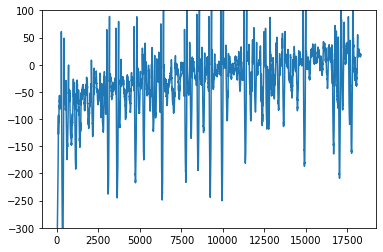

In [28]:
# reward received during training
rpR = np.vstack(episode_reward)
from scipy.signal import savgol_filter
yhat = savgol_filter(rpR[:,2], 161, 2) # window size 51, polynomial order 3
#plt.plot(rpR[:,4])
plt.figure(figsize=(6,4))
plt.plot(yhat)
plt.ylim([-300,100])

In [ ]:
vvr = np.stack(validation_reward)
plt.figure(figsize=(6,4))
plt.plot(vvr[:,1])
plt.ylabel('Validation Acc (non-Cx)')
plt.show()

In [ ]:
# histogram of Q values last 10 episodes
epn = -1
mmat = allEpData
episQ = np.stack(mmat[epn][:,0])[:,]
episY = mmat[epn][:,4]*10+10
episC = mmat[epn][:,5]*10+10
episTau = mmat[epn][:,1]
# print (episY)

plt.figure(figsize=(20,10))
plt.rcParams["figure.figsize"] = (20,10)
fig, ax1 = plt.subplots()
ax2 = ax1.twinx()

ax1.plot(episY, label='GT')
ax1.plot(episTau, label='Tau', color='black')
#ax1.plot(episC+1, label='pi(s)', color='cyan')
ax1.legend(loc='best')

ax2.plot(episQ[:,0], label='A1')
ax2.plot(episQ[:,1], label='A2')
ax2.plot(episQ[:,2], label='A3')
ax2.plot(episQ[:,3], label='A4')
ax2.plot(episQ[:,4], label='A5')
ax2.plot(episQ[:,5], label='Ax')
ax2.set_ylim([-4,5])
ax2.legend(loc='best')

In [31]:
def remove_duplicates(arr): 
    final_list = [] 
    gt_tr = []
    final_list.append(arr[0])     
    for i in range(1,arr.shape[0]): 
        if arr[i] != arr[i-1]:
            final_list.append(arr[i])     
            if arr[i] != num_camera-1:
                gt_tr.append(arr[i])
    return final_list, gt_tr

In [32]:
#policy_net = torch.load('./EpData/policy_db4_3rep_del_rareFreq_ep5k_1201')

Initial position:  [    7 33839   283   816    96   237]
Initial position:  [    0 20939  1851   298    64   194]
Initial position:  [     0 122030   1851    427     62    228]
Initial position:  [    7 52909   233   811    97   241]
Initial position:  [     0 126222   1847    272     68    213]
Initial position:  [    7 88687   256   821    94   236]
Initial position:  [    5 14238  1589   595    95   239]
Initial position:  [    7 99379   268   820    94   237]
Initial position:  [     5 145243    137    724    138    344]
Initial position:  [     7 142346   1765    763     90    227]
Initial position:  [    7 55585  1774   687    95   241]
Initial position:  [    1 27254   698   138    67   168]
Initial position:  [    7 71533   256   807    99   249]
Initial position:  [     7 163928    257    807     99    247]
Initial position:  [    5 35783  1568   582    98   248]
Initial position:  [    7 18757  1769   726    92   232]
Initial position:  [    7 10747   581   816    98   240]
I

Initial position:  [    7 71946  1771   712    93   234]
Initial position:  [    5 98438  1606   608    91   231]
Initial position:  [     0 115607   1860    310     56    190]
Initial position:  [    0 26294  1855   404    56   216]
Initial position:  [     7 160954   1773    720     88    222]
Initial position:  [    1 54999  1842   362    73   225]
Initial position:  [    7 80689  1772   758    83   210]
Initial position:  [     7 104443   1766    771     84    214]
Initial position:  [     7 127063    244    796    105    264]
Initial position:  [    3 49905  1321   142    41   104]
Initial position:  [    5 45107  1585   612    87   219]
Initial position:  [    7 74864   323   813    97   246]
Initial position:  [    7 59765  1771   733    86   218]
Initial position:  [    7 30506  1775   715    87   220]
Initial position:  [    7 79859  1769   655    78   196]
Initial position:  [    6 67191     8   598    82   225]
Initial position:  [     5 117590   1619    598     97    245]
I

Initial position:  [     7 109779   1772    727     88    224]
Initial position:  [    0 65115  1841   441    77   246]
Initial position:  [    0 34154  1851   285    66   210]
Initial position:  [     5 109371   1625    594    100    253]
Initial position:  [    1 34868   704   133    68   173]
Initial position:  [    7 52640  1775   741    84   213]
Initial position:  [    0 70895  1859   271    53   194]
Initial position:  [    3 40350  1318   134    44   112]
Initial position:  [     0 152068   1857    287     60    191]
Initial position:  [    7 94246  1773   726    85   216]
Initial position:  [     7 116806   1770    736     87    219]
Initial position:  [     1 120840    698    126     72    181]
Initial position:  [     7 118899   1765    728     98    247]
Initial position:  [    7 77603   172   786   107   272]
Initial position:  [    0 18756  1859   288    57   198]
Initial position:  [    3 30563  1325   141    41   105]
Initial position:  [    0 46691  1855   271    60   

Initial position:  [    0 52915  1845   265    72   212]
Initial position:  [    7 10451  1771   713    93   234]
Initial position:  [    7 72591  1797   502    55   138]
Initial position:  [     3 155349   1311    140     42    106]
Initial position:  [    3 25533  1318   142    41   104]
Initial position:  [     7 155700     96    777    112    283]
Initial position:  [    1 76928  1839   463    73   243]
Initial position:  [    6 56772   801   572    62   157]
Initial position:  [     0 117940   1843    272     74    220]
Initial position:  [    0 68488  1856   274    50   214]
Initial position:  [    7 71045  1758   751    91   231]
Initial position:  [    7 53472   260   796   104   256]
Initial position:  [    7 49309  1759   704    95   239]
Initial position:  [    1 87395   667   132    70   177]
Initial position:  [    7 98027   255   796   104   264]
Initial position:  [     7 117811    239    820     94    239]
Initial position:  [    6 13802    14   588    70   214]
Initial

Initial position:  [     7 179445    236    798    102    254]
Initial position:  [    1 77723   710   146    63   160]
Initial position:  [     7 137022   1768    752     91    231]
Initial position:  [     7 172260   1768    712     93    234]
Initial position:  [    0 35281  1830   285    83   210]
Initial position:  [    3 44488  1337   140    42   106]
Initial position:  [    7 40227  1799   651    72   183]
Initial position:  [     7 107472   1772    726     85    216]
Initial position:  [    0 58943  1855   270    62   213]
Initial position:  [    7 50956  1771   741    87   220]
Initial position:  [    3 50710  1321   144    40   102]
Initial position:  [    0 79349  1855   295    61   187]
Initial position:  [    5 62032  1589   595    95   240]
Initial position:  [    0 42591  1830   743    77   311]
Initial position:  [    5 51175  1583   594    94   239]
Initial position:  [     7 138003   1755    488     59    148]
Initial position:  [    1 35136   706   133    68   173]
I

Initial position:  [    7 74844   209   835    88   219]
Initial position:  [    7 64913   296   817    96   238]
Initial position:  [    7 83758  1773   722    85   215]
Initial position:  [     7 114940    298    799    103    253]
Initial position:  [     7 119019   1742    789     83    211]
Initial position:  [    7 68033  1773   732    89   225]
Initial position:  [    5 66852  1591   606    90   228]
Initial position:  [    0 35934  1821   401    85   216]
Initial position:  [    0 48752  1800   243    82   207]
Initial position:  [    7 19158  1769   750    85   215]
Initial position:  [    7 74702  1770   731    89   225]
Initial position:  [    5 71972  1629   627    85   216]
Initial position:  [    5 25150  1615   611    91   230]
Initial position:  [     7 136996   1767    718     87    221]
Initial position:  [     7 136413    294    799    103    257]
Initial position:  [    7 51680  1769   762    86   218]
Initial position:  [    1 45297   687   138    66   168]
Initial

Initial position:  [     0 124191   1857    372     61    209]
Initial position:  [    4 29735  1825   593    87   294]
Initial position:  [    7 81443  1775   737    84   212]
Initial position:  [    7 73503   288   819    93   235]
Initial position:  [     0 116262   1855    278     61    208]
Initial position:  [     7 154512   1771    741     87    220]
Initial position:  [    0 67792  1841   423    74   242]
Initial position:  [    7 17010  1770   740    87   220]
Initial position:  [     7 152030   1774    767     84    212]
Initial position:  [     3 102896   1310    129     46    117]
Initial position:  [     7 177780   1770    713     93    234]
Initial position:  [     5 115485   1627    616     90    229]
Initial position:  [     7 141449   1738    745     82    206]
Initial position:  [    7 71499  1771   759    86   218]
Initial position:  [    3 13496  1321   139    42   107]
Initial position:  [     0 153733   1854    284     52    216]
Initial position:  [    5 57932  1

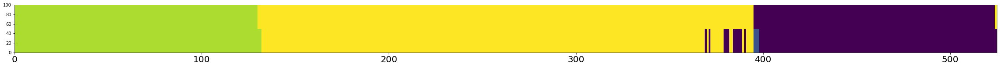

A,P,R:  0.9676190476190476 0.9377289377289377 0.9884169884169884
Num frames:  (273, 14)
Accuracy:  0.9676190476190476
Person:  1
Transitions:  [0, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


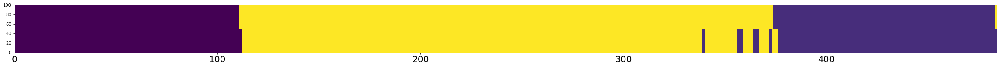

A,P,R:  0.9752066115702479 0.956140350877193 0.990909090909091
Num frames:  (228, 10)
Accuracy:  0.9752066115702479
Person:  2
Transitions:  [0, 8, 1, 8, 4, 8, 5, 8]
GT transitions:  3
Transitions captured:  3


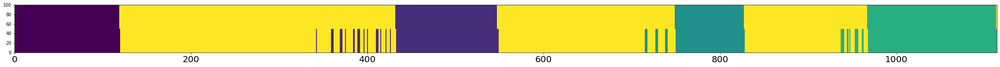

A,P,R:  0.9542190305206463 0.904572564612326 0.9934497816593887
Num frames:  (503, 48)
Accuracy:  0.9542190305206463
Person:  3
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



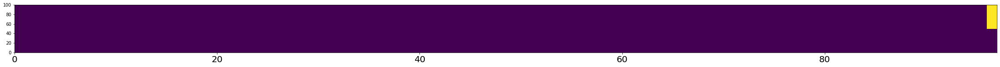

A,P,R:  0.9896907216494846 0.9896907216494846 1.0
Num frames:  (97, 1)
Accuracy:  0.9896907216494846
Person:  4
Transitions:  [0, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


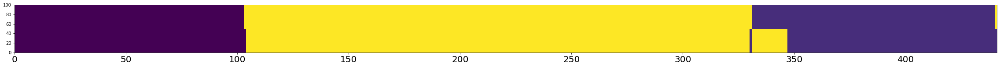

A,P,R:  0.9569160997732427 0.9849246231155779 0.9245283018867925
Num frames:  (199, 3)
Accuracy:  0.9569160997732427
Person:  5
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



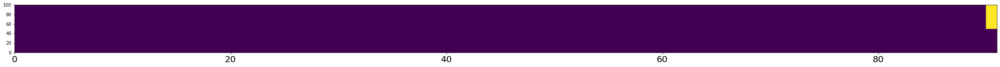

A,P,R:  0.989010989010989 0.989010989010989 1.0
Num frames:  (91, 1)
Accuracy:  0.989010989010989
Person:  6
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  2


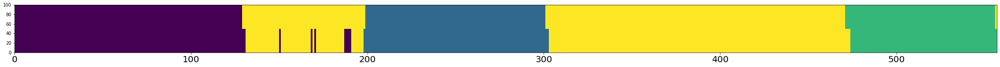

A,P,R:  0.9712746858168761 0.9601226993865031 0.990506329113924
Num frames:  (326, 13)
Accuracy:  0.9712746858168761
Person:  7
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



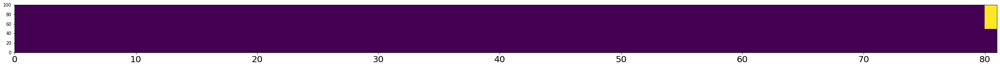

A,P,R:  0.9876543209876543 0.9876543209876543 1.0
Num frames:  (81, 1)
Accuracy:  0.9876543209876543
Person:  8
Transitions:  [5, 8, 4, 8]
GT transitions:  1
Transitions captured:  0


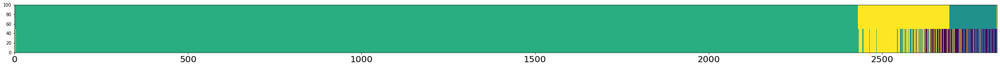

A,P,R:  0.9198163193217944 0.9187145557655955 0.9469992205767732
Num frames:  (2645, 91)
Accuracy:  0.9198163193217944
Person:  9
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



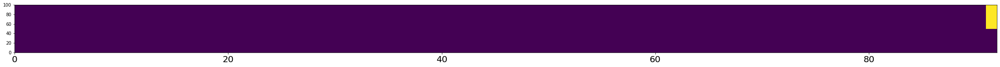

A,P,R:  0.9891304347826086 0.9891304347826086 1.0
Num frames:  (92, 1)
Accuracy:  0.9891304347826086
Person:  10
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



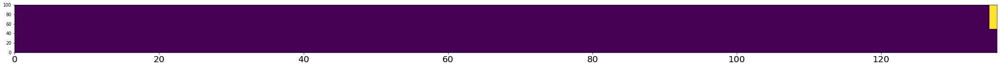

A,P,R:  0.9926470588235294 0.9926470588235294 1.0
Num frames:  (136, 1)
Accuracy:  0.9926470588235294
Person:  11
Transitions:  [1, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


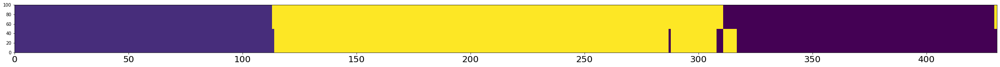

A,P,R:  0.9721577726218097 0.9741379310344828 0.9741379310344828
Num frames:  (232, 6)
Accuracy:  0.9721577726218097
Person:  12
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



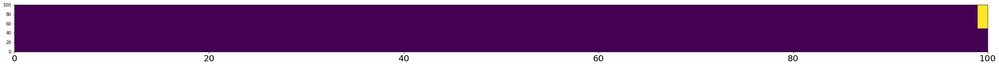

A,P,R:  0.99 0.99 1.0
Num frames:  (100, 1)
Accuracy:  0.99
Person:  13
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



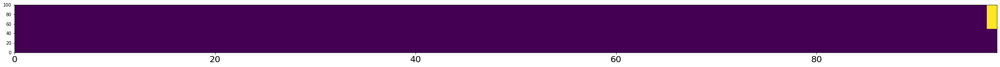

A,P,R:  0.9897959183673469 0.9897959183673469 1.0
Num frames:  (98, 1)
Accuracy:  0.9897959183673469
Person:  14
Transitions:  [5, 8, 4, 8, 2, 8]
GT transitions:  2
Transitions captured:  2


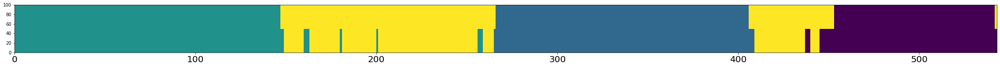

A,P,R:  0.9521178637200737 0.9353233830845771 1.0
Num frames:  (402, 26)
Accuracy:  0.9521178637200737
Person:  15
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



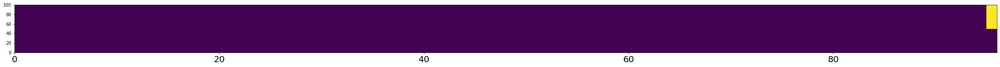

A,P,R:  0.9895833333333334 0.9895833333333334 1.0
Num frames:  (96, 1)
Accuracy:  0.9895833333333334
Person:  16
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  0


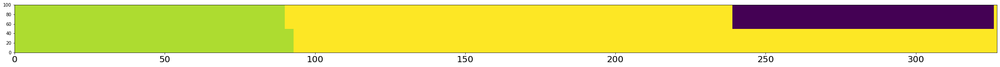

A,P,R:  0.7247706422018348 0.967741935483871 0.5084745762711864
Num frames:  (93, 3)
Accuracy:  0.7247706422018348
Person:  17
Transitions:  [3, 8, 2, 8, 1, 8]
GT transitions:  2
Transitions captured:  2


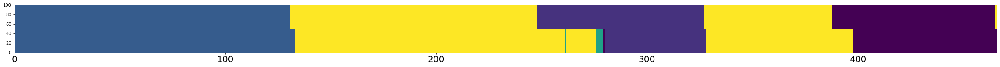

A,P,R:  0.9012875536480687 0.9645669291338582 0.8536585365853658
Num frames:  (254, 4)
Accuracy:  0.9012875536480687
Person:  18
Transitions:  [5, 8, 4, 8, 2, 8]
GT transitions:  2
Transitions captured:  2


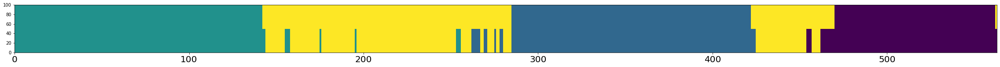

A,P,R:  0.9378330373001776 0.9137931034482759 1.0
Num frames:  (406, 35)
Accuracy:  0.9378330373001776
Person:  19
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


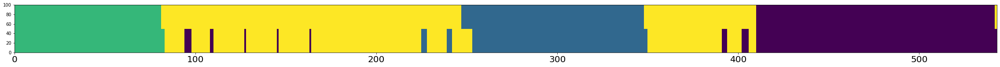

A,P,R:  0.9392265193370166 0.9194029850746268 0.9808917197452229
Num frames:  (335, 27)
Accuracy:  0.9392265193370166
Person:  20
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


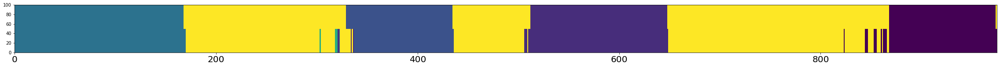

A,P,R:  0.963076923076923 0.9442379182156134 0.9844961240310077
Num frames:  (538, 28)
Accuracy:  0.963076923076923
Person:  21
Transitions:  [5, 8, 4, 8, 0, 8]
GT transitions:  2
Transitions captured:  1


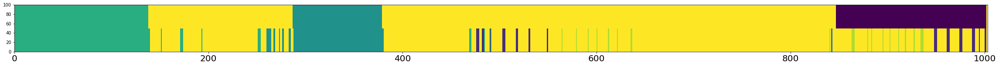

A,P,R:  0.7926221335992024 0.7411003236245954 0.5948051948051948
Num frames:  (309, 52)
Accuracy:  0.7926221335992024
Person:  22
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



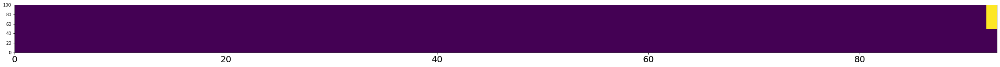

A,P,R:  0.989247311827957 0.989247311827957 1.0
Num frames:  (93, 1)
Accuracy:  0.989247311827957
Person:  23
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



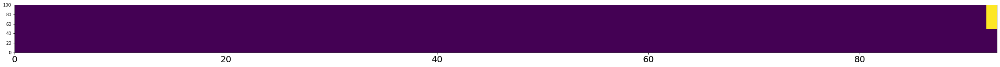

A,P,R:  0.989247311827957 0.989247311827957 1.0
Num frames:  (93, 1)
Accuracy:  0.989247311827957
Person:  24
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



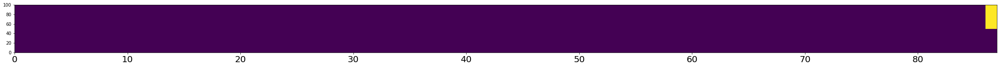

A,P,R:  0.9885057471264368 0.9885057471264368 1.0
Num frames:  (87, 1)
Accuracy:  0.9885057471264368
Person:  25
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


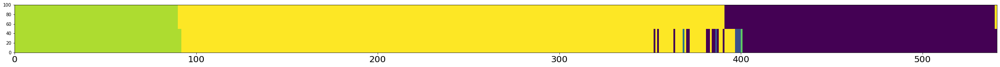

A,P,R:  0.9519408502772643 0.9196787148594378 0.9581589958158996
Num frames:  (249, 16)
Accuracy:  0.9519408502772643
Person:  26
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


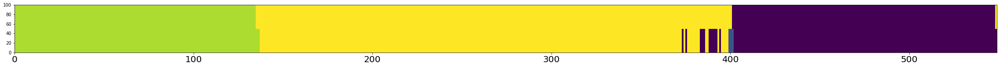

A,P,R:  0.9690346083788707 0.9429530201342282 0.9964539007092199
Num frames:  (298, 16)
Accuracy:  0.9690346083788707
Person:  27
Transitions:  [0, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


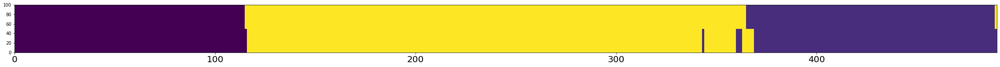

A,P,R:  0.9795918367346939 0.975103734439834 0.9832635983263598
Num frames:  (241, 6)
Accuracy:  0.9795918367346939
Person:  28
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


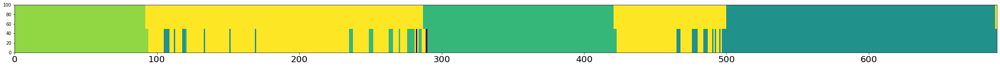

A,P,R:  0.9231884057971015 0.8898488120950324 0.9927710843373494
Num frames:  (463, 50)
Accuracy:  0.9231884057971015
Person:  29
Transitions:  [5, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


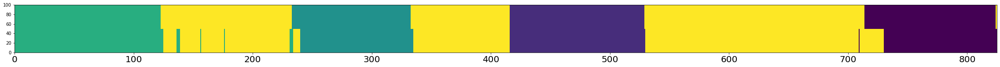

A,P,R:  0.9551515151515152 0.9657534246575342 0.9484304932735426
Num frames:  (438, 14)
Accuracy:  0.9551515151515152
Person:  30
Transitions:  [0, 8, 7, 8]
GT transitions:  1
Transitions captured:  1


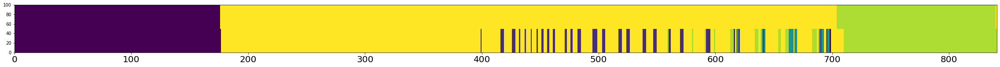

A,P,R:  0.8787158145065398 0.7611940298507462 0.9807692307692307
Num frames:  (402, 96)
Accuracy:  0.8787158145065398
Person:  31
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


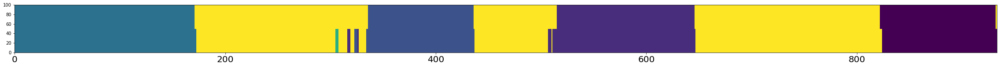

A,P,R:  0.9721329046087889 0.9550561797752809 0.99609375
Num frames:  (534, 24)
Accuracy:  0.9721329046087889
Person:  32
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


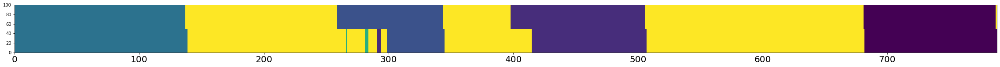

A,P,R:  0.9200507614213198 0.9692307692307692 0.8669724770642202
Num frames:  (390, 5)
Accuracy:  0.9200507614213198
Person:  33
Transitions:  [6, 8, 7, 8, 0, 8]
GT transitions:  2
Transitions captured:  2


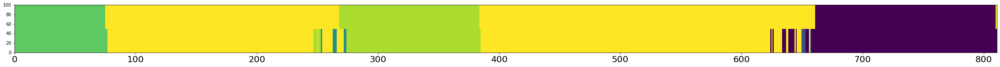

A,P,R:  0.9506781750924784 0.9027027027027027 0.9823529411764705
Num frames:  (370, 34)
Accuracy:  0.9506781750924784
Person:  34
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


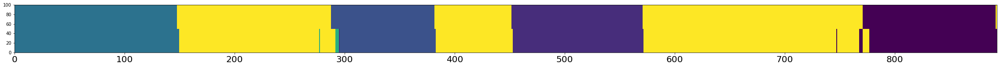

A,P,R:  0.9720044792833147 0.9708939708939709 0.9688796680497925
Num frames:  (481, 10)
Accuracy:  0.9720044792833147
Person:  35
Transitions:  [7, 8, 6, 8]
GT transitions:  1
Transitions captured:  1


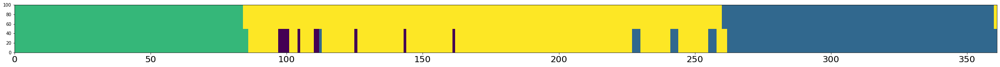

A,P,R:  0.9307479224376731 0.8878048780487805 0.9891304347826086
Num frames:  (205, 23)
Accuracy:  0.9307479224376731
Person:  36
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



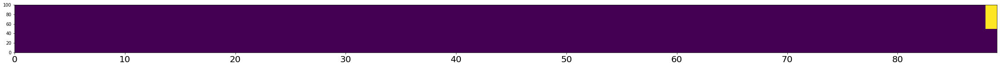

A,P,R:  0.9887640449438202 0.9887640449438202 1.0
Num frames:  (89, 1)
Accuracy:  0.9887640449438202
Person:  37
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



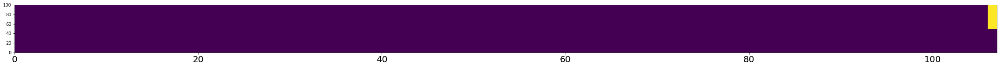

A,P,R:  0.9906542056074766 0.9906542056074766 1.0
Num frames:  (107, 1)
Accuracy:  0.9906542056074766
Person:  38
Transitions:  [5, 8, 4, 8, 1, 8]
GT transitions:  2
Transitions captured:  0


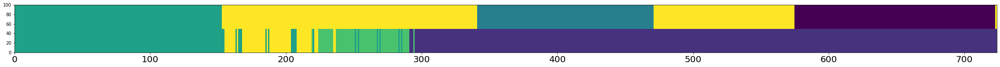

A,P,R:  0.292817679558011 0.23007518796992482 0.35498839907192575
Num frames:  (665, 234)
Accuracy:  0.292817679558011
Person:  39
Transitions:  [3, 8, 2, 8, 1, 8]
GT transitions:  2
Transitions captured:  2


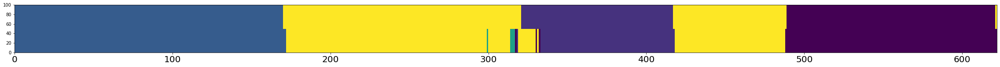

A,P,R:  0.9630225080385852 0.9674185463659147 0.9698492462311558
Num frames:  (399, 11)
Accuracy:  0.9630225080385852
Person:  40
Transitions:  [1, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


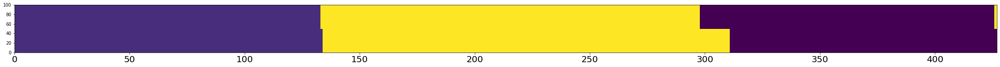

A,P,R:  0.9648711943793911 0.992 0.9501915708812261
Num frames:  (250, 2)
Accuracy:  0.9648711943793911
Person:  41
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


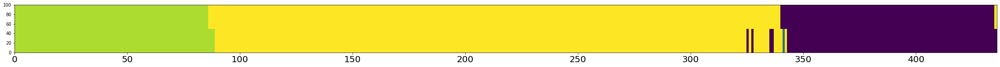

A,P,R:  0.9747706422018348 0.9518716577540107 0.9834254143646409
Num frames:  (187, 8)
Accuracy:  0.9747706422018348
Person:  42
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


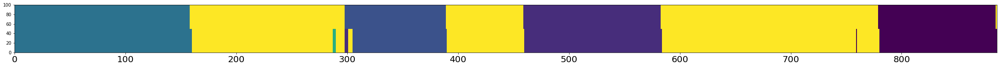

A,P,R:  0.9796839729119639 0.975103734439834 0.9812108559498957
Num frames:  (482, 9)
Accuracy:  0.9796839729119639
Person:  43
Transitions:  [2, 8]
GT transitions:  0
Transitions captured:  0



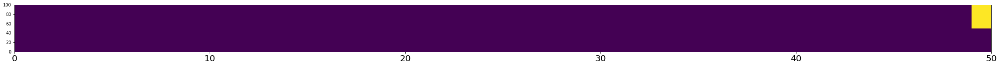

A,P,R:  0.98 0.98 1.0
Num frames:  (50, 1)
Accuracy:  0.98
Person:  44
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  2


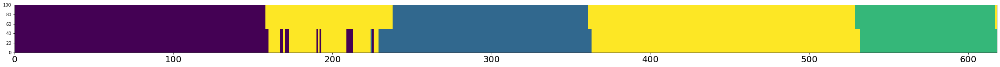

A,P,R:  0.9514563106796117 0.9312977099236641 0.991869918699187
Num frames:  (393, 27)
Accuracy:  0.9514563106796117
Person:  45
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


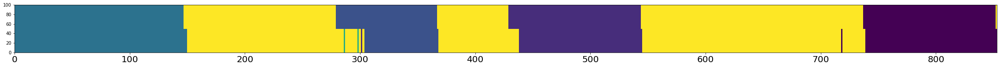

A,P,R:  0.9495896834701055 0.9772209567198178 0.9225806451612903
Num frames:  (439, 7)
Accuracy:  0.9495896834701055
Person:  46
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



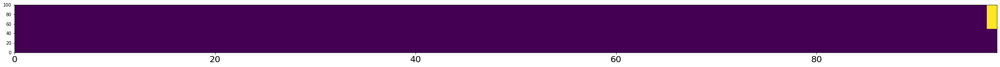

A,P,R:  0.9897959183673469 0.9897959183673469 1.0
Num frames:  (98, 1)
Accuracy:  0.9897959183673469
Person:  47
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  0


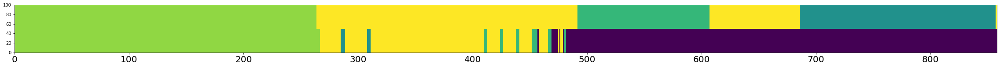

A,P,R:  0.5174825174825175 0.3893805309734513 0.48
Num frames:  (678, 128)
Accuracy:  0.5174825174825175
Person:  48
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



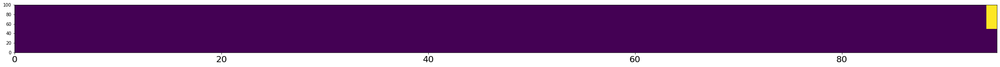

A,P,R:  0.9894736842105263 0.9894736842105263 1.0
Num frames:  (95, 1)
Accuracy:  0.9894736842105263
Person:  49
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



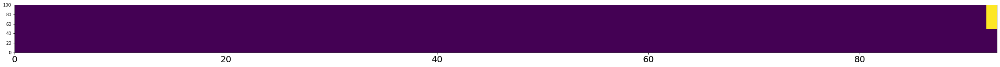

A,P,R:  0.989247311827957 0.989247311827957 1.0
Num frames:  (93, 1)
Accuracy:  0.989247311827957
Person:  50
Transitions:  [5, 8, 6, 8, 7, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


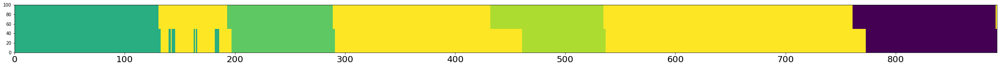

A,P,R:  0.929372197309417 0.9584295612009238 0.9021739130434783
Num frames:  (433, 18)
Accuracy:  0.929372197309417
Person:  51
Transitions:  [1, 8, 2, 8, 3, 8]
GT transitions:  2
Transitions captured:  2


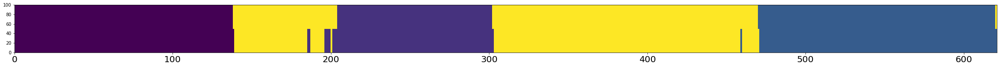

A,P,R:  0.9774557165861514 0.9673366834170855 0.9974093264248705
Num frames:  (398, 13)
Accuracy:  0.9774557165861514
Person:  52
Transitions:  [7, 8, 4, 8, 4, 8, 6, 8, 7, 8]
GT transitions:  4
Transitions captured:  0


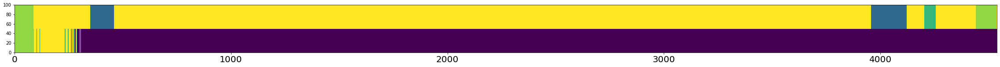

A,P,R:  0.057061026657854154 0.020146520146520148 0.17254901960784313
Num frames:  (4368, 3858)
Accuracy:  0.057061026657854154
Person:  53
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



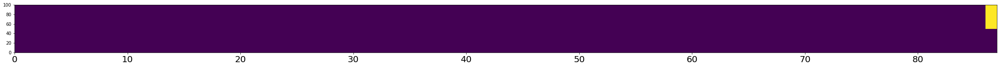

A,P,R:  0.9885057471264368 0.9885057471264368 1.0
Num frames:  (87, 1)
Accuracy:  0.9885057471264368
Person:  54
Transitions:  [5, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


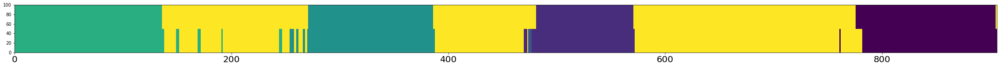

A,P,R:  0.9536423841059603 0.928 0.9872340425531915
Num frames:  (500, 36)
Accuracy:  0.9536423841059603
Person:  55
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


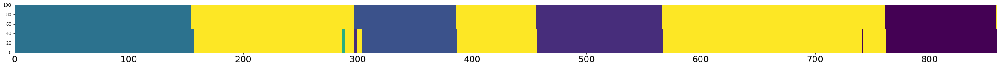

A,P,R:  0.9790454016298021 0.973568281938326 0.9800443458980045
Num frames:  (454, 9)
Accuracy:  0.9790454016298021
Person:  56
Transitions:  [0, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


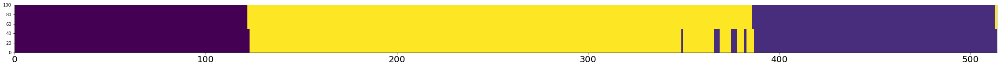

A,P,R:  0.9785992217898832 0.9612403100775194 0.9959839357429718
Num frames:  (258, 10)
Accuracy:  0.9785992217898832
Person:  57
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



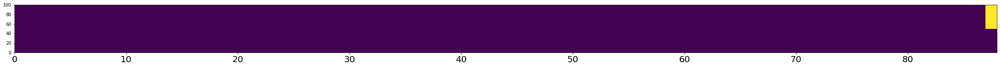

A,P,R:  0.9886363636363636 0.9886363636363636 1.0
Num frames:  (88, 1)
Accuracy:  0.9886363636363636
Person:  58
Transitions:  [1, 8, 2, 8, 3, 8]
GT transitions:  2
Transitions captured:  2


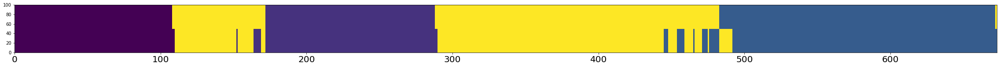

A,P,R:  0.9405646359583952 0.9287356321839081 0.9782082324455206
Num frames:  (435, 31)
Accuracy:  0.9405646359583952
Person:  59
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



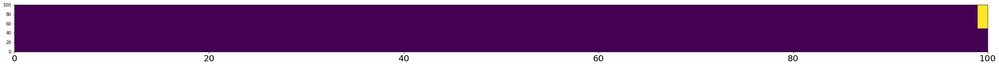

A,P,R:  0.99 0.99 1.0
Num frames:  (100, 1)
Accuracy:  0.99
Person:  60
Transitions:  [3, 8, 2, 8, 4, 8, 1, 8, 7, 8]
GT transitions:  4
Transitions captured:  2


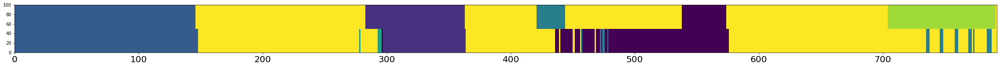

A,P,R:  0.7222222222222222 0.6666666666666666 0.6666666666666666
Num frames:  (372, 96)
Accuracy:  0.7222222222222222
Person:  61
Transitions:  [0, 8, 1, 8, 4, 8, 5, 8]
GT transitions:  3
Transitions captured:  3


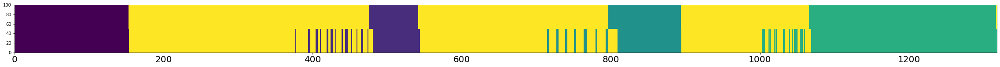

A,P,R:  0.9241274658573596 0.8724082934609251 0.9647266313932981
Num frames:  (627, 80)
Accuracy:  0.9241274658573596
Person:  62
Transitions:  [5, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


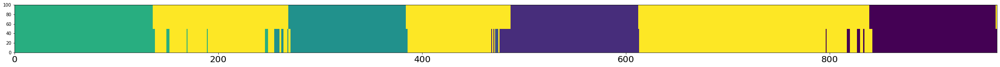

A,P,R:  0.9470954356846473 0.9149722735674677 0.99
Num frames:  (541, 46)
Accuracy:  0.9470954356846473
Person:  63
Transitions:  [3, 8, 4, 8]
GT transitions:  1
Transitions captured:  0


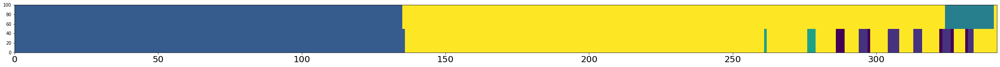

A,P,R:  0.8888888888888888 0.8333333333333334 0.8881578947368421
Num frames:  (162, 21)
Accuracy:  0.8888888888888888
Person:  64
Transitions:  [6, 8, 5, 8]
GT transitions:  1
Transitions captured:  1


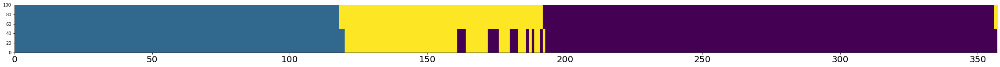

A,P,R:  0.9523809523809523 0.9461279461279462 0.9964539007092199
Num frames:  (297, 16)
Accuracy:  0.9523809523809523
Person:  65
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



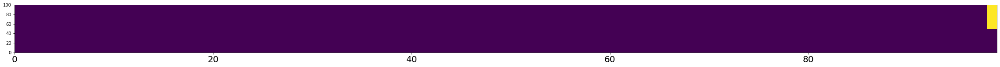

A,P,R:  0.98989898989899 0.98989898989899 1.0
Num frames:  (99, 1)
Accuracy:  0.98989898989899
Person:  66
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  1


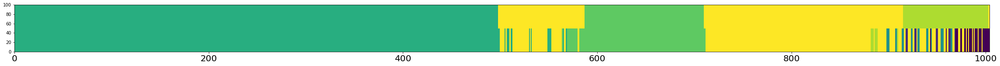

A,P,R:  0.8635458167330677 0.8649025069637883 0.8758815232722144
Num frames:  (718, 49)
Accuracy:  0.8635458167330677
Person:  67
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


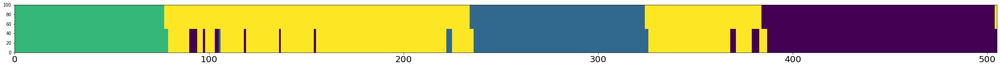

A,P,R:  0.9386138613861386 0.9155844155844156 0.9825783972125436
Num frames:  (308, 26)
Accuracy:  0.9386138613861386
Person:  68
Transitions:  [3, 8, 2, 8, 1, 8]
GT transitions:  2
Transitions captured:  2


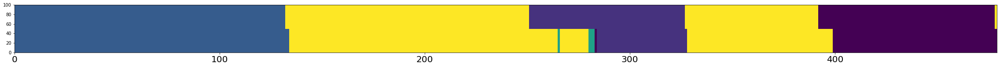

A,P,R:  0.9081419624217119 0.9657794676806084 0.8639455782312925
Num frames:  (263, 4)
Accuracy:  0.9081419624217119
Person:  69
Transitions:  [5, 8, 4, 8]
GT transitions:  1
Transitions captured:  1


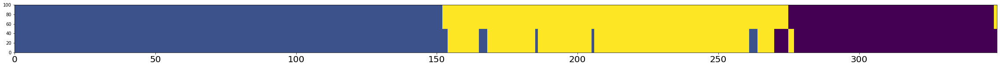

A,P,R:  0.9484240687679083 0.9330543933054394 0.9911111111111112
Num frames:  (239, 16)
Accuracy:  0.9484240687679083
Person:  70
Transitions:  [0, 8, 7, 8]
GT transitions:  1
Transitions captured:  1


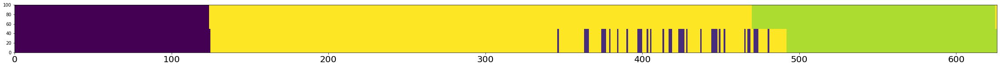

A,P,R:  0.9089456869009584 0.8682432432432432 0.921146953405018
Num frames:  (296, 35)
Accuracy:  0.9089456869009584
Person:  71
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



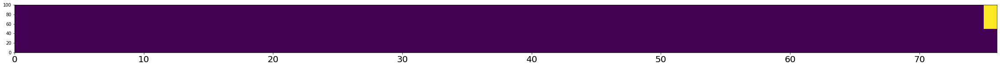

A,P,R:  0.9868421052631579 0.9868421052631579 1.0
Num frames:  (76, 1)
Accuracy:  0.9868421052631579
Person:  72
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



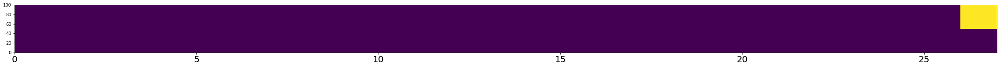

A,P,R:  0.9629629629629629 0.9629629629629629 1.0
Num frames:  (27, 1)
Accuracy:  0.9629629629629629
Person:  73
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  2


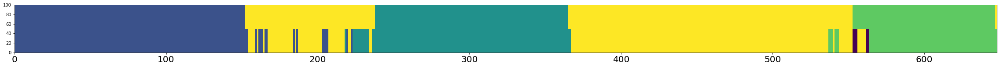

A,P,R:  0.9228395061728395 0.8916256157635468 0.9705093833780161
Num frames:  (406, 39)
Accuracy:  0.9228395061728395
Person:  74
Transitions:  [0, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


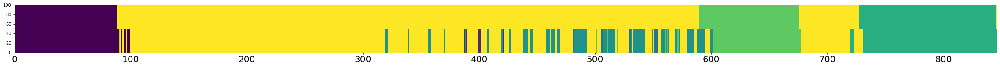

A,P,R:  0.8463356973995272 0.6934673366834171 0.9419795221843004
Num frames:  (398, 113)
Accuracy:  0.8463356973995272
Person:  75
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


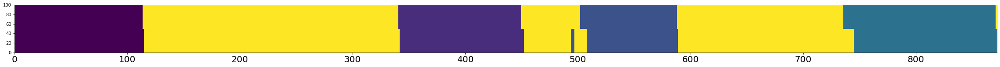

A,P,R:  0.9724770642201835 0.981651376146789 0.963963963963964
Num frames:  (436, 8)
Accuracy:  0.9724770642201835
Person:  76
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



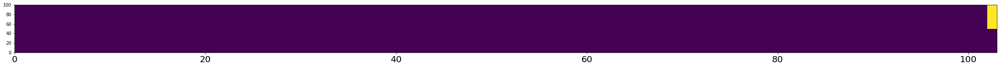

A,P,R:  0.9902912621359223 0.9902912621359223 1.0
Num frames:  (103, 1)
Accuracy:  0.9902912621359223
Person:  77
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



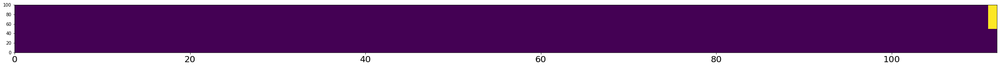

A,P,R:  0.9910714285714286 0.9910714285714286 1.0
Num frames:  (112, 1)
Accuracy:  0.9910714285714286
Person:  78
Transitions:  [0, 8, 1, 8, 4, 8, 5, 8]
GT transitions:  3
Transitions captured:  3


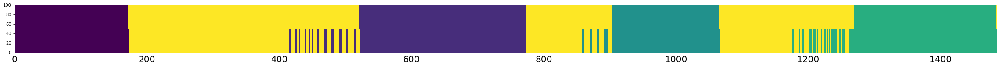

A,P,R:  0.9333333333333333 0.8907469342251951 0.99875
Num frames:  (897, 98)
Accuracy:  0.9333333333333333
Person:  79
Transitions:  [1, 8, 2, 8, 4, 8, 5, 8]
GT transitions:  3
Transitions captured:  3


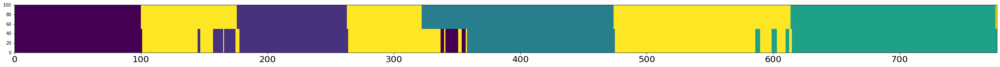

A,P,R:  0.9060489060489061 0.90234375 0.9221556886227545
Num frames:  (512, 34)
Accuracy:  0.9060489060489061
Person:  80
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


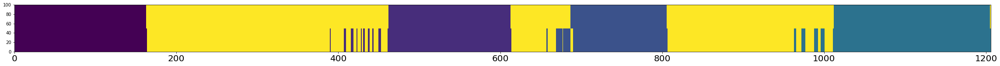

A,P,R:  0.9469320066334992 0.9108187134502924 0.9952076677316294
Num frames:  (684, 61)
Accuracy:  0.9469320066334992
Person:  81
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


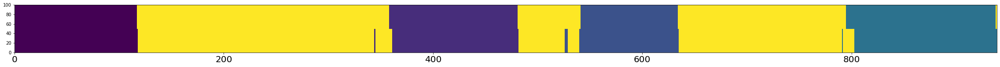

A,P,R:  0.9776357827476039 0.9789473684210527 0.976890756302521
Num frames:  (475, 10)
Accuracy:  0.9776357827476039
Person:  82
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  1


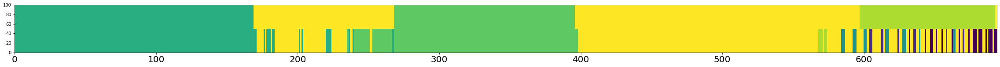

A,P,R:  0.7795389048991355 0.7538071065989848 0.7557251908396947
Num frames:  (394, 57)
Accuracy:  0.7795389048991355
Person:  83
Transitions:  [3, 8, 2, 8, 4, 8, 5, 8]
GT transitions:  3
Transitions captured:  3


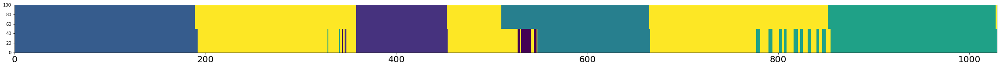

A,P,R:  0.9183673469387755 0.9067930489731437 0.9333333333333333
Num frames:  (633, 43)
Accuracy:  0.9183673469387755
Person:  84
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


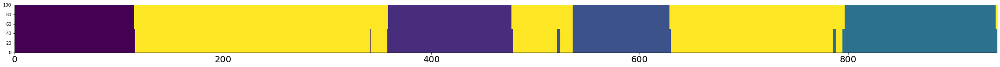

A,P,R:  0.9840933191940615 0.9691358024691358 1.0
Num frames:  (486, 15)
Accuracy:  0.9840933191940615
Person:  85
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



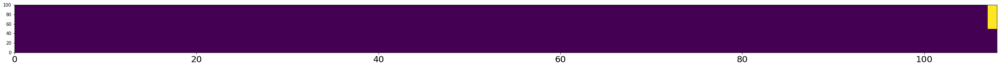

A,P,R:  0.9907407407407407 0.9907407407407407 1.0
Num frames:  (108, 1)
Accuracy:  0.9907407407407407
Person:  86
Transitions:  [1, 8]
GT transitions:  0
Transitions captured:  0



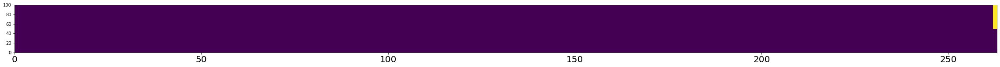

A,P,R:  0.9961977186311787 0.9961977186311787 1.0
Num frames:  (263, 1)
Accuracy:  0.9961977186311787
Person:  87
Transitions:  [0, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


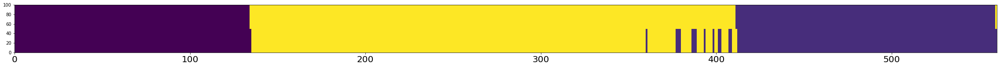

A,P,R:  0.9714285714285714 0.9493243243243243 0.9964539007092199
Num frames:  (296, 15)
Accuracy:  0.9714285714285714
Person:  88
Transitions:  [5, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


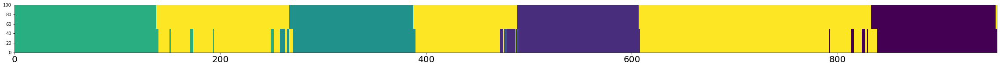

A,P,R:  0.9413612565445026 0.9136960600375235 0.9779116465863453
Num frames:  (533, 45)
Accuracy:  0.9413612565445026
Person:  89
Transitions:  [1, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


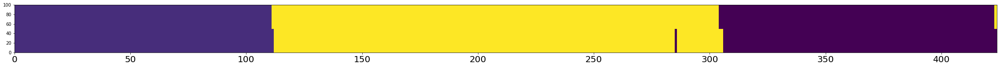

A,P,R:  0.9882075471698113 0.987012987012987 0.991304347826087
Num frames:  (231, 3)
Accuracy:  0.9882075471698113
Person:  90
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


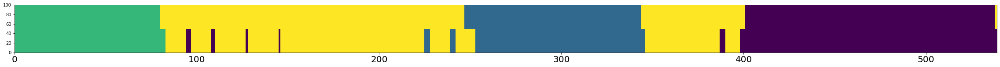

A,P,R:  0.9424860853432282 0.924924924924925 0.9808917197452229
Num frames:  (333, 25)
Accuracy:  0.9424860853432282
Person:  91
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


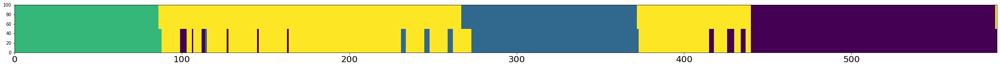

A,P,R:  0.9318568994889267 0.9068493150684932 0.9821958456973294
Num frames:  (365, 34)
Accuracy:  0.9318568994889267
Person:  92
Transitions:  [1, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


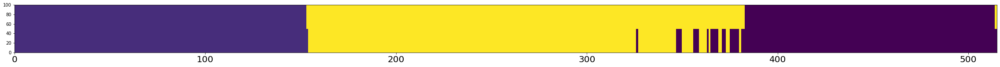

A,P,R:  0.9553398058252427 0.9250814332247557 1.0
Num frames:  (307, 23)
Accuracy:  0.9553398058252427
Person:  93
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


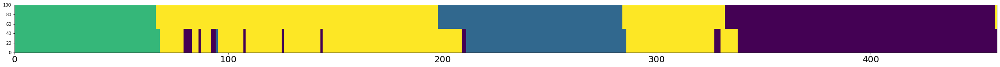

A,P,R:  0.9172113289760349 0.925 0.9316546762589928
Num frames:  (280, 19)
Accuracy:  0.9172113289760349
Person:  94
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



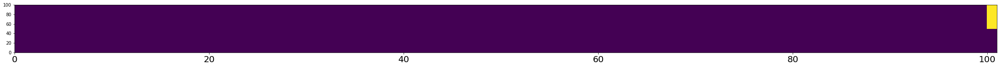

A,P,R:  0.9900990099009901 0.9900990099009901 1.0
Num frames:  (101, 1)
Accuracy:  0.9900990099009901
Person:  95
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  2


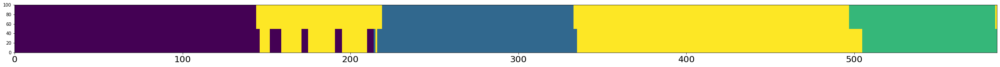

A,P,R:  0.9384615384615385 0.9232876712328767 0.9768115942028985
Num frames:  (365, 28)
Accuracy:  0.9384615384615385
Person:  96
Transitions:  [4, 8, 5, 8]
GT transitions:  1
Transitions captured:  1


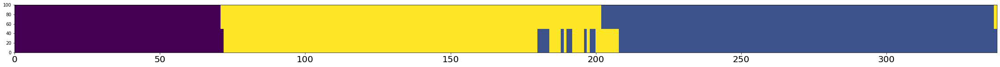

A,P,R:  0.9467455621301775 0.9433962264150944 0.970873786407767
Num frames:  (212, 12)
Accuracy:  0.9467455621301775
Person:  97
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



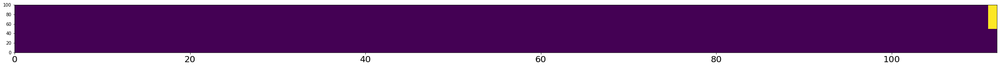

A,P,R:  0.9910714285714286 0.9910714285714286 1.0
Num frames:  (112, 1)
Accuracy:  0.9910714285714286
Person:  98
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


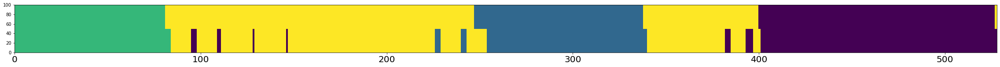

A,P,R:  0.9356060606060606 0.917981072555205 0.9732441471571907
Num frames:  (317, 26)
Accuracy:  0.9356060606060606
Person:  99
Transitions:  [1, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


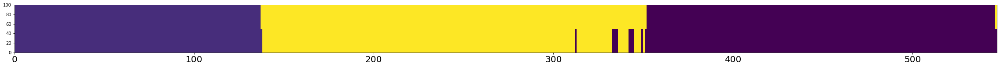

A,P,R:  0.979890310786106 0.9678362573099415 1.0
Num frames:  (342, 11)
Accuracy:  0.979890310786106
Person:  100
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


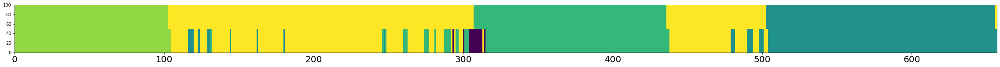

A,P,R:  0.908675799086758 0.8663594470046083 0.9766233766233766
Num frames:  (434, 51)
Accuracy:  0.908675799086758
Person:  101
Transitions:  [0, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


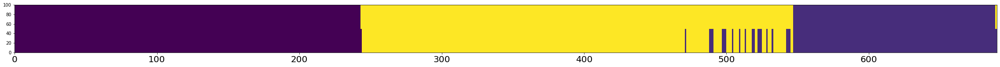

A,P,R:  0.9681159420289855 0.9459459459459459 1.0
Num frames:  (407, 22)
Accuracy:  0.9681159420289855
Person:  102
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



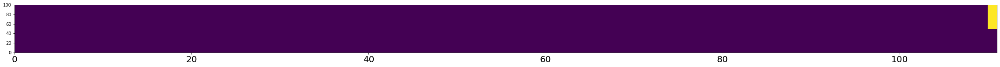

A,P,R:  0.990990990990991 0.990990990990991 1.0
Num frames:  (111, 1)
Accuracy:  0.990990990990991
Person:  103
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


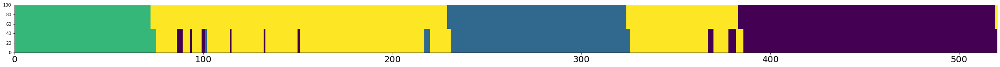

A,P,R:  0.9403846153846154 0.9197530864197531 0.9834983498349835
Num frames:  (324, 26)
Accuracy:  0.9403846153846154
Person:  104
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



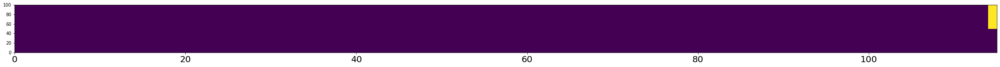

A,P,R:  0.991304347826087 0.991304347826087 1.0
Num frames:  (115, 1)
Accuracy:  0.991304347826087
Person:  105
Transitions:  [2, 8, 4, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


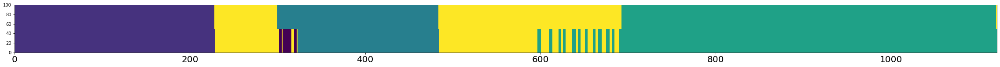

A,P,R:  0.9393398751115076 0.9304446978335233 0.9725864123957092
Num frames:  (877, 45)
Accuracy:  0.9393398751115076
Person:  106
Transitions:  [0, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


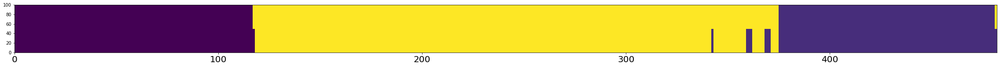

A,P,R:  0.9813278008298755 0.9612068965517241 1.0
Num frames:  (232, 9)
Accuracy:  0.9813278008298755
Person:  107
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


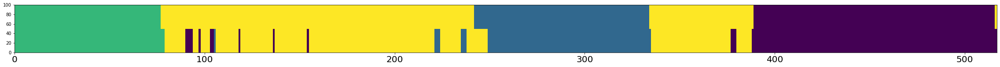

A,P,R:  0.9381044487427466 0.9203821656050956 0.9763513513513513
Num frames:  (314, 25)
Accuracy:  0.9381044487427466
Person:  108
Transitions:  [4, 8, 5, 8]
GT transitions:  1
Transitions captured:  1


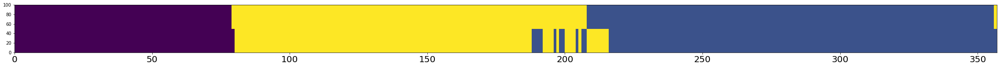

A,P,R:  0.9439775910364145 0.948051948051948 0.9647577092511013
Num frames:  (231, 12)
Accuracy:  0.9439775910364145
Person:  109
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


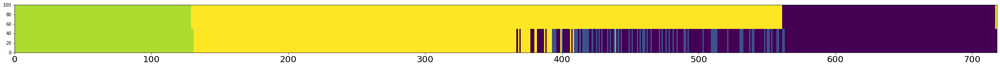

A,P,R:  0.7479108635097493 0.6099137931034483 0.9929824561403509
Num frames:  (464, 179)
Accuracy:  0.7479108635097493
Person:  110
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



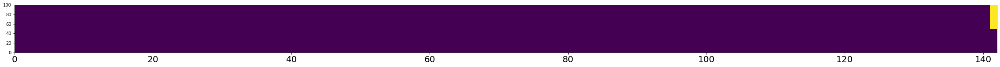

A,P,R:  0.9929577464788732 0.9929577464788732 1.0
Num frames:  (142, 1)
Accuracy:  0.9929577464788732
Person:  111
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  1


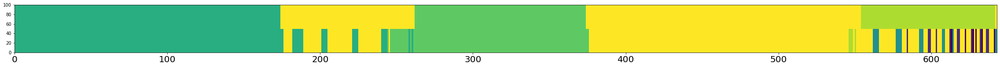

A,P,R:  0.7931570762052877 0.7900552486187845 0.7647058823529411
Num frames:  (362, 45)
Accuracy:  0.7931570762052877
Person:  112
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


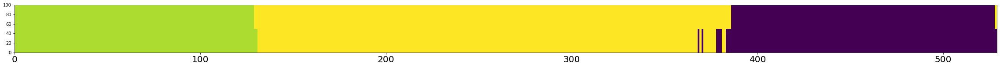

A,P,R:  0.9792060491493384 0.9609929078014184 1.0
Num frames:  (282, 11)
Accuracy:  0.9792060491493384
Person:  113
Transitions:  [5, 8, 4, 8]
GT transitions:  1
Transitions captured:  1


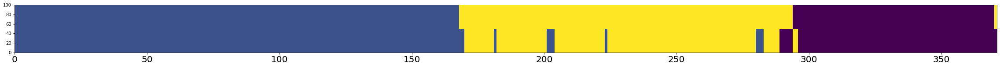

A,P,R:  0.9514824797843666 0.937984496124031 0.9918032786885246
Num frames:  (258, 16)
Accuracy:  0.9514824797843666
Person:  114
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


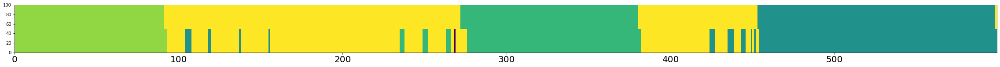

A,P,R:  0.9332220367278798 0.9064171122994652 0.9854651162790697
Num frames:  (374, 35)
Accuracy:  0.9332220367278798
Person:  115
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



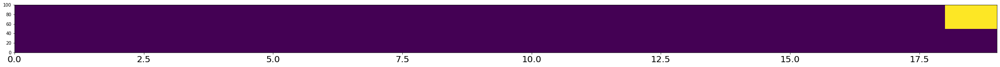

A,P,R:  0.9473684210526315 0.9473684210526315 1.0
Num frames:  (19, 1)
Accuracy:  0.9473684210526315
Person:  116
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



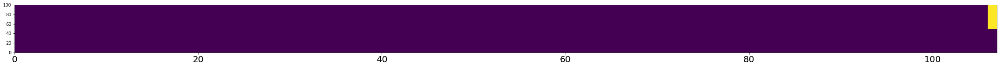

A,P,R:  0.9906542056074766 0.9906542056074766 1.0
Num frames:  (107, 1)
Accuracy:  0.9906542056074766
Person:  117
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


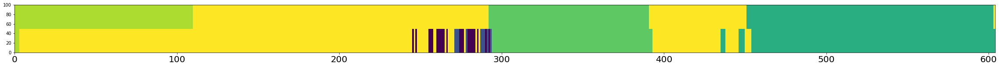

A,P,R:  0.75 0.8586206896551725 0.6897506925207756
Num frames:  (290, 39)
Accuracy:  0.75
Person:  118
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  2


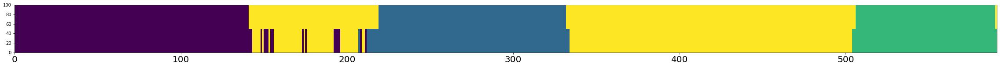

A,P,R:  0.9509306260575296 0.9209809264305178 1.0
Num frames:  (367, 29)
Accuracy:  0.9509306260575296
Person:  119
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



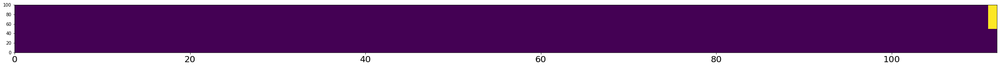

A,P,R:  0.9910714285714286 0.9910714285714286 1.0
Num frames:  (112, 1)
Accuracy:  0.9910714285714286
Person:  120
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



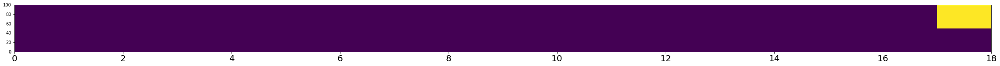

A,P,R:  0.9444444444444444 0.9444444444444444 1.0
Num frames:  (18, 1)
Accuracy:  0.9444444444444444
Person:  121
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


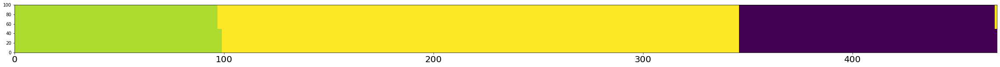

A,P,R:  0.9936034115138592 0.9864864864864865 1.0
Num frames:  (222, 3)
Accuracy:  0.9936034115138592
Person:  122
Transitions:  [0, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


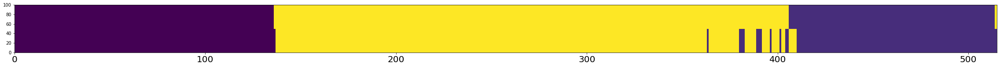

A,P,R:  0.9669902912621359 0.9486166007905138 0.9836065573770492
Num frames:  (253, 13)
Accuracy:  0.9669902912621359
Person:  123
Transitions:  [6, 8, 5, 8]
GT transitions:  1
Transitions captured:  1


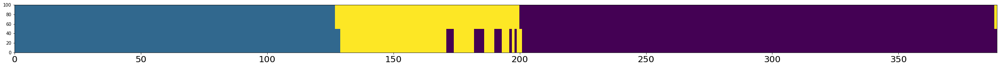

A,P,R:  0.9588688946015425 0.9544072948328267 0.9968253968253968
Num frames:  (329, 15)
Accuracy:  0.9588688946015425
Person:  124
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  1


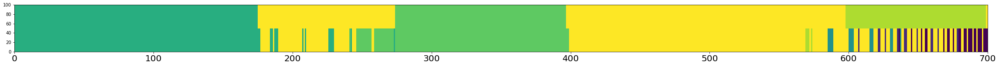

A,P,R:  0.7814285714285715 0.7544303797468355 0.7468671679197995
Num frames:  (395, 52)
Accuracy:  0.7814285714285715
Person:  125
Transitions:  [5, 8, 4, 8, 0, 8]
GT transitions:  2
Transitions captured:  1


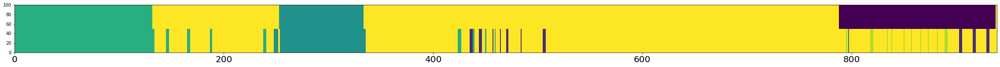

A,P,R:  0.7965921192758253 0.7681159420289855 0.5840220385674931
Num frames:  (276, 40)
Accuracy:  0.7965921192758253
Person:  126
Transitions:  [2, 8, 1, 8, 0, 8]
GT transitions:  2
Transitions captured:  2


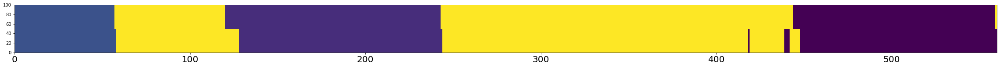

A,P,R:  0.9660714285714286 0.9758620689655172 0.9593220338983051
Num frames:  (290, 7)
Accuracy:  0.9660714285714286
Person:  127
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


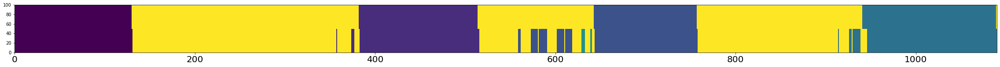

A,P,R:  0.9348623853211009 0.8898450946643718 0.9866412213740458
Num frames:  (581, 64)
Accuracy:  0.9348623853211009
Person:  128
Transitions:  [1, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


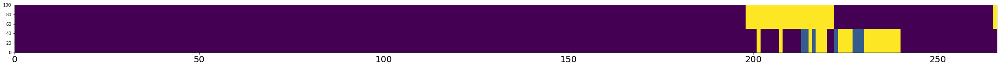

A,P,R:  0.8609022556390977 0.9065040650406504 0.9253112033195021
Num frames:  (246, 19)
Accuracy:  0.8609022556390977
Person:  129
Transitions:  [4, 8, 5, 8]
GT transitions:  1
Transitions captured:  1


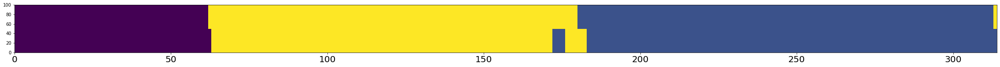

A,P,R:  0.9713375796178344 0.9696969696969697 0.9846153846153847
Num frames:  (198, 6)
Accuracy:  0.9713375796178344
Person:  130
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



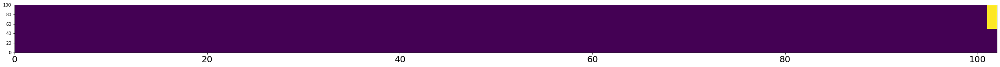

A,P,R:  0.9901960784313726 0.9901960784313726 1.0
Num frames:  (102, 1)
Accuracy:  0.9901960784313726
Person:  131
Transitions:  [1, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


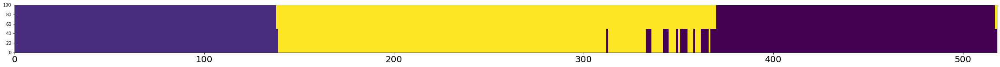

A,P,R:  0.9575289575289575 0.9283387622149837 1.0
Num frames:  (307, 22)
Accuracy:  0.9575289575289575
Person:  132
Transitions:  [4, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


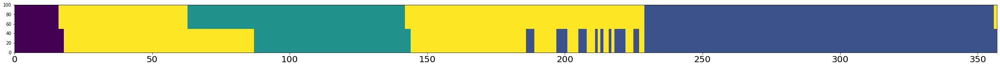

A,P,R:  0.865546218487395 0.8918918918918919 0.8918918918918919
Num frames:  (222, 24)
Accuracy:  0.865546218487395
Person:  133
Transitions:  [2, 8, 1, 8, 0, 8]
GT transitions:  2
Transitions captured:  2


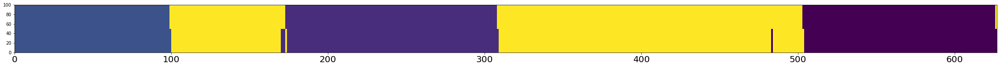

A,P,R:  0.9856459330143541 0.9806629834254144 0.9943977591036415
Num frames:  (362, 7)
Accuracy:  0.9856459330143541
Person:  134
Transitions:  [0, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


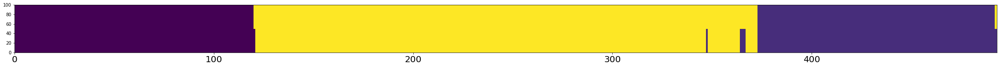

A,P,R:  0.9878296146044625 0.9755102040816327 1.0
Num frames:  (245, 6)
Accuracy:  0.9878296146044625
Person:  135
Transitions:  [5, 8, 4, 8, 0, 8]
GT transitions:  2
Transitions captured:  1


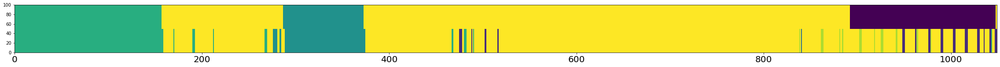

A,P,R:  0.8112488083889419 0.7626582278481012 0.6040100250626567
Num frames:  (316, 40)
Accuracy:  0.8112488083889419
Person:  136
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  1


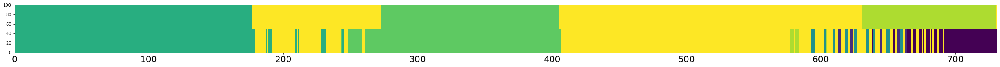

A,P,R:  0.7797537619699042 0.6990950226244343 0.7573529411764706
Num frames:  (442, 62)
Accuracy:  0.7797537619699042
Person:  137
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


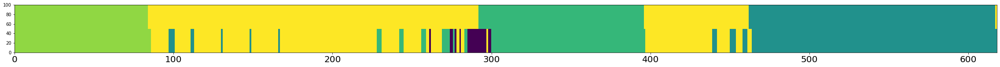

A,P,R:  0.8996763754045307 0.8494897959183674 0.9708454810495627
Num frames:  (392, 52)
Accuracy:  0.8996763754045307
Person:  138
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


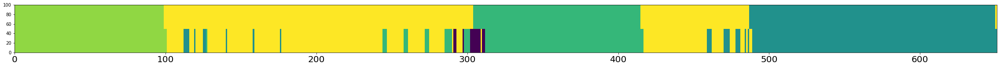

A,P,R:  0.9062980030721967 0.8622327790973872 0.9731903485254692
Num frames:  (421, 51)
Accuracy:  0.9062980030721967
Person:  139
Transitions:  [3, 8]
GT transitions:  0
Transitions captured:  0



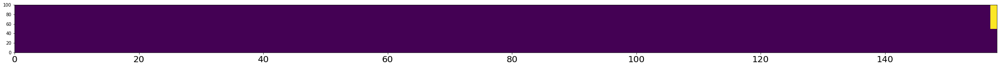

A,P,R:  0.9936708860759493 0.9936708860759493 1.0
Num frames:  (158, 1)
Accuracy:  0.9936708860759493
Person:  140
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


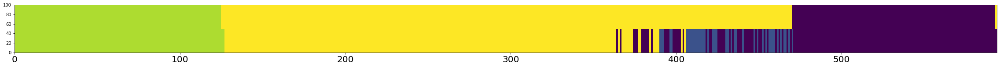

A,P,R:  0.8434343434343434 0.7264705882352941 0.9959677419354839
Num frames:  (340, 92)
Accuracy:  0.8434343434343434
Person:  141
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


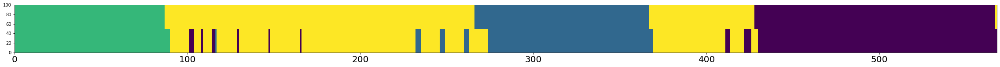

A,P,R:  0.926056338028169 0.9083094555873925 0.9694189602446484
Num frames:  (349, 32)
Accuracy:  0.926056338028169
Person:  142
Transitions:  [5, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


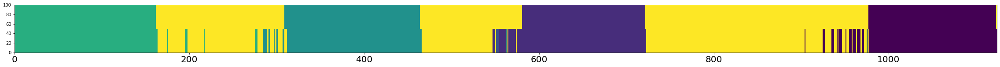

A,P,R:  0.9208185053380783 0.8759124087591241 0.9933774834437086
Num frames:  (685, 85)
Accuracy:  0.9208185053380783
Person:  143
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


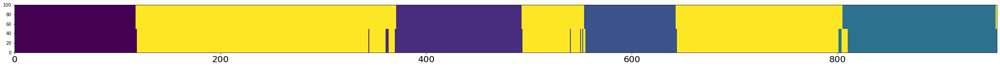

A,P,R:  0.9780104712041885 0.9691991786447639 0.9874476987447699
Num frames:  (487, 15)
Accuracy:  0.9780104712041885
Person:  144
Transitions:  [0, 8, 1, 8, 4, 8, 5, 8]
GT transitions:  3
Transitions captured:  3


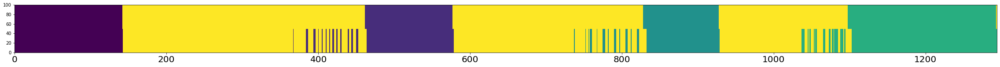

A,P,R:  0.9296754250386399 0.8723747980613893 0.9782608695652174
Num frames:  (619, 79)
Accuracy:  0.9296754250386399
Person:  145
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


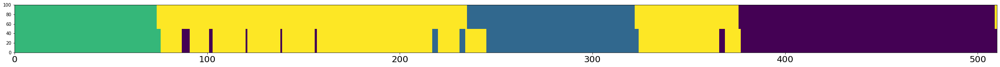

A,P,R:  0.9333333333333333 0.9248366013071896 0.9625850340136054
Num frames:  (306, 23)
Accuracy:  0.9333333333333333
Person:  146
Transitions:  [1, 8, 2, 8, 3, 8]
GT transitions:  2
Transitions captured:  2


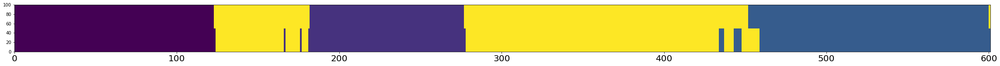

A,P,R:  0.9650582362728786 0.9624664879356568 0.9808743169398907
Num frames:  (373, 14)
Accuracy:  0.9650582362728786
Person:  147
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



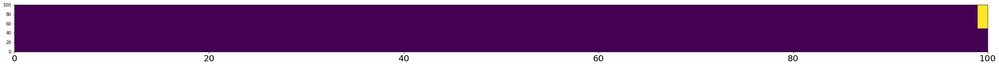

A,P,R:  0.99 0.99 1.0
Num frames:  (100, 1)
Accuracy:  0.99
Person:  148
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



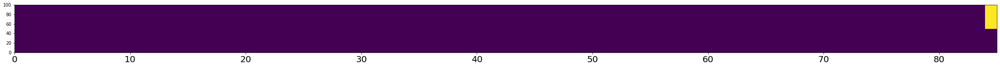

A,P,R:  0.9882352941176471 0.9882352941176471 1.0
Num frames:  (85, 1)
Accuracy:  0.9882352941176471
Person:  149
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


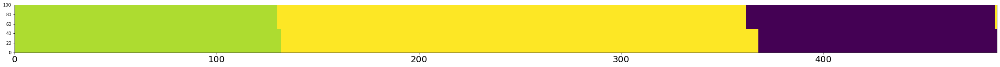

A,P,R:  0.9814814814814815 0.988 0.9762845849802372
Num frames:  (250, 3)
Accuracy:  0.9814814814814815
Person:  150
Transitions:  [3, 8, 2, 8, 1, 8]
GT transitions:  2
Transitions captured:  2


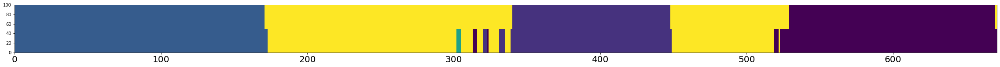

A,P,R:  0.9582712369597616 0.9375 1.0
Num frames:  (448, 28)
Accuracy:  0.9582712369597616
Person:  151
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  2


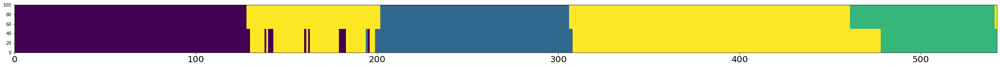

A,P,R:  0.9317343173431735 0.9365079365079365 0.9455128205128205
Num frames:  (315, 20)
Accuracy:  0.9317343173431735
Person:  152
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


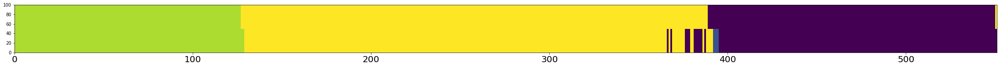

A,P,R:  0.9637023593466425 0.9431438127090301 0.9791666666666666
Num frames:  (299, 14)
Accuracy:  0.9637023593466425
Person:  153
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


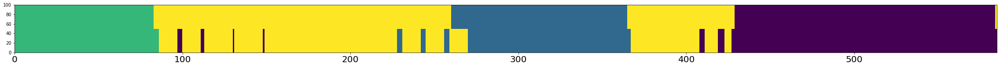

A,P,R:  0.9299145299145299 0.9148351648351648 0.9708454810495627
Num frames:  (364, 31)
Accuracy:  0.9299145299145299
Person:  154
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


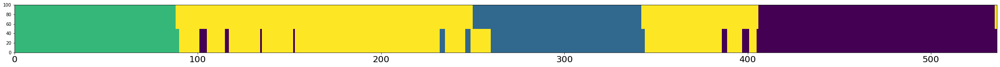

A,P,R:  0.9309701492537313 0.9171779141104295 0.9676375404530745
Num frames:  (326, 27)
Accuracy:  0.9309701492537313
Person:  155
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


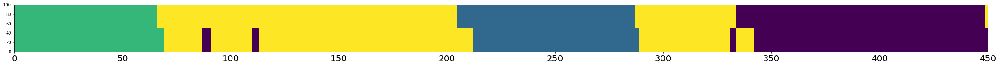

A,P,R:  0.9311111111111111 0.9393939393939394 0.9429657794676806
Num frames:  (264, 16)
Accuracy:  0.9311111111111111
Person:  156
Transitions:  [6, 8, 5, 8]
GT transitions:  1
Transitions captured:  1


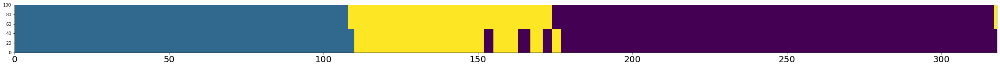

A,P,R:  0.949685534591195 0.9501915708812261 0.9880478087649402
Num frames:  (261, 13)
Accuracy:  0.949685534591195
Person:  157
Transitions:  [5, 8, 4, 8, 0, 8]
GT transitions:  2
Transitions captured:  1


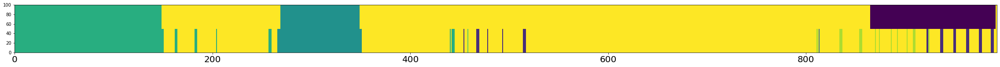

A,P,R:  0.8328298086606244 0.7789115646258503 0.6432584269662921
Num frames:  (294, 39)
Accuracy:  0.8328298086606244
Person:  158
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  2


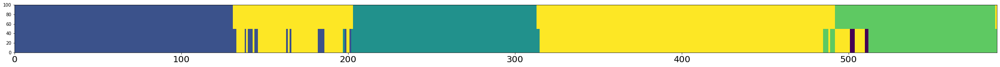

A,P,R:  0.9202037351443124 0.9083094555873925 0.9406528189910979
Num frames:  (349, 27)
Accuracy:  0.9202037351443124
Person:  159
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


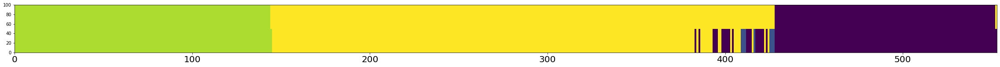

A,P,R:  0.9475587703435805 0.9023569023569024 1.0
Num frames:  (297, 29)
Accuracy:  0.9475587703435805
Person:  160
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



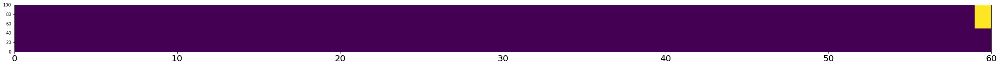

A,P,R:  0.9833333333333333 0.9833333333333333 1.0
Num frames:  (60, 1)
Accuracy:  0.9833333333333333
Person:  161
Transitions:  [1, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


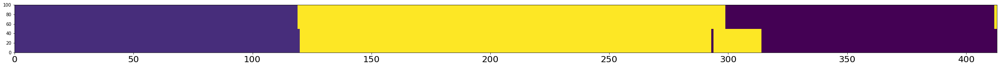

A,P,R:  0.9564164648910412 0.9863636363636363 0.9353448275862069
Num frames:  (220, 3)
Accuracy:  0.9564164648910412
Person:  162
Transitions:  [5, 8, 4, 8, 2, 8]
GT transitions:  2
Transitions captured:  2


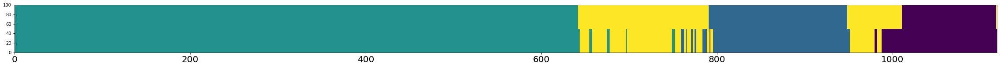

A,P,R:  0.9454870420017873 0.940563086548488 0.9944873208379272
Num frames:  (959, 56)
Accuracy:  0.9454870420017873
Person:  163
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



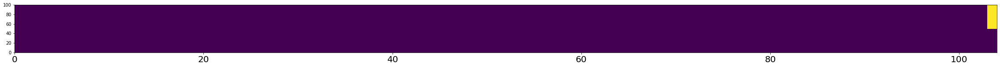

A,P,R:  0.9903846153846154 0.9903846153846154 1.0
Num frames:  (104, 1)
Accuracy:  0.9903846153846154
Person:  164
Transitions:  [5, 8, 4, 8, 0, 8]
GT transitions:  2
Transitions captured:  1


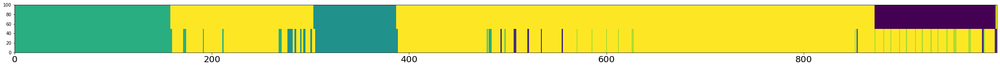

A,P,R:  0.8283132530120482 0.7843137254901961 0.6575342465753424
Num frames:  (306, 46)
Accuracy:  0.8283132530120482
Person:  165
Transitions:  [0, 8, 1, 8, 4, 8, 5, 8]
GT transitions:  3
Transitions captured:  3


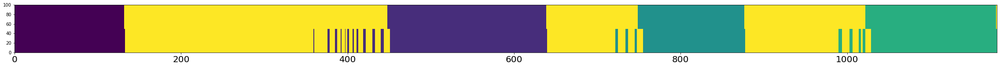

A,P,R:  0.9423728813559322 0.9192546583850931 0.9736842105263158
Num frames:  (644, 52)
Accuracy:  0.9423728813559322
Person:  166
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


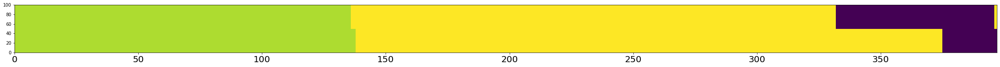

A,P,R:  0.8841309823677582 0.98125 0.785
Num frames:  (160, 3)
Accuracy:  0.8841309823677582
Person:  167
Transitions:  [5, 8, 4, 8, 2, 8, 1, 8]
GT transitions:  3
Transitions captured:  3


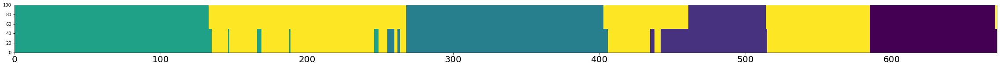

A,P,R:  0.9345238095238095 0.9024390243902439 1.0
Num frames:  (451, 44)
Accuracy:  0.9345238095238095
Person:  168
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


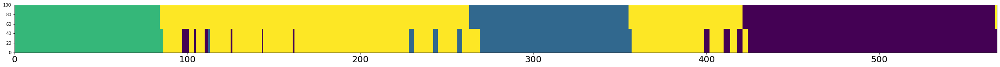

A,P,R:  0.9225352112676056 0.8994252873563219 0.9720496894409938
Num frames:  (348, 35)
Accuracy:  0.9225352112676056
Person:  169
Transitions:  [2, 8, 2, 8, 4, 8, 4, 8, 2, 8]
GT transitions:  4
Transitions captured:  2


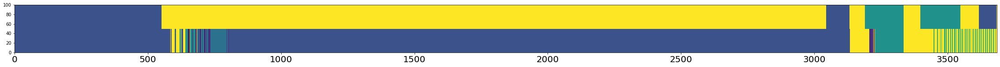

A,P,R:  0.2575305291723202 0.2252714113389626 0.7455089820359282
Num frames:  (3316, 2481)
Accuracy:  0.2575305291723202
Person:  170
Transitions:  [7, 8, 6, 8, 4, 8, 2, 8, 3, 8]
GT transitions:  4
Transitions captured:  1


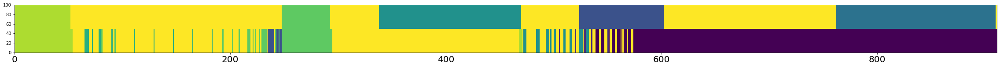

A,P,R:  0.3589462129527991 0.18267419962335216 0.21318681318681318
Num frames:  (531, 226)
Accuracy:  0.3589462129527991
Person:  171
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


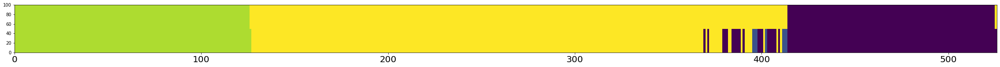

A,P,R:  0.9448669201520913 0.8909774436090225 1.0
Num frames:  (266, 29)
Accuracy:  0.9448669201520913
Person:  172
Transitions:  [0, 8, 1, 8, 4, 8, 5, 8]
GT transitions:  3
Transitions captured:  3


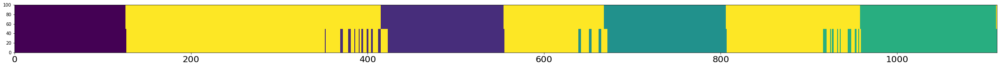

A,P,R:  0.9460916442048517 0.9204737732656514 0.9766606822262118
Num frames:  (591, 47)
Accuracy:  0.9460916442048517
Person:  173
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


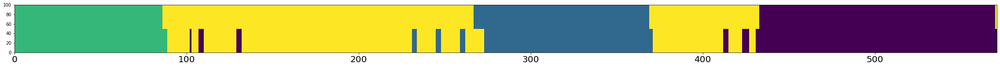

A,P,R:  0.9352014010507881 0.9114285714285715 0.9815384615384616
Num frames:  (350, 31)
Accuracy:  0.9352014010507881
Person:  174
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


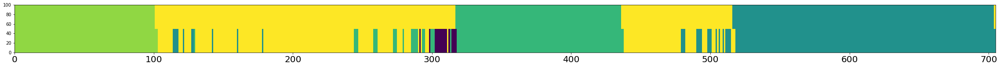

A,P,R:  0.8978723404255319 0.8526315789473684 0.9926470588235294
Num frames:  (475, 69)
Accuracy:  0.8978723404255319
Person:  175
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



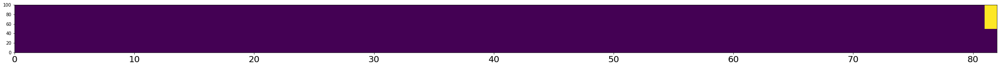

A,P,R:  0.9878048780487805 0.9878048780487805 1.0
Num frames:  (82, 1)
Accuracy:  0.9878048780487805
Person:  176
Transitions:  [6, 8, 4, 8, 2, 8]
GT transitions:  2
Transitions captured:  2


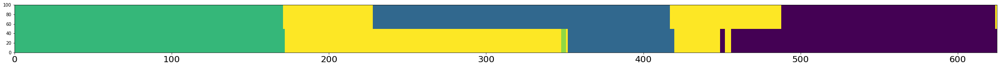

A,P,R:  0.7376 0.8963855421686747 0.75
Num frames:  (415, 40)
Accuracy:  0.7376
Person:  177
Transitions:  [1, 8, 4, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


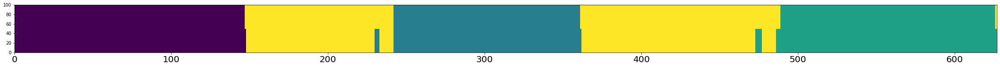

A,P,R:  0.9792663476874003 0.96875 1.0
Num frames:  (416, 13)
Accuracy:  0.9792663476874003
Person:  178
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


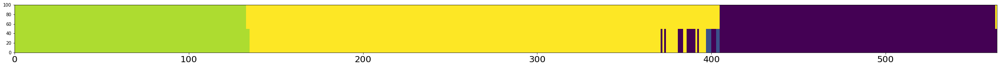

A,P,R:  0.9609929078014184 0.9297124600638977 1.0
Num frames:  (313, 22)
Accuracy:  0.9609929078014184
Person:  179
Transitions:  [5, 8, 4, 8]
GT transitions:  1
Transitions captured:  1


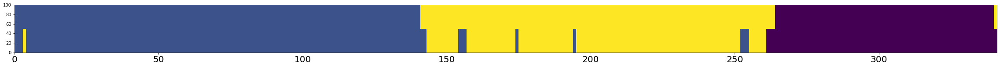

A,P,R:  0.9560117302052786 0.9391304347826087 0.9953917050691244
Num frames:  (230, 14)
Accuracy:  0.9560117302052786
Person:  180
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


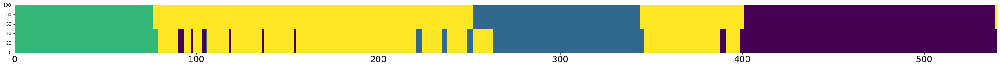

A,P,R:  0.924074074074074 0.9076923076923077 0.9640522875816994
Num frames:  (325, 30)
Accuracy:  0.924074074074074
Person:  181
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


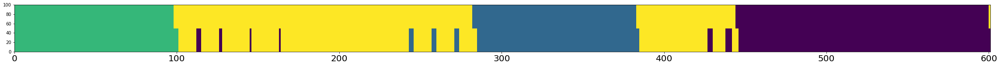

A,P,R:  0.9434276206322796 0.9234828496042217 0.9859154929577465
Num frames:  (379, 29)
Accuracy:  0.9434276206322796
Person:  182
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


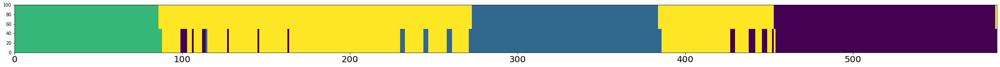

A,P,R:  0.9334470989761092 0.8961748633879781 0.9969604863221885
Num frames:  (366, 38)
Accuracy:  0.9334470989761092
Person:  183
Transitions:  [5, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


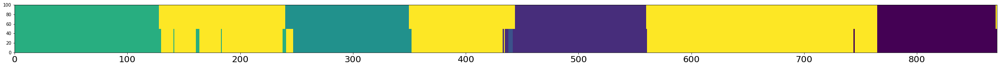

A,P,R:  0.9644087256027555 0.9475890985324947 0.9847494553376906
Num frames:  (477, 24)
Accuracy:  0.9644087256027555
Person:  184
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


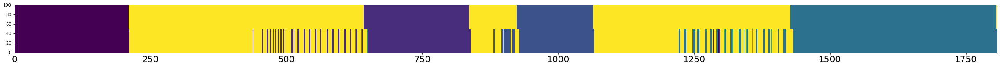

A,P,R:  0.9075816270060875 0.8564683663833805 0.9816017316017316
Num frames:  (1059, 150)
Accuracy:  0.9075816270060875
Person:  185
Transitions:  [0, 8, 1, 8, 2, 8]
GT transitions:  2
Transitions captured:  2


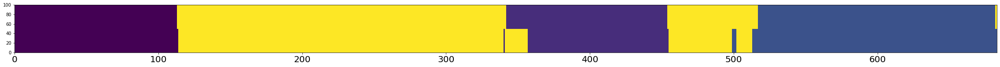

A,P,R:  0.9619326500732065 0.9715025906735751 0.9615384615384616
Num frames:  (386, 11)
Accuracy:  0.9619326500732065
Person:  186
Transitions:  [0, 8, 1, 8, 2, 8]
GT transitions:  2
Transitions captured:  2


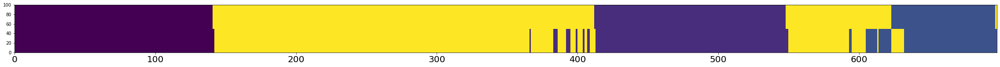

A,P,R:  0.9369627507163324 0.9093333333333333 0.9715099715099715
Num frames:  (375, 34)
Accuracy:  0.9369627507163324
Person:  187
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


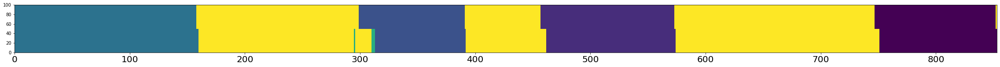

A,P,R:  0.9660023446658851 0.9803063457330415 0.9511677282377919
Num frames:  (457, 6)
Accuracy:  0.9660023446658851
Person:  188
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


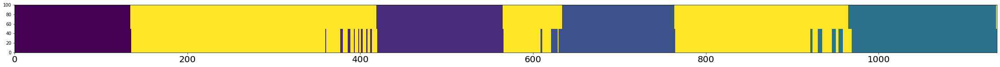

A,P,R:  0.9507475813544415 0.9186602870813397 0.9913941480206541
Num frames:  (627, 51)
Accuracy:  0.9507475813544415
Person:  189
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


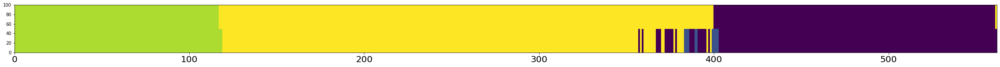

A,P,R:  0.9430604982206405 0.8957654723127035 0.9892086330935251
Num frames:  (307, 29)
Accuracy:  0.9430604982206405
Person:  190
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



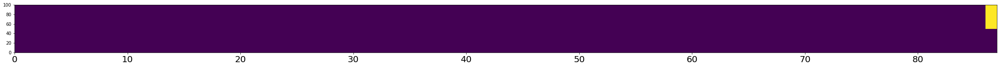

A,P,R:  0.9885057471264368 0.9885057471264368 1.0
Num frames:  (87, 1)
Accuracy:  0.9885057471264368
Person:  191
Transitions:  [7, 8, 4, 8, 5, 8]
GT transitions:  2
Transitions captured:  0


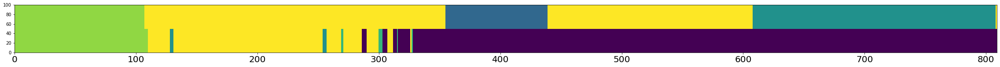

A,P,R:  0.35970333745364647 0.1712 0.27365728900255754
Num frames:  (625, 234)
Accuracy:  0.35970333745364647
Person:  192
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


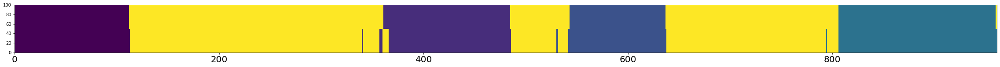

A,P,R:  0.9823100936524454 0.9755600814663951 0.9896694214876033
Num frames:  (491, 12)
Accuracy:  0.9823100936524454
Person:  193
Transitions:  [7, 8, 7, 8, 6, 8, 5, 8, 5, 8, 6, 8, 7, 8]
GT transitions:  6
Transitions captured:  0


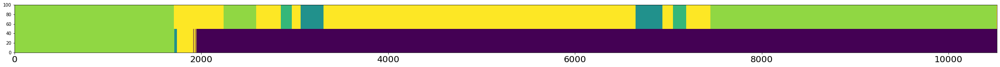

A,P,R:  0.18054763262977752 0.16523002421307506 0.28871213403283125
Num frames:  (10325, 4416)
Accuracy:  0.18054763262977752
Person:  194
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


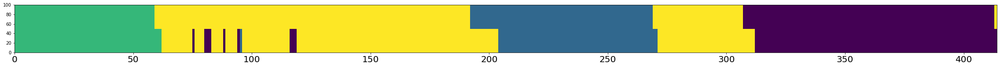

A,P,R:  0.9202898550724637 0.9336099585062241 0.9297520661157025
Num frames:  (241, 16)
Accuracy:  0.9202898550724637
Person:  195
Transitions:  [0, 8, 1, 8, 4, 8, 5, 8]
GT transitions:  3
Transitions captured:  3


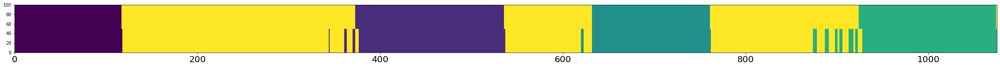

A,P,R:  0.9590697674418605 0.938671209540034 0.9856887298747764
Num frames:  (587, 36)
Accuracy:  0.9590697674418605
Person:  196
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



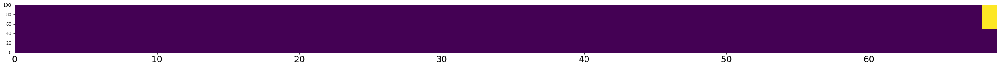

A,P,R:  0.9855072463768116 0.9855072463768116 1.0
Num frames:  (69, 1)
Accuracy:  0.9855072463768116
Person:  197
Transitions:  [2, 8, 3, 8]
GT transitions:  1
Transitions captured:  1


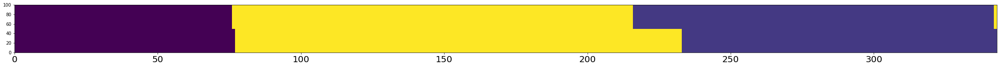

A,P,R:  0.9446064139941691 0.9893048128342246 0.9158415841584159
Num frames:  (187, 2)
Accuracy:  0.9446064139941691
Person:  198
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


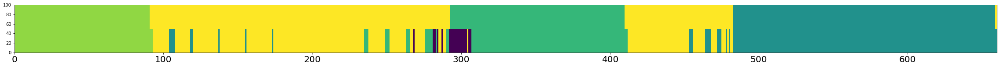

A,P,R:  0.9045454545454545 0.8564814814814815 0.9635416666666666
Num frames:  (432, 49)
Accuracy:  0.9045454545454545
Person:  199
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



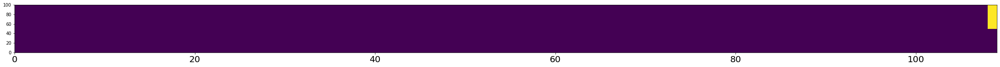

A,P,R:  0.9908256880733946 0.9908256880733946 1.0
Num frames:  (109, 1)
Accuracy:  0.9908256880733946
Person:  200
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  2


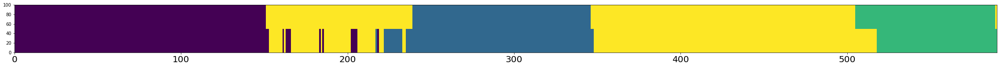

A,P,R:  0.923728813559322 0.9113573407202216 0.9619883040935673
Num frames:  (361, 32)
Accuracy:  0.923728813559322
Person:  201
Transitions:  [0, 8, 4, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


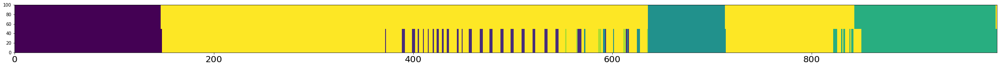

A,P,R:  0.907707910750507 0.8103837471783296 0.9808743169398907
Num frames:  (443, 84)
Accuracy:  0.907707910750507
Person:  202
Transitions:  [1, 8, 4, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


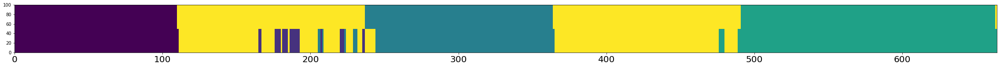

A,P,R:  0.9307228915662651 0.9115646258503401 0.9828850855745721
Num frames:  (441, 39)
Accuracy:  0.9307228915662651
Person:  203
Transitions:  [3, 8, 2, 8, 4, 8, 5, 8]
GT transitions:  3
Transitions captured:  3


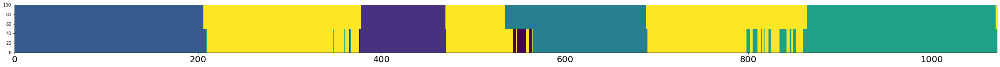

A,P,R:  0.930905695611578 0.9127906976744186 0.9544072948328267
Num frames:  (688, 44)
Accuracy:  0.930905695611578
Person:  204
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  0


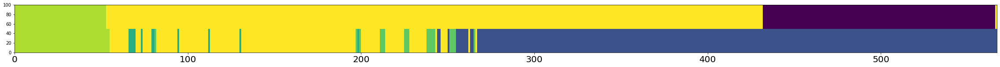

A,P,R:  0.3932980599647266 0.13350125944584382 0.28342245989304815
Num frames:  (397, 210)
Accuracy:  0.3932980599647266
Person:  205
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


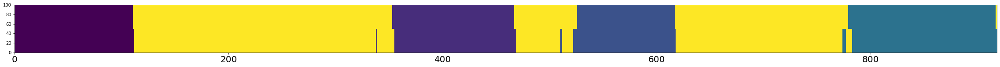

A,P,R:  0.9771241830065359 0.9676025917926566 0.986784140969163
Num frames:  (463, 15)
Accuracy:  0.9771241830065359
Person:  206
Transitions:  [0, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


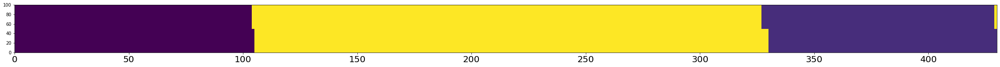

A,P,R:  0.9883720930232558 0.9902439024390244 0.9854368932038835
Num frames:  (205, 2)
Accuracy:  0.9883720930232558
Person:  207
Transitions:  [2, 8, 1, 8, 0, 8]
GT transitions:  2
Transitions captured:  2


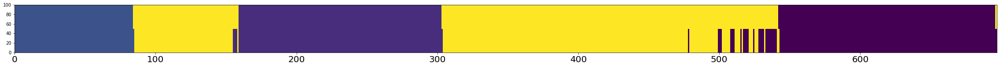

A,P,R:  0.9540889526542324 0.9247572815533981 0.9973821989528796
Num frames:  (412, 31)
Accuracy:  0.9540889526542324
Person:  208
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


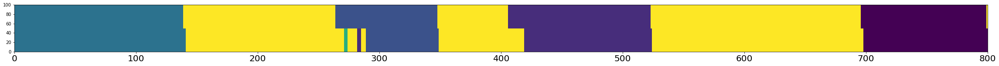

A,P,R:  0.94375 0.9734299516908212 0.909706546275395
Num frames:  (414, 5)
Accuracy:  0.94375
Person:  209
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  0


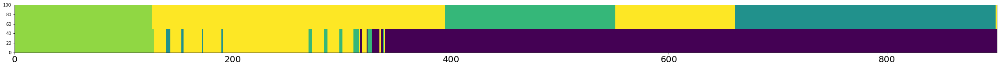

A,P,R:  0.3318534961154273 0.17307692307692307 0.2418426103646833
Num frames:  (728, 207)
Accuracy:  0.3318534961154273
Person:  210
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


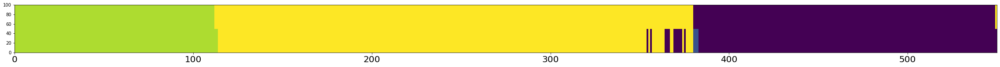

A,P,R:  0.9690909090909091 0.9423728813559322 0.9893238434163701
Num frames:  (295, 14)
Accuracy:  0.9690909090909091
Person:  211
Transitions:  [5, 8, 4, 8, 1, 8, 1, 8, 0, 8]
GT transitions:  4
Transitions captured:  1


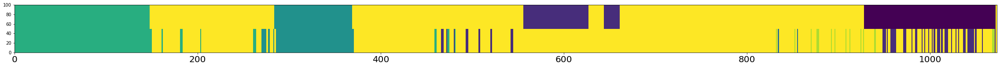

A,P,R:  0.7315936626281454 0.6814159292035398 0.4967741935483871
Num frames:  (339, 54)
Accuracy:  0.7315936626281454
Person:  212
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



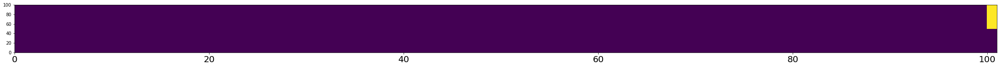

A,P,R:  0.9900990099009901 0.9900990099009901 1.0
Num frames:  (101, 1)
Accuracy:  0.9900990099009901
Person:  213
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



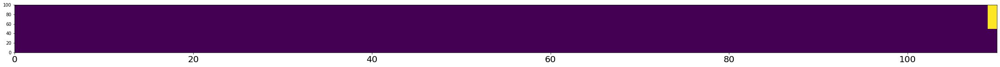

A,P,R:  0.990909090909091 0.990909090909091 1.0
Num frames:  (110, 1)
Accuracy:  0.990909090909091
Person:  214
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


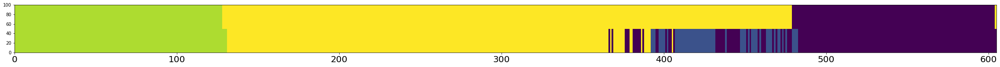

A,P,R:  0.8264462809917356 0.7033898305084746 0.9841897233201581
Num frames:  (354, 101)
Accuracy:  0.8264462809917356
Person:  215
Transitions:  [1, 8]
GT transitions:  0
Transitions captured:  0



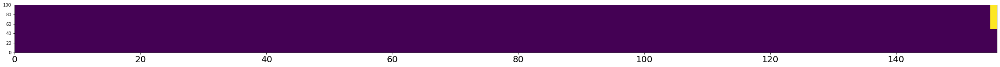

A,P,R:  0.9935897435897436 0.9935897435897436 1.0
Num frames:  (156, 1)
Accuracy:  0.9935897435897436
Person:  216
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


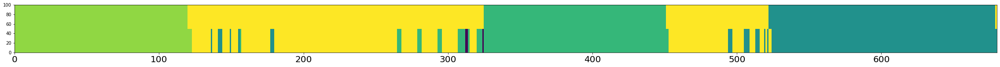

A,P,R:  0.9235294117647059 0.8891352549889135 0.9950372208436724
Num frames:  (451, 50)
Accuracy:  0.9235294117647059
Person:  217
Transitions:  [4, 8, 2, 8, 3, 8]
GT transitions:  2
Transitions captured:  2


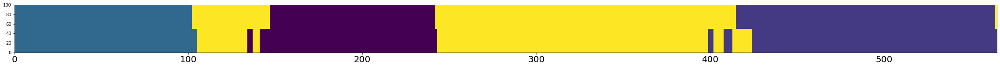

A,P,R:  0.9451327433628318 0.9387186629526463 0.9739884393063584
Num frames:  (359, 22)
Accuracy:  0.9451327433628318
Person:  218
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


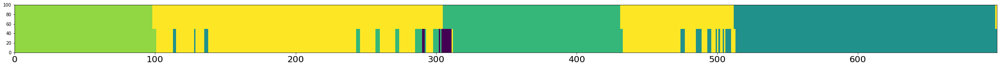

A,P,R:  0.9127324749642346 0.8720173535791758 0.9804878048780488
Num frames:  (461, 53)
Accuracy:  0.9127324749642346
Person:  219
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


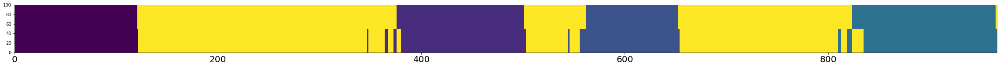

A,P,R:  0.9554865424430642 0.9429735234215886 0.9686192468619247
Num frames:  (491, 28)
Accuracy:  0.9554865424430642
Person:  220
Transitions:  [1, 8]
GT transitions:  0
Transitions captured:  0



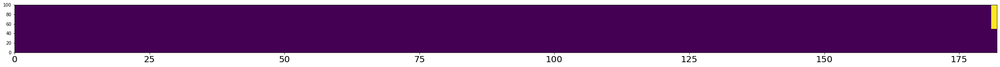

A,P,R:  0.9945054945054945 0.9945054945054945 1.0
Num frames:  (182, 1)
Accuracy:  0.9945054945054945
Person:  221
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



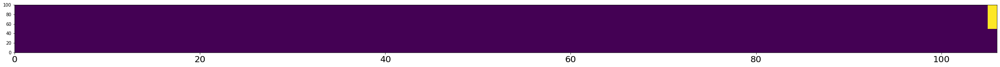

A,P,R:  0.9905660377358491 0.9905660377358491 1.0
Num frames:  (106, 1)
Accuracy:  0.9905660377358491
Person:  222
Transitions:  [5, 8, 6, 8, 4, 8]
GT transitions:  2
Transitions captured:  1


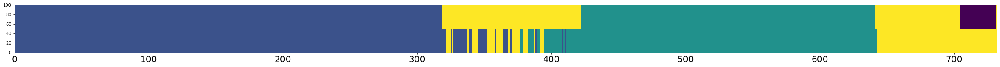

A,P,R:  0.8702185792349727 0.886326194398682 0.9539007092198581
Num frames:  (607, 69)
Accuracy:  0.8702185792349727
Person:  223
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



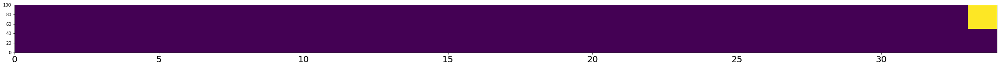

A,P,R:  0.9705882352941176 0.9705882352941176 1.0
Num frames:  (34, 1)
Accuracy:  0.9705882352941176
Person:  224
Transitions:  [1, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


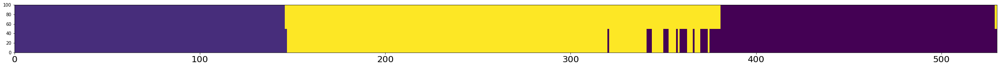

A,P,R:  0.9528301886792453 0.9216300940438872 1.0
Num frames:  (319, 25)
Accuracy:  0.9528301886792453
Person:  225
Transitions:  [0, 8, 1, 8, 4, 8, 5, 8]
GT transitions:  3
Transitions captured:  3


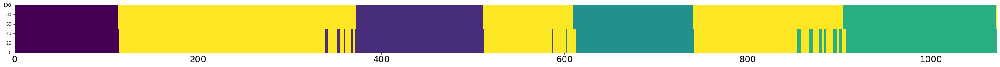

A,P,R:  0.9561567164179104 0.9328743545611016 0.9854545454545455
Num frames:  (581, 39)
Accuracy:  0.9561567164179104
Person:  226
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



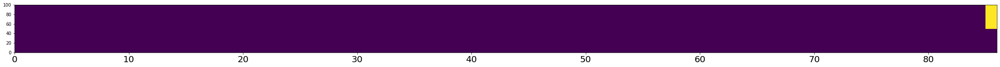

A,P,R:  0.9883720930232558 0.9883720930232558 1.0
Num frames:  (86, 1)
Accuracy:  0.9883720930232558
Person:  227
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


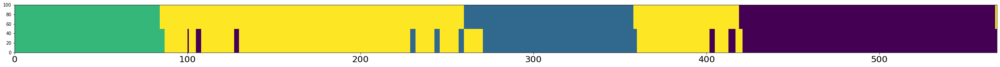

A,P,R:  0.926056338028169 0.9161849710982659 0.9606060606060606
Num frames:  (346, 29)
Accuracy:  0.926056338028169
Person:  228
Transitions:  [0, 8, 1, 8, 4, 8, 5, 8]
GT transitions:  3
Transitions captured:  3


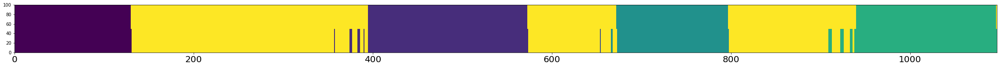

A,P,R:  0.9735642661804923 0.9545454545454546 0.99830220713073
Num frames:  (616, 28)
Accuracy:  0.9735642661804923
Person:  229
Transitions:  [0, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


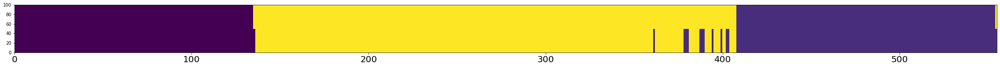

A,P,R:  0.9765765765765766 0.95578231292517 1.0
Num frames:  (294, 13)
Accuracy:  0.9765765765765766
Person:  230
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



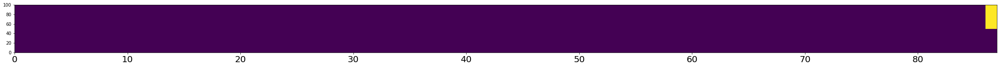

A,P,R:  0.9885057471264368 0.9885057471264368 1.0
Num frames:  (87, 1)
Accuracy:  0.9885057471264368
Person:  231
Transitions:  [0, 8, 1, 8, 7, 8]
GT transitions:  2
Transitions captured:  1


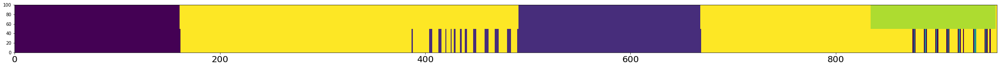

A,P,R:  0.8380355276907001 0.8578680203045685 0.7347826086956522
Num frames:  (394, 33)
Accuracy:  0.8380355276907001
Person:  232
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


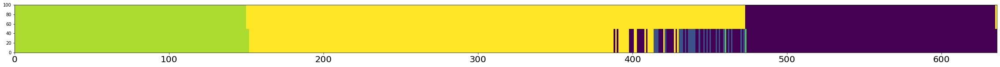

A,P,R:  0.8883647798742138 0.8141361256544503 0.9967948717948718
Num frames:  (382, 70)
Accuracy:  0.8883647798742138
Person:  233
Transitions:  [2, 8, 4, 8, 6, 8, 7, 8]
GT transitions:  3
Transitions captured:  3


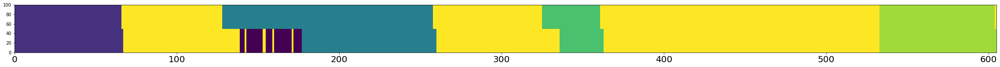

A,P,R:  0.8909090909090909 0.8617021276595744 0.801980198019802
Num frames:  (282, 6)
Accuracy:  0.8909090909090909
Person:  234
Transitions:  [3, 8, 2, 8, 4, 8, 4, 8, 2, 8]
GT transitions:  4
Transitions captured:  3


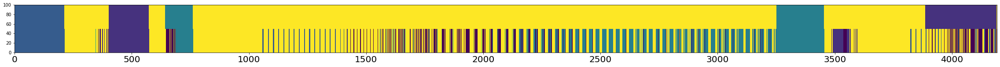

A,P,R:  0.6395515267175572 0.3286921929388364 0.6544554455445545
Num frames:  (2011, 1162)
Accuracy:  0.6395515267175572
Person:  235
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


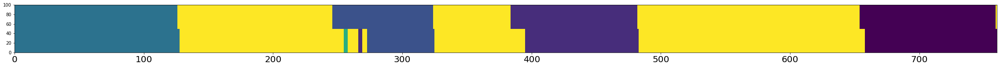

A,P,R:  0.9381578947368421 0.9707446808510638 0.8968058968058968
Num frames:  (376, 5)
Accuracy:  0.9381578947368421
Person:  236
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


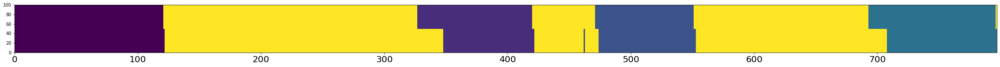

A,P,R:  0.9422835633626098 0.9808219178082191 0.9017632241813602
Num frames:  (365, 7)
Accuracy:  0.9422835633626098
Person:  237
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



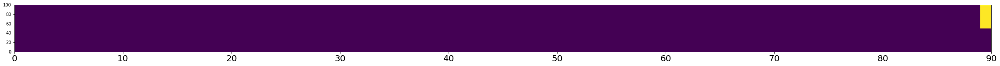

A,P,R:  0.9888888888888889 0.9888888888888889 1.0
Num frames:  (90, 1)
Accuracy:  0.9888888888888889
Person:  238
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



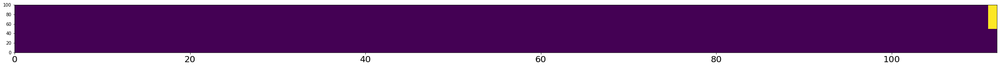

A,P,R:  0.9910714285714286 0.9910714285714286 1.0
Num frames:  (112, 1)
Accuracy:  0.9910714285714286
Person:  239
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  1


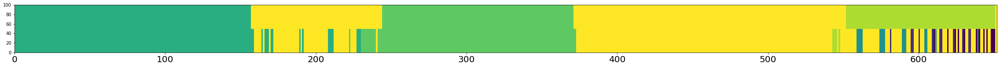

A,P,R:  0.7914110429447853 0.7910863509749304 0.741514360313316
Num frames:  (359, 37)
Accuracy:  0.7914110429447853
Person:  240
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



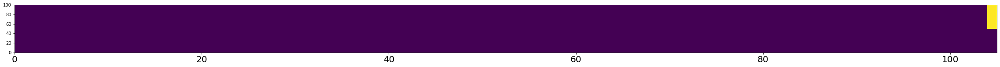

A,P,R:  0.9904761904761905 0.9904761904761905 1.0
Num frames:  (105, 1)
Accuracy:  0.9904761904761905
Person:  241
Transitions:  [0, 8, 0, 8]
GT transitions:  1
Transitions captured:  0


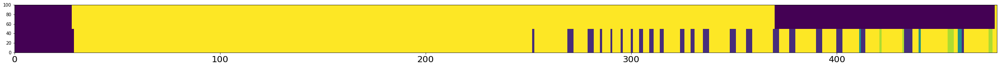

A,P,R:  0.7092050209205021 0.3146067415730337 0.2074074074074074
Num frames:  (89, 32)
Accuracy:  0.7092050209205021
Person:  242
Transitions:  [0, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


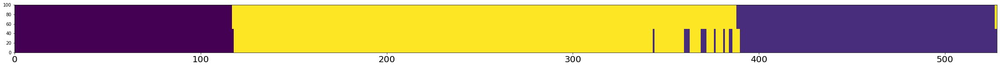

A,P,R:  0.9715909090909091 0.951310861423221 0.9921875
Num frames:  (267, 13)
Accuracy:  0.9715909090909091
Person:  243
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



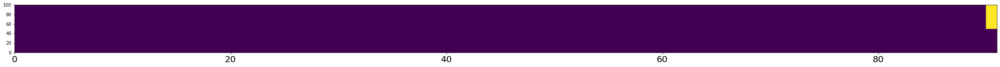

A,P,R:  0.989010989010989 0.989010989010989 1.0
Num frames:  (91, 1)
Accuracy:  0.989010989010989
Person:  244
Transitions:  [5, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


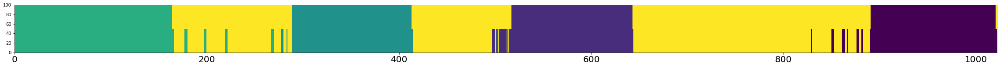

A,P,R:  0.9481409001956947 0.9112227805695142 1.0
Num frames:  (597, 53)
Accuracy:  0.9481409001956947
Person:  245
Transitions:  [5, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  2


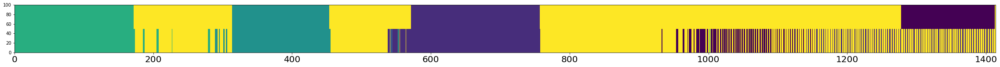

A,P,R:  0.7595473833097596 0.6644385026737968 0.7863924050632911
Num frames:  (748, 205)
Accuracy:  0.7595473833097596
Person:  246
Transitions:  [0, 8, 1, 8, 4, 8, 5, 8]
GT transitions:  3
Transitions captured:  3


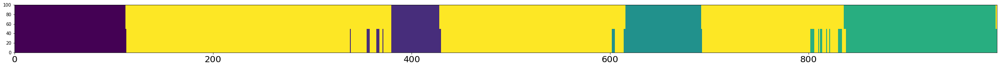

A,P,R:  0.9666666666666667 0.9258373205741627 0.9948586118251928
Num frames:  (418, 31)
Accuracy:  0.9666666666666667
Person:  247
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


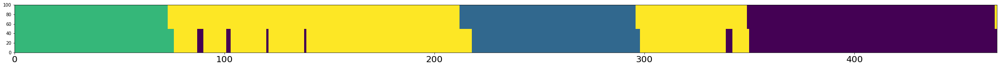

A,P,R:  0.9508547008547008 0.9436619718309859 0.9745454545454545
Num frames:  (284, 16)
Accuracy:  0.9508547008547008
Person:  248
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



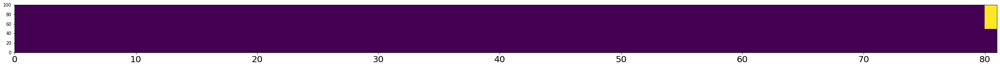

A,P,R:  0.9876543209876543 0.9876543209876543 1.0
Num frames:  (81, 1)
Accuracy:  0.9876543209876543
Person:  249
Transitions:  [0, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


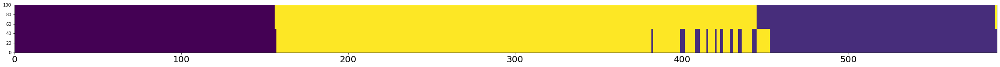

A,P,R:  0.9524617996604414 0.9356913183279743 0.9732441471571907
Num frames:  (311, 20)
Accuracy:  0.9524617996604414
Person:  250
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



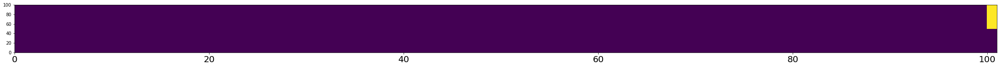

A,P,R:  0.9900990099009901 0.9900990099009901 1.0
Num frames:  (101, 1)
Accuracy:  0.9900990099009901
Person:  251
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


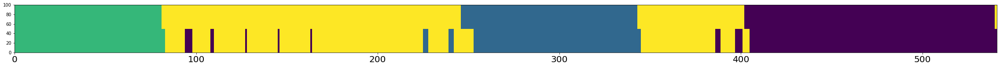

A,P,R:  0.9316081330868762 0.918918918918919 0.9683544303797469
Num frames:  (333, 27)
Accuracy:  0.9316081330868762
Person:  252
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


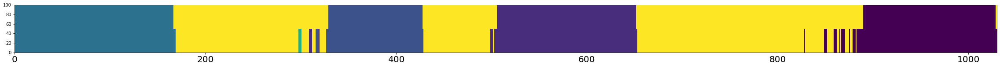

A,P,R:  0.9553398058252427 0.9229480737018425 1.0
Num frames:  (597, 46)
Accuracy:  0.9553398058252427
Person:  253
Transitions:  [0, 8, 7, 8]
GT transitions:  1
Transitions captured:  1


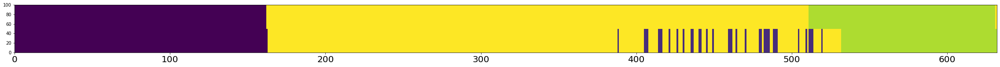

A,P,R:  0.9129746835443038 0.8729096989966555 0.925531914893617
Num frames:  (299, 34)
Accuracy:  0.9129746835443038
Person:  254
Transitions:  [5, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


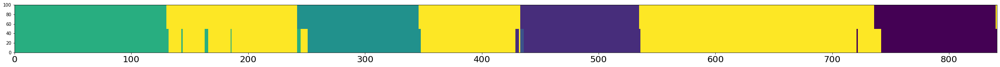

A,P,R:  0.9607609988109393 0.9525959367945824 0.9590909090909091
Num frames:  (443, 15)
Accuracy:  0.9607609988109393
Person:  255
Transitions:  [6, 8, 7, 8]
GT transitions:  1
Transitions captured:  1


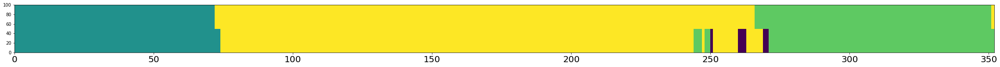

A,P,R:  0.9517045454545454 0.9156626506024096 0.9681528662420382
Num frames:  (166, 12)
Accuracy:  0.9517045454545454
Person:  256
Transitions:  [0, 8, 1, 8, 4, 8, 5, 8]
GT transitions:  3
Transitions captured:  3


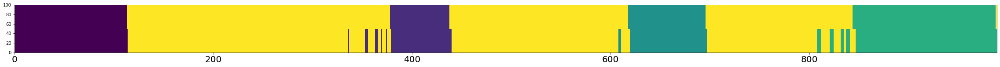

A,P,R:  0.961577350859454 0.9239904988123515 0.9848101265822785
Num frames:  (421, 32)
Accuracy:  0.961577350859454
Person:  257
Transitions:  [5, 8, 4, 8, 0, 8]
GT transitions:  2
Transitions captured:  1


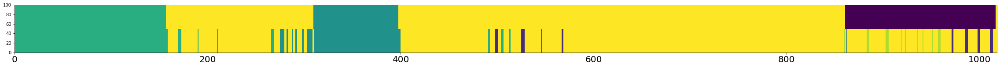

A,P,R:  0.7996070726915521 0.7672955974842768 0.6084788029925187
Num frames:  (318, 47)
Accuracy:  0.7996070726915521
Person:  258
Transitions:  [1, 8, 4, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


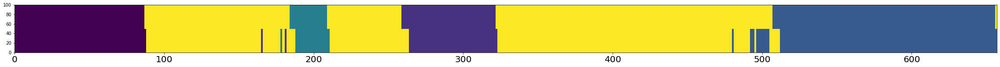

A,P,R:  0.9467275494672754 0.9365558912386707 0.9567901234567902
Num frames:  (331, 21)
Accuracy:  0.9467275494672754
Person:  259
Transitions:  [5, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


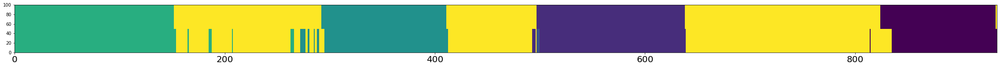

A,P,R:  0.9518716577540107 0.9421641791044776 0.9674329501915708
Num frames:  (536, 28)
Accuracy:  0.9518716577540107
Person:  260
Transitions:  [5, 8]
GT transitions:  0
Transitions captured:  0



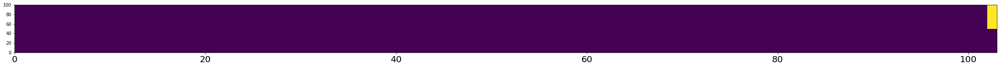

A,P,R:  0.9902912621359223 0.9902912621359223 1.0
Num frames:  (103, 1)
Accuracy:  0.9902912621359223
Person:  261
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


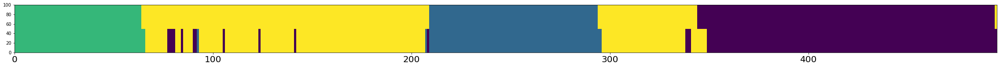

A,P,R:  0.9474747474747475 0.9333333333333333 0.9832775919732442
Num frames:  (315, 21)
Accuracy:  0.9474747474747475
Person:  262
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


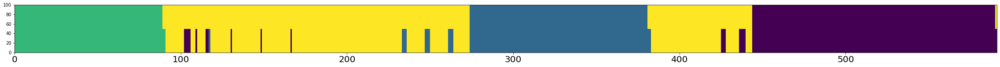

A,P,R:  0.9458544839255499 0.9144385026737968 1.0
Num frames:  (374, 32)
Accuracy:  0.9458544839255499
Person:  263
Transitions:  [1, 8, 2, 8, 4, 8, 4, 8, 4, 8, 4, 8, 3, 8]
GT transitions:  6
Transitions captured:  4


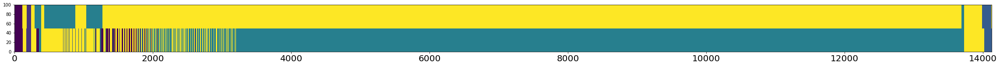

A,P,R:  0.1199207135777998 0.029544893424409514 0.3162995594713656
Num frames:  (12151, 11656)
Accuracy:  0.1199207135777998
Person:  264
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



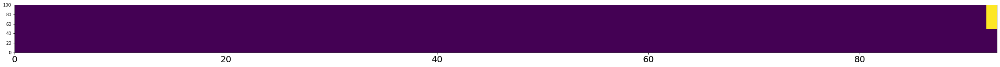

A,P,R:  0.989247311827957 0.989247311827957 1.0
Num frames:  (93, 1)
Accuracy:  0.989247311827957
Person:  265
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


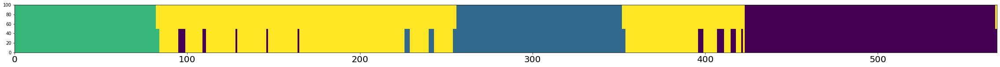

A,P,R:  0.9420035149384886 0.9073033707865169 1.0
Num frames:  (356, 33)
Accuracy:  0.9420035149384886
Person:  266
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


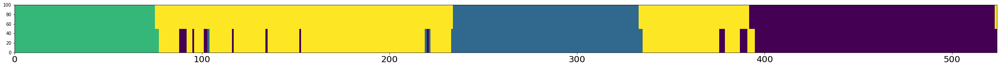

A,P,R:  0.9427480916030534 0.9179331306990881 0.9901639344262295
Num frames:  (329, 27)
Accuracy:  0.9427480916030534
Person:  267
Transitions:  [0, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


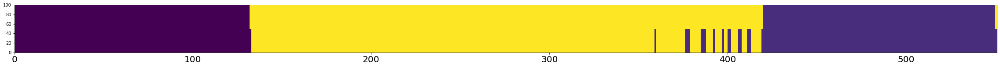

A,P,R:  0.9673321234119783 0.9357142857142857 1.0
Num frames:  (280, 18)
Accuracy:  0.9673321234119783
Person:  268
Transitions:  [4, 8, 2, 8, 3, 8]
GT transitions:  2
Transitions captured:  2


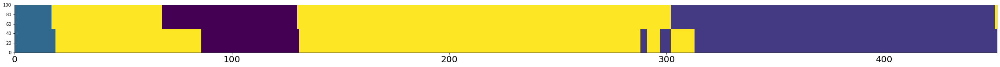

A,P,R:  0.9092920353982301 0.943127962085308 0.8728070175438597
Num frames:  (211, 12)
Accuracy:  0.9092920353982301
Person:  269
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



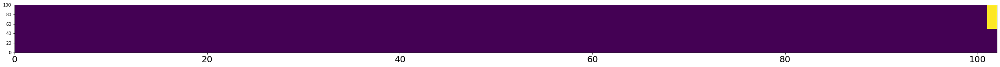

A,P,R:  0.9901960784313726 0.9901960784313726 1.0
Num frames:  (102, 1)
Accuracy:  0.9901960784313726
Person:  270
Transitions:  [2, 8, 1, 8, 0, 8]
GT transitions:  2
Transitions captured:  2


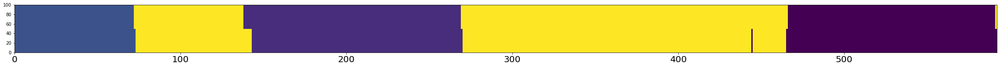

A,P,R:  0.9831081081081081 0.9847560975609756 0.9847560975609756
Num frames:  (328, 5)
Accuracy:  0.9831081081081081
Person:  271
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



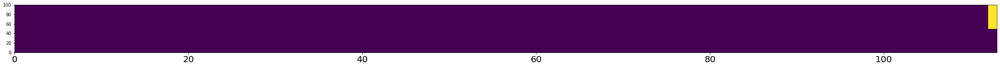

A,P,R:  0.9911504424778761 0.9911504424778761 1.0
Num frames:  (113, 1)
Accuracy:  0.9911504424778761
Person:  272
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


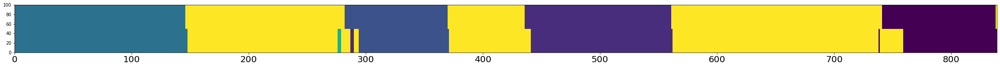

A,P,R:  0.9475566150178785 0.9722863741339491 0.9232456140350878
Num frames:  (433, 9)
Accuracy:  0.9475566150178785
Person:  273
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



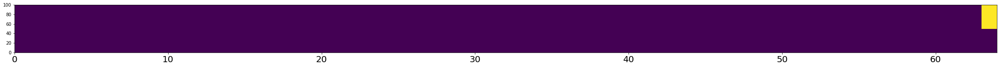

A,P,R:  0.984375 0.984375 1.0
Num frames:  (64, 1)
Accuracy:  0.984375
Person:  274
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


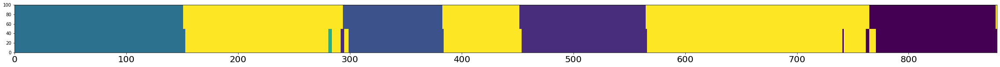

A,P,R:  0.9692832764505119 0.967948717948718 0.9721030042918455
Num frames:  (468, 14)
Accuracy:  0.9692832764505119
Person:  275
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



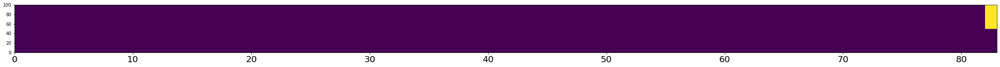

A,P,R:  0.9879518072289156 0.9879518072289156 1.0
Num frames:  (83, 1)
Accuracy:  0.9879518072289156
Person:  276
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



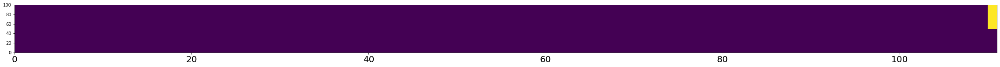

A,P,R:  0.990990990990991 0.990990990990991 1.0
Num frames:  (111, 1)
Accuracy:  0.990990990990991
Person:  277
Transitions:  [1, 8, 2, 8, 3, 8]
GT transitions:  2
Transitions captured:  2


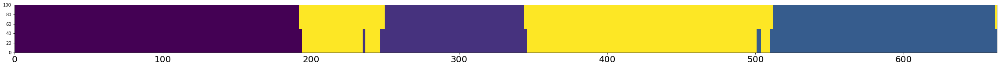

A,P,R:  0.9773755656108597 0.9667405764966741 1.0
Num frames:  (451, 15)
Accuracy:  0.9773755656108597
Person:  278
Transitions:  [1, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


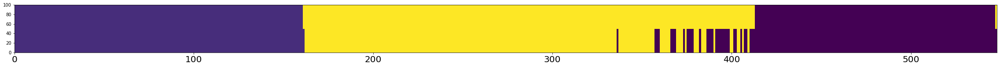

A,P,R:  0.9361313868613139 0.8939393939393939 1.0
Num frames:  (330, 35)
Accuracy:  0.9361313868613139
Person:  279
Transitions:  [5, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


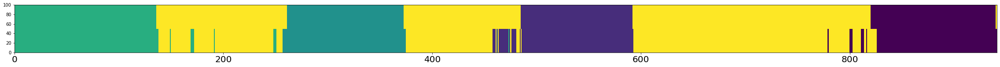

A,P,R:  0.9426142401700319 0.9087378640776699 0.9852631578947368
Num frames:  (515, 47)
Accuracy:  0.9426142401700319
Person:  280
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



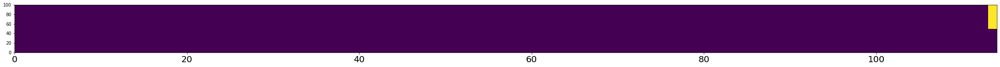

A,P,R:  0.9912280701754386 0.9912280701754386 1.0
Num frames:  (114, 1)
Accuracy:  0.9912280701754386
Person:  281
Transitions:  [1, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


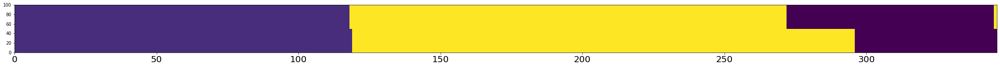

A,P,R:  0.9248554913294798 0.9881656804733728 0.8743455497382199
Num frames:  (169, 2)
Accuracy:  0.9248554913294798
Person:  282
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


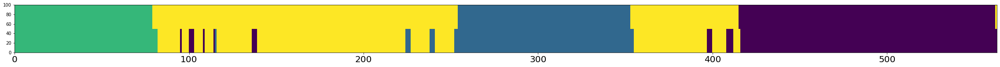

A,P,R:  0.9431616341030196 0.9126760563380282 0.9969230769230769
Num frames:  (355, 31)
Accuracy:  0.9431616341030196
Person:  283
Transitions:  [0, 8, 7, 8]
GT transitions:  1
Transitions captured:  0


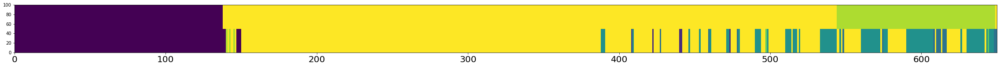

A,P,R:  0.7584615384615384 0.5454545454545454 0.5679012345679012
Num frames:  (253, 52)
Accuracy:  0.7584615384615384
Person:  284
Transitions:  [0, 8, 1, 8, 2, 8, 4, 8, 5, 8]
GT transitions:  4
Transitions captured:  4


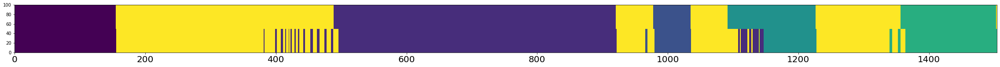

A,P,R:  0.9208776595744681 0.9133689839572192 0.9232432432432433
Num frames:  (935, 48)
Accuracy:  0.9208776595744681
Person:  285
Transitions:  [5, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


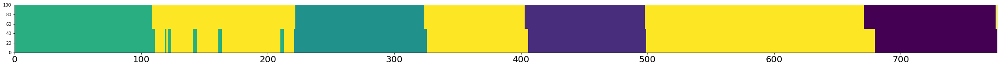

A,P,R:  0.9587628865979382 0.9521531100478469 0.9707317073170731
Num frames:  (418, 20)
Accuracy:  0.9587628865979382
Person:  286
Transitions:  [1, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


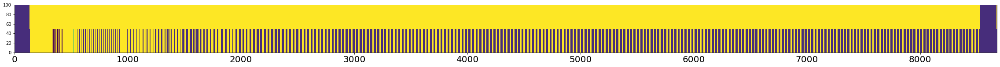

A,P,R:  0.48225397557040794 0.05905759162303665 1.0
Num frames:  (4775, 4493)
Accuracy:  0.48225397557040794
Person:  287
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


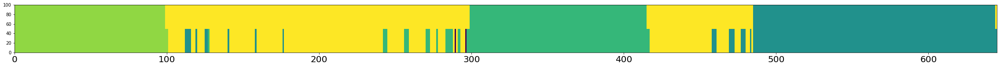

A,P,R:  0.9255813953488372 0.8862559241706162 1.0
Num frames:  (422, 48)
Accuracy:  0.9255813953488372
Person:  288
Transitions:  [0, 8, 1, 8, 4, 8, 5, 8]
GT transitions:  3
Transitions captured:  3


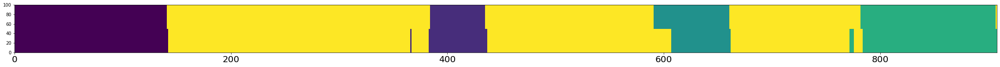

A,P,R:  0.9680616740088106 0.9710526315789474 0.9534883720930233
Num frames:  (380, 11)
Accuracy:  0.9680616740088106
Person:  289
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


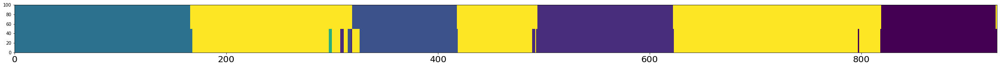

A,P,R:  0.9698275862068966 0.9592233009708738 0.9860279441117764
Num frames:  (515, 21)
Accuracy:  0.9698275862068966
Person:  290
Transitions:  [0, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


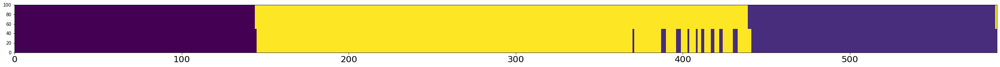

A,P,R:  0.9625850340136054 0.9354838709677419 0.9931506849315068
Num frames:  (310, 20)
Accuracy:  0.9625850340136054
Person:  291
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


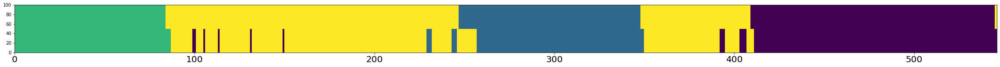

A,P,R:  0.9322344322344323 0.9251497005988024 0.9626168224299065
Num frames:  (334, 25)
Accuracy:  0.9322344322344323
Person:  292
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


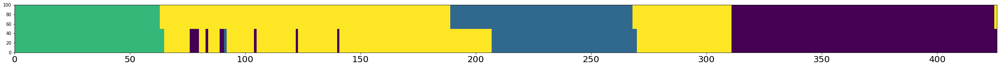

A,P,R:  0.92018779342723 0.937007874015748 0.9296875
Num frames:  (254, 16)
Accuracy:  0.92018779342723
Person:  293
Transitions:  [1, 8]
GT transitions:  0
Transitions captured:  0



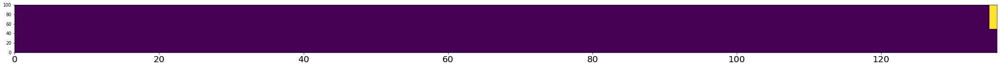

A,P,R:  0.9926470588235294 0.9926470588235294 1.0
Num frames:  (136, 1)
Accuracy:  0.9926470588235294
Person:  294
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


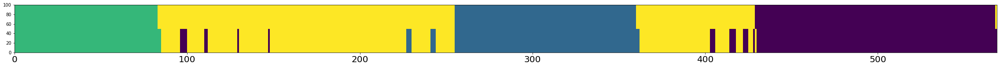

A,P,R:  0.945518453427065 0.9157303370786517 0.9969418960244648
Num frames:  (356, 30)
Accuracy:  0.945518453427065
Person:  295
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


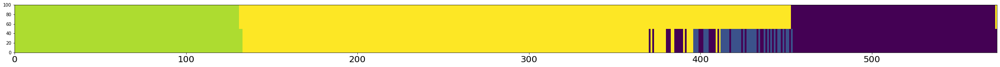

A,P,R:  0.8778359511343804 0.780564263322884 0.996
Num frames:  (319, 69)
Accuracy:  0.8778359511343804
Person:  296
Transitions:  [0, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


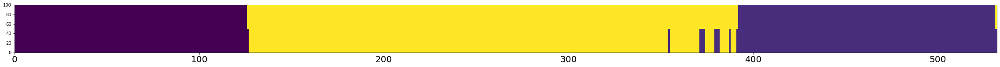

A,P,R:  0.9793233082706767 0.9601449275362319 1.0
Num frames:  (276, 11)
Accuracy:  0.9793233082706767
Person:  297
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


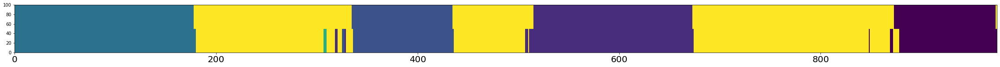

A,P,R:  0.9671794871794872 0.9533213644524237 0.9888268156424581
Num frames:  (557, 26)
Accuracy:  0.9671794871794872
Person:  298
Transitions:  [0, 8, 7, 8, 7, 8]
GT transitions:  2
Transitions captured:  1


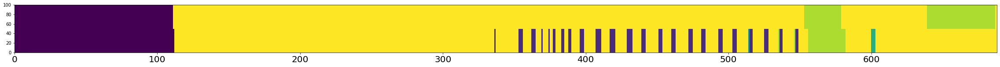

A,P,R:  0.8241279069767442 0.6568627450980392 0.7243243243243244
Num frames:  (204, 70)
Accuracy:  0.8241279069767442
Person:  299
Transitions:  [0, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


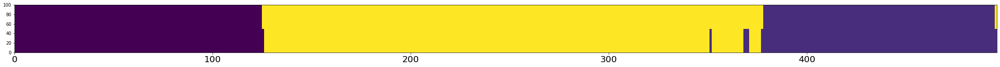

A,P,R:  0.9858870967741935 0.9718875502008032 1.0
Num frames:  (249, 7)
Accuracy:  0.9858870967741935
Person:  300
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


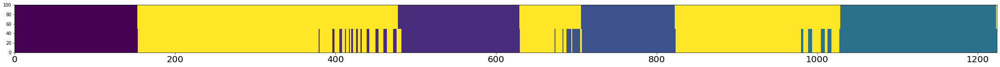

A,P,R:  0.9379084967320261 0.895741556534508 0.991869918699187
Num frames:  (681, 71)
Accuracy:  0.9379084967320261
Person:  301
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


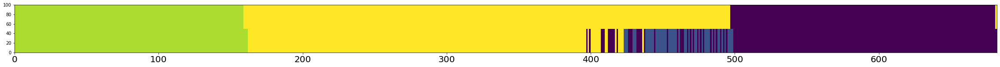

A,P,R:  0.8680351906158358 0.7911832946635731 0.9941690962099126
Num frames:  (431, 88)
Accuracy:  0.8680351906158358
Person:  302
Transitions:  [5, 8, 6, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  4
Transitions captured:  3


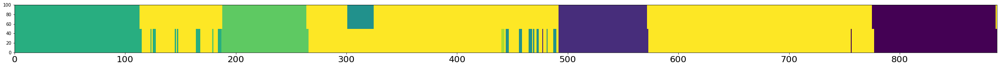

A,P,R:  0.9234234234234234 0.9002375296912114 0.9358024691358025
Num frames:  (421, 42)
Accuracy:  0.9234234234234234
Person:  303
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


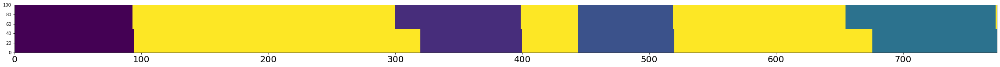

A,P,R:  0.9418604651162791 0.9885057471264368 0.8935064935064935
Num frames:  (348, 4)
Accuracy:  0.9418604651162791
Person:  304
Transitions:  [3, 8, 2, 8, 1, 8]
GT transitions:  2
Transitions captured:  2


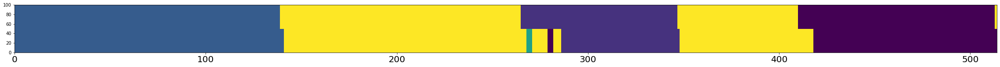

A,P,R:  0.9357976653696498 0.9672131147540983 0.9104938271604939
Num frames:  (305, 4)
Accuracy:  0.9357976653696498
Person:  305
Transitions:  [0, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


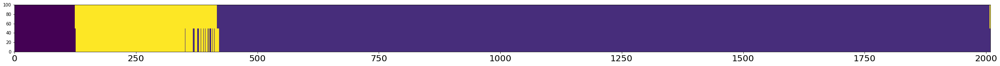

A,P,R:  0.9880537580886013 0.9890173410404625 0.997086247086247
Num frames:  (1730, 19)
Accuracy:  0.9880537580886013
Person:  306
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  2


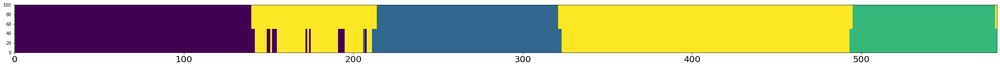

A,P,R:  0.9603448275862069 0.9350282485875706 1.0
Num frames:  (354, 23)
Accuracy:  0.9603448275862069
Person:  307
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



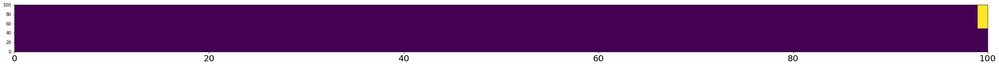

A,P,R:  0.99 0.99 1.0
Num frames:  (100, 1)
Accuracy:  0.99
Person:  308
Transitions:  [2, 8, 4, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


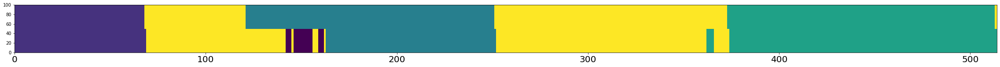

A,P,R:  0.9027237354085603 0.9276729559748428 0.8727810650887574
Num frames:  (318, 7)
Accuracy:  0.9027237354085603
Person:  309
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  2


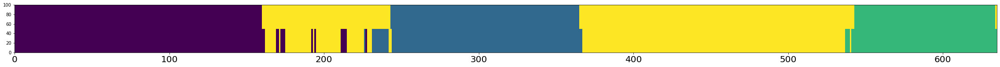

A,P,R:  0.9448818897637795 0.916256157635468 0.9973190348525469
Num frames:  (406, 34)
Accuracy:  0.9448818897637795
Person:  310
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



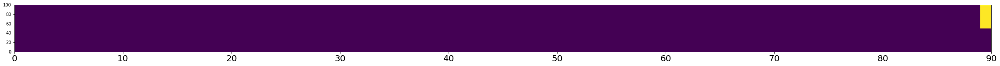

A,P,R:  0.9888888888888889 0.9888888888888889 1.0
Num frames:  (90, 1)
Accuracy:  0.9888888888888889
Person:  311
Transitions:  [0, 8, 1, 8, 4, 8, 5, 8]
GT transitions:  3
Transitions captured:  3


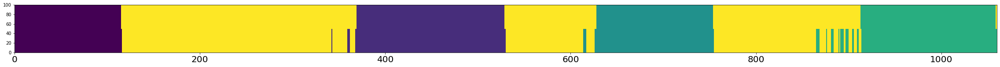

A,P,R:  0.9669811320754716 0.9413793103448276 0.9981718464351006
Num frames:  (580, 34)
Accuracy:  0.9669811320754716
Person:  312
Transitions:  [0, 8]
GT transitions:  0
Transitions captured:  0



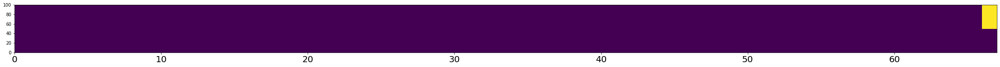

A,P,R:  0.9850746268656716 0.9850746268656716 1.0
Num frames:  (67, 1)
Accuracy:  0.9850746268656716
Person:  313
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



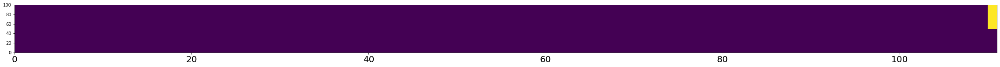

A,P,R:  0.990990990990991 0.990990990990991 1.0
Num frames:  (111, 1)
Accuracy:  0.990990990990991
Person:  314
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


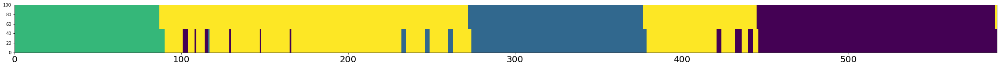

A,P,R:  0.9354838709677419 0.9046321525885559 0.991044776119403
Num frames:  (367, 35)
Accuracy:  0.9354838709677419
Person:  315
Transitions:  [4, 8, 5, 8]
GT transitions:  1
Transitions captured:  1


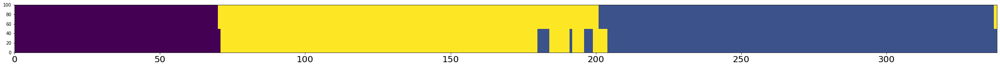

A,P,R:  0.9615384615384616 0.9530516431924883 0.9854368932038835
Num frames:  (213, 10)
Accuracy:  0.9615384615384616
Person:  316
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  1


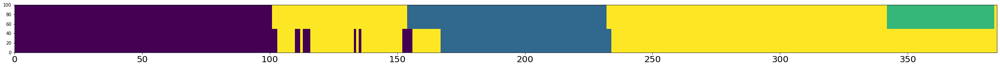

A,P,R:  0.8233766233766234 0.9171270718232044 0.751131221719457
Num frames:  (181, 13)
Accuracy:  0.8233766233766234
Person:  317
Transitions:  [0, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


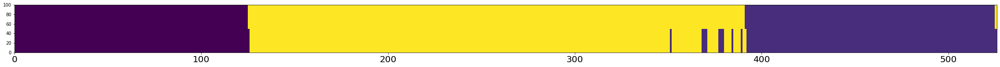

A,P,R:  0.9771863117870723 0.9591078066914498 0.9961389961389961
Num frames:  (269, 11)
Accuracy:  0.9771863117870723
Person:  318
Transitions:  [0, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


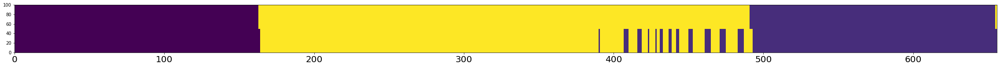

A,P,R:  0.948170731707317 0.9103641456582633 0.9938837920489296
Num frames:  (357, 32)
Accuracy:  0.948170731707317
Person:  319
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  0


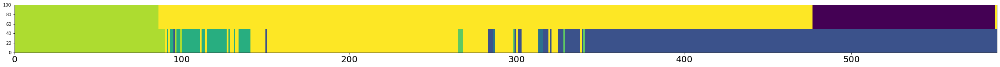

A,P,R:  0.444633730834753 0.2087378640776699 0.441025641025641
Num frames:  (412, 217)
Accuracy:  0.444633730834753
Person:  320
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



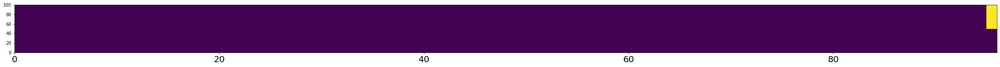

A,P,R:  0.9895833333333334 0.9895833333333334 1.0
Num frames:  (96, 1)
Accuracy:  0.9895833333333334
Person:  321
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  2


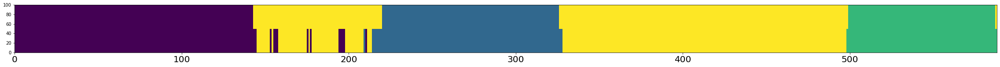

A,P,R:  0.9591836734693877 0.9335180055401662 1.0
Num frames:  (361, 24)
Accuracy:  0.9591836734693877
Person:  322
Transitions:  [6, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  1


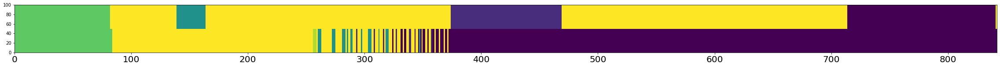

A,P,R:  0.498812351543943 0.3448844884488449 0.6352583586626139
Num frames:  (606, 302)
Accuracy:  0.498812351543943
Person:  323
Transitions:  [6, 8, 7, 8, 0, 8]
GT transitions:  2
Transitions captured:  1


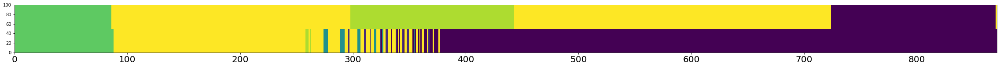

A,P,R:  0.4925373134328358 0.3670886075949367 0.6153846153846154
Num frames:  (632, 297)
Accuracy:  0.4925373134328358
Person:  324
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



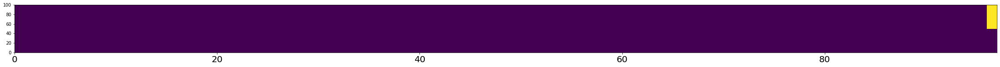

A,P,R:  0.9896907216494846 0.9896907216494846 1.0
Num frames:  (97, 1)
Accuracy:  0.9896907216494846
Person:  325
Transitions:  [5, 8]
GT transitions:  0
Transitions captured:  0



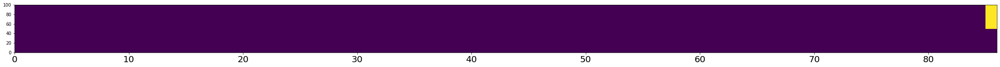

A,P,R:  0.9883720930232558 0.9883720930232558 1.0
Num frames:  (86, 1)
Accuracy:  0.9883720930232558
Person:  326
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  2


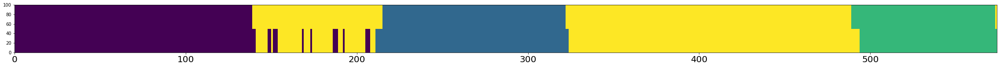

A,P,R:  0.9512195121951219 0.9339080459770115 0.9848484848484849
Num frames:  (348, 23)
Accuracy:  0.9512195121951219
Person:  327
Transitions:  [5, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


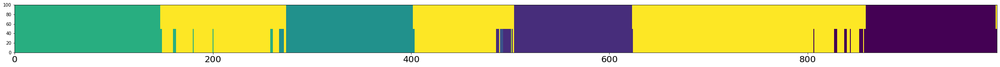

A,P,R:  0.9505549949545913 0.9146341463414634 1.0
Num frames:  (574, 49)
Accuracy:  0.9505549949545913
Person:  328
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


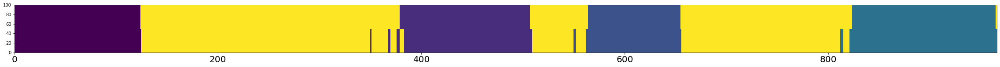

A,P,R:  0.9730848861283644 0.9561752988047809 0.9917355371900827
Num frames:  (502, 22)
Accuracy:  0.9730848861283644
Person:  329
Transitions:  [5, 8, 6, 8]
GT transitions:  1
Transitions captured:  1


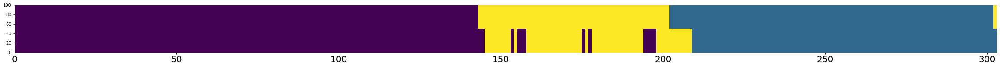

A,P,R:  0.933993399339934 0.9477911646586346 0.9711934156378601
Num frames:  (249, 13)
Accuracy:  0.933993399339934
Person:  330
Transitions:  [1, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


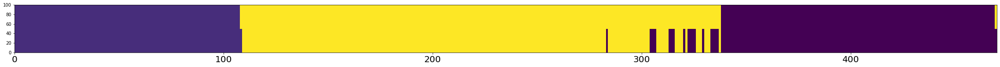

A,P,R:  0.9595744680851064 0.9263565891472868 1.0
Num frames:  (258, 19)
Accuracy:  0.9595744680851064
Person:  331
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



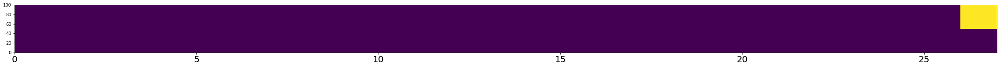

A,P,R:  0.9629629629629629 0.9629629629629629 1.0
Num frames:  (27, 1)
Accuracy:  0.9629629629629629
Person:  332
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


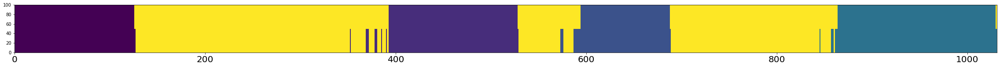

A,P,R:  0.9709020368574199 0.9455535390199638 1.0
Num frames:  (551, 30)
Accuracy:  0.9709020368574199
Person:  333
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


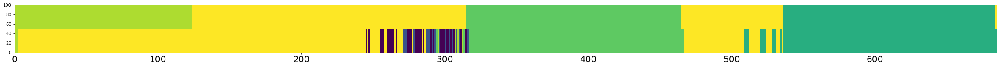

A,P,R:  0.724087591240876 0.8147138964577657 0.7085308056872038
Num frames:  (367, 66)
Accuracy:  0.724087591240876
Person:  334
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



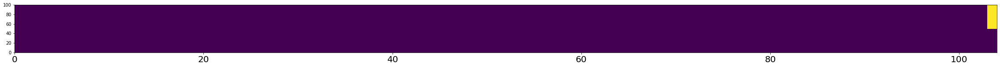

A,P,R:  0.9903846153846154 0.9903846153846154 1.0
Num frames:  (104, 1)
Accuracy:  0.9903846153846154
Person:  335
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


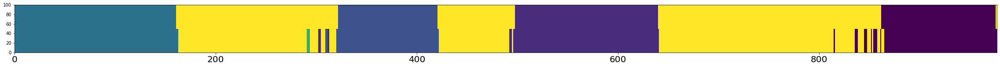

A,P,R:  0.9611054247697032 0.9361313868613139 0.9941860465116279
Num frames:  (548, 35)
Accuracy:  0.9611054247697032
Person:  336
Transitions:  [2, 8, 1, 8, 0, 8]
GT transitions:  2
Transitions captured:  2


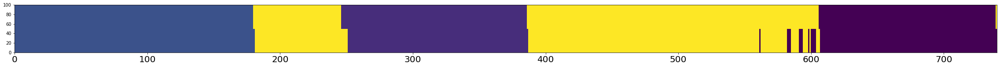

A,P,R:  0.9716216216216216 0.9675324675324676 0.9867549668874173
Num frames:  (462, 15)
Accuracy:  0.9716216216216216
Person:  337
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



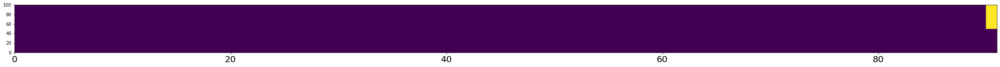

A,P,R:  0.989010989010989 0.989010989010989 1.0
Num frames:  (91, 1)
Accuracy:  0.989010989010989
Person:  338
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



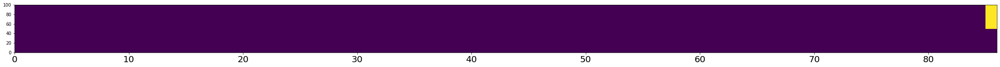

A,P,R:  0.9883720930232558 0.9883720930232558 1.0
Num frames:  (86, 1)
Accuracy:  0.9883720930232558
Person:  339
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


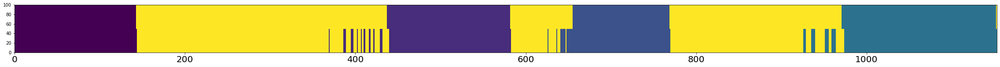

A,P,R:  0.9470945359930616 0.9129746835443038 0.9897084048027445
Num frames:  (632, 55)
Accuracy:  0.9470945359930616
Person:  340
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  2


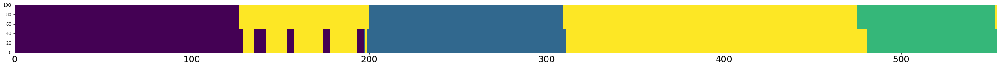

A,P,R:  0.9422382671480144 0.9221556886227545 0.9808917197452229
Num frames:  (334, 26)
Accuracy:  0.9422382671480144
Person:  341
Transitions:  [0, 8, 1, 8, 4, 8, 5, 8]
GT transitions:  3
Transitions captured:  3


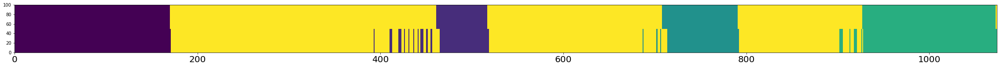

A,P,R:  0.957169459962756 0.9269311064718163 0.9758241758241758
Num frames:  (479, 35)
Accuracy:  0.957169459962756
Person:  342
Transitions:  [2, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


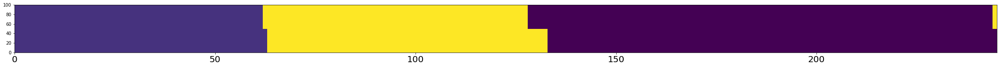

A,P,R:  0.9714285714285714 0.9885714285714285 0.9719101123595506
Num frames:  (175, 2)
Accuracy:  0.9714285714285714
Person:  343
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


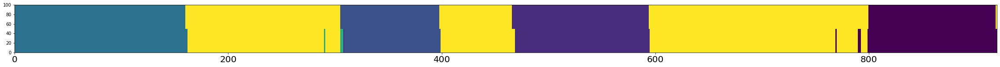

A,P,R:  0.9804347826086957 0.9704724409448819 0.986
Num frames:  (508, 11)
Accuracy:  0.9804347826086957
Person:  344
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


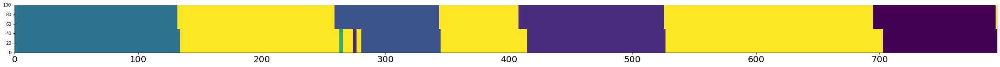

A,P,R:  0.9471698113207547 0.9730392156862745 0.9147465437788018
Num frames:  (408, 5)
Accuracy:  0.9471698113207547
Person:  345
Transitions:  [3, 8, 2, 8, 1, 8]
GT transitions:  2
Transitions captured:  2


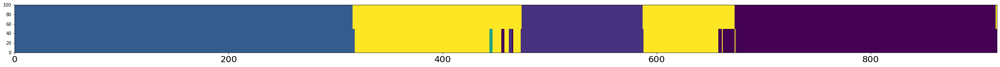

A,P,R:  0.9673202614379085 0.9586305278174037 0.9985141158989599
Num frames:  (701, 29)
Accuracy:  0.9673202614379085
Person:  346
Transitions:  [2, 8, 4, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


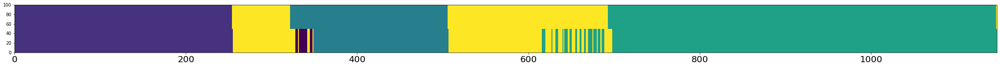

A,P,R:  0.937227550130776 0.9387978142076503 0.9640852974186308
Num frames:  (915, 40)
Accuracy:  0.937227550130776
Person:  347
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



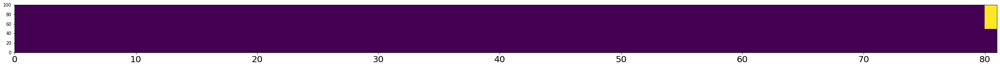

A,P,R:  0.9876543209876543 0.9876543209876543 1.0
Num frames:  (81, 1)
Accuracy:  0.9876543209876543
Person:  348
Transitions:  [1, 8, 7, 8]
GT transitions:  1
Transitions captured:  0


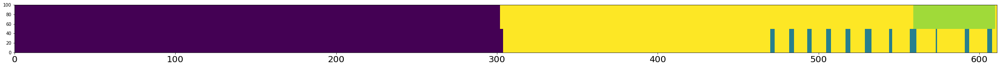

A,P,R:  0.8756137479541735 0.8988095238095238 0.8555240793201133
Num frames:  (336, 25)
Accuracy:  0.8756137479541735
Person:  349
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  2


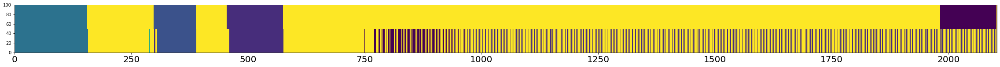

A,P,R:  0.714828897338403 0.4068965517241379 0.7268993839835729
Num frames:  (870, 467)
Accuracy:  0.714828897338403
Person:  350
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



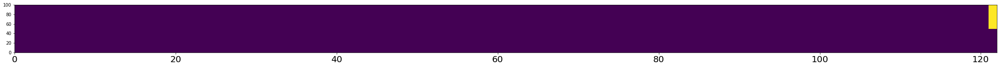

A,P,R:  0.9918032786885246 0.9918032786885246 1.0
Num frames:  (122, 1)
Accuracy:  0.9918032786885246
Person:  351
Transitions:  [0, 8, 1, 8, 4, 8, 6, 8, 5, 8]
GT transitions:  4
Transitions captured:  4


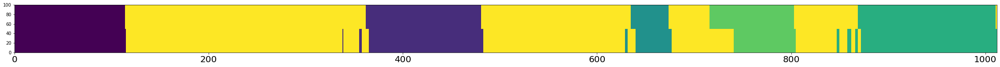

A,P,R:  0.9387351778656127 0.9470468431771895 0.9281437125748503
Num frames:  (491, 26)
Accuracy:  0.9387351778656127
Person:  352
Transitions:  [5, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


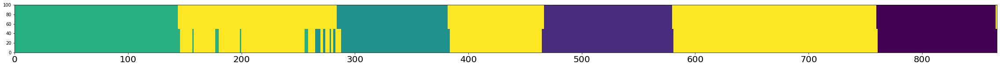

A,P,R:  0.964203233256351 0.9459459459459459 0.9891304347826086
Num frames:  (481, 26)
Accuracy:  0.964203233256351
Person:  353
Transitions:  [3, 8, 2, 8, 1, 8]
GT transitions:  2
Transitions captured:  2


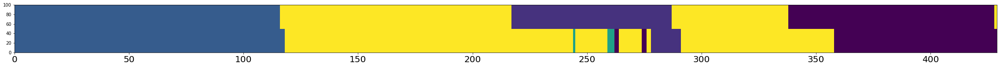

A,P,R:  0.7948717948717948 0.9285714285714286 0.7065217391304348
Num frames:  (210, 7)
Accuracy:  0.7948717948717948
Person:  354
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


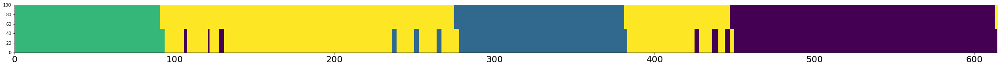

A,P,R:  0.9397394136807817 0.9201030927835051 0.9834710743801653
Num frames:  (388, 31)
Accuracy:  0.9397394136807817
Person:  355
Transitions:  [0, 8, 1, 8, 4, 8, 5, 8]
GT transitions:  3
Transitions captured:  3


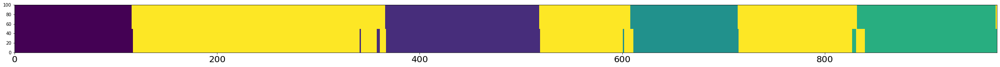

A,P,R:  0.9742268041237113 0.974609375 0.9765166340508806
Num frames:  (512, 13)
Accuracy:  0.9742268041237113
Person:  356
Transitions:  [0, 8, 1, 8, 4, 8, 5, 8]
GT transitions:  3
Transitions captured:  3


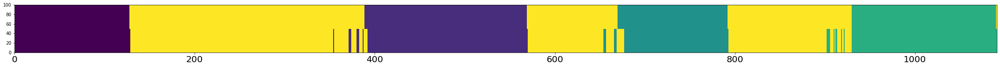

A,P,R:  0.9660861594867094 0.9555189456342669 0.9830508474576272
Num frames:  (607, 27)
Accuracy:  0.9660861594867094
Person:  357
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



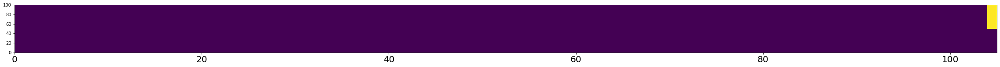

A,P,R:  0.9904761904761905 0.9904761904761905 1.0
Num frames:  (105, 1)
Accuracy:  0.9904761904761905
Person:  358
Transitions:  [6, 8, 4, 8, 2, 8]
GT transitions:  2
Transitions captured:  2


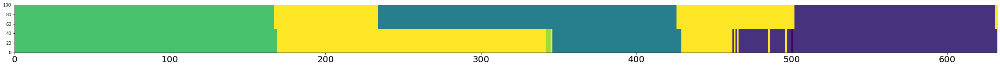

A,P,R:  0.7563291139240507 0.8931116389548693 0.7704918032786885
Num frames:  (421, 42)
Accuracy:  0.7563291139240507
Person:  359
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


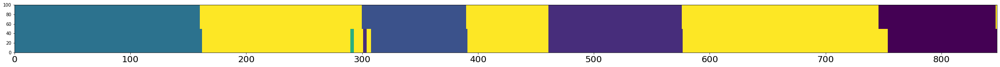

A,P,R:  0.9716981132075472 0.9761388286334056 0.9656652360515021
Num frames:  (461, 8)
Accuracy:  0.9716981132075472
Person:  360
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  0


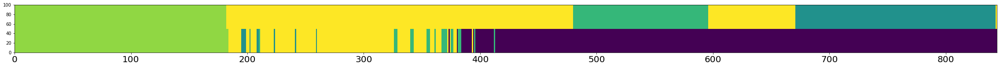

A,P,R:  0.4146919431279621 0.2692307692307692 0.3872340425531915
Num frames:  (676, 206)
Accuracy:  0.4146919431279621
Person:  361
Transitions:  [6, 8, 4, 8, 0, 8]
GT transitions:  2
Transitions captured:  1


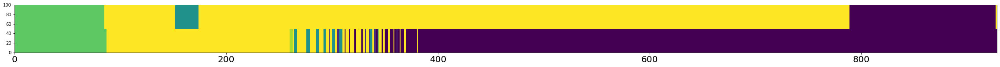

A,P,R:  0.4676724137931034 0.320863309352518 0.9102040816326531
Num frames:  (695, 472)
Accuracy:  0.4676724137931034
Person:  362
Transitions:  [4, 8, 1, 8, 0, 8]
GT transitions:  2
Transitions captured:  2


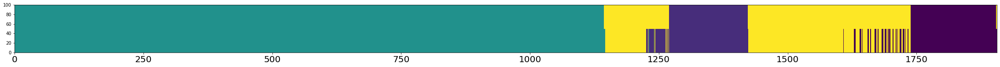

A,P,R:  0.9559286463798531 0.9457013574660633 1.0
Num frames:  (1547, 84)
Accuracy:  0.9559286463798531
Person:  363
Transitions:  [3, 8, 2, 8, 1, 8]
GT transitions:  2
Transitions captured:  2


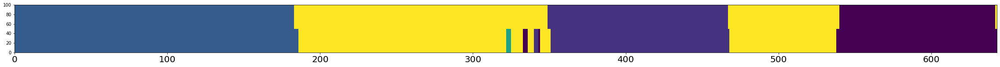

A,P,R:  0.9704510108864697 0.9593301435406698 0.9950372208436724
Num frames:  (418, 17)
Accuracy:  0.9704510108864697
Person:  364
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  0


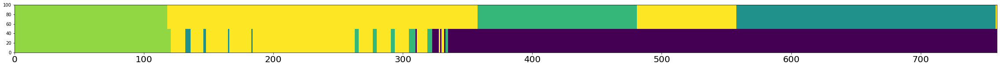

A,P,R:  0.38998682476943347 0.20309810671256454 0.2675736961451247
Num frames:  (581, 140)
Accuracy:  0.38998682476943347
Person:  365
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


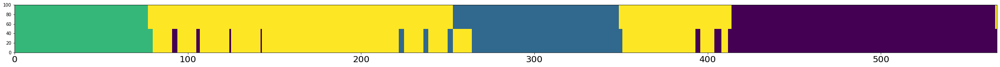

A,P,R:  0.9259259259259259 0.9101449275362319 0.9661538461538461
Num frames:  (345, 31)
Accuracy:  0.9259259259259259
Person:  366
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


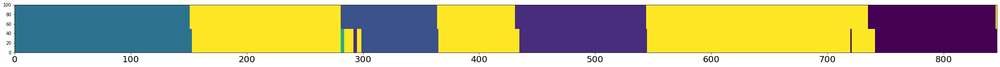

A,P,R:  0.9598108747044918 0.9727891156462585 0.9387308533916849
Num frames:  (441, 6)
Accuracy:  0.9598108747044918
Person:  367
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



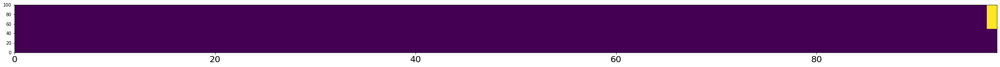

A,P,R:  0.9897959183673469 0.9897959183673469 1.0
Num frames:  (98, 1)
Accuracy:  0.9897959183673469
Person:  368
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


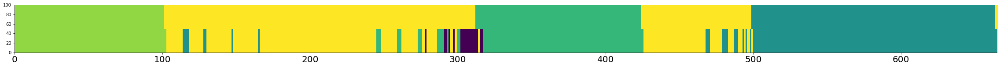

A,P,R:  0.9037593984962407 0.8571428571428571 0.9841269841269841
Num frames:  (434, 58)
Accuracy:  0.9037593984962407
Person:  369
Transitions:  [5, 8, 4, 8, 7, 8]
GT transitions:  2
Transitions captured:  1


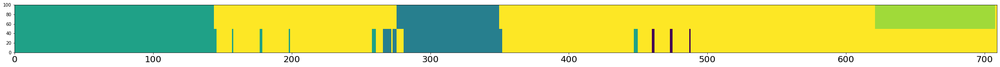

A,P,R:  0.8307475317348378 0.8838174273858921 0.6983606557377049
Num frames:  (241, 28)
Accuracy:  0.8307475317348378
Person:  370
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


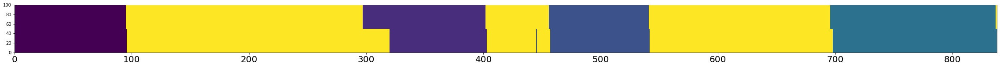

A,P,R:  0.9630071599045346 0.9876543209876543 0.9389671361502347
Num frames:  (405, 5)
Accuracy:  0.9630071599045346
Person:  371
Transitions:  [1, 8, 4, 8]
GT transitions:  1
Transitions captured:  1


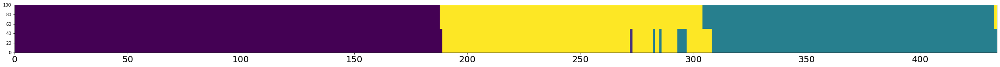

A,P,R:  0.9700460829493087 0.9720496894409938 0.9873817034700315
Num frames:  (322, 9)
Accuracy:  0.9700460829493087
Person:  372
Transitions:  [1, 8, 2, 8, 4, 8, 5, 8]
GT transitions:  3
Transitions captured:  3


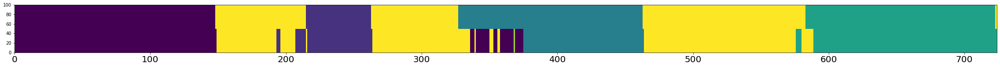

A,P,R:  0.8977900552486188 0.8891257995735607 0.8834745762711864
Num frames:  (469, 19)
Accuracy:  0.8977900552486188
Person:  373
Transitions:  [5, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


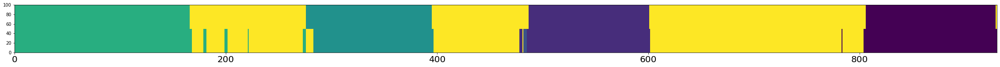

A,P,R:  0.9634408602150538 0.9501845018450185 0.9865900383141762
Num frames:  (542, 27)
Accuracy:  0.9634408602150538
Person:  374
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



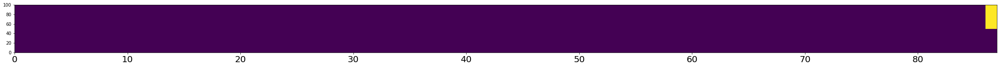

A,P,R:  0.9885057471264368 0.9885057471264368 1.0
Num frames:  (87, 1)
Accuracy:  0.9885057471264368
Person:  375
Transitions:  [5, 8, 4, 8]
GT transitions:  1
Transitions captured:  1


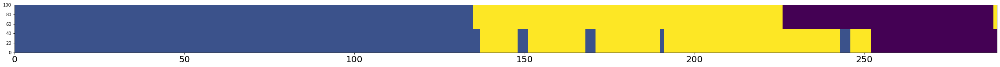

A,P,R:  0.8754325259515571 0.9293478260869565 0.868020304568528
Num frames:  (184, 10)
Accuracy:  0.8754325259515571
Person:  376
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


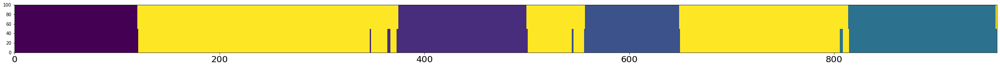

A,P,R:  0.9822732012513035 0.967741935483871 0.997920997920998
Num frames:  (496, 16)
Accuracy:  0.9822732012513035
Person:  377
Transitions:  [0, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


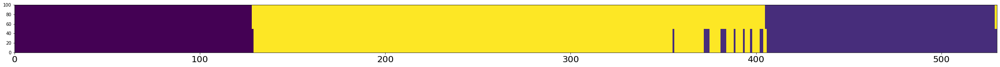

A,P,R:  0.9716981132075472 0.9471698113207547 0.996031746031746
Num frames:  (265, 14)
Accuracy:  0.9716981132075472
Person:  378
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


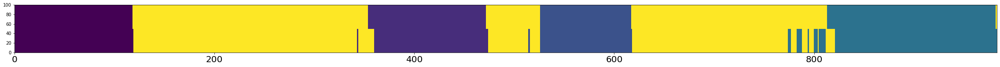

A,P,R:  0.9572736520854527 0.9450980392156862 0.9717741935483871
Num frames:  (510, 28)
Accuracy:  0.9572736520854527
Person:  379
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


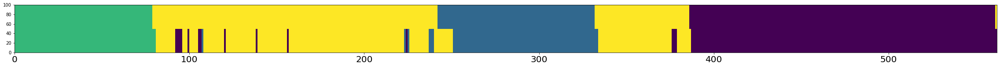

A,P,R:  0.9377224199288257 0.9303621169916435 0.9709302325581395
Num frames:  (359, 25)
Accuracy:  0.9377224199288257
Person:  380
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



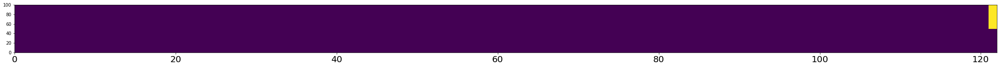

A,P,R:  0.9918032786885246 0.9918032786885246 1.0
Num frames:  (122, 1)
Accuracy:  0.9918032786885246
Person:  381
Transitions:  [5, 8, 4, 8, 1, 8]
GT transitions:  2
Transitions captured:  2


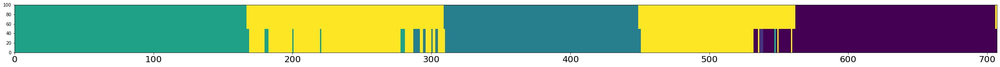

A,P,R:  0.9278642149929278 0.9 0.9977827050997783
Num frames:  (500, 50)
Accuracy:  0.9278642149929278
Person:  382
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


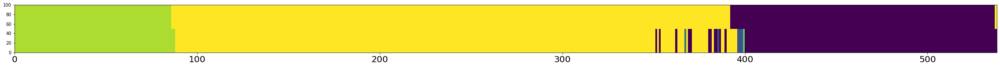

A,P,R:  0.9553903345724907 0.9176954732510288 0.9653679653679653
Num frames:  (243, 16)
Accuracy:  0.9553903345724907
Person:  383
Transitions:  [0, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


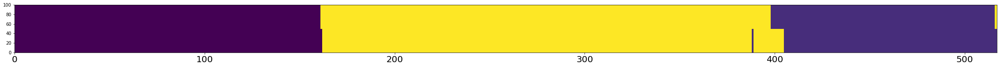

A,P,R:  0.9806576402321083 0.9890909090909091 0.974910394265233
Num frames:  (275, 3)
Accuracy:  0.9806576402321083
Person:  384
Transitions:  [0, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


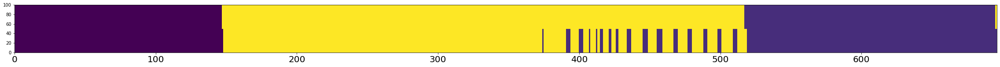

A,P,R:  0.9353448275862069 0.8825136612021858 0.9938461538461538
Num frames:  (366, 43)
Accuracy:  0.9353448275862069
Person:  385
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


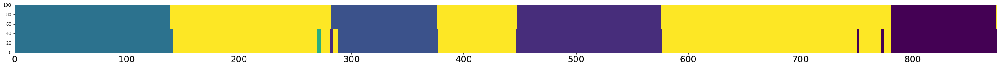

A,P,R:  0.9771428571428571 0.9655172413793104 0.986784140969163
Num frames:  (464, 14)
Accuracy:  0.9771428571428571
Person:  386
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  2


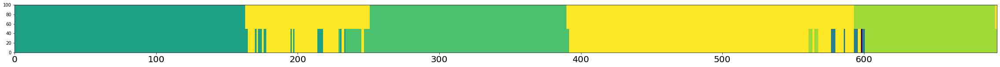

A,P,R:  0.9236311239193083 0.8853932584269663 0.9800995024875622
Num frames:  (445, 45)
Accuracy:  0.9236311239193083
Person:  387
Transitions:  [4, 8, 7, 8]
GT transitions:  1
Transitions captured:  1


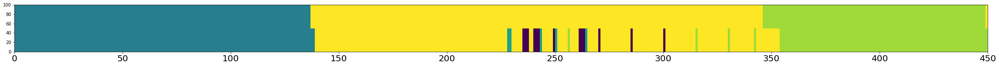

A,P,R:  0.9266666666666666 0.9027237354085603 0.9666666666666667
Num frames:  (257, 25)
Accuracy:  0.9266666666666666
Person:  388
Transitions:  [0, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


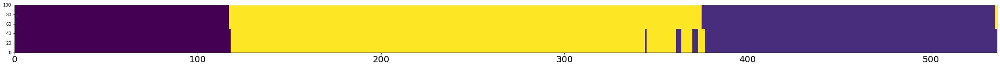

A,P,R:  0.9794776119402985 0.9683098591549296 0.9927797833935018
Num frames:  (284, 9)
Accuracy:  0.9794776119402985
Person:  389
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



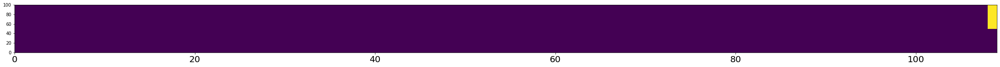

A,P,R:  0.9908256880733946 0.9908256880733946 1.0
Num frames:  (109, 1)
Accuracy:  0.9908256880733946
Person:  390
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  1


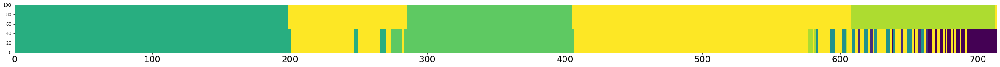

A,P,R:  0.8053221288515406 0.7649880095923262 0.7523584905660378
Num frames:  (417, 34)
Accuracy:  0.8053221288515406
Person:  391
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



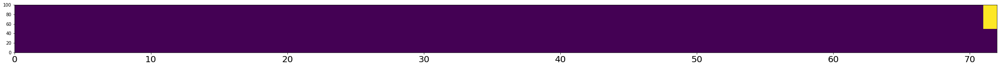

A,P,R:  0.9861111111111112 0.9861111111111112 1.0
Num frames:  (72, 1)
Accuracy:  0.9861111111111112
Person:  392
Transitions:  [5, 8, 4, 8, 4, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  5
Transitions captured:  4


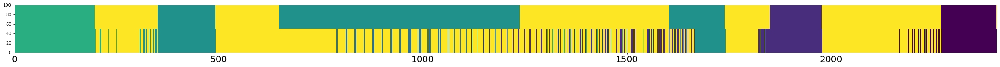

A,P,R:  0.6442227763923525 0.6713286713286714 0.506405425772419
Num frames:  (1001, 201)
Accuracy:  0.6442227763923525
Person:  393
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



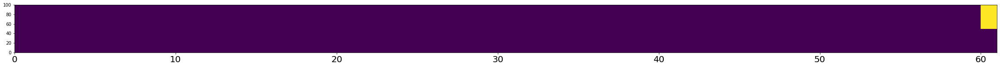

A,P,R:  0.9836065573770492 0.9836065573770492 1.0
Num frames:  (61, 1)
Accuracy:  0.9836065573770492
Person:  394
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



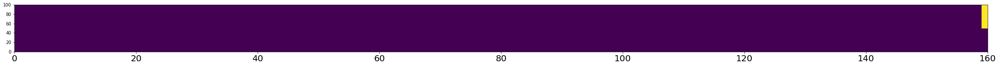

A,P,R:  0.99375 0.99375 1.0
Num frames:  (160, 1)
Accuracy:  0.99375
Person:  395
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



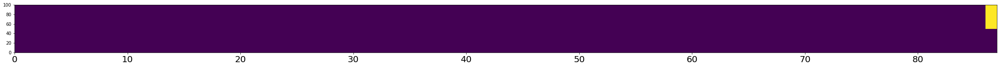

A,P,R:  0.9885057471264368 0.9885057471264368 1.0
Num frames:  (87, 1)
Accuracy:  0.9885057471264368
Person:  396
Transitions:  [0, 8, 1, 8, 4, 8, 5, 8]
GT transitions:  3
Transitions captured:  3


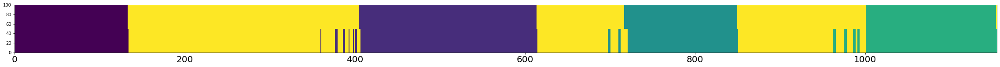

A,P,R:  0.9645021645021645 0.9467275494672754 0.9904458598726115
Num frames:  (657, 35)
Accuracy:  0.9645021645021645
Person:  397
Transitions:  [0, 8, 1, 8, 7, 8]
GT transitions:  2
Transitions captured:  1


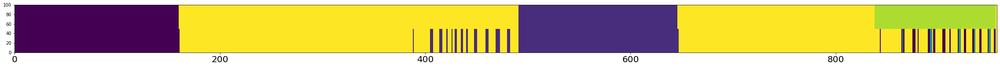

A,P,R:  0.845350052246604 0.8333333333333334 0.7274826789838337
Num frames:  (378, 30)
Accuracy:  0.845350052246604
Person:  398
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


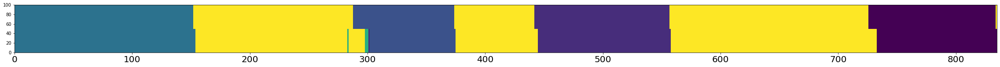

A,P,R:  0.9640718562874252 0.9776286353467561 0.9479392624728851
Num frames:  (447, 6)
Accuracy:  0.9640718562874252
Person:  399
Transitions:  [5, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


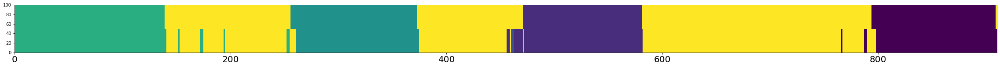

A,P,R:  0.9538461538461539 0.9345238095238095 0.9792099792099792
Num frames:  (504, 32)
Accuracy:  0.9538461538461539
Person:  400
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


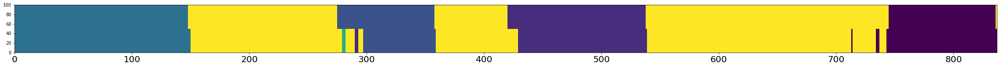

A,P,R:  0.9498207885304659 0.960093896713615 0.9295454545454546
Num frames:  (426, 11)
Accuracy:  0.9498207885304659
Person:  401
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  2


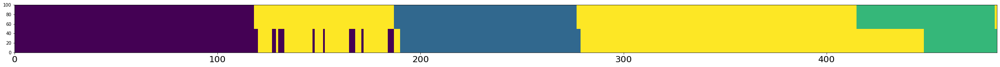

A,P,R:  0.8863636363636364 0.9266409266409267 0.8695652173913043
Num frames:  (259, 19)
Accuracy:  0.8863636363636364
Person:  402
Transitions:  [5, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


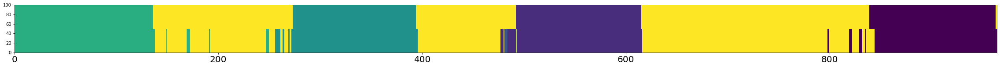

A,P,R:  0.9470954356846473 0.9154411764705882 0.9880952380952381
Num frames:  (544, 45)
Accuracy:  0.9470954356846473
Person:  403
Transitions:  [5, 8, 6, 8, 7, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


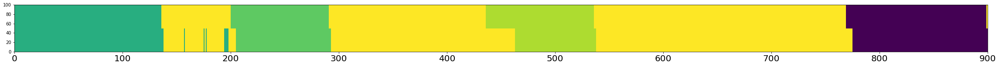

A,P,R:  0.9422222222222222 0.9676674364896074 0.9168490153172867
Num frames:  (433, 14)
Accuracy:  0.9422222222222222
Person:  404
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


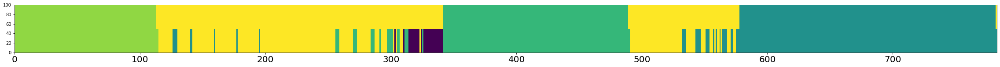

A,P,R:  0.8914431673052363 0.8451730418943534 1.0
Num frames:  (549, 85)
Accuracy:  0.8914431673052363
Person:  405
Transitions:  [0, 8, 4, 8, 6, 8, 5, 8]
GT transitions:  3
Transitions captured:  1


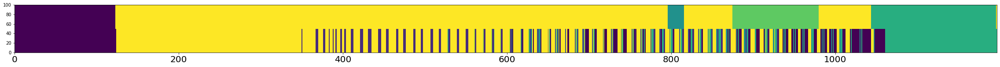

A,P,R:  0.6691729323308271 0.42644628099173554 0.645
Num frames:  (605, 254)
Accuracy:  0.6691729323308271
Person:  406
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  0


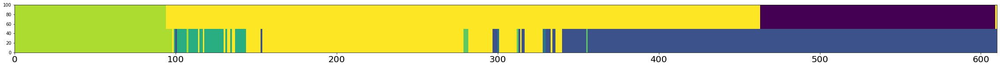

A,P,R:  0.45737704918032784 0.2211764705882353 0.39166666666666666
Num frames:  (425, 185)
Accuracy:  0.45737704918032784
Person:  407
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


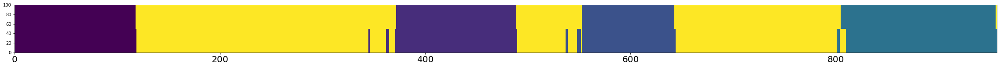

A,P,R:  0.9759665621734587 0.9631901840490797 0.9894957983193278
Num frames:  (489, 18)
Accuracy:  0.9759665621734587
Person:  408
Transitions:  [2, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


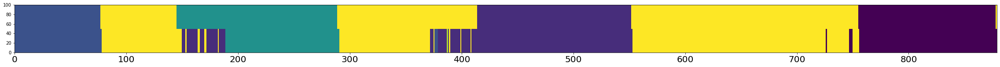

A,P,R:  0.8953356086461889 0.8452611218568665 0.9066390041493776
Num frames:  (517, 47)
Accuracy:  0.8953356086461889
Person:  409
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


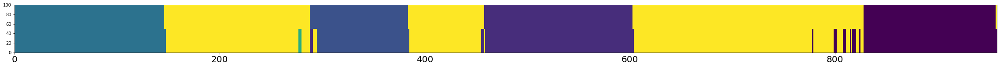

A,P,R:  0.9665970772442589 0.9495327102803738 0.9844961240310077
Num frames:  (535, 24)
Accuracy:  0.9665970772442589
Person:  410
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


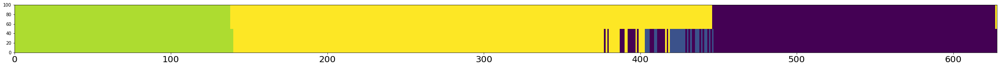

A,P,R:  0.910828025477707 0.8502673796791443 0.9968652037617555
Num frames:  (374, 55)
Accuracy:  0.910828025477707
Person:  411
Transitions:  [5, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


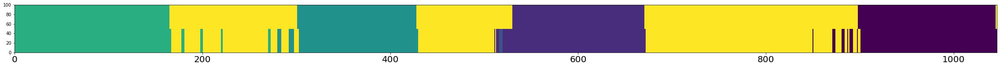

A,P,R:  0.9397705544933078 0.9083728278041074 0.9913793103448276
Num frames:  (633, 58)
Accuracy:  0.9397705544933078
Person:  412
Transitions:  [1, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


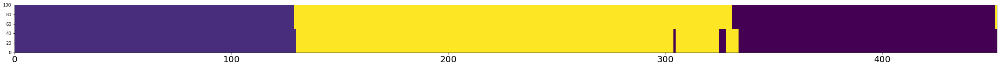

A,P,R:  0.9801324503311258 0.9762845849802372 0.988
Num frames:  (253, 6)
Accuracy:  0.9801324503311258
Person:  413
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



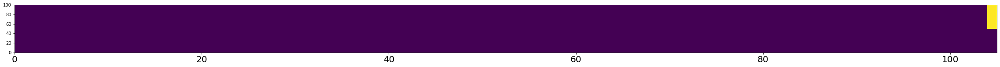

A,P,R:  0.9904761904761905 0.9904761904761905 1.0
Num frames:  (105, 1)
Accuracy:  0.9904761904761905
Person:  414
Transitions:  [5, 8, 6, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  4
Transitions captured:  2


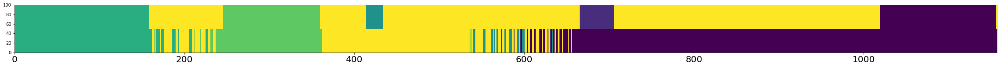

A,P,R:  0.581676750216076 0.46849942726231386 0.8720682302771855
Num frames:  (873, 424)
Accuracy:  0.581676750216076
Person:  415
Transitions:  [6, 8, 7, 8]
GT transitions:  1
Transitions captured:  0


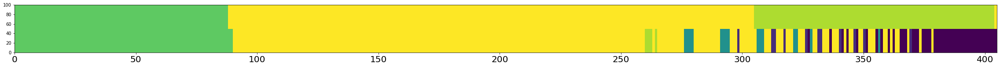

A,P,R:  0.7160493827160493 0.5301204819277109 0.47058823529411764
Num frames:  (166, 16)
Accuracy:  0.7160493827160493
Person:  416
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


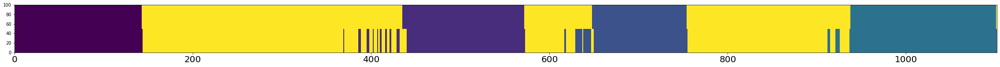

A,P,R:  0.9482758620689655 0.9155405405405406 0.9872495446265938
Num frames:  (592, 50)
Accuracy:  0.9482758620689655
Person:  417
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



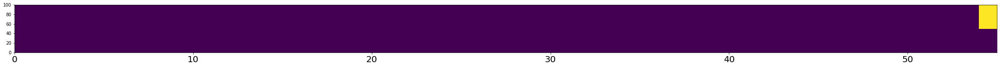

A,P,R:  0.9818181818181818 0.9818181818181818 1.0
Num frames:  (55, 1)
Accuracy:  0.9818181818181818
Person:  418
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  1


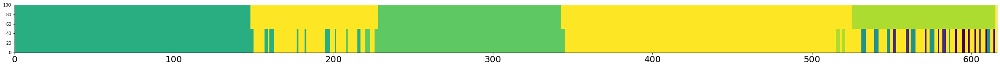

A,P,R:  0.8084415584415584 0.8117283950617284 0.7450424929178471
Num frames:  (324, 28)
Accuracy:  0.8084415584415584
Person:  419
Transitions:  [6, 8, 5, 8]
GT transitions:  1
Transitions captured:  1


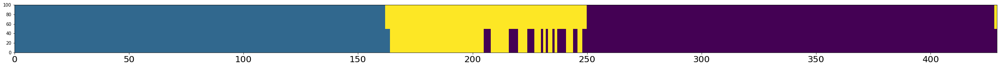

A,P,R:  0.9440559440559441 0.9340659340659341 1.0
Num frames:  (364, 24)
Accuracy:  0.9440559440559441
Person:  420
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  0


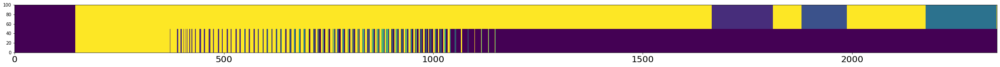

A,P,R:  0.3150042625745951 0.08276255707762557 0.25528169014084506
Num frames:  (1752, 1184)
Accuracy:  0.3150042625745951
Person:  421
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


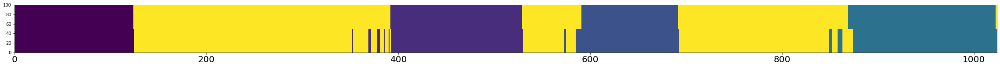

A,P,R:  0.9658203125 0.9461966604823747 0.9883720930232558
Num frames:  (539, 29)
Accuracy:  0.9658203125
Person:  422
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


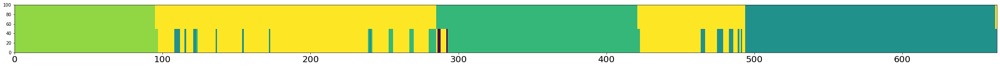

A,P,R:  0.9246987951807228 0.897025171624714 0.98
Num frames:  (437, 42)
Accuracy:  0.9246987951807228
Person:  423
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



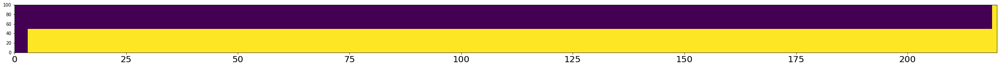

A,P,R:  0.01818181818181818 1.0 0.0136986301369863
Num frames:  (3, 0)
Accuracy:  0.01818181818181818
Person:  424
Transitions:  [3, 8, 2, 8, 4, 8, 4, 8, 2, 8]
GT transitions:  4
Transitions captured:  3


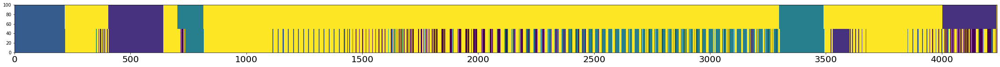

A,P,R:  0.655497876356772 0.35024390243902437 0.7237903225806451
Num frames:  (2050, 1186)
Accuracy:  0.655497876356772
Person:  425
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


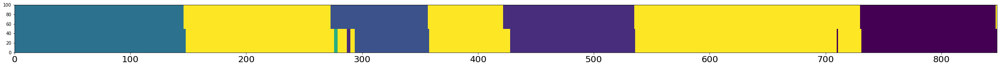

A,P,R:  0.9599056603773585 0.972972972972973 0.9391304347826087
Num frames:  (444, 6)
Accuracy:  0.9599056603773585
Person:  426
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


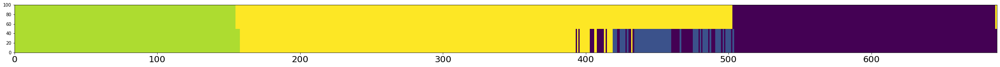

A,P,R:  0.8561046511627907 0.7734553775743707 0.9970501474926253
Num frames:  (437, 98)
Accuracy:  0.8561046511627907
Person:  427
Transitions:  [1, 8, 2, 8, 3, 8]
GT transitions:  2
Transitions captured:  2


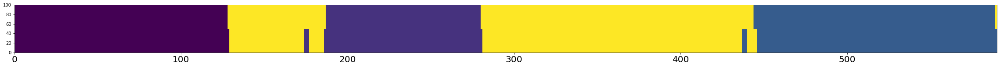

A,P,R:  0.9796610169491525 0.9732620320855615 0.994535519125683
Num frames:  (374, 10)
Accuracy:  0.9796610169491525
Person:  428
Transitions:  [6, 8, 4, 8, 2, 8]
GT transitions:  2
Transitions captured:  2


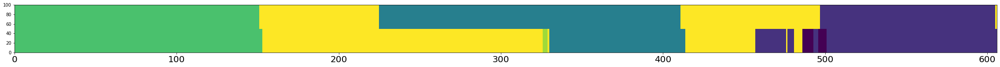

A,P,R:  0.7541254125412541 0.8772845953002611 0.755056179775281
Num frames:  (383, 40)
Accuracy:  0.7541254125412541
Person:  429
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


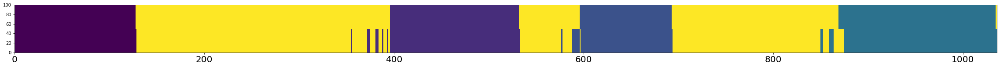

A,P,R:  0.9633204633204633 0.9437386569872959 0.9867172675521821
Num frames:  (551, 31)
Accuracy:  0.9633204633204633
Person:  430
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


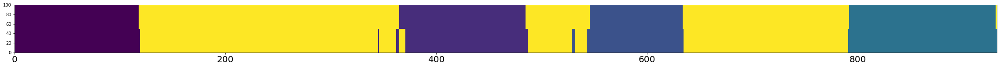

A,P,R:  0.9763948497854077 0.9663157894736842 0.9870967741935484
Num frames:  (475, 16)
Accuracy:  0.9763948497854077
Person:  431
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



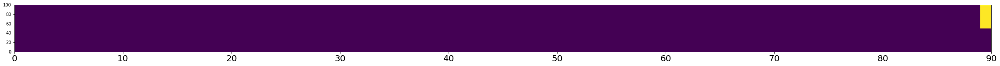

A,P,R:  0.9888888888888889 0.9888888888888889 1.0
Num frames:  (90, 1)
Accuracy:  0.9888888888888889
Person:  432
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



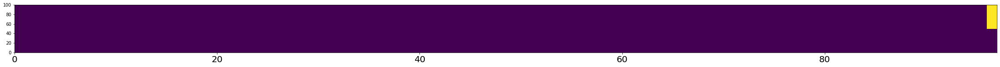

A,P,R:  0.9896907216494846 0.9896907216494846 1.0
Num frames:  (97, 1)
Accuracy:  0.9896907216494846
Person:  433
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


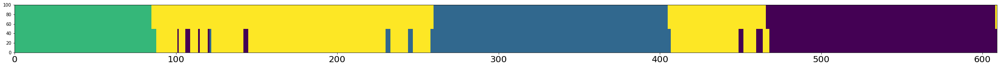

A,P,R:  0.9458128078817734 0.9226932668329177 0.9946236559139785
Num frames:  (401, 31)
Accuracy:  0.9458128078817734
Person:  434
Transitions:  [1, 8, 2, 8, 4, 8, 4, 8, 4, 8, 4, 8, 3, 8]
GT transitions:  6
Transitions captured:  4


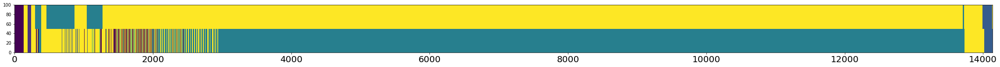

A,P,R:  0.1157872400622436 0.028855559178350178 0.33270676691729323
Num frames:  (12268, 11791)
Accuracy:  0.1157872400622436
Person:  435
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


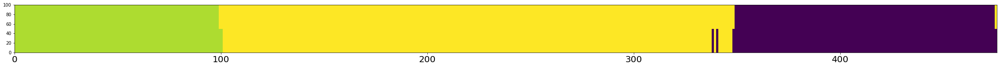

A,P,R:  0.9873949579831933 0.974025974025974 1.0
Num frames:  (231, 6)
Accuracy:  0.9873949579831933
Person:  436
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



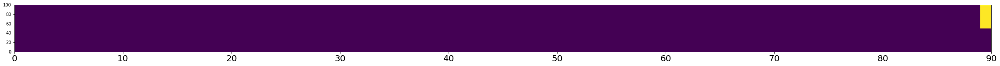

A,P,R:  0.9888888888888889 0.9888888888888889 1.0
Num frames:  (90, 1)
Accuracy:  0.9888888888888889
Person:  437
Transitions:  [6, 8, 5, 8, 5, 8, 6, 8, 6, 8, 5, 8, 5, 8, 6, 8, 6, 8, 6, 8, 4, 8]
GT transitions:  10
Transitions captured:  1


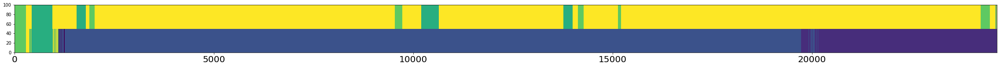

A,P,R:  0.04029541857728361 0.03347229033840118 0.32333201737070666
Num frames:  (24468, 21936)
Accuracy:  0.04029541857728361
Person:  438
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


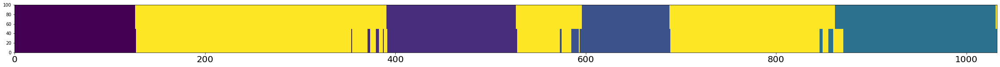

A,P,R:  0.9593023255813954 0.9413919413919414 0.9809160305343512
Num frames:  (546, 32)
Accuracy:  0.9593023255813954
Person:  439
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



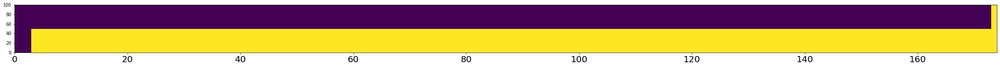

A,P,R:  0.022988505747126436 1.0 0.017341040462427744
Num frames:  (3, 0)
Accuracy:  0.022988505747126436
Person:  440
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


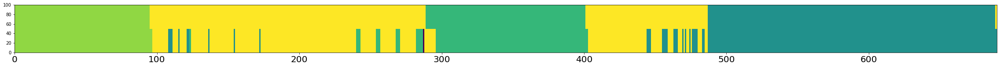

A,P,R:  0.9188405797101449 0.8913525498891353 0.9828850855745721
Num frames:  (451, 49)
Accuracy:  0.9188405797101449
Person:  441
Transitions:  [0, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


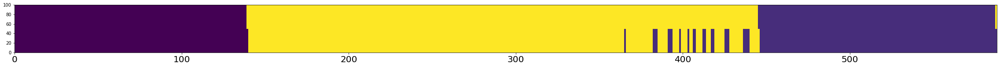

A,P,R:  0.9574829931972789 0.9210526315789473 0.99644128113879
Num frames:  (304, 24)
Accuracy:  0.9574829931972789
Person:  442
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


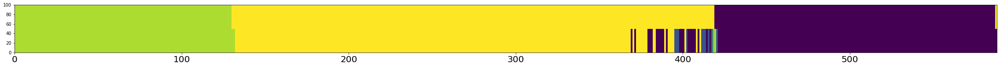

A,P,R:  0.9370748299319728 0.8888888888888888 0.9932885906040269
Num frames:  (333, 35)
Accuracy:  0.9370748299319728
Person:  443
Transitions:  [0, 8, 1, 8, 4, 8, 4, 8, 4, 8, 6, 8]
GT transitions:  5
Transitions captured:  2


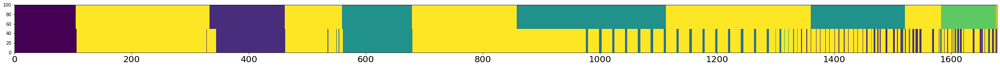

A,P,R:  0.6442193087008343 0.6706114398422091 0.3939745075318656
Num frames:  (507, 74)
Accuracy:  0.6442193087008343
Person:  444
Transitions:  [5, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


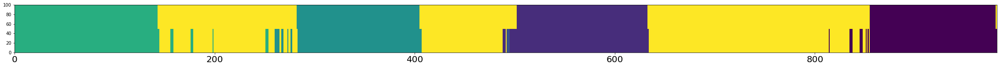

A,P,R:  0.9501018329938901 0.9157894736842105 0.9980879541108987
Num frames:  (570, 48)
Accuracy:  0.9501018329938901
Person:  445
Transitions:  [0, 8, 4, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


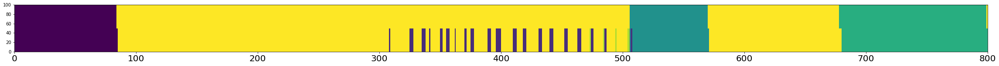

A,P,R:  0.925 0.8204334365325078 0.9851301115241635
Num frames:  (323, 56)
Accuracy:  0.925
Person:  446
Transitions:  [1, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


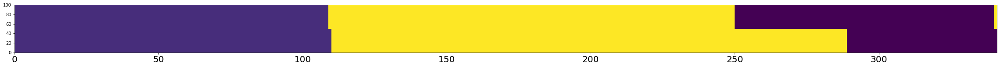

A,P,R:  0.8797653958944281 0.9876543209876543 0.8040201005025126
Num frames:  (162, 2)
Accuracy:  0.8797653958944281
Person:  447
Transitions:  [5, 8, 6, 8, 7, 8, 0, 8]
GT transitions:  3
Transitions captured:  2


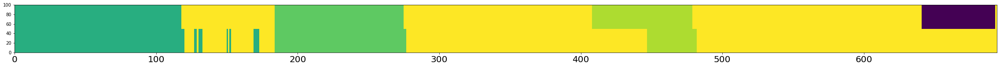

A,P,R:  0.8429394812680115 0.9305019305019305 0.7259036144578314
Num frames:  (259, 18)
Accuracy:  0.8429394812680115
Person:  448
Transitions:  [3, 8, 2, 8, 1, 8]
GT transitions:  2
Transitions captured:  2


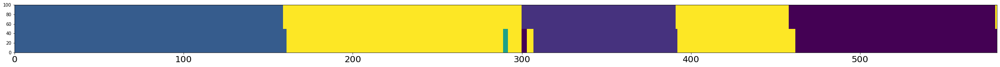

A,P,R:  0.9690189328743546 0.9730458221024259 0.9704301075268817
Num frames:  (371, 7)
Accuracy:  0.9690189328743546
Person:  449
Transitions:  [5, 8, 6, 8, 4, 8, 3, 8]
GT transitions:  3
Transitions captured:  1


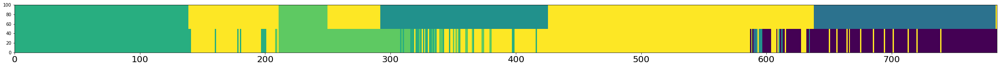

A,P,R:  0.5242346938775511 0.3811563169164882 0.38949671772428884
Num frames:  (467, 94)
Accuracy:  0.5242346938775511
Person:  450
Transitions:  [0, 8, 1, 8, 4, 8, 5, 8]
GT transitions:  3
Transitions captured:  3


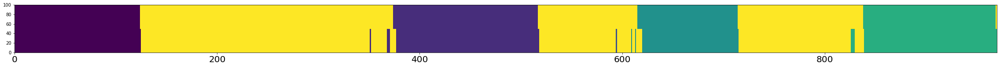

A,P,R:  0.9752577319587629 0.9701789264413518 0.9818913480885312
Num frames:  (503, 15)
Accuracy:  0.9752577319587629
Person:  451
Transitions:  [0, 8, 7, 8]
GT transitions:  1
Transitions captured:  1


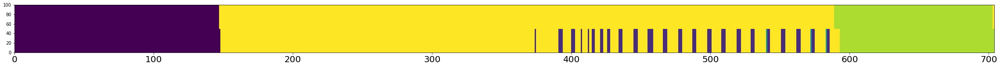

A,P,R:  0.9048295454545454 0.803125 0.9846743295019157
Num frames:  (320, 63)
Accuracy:  0.9048295454545454
Person:  452
Transitions:  [1, 8, 4, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


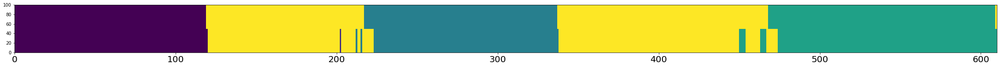

A,P,R:  0.9573770491803278 0.9633507853403142 0.968421052631579
Num frames:  (382, 14)
Accuracy:  0.9573770491803278
Person:  453
Transitions:  [0, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


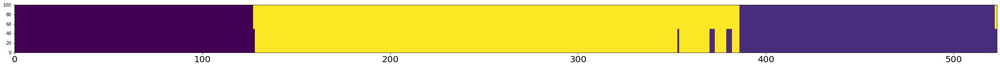

A,P,R:  0.982791586998088 0.9669117647058824 1.0
Num frames:  (272, 9)
Accuracy:  0.982791586998088
Person:  454
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


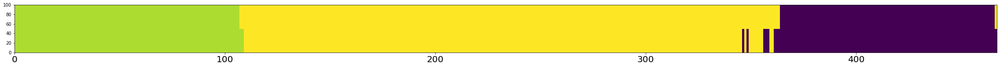

A,P,R:  0.9764453961456103 0.95 1.0
Num frames:  (220, 11)
Accuracy:  0.9764453961456103
Person:  455
Transitions:  [0, 8, 4, 8, 6, 8, 5, 8]
GT transitions:  3
Transitions captured:  3


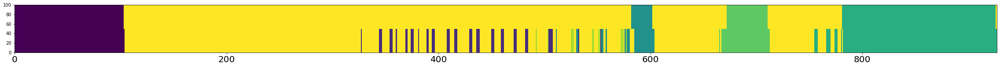

A,P,R:  0.8932038834951457 0.7613065326633166 0.9869706840390879
Num frames:  (398, 95)
Accuracy:  0.8932038834951457
Person:  456
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



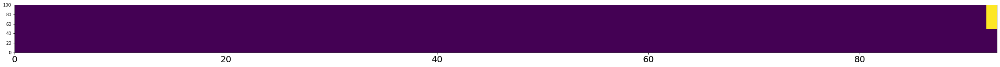

A,P,R:  0.989247311827957 0.989247311827957 1.0
Num frames:  (93, 1)
Accuracy:  0.989247311827957
Person:  457
Transitions:  [0, 8, 1, 8, 4, 8, 5, 8]
GT transitions:  3
Transitions captured:  3


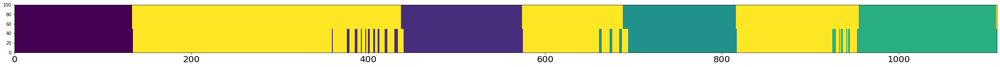

A,P,R:  0.9495949594959496 0.9204737732656514 0.9837251356238698
Num frames:  (591, 47)
Accuracy:  0.9495949594959496
Person:  458
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


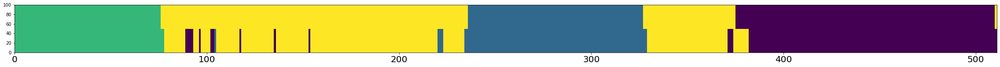

A,P,R:  0.9393346379647749 0.9247648902821317 0.9768211920529801
Num frames:  (319, 24)
Accuracy:  0.9393346379647749
Person:  459
Transitions:  [5, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


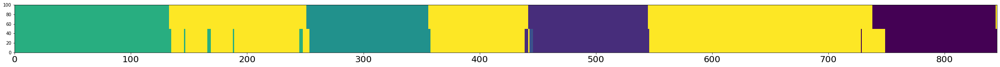

A,P,R:  0.9573964497041421 0.9533333333333334 0.959731543624161
Num frames:  (450, 18)
Accuracy:  0.9573964497041421
Person:  460
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



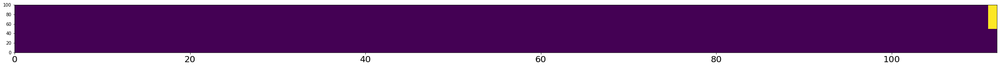

A,P,R:  0.9910714285714286 0.9910714285714286 1.0
Num frames:  (112, 1)
Accuracy:  0.9910714285714286
Person:  461
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  2


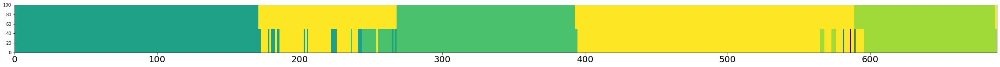

A,P,R:  0.9143686502177069 0.8798185941043084 0.9822784810126582
Num frames:  (441, 52)
Accuracy:  0.9143686502177069
Person:  462
Transitions:  [0, 8, 1, 8, 2, 8]
GT transitions:  2
Transitions captured:  2


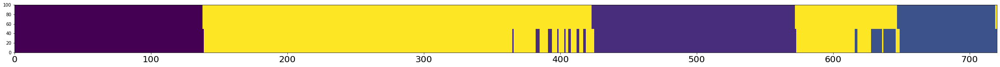

A,P,R:  0.9430555555555555 0.9056122448979592 0.9888579387186629
Num frames:  (392, 37)
Accuracy:  0.9430555555555555
Person:  463
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


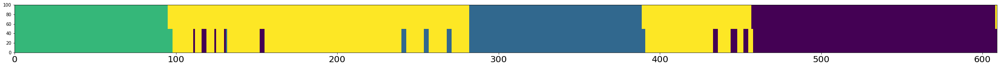

A,P,R:  0.9408866995073891 0.9095607235142119 0.9971671388101983
Num frames:  (387, 35)
Accuracy:  0.9408866995073891
Person:  464
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


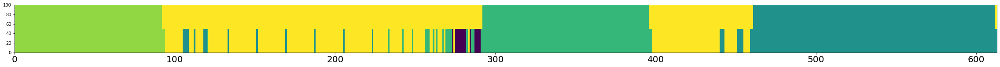

A,P,R:  0.9053833605220228 0.8567901234567902 1.0
Num frames:  (405, 58)
Accuracy:  0.9053833605220228
Person:  465
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  2


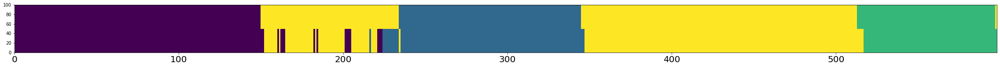

A,P,R:  0.9431438127090301 0.9214092140921409 0.9855072463768116
Num frames:  (369, 29)
Accuracy:  0.9431438127090301
Person:  466
Transitions:  [5, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


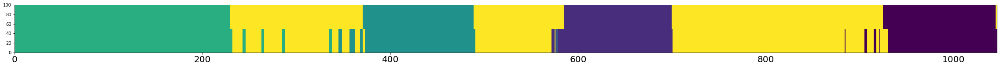

A,P,R:  0.9445506692160612 0.9186602870813397 0.9879931389365352
Num frames:  (627, 51)
Accuracy:  0.9445506692160612
Person:  467
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



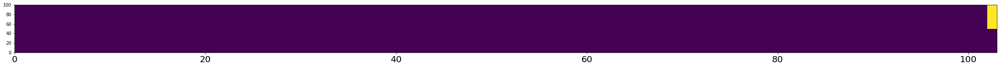

A,P,R:  0.9902912621359223 0.9902912621359223 1.0
Num frames:  (103, 1)
Accuracy:  0.9902912621359223
Person:  468
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  1


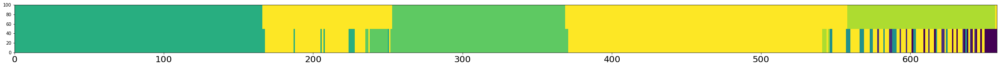

A,P,R:  0.7963525835866262 0.7811634349030471 0.7401574803149606
Num frames:  (361, 35)
Accuracy:  0.7963525835866262
Person:  469
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


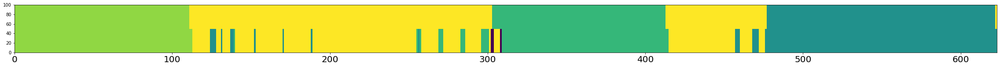

A,P,R:  0.92776886035313 0.8977556109725686 0.9836065573770492
Num frames:  (401, 39)
Accuracy:  0.92776886035313
Person:  470
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  1


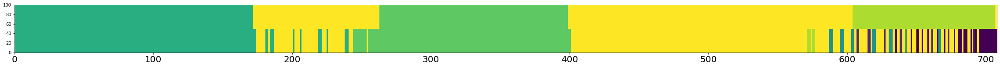

A,P,R:  0.7853107344632768 0.7567567567567568 0.7493917274939172
Num frames:  (407, 49)
Accuracy:  0.7853107344632768
Person:  471
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



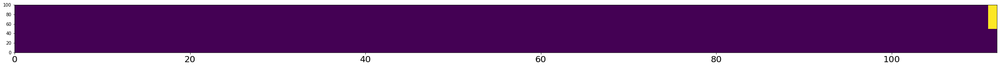

A,P,R:  0.9910714285714286 0.9910714285714286 1.0
Num frames:  (112, 1)
Accuracy:  0.9910714285714286
Person:  472
Transitions:  [0, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


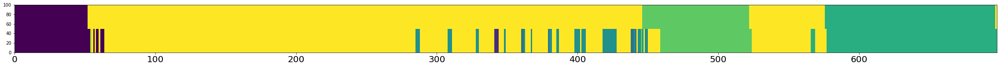

A,P,R:  0.8939828080229226 0.7885906040268457 0.9437751004016064
Num frames:  (298, 60)
Accuracy:  0.8939828080229226
Person:  473
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


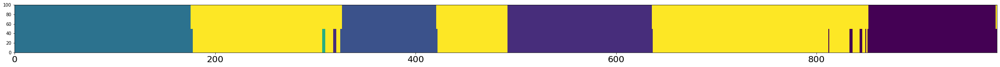

A,P,R:  0.9775510204081632 0.9609236234458259 1.0
Num frames:  (563, 22)
Accuracy:  0.9775510204081632
Person:  474
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


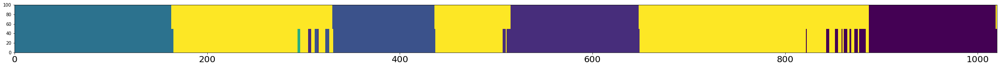

A,P,R:  0.9490196078431372 0.9126712328767124 0.99812734082397
Num frames:  (584, 51)
Accuracy:  0.9490196078431372
Person:  475
Transitions:  [1, 8, 7, 8]
GT transitions:  1
Transitions captured:  0


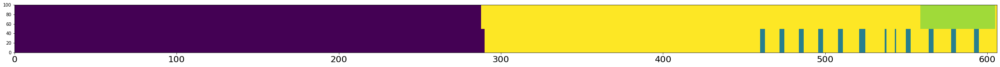

A,P,R:  0.8811881188118812 0.891640866873065 0.8622754491017964
Num frames:  (323, 26)
Accuracy:  0.8811881188118812
Person:  476
Transitions:  [5, 8, 6, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  4
Transitions captured:  2


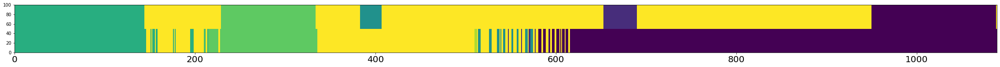

A,P,R:  0.5950413223140496 0.48134328358208955 0.8638392857142857
Num frames:  (804, 380)
Accuracy:  0.5950413223140496
Person:  477
Transitions:  [0, 8, 1, 8, 4, 8, 5, 8]
GT transitions:  3
Transitions captured:  3


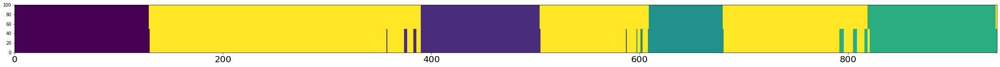

A,P,R:  0.9692470837751855 0.9415584415584416 0.9954233409610984
Num frames:  (462, 27)
Accuracy:  0.9692470837751855
Person:  478
Transitions:  [5, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


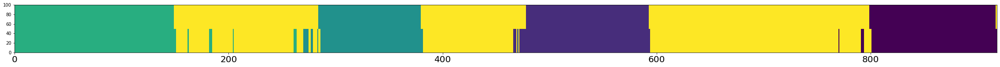

A,P,R:  0.9564270152505446 0.9294117647058824 0.9916317991631799
Num frames:  (510, 36)
Accuracy:  0.9564270152505446
Person:  479
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


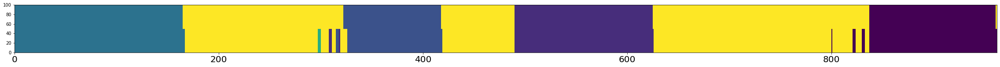

A,P,R:  0.972972972972973 0.9591078066914498 0.9923076923076923
Num frames:  (538, 22)
Accuracy:  0.972972972972973
Person:  480
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  2


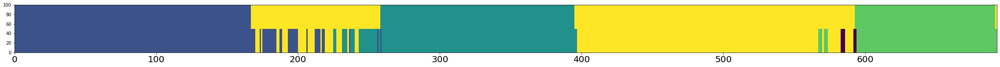

A,P,R:  0.898989898989899 0.851380042462845 0.9950372208436724
Num frames:  (471, 68)
Accuracy:  0.898989898989899
Person:  481
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  2


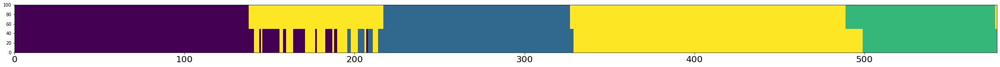

A,P,R:  0.903114186851211 0.8763440860215054 0.9702380952380952
Num frames:  (372, 46)
Accuracy:  0.903114186851211
Person:  482
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



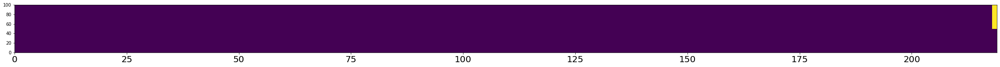

A,P,R:  0.9954337899543378 0.9954337899543378 1.0
Num frames:  (219, 1)
Accuracy:  0.9954337899543378
Person:  483
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


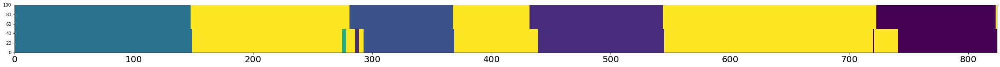

A,P,R:  0.9453883495145631 0.9738717339667459 0.9172259507829977
Num frames:  (421, 8)
Accuracy:  0.9453883495145631
Person:  484
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



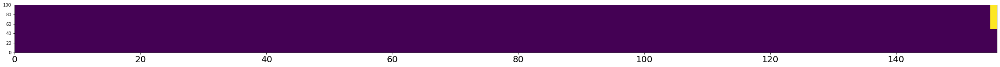

A,P,R:  0.9935897435897436 0.9935897435897436 1.0
Num frames:  (156, 1)
Accuracy:  0.9935897435897436
Person:  485
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  2


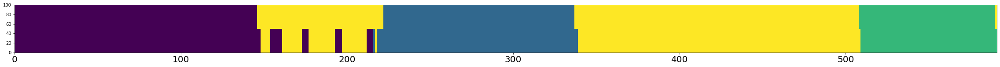

A,P,R:  0.949238578680203 0.921832884097035 0.9970845481049563
Num frames:  (371, 29)
Accuracy:  0.949238578680203
Person:  486
Transitions:  [0, 8, 1, 8, 4, 8, 5, 8]
GT transitions:  3
Transitions captured:  3


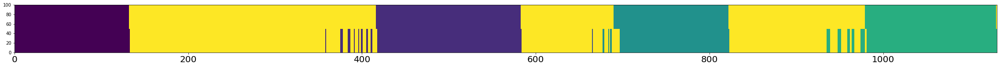

A,P,R:  0.9513704686118479 0.9284552845528455 0.9810996563573883
Num frames:  (615, 44)
Accuracy:  0.9513704686118479
Person:  487
Transitions:  [1, 8]
GT transitions:  0
Transitions captured:  0



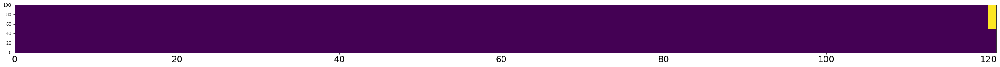

A,P,R:  0.9917355371900827 0.9917355371900827 1.0
Num frames:  (121, 1)
Accuracy:  0.9917355371900827
Person:  488
Transitions:  [1, 8, 2, 8, 3, 8]
GT transitions:  2
Transitions captured:  2


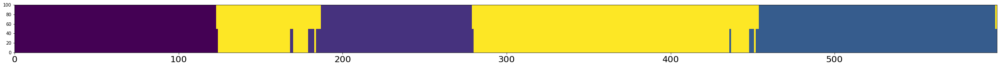

A,P,R:  0.9699499165275459 0.9522546419098143 1.0
Num frames:  (377, 18)
Accuracy:  0.9699499165275459
Person:  489
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  2


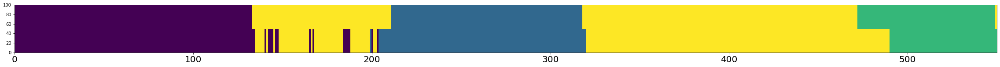

A,P,R:  0.9181818181818182 0.9171779141104295 0.943217665615142
Num frames:  (326, 27)
Accuracy:  0.9181818181818182
Person:  490
Transitions:  [5, 8, 6, 8]
GT transitions:  1
Transitions captured:  1


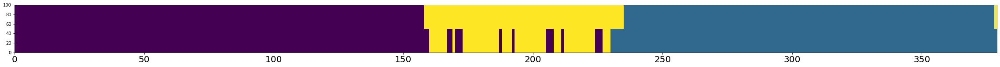

A,P,R:  0.941952506596306 0.9318885448916409 1.0
Num frames:  (323, 22)
Accuracy:  0.941952506596306
Person:  491
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



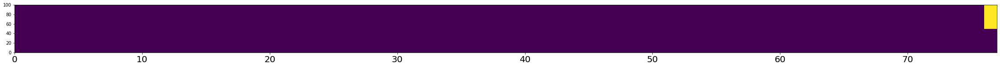

A,P,R:  0.987012987012987 0.987012987012987 1.0
Num frames:  (77, 1)
Accuracy:  0.987012987012987
Person:  492
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


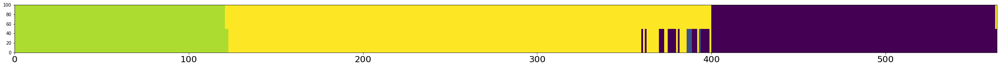

A,P,R:  0.9539007092198581 0.9161290322580645 1.0
Num frames:  (310, 26)
Accuracy:  0.9539007092198581
Person:  493
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


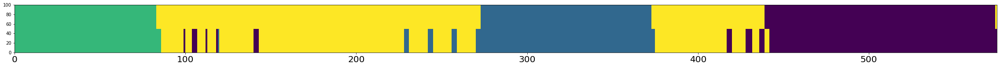

A,P,R:  0.928695652173913 0.8923512747875354 0.9905660377358491
Num frames:  (353, 38)
Accuracy:  0.928695652173913
Person:  494
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  2


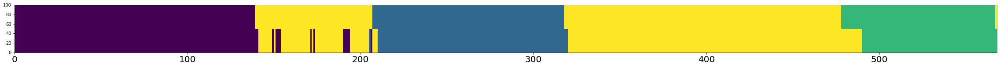

A,P,R:  0.9436619718309859 0.9501466275659824 0.9557522123893806
Num frames:  (341, 17)
Accuracy:  0.9436619718309859
Person:  495
Transitions:  [0, 8, 1, 8, 4, 8, 6, 8, 5, 8]
GT transitions:  4
Transitions captured:  2


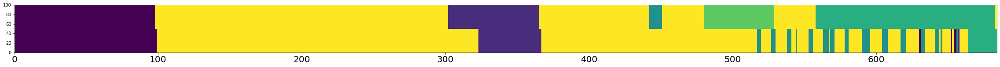

A,P,R:  0.7119883040935673 0.7464788732394366 0.4622093023255814
Num frames:  (213, 12)
Accuracy:  0.7119883040935673
Person:  496
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  2


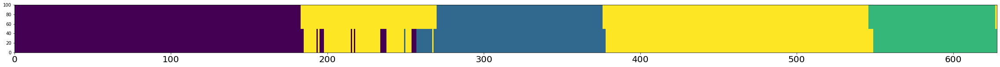

A,P,R:  0.945859872611465 0.9221105527638191 0.9918918918918919
Num frames:  (398, 31)
Accuracy:  0.945859872611465
Person:  497
Transitions:  [5, 8, 4, 8, 1, 8, 4, 8, 5, 8, 5, 8, 6, 8]
GT transitions:  6
Transitions captured:  4


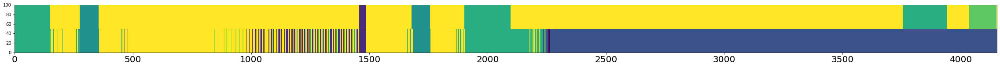

A,P,R:  0.43438478208523956 0.18283321702721564 0.6267942583732058
Num frames:  (2866, 2037)
Accuracy:  0.43438478208523956
Person:  498
Transitions:  [3, 8, 2, 8, 1, 8]
GT transitions:  2
Transitions captured:  2


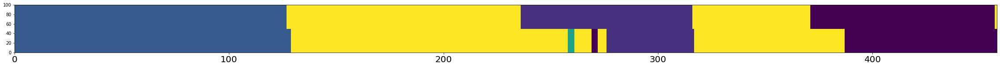

A,P,R:  0.868995633187773 0.9595141700404858 0.8088737201365188
Num frames:  (247, 4)
Accuracy:  0.868995633187773
Person:  499
Transitions:  [5, 8, 4, 8, 2, 8, 1, 8]
GT transitions:  3
Transitions captured:  3


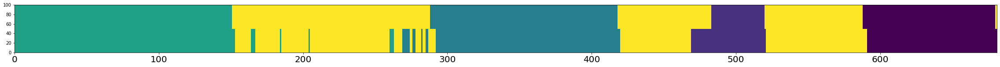

A,P,R:  0.933920704845815 0.9138321995464853 0.9829268292682927
Num frames:  (441, 38)
Accuracy:  0.933920704845815
Person:  500
Transitions:  [2, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


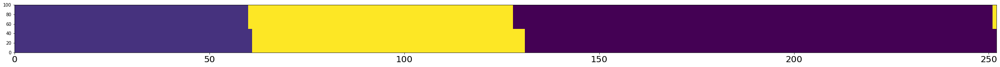

A,P,R:  0.9801587301587301 0.989010989010989 0.9836065573770492
Num frames:  (182, 2)
Accuracy:  0.9801587301587301
Person:  501
Transitions:  [1, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


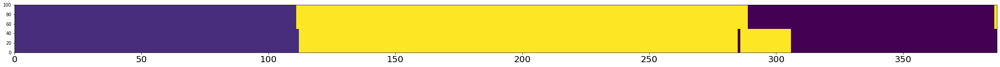

A,P,R:  0.9483204134366925 0.9845360824742269 0.9182692307692307
Num frames:  (194, 3)
Accuracy:  0.9483204134366925
Person:  502
Transitions:  [0, 8, 1, 8, 4, 8, 5, 8]
GT transitions:  3
Transitions captured:  3


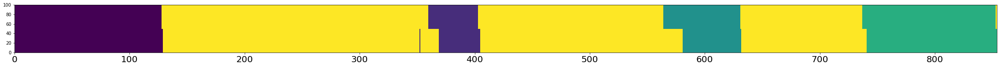

A,P,R:  0.9578454332552693 0.9818181818181818 0.9152542372881356
Num frames:  (330, 6)
Accuracy:  0.9578454332552693
Person:  503
Transitions:  [0, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


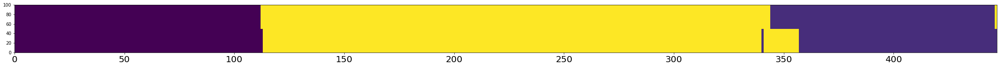

A,P,R:  0.9642058165548099 0.9852941176470589 0.9392523364485982
Num frames:  (204, 3)
Accuracy:  0.9642058165548099
Person:  504
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



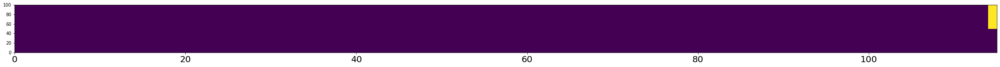

A,P,R:  0.991304347826087 0.991304347826087 1.0
Num frames:  (115, 1)
Accuracy:  0.991304347826087
Person:  505
Transitions:  [5, 8, 4, 8, 1, 8]
GT transitions:  2
Transitions captured:  2


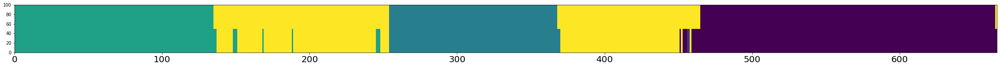

A,P,R:  0.9624624624624625 0.9472573839662447 1.0
Num frames:  (474, 25)
Accuracy:  0.9624624624624625
Person:  506
Transitions:  [5, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


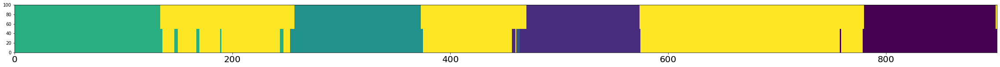

A,P,R:  0.9623059866962306 0.9332023575638507 1.0
Num frames:  (509, 34)
Accuracy:  0.9623059866962306
Person:  507
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



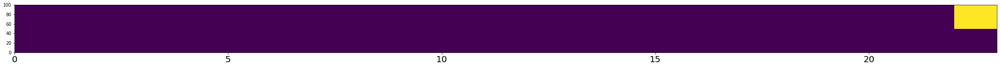

A,P,R:  0.9565217391304348 0.9565217391304348 1.0
Num frames:  (23, 1)
Accuracy:  0.9565217391304348
Person:  508
Transitions:  [5, 8]
GT transitions:  0
Transitions captured:  0



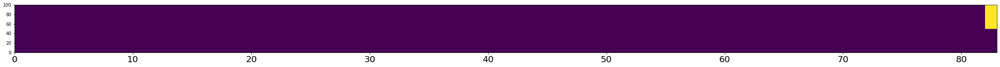

A,P,R:  0.9879518072289156 0.9879518072289156 1.0
Num frames:  (83, 1)
Accuracy:  0.9879518072289156
Person:  509
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



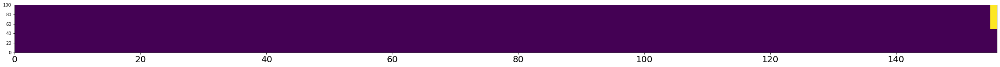

A,P,R:  0.9935897435897436 0.9935897435897436 1.0
Num frames:  (156, 1)
Accuracy:  0.9935897435897436
Person:  510
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


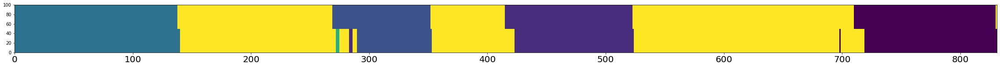

A,P,R:  0.9470517448856799 0.9716312056737588 0.9153674832962138
Num frames:  (423, 6)
Accuracy:  0.9470517448856799
Person:  511
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



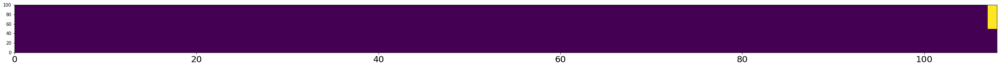

A,P,R:  0.9907407407407407 0.9907407407407407 1.0
Num frames:  (108, 1)
Accuracy:  0.9907407407407407
Person:  512
Transitions:  [7, 8, 7, 8, 7, 8]
GT transitions:  2
Transitions captured:  0


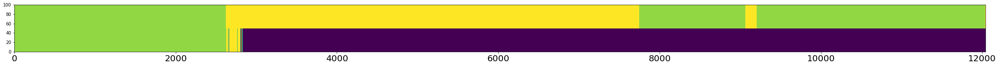

A,P,R:  0.2306925759840558 0.2208578637510513 0.3874870886823078
Num frames:  (11890, 5113)
Accuracy:  0.2306925759840558
Person:  513
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



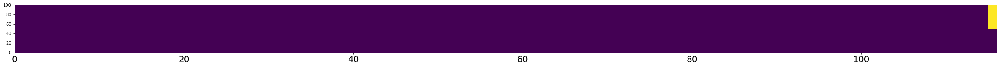

A,P,R:  0.9913793103448276 0.9913793103448276 1.0
Num frames:  (116, 1)
Accuracy:  0.9913793103448276
Person:  514
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



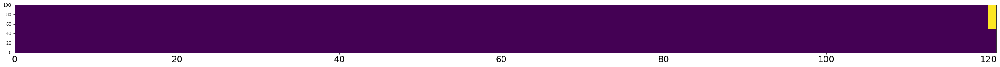

A,P,R:  0.9917355371900827 0.9917355371900827 1.0
Num frames:  (121, 1)
Accuracy:  0.9917355371900827
Person:  515
Transitions:  [3, 8, 2, 8, 1, 8]
GT transitions:  2
Transitions captured:  2


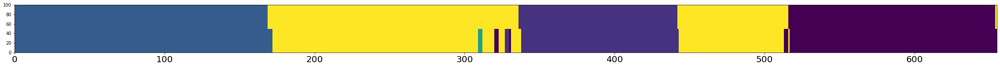

A,P,R:  0.9679389312977099 0.9579439252336449 0.9927360774818402
Num frames:  (428, 18)
Accuracy:  0.9679389312977099
Person:  516
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



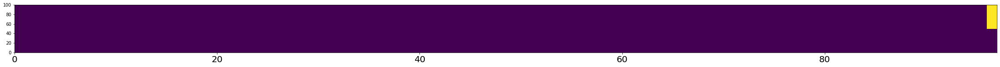

A,P,R:  0.9896907216494846 0.9896907216494846 1.0
Num frames:  (97, 1)
Accuracy:  0.9896907216494846
Person:  517
Transitions:  [0, 8, 1, 8, 4, 8, 5, 8]
GT transitions:  3
Transitions captured:  3


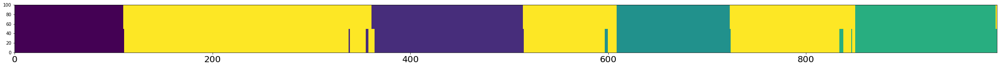

A,P,R:  0.9808660624370594 0.9699248120300752 0.9942196531791907
Num frames:  (532, 16)
Accuracy:  0.9808660624370594
Person:  518
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


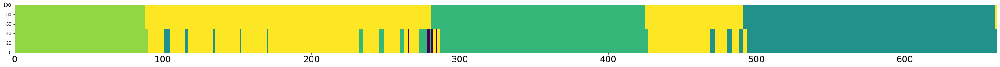

A,P,R:  0.9229607250755287 0.8993135011441648 0.9776119402985075
Num frames:  (437, 42)
Accuracy:  0.9229607250755287
Person:  519
Transitions:  [5, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


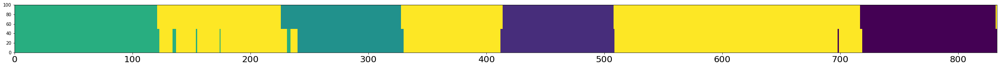

A,P,R:  0.963985594237695 0.9607390300230947 0.9629629629629629
Num frames:  (433, 14)
Accuracy:  0.963985594237695
Person:  520
Transitions:  [5, 8, 6, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  4
Transitions captured:  2


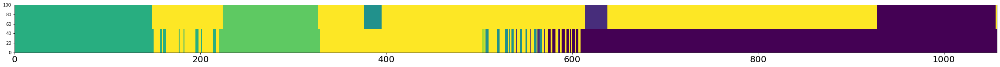

A,P,R:  0.6102175969725638 0.49093264248704666 0.8981042654028436
Num frames:  (772, 369)
Accuracy:  0.6102175969725638
Person:  521
Transitions:  [5, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


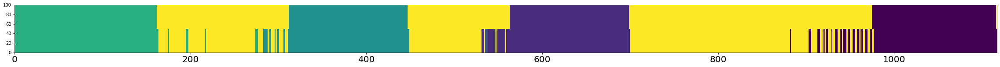

A,P,R:  0.9158460161145927 0.8614457831325302 0.9965156794425087
Num frames:  (664, 92)
Accuracy:  0.9158460161145927
Person:  522
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



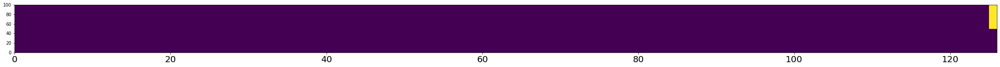

A,P,R:  0.9920634920634921 0.9920634920634921 1.0
Num frames:  (126, 1)
Accuracy:  0.9920634920634921
Person:  523
Transitions:  [5, 8, 6, 8, 7, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


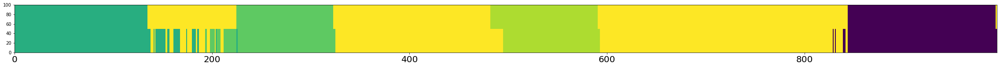

A,P,R:  0.9206030150753769 0.8786764705882353 0.9715447154471545
Num frames:  (544, 65)
Accuracy:  0.9206030150753769
Person:  524
Transitions:  [0, 8, 1, 8, 4, 8, 5, 8]
GT transitions:  3
Transitions captured:  3


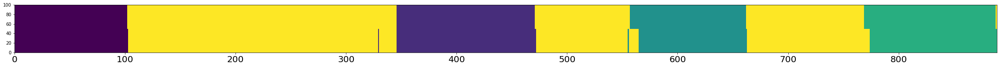

A,P,R:  0.9786276715410573 0.9864864864864865 0.9711751662971175
Num frames:  (444, 6)
Accuracy:  0.9786276715410573
Person:  525
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  0


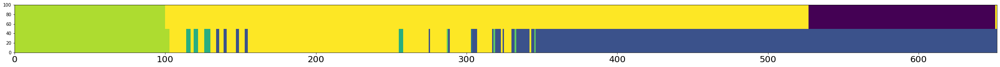

A,P,R:  0.4493865030674847 0.2178649237472767 0.44642857142857145
Num frames:  (459, 235)
Accuracy:  0.4493865030674847
Person:  526
Transitions:  [0, 8, 4, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


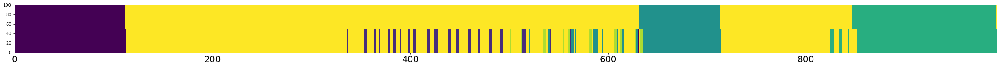

A,P,R:  0.892245720040282 0.7674418604651163 0.9734513274336283
Num frames:  (430, 98)
Accuracy:  0.892245720040282
Person:  527
Transitions:  [1, 8, 2, 8]
GT transitions:  1
Transitions captured:  1


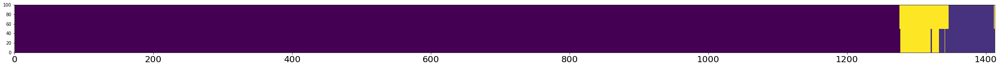

A,P,R:  0.9879688605803255 0.9874815905743741 1.0
Num frames:  (1358, 17)
Accuracy:  0.9879688605803255
Person:  528
Transitions:  [2, 8, 4, 8, 4, 8, 5, 8]
GT transitions:  3
Transitions captured:  1


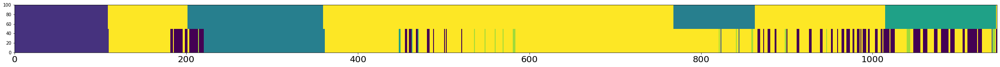

A,P,R:  0.7030567685589519 0.5688073394495413 0.505091649694501
Num frames:  (436, 97)
Accuracy:  0.7030567685589519
Person:  529
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


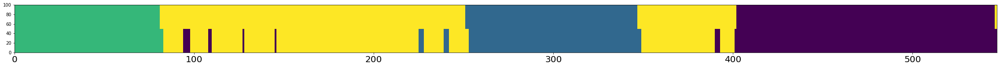

A,P,R:  0.9542961608775137 0.9327485380116959 0.9937694704049844
Num frames:  (342, 23)
Accuracy:  0.9542961608775137
Person:  530
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


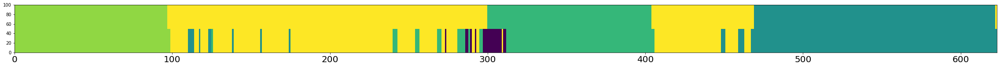

A,P,R:  0.9004815409309791 0.8486352357320099 0.9661016949152542
Num frames:  (403, 50)
Accuracy:  0.9004815409309791
Person:  531
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



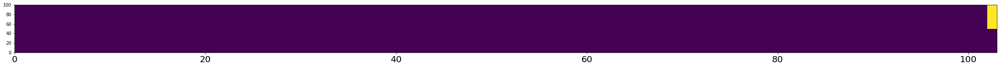

A,P,R:  0.9902912621359223 0.9902912621359223 1.0
Num frames:  (103, 1)
Accuracy:  0.9902912621359223
Person:  532
Transitions:  [5, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


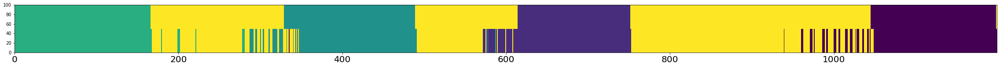

A,P,R:  0.8915763135946623 0.8403954802259888 0.9643435980551054
Num frames:  (708, 108)
Accuracy:  0.8915763135946623
Person:  533
Transitions:  [5, 8, 6, 8, 0, 8]
GT transitions:  2
Transitions captured:  2


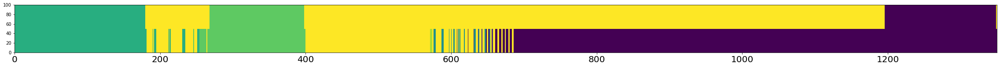

A,P,R:  0.562962962962963 0.439696106362773 1.0
Num frames:  (1053, 590)
Accuracy:  0.562962962962963
Person:  534
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



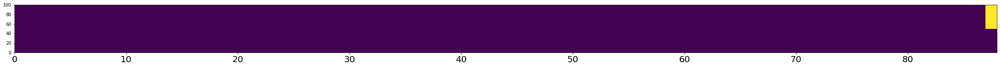

A,P,R:  0.9886363636363636 0.9886363636363636 1.0
Num frames:  (88, 1)
Accuracy:  0.9886363636363636
Person:  535
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  1


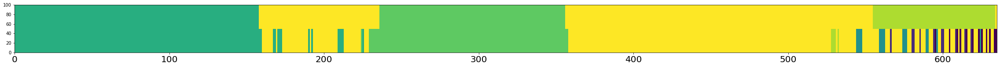

A,P,R:  0.8236220472440945 0.8104956268221575 0.7787114845938375
Num frames:  (343, 33)
Accuracy:  0.8236220472440945
Person:  536
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



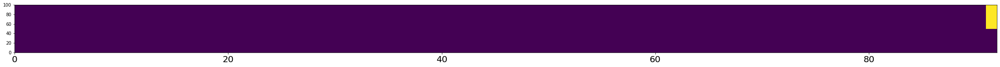

A,P,R:  0.9891304347826086 0.9891304347826086 1.0
Num frames:  (92, 1)
Accuracy:  0.9891304347826086
Person:  537
Transitions:  [5, 8, 6, 8, 4, 8, 0, 8]
GT transitions:  3
Transitions captured:  2


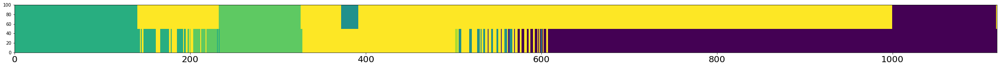

A,P,R:  0.5218945487042002 0.4046242774566474 0.9433962264150944
Num frames:  (865, 514)
Accuracy:  0.5218945487042002
Person:  538
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



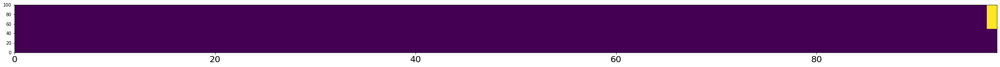

A,P,R:  0.9897959183673469 0.9897959183673469 1.0
Num frames:  (98, 1)
Accuracy:  0.9897959183673469
Person:  539
Transitions:  [5, 8, 4, 8, 0, 8]
GT transitions:  2
Transitions captured:  1


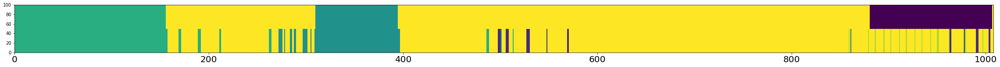

A,P,R:  0.8234126984126984 0.765079365079365 0.6566757493188011
Num frames:  (315, 52)
Accuracy:  0.8234126984126984
Person:  540
Transitions:  [0, 8, 1, 8, 4, 8, 5, 8]
GT transitions:  3
Transitions captured:  3


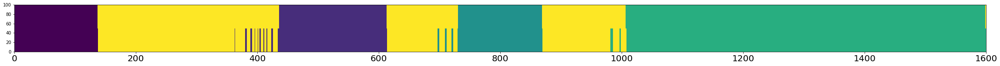

A,P,R:  0.974375 0.9630655586334257 0.9990421455938697
Num frames:  (1083, 40)
Accuracy:  0.974375
Person:  541
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  2


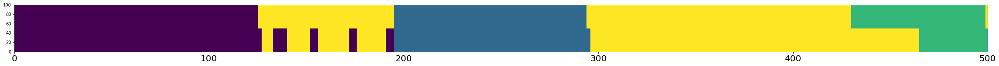

A,P,R:  0.882 0.9148936170212766 0.8805460750853242
Num frames:  (282, 24)
Accuracy:  0.882
Person:  542
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



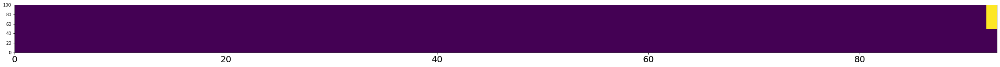

A,P,R:  0.989247311827957 0.989247311827957 1.0
Num frames:  (93, 1)
Accuracy:  0.989247311827957
Person:  543
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



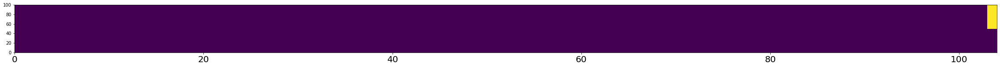

A,P,R:  0.9903846153846154 0.9903846153846154 1.0
Num frames:  (104, 1)
Accuracy:  0.9903846153846154
Person:  544
Transitions:  [1, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


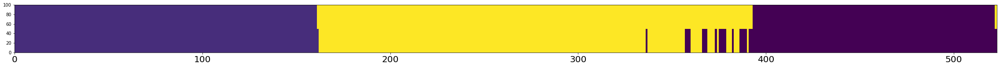

A,P,R:  0.9598470363288719 0.932475884244373 1.0
Num frames:  (311, 21)
Accuracy:  0.9598470363288719
Person:  545
Transitions:  [0, 8, 1, 8, 4, 8, 6, 8, 5, 8]
GT transitions:  4
Transitions captured:  0


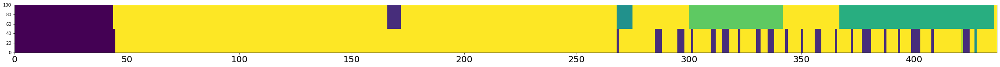

A,P,R:  0.6864988558352403 0.5057471264367817 0.2619047619047619
Num frames:  (87, 13)
Accuracy:  0.6864988558352403
Person:  546
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


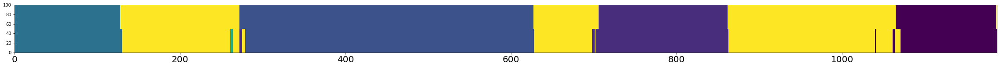

A,P,R:  0.9730412805391744 0.9713914174252276 0.9828947368421053
Num frames:  (769, 19)
Accuracy:  0.9730412805391744
Person:  547
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  2


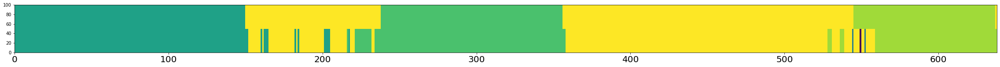

A,P,R:  0.9169278996865203 0.8940568475452196 0.9611111111111111
Num frames:  (387, 39)
Accuracy:  0.9169278996865203
Person:  548
Transitions:  [1, 8, 7, 8]
GT transitions:  1
Transitions captured:  0


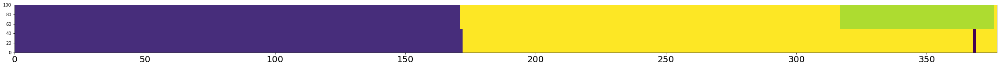

A,P,R:  0.8408488063660478 0.9884393063583815 0.7434782608695653
Num frames:  (173, 1)
Accuracy:  0.8408488063660478
Person:  549
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


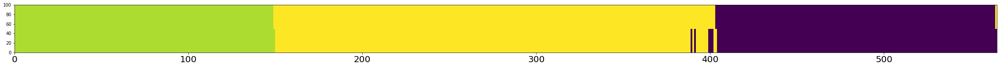

A,P,R:  0.9858407079646018 0.9778481012658228 0.9967741935483871
Num frames:  (316, 7)
Accuracy:  0.9858407079646018
Person:  550
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  1


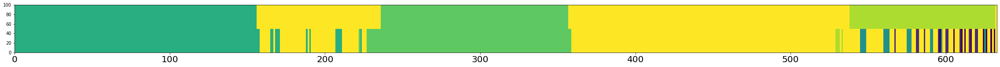

A,P,R:  0.8041074249605056 0.8099415204678363 0.7466307277628033
Num frames:  (342, 30)
Accuracy:  0.8041074249605056
Person:  551
Transitions:  [0, 8, 1, 8, 4, 8, 5, 8, 5, 8, 6, 8, 7, 8]
GT transitions:  6
Transitions captured:  3


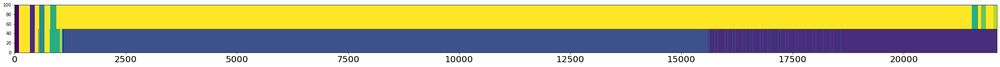

A,P,R:  0.04289980993755091 0.02174516517072268 0.5875
Num frames:  (21614, 20820)
Accuracy:  0.04289980993755091
Person:  552
Transitions:  [5, 8, 4, 8, 0, 8]
GT transitions:  2
Transitions captured:  1


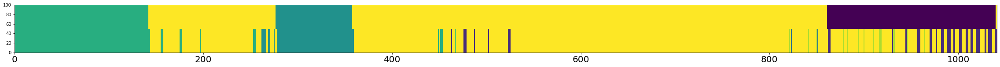

A,P,R:  0.7867435158501441 0.7003154574132492 0.5522388059701493
Num frames:  (317, 42)
Accuracy:  0.7867435158501441
Person:  553
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



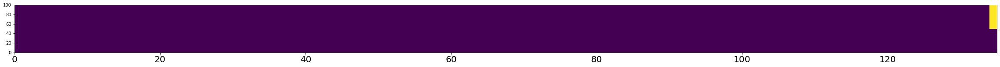

A,P,R:  0.9925925925925926 0.9925925925925926 1.0
Num frames:  (135, 1)
Accuracy:  0.9925925925925926
Person:  554
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



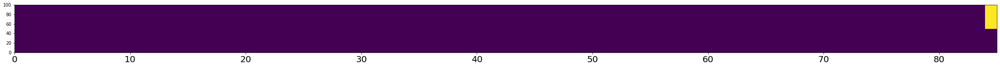

A,P,R:  0.9882352941176471 0.9882352941176471 1.0
Num frames:  (85, 1)
Accuracy:  0.9882352941176471
Person:  555
Transitions:  [0, 8]
GT transitions:  0
Transitions captured:  0



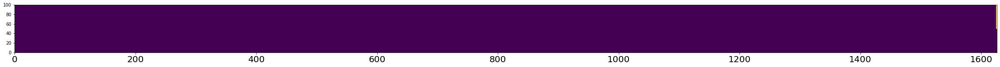

A,P,R:  0.9993849938499385 0.9993849938499385 1.0
Num frames:  (1626, 1)
Accuracy:  0.9993849938499385
Person:  556
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



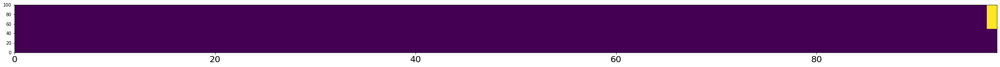

A,P,R:  0.9897959183673469 0.9897959183673469 1.0
Num frames:  (98, 1)
Accuracy:  0.9897959183673469
Person:  557
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


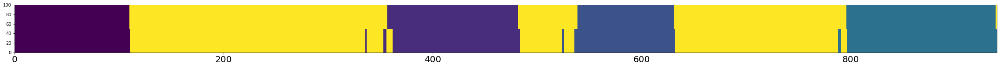

A,P,R:  0.975531914893617 0.9646569646569647 0.9872340425531915
Num frames:  (481, 17)
Accuracy:  0.975531914893617
Person:  558
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


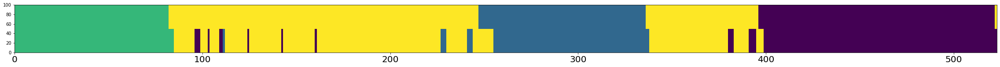

A,P,R:  0.9235181644359465 0.9079365079365079 0.9629629629629629
Num frames:  (315, 29)
Accuracy:  0.9235181644359465
Person:  559
Transitions:  [0, 8, 1, 8, 4, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  5
Transitions captured:  5


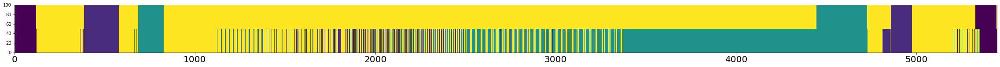

A,P,R:  0.5782225486595667 0.29320508842693144 0.9752321981424149
Num frames:  (3223, 2273)
Accuracy:  0.5782225486595667
Person:  560
Transitions:  [5, 8, 6, 8, 0, 8]
GT transitions:  2
Transitions captured:  2


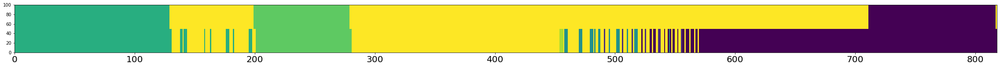

A,P,R:  0.7383863080684596 0.5961904761904762 0.9936507936507937
Num frames:  (525, 212)
Accuracy:  0.7383863080684596
Person:  561
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



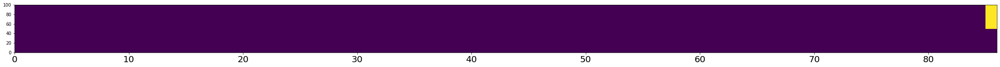

A,P,R:  0.9883720930232558 0.9883720930232558 1.0
Num frames:  (86, 1)
Accuracy:  0.9883720930232558
Person:  562
Transitions:  [1, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


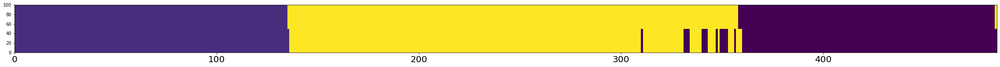

A,P,R:  0.9650205761316872 0.9454545454545454 0.9923664122137404
Num frames:  (275, 15)
Accuracy:  0.9650205761316872
Person:  563
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



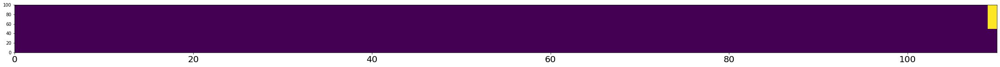

A,P,R:  0.990909090909091 0.990909090909091 1.0
Num frames:  (110, 1)
Accuracy:  0.990909090909091
Person:  564
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


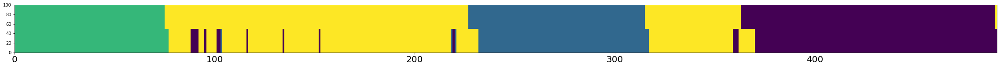

A,P,R:  0.9307535641547862 0.9266666666666666 0.9586206896551724
Num frames:  (300, 22)
Accuracy:  0.9307535641547862
Person:  565
Transitions:  [0, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


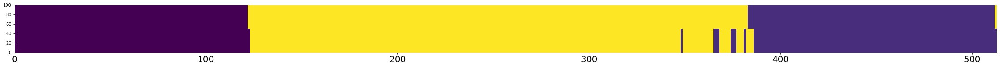

A,P,R:  0.9746588693957114 0.9612403100775194 0.9880478087649402
Num frames:  (258, 10)
Accuracy:  0.9746588693957114
Person:  566
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


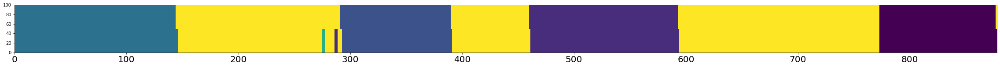

A,P,R:  0.9840546697038725 0.9774590163934426 0.99375
Num frames:  (488, 11)
Accuracy:  0.9840546697038725
Person:  567
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



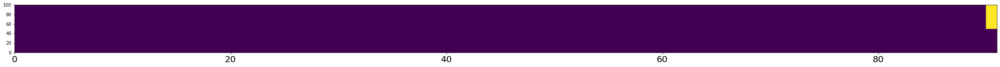

A,P,R:  0.989010989010989 0.989010989010989 1.0
Num frames:  (91, 1)
Accuracy:  0.989010989010989
Person:  568
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


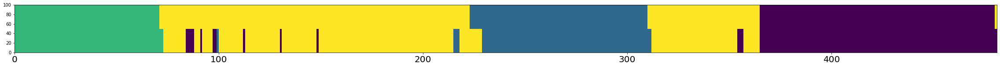

A,P,R:  0.9417879417879418 0.9238754325259516 0.978021978021978
Num frames:  (289, 22)
Accuracy:  0.9417879417879418
Person:  569
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


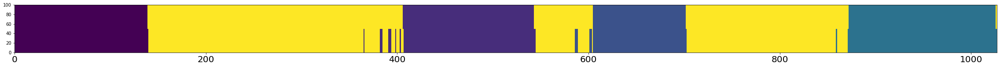

A,P,R:  0.9776046738072055 0.9598540145985401 0.9981024667931688
Num frames:  (548, 22)
Accuracy:  0.9776046738072055
Person:  570
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


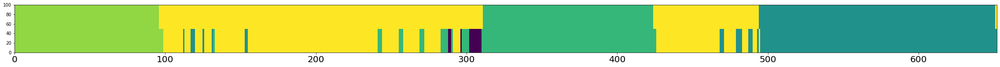

A,P,R:  0.9095092024539877 0.8628841607565012 0.9972677595628415
Num frames:  (423, 58)
Accuracy:  0.9095092024539877
Person:  571
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


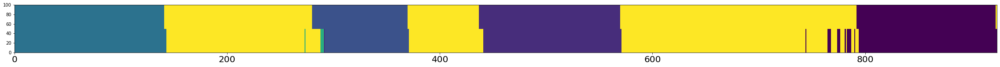

A,P,R:  0.95995670995671 0.954 0.9636363636363636
Num frames:  (500, 19)
Accuracy:  0.95995670995671
Person:  572
Transitions:  [0, 8, 1, 8, 4, 8, 5, 8]
GT transitions:  3
Transitions captured:  3


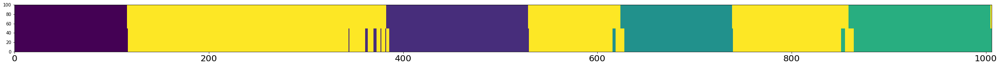

A,P,R:  0.9681908548707754 0.9623352165725048 0.9770554493307839
Num frames:  (531, 20)
Accuracy:  0.9681908548707754
Person:  573
Transitions:  [5, 8, 4, 8]
GT transitions:  1
Transitions captured:  1


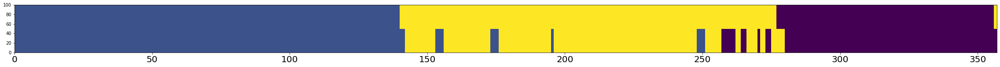

A,P,R:  0.927170868347339 0.9037656903765691 0.9863013698630136
Num frames:  (239, 23)
Accuracy:  0.927170868347339
Person:  574
Transitions:  [0, 8]
GT transitions:  0
Transitions captured:  0



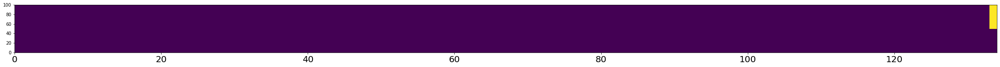

A,P,R:  0.9925373134328358 0.9925373134328358 1.0
Num frames:  (134, 1)
Accuracy:  0.9925373134328358
Person:  575
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  2


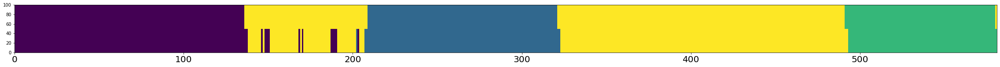

A,P,R:  0.963855421686747 0.9463276836158192 0.9940652818991098
Num frames:  (354, 19)
Accuracy:  0.963855421686747
Person:  576
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



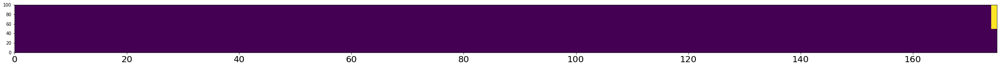

A,P,R:  0.9942857142857143 0.9942857142857143 1.0
Num frames:  (175, 1)
Accuracy:  0.9942857142857143
Person:  577
Transitions:  [1, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


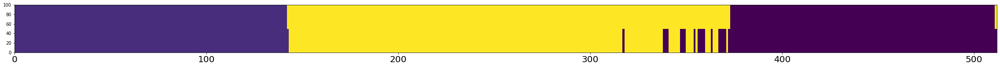

A,P,R:  0.9609375 0.9333333333333333 1.0
Num frames:  (300, 20)
Accuracy:  0.9609375
Person:  578
Transitions:  [5, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


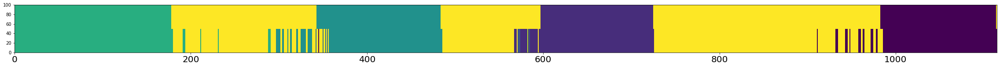

A,P,R:  0.9094170403587444 0.864406779661017 0.9705882352941176
Num frames:  (649, 84)
Accuracy:  0.9094170403587444
Person:  579
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


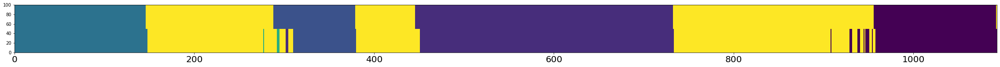

A,P,R:  0.9560841720036597 0.961890243902439 0.956060606060606
Num frames:  (656, 19)
Accuracy:  0.9560841720036597
Person:  580
Transitions:  [3, 8, 4, 8, 7, 8]
GT transitions:  2
Transitions captured:  1


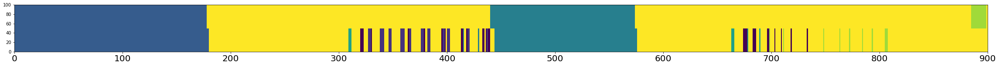

A,P,R:  0.8877777777777778 0.7877237851662404 0.9447852760736196
Num frames:  (391, 83)
Accuracy:  0.8877777777777778
Person:  581
Transitions:  [0, 8, 1, 8, 4, 8, 6, 8, 5, 8]
GT transitions:  4
Transitions captured:  4


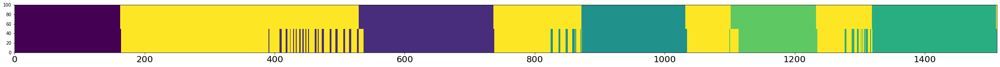

A,P,R:  0.9324950363997353 0.9111842105263158 0.9753521126760564
Num frames:  (912, 81)
Accuracy:  0.9324950363997353
Person:  582
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


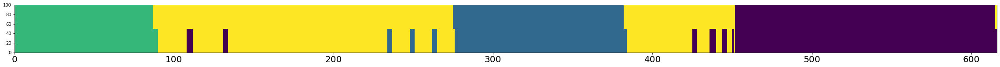

A,P,R:  0.9448051948051948 0.9151670951156813 0.9971988795518207
Num frames:  (389, 33)
Accuracy:  0.9448051948051948
Person:  583
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  2


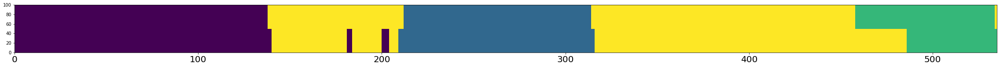

A,P,R:  0.9196261682242991 0.9504950495049505 0.9113924050632911
Num frames:  (303, 15)
Accuracy:  0.9196261682242991
Person:  584
Transitions:  [4, 8, 5, 8]
GT transitions:  1
Transitions captured:  1


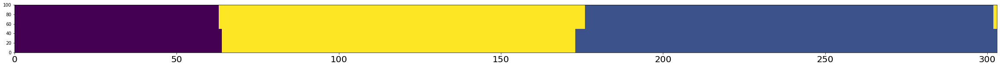

A,P,R:  0.9834983498349835 0.9742268041237113 1.0
Num frames:  (194, 5)
Accuracy:  0.9834983498349835
Person:  585
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



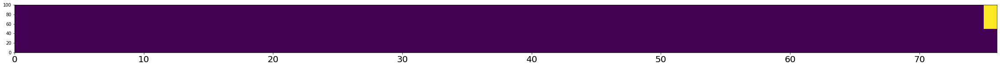

A,P,R:  0.9868421052631579 0.9868421052631579 1.0
Num frames:  (76, 1)
Accuracy:  0.9868421052631579
Person:  586
Transitions:  [0, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


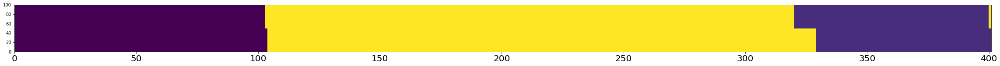

A,P,R:  0.972568578553616 0.9886363636363636 0.9508196721311475
Num frames:  (176, 2)
Accuracy:  0.972568578553616
Person:  587
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


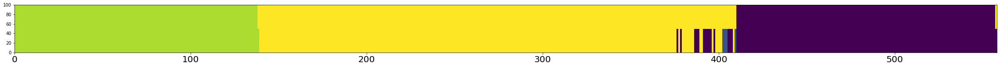

A,P,R:  0.96415770609319 0.9344262295081968 1.0
Num frames:  (305, 20)
Accuracy:  0.96415770609319
Person:  588
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



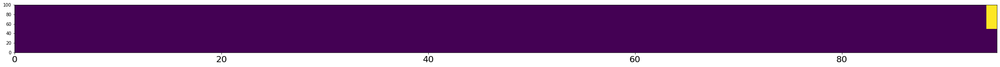

A,P,R:  0.9894736842105263 0.9894736842105263 1.0
Num frames:  (95, 1)
Accuracy:  0.9894736842105263
Person:  589
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  2


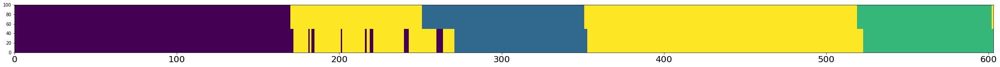

A,P,R:  0.9353233830845771 0.9454022988505747 0.9320113314447592
Num frames:  (348, 15)
Accuracy:  0.9353233830845771
Person:  590
Transitions:  [7, 8, 7, 8, 7, 8, 7, 8, 7, 8, 7, 8, 7, 8, 7, 8, 7, 8, 7, 8, 7, 8, 7, 8, 7, 8, 7, 8, 7, 8, 7, 8, 7, 8, 7, 8, 7, 8, 7, 8, 7, 8, 7, 8, 7, 8, 7, 8, 7, 8, 7, 8, 7, 8, 7, 8]
GT transitions:  27
Transitions captured:  0


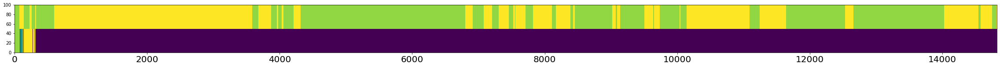

A,P,R:  0.00863406408094435 0.005394332536701946 0.01016600180156994
Num frames:  (14645, 7005)
Accuracy:  0.00863406408094435
Person:  591
Transitions:  [1, 8, 2, 8, 3, 8]
GT transitions:  2
Transitions captured:  2


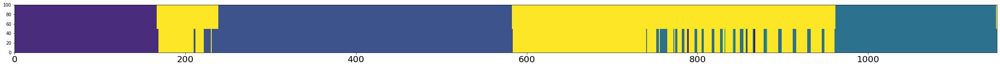

A,P,R:  0.9226759339704604 0.8870558375634517 1.0
Num frames:  (788, 89)
Accuracy:  0.9226759339704604
Person:  592
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


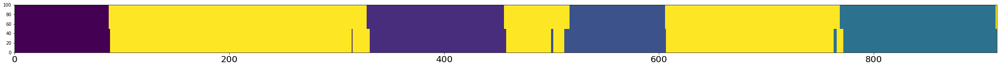

A,P,R:  0.9759562841530055 0.9652173913043478 0.9866666666666667
Num frames:  (460, 16)
Accuracy:  0.9759562841530055
Person:  593
Transitions:  [0, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


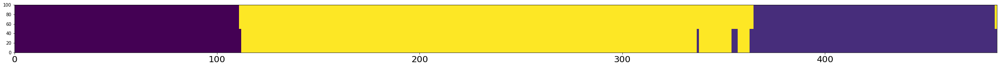

A,P,R:  0.9835051546391752 0.9663865546218487 1.0
Num frames:  (238, 8)
Accuracy:  0.9835051546391752
Person:  594
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


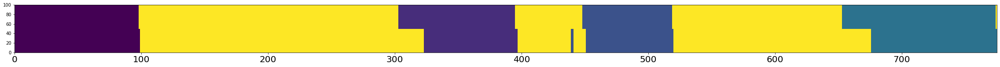

A,P,R:  0.9316129032258065 0.9795918367346939 0.8795811518324608
Num frames:  (343, 7)
Accuracy:  0.9316129032258065
Person:  595
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


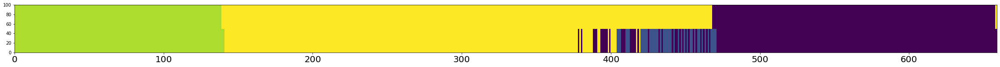

A,P,R:  0.8801213960546282 0.8049382716049382 0.9908814589665653
Num frames:  (405, 76)
Accuracy:  0.8801213960546282
Person:  596
Transitions:  [1, 8, 4, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


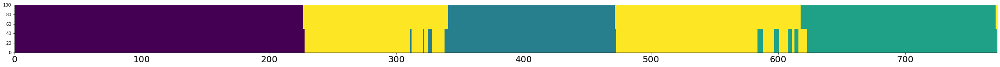

A,P,R:  0.961139896373057 0.9529190207156308 0.9902152641878669
Num frames:  (531, 25)
Accuracy:  0.961139896373057
Person:  597
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


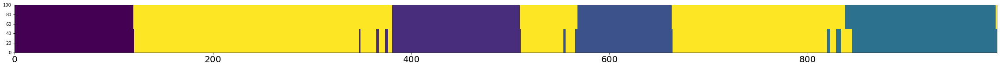

A,P,R:  0.9697275479313825 0.955078125 0.9858870967741935
Num frames:  (512, 23)
Accuracy:  0.9697275479313825
Person:  598
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


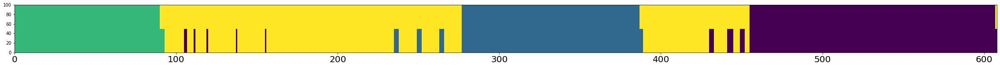

A,P,R:  0.9490131578947368 0.9190600522193212 1.0
Num frames:  (383, 31)
Accuracy:  0.9490131578947368
Person:  599
Transitions:  [0, 8, 1, 8, 4, 8, 5, 8]
GT transitions:  3
Transitions captured:  3


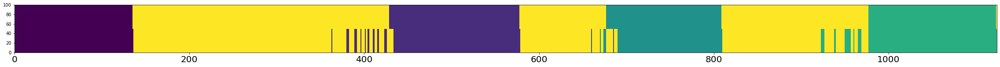

A,P,R:  0.943950177935943 0.9220338983050848 0.9679715302491103
Num frames:  (590, 45)
Accuracy:  0.943950177935943
Person:  600
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


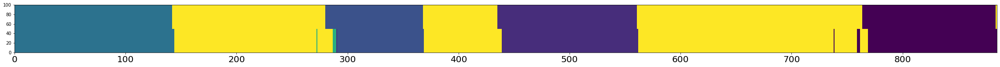

A,P,R:  0.9661016949152542 0.9702127659574468 0.957983193277311
Num frames:  (470, 10)
Accuracy:  0.9661016949152542
Person:  601
Transitions:  [7, 8, 6, 8]
GT transitions:  1
Transitions captured:  1


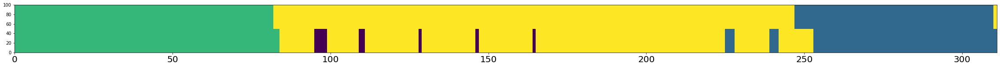

A,P,R:  0.9228295819935691 0.8853503184713376 0.9586206896551724
Num frames:  (157, 18)
Accuracy:  0.9228295819935691
Person:  602
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


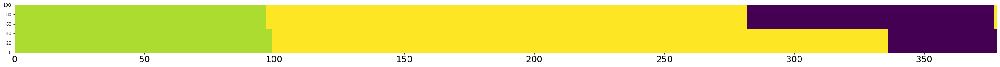

A,P,R:  0.8492063492063492 0.9787234042553191 0.71875
Num frames:  (141, 3)
Accuracy:  0.8492063492063492
Person:  603
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



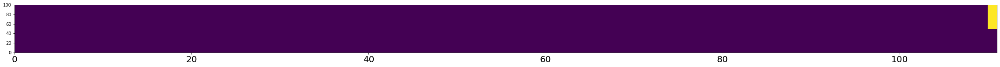

A,P,R:  0.990990990990991 0.990990990990991 1.0
Num frames:  (111, 1)
Accuracy:  0.990990990990991
Person:  604
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



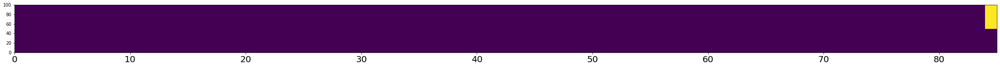

A,P,R:  0.9882352941176471 0.9882352941176471 1.0
Num frames:  (85, 1)
Accuracy:  0.9882352941176471
Person:  605
Transitions:  [0, 8, 1, 8, 4, 8, 6, 8]
GT transitions:  3
Transitions captured:  3


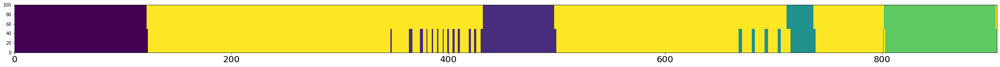

A,P,R:  0.9481236203090507 0.8810198300283286 0.9841772151898734
Num frames:  (353, 42)
Accuracy:  0.9481236203090507
Person:  606
Transitions:  [2, 8, 1, 8, 0, 8]
GT transitions:  2
Transitions captured:  2


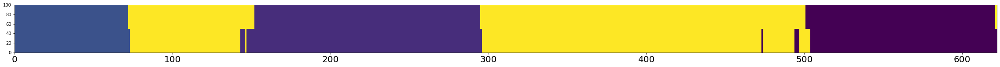

A,P,R:  0.9710610932475884 0.9567723342939481 0.991044776119403
Num frames:  (347, 15)
Accuracy:  0.9710610932475884
Person:  607
Transitions:  [7, 8, 1, 8]
GT transitions:  1
Transitions captured:  0


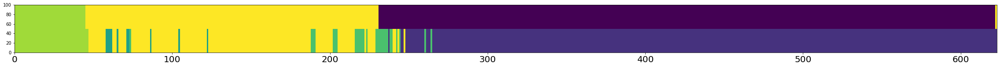

A,P,R:  0.3258426966292135 0.09761388286334056 0.10321100917431193
Num frames:  (461, 29)
Accuracy:  0.3258426966292135
Person:  608
Transitions:  [6, 8, 5, 8]
GT transitions:  1
Transitions captured:  1


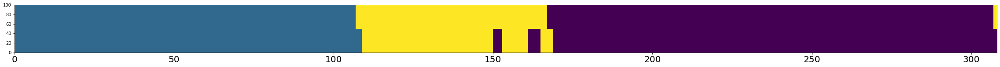

A,P,R:  0.961038961038961 0.9607843137254902 0.9919028340080972
Num frames:  (255, 10)
Accuracy:  0.961038961038961
Person:  609
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


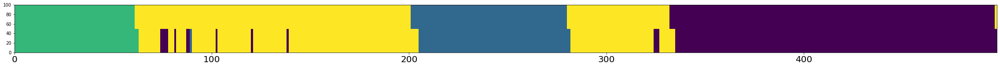

A,P,R:  0.9477911646586346 0.9400630914826499 0.9770491803278688
Num frames:  (317, 19)
Accuracy:  0.9477911646586346
Person:  610
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



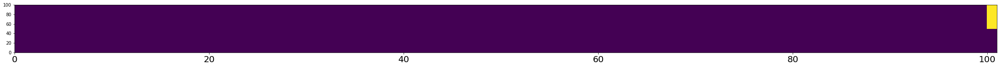

A,P,R:  0.9900990099009901 0.9900990099009901 1.0
Num frames:  (101, 1)
Accuracy:  0.9900990099009901
Person:  611
Transitions:  [5, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


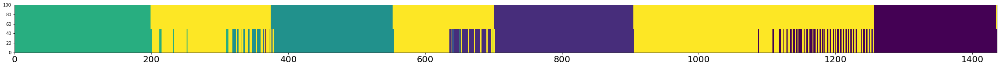

A,P,R:  0.8816155988857939 0.8193688792165397 0.9920948616600791
Num frames:  (919, 164)
Accuracy:  0.8816155988857939
Person:  612
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



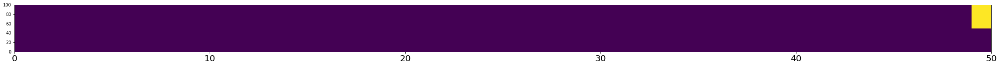

A,P,R:  0.98 0.98 1.0
Num frames:  (50, 1)
Accuracy:  0.98
Person:  613
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


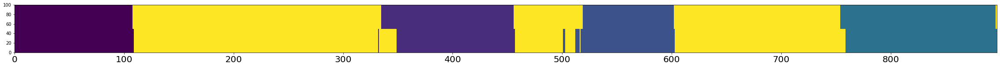

A,P,R:  0.9643255295429208 0.9709821428571429 0.9581497797356828
Num frames:  (448, 13)
Accuracy:  0.9643255295429208
Person:  614
Transitions:  [1, 8]
GT transitions:  0
Transitions captured:  0



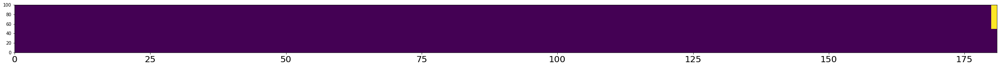

A,P,R:  0.994475138121547 0.994475138121547 1.0
Num frames:  (181, 1)
Accuracy:  0.994475138121547
Person:  615
Transitions:  [7, 8, 7, 8, 6, 8, 5, 8, 5, 8, 6, 8, 7, 8, 6, 8, 5, 8, 5, 8, 6, 8, 7, 8, 7, 8, 6, 8, 5, 8, 5, 8, 5, 8, 5, 8, 5, 8, 5, 8, 5, 8, 4, 8, 1, 8]
GT transitions:  22
Transitions captured:  0


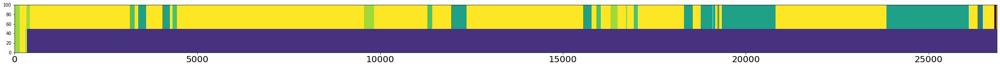

A,P,R:  0.011797104685348517 0.005583033573141487 0.021288755536505215
Num frames:  (26688, 19704)
Accuracy:  0.011797104685348517
Person:  616
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



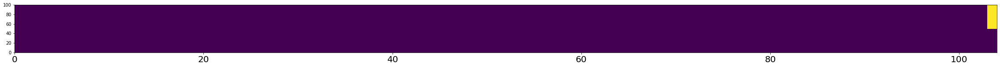

A,P,R:  0.9903846153846154 0.9903846153846154 1.0
Num frames:  (104, 1)
Accuracy:  0.9903846153846154
Person:  617
Transitions:  [1, 8]
GT transitions:  0
Transitions captured:  0



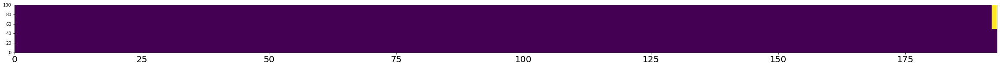

A,P,R:  0.9948186528497409 0.9948186528497409 1.0
Num frames:  (193, 1)
Accuracy:  0.9948186528497409
Person:  618
Transitions:  [5, 8, 4, 8, 1, 8, 1, 8, 1, 8]
GT transitions:  4
Transitions captured:  4


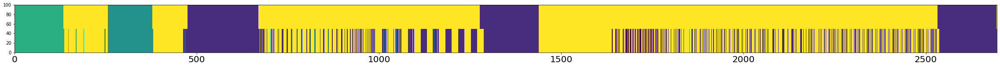

A,P,R:  0.7773654916512059 0.5647321428571429 0.9806201550387597
Num frames:  (1344, 585)
Accuracy:  0.7773654916512059
Person:  619
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


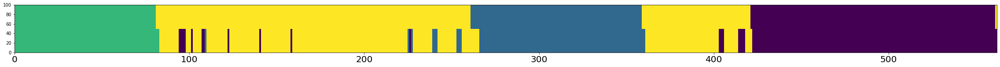

A,P,R:  0.9323843416370107 0.9072463768115943 0.9811912225705329
Num frames:  (345, 32)
Accuracy:  0.9323843416370107
Person:  620
Transitions:  [1, 8, 4, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


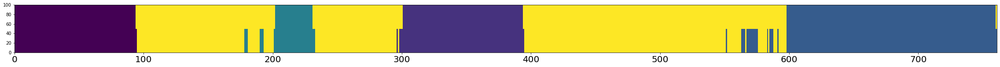

A,P,R:  0.9553219448094612 0.9174757281553398 1.0
Num frames:  (412, 34)
Accuracy:  0.9553219448094612
Person:  621
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


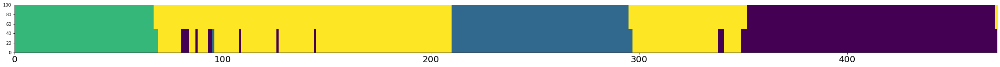

A,P,R:  0.9533898305084746 0.9249146757679181 1.0
Num frames:  (293, 22)
Accuracy:  0.9533898305084746
Person:  622
Transitions:  [5, 8, 6, 8, 4, 8, 0, 8]
GT transitions:  3
Transitions captured:  2


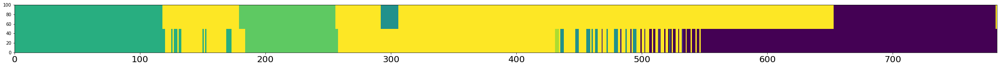

A,P,R:  0.7522349936143039 0.645748987854251 0.9437869822485208
Num frames:  (494, 175)
Accuracy:  0.7522349936143039
Person:  623
Transitions:  [7, 8, 4, 8, 2, 8]
GT transitions:  2
Transitions captured:  1


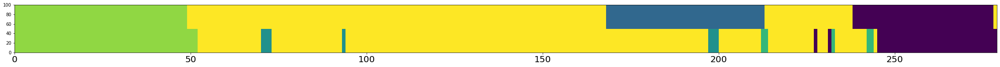

A,P,R:  0.7706093189964157 0.82 0.6119402985074627
Num frames:  (100, 12)
Accuracy:  0.7706093189964157
Person:  624
Transitions:  [1, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


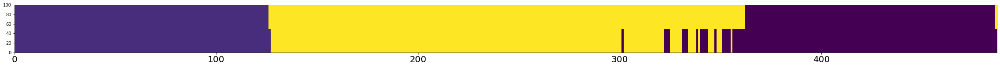

A,P,R:  0.9486652977412731 0.9090909090909091 1.0
Num frames:  (275, 25)
Accuracy:  0.9486652977412731
Person:  625
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


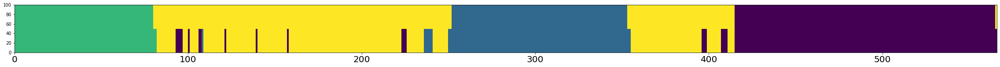

A,P,R:  0.941696113074205 0.9093406593406593 1.0
Num frames:  (364, 33)
Accuracy:  0.941696113074205
Person:  626
Transitions:  [0, 8, 1, 8, 4, 8, 5, 8]
GT transitions:  3
Transitions captured:  3


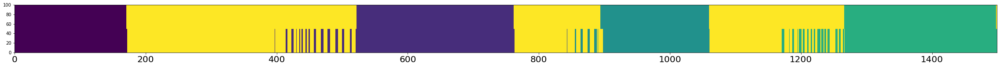

A,P,R:  0.9299533022014677 0.8893805309734514 0.9938195302843016
Num frames:  (904, 100)
Accuracy:  0.9299533022014677
Person:  627
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


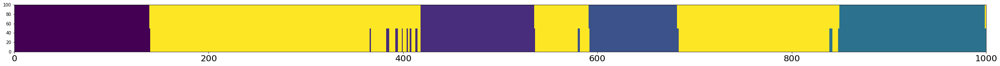

A,P,R:  0.975 0.9538461538461539 0.9979879275653923
Num frames:  (520, 24)
Accuracy:  0.975
Person:  628
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


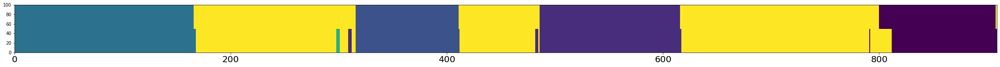

A,P,R:  0.9702970297029703 0.9701195219123506 0.9759519038076152
Num frames:  (502, 15)
Accuracy:  0.9702970297029703
Person:  629
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



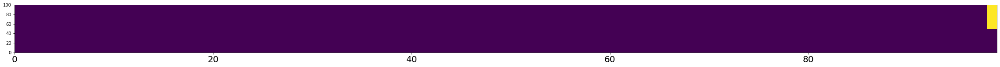

A,P,R:  0.98989898989899 0.98989898989899 1.0
Num frames:  (99, 1)
Accuracy:  0.98989898989899
Person:  630
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


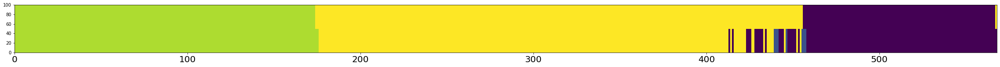

A,P,R:  0.9471830985915493 0.9041533546325878 0.9929824561403509
Num frames:  (313, 28)
Accuracy:  0.9471830985915493
Person:  631
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


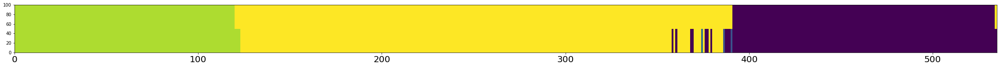

A,P,R:  0.9682242990654205 0.9392857142857143 1.0
Num frames:  (280, 17)
Accuracy:  0.9682242990654205
Person:  632
Transitions:  [3, 8, 1, 8, 0, 8]
GT transitions:  2
Transitions captured:  2


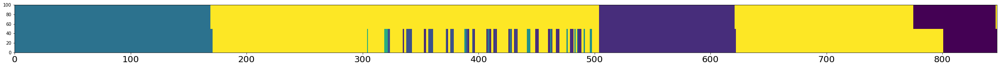

A,P,R:  0.885478158205431 0.8233830845771144 0.927170868347339
Num frames:  (402, 71)
Accuracy:  0.885478158205431
Person:  633
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



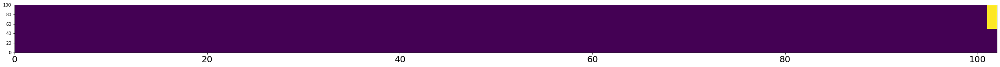

A,P,R:  0.9901960784313726 0.9901960784313726 1.0
Num frames:  (102, 1)
Accuracy:  0.9901960784313726
Person:  634
Transitions:  [3, 8]
GT transitions:  0
Transitions captured:  0



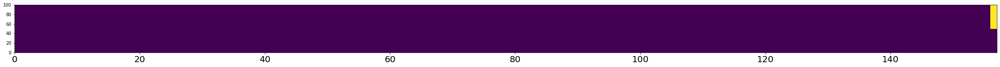

A,P,R:  0.9936305732484076 0.9936305732484076 1.0
Num frames:  (157, 1)
Accuracy:  0.9936305732484076
Person:  635
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



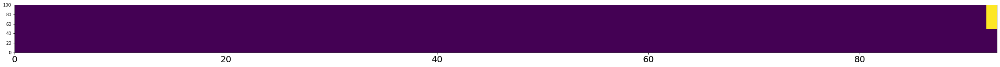

A,P,R:  0.989247311827957 0.989247311827957 1.0
Num frames:  (93, 1)
Accuracy:  0.989247311827957
Person:  636
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


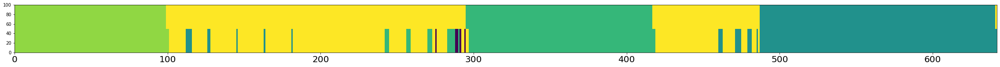

A,P,R:  0.926791277258567 0.8923444976076556 0.9946666666666667
Num frames:  (418, 45)
Accuracy:  0.926791277258567
Person:  637
Transitions:  [0, 8, 1, 8, 4, 8, 5, 8]
GT transitions:  3
Transitions captured:  3


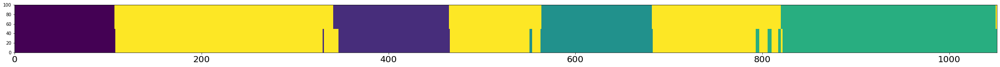

A,P,R:  0.9733587059942912 0.9661590524534687 0.9861830742659758
Num frames:  (591, 20)
Accuracy:  0.9733587059942912
Person:  638
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


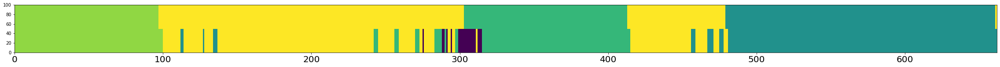

A,P,R:  0.9063444108761329 0.8640552995391705 0.9640102827763496
Num frames:  (434, 48)
Accuracy:  0.9063444108761329
Person:  639
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



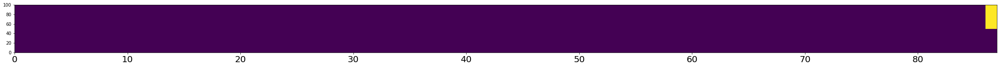

A,P,R:  0.9885057471264368 0.9885057471264368 1.0
Num frames:  (87, 1)
Accuracy:  0.9885057471264368
Person:  640
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



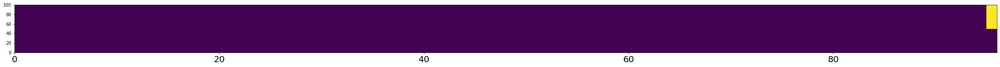

A,P,R:  0.9895833333333334 0.9895833333333334 1.0
Num frames:  (96, 1)
Accuracy:  0.9895833333333334
Person:  641
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



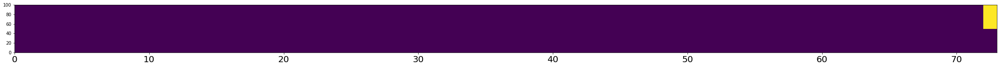

A,P,R:  0.9863013698630136 0.9863013698630136 1.0
Num frames:  (73, 1)
Accuracy:  0.9863013698630136
Person:  642
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



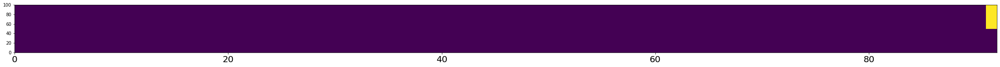

A,P,R:  0.9891304347826086 0.9891304347826086 1.0
Num frames:  (92, 1)
Accuracy:  0.9891304347826086
Person:  643
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


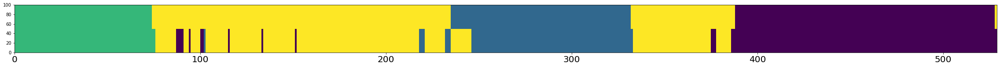

A,P,R:  0.9300567107750473 0.9202453987730062 0.9646302250803859
Num frames:  (326, 26)
Accuracy:  0.9300567107750473
Person:  644
Transitions:  [3, 8, 2, 8, 4, 8, 5, 8]
GT transitions:  3
Transitions captured:  3


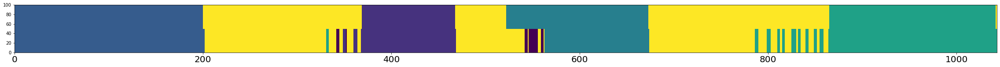

A,P,R:  0.909875359539789 0.8946564885496183 0.9346092503987241
Num frames:  (655, 53)
Accuracy:  0.909875359539789
Person:  645
Transitions:  [3, 8, 2, 8, 4, 8, 6, 8]
GT transitions:  3
Transitions captured:  3


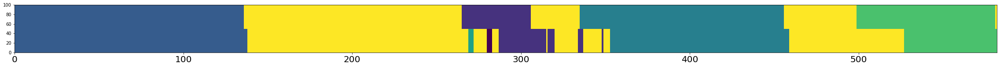

A,P,R:  0.8487972508591065 0.9149560117302052 0.8210526315789474
Num frames:  (341, 20)
Accuracy:  0.8487972508591065
Person:  646
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


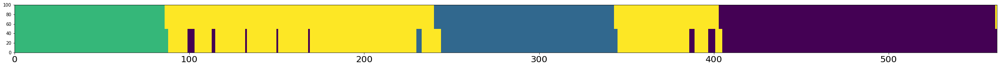

A,P,R:  0.9466192170818505 0.9342465753424658 0.9827089337175793
Num frames:  (365, 24)
Accuracy:  0.9466192170818505
Person:  647
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


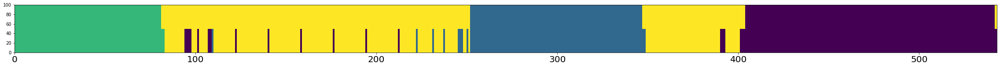

A,P,R:  0.9410681399631676 0.9075144508670521 1.0
Num frames:  (346, 32)
Accuracy:  0.9410681399631676
Person:  648
Transitions:  [0, 8, 1, 8, 4, 8, 5, 8]
GT transitions:  3
Transitions captured:  3


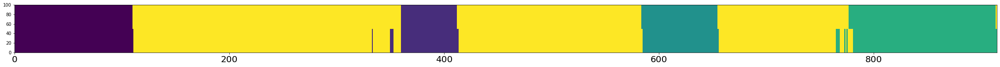

A,P,R:  0.9781420765027322 0.9605263157894737 0.9864864864864865
Num frames:  (380, 15)
Accuracy:  0.9781420765027322
Person:  649
Transitions:  [5, 8, 4, 8, 0, 8]
GT transitions:  2
Transitions captured:  1


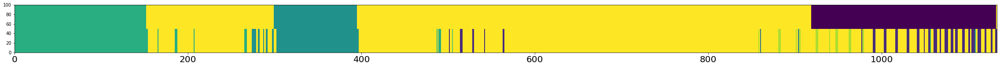

A,P,R:  0.7669902912621359 0.6805555555555556 0.5314533622559653
Num frames:  (360, 48)
Accuracy:  0.7669902912621359
Person:  650
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  0


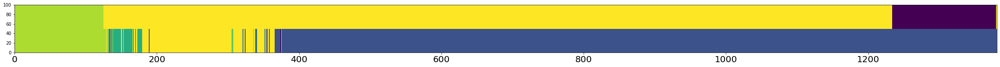

A,P,R:  0.22302679217958002 0.10434056761268781 0.4612546125461255
Num frames:  (1198, 927)
Accuracy:  0.22302679217958002
Person:  651
Transitions:  [0, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


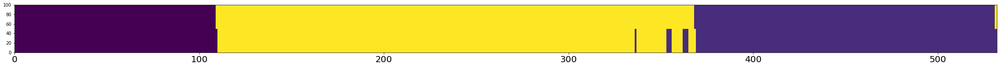

A,P,R:  0.981203007518797 0.9678571428571429 0.9963235294117647
Num frames:  (280, 9)
Accuracy:  0.981203007518797
Person:  652
Transitions:  [1, 8, 4, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


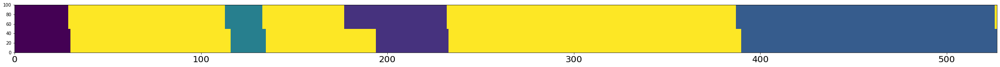

A,P,R:  0.9468690702087287 0.9777777777777777 0.9053497942386831
Num frames:  (225, 5)
Accuracy:  0.9468690702087287
Person:  653
Transitions:  [5, 8]
GT transitions:  0
Transitions captured:  0



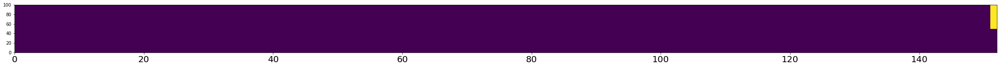

A,P,R:  0.993421052631579 0.993421052631579 1.0
Num frames:  (152, 1)
Accuracy:  0.993421052631579
Person:  654
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


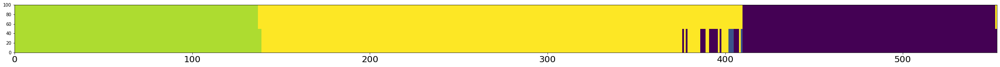

A,P,R:  0.9620253164556962 0.93 1.0
Num frames:  (300, 21)
Accuracy:  0.9620253164556962
Person:  655
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


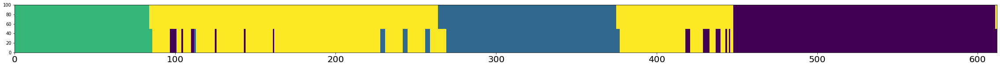

A,P,R:  0.9313725490196079 0.9051282051282051 0.9860335195530726
Num frames:  (390, 37)
Accuracy:  0.9313725490196079
Person:  656
Transitions:  [7, 8, 1, 8, 4, 8, 2, 8, 3, 8]
GT transitions:  4
Transitions captured:  2


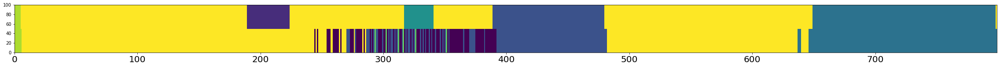

A,P,R:  0.7809762202753442 0.6335078534031413 0.7960526315789473
Num frames:  (382, 113)
Accuracy:  0.7809762202753442
Person:  657
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


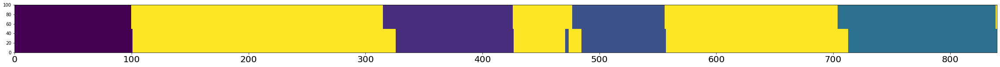

A,P,R:  0.9583333333333334 0.9826732673267327 0.9341176470588235
Num frames:  (404, 7)
Accuracy:  0.9583333333333334
Person:  658
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


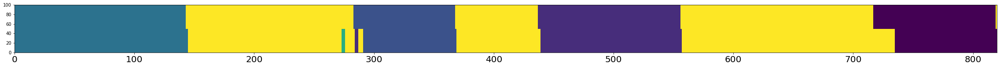

A,P,R:  0.9560975609756097 0.9745370370370371 0.9376391982182628
Num frames:  (432, 8)
Accuracy:  0.9560975609756097
Person:  659
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


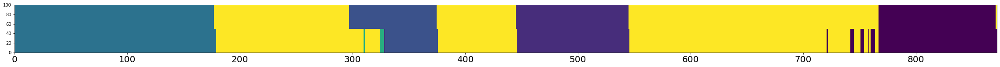

A,P,R:  0.9426605504587156 0.9508928571428571 0.9281045751633987
Num frames:  (448, 17)
Accuracy:  0.9426605504587156
Person:  660
Transitions:  [5, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  0


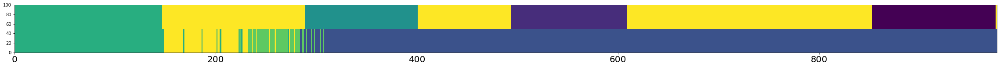

A,P,R:  0.2323439099283521 0.16387959866220736 0.29577464788732394
Num frames:  (897, 400)
Accuracy:  0.2323439099283521
Person:  661
Transitions:  [5, 8, 6, 8, 7, 8, 0, 8]
GT transitions:  3
Transitions captured:  2


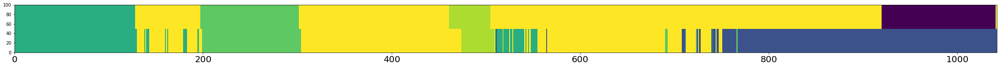

A,P,R:  0.6324376199616123 0.4158730158730159 0.6582914572864321
Num frames:  (630, 247)
Accuracy:  0.6324376199616123
Person:  662
Transitions:  [4, 8, 1, 8, 0, 8]
GT transitions:  2
Transitions captured:  2


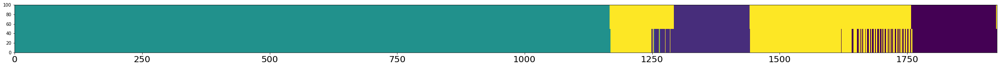

A,P,R:  0.944963655244029 0.9348925410872313 0.9979757085020243
Num frames:  (1582, 103)
Accuracy:  0.944963655244029
Person:  663
Transitions:  [2, 8, 4, 8, 1, 8]
GT transitions:  2
Transitions captured:  1


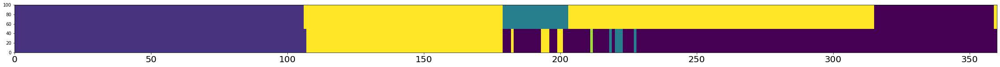

A,P,R:  0.6166666666666667 0.5319148936170213 0.8620689655172413
Num frames:  (282, 114)
Accuracy:  0.6166666666666667
Person:  664
Transitions:  [7, 8, 6, 8]
GT transitions:  1
Transitions captured:  1


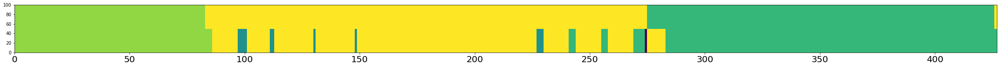

A,P,R:  0.9180327868852459 0.8932806324110671 0.9658119658119658
Num frames:  (253, 27)
Accuracy:  0.9180327868852459
Person:  665
Transitions:  [5, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


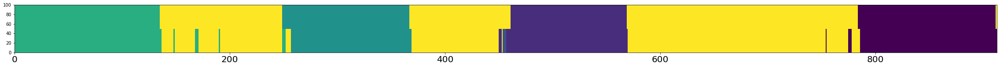

A,P,R:  0.9616648411829135 0.9447731755424064 0.9795501022494888
Num frames:  (507, 25)
Accuracy:  0.9616648411829135
Person:  666
Transitions:  [0, 8, 1, 8, 4, 8, 5, 8]
GT transitions:  3
Transitions captured:  3


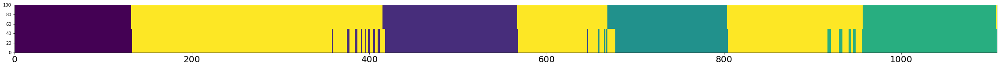

A,P,R:  0.9530685920577617 0.932998324958124 0.9789103690685413
Num frames:  (597, 40)
Accuracy:  0.9530685920577617
Person:  667
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



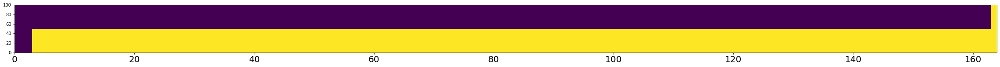

A,P,R:  0.024390243902439025 1.0 0.018404907975460124
Num frames:  (3, 0)
Accuracy:  0.024390243902439025
Person:  668
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


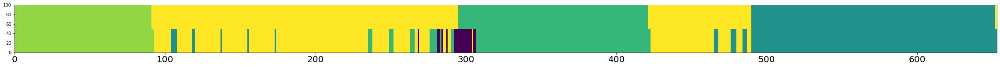

A,P,R:  0.9065849923430321 0.8594847775175644 0.9683377308707124
Num frames:  (427, 49)
Accuracy:  0.9065849923430321
Person:  669
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



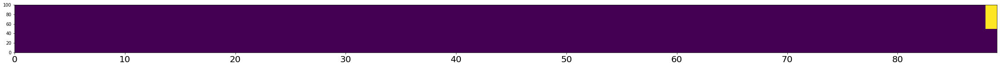

A,P,R:  0.9887640449438202 0.9887640449438202 1.0
Num frames:  (89, 1)
Accuracy:  0.9887640449438202
Person:  670
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


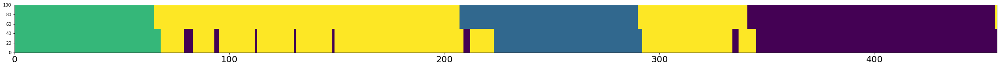

A,P,R:  0.9168490153172867 0.9204545454545454 0.9239543726235742
Num frames:  (264, 18)
Accuracy:  0.9168490153172867
Person:  671
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


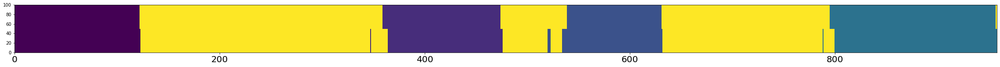

A,P,R:  0.9739039665970772 0.969758064516129 0.9796334012219959
Num frames:  (496, 15)
Accuracy:  0.9739039665970772
Person:  672
Transitions:  [1, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


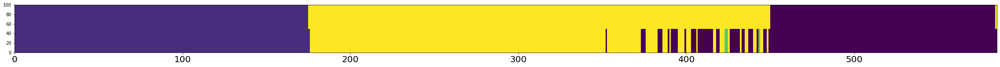

A,P,R:  0.9196581196581196 0.8679775280898876 1.0
Num frames:  (356, 47)
Accuracy:  0.9196581196581196
Person:  673
Transitions:  [1, 8, 2, 8, 3, 8]
GT transitions:  2
Transitions captured:  2


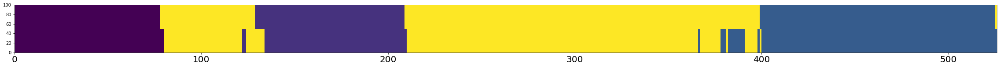

A,P,R:  0.9505703422053232 0.9328859060402684 0.9788732394366197
Num frames:  (298, 20)
Accuracy:  0.9505703422053232
Person:  674
Transitions:  [2, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


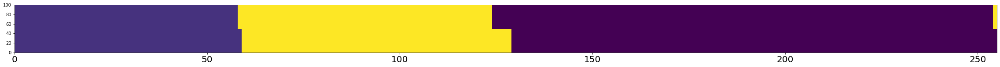

A,P,R:  0.9725490196078431 0.9891891891891892 0.973404255319149
Num frames:  (185, 2)
Accuracy:  0.9725490196078431
Person:  675
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  2


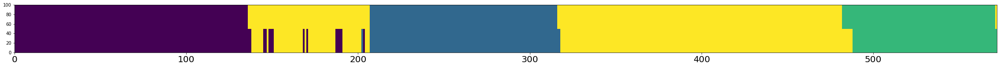

A,P,R:  0.958041958041958 0.9479768786127167 0.9820359281437125
Num frames:  (346, 18)
Accuracy:  0.958041958041958
Person:  676
Transitions:  [0, 8, 1, 8, 2, 8, 4, 8, 5, 8]
GT transitions:  4
Transitions captured:  4


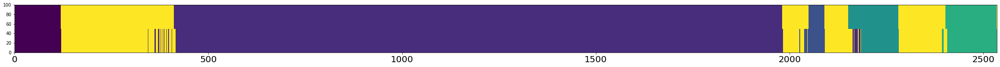

A,P,R:  0.9692307692307692 0.972568578553616 0.9798994974874372
Num frames:  (2005, 38)
Accuracy:  0.9692307692307692
Person:  677
Transitions:  [0, 8, 1, 8, 4, 8, 4, 8, 5, 8]
GT transitions:  4
Transitions captured:  4


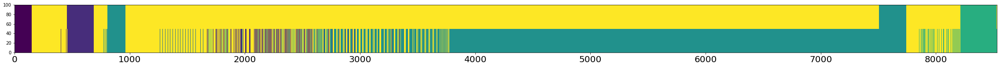

A,P,R:  0.3921453692848769 0.17296952289771822 0.998158379373849
Num frames:  (6267, 5183)
Accuracy:  0.3921453692848769
Person:  678
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  2


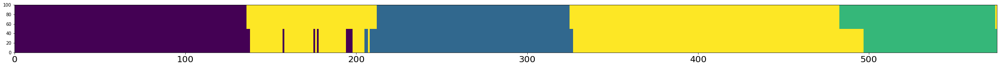

A,P,R:  0.9443478260869566 0.9476744186046512 0.9588235294117647
Num frames:  (344, 18)
Accuracy:  0.9443478260869566
Person:  679
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


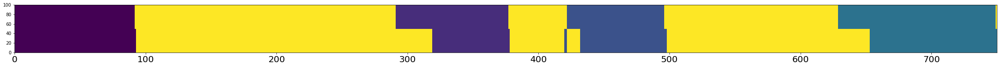

A,P,R:  0.908 0.9779179810725552 0.8333333333333334
Num frames:  (317, 7)
Accuracy:  0.908
Person:  680
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



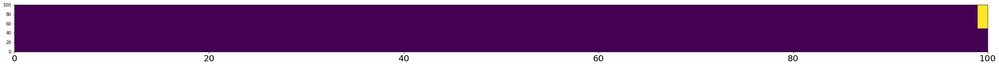

A,P,R:  0.99 0.99 1.0
Num frames:  (100, 1)
Accuracy:  0.99
Person:  681
Transitions:  [2, 8, 1, 8, 0, 8, 0, 8]
GT transitions:  3
Transitions captured:  2


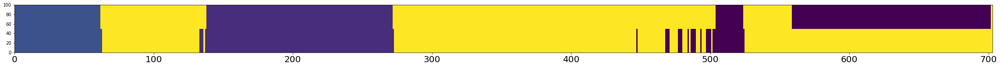

A,P,R:  0.7596017069701281 0.8925619834710744 0.6016713091922006
Num frames:  (242, 26)
Accuracy:  0.7596017069701281
Person:  682
Transitions:  [1, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


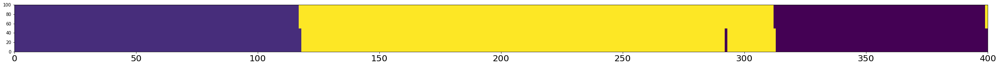

A,P,R:  0.99 0.9854368932038835 0.9950980392156863
Num frames:  (206, 3)
Accuracy:  0.99
Person:  683
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


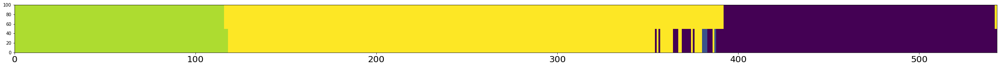

A,P,R:  0.9539594843462247 0.9140893470790378 1.0
Num frames:  (291, 25)
Accuracy:  0.9539594843462247
Person:  684
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


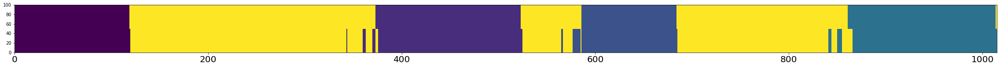

A,P,R:  0.9625615763546798 0.9446494464944649 0.9846153846153847
Num frames:  (542, 30)
Accuracy:  0.9625615763546798
Person:  685
Transitions:  [7, 8, 1, 8]
GT transitions:  1
Transitions captured:  0


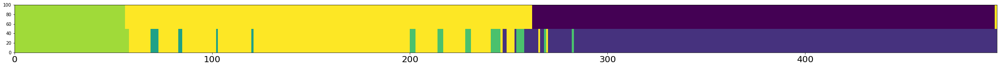

A,P,R:  0.4567404426559356 0.1728395061728395 0.19310344827586207
Num frames:  (324, 36)
Accuracy:  0.4567404426559356
Person:  686
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


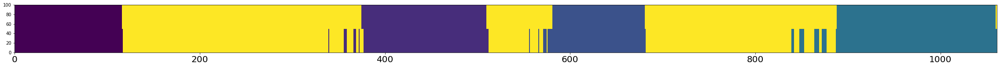

A,P,R:  0.9575871819038643 0.9237588652482269 0.9961759082217974
Num frames:  (564, 43)
Accuracy:  0.9575871819038643
Person:  687
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



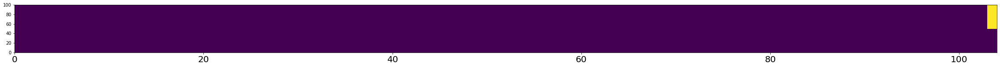

A,P,R:  0.9903846153846154 0.9903846153846154 1.0
Num frames:  (104, 1)
Accuracy:  0.9903846153846154
Person:  688
Transitions:  [3, 8, 2, 8, 1, 8]
GT transitions:  2
Transitions captured:  2


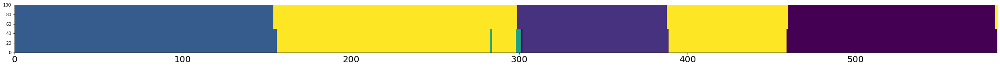

A,P,R:  0.9828767123287672 0.9731903485254692 0.9918032786885246
Num frames:  (373, 7)
Accuracy:  0.9828767123287672
Person:  689
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  1


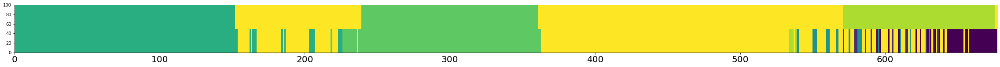

A,P,R:  0.7784342688330872 0.7210526315789474 0.7229551451187335
Num frames:  (380, 45)
Accuracy:  0.7784342688330872
Person:  690
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


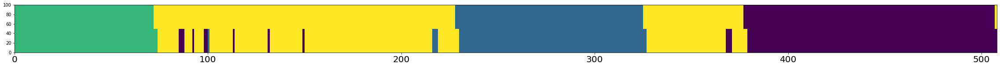

A,P,R:  0.9507874015748031 0.9335443037974683 0.9866220735785953
Num frames:  (316, 21)
Accuracy:  0.9507874015748031
Person:  691
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8, 3, 8]
GT transitions:  4
Transitions captured:  3


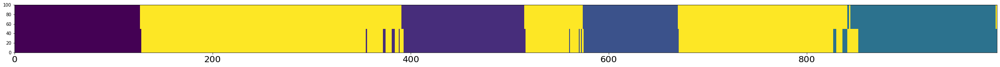

A,P,R:  0.9637096774193549 0.9545454545454546 0.9737903225806451
Num frames:  (506, 23)
Accuracy:  0.9637096774193549
Person:  692
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



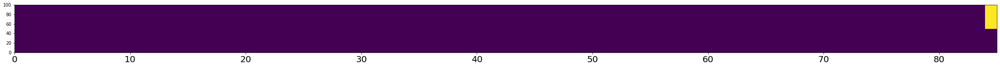

A,P,R:  0.9882352941176471 0.9882352941176471 1.0
Num frames:  (85, 1)
Accuracy:  0.9882352941176471
Person:  693
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



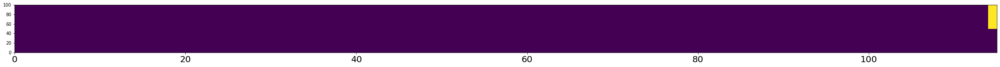

A,P,R:  0.991304347826087 0.991304347826087 1.0
Num frames:  (115, 1)
Accuracy:  0.991304347826087
Person:  694
Transitions:  [0, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


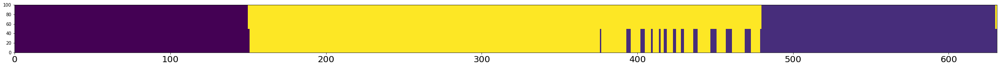

A,P,R:  0.9477020602218701 0.9009009009009009 1.0
Num frames:  (333, 33)
Accuracy:  0.9477020602218701
Person:  695
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


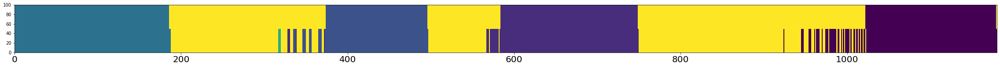

A,P,R:  0.9228813559322034 0.874826147426982 0.9984126984126984
Num frames:  (719, 90)
Accuracy:  0.9228813559322034
Person:  696
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


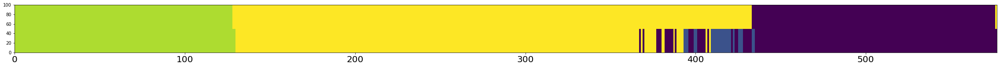

A,P,R:  0.9064124783362218 0.8328173374613003 0.992619926199262
Num frames:  (323, 52)
Accuracy:  0.9064124783362218
Person:  697
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


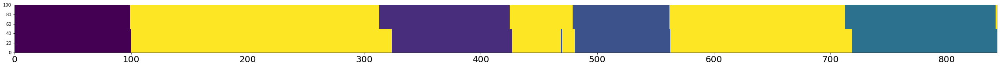

A,P,R:  0.970344009489917 0.9853658536585366 0.9550827423167849
Num frames:  (410, 6)
Accuracy:  0.970344009489917
Person:  698
Transitions:  [5, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


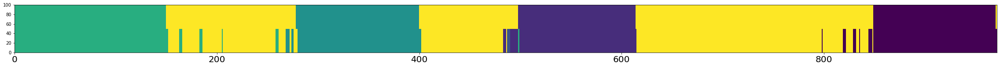

A,P,R:  0.9474768280123584 0.9117117117117117 0.9941060903732809
Num frames:  (555, 48)
Accuracy:  0.9474768280123584
Person:  699
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



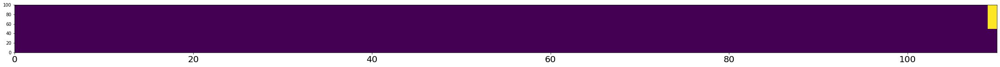

A,P,R:  0.990909090909091 0.990909090909091 1.0
Num frames:  (110, 1)
Accuracy:  0.990909090909091
Person:  700
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


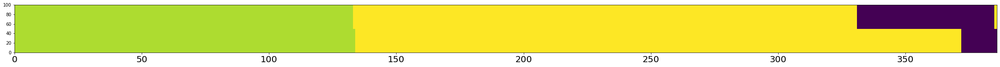

A,P,R:  0.8886010362694301 0.9864864864864865 0.7807486631016043
Num frames:  (148, 2)
Accuracy:  0.8886010362694301
Person:  701
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


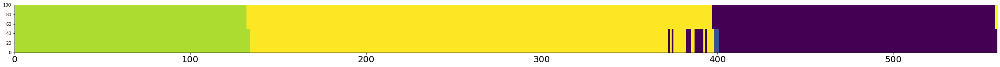

A,P,R:  0.9677996422182469 0.9444444444444444 0.9863481228668942
Num frames:  (306, 14)
Accuracy:  0.9677996422182469
Person:  702
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



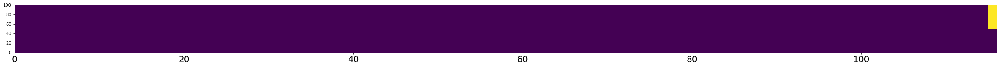

A,P,R:  0.9913793103448276 0.9913793103448276 1.0
Num frames:  (116, 1)
Accuracy:  0.9913793103448276
Person:  703
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


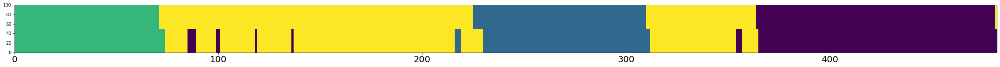

A,P,R:  0.946058091286307 0.9303135888501742 0.978021978021978
Num frames:  (287, 20)
Accuracy:  0.946058091286307
Person:  704
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


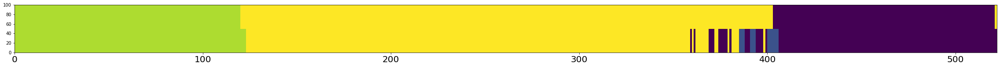

A,P,R:  0.9329501915708812 0.8703703703703703 0.9873949579831933
Num frames:  (270, 32)
Accuracy:  0.9329501915708812
Person:  705
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



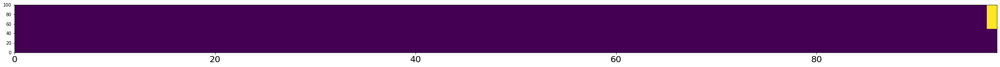

A,P,R:  0.9897959183673469 0.9897959183673469 1.0
Num frames:  (98, 1)
Accuracy:  0.9897959183673469
Person:  706
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


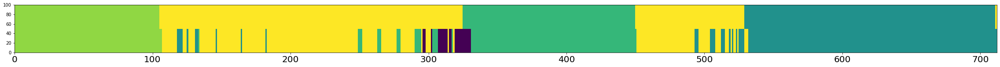

A,P,R:  0.8904494382022472 0.8430962343096234 0.9781553398058253
Num frames:  (478, 69)
Accuracy:  0.8904494382022472
Person:  707
Transitions:  [5, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  1


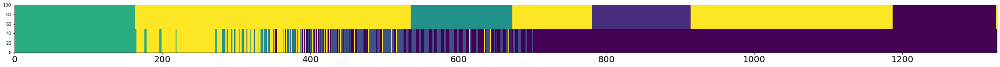

A,P,R:  0.3682228915662651 0.2662565905096661 0.5287958115183246
Num frames:  (1138, 569)
Accuracy:  0.3682228915662651
Person:  708
Transitions:  [0, 8, 1, 8, 4, 8, 6, 8, 5, 8]
GT transitions:  4
Transitions captured:  4


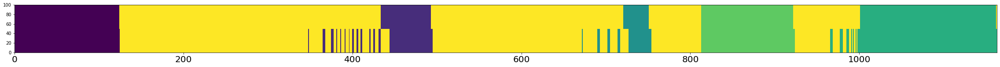

A,P,R:  0.9355116079105761 0.8878326996197718 0.9668737060041408
Num frames:  (526, 59)
Accuracy:  0.9355116079105761
Person:  709
Transitions:  [0, 8, 1, 8, 4, 8, 5, 8]
GT transitions:  3
Transitions captured:  3


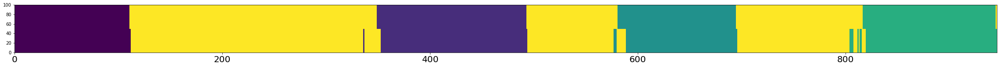

A,P,R:  0.9682875264270613 0.9698189134808853 0.9698189134808853
Num frames:  (497, 15)
Accuracy:  0.9682875264270613
Person:  710
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



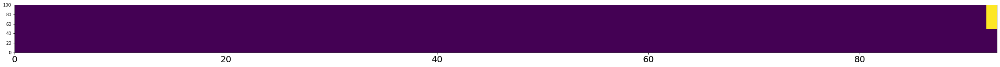

A,P,R:  0.989247311827957 0.989247311827957 1.0
Num frames:  (93, 1)
Accuracy:  0.989247311827957
Person:  711
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


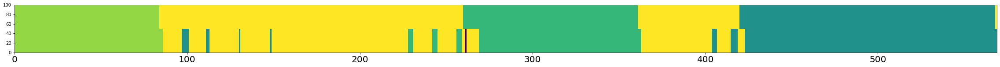

A,P,R:  0.9279437609841827 0.9145299145299145 0.963963963963964
Num frames:  (351, 29)
Accuracy:  0.9279437609841827
Person:  712
Transitions:  [5, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


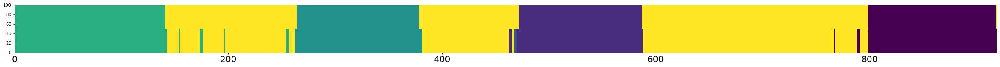

A,P,R:  0.969532100108814 0.9459459459459459 1.0
Num frames:  (518, 28)
Accuracy:  0.969532100108814
Person:  713
Transitions:  [5, 8, 6, 8, 7, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


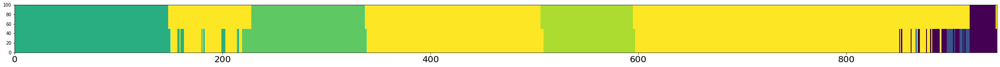

A,P,R:  0.9216931216931217 0.8382687927107062 0.9919137466307277
Num frames:  (439, 71)
Accuracy:  0.9216931216931217
Person:  714
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



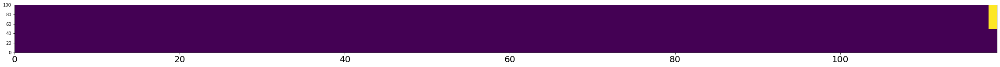

A,P,R:  0.9915966386554622 0.9915966386554622 1.0
Num frames:  (119, 1)
Accuracy:  0.9915966386554622
Person:  715
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


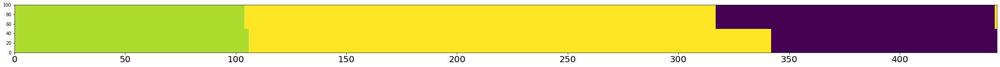

A,P,R:  0.9369369369369369 0.9855769230769231 0.8913043478260869
Num frames:  (208, 3)
Accuracy:  0.9369369369369369
Person:  716
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



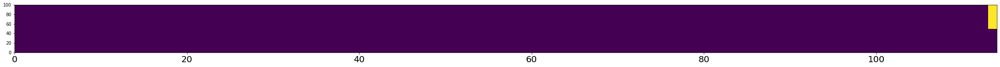

A,P,R:  0.9912280701754386 0.9912280701754386 1.0
Num frames:  (114, 1)
Accuracy:  0.9912280701754386
Person:  717
Transitions:  [1, 8, 7, 8]
GT transitions:  1
Transitions captured:  0


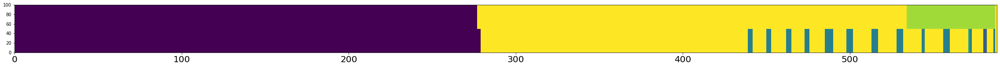

A,P,R:  0.8571428571428571 0.8683385579937304 0.8393939393939394
Num frames:  (319, 31)
Accuracy:  0.8571428571428571
Person:  718
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


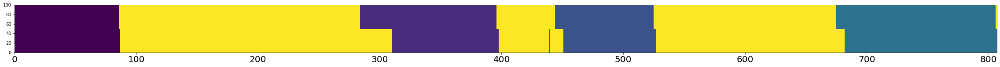

A,P,R:  0.9417596034696406 0.9814323607427056 0.9024390243902439
Num frames:  (377, 7)
Accuracy:  0.9417596034696406
Person:  719
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


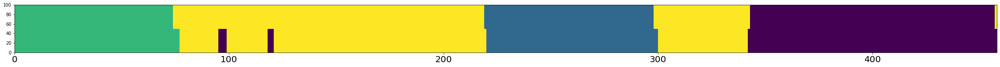

A,P,R:  0.9672489082969432 0.95 0.9962546816479401
Num frames:  (280, 14)
Accuracy:  0.9672489082969432
Person:  720
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


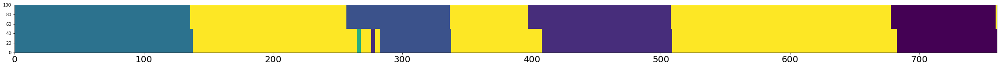

A,P,R:  0.9381578947368421 0.9708222811671088 0.8970588235294118
Num frames:  (377, 5)
Accuracy:  0.9381578947368421
Person:  721
Transitions:  [0, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


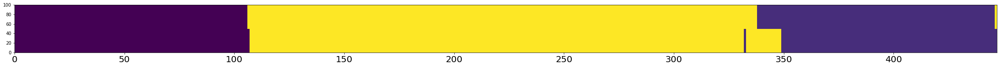

A,P,R:  0.9686800894854586 0.9854368932038835 0.9485981308411215
Num frames:  (206, 3)
Accuracy:  0.9686800894854586
Person:  722
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


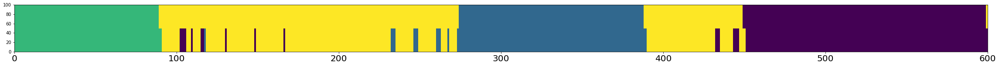

A,P,R:  0.94 0.9116883116883117 0.9943342776203966
Num frames:  (385, 34)
Accuracy:  0.94
Person:  723
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



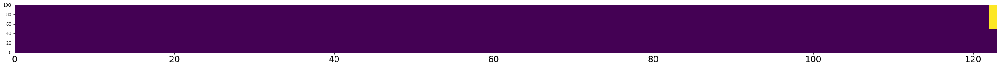

A,P,R:  0.991869918699187 0.991869918699187 1.0
Num frames:  (123, 1)
Accuracy:  0.991869918699187
Person:  724
Transitions:  [6, 8, 7, 8]
GT transitions:  1
Transitions captured:  0


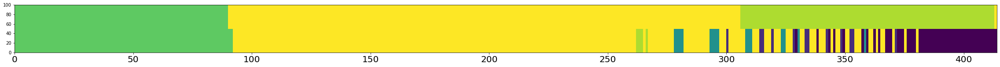

A,P,R:  0.7028985507246377 0.5142857142857142 0.45685279187817257
Num frames:  (175, 16)
Accuracy:  0.7028985507246377
Person:  725
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


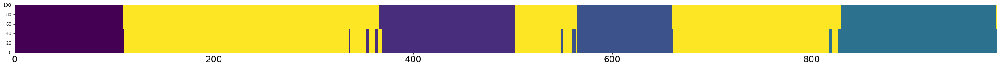

A,P,R:  0.973630831643002 0.9553398058252427 0.9939393939393939
Num frames:  (515, 23)
Accuracy:  0.973630831643002
Person:  726
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


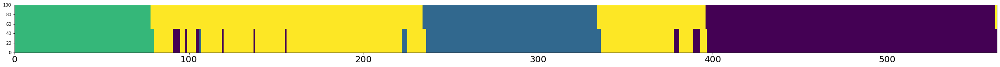

A,P,R:  0.9484902309058615 0.9291553133514986 0.9912790697674418
Num frames:  (367, 26)
Accuracy:  0.9484902309058615
Person:  727
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



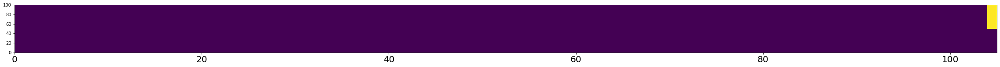

A,P,R:  0.9904761904761905 0.9904761904761905 1.0
Num frames:  (105, 1)
Accuracy:  0.9904761904761905
Person:  728
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  1


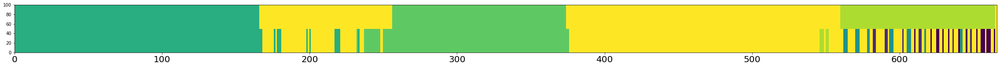

A,P,R:  0.7852852852852853 0.7802197802197802 0.7300771208226221
Num frames:  (364, 38)
Accuracy:  0.7852852852852853
Person:  729
Transitions:  [2, 8, 1, 8, 0, 8]
GT transitions:  2
Transitions captured:  2


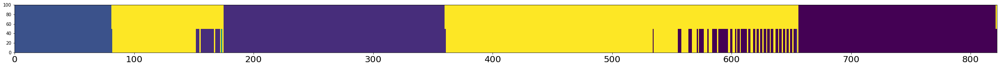

A,P,R:  0.8978102189781022 0.8368932038834952 1.0
Num frames:  (515, 84)
Accuracy:  0.8978102189781022
Person:  730
Transitions:  [5, 8, 4, 8, 1, 8, 1, 8, 2, 8, 4, 8, 5, 8]
GT transitions:  6
Transitions captured:  6


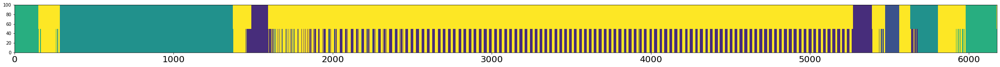

A,P,R:  0.6641839378238342 0.47645711376940697 0.9739854318418314
Num frames:  (3929, 2024)
Accuracy:  0.6641839378238342
Person:  731
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


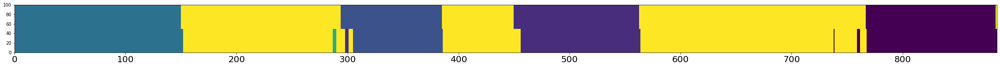

A,P,R:  0.9661016949152542 0.967948717948718 0.9617834394904459
Num frames:  (468, 12)
Accuracy:  0.9661016949152542
Person:  732
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


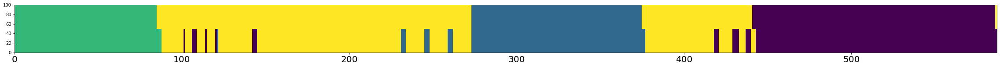

A,P,R:  0.9369676320272572 0.9041095890410958 0.9939759036144579
Num frames:  (365, 35)
Accuracy:  0.9369676320272572
Person:  733
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


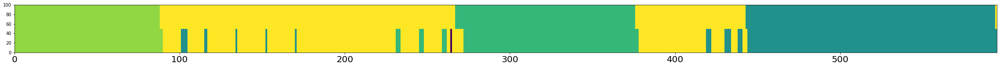

A,P,R:  0.9327731092436975 0.9095744680851063 0.9827586206896551
Num frames:  (376, 34)
Accuracy:  0.9327731092436975
Person:  734
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


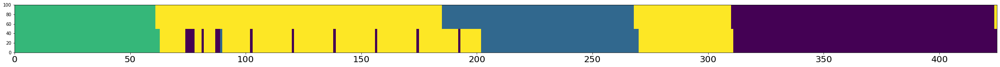

A,P,R:  0.9152941176470588 0.9266409266409267 0.9302325581395349
Num frames:  (259, 18)
Accuracy:  0.9152941176470588
Person:  735
Transitions:  [3, 8, 2, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  4
Transitions captured:  3


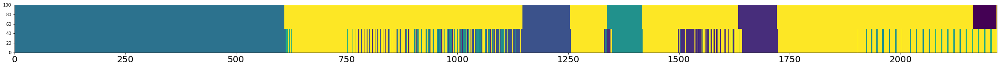

A,P,R:  0.8038773669972948 0.6942880128720836 0.9210245464247598
Num frames:  (1243, 361)
Accuracy:  0.8038773669972948
Person:  736
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


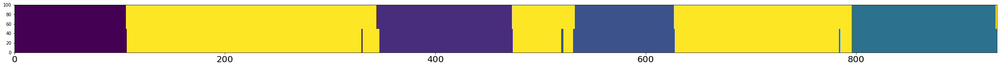

A,P,R:  0.9860813704496788 0.9788583509513742 0.9935622317596566
Num frames:  (473, 10)
Accuracy:  0.9860813704496788
Person:  737
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


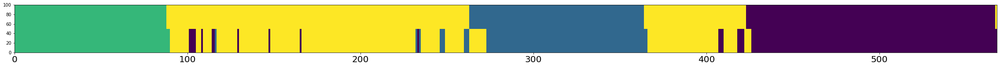

A,P,R:  0.920774647887324 0.9090909090909091 0.960960960960961
Num frames:  (352, 32)
Accuracy:  0.920774647887324
Person:  738
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


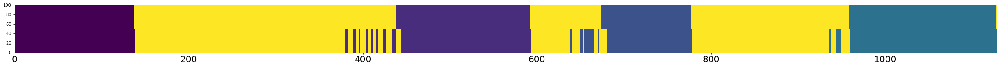

A,P,R:  0.9397163120567376 0.9102990033222591 0.9750889679715302
Num frames:  (602, 54)
Accuracy:  0.9397163120567376
Person:  739
Transitions:  [0, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


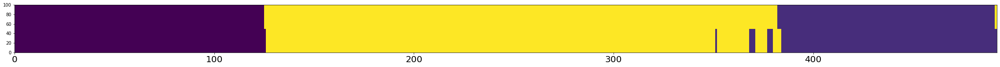

A,P,R:  0.9776422764227642 0.9626556016597511 0.9914529914529915
Num frames:  (241, 9)
Accuracy:  0.9776422764227642
Person:  740
Transitions:  [1, 8, 4, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


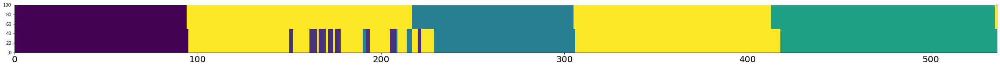

A,P,R:  0.9123134328358209 0.8996865203761756 0.944078947368421
Num frames:  (319, 30)
Accuracy:  0.9123134328358209
Person:  741
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  2


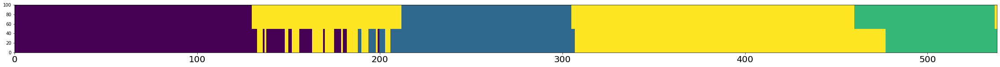

A,P,R:  0.8773234200743495 0.8524096385542169 0.9433333333333334
Num frames:  (332, 49)
Accuracy:  0.8773234200743495
Person:  742
Transitions:  [0, 8, 4, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


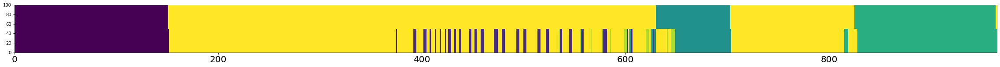

A,P,R:  0.8922279792746114 0.7967289719626168 0.9393939393939394
Num frames:  (428, 82)
Accuracy:  0.8922279792746114
Person:  743
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



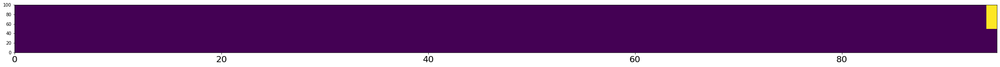

A,P,R:  0.9894736842105263 0.9894736842105263 1.0
Num frames:  (95, 1)
Accuracy:  0.9894736842105263
Person:  744
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  1


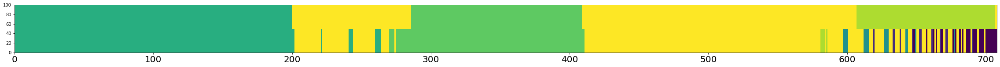

A,P,R:  0.807909604519774 0.7916666666666666 0.7635933806146572
Num frames:  (408, 36)
Accuracy:  0.807909604519774
Person:  745
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


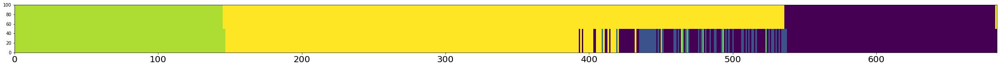

A,P,R:  0.8128654970760234 0.69377990430622 0.9931506849315068
Num frames:  (418, 126)
Accuracy:  0.8128654970760234
Person:  746
Transitions:  [0, 8, 1, 8, 4, 8]
GT transitions:  2
Transitions captured:  2


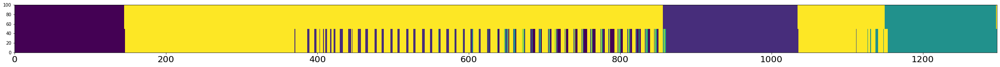

A,P,R:  0.8382126348228043 0.6916167664670658 0.9829787234042553
Num frames:  (668, 202)
Accuracy:  0.8382126348228043
Person:  747
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


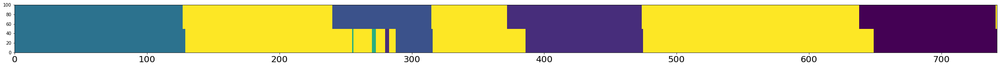

A,P,R:  0.894878706199461 0.9653179190751445 0.8206388206388207
Num frames:  (346, 5)
Accuracy:  0.894878706199461
Person:  748
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


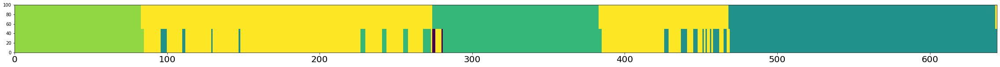

A,P,R:  0.9161490683229814 0.8799019607843137 0.9782016348773842
Num frames:  (408, 46)
Accuracy:  0.9161490683229814
Person:  749
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


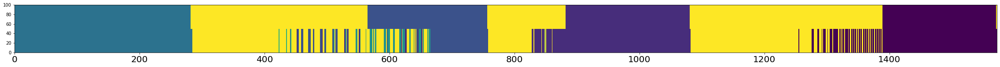

A,P,R:  0.8295165394402035 0.776519052523172 0.8818713450292398
Num frames:  (971, 167)
Accuracy:  0.8295165394402035
Person:  750
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


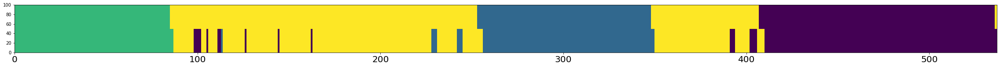

A,P,R:  0.9348230912476723 0.9126506024096386 0.9805825242718447
Num frames:  (332, 29)
Accuracy:  0.9348230912476723
Person:  751
Transitions:  [0, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


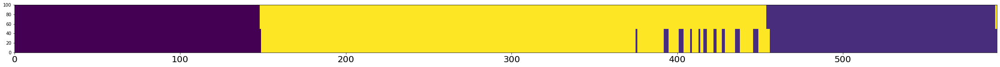

A,P,R:  0.9578414839797639 0.9250814332247557 0.993006993006993
Num frames:  (307, 23)
Accuracy:  0.9578414839797639
Person:  752
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  1


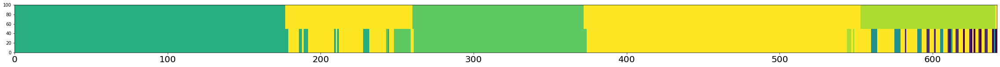

A,P,R:  0.8099688473520249 0.8158640226628895 0.7639257294429708
Num frames:  (353, 33)
Accuracy:  0.8099688473520249
Person:  753
Transitions:  [1, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


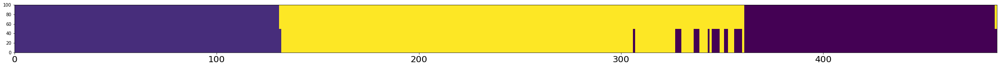

A,P,R:  0.9588477366255144 0.9272727272727272 1.0
Num frames:  (275, 20)
Accuracy:  0.9588477366255144
Person:  754
Transitions:  [5, 8, 6, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  4
Transitions captured:  3


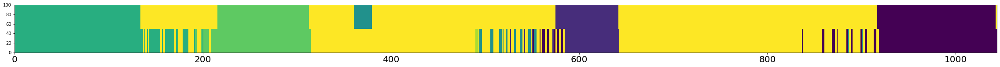

A,P,R:  0.8563218390804598 0.7700934579439253 0.9300225733634312
Num frames:  (535, 119)
Accuracy:  0.8563218390804598
Person:  755
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



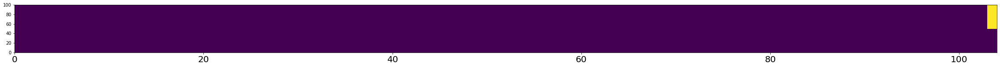

A,P,R:  0.9903846153846154 0.9903846153846154 1.0
Num frames:  (104, 1)
Accuracy:  0.9903846153846154
Person:  756
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


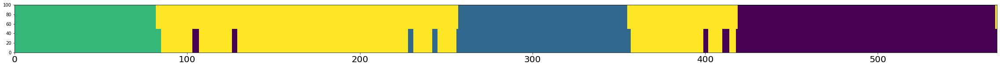

A,P,R:  0.9507908611599297 0.9215686274509803 1.0
Num frames:  (357, 28)
Accuracy:  0.9507908611599297
Person:  757
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


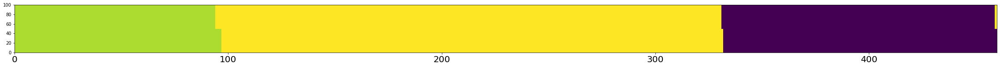

A,P,R:  0.9891304347826086 0.9822222222222222 0.9954954954954955
Num frames:  (225, 4)
Accuracy:  0.9891304347826086
Person:  758
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



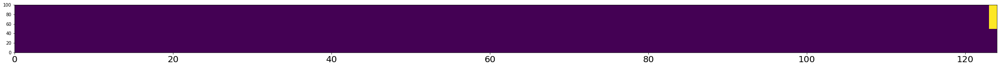

A,P,R:  0.9919354838709677 0.9919354838709677 1.0
Num frames:  (124, 1)
Accuracy:  0.9919354838709677
Person:  759
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


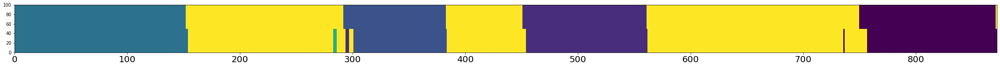

A,P,R:  0.9678899082568807 0.974304068522484 0.959915611814346
Num frames:  (467, 9)
Accuracy:  0.9678899082568807
Person:  760
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  2


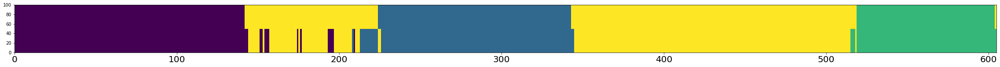

A,P,R:  0.943801652892562 0.9148936170212766 0.9942196531791907
Num frames:  (376, 32)
Accuracy:  0.943801652892562
Person:  761
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


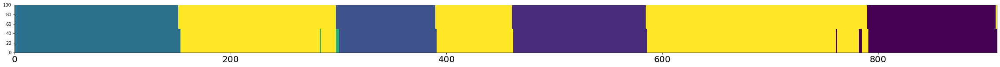

A,P,R:  0.9824175824175824 0.9717171717171718 0.9876796714579056
Num frames:  (495, 10)
Accuracy:  0.9824175824175824
Person:  762
Transitions:  [0, 8, 1, 8, 2, 8]
GT transitions:  2
Transitions captured:  2


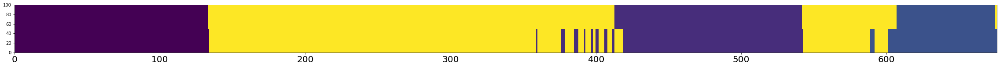

A,P,R:  0.9511834319526628 0.9230769230769231 0.9818181818181818
Num frames:  (351, 27)
Accuracy:  0.9511834319526628
Person:  763
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


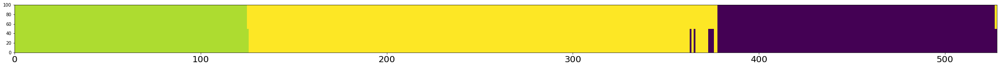

A,P,R:  0.9867424242424242 0.9750889679715302 1.0
Num frames:  (281, 7)
Accuracy:  0.9867424242424242
Person:  764
Transitions:  [4, 8, 5, 8]
GT transitions:  1
Transitions captured:  1


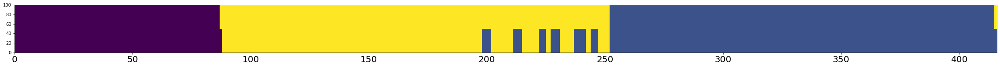

A,P,R:  0.9399038461538461 0.9090909090909091 1.0
Num frames:  (275, 25)
Accuracy:  0.9399038461538461
Person:  765
Transitions:  [0, 8]
GT transitions:  0
Transitions captured:  0



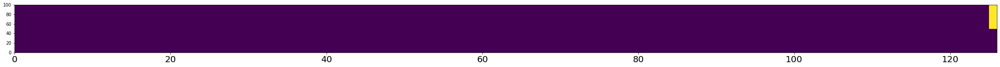

A,P,R:  0.9920634920634921 0.9920634920634921 1.0
Num frames:  (126, 1)
Accuracy:  0.9920634920634921
Person:  766
Transitions:  [1, 8, 4, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


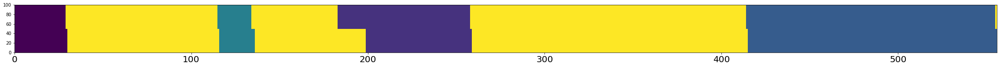

A,P,R:  0.9586330935251799 0.9800796812749004 0.9318181818181818
Num frames:  (251, 5)
Accuracy:  0.9586330935251799
Person:  767
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



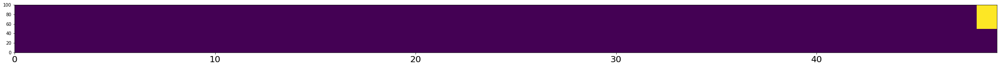

A,P,R:  0.9795918367346939 0.9795918367346939 1.0
Num frames:  (49, 1)
Accuracy:  0.9795918367346939
Person:  768
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



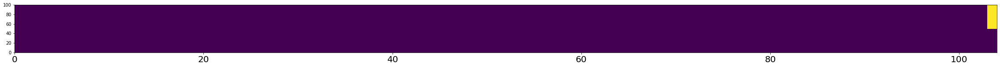

A,P,R:  0.9903846153846154 0.9903846153846154 1.0
Num frames:  (104, 1)
Accuracy:  0.9903846153846154
Person:  769
Transitions:  [0, 8, 1, 8, 4, 8, 5, 8]
GT transitions:  3
Transitions captured:  3


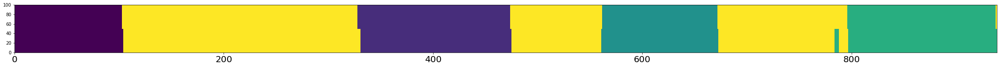

A,P,R:  0.9861554845580405 0.9822134387351779 0.9920159680638723
Num frames:  (506, 9)
Accuracy:  0.9861554845580405
Person:  770
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  2


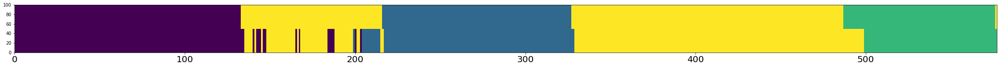

A,P,R:  0.9237435008665511 0.9116809116809117 0.960960960960961
Num frames:  (351, 31)
Accuracy:  0.9237435008665511
Person:  771
Transitions:  [5, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


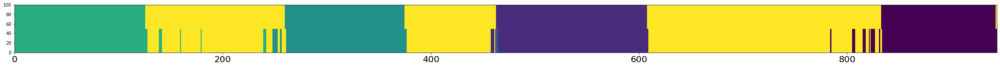

A,P,R:  0.9555084745762712 0.924812030075188 0.9919354838709677
Num frames:  (532, 38)
Accuracy:  0.9555084745762712
Person:  772
Transitions:  [5, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


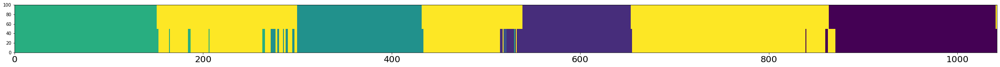

A,P,R:  0.9433781190019194 0.9161290322580645 0.9878260869565217
Num frames:  (620, 52)
Accuracy:  0.9433781190019194
Person:  773
Transitions:  [5, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


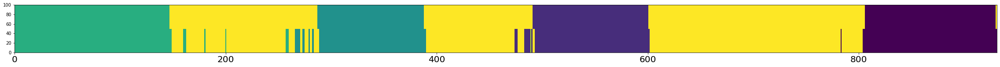

A,P,R:  0.9548872180451128 0.9263565891472868 0.991701244813278
Num frames:  (516, 38)
Accuracy:  0.9548872180451128
Person:  774
Transitions:  [5, 8, 4, 8, 1, 8]
GT transitions:  2
Transitions captured:  2


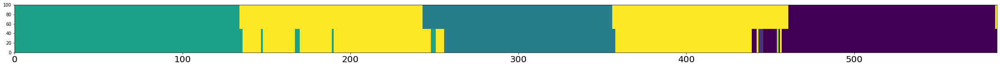

A,P,R:  0.9264957264957265 0.9153846153846154 0.9648648648648649
Num frames:  (390, 30)
Accuracy:  0.9264957264957265
Person:  775
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


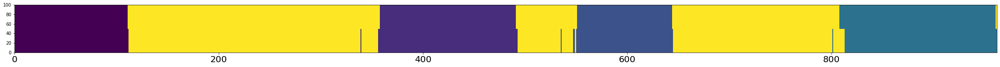

A,P,R:  0.9812889812889813 0.9738955823293173 0.9897959183673469
Num frames:  (498, 13)
Accuracy:  0.9812889812889813
Person:  776
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


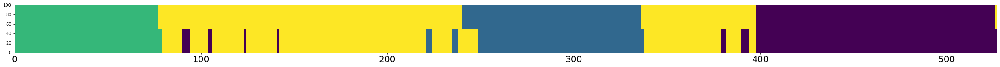

A,P,R:  0.9335863377609108 0.9182389937106918 0.9700996677740864
Num frames:  (318, 26)
Accuracy:  0.9335863377609108
Person:  777
Transitions:  [1, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


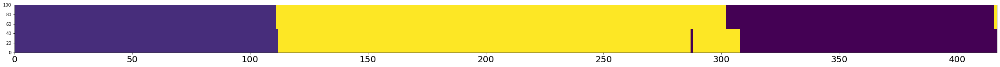

A,P,R:  0.9784172661870504 0.9864864864864865 0.9733333333333334
Num frames:  (222, 3)
Accuracy:  0.9784172661870504
Person:  778
Transitions:  [5, 8, 6, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  4
Transitions captured:  3


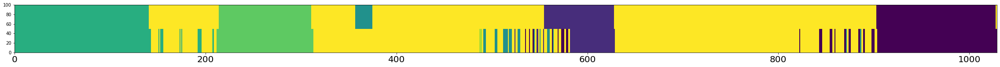

A,P,R:  0.8872691933916423 0.8343558282208589 0.8986784140969163
Num frames:  (489, 70)
Accuracy:  0.8872691933916423
Person:  779
Transitions:  [4, 8, 5, 8]
GT transitions:  1
Transitions captured:  1


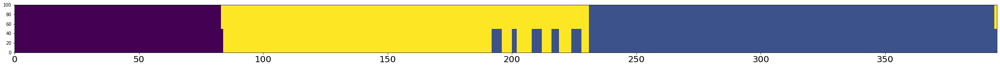

A,P,R:  0.9518987341772152 0.9283018867924528 1.0
Num frames:  (265, 19)
Accuracy:  0.9518987341772152
Person:  780
Transitions:  [6, 8, 5, 8]
GT transitions:  1
Transitions captured:  1


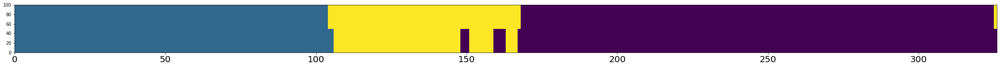

A,P,R:  0.9662576687116564 0.9595588235294118 1.0
Num frames:  (272, 11)
Accuracy:  0.9662576687116564
Person:  781
Transitions:  [5, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


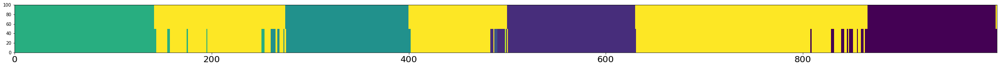

A,P,R:  0.9408224674022067 0.9020618556701031 0.9962049335863378
Num frames:  (582, 57)
Accuracy:  0.9408224674022067
Person:  782
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  2


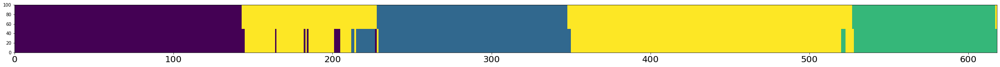

A,P,R:  0.948220064724919 0.9212598425196851 0.9943342776203966
Num frames:  (381, 30)
Accuracy:  0.948220064724919
Person:  783
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



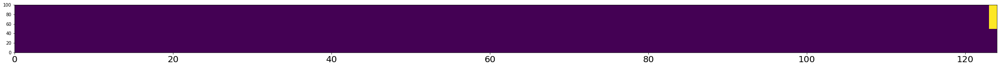

A,P,R:  0.9919354838709677 0.9919354838709677 1.0
Num frames:  (124, 1)
Accuracy:  0.9919354838709677
Person:  784
Transitions:  [0, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


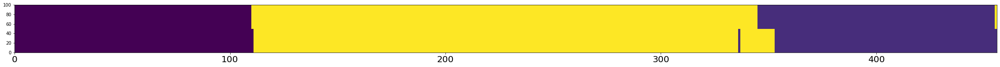

A,P,R:  0.9758771929824561 0.986046511627907 0.9636363636363636
Num frames:  (215, 3)
Accuracy:  0.9758771929824561
Person:  785
Transitions:  [1, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


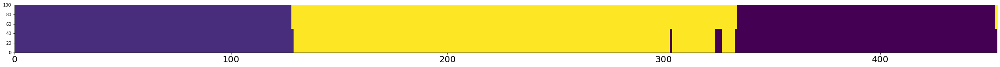

A,P,R:  0.9845814977973568 0.9724409448818898 1.0
Num frames:  (254, 7)
Accuracy:  0.9845814977973568
Person:  786
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



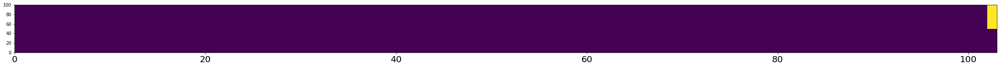

A,P,R:  0.9902912621359223 0.9902912621359223 1.0
Num frames:  (103, 1)
Accuracy:  0.9902912621359223
Person:  787
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


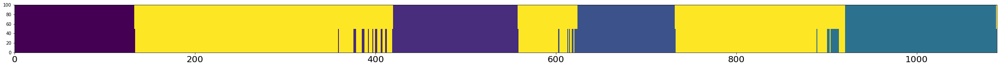

A,P,R:  0.9623507805325987 0.9301533219761499 1.0
Num frames:  (587, 41)
Accuracy:  0.9623507805325987
Person:  788
Transitions:  [5, 8, 4, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  4
Transitions captured:  3


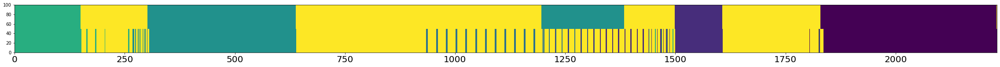

A,P,R:  0.8609865470852018 0.872113676731794 0.8307952622673435
Num frames:  (1126, 110)
Accuracy:  0.8609865470852018
Person:  789
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


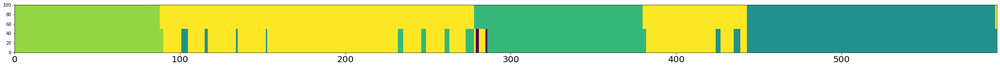

A,P,R:  0.9292929292929293 0.8997289972899729 0.9764705882352941
Num frames:  (369, 34)
Accuracy:  0.9292929292929293
Person:  790
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



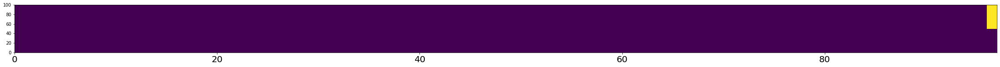

A,P,R:  0.9896907216494846 0.9896907216494846 1.0
Num frames:  (97, 1)
Accuracy:  0.9896907216494846
Person:  791
Transitions:  [5, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


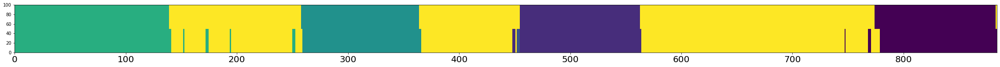

A,P,R:  0.9660633484162896 0.95 0.987012987012987
Num frames:  (480, 24)
Accuracy:  0.9660633484162896
Person:  792
Transitions:  [0, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


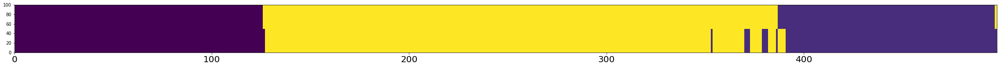

A,P,R:  0.9718875502008032 0.9586776859504132 0.9830508474576272
Num frames:  (242, 10)
Accuracy:  0.9718875502008032
Person:  793
Transitions:  [3, 8, 2, 8, 4, 8, 1, 8]
GT transitions:  3
Transitions captured:  2


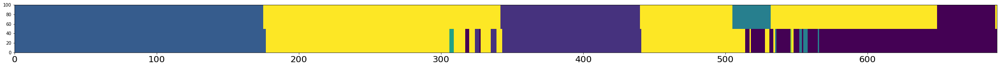

A,P,R:  0.7670043415340086 0.6804347826086956 0.9178885630498533
Num frames:  (460, 133)
Accuracy:  0.7670043415340086
Person:  794
Transitions:  [5, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


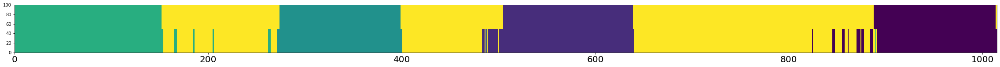

A,P,R:  0.9438423645320198 0.9066213921901528 0.994413407821229
Num frames:  (589, 54)
Accuracy:  0.9438423645320198
Person:  795
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


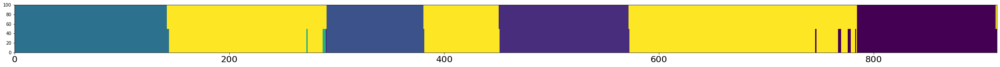

A,P,R:  0.9792349726775956 0.9639278557114228 0.9979253112033195
Num frames:  (499, 18)
Accuracy:  0.9792349726775956
Person:  796
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


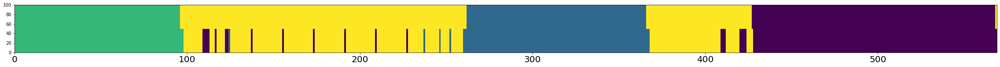

A,P,R:  0.9437609841827768 0.9164420485175202 0.9970674486803519
Num frames:  (371, 31)
Accuracy:  0.9437609841827768
Person:  797
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


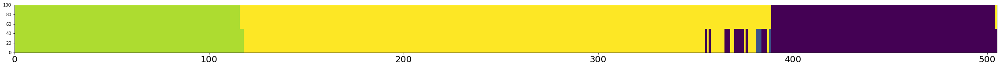

A,P,R:  0.9584158415841584 0.9166666666666666 1.0
Num frames:  (252, 21)
Accuracy:  0.9584158415841584
Person:  798
Transitions:  [0, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


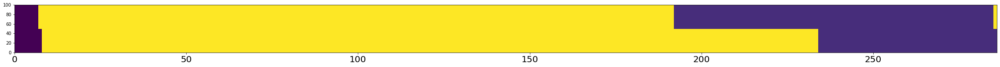

A,P,R:  0.8461538461538461 0.9666666666666667 0.58
Num frames:  (60, 2)
Accuracy:  0.8461538461538461
Person:  799
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



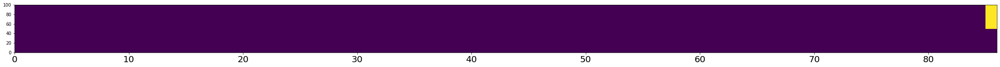

A,P,R:  0.9883720930232558 0.9883720930232558 1.0
Num frames:  (86, 1)
Accuracy:  0.9883720930232558
Person:  800
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



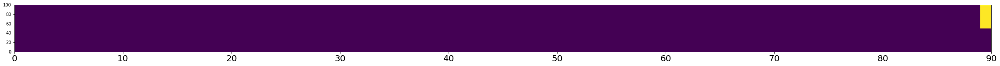

A,P,R:  0.9888888888888889 0.9888888888888889 1.0
Num frames:  (90, 1)
Accuracy:  0.9888888888888889
Person:  801
Transitions:  [3, 8, 2, 8, 1, 8, 1, 8, 4, 8, 4, 8]
GT transitions:  5
Transitions captured:  5


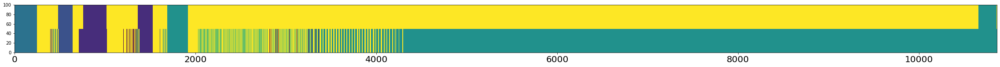

A,P,R:  0.2911450662739323 0.1383527827648115 0.9785714285714285
Num frames:  (8912, 7674)
Accuracy:  0.2911450662739323
Person:  802
Transitions:  [3, 8, 2, 8, 4, 8, 1, 8]
GT transitions:  3
Transitions captured:  2


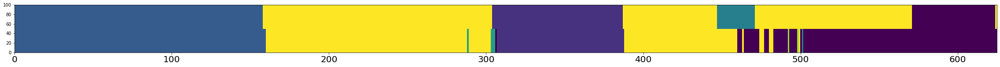

A,P,R:  0.7984 0.7220843672456576 0.9150943396226415
Num frames:  (403, 99)
Accuracy:  0.7984
Person:  803
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


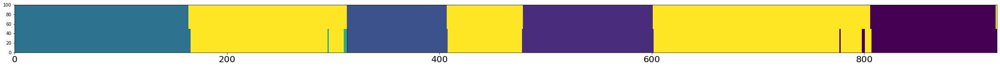

A,P,R:  0.9827027027027027 0.9706457925636007 0.9959839357429718
Num frames:  (511, 14)
Accuracy:  0.9827027027027027
Person:  804
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


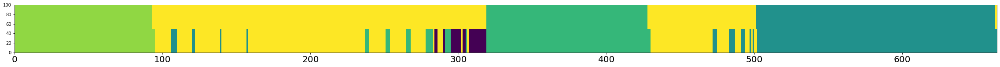

A,P,R:  0.8960843373493976 0.8422273781902552 0.9972527472527473
Num frames:  (431, 68)
Accuracy:  0.8960843373493976
Person:  805
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


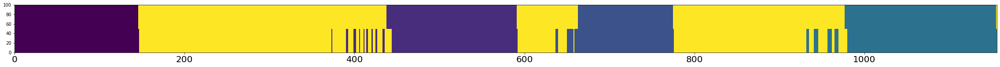

A,P,R:  0.9446366782006921 0.9133858267716536 0.9847198641765704
Num frames:  (635, 55)
Accuracy:  0.9446366782006921
Person:  806
Transitions:  [0, 8, 1, 8, 4, 8, 5, 8]
GT transitions:  3
Transitions captured:  3


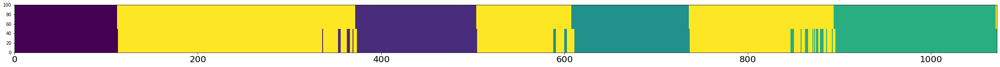

A,P,R:  0.9598880597014925 0.9377162629757786 0.9872495446265938
Num frames:  (578, 36)
Accuracy:  0.9598880597014925
Person:  807
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



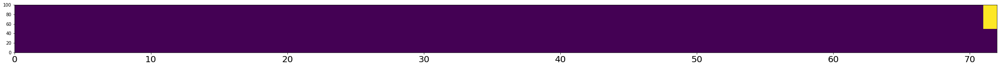

A,P,R:  0.9861111111111112 0.9861111111111112 1.0
Num frames:  (72, 1)
Accuracy:  0.9861111111111112
Person:  808
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



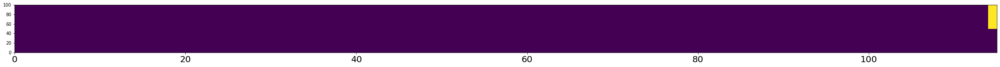

A,P,R:  0.991304347826087 0.991304347826087 1.0
Num frames:  (115, 1)
Accuracy:  0.991304347826087
Person:  809
Transitions:  [5, 8, 4, 8]
GT transitions:  1
Transitions captured:  1


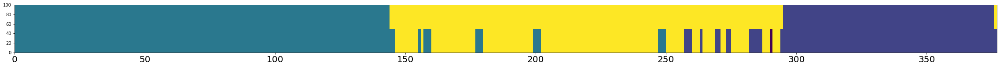

A,P,R:  0.9177718832891246 0.87890625 1.0
Num frames:  (256, 31)
Accuracy:  0.9177718832891246
Person:  810
Transitions:  [1, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


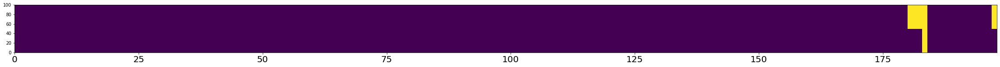

A,P,R:  0.9797979797979798 0.9796954314720813 1.0
Num frames:  (197, 4)
Accuracy:  0.9797979797979798
Person:  811
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


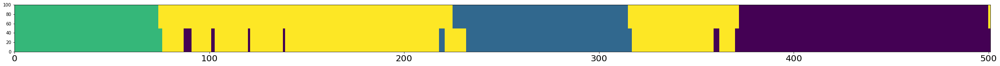

A,P,R:  0.9441117764471058 0.9313725490196079 0.976027397260274
Num frames:  (306, 21)
Accuracy:  0.9441117764471058
Person:  812
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



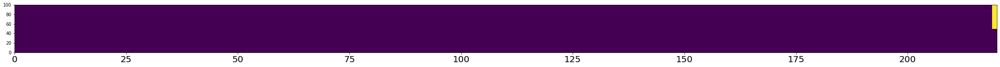

A,P,R:  0.9954545454545455 0.9954545454545455 1.0
Num frames:  (220, 1)
Accuracy:  0.9954545454545455
Person:  813
Transitions:  [0, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


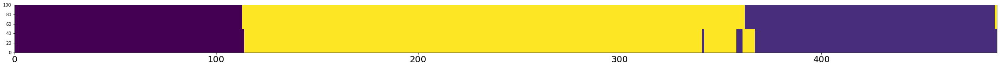

A,P,R:  0.9774127310061602 0.9747899159663865 0.9789029535864979
Num frames:  (238, 6)
Accuracy:  0.9774127310061602
Person:  814
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



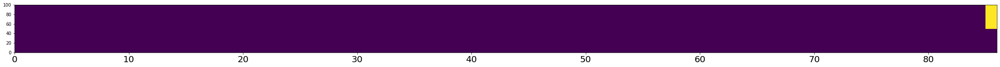

A,P,R:  0.9883720930232558 0.9883720930232558 1.0
Num frames:  (86, 1)
Accuracy:  0.9883720930232558
Person:  815
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  2


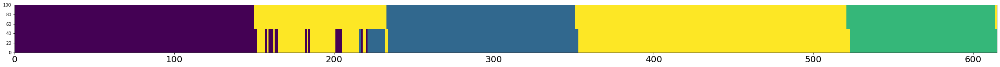

A,P,R:  0.9447154471544715 0.9203084832904884 0.9916897506925207
Num frames:  (389, 31)
Accuracy:  0.9447154471544715
Person:  816
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  0


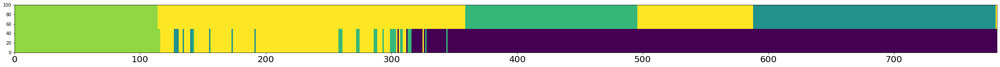

A,P,R:  0.36061381074168797 0.18566775244299674 0.25675675675675674
Num frames:  (614, 170)
Accuracy:  0.36061381074168797
Person:  817
Transitions:  [2, 8, 4, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


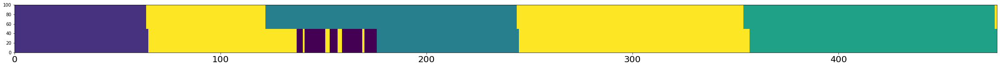

A,P,R:  0.8742138364779874 0.8745644599303136 0.814935064935065
Num frames:  (287, 3)
Accuracy:  0.8742138364779874
Person:  818
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  2


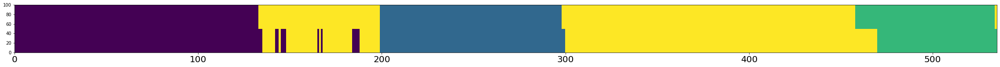

A,P,R:  0.9476635514018692 0.9487179487179487 0.961038961038961
Num frames:  (312, 16)
Accuracy:  0.9476635514018692
Person:  819
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  2


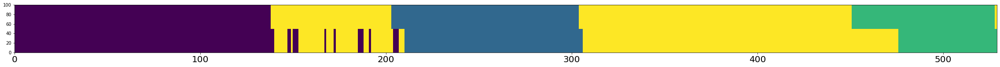

A,P,R:  0.9092627599243857 0.9372937293729373 0.8987341772151899
Num frames:  (303, 16)
Accuracy:  0.9092627599243857
Person:  820
Transitions:  [5, 8, 4, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  4
Transitions captured:  3


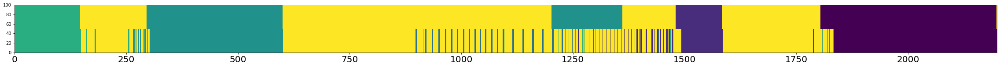

A,P,R:  0.844474761255116 0.8409728718428437 0.8106402164111812
Num frames:  (1069, 132)
Accuracy:  0.844474761255116
Person:  821
Transitions:  [0, 8, 1, 8, 1, 8]
GT transitions:  2
Transitions captured:  2


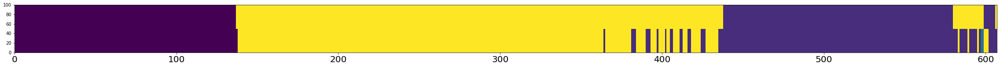

A,P,R:  0.9308072487644151 0.8788819875776398 0.9895104895104895
Num frames:  (322, 39)
Accuracy:  0.9308072487644151
Person:  822
Transitions:  [0, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


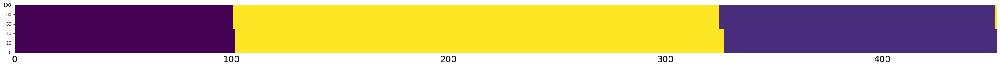

A,P,R:  0.9911699779249448 0.9912280701754386 0.9912280701754386
Num frames:  (228, 2)
Accuracy:  0.9911699779249448
Person:  823
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


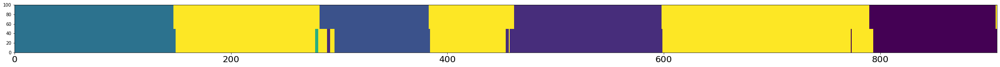

A,P,R:  0.9625550660792952 0.9621513944223108 0.9640718562874252
Num frames:  (502, 16)
Accuracy:  0.9625550660792952
Person:  824
Transitions:  [2, 8, 4, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


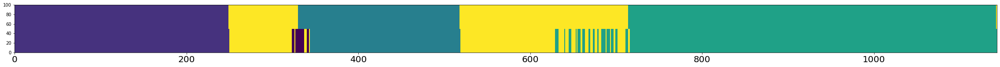

A,P,R:  0.9431321084864392 0.9350220264317181 0.9815028901734104
Num frames:  (908, 49)
Accuracy:  0.9431321084864392
Person:  825
Transitions:  [1, 8]
GT transitions:  0
Transitions captured:  0



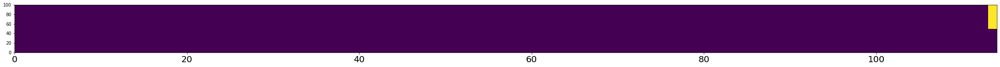

A,P,R:  0.9912280701754386 0.9912280701754386 1.0
Num frames:  (114, 1)
Accuracy:  0.9912280701754386
Person:  826
Transitions:  [0, 8, 1, 8, 4, 8, 5, 8]
GT transitions:  3
Transitions captured:  3


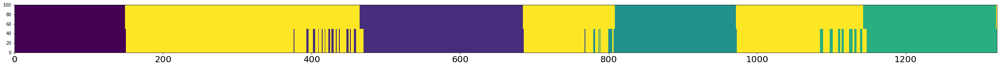

A,P,R:  0.9433106575963719 0.9151436031331592 0.9859353023909986
Num frames:  (766, 65)
Accuracy:  0.9433106575963719
Person:  827
Transitions:  [1, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


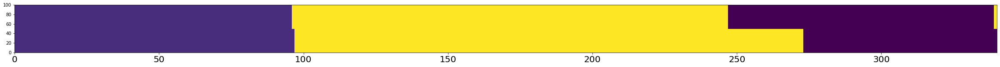

A,P,R:  0.9176470588235294 0.9878048780487805 0.8617021276595744
Num frames:  (164, 2)
Accuracy:  0.9176470588235294
Person:  828
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



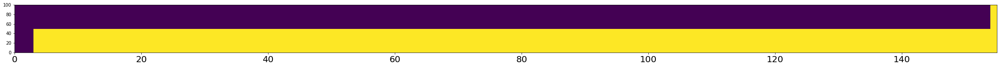

A,P,R:  0.025806451612903226 1.0 0.01948051948051948
Num frames:  (3, 0)
Accuracy:  0.025806451612903226
Person:  829
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  1


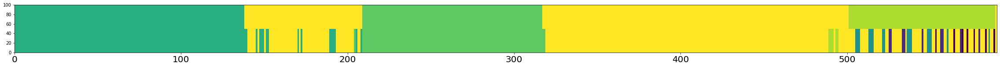

A,P,R:  0.8101694915254237 0.8145695364238411 0.7365269461077845
Num frames:  (302, 24)
Accuracy:  0.8101694915254237
Person:  830
Transitions:  [0, 8, 7, 8]
GT transitions:  1
Transitions captured:  0


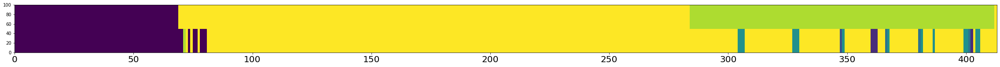

A,P,R:  0.6682808716707022 0.69 0.350253807106599
Num frames:  (100, 9)
Accuracy:  0.6682808716707022
Person:  831
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



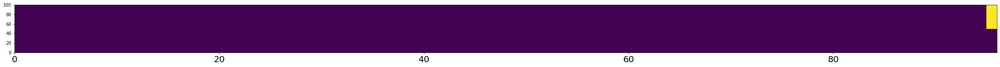

A,P,R:  0.9895833333333334 0.9895833333333334 1.0
Num frames:  (96, 1)
Accuracy:  0.9895833333333334
Person:  832
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  2


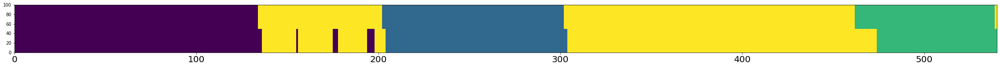

A,P,R:  0.95 0.9580645161290322 0.954983922829582
Num frames:  (310, 13)
Accuracy:  0.95
Person:  833
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



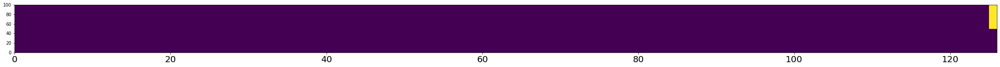

A,P,R:  0.9920634920634921 0.9920634920634921 1.0
Num frames:  (126, 1)
Accuracy:  0.9920634920634921
Person:  834
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


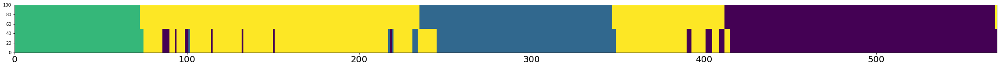

A,P,R:  0.9210526315789473 0.9113573407202216 0.9619883040935673
Num frames:  (361, 32)
Accuracy:  0.9210526315789473
Person:  835
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


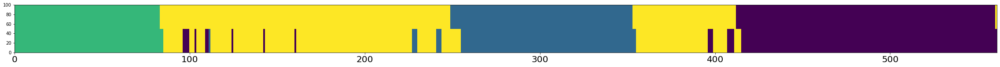

A,P,R:  0.9322638146167558 0.9183098591549296 0.9731343283582089
Num frames:  (355, 29)
Accuracy:  0.9322638146167558
Person:  836
Transitions:  [5, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


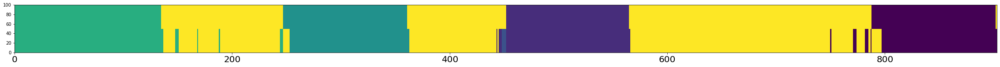

A,P,R:  0.9501661129568106 0.9389002036659878 0.9684873949579832
Num frames:  (491, 30)
Accuracy:  0.9501661129568106
Person:  837
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



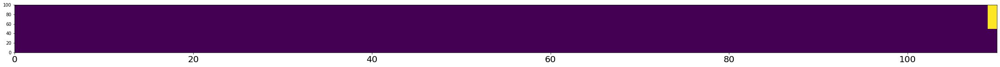

A,P,R:  0.990909090909091 0.990909090909091 1.0
Num frames:  (110, 1)
Accuracy:  0.990909090909091
Person:  838
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


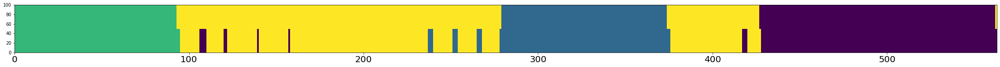

A,P,R:  0.9520426287744227 0.9252873563218391 0.9969040247678018
Num frames:  (348, 26)
Accuracy:  0.9520426287744227
Person:  839
Transitions:  [5, 8]
GT transitions:  0
Transitions captured:  0



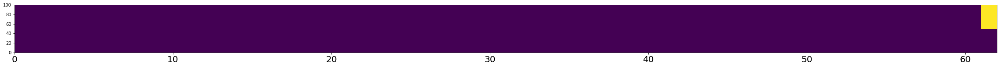

A,P,R:  0.9838709677419355 0.9838709677419355 1.0
Num frames:  (62, 1)
Accuracy:  0.9838709677419355
Person:  840
Transitions:  [1, 8, 2, 8, 3, 8]
GT transitions:  2
Transitions captured:  2


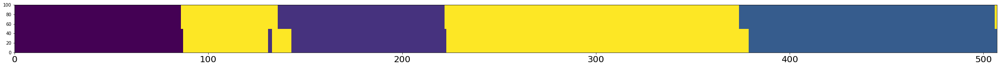

A,P,R:  0.9664694280078896 0.9831649831649831 0.9605263157894737
Num frames:  (297, 5)
Accuracy:  0.9664694280078896
Person:  841
Transitions:  [0, 8, 1, 8, 4, 8, 6, 8, 5, 8]
GT transitions:  4
Transitions captured:  4


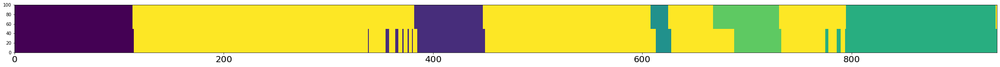

A,P,R:  0.9414270500532481 0.9326683291770573 0.9303482587064676
Num frames:  (401, 27)
Accuracy:  0.9414270500532481
Person:  842
Transitions:  [4, 8, 5, 8]
GT transitions:  1
Transitions captured:  1


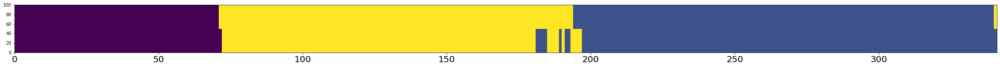

A,P,R:  0.9648093841642229 0.9596412556053812 0.9861751152073732
Num frames:  (223, 9)
Accuracy:  0.9648093841642229
Person:  843
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



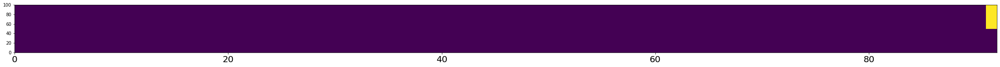

A,P,R:  0.9891304347826086 0.9891304347826086 1.0
Num frames:  (92, 1)
Accuracy:  0.9891304347826086
Person:  844
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



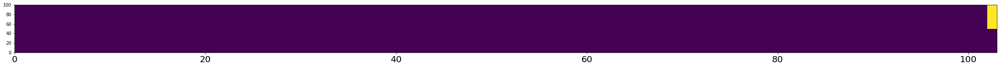

A,P,R:  0.9902912621359223 0.9902912621359223 1.0
Num frames:  (103, 1)
Accuracy:  0.9902912621359223
Person:  845
Transitions:  [0, 8, 1, 8, 4, 8, 5, 8]
GT transitions:  3
Transitions captured:  3


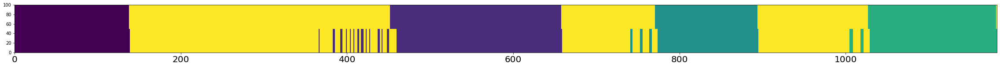

A,P,R:  0.9509306260575296 0.9310872894333844 0.9790660225442834
Num frames:  (653, 45)
Accuracy:  0.9509306260575296
Person:  846
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



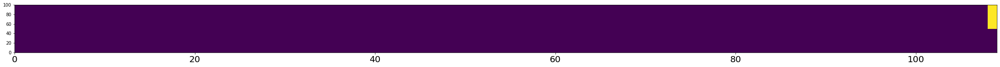

A,P,R:  0.9908256880733946 0.9908256880733946 1.0
Num frames:  (109, 1)
Accuracy:  0.9908256880733946
Person:  847
Transitions:  [0, 8, 7, 8]
GT transitions:  1
Transitions captured:  1


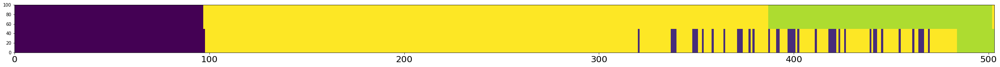

A,P,R:  0.7733598409542743 0.732484076433121 0.5424528301886793
Num frames:  (157, 17)
Accuracy:  0.7733598409542743
Person:  848
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



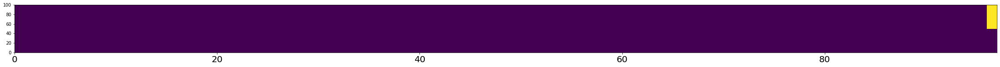

A,P,R:  0.9896907216494846 0.9896907216494846 1.0
Num frames:  (97, 1)
Accuracy:  0.9896907216494846
Person:  849
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


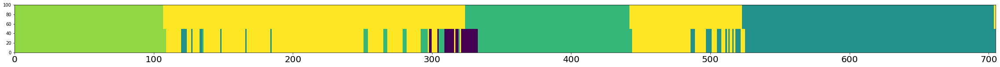

A,P,R:  0.8893617021276595 0.8386411889596603 0.9729064039408867
Num frames:  (471, 67)
Accuracy:  0.8893617021276595
Person:  850
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


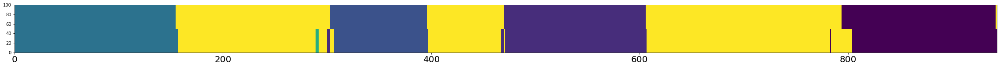

A,P,R:  0.968186638388123 0.9718045112781954 0.9718045112781954
Num frames:  (532, 15)
Accuracy:  0.968186638388123
Person:  851
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


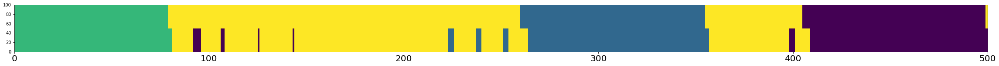

A,P,R:  0.934 0.9122807017543859 0.9701492537313433
Num frames:  (285, 25)
Accuracy:  0.934
Person:  852
Transitions:  [5, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


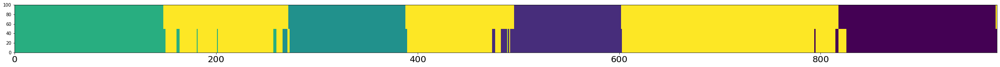

A,P,R:  0.9517948717948718 0.9315315315315316 0.9828897338403042
Num frames:  (555, 38)
Accuracy:  0.9517948717948718
Person:  853
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



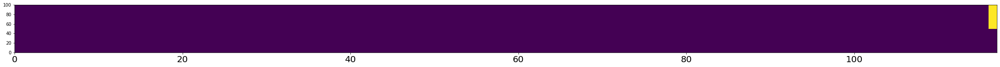

A,P,R:  0.9914529914529915 0.9914529914529915 1.0
Num frames:  (117, 1)
Accuracy:  0.9914529914529915
Person:  854
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



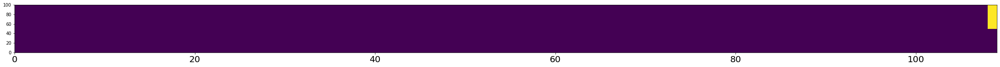

A,P,R:  0.9908256880733946 0.9908256880733946 1.0
Num frames:  (109, 1)
Accuracy:  0.9908256880733946
Person:  855
Transitions:  [3, 8, 2, 8, 1, 8]
GT transitions:  2
Transitions captured:  2


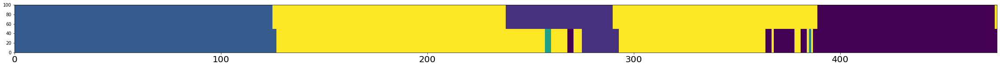

A,P,R:  0.8697478991596639 0.8793774319066148 0.8593155893536122
Num frames:  (257, 25)
Accuracy:  0.8697478991596639
Person:  856
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


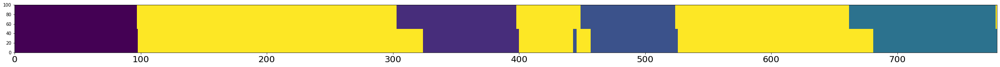

A,P,R:  0.926829268292683 0.9738372093023255 0.8746736292428199
Num frames:  (344, 9)
Accuracy:  0.926829268292683
Person:  857
Transitions:  [5, 8, 4, 8, 1, 8]
GT transitions:  2
Transitions captured:  2


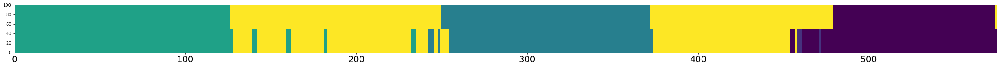

A,P,R:  0.9147826086956522 0.8828125 0.9883381924198251
Num frames:  (384, 45)
Accuracy:  0.9147826086956522
Person:  858
Transitions:  [0, 8, 1, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


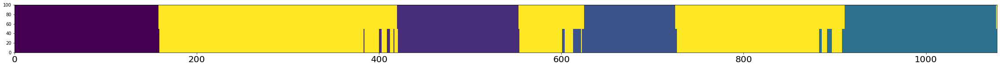

A,P,R:  0.963821892393321 0.936026936026936 0.9982046678635548
Num frames:  (594, 38)
Accuracy:  0.963821892393321
Person:  859
Transitions:  [7, 8, 1, 8]
GT transitions:  1
Transitions captured:  0


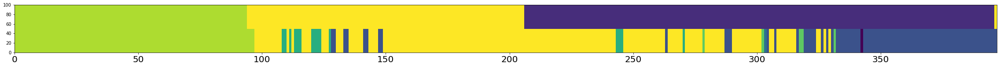

A,P,R:  0.4634760705289673 0.4563106796116505 0.33098591549295775
Num frames:  (206, 23)
Accuracy:  0.4634760705289673
Person:  860
Transitions:  [0, 8, 1, 8, 2, 8]
GT transitions:  2
Transitions captured:  2


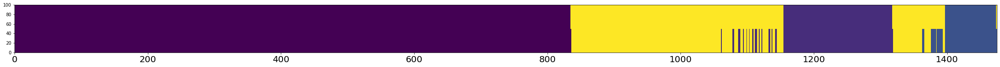

A,P,R:  0.9681355932203389 0.9581105169340464 1.0
Num frames:  (1122, 47)
Accuracy:  0.9681355932203389
Person:  861
Transitions:  [1, 8, 4, 8, 2, 8, 3, 8]
GT transitions:  3
Transitions captured:  3


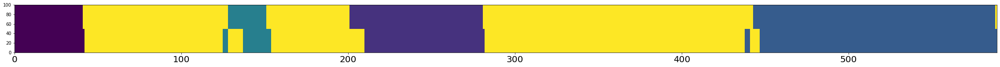

A,P,R:  0.9422750424448217 0.956989247311828 0.9238754325259516
Num frames:  (279, 12)
Accuracy:  0.9422750424448217
Person:  862
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



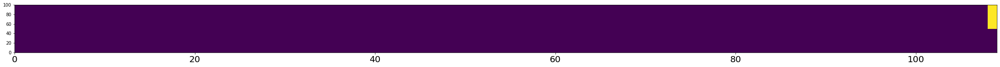

A,P,R:  0.9908256880733946 0.9908256880733946 1.0
Num frames:  (109, 1)
Accuracy:  0.9908256880733946
Person:  863
Transitions:  [0, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


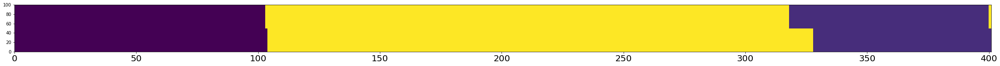

A,P,R:  0.970074812967581 0.9887005649717514 0.9459459459459459
Num frames:  (177, 2)
Accuracy:  0.970074812967581
Person:  864
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



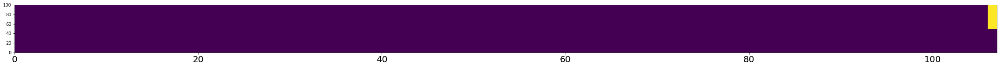

A,P,R:  0.9906542056074766 0.9906542056074766 1.0
Num frames:  (107, 1)
Accuracy:  0.9906542056074766
Person:  865
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



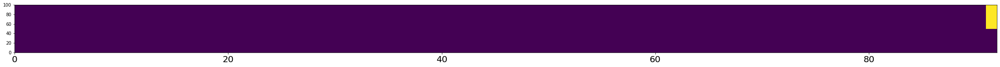

A,P,R:  0.9891304347826086 0.9891304347826086 1.0
Num frames:  (92, 1)
Accuracy:  0.9891304347826086
Person:  866
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  2


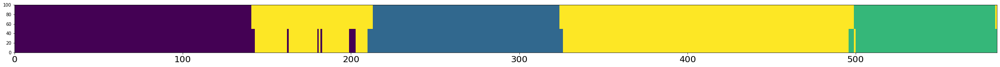

A,P,R:  0.9674657534246576 0.9490084985835694 0.9970238095238095
Num frames:  (353, 18)
Accuracy:  0.9674657534246576
Person:  867
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



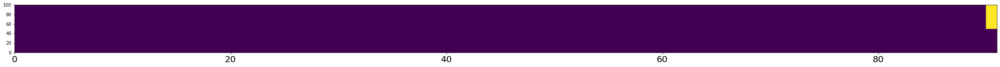

A,P,R:  0.989010989010989 0.989010989010989 1.0
Num frames:  (91, 1)
Accuracy:  0.989010989010989
Person:  868
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



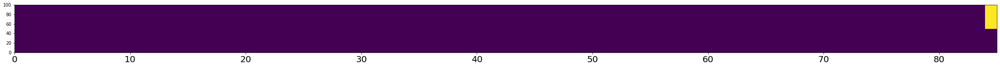

A,P,R:  0.9882352941176471 0.9882352941176471 1.0
Num frames:  (85, 1)
Accuracy:  0.9882352941176471
Person:  869
Transitions:  [0, 8, 1, 8, 4, 8, 5, 8]
GT transitions:  3
Transitions captured:  3


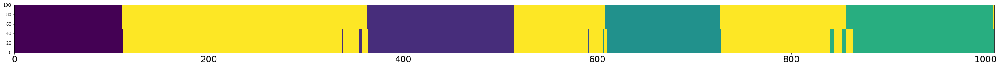

A,P,R:  0.9722497522299306 0.9666666666666667 0.981203007518797
Num frames:  (540, 18)
Accuracy:  0.9722497522299306
Person:  870
Transitions:  [5, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


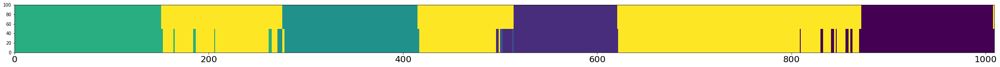

A,P,R:  0.9474727452923687 0.9123711340206185 0.9962476547842402
Num frames:  (582, 51)
Accuracy:  0.9474727452923687
Person:  871
Transitions:  [0, 8, 1, 8, 4, 8, 5, 8]
GT transitions:  3
Transitions captured:  3


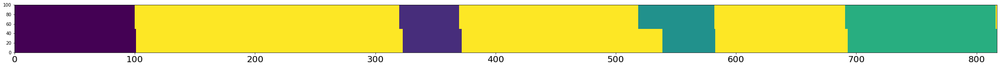

A,P,R:  0.9632802937576499 0.9842767295597484 0.9260355029585798
Num frames:  (318, 5)
Accuracy:  0.9632802937576499
Person:  872
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  2


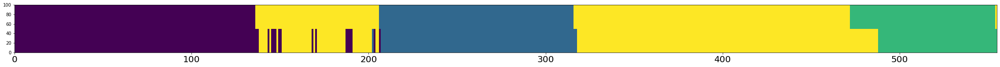

A,P,R:  0.9351351351351351 0.9395770392749244 0.948170731707317
Num frames:  (331, 19)
Accuracy:  0.9351351351351351
Person:  873
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



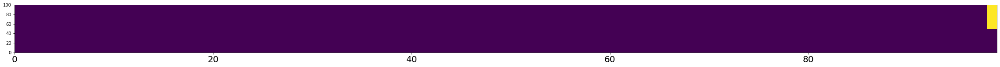

A,P,R:  0.98989898989899 0.98989898989899 1.0
Num frames:  (99, 1)
Accuracy:  0.98989898989899
Person:  874
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



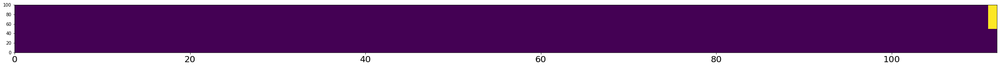

A,P,R:  0.9910714285714286 0.9910714285714286 1.0
Num frames:  (112, 1)
Accuracy:  0.9910714285714286
Person:  875
Transitions:  [1, 8, 1, 8, 2, 8, 5, 8, 6, 8, 4, 8]
GT transitions:  5
Transitions captured:  3


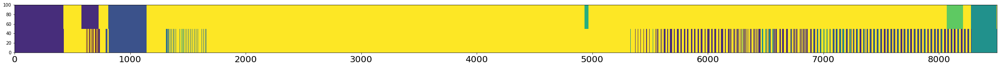

A,P,R:  0.8000705633305892 0.39487596583977225 0.7440613026819923
Num frames:  (2459, 1366)
Accuracy:  0.8000705633305892
Person:  876
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  2


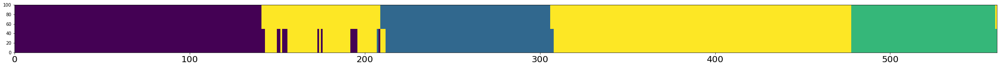

A,P,R:  0.9625668449197861 0.9462686567164179 0.990625
Num frames:  (335, 18)
Accuracy:  0.9625668449197861
Person:  877
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


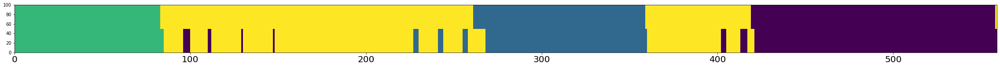

A,P,R:  0.9338103756708408 0.9174041297935103 0.971875
Num frames:  (339, 28)
Accuracy:  0.9338103756708408
Person:  878
Transitions:  [2, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


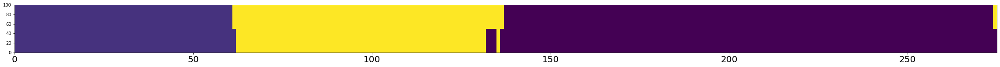

A,P,R:  0.9781818181818182 0.9705882352941176 1.0
Num frames:  (204, 6)
Accuracy:  0.9781818181818182
Person:  879
Transitions:  [3, 8, 2, 8, 1, 8]
GT transitions:  2
Transitions captured:  1


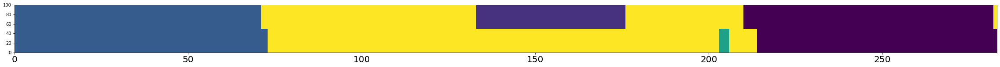

A,P,R:  0.8127208480565371 0.9586206896551724 0.7473118279569892
Num frames:  (145, 6)
Accuracy:  0.8127208480565371
Person:  880
Transitions:  [5, 8, 6, 8, 4, 8, 1, 8, 1, 8, 0, 8]
GT transitions:  5
Transitions captured:  3


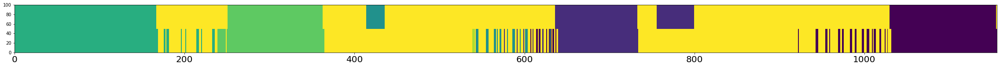

A,P,R:  0.8486159169550173 0.8263772954924875 0.873015873015873
Num frames:  (599, 103)
Accuracy:  0.8486159169550173
Person:  881
Transitions:  [5, 8, 4, 8]
GT transitions:  1
Transitions captured:  0


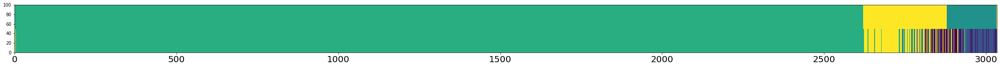

A,P,R:  0.9192485168094924 0.9183601962158374 0.944164265129683
Num frames:  (2854, 90)
Accuracy:  0.9192485168094924
Person:  882
Transitions:  [7, 8, 1, 8]
GT transitions:  1
Transitions captured:  0


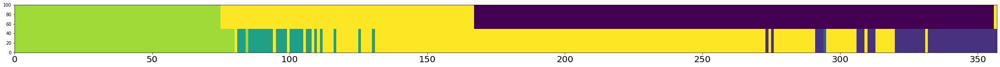

A,P,R:  0.37254901960784315 0.47770700636942676 0.2840909090909091
Num frames:  (157, 35)
Accuracy:  0.37254901960784315
Person:  883
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


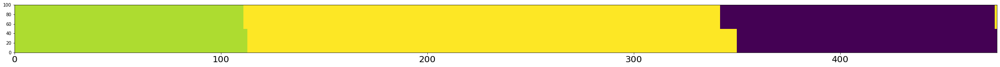

A,P,R:  0.976890756302521 0.9874476987447699 0.9672131147540983
Num frames:  (239, 3)
Accuracy:  0.976890756302521
Person:  884
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


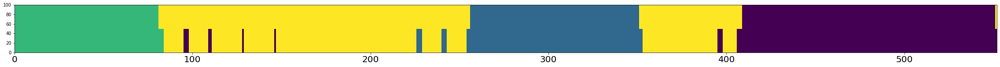

A,P,R:  0.9510869565217391 0.9217391304347826 1.0
Num frames:  (345, 27)
Accuracy:  0.9510869565217391
Person:  885
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  2


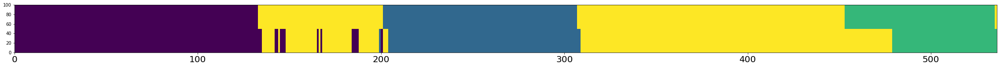

A,P,R:  0.9123134328358209 0.9419354838709677 0.9096573208722741
Num frames:  (310, 18)
Accuracy:  0.9123134328358209
Person:  886
Transitions:  [5, 8, 4, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


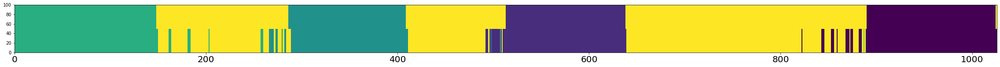

A,P,R:  0.9337231968810916 0.8903878583473862 0.9943502824858758
Num frames:  (593, 65)
Accuracy:  0.9337231968810916
Person:  887
Transitions:  [3, 8, 2, 8, 1, 8, 0, 8]
GT transitions:  3
Transitions captured:  3


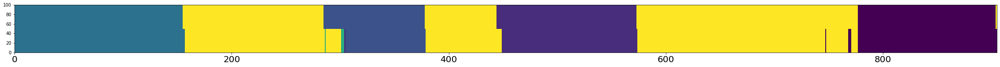

A,P,R:  0.9624309392265193 0.9716024340770791 0.9503968253968254
Num frames:  (493, 9)
Accuracy:  0.9624309392265193
Person:  888
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  1


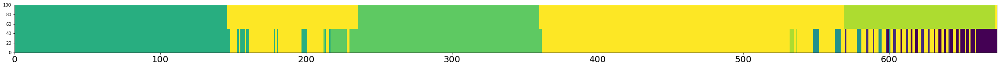

A,P,R:  0.7729970326409495 0.7277628032345014 0.7219251336898396
Num frames:  (371, 49)
Accuracy:  0.7729970326409495
Person:  889
Transitions:  [0, 8, 1, 8]
GT transitions:  1
Transitions captured:  1


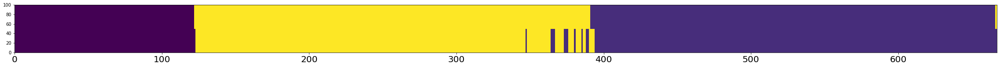

A,P,R:  0.9760119940029985 0.9680589680589681 0.9924433249370277
Num frames:  (407, 13)
Accuracy:  0.9760119940029985
Person:  890
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



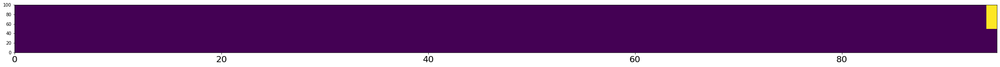

A,P,R:  0.9894736842105263 0.9894736842105263 1.0
Num frames:  (95, 1)
Accuracy:  0.9894736842105263
Person:  891
Transitions:  [7, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


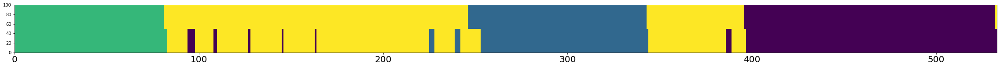

A,P,R:  0.9437148217636022 0.9329268292682927 0.9745222929936306
Num frames:  (328, 22)
Accuracy:  0.9437148217636022
Person:  892
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



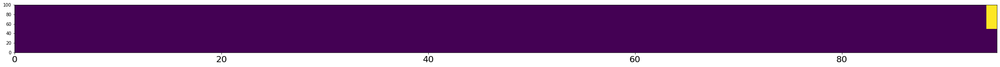

A,P,R:  0.9894736842105263 0.9894736842105263 1.0
Num frames:  (95, 1)
Accuracy:  0.9894736842105263
Person:  893
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



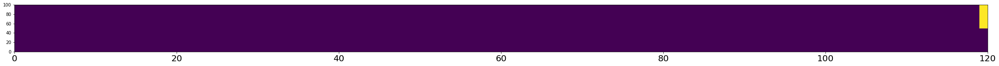

A,P,R:  0.9916666666666667 0.9916666666666667 1.0
Num frames:  (120, 1)
Accuracy:  0.9916666666666667
Person:  894
Transitions:  [7, 8, 1, 8]
GT transitions:  1
Transitions captured:  0


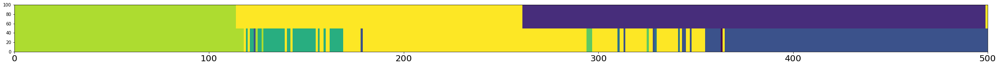

A,P,R:  0.428 0.35962145110410093 0.32386363636363635
Num frames:  (317, 48)
Accuracy:  0.428
Person:  895
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


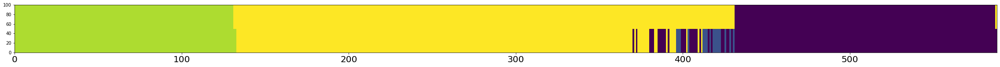

A,P,R:  0.9217687074829932 0.8618618618618619 1.0
Num frames:  (333, 46)
Accuracy:  0.9217687074829932
Person:  896
Transitions:  [0, 8, 1, 8, 4, 8, 5, 8]
GT transitions:  3
Transitions captured:  3


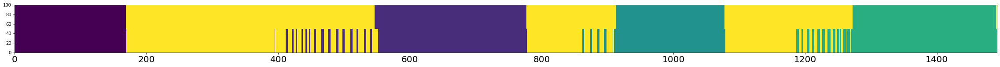

A,P,R:  0.9215291750503019 0.8740157480314961 0.9936061381074168
Num frames:  (889, 112)
Accuracy:  0.9215291750503019
Person:  897
Transitions:  [1, 8, 4, 8, 5, 8]
GT transitions:  2
Transitions captured:  2


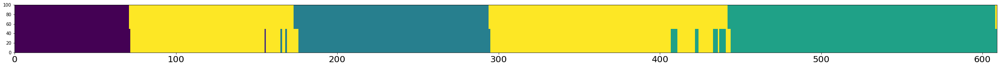

A,P,R:  0.9605911330049262 0.9489247311827957 0.9860335195530726
Num frames:  (372, 19)
Accuracy:  0.9605911330049262
Person:  898
Transitions:  [7, 8, 0, 8]
GT transitions:  1
Transitions captured:  1


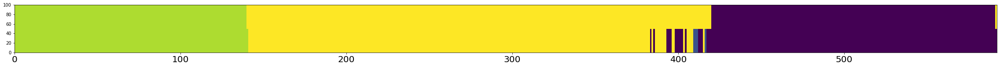

A,P,R:  0.9611486486486487 0.9311377245508982 1.0
Num frames:  (334, 23)
Accuracy:  0.9611486486486487
Person:  899
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



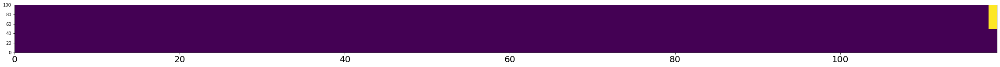

A,P,R:  0.9915966386554622 0.9915966386554622 1.0
Num frames:  (119, 1)
Accuracy:  0.9915966386554622
Person:  900
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



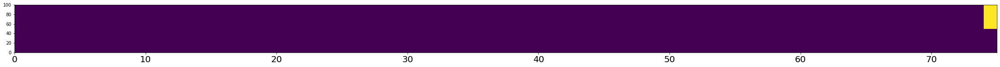

A,P,R:  0.9866666666666667 0.9866666666666667 1.0
Num frames:  (75, 1)
Accuracy:  0.9866666666666667
Person:  901
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



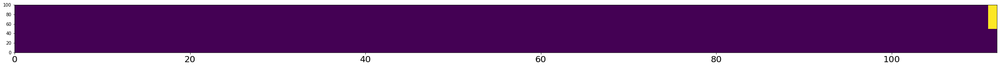

A,P,R:  0.9910714285714286 0.9910714285714286 1.0
Num frames:  (112, 1)
Accuracy:  0.9910714285714286
Person:  902
Transitions:  [7, 8]
GT transitions:  0
Transitions captured:  0



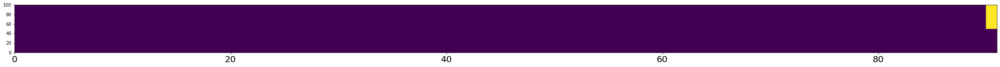

A,P,R:  0.989010989010989 0.989010989010989 1.0
Num frames:  (91, 1)
Accuracy:  0.989010989010989
Person:  903
Transitions:  [1, 8]
GT transitions:  0
Transitions captured:  0



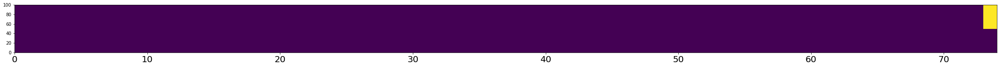

A,P,R:  0.9864864864864865 0.9864864864864865 1.0
Num frames:  (74, 1)
Accuracy:  0.9864864864864865
Person:  904
Transitions:  [5, 8, 6, 8, 7, 8]
GT transitions:  2
Transitions captured:  2


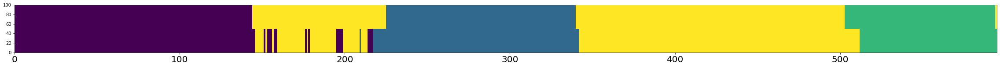

A,P,R:  0.9361344537815126 0.9216216216216216 0.9742857142857143
Num frames:  (370, 29)
Accuracy:  0.9361344537815126
Person:  905
Transitions:  [0, 8, 6, 8, 5, 8]
GT transitions:  2
Transitions captured:  1


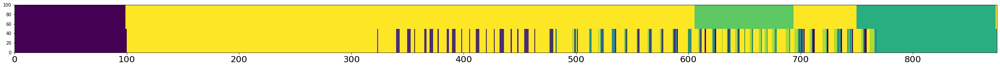

A,P,R:  0.752 0.5678670360110804 0.6591639871382636
Num frames:  (361, 111)
Accuracy:  0.752
0.9052014851263537
Average (only transitions) A,P,R 0.8863831132456529 0.8587505183878493 0.9083781506560458
Average (all targets) A,P,R,F, ttr 0.9052014851263523 0.8881049634821775 0.9246693011684323 225.19646799116998 [3, 3, 7, 1, 3, 1, 5, 1, 3, 1, 1, 3, 1, 1, 5, 1, 3, 5, 5, 5, 7, 5, 1, 1, 1, 3, 3, 3, 5, 7, 3, 7, 7, 5, 7, 3, 1, 1, 5, 5, 3, 3, 7, 1, 5, 7, 1, 5, 1, 1, 7, 5, 9, 1, 7, 7, 3, 1, 5, 1, 9, 7, 7, 3, 3, 1, 5, 5, 5, 3, 3, 1, 1, 5, 5, 7, 1, 1, 7, 7, 7, 7, 5, 7, 7, 1, 1, 3, 7, 3, 5, 5, 3, 5, 1, 5, 3, 1, 5, 3, 5, 3, 1, 5, 1, 5, 3, 5, 3, 3, 1, 5, 3, 3, 5, 1, 1, 5, 5, 1, 1, 3, 3, 3, 5, 5, 5, 7, 3, 3, 1, 3, 5, 5, 3, 5, 5, 5, 5, 1, 3, 5, 7, 7, 7, 5, 5, 1, 1, 3, 5, 5, 3, 5, 5, 5, 3, 5, 5, 3, 1, 3, 5, 1, 5, 7, 3, 7, 5, 9, 9, 3, 7, 5, 5, 1, 5, 5, 3, 3, 5, 5, 5, 7, 7, 5, 5, 7, 7, 3, 1, 5, 7, 13, 5, 7, 1, 3, 5, 1, 5, 5, 5, 7, 3, 7, 3, 5, 7, 5, 3, 9, 1, 1, 3, 1, 5, 5, 5, 7, 1, 1, 5, 1, 3, 7, 1, 5, 7

In [35]:
policy_net.eval()
req_inc = 0
render = False
_,acc,_,numTR = test_func(pTest,iloc='fix',eloc='last', fixLoc=2, isdebug=0, req_inc=req_inc)
tr_acc = 0
avg_tr_captured = []
A,P,R,F, ttr = [],[],[],[],[]
A_onlytr,P_onlytr,R_onlytr = [],[],[]
nfr = []
for i in range(len(acc)):
    print ('Person: ',i)
    gt = np.array([d[0] for d in acc[i]])
    pr = np.array([d[1] for d in acc[i]])
    g = gt #t[gt != num_camera-1]
    p = pr #r[gt != num_camera-1]
    
    dups,gt_tr = remove_duplicates(g)
    print ('Transitions: ', dups)
    print ('GT transitions: ', len(gt_tr))
    print ('Transitions captured: ', numTR[i])
    if len(gt_tr) != 0:
        avg_tr_captured.append((numTR[i],len(gt_tr)))
        contains_tr = 1
    else:
        print ('')
        contains_tr = 0
        #continue
    
    # plot transitions
    afc.plot_color_transitions(p,g)
    # MCTA and number of frames
    if req_inc == 1:
        ac,pr,re,fr,tr = afc.compute_APRF_one_person_sct_ict(p,g)
    else:
        ac,pr,re,fr,tr = afc.compute_APRF_one_person_sct_ict(p,g)
        
    if contains_tr == 1:
        A_onlytr.append(ac)
        P_onlytr.append(pr)
        R_onlytr.append(re)
    A.append(ac)
    P.append(pr)
    R.append(re)
    F.append(fr)
    ttr.append(tr)
    print ('A,P,R: ', ac,pr,re)
    f = afc.compute_num_frames(p,g)
    nfr.append(f)
    print ('Num frames: ', f)
    # Accuracy
    tacc = np.sum(g==p, dtype=np.float)/g.shape[0]
    tr_acc += tacc
    print ('Accuracy: ',tacc)
print (tr_acc/len(A))
print ('Average (only transitions) A,P,R', np.mean(A_onlytr),np.mean(P_onlytr),np.mean(R_onlytr))
print ('Average (all targets) A,P,R,F, ttr', np.mean(A),np.mean(P),np.mean(R),np.mean(F), ttr)
print (np.sum(nfr))

In [36]:
a = np.stack(avg_tr_captured)
print (np.mean(a[:,0]/a[:,1]))
print (sum(a[:,0])/sum(a[:,1]))

0.8923314339981007
0.8604651162790697


### Test function

In [ ]:
backup_fname = '/media/win/HRLhkl/Q_CamSel_3L_l4_st200_db3_1tCont_2'
hkl.dump([[episode_reward, running_reward]], backup_fname+'_variables.hkl')

In [ ]:
1/np.log(600*12)

In [ ]:
pp = 1
np.max(pTest[pp][1:,1] - pTest[pp][0:-1,1])